# HW4P2: Attention-based Speech Recognition

<img src="https://cdn.shopify.com/s/files/1/0272/2080/3722/products/SmileBumperSticker_5400x.jpg" alt="A cute cat" width="600">


Welcome to the final assignment in 11785. In this HW, you will work on building a speech recognition system with <i>attention</i>. <br> <br>

<center>
<img src="https://popmn.org/wp-content/uploads/2020/03/pay-attention.jpg" alt="A cute cat" height="100">
</center>

HW Writeup: On Piazza/Course Website <br>
Kaggle Competition Link: https://www.kaggle.com/competitions/11-785-s23-hw4p2/ <br>
Kaggle Dataset Link: https://www.kaggle.com/datasets/varunjain3/11-785-s23-hw4p2-dataset
<br>
LAS Paper: https://arxiv.org/pdf/1508.01211.pdf <br>
Attention is all you need:https://arxiv.org/pdf/1706.03762.pdf

# Read this section importantly!

1. By now, we believe that you are already a great deep learning practitioner, Congratulations. 🎉

2. You are allowed to use code from your previous homeworks for this homework. We will only provide, aspects that are necessary and new with this homework. 

3. There are a lot of resources provided in this notebook, that will help you check if you are running your implementations correctly.

In [ ]:
!nvidia-smi

Thu May  4 14:02:42 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    24W / 300W |      0MiB / 16384MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Install some required libraries
# Feel free to add more if you want
!pip install -q python-levenshtein torchsummaryX wandb kaggle pytorch-nlp 
# !pip install wandb --quiet
# !pip install torchsummaryX -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 37.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.1/90.1 kB 13.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.5/175.5 kB 23.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 97.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 23.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 201.7/201.7 kB 25.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.2 MB/s eta 0:00:00


# Imports

In [ ]:
# Import Necessary Modules you require for this HW here
import torch
from torch import nn
from torchsummaryX import summary
import torchnlp
import torchnlp.nn
from torchnlp.nn import LockedDropout
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.rnn import pad_sequence, pack_padded_sequence, pad_packed_sequence
import os
import gc
import random
from tqdm import tqdm
import numpy as np
import pandas as pd
import glob
# import wandb
import matplotlib.pyplot as plt
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Device: ", DEVICE)
import json
import Levenshtein
import seaborn as sns
import torchaudio

Device:  cuda


# Toy Dataset Download

In [ ]:
!wget -q https://cmu.box.com/shared/static/om4qpzd4tf1xo4h7230k4v1pbdyueghe --content-disposition --show-progress
!unzip -q hw4p2_toy.zip -d ./

hw4p2_toy.zip       100%[===================>] 343.92M  14.4MB/s    in 27s     


# Kaggle Dataset Download

In [ ]:
!pip install --upgrade --force-reinstall --no-deps kaggle==1.5.8
!mkdir /root/.kaggle

with open("/root/.kaggle/kaggle.json", "w+") as f:
    f.write('{"username":"nikhilcg2603","key":"d12f16cd7c7cafbd23c41156ba042258"}') # TODO: Put your kaggle username & key here

!chmod 600 /root/.kaggle/kaggle.json

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.2/59.2 kB 6.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for kaggle: filename=kaggle-1.5.8-py3-none-any.whl size=73272 sha256=6fc60d0418888146c3b8ae87d977e23a2b49ffd7d53f5710737c274f7d7f677f
  Stored in directory: /root/.cache/pip/wheels/d4/02/ef/3f8c8d86b8d5388a1d3155876837f1a1a3143ab3fc2ff1ffad
Successfully built kaggle
  Attempting uninstall: kaggle
    Found existing installation: kaggle 1.5.13
    Uninstalling kaggle-1.5.13:
      Successfully uninstalled kaggle-1.5.13


In [ ]:
# To download the dataset
!kaggle datasets download -d varunjain3/11-785-s23-hw4p2-dataset

100% 3.73G/3.74G [00:28<00:00, 132MB/s]
100% 3.74G/3.74G [00:28<00:00, 140MB/s]


In [ ]:
# To unzip data quickly and quietly
!unzip -q 11-785-s23-hw4p2-dataset.zip -d ./data

# Dataset and Dataloaders

We have given you 2 datasets. One is a toy dataset, and the other is the standard LibriSpeech dataset. The toy dataset is to help you get your code implemented and tested and debugged easily, to verify that your attention diagonal is produced correctly. Note however that it's task (phonetic transcription) is drawn from HW3P2, it is meant to be familiar and help you understand how to transition from phonetic transcription to alphabet transcription, with a working attention module.

Please make sure you use the right constants in your code implementation for future modules, (SOS_TOKEN vs SOS_TOKEN_TOY) when working with either dataset. We have defined the constants accordingly below. Before you come to OH or post on piazza, make sure you aren't misuing the constants for either dataset in your code. 

## Toy Dataset

The toy dataset is a dataset of fixed length speech sequences that have phonetic transcripts. The reason we made it with phonetic transcripts was to help you understand how attention can work with phonetic transcription that you have done in HW3P2

In [ ]:
# Load the toy dataset
import numpy as np
import torch
X_train = np.load("hw4p2_toy/f0176_mfccs_train_new.npy")
X_valid = np.load("hw4p2_toy/f0176_mfccs_dev_new.npy")
Y_train = np.load("hw4p2_toy/f0176_hw3p2_train.npy")
Y_valid = np.load("hw4p2_toy/f0176_hw3p2_dev.npy")

# This is how you actually need to find out the different trancripts in a dataset. 
# Can you think whats going on here? Why are we using a np.unique?
VOCAB_MAP_TOY           = dict(zip(np.unique(Y_valid), range(len(np.unique(Y_valid))))) 
VOCAB_MAP_TOY["[PAD]"]  = len(VOCAB_MAP_TOY)
VOCAB_TOY               = list(VOCAB_MAP_TOY.keys())

SOS_TOKEN_TOY = VOCAB_MAP_TOY["[SOS]"]
EOS_TOKEN_TOY = VOCAB_MAP_TOY["[EOS]"]
PAD_TOKEN_TOY = VOCAB_MAP_TOY["[PAD]"]

Y_train = [np.array([VOCAB_MAP_TOY[p] for p in seq]) for seq in Y_train]
Y_valid = [np.array([VOCAB_MAP_TOY[p] for p in seq]) for seq in Y_valid]

In [ ]:
VOCAB_MAP_TOY

In [ ]:
class ToyDataset(torch.utils.data.Dataset):

    def __init__(self, partition):

        if partition == "train":
            self.mfccs = X_train
            self.transcripts = Y_train

        elif partition == "valid":
            self.mfccs = X_valid
            self.transcripts = Y_valid

        assert len(self.mfccs) == len(self.transcripts)

        self.length = len(self.mfccs)

    def __len__(self):

        return self.length

    def __getitem__(self, i):

        x = torch.FloatTensor(self.mfccs[i])
        y = torch.tensor(self.transcripts[i])

        return x, y

    def collate_fn(self, batch):

        x_batch, y_batch = list(zip(*batch))

        x_lens      = [x.shape[0] for x in x_batch] 
        y_lens      = [y.shape[0] for y in y_batch] 

        x_batch_pad = torch.nn.utils.rnn.pad_sequence(x_batch, batch_first=True, padding_value= PAD_TOKEN_TOY)
        y_batch_pad = torch.nn.utils.rnn.pad_sequence(y_batch, batch_first=True, padding_value= PAD_TOKEN_TOY) 
        
        return x_batch_pad, y_batch_pad, torch.tensor(x_lens), torch.tensor(y_lens)

In [ ]:
config = {}
config['batch_size'] = 128
config['lr'] = 0.001
train_toy_dataset   = ToyDataset(partition= 'train')
valid_toy_dataset   = ToyDataset(partition= 'valid')

train_toy_loader    = torch.utils.data.DataLoader(
    dataset     = train_toy_dataset, 
    batch_size  = config['batch_size'], 
    shuffle     = True,
    num_workers = 4, 
    pin_memory  = True,
    collate_fn  = train_toy_dataset.collate_fn
)

valid_toy_loader    = torch.utils.data.DataLoader(
    dataset     = valid_toy_dataset, 
    batch_size  = config['batch_size'], 
    shuffle     = False,
    num_workers = 2, 
    pin_memory  = True,
    collate_fn  = valid_toy_dataset.collate_fn
)

print("No. of train mfccs   : ", train_toy_dataset.__len__())
print("Batch size           : ", config['batch_size'])
print("Train batches        : ", train_toy_loader.__len__())
print("Valid batches        : ", valid_toy_loader.__len__())

No. of train mfccs   :  16000
Batch size           :  128
Train batches        :  125
Valid batches        :  13


In [ ]:
for batch in valid_toy_loader:
    x, y, lx, ly = batch
    print(x.shape, y.shape, lx.shape, ly.shape)
    break

torch.Size([128, 176, 27]) torch.Size([128, 23]) torch.Size([128]) torch.Size([128])


## LibriSpeech

In terms of the dataset, the dataset structure for HW3P2 and HW4P2 dataset are very similar. Can you spot out the differences? What all will be required?? 

Hints:

- Check how big is the dataset (do you require memory efficient loading techniques??)
- How do we load mfccs? Do we need to normalise them? 
- Does the data have \<SOS> and \<EOS> tokens in each sequences? Do we remove them or do we not remove them? (Read writeup)
- Would we want a collating function? Ask yourself: Why did we need a collate function last time?
- Observe the VOCAB, is the dataset same as HW3P2? 
- Should you add augmentations, if yes which augmentations? When should you add augmentations? (Check bootcamp for answer)


In [ ]:
config = {
  'batch_size': 150,
  'lr':1e-3,
  'epochs': 80,
}

VOCAB = ['<pad>', '<sos>', '<eos>', 
         'A',   'B',    'C',    'D',    
         'E',   'F',    'G',    'H',    
         'I',   'J',    'K',    'L',       
         'M',   'N',    'O',    'P',    
         'Q',   'R',    'S',    'T', 
         'U',   'V',    'W',    'X', 
         'Y',   'Z',    "'",    ' ', 
         ]

VOCAB_MAP = {VOCAB[i]:i for i in range(0, len(VOCAB))}

PAD_TOKEN = VOCAB_MAP["<pad>"]
SOS_TOKEN = VOCAB_MAP["<sos>"]
EOS_TOKEN = VOCAB_MAP["<eos>"]

print(f"Length of vocab: {len(VOCAB)}")
print(f"Vocab: {VOCAB}")
print(f"PAD_TOKEN: {PAD_TOKEN}")
print(f"SOS_TOKEN: {SOS_TOKEN}")
print(f"EOS_TOKEN: {EOS_TOKEN}")

Length of vocab: 31
Vocab: ['<pad>', '<sos>', '<eos>', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', "'", ' ']
PAD_TOKEN: 0
SOS_TOKEN: 1
EOS_TOKEN: 2


In [ ]:
class SpeechDataset(torch.utils.data.Dataset):
  '''
  Feel free to add arguments, additional functions, this is the 
  bare-minimum template.
  '''
  def __init__(self, root = "/content/data", vocab_map = VOCAB_MAP, partition = "train-clean-100"):
    self.vocab_map = vocab_map
    self.mfcc_dir = os.path.join(root,partition)+"/mfcc" #TODO
    self.transcript_dir = os.path.join(root,partition)+"/transcripts" #TODO
    mfcc_names          = sorted(os.listdir(self.mfcc_dir))
    transcript_names    = sorted(os.listdir(self.transcript_dir))
    assert len(mfcc_names) == len(transcript_names)

    self.mfccs = []#TODO
    self.transcripts = []#TODO
    for i in range(len(mfcc_names)):
        mfcc        = np.load(os.path.join(self.mfcc_dir,mfcc_names[i]))
        mfcc        = mfcc - (np.sum(mfcc, axis = 0)/mfcc.shape[0])
        transcript  = np.load(os.path.join(self.transcript_dir,transcript_names[i])) # Remove [SOS] and [EOS] from the transcript
        # transcript = transcript.astype(np.uint8) 
        self.mfccs.append(mfcc)
        self.transcripts.append(transcript)

    self.length = len(self.mfccs)
    self.transcripts = [np.array([self.vocab_map[i] for i in seq]) for seq in self.transcripts]

  def __len__(self):
    return self.length
  
  def __getitem__(self, ind):

    mfcc = torch.FloatTensor(self.mfccs[ind])
    transcript = torch.tensor(self.transcripts[ind])

    return mfcc, transcript

  
  def collate_fn(self, batch):

    x_batch, y_batch = list(zip(*batch))
   
    x_lens      = [x.shape[0] for x in x_batch] 
    y_lens      = [y.shape[0] for y in y_batch] 
    
    x_batch_pad = torch.nn.utils.rnn.pad_sequence(x_batch, batch_first=True, padding_value= PAD_TOKEN)
    y_batch_pad = torch.nn.utils.rnn.pad_sequence(y_batch, batch_first=True, padding_value= PAD_TOKEN)

    return x_batch_pad, y_batch_pad, torch.tensor(x_lens), torch.tensor(y_lens)


In [ ]:
class SpeechDatasetTest(torch.utils.data.Dataset):
  '''
  Feel free to add arguments, additional functions, this is the 
  bare-minimum template.
  '''
  def __init__(self, root = "/content/data", vocab_map = VOCAB_MAP, partition = "test-clean"):
    self.vocab_map = vocab_map
    self.mfcc_dir = os.path.join(root,partition)+"/mfcc" #TODO
    mfcc_names          = sorted(os.listdir(self.mfcc_dir))



    self.mfccs = []#TODO
    for i in range(len(mfcc_names)):
        mfcc        = np.load(os.path.join(self.mfcc_dir,mfcc_names[i]))
        mfcc        = mfcc - (np.sum(mfcc, axis = 0)/mfcc.shape[0])
        self.mfccs.append(mfcc)

    self.length = len(self.mfccs)

  def __len__(self):
    return self.length
  
  def __getitem__(self, ind):

    mfcc = torch.FloatTensor(self.mfccs[ind])

    return mfcc

  
  def collate_fn(self, batch):
    
    batch_mfcc = []  # TODO
    lengths_mfcc = []

    for data in batch:
        batch_mfcc.append(data)
        lengths_mfcc.append(len(data)) 

    batch_mfcc_pad = pad_sequence(batch_mfcc, batch_first = True, padding_value = PAD_TOKEN)

    return batch_mfcc_pad, torch.tensor(lengths_mfcc)

In [ ]:
train_data = SpeechDataset(partition = "train-clean-100") #TODO
val_data = SpeechDataset(partition = "dev-clean")
test_data = SpeechDatasetTest()

train_loader = torch.utils.data.DataLoader(
    dataset     = train_data, 
    num_workers = 6,
    batch_size  = config['batch_size'], 
    pin_memory  = True,
    shuffle     = True,
    collate_fn  = train_data.collate_fn
)#TODO
val_loader = torch.utils.data.DataLoader(
    dataset     = val_data, 
    num_workers = 2,
    batch_size  = config['batch_size'], 
    pin_memory  = True,
    shuffle     = True,
    collate_fn  = val_data.collate_fn
)#TODO
test_loader = torch.utils.data.DataLoader(
    dataset     = test_data, 
    num_workers = 1,
    batch_size  = config['batch_size'], 
    pin_memory  = True,
    shuffle     = False,
    collate_fn  = test_data.collate_fn
) 


In [ ]:
print("\nChecking the shapes of the data...")
for batch in train_loader:
    x, y, lx, ly = batch
    print(x.shape, y.shape, lx.shape, ly.shape)
    break



Checking the shapes of the data...
torch.Size([150, 1654, 27]) torch.Size([150, 328]) torch.Size([150]) torch.Size([150])


Check if you are loading the data correctly with the following:

(Note: These are outputs from loading your data in the dataset class, not your dataloader which will have padded sequences)

- Train Dataset
```
Partition loaded:  train-clean-100
Max mfcc length:  2448
Average mfcc length:  1264.6258453344547
Max transcript:  400
Average transcript length:  186.65321139493324
```

- Dev Dataset
```
Partition loaded:  dev-clean
Max mfcc length:  3260
Average mfcc length:  713.3570107288198
Max transcript:  518
Average transcript length:  108.71698113207547
```

- Test Dataset
```
Partition loaded:  test-clean
Max mfcc length:  3491
Average mfcc length:  738.2206106870229
```

If your values is not matching, read hints, think what could have gone wrong. Then approach TAs.

# THE MODEL 

### Listen, Attend and Spell
Listen, Attend and Spell (LAS) is a neural network model used for speech recognition and synthesis tasks.

- LAS is designed to handle long input sequences and is robust to noisy speech signals.
- LAS is known for its high accuracy and ability to improve over time with additional training data.
- It consists of an <b>listener, an attender and a speller</b>, which work together to convert an input speech signal into a corresponding output text.

#### The Dataflow:
<center>
<img src="https://github.com/varunjain3/11785_s23_h4p2/raw/main/DataFlow.png" alt="data flow" height="100">
</center>

#### The Listener: 
- converts the input speech signal into a sequence of hidden states.

#### The Attender:
- Decides how the sequence of Encoder hidden state is propogated to decoder.

#### The Speller:
- A language model, that incorporates the "context of attender"(output of attender) to predict sequence of words.






## The Listener:

Psuedocode:
```python
class Listner:
  def init():
    feature_embedder = #Few layers of 1DConv-batchnorm-activation (Don't overdo)
    pblstm_encoder = #Cascaded pblstm layers (Take pblstm from #HW3P2), 
    #can add more sequential lstms 
    dropout = #As per your liking

  def forward(x,lx):
    embedding = feature_embedder(x) #optional
    encoding, encoding_len = pblstm_encoder(embedding/x,lx)
    #Regularization if needed
    return encoding, encoding_len
```



In [ ]:

class PermuteBlock(torch.nn.Module):
    def forward(self, x):
        return x.transpose(1, 2)
        
class pBLSTM(torch.nn.Module):
    
    def __init__(self, input_size, hidden_size):
        super(pBLSTM, self).__init__()

        self.blstm = nn.LSTM(input_size = input_size, hidden_size = hidden_size, num_layers = 1, batch_first = True, dropout = 0.18, bidirectional = True) # TODO: Initialize a single layer bidirectional LSTM with the given input_size and hidden_size
    
    
    def forward(self, x_packed):
        x, seq_length = pad_packed_sequence(x_packed, batch_first = True, padding_value = PAD_TOKEN)
        x_downsampled, x_lens = self.trunc_reshape(x, seq_length)
        x_down_packed = pack_padded_sequence(x_downsampled, x_lens, batch_first = True, enforce_sorted = False)
        output, _ = self.blstm(x_down_packed)
        return output, x_lens

    def trunc_reshape(self, x, x_lens): 
        batch_size, t_step, feature_dim = x.shape

        if t_step % 2 != 0:
          x = x[:,:-1,:]
          t_step -= 1

        x = x.reshape((batch_size, int(t_step/2), feature_dim*2))
        x_lens = x_lens//2
        return x, x_lens

In [ ]:
class Listener(torch.nn.Module):
  def __init__(self, input_size, encoder_hidden_size):
    super(Listener, self).__init__()
    
    self.embedding = torch.nn.Sequential(
              torch.nn.Conv1d(in_channels=input_size,out_channels=210,kernel_size=5,padding=2),
              torch.nn.BatchNorm1d(210),
              torch.nn.GELU(),
              torch.nn.Conv1d(in_channels=210,out_channels= 2*encoder_hidden_size,kernel_size=5,padding=2)
              )#TODO: You can use CNNs as Embedding layer to extract features. Keep in mind the Input dimensions and expected dimension of Pytorch CNN.

    self.drop1 = LockedDropout(p = 0.45)
    self.drop2 = LockedDropout(p = 0.3)

    self.pblstm1 = pBLSTM(input_size = 4*encoder_hidden_size, hidden_size = 2*encoder_hidden_size)
    self.pblstm2 = pBLSTM(input_size = 8*encoder_hidden_size, hidden_size = 2*encoder_hidden_size)
    # self.pblstm3 = pBLSTM(input_size = 2*2*2*encoder_hidden_size, hidden_size = 2*encoder_hidden_size)
    self.permute = PermuteBlock()

  def forward(self, x, x_lens):
    x = self.permute(x)
    x = self.embedding(x)
    x = self.permute(x)


    x = pack_padded_sequence(x, lengths = x_lens, batch_first = True, enforce_sorted = False)


    pblstm1_out, x_lens = self.pblstm1(x)
    pblstm1_out, x_lens = pad_packed_sequence(pblstm1_out, batch_first = True, padding_value = PAD_TOKEN)

    pblstm1_out = pblstm1_out.transpose(0,1)
    pblstm1_out = self.drop1(pblstm1_out)
    pblstm1_out = pblstm1_out.transpose(0,1)
    
    pblstm1_out = pack_padded_sequence(pblstm1_out, lengths = x_lens, batch_first = True, enforce_sorted = False)

    pblstm2_out, x_lens = self.pblstm2(pblstm1_out)
    pblstm2_out, x_lens = pad_packed_sequence(pblstm2_out, batch_first=True, padding_value = PAD_TOKEN)

    pblstm2_out = pblstm2_out.transpose(0,1)
    pblstm2_out = self.drop2(pblstm2_out)
    pblstm2_out = pblstm2_out.transpose(0,1)

    

    return pblstm2_out, x_lens


## Attention

### Different ways to compute Attention

1. Dot-product attention
    * raw_weights = bmm(key, query) 
    * Optional: Scaled dot-product by normalizing with sqrt key dimension 
    * Check "Attention is All You Need" Section 3.2.1
    * 1st way is what most TAs are comfortable with, but if you want to explore, check out other methods below


2. Cosine attention
    * raw_weights = cosine(query, key) # almost the same as dot-product xD 

3. Bi-linear attention
    * W = Linear transformation (learnable parameter): d_k -> d_q
    * raw_weights = bmm(key @ W, query)

4. Multi-layer perceptron
    * Check "Neural Machine Translation and Sequence-to-sequence Models: A Tutorial" Section 8.4

5. Multi-Head Attention
    * Check "Attention is All You Need" Section 3.2.2
    * h = Number of heads
    * W_Q, W_K, W_V: Weight matrix for Q, K, V (h of them in total)
    * W_O: d_v -> d_v
    * Reshape K: (B, T, d_k) to (B, T, h, d_k // h) and transpose to (B, h, T, d_k // h)
    * Reshape V: (B, T, d_v) to (B, T, h, d_v // h) and transpose to (B, h, T, d_v // h)
    * Reshape Q: (B, d_q) to (B, h, d_q // h) `
    * raw_weights = Q @ K^T
    * masked_raw_weights = mask(raw_weights)
    * attention = softmax(masked_raw_weights)
    * multi_head = attention @ V
    * multi_head = multi_head reshaped to (B, d_v)
    * context = multi_head @ W_O

Pseudocode:

```python
class Attention:
    '''
    Attention is calculated using the key, value (from encoder embeddings) and query from decoder.

    After obtaining the raw weights, compute and return attention weights and context as follows.:

    attention_weights   = softmax(raw_weights)
    attention_context   = einsum("thinkwhatwouldbetheequationhere",attention, value) #take hint from raw_weights calculation

    At the end, you can pass context through a linear layer too.
    '''

    def init(listener_hidden_size,
              speller_hidden_size,
              projection_size):

        VW = Linear(listener_hidden_size,projection_size)
        KW = Linear(listener_hidden_size,projection_size)
        QW = Linear(speller_hidden_size,projection_size)

    def set_key_value(encoder_outputs):
        '''
        In this function we take the encoder embeddings and make key and values from it.
        key.shape   = (batch_size, timesteps, projection_size)
        value.shape = (batch_size, timesteps, projection_size)
        '''
        key = KW(encoder_outputs)
        value = VW(encoder_outputs)
      
    def compute_context(decoder_context):
        '''
        In this function from decoder context, we make the query, and then we
         multiply the queries with the keys to find the attention logits, 
         finally we take a softmax to calculate attention energy which gets 
         multiplied to the generted values and then gets summed.

        key.shape   = (batch_size, timesteps, projection_size)
        value.shape = (batch_size, timesteps, projection_size)
        query.shape = (batch_size, projection_size)

        You are also recomended to check out Abu's Lecture 19 to understand Attention better.
        '''
        query = QW(decoder_context) #(batch_size, projection_size)

        raw_weights = #using bmm or einsum. We need to perform batch matrix multiplication. It is important you do this step correctly.
        #What will be the shape of raw_weights?

        attention_weights = #What makes raw_weights -> attention_weights

        attention_context = #Multiply attention weights to values

        return attention_context, attention_weights 
```

In [ ]:
class Attention(torch.nn.Module):

  def __init__(self, listener_size, speller_size, projection_size):
    super().__init__()
    
    self.VW = torch.nn.Linear(listener_size,projection_size)
    self.KW = torch.nn.Linear(listener_size,projection_size)
    self.QW = torch.nn.Linear(speller_size,projection_size)
    self.softmax = torch.nn.Softmax(dim=1)

  def set_key_value(self, encoder_outputs):
    # print(encoder_outputs.shape)
    self.key = self.KW(encoder_outputs)
    self.value = self.VW(encoder_outputs)

  def compute_context(self, decoder_context):

    self.query = self.QW(decoder_context)
    self.query = torch.unsqueeze(self.query,2)
    length_q = self.query.shape[1]
    # print("key: ", self.key.shape)
    # print("q: ", self.query.shape)
    raw_weights = torch.bmm(self.key, self.query).squeeze()
    attention_weights = self.softmax(raw_weights/np.sqrt(length_q))
    attention_context = torch.einsum('bi,bij->bj', attention_weights,self.value)

    return attention_context, attention_weights

## The Speller

Similar to the language model that you coded up for HW4P1, you have to code a language model for HW4P2 as well. This time, we will also call the attention context step, within the decoder to get the attended-encoder-embeddings.


What you have coded till now:

<center>
<img src="https://github.com/varunjain3/11785_s23_h4p2/raw/main/EncoderAttention.png" alt="data flow" height="400">
</center>

For the Speller, what we have to code:


<center>
<img src="https://github.com/varunjain3/11785_s23_h4p2/raw/main/Decoder.png" alt="data flow" height="400">
</center>

In [ ]:
class Speller(torch.nn.Module):

  # Refer to your HW4P1 implementation for help with setting up the language model.
  # The only thing you need to implement on top of your HW4P1 model is the attention module and teacher forcing.

  def __init__(self, vocab_size, embedding_size, projection_size, speller_size, attender):
    super(). __init__()

    lstm_size = embedding_size+projection_size
    self.attend = attender # Attention object in speller
    self.max_timesteps = 550 # Max timesteps
    self.projection_size = projection_size

    self.embedding =  torch.nn.Embedding(vocab_size, embedding_size) # Embedding layer to convert token to latent space

    self.lstm_cells =  torch.nn.Sequential(
            torch.nn.LSTMCell(lstm_size, speller_size),
            torch.nn.LSTMCell(speller_size, speller_size),
            torch.nn.LSTMCell(speller_size, speller_size)
        )# Create a sequence of LSTM Cells
    

    # For CDN (Feel free to change)
    self.output_to_char = torch.nn.Linear(speller_size+projection_size, embedding_size)# Linear module to convert outputs to correct hidden size (Optional: TO make dimensions match)
    self.activation = torch.nn.GELU()# Check which activation is suggested
    self.dropout = torch.nn.Dropout(p=0.15)

    self.linear = torch.nn.Linear(embedding_size, embedding_size)
    self.char_prob = torch.nn.Linear(embedding_size, vocab_size) # Linear layer to convert hidden space back to logits for token classification
    self.char_prob.weight = self.embedding.weight# Weight tying (From embedding layer)
    self.drop = torch.nn.Dropout(p=0.21)
    self.apply(self._init_weights)

  def lstm_step(self, embedding, hidden_states_list):

    for i in range(len(self.lstm_cells)):
        if i == 0:
          embedding, cell_state = self.lstm_cells[i](embedding,hidden_states_list[i]) # Feed the input through each LSTM Cell
        else:
          embedding, cell_state = self.lstm_cells[i](embedding,hidden_states_list[i])


        embedding = self.drop(embedding)
        hidden_states_list[i] = (embedding, cell_state)

        
    return embedding, hidden_states_list # What information does forward() need?
    
  def CDN(self, input):
    # Make the CDN here, you can add the output-to-char
    # print("input",input.shape)
    # print("lstm size", )
    out = self.activation(self.output_to_char(self.dropout(input)))
    out = self.activation(self.linear(self.dropout(out)))
    out = self.char_prob(out)
    return out
  
  def _init_weights(self, module):
    if isinstance(module, nn.LSTMCell):
     torch.nn.init.uniform_(module.weight_ih, -0.1, 0.1)
     torch.nn.init.uniform_(module.weight_hh, -0.1, 0.1)

  def forward (self,x, y=None, teacher_forcing_ratio=1):
    batch_size = x.shape[0]

    attn_context = torch.zeros(batch_size, self.projection_size).to(DEVICE)# initial context tensor for time t = 0
    output_symbol = torch.full((batch_size,), SOS_TOKEN).to(DEVICE) # Set it to SOS for time t = 0
    
    raw_outputs = []  
    attention_plot = []
      
    if y is None:
      timesteps = self.max_timesteps
      teacher_forcing_ratio = 0 #Why does it become zero?

    else:
      timesteps = y.shape[1] # How many timesteps are we predicting for?

    hidden_states_list = [None] * len(self.lstm_cells)# Initialize your hidden_states list here similar to HW4P1

    for t in range(timesteps):
      p = random.uniform(0,1)# generate a probability p between 0 and 1

      if p < teacher_forcing_ratio and t > 0: # Why do we consider cases only when t > 0? What is considered when t == 0? Think.
        output_symbol = y[:,t-1] # Take from y, else draw from probability distribution

      # elif p > teacher_forcing_ratio and t > 0:
      char_embed = self.embedding(output_symbol) # Embed the character symbol

      # Concatenate the character embedding and context from attention, as shown in the diagram
      lstm_input = torch.cat((char_embed,attn_context), dim = 1)

      lstm_out, hidden_states_list = self.lstm_step(lstm_input, hidden_states_list) # Feed the input through LSTM Cells and attention.
      # What should we retrieve from forward_step to prepare for the next timestep?

      attn_context, attn_weights = self.attend.compute_context(lstm_out) # Feed the resulting hidden state into attention

      cdn_input = torch.cat((lstm_out,attn_context), dim = 1)# TODO: You need to concatenate the context from the attention module with the LSTM output hidden state, as shown in the diagram

      raw_pred = self.CDN(cdn_input) # call CDN with cdn_input

      # Generate a prediction for this timestep and collect it in output_symbols
      # print(raw_pred.shape)
      output_symbol = torch.argmax(raw_pred, dim = 1)# Draw correctly from raw_pred

      raw_outputs.append(raw_pred) # for loss calculation
      attention_plot.append(attn_weights) # for plotting attention plot

    
    attention_plot = torch.stack(attention_plot, dim=1)
    raw_outputs = torch.stack(raw_outputs, dim=1)

    return raw_outputs, attention_plot

## LAS

Here we finally build the LAS model, comibining the listener, attender and speller together, we have given a template, but you are free to read the paper and implement it yourself.

In [ ]:
class LAS(torch.nn.Module):
  def __init__(self, vocab_size, embedding_size, input_size, encoder_hidden_size, listener_size, speller_size, projection_size): # add parameters
    super().__init__()
    self.name = "LAS"
    # Pass the right parameters here
    self.listener = Listener(input_size, encoder_hidden_size)
    self.attend = Attention(listener_size, speller_size, projection_size)
    self.speller = Speller(vocab_size, embedding_size, projection_size, speller_size, self.attend)

    self.aug = torch.nn.Sequential(
        PermuteBlock(),
        torchaudio.transforms.TimeMasking(58),
        torchaudio.transforms.FrequencyMasking(5),
        PermuteBlock()
    )
  def forward(self, x,lx,y=None,teacher_forcing_ratio=1):
    # Encode speech features
    if self.training:
      x = self.aug(x)
      
    encoder_outputs, _ = self.listener(x,lx)

    # We want to compute keys and values ahead of the decoding step, as they are constant for all timesteps
    # Set keys and values using the encoder outputs
    # print(encoder_outputs.shape)
    self.attend.set_key_value(encoder_outputs)

    # Decode text with the speller using context from the attention
    raw_outputs, attention_plots = self.speller(x, y,teacher_forcing_ratio=teacher_forcing_ratio)

    return raw_outputs, attention_plots

# Model Setup 

In [ ]:
# Baseline LAS has the following configuration:
# Encoder bLSTM/pbLSTM Hidden Dimension of 512 (256 per direction)
# Decoder Embedding Layer Dimension of 256
# Decoder Hidden Dimension of 512 
# Attention Projection Size of 128
# Feel Free to Experiment with this 

# vocab_size, speller_embedding_size, input_size, listener_hidden_size, listener_size, speller_size, projection_size
model = LAS(
    # Initialize your model 
    # Read the paper and think about what dimensions should be used
    # You can experiment on these as well, but they are not requried for the early submission
    # Remember that if you are using weight tying, some sizes need to be the same
    vocab_size=31,
    embedding_size=580,
    input_size=27,
    encoder_hidden_size=295,
    listener_size = 1180,
    speller_size = 300,
    projection_size = 600
)

model = model.to(DEVICE)
print(model)

summary(model, 
        x.to(DEVICE), 
        lx,
        y.to(DEVICE))

/usr/local/lib/python3.9/dist-packages/torch/nn/modules/rnn.py:71: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.18 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


LAS(
  (listener): Listener(
    (embedding): Sequential(
      (0): Conv1d(27, 210, kernel_size=(5,), stride=(1,), padding=(2,))
      (1): BatchNorm1d(210, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): GELU(approximate='none')
      (3): Conv1d(210, 590, kernel_size=(5,), stride=(1,), padding=(2,))
    )
    (drop1): LockedDropout(p=0.45)
    (drop2): LockedDropout(p=0.3)
    (pblstm1): pBLSTM(
      (blstm): LSTM(1180, 590, batch_first=True, dropout=0.18, bidirectional=True)
    )
    (pblstm2): pBLSTM(
      (blstm): LSTM(2360, 590, batch_first=True, dropout=0.18, bidirectional=True)
    )
    (permute): PermuteBlock()
  )
  (attend): Attention(
    (VW): Linear(in_features=1180, out_features=600, bias=True)
    (KW): Linear(in_features=1180, out_features=600, bias=True)
    (QW): Linear(in_features=300, out_features=600, bias=True)
    (softmax): Softmax(dim=1)
  )
  (speller): Speller(
    (attend): Attention(
      (VW): Linear(in_features=1180, out_

/usr/local/lib/python3.9/dist-packages/torchsummaryX/torchsummaryX.py:101: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_sum = df.sum()


                                Kernel Shape     Output Shape Params Mult-Adds
Layer                                                                         
0_aug.PermuteBlock_0                       -  [150, 27, 1654]      -         -
1_aug.TimeMasking_1                        -  [150, 27, 1654]      -         -
2_aug.FrequencyMasking_2                   -  [150, 27, 1654]      -         -
3_aug.PermuteBlock_3                       -  [150, 1654, 27]      -         -
4_listener.PermuteBlock_permute            -  [150, 27, 1654]      -         -
...                                      ...              ...    ...       ...
5917_speller.GELU_activation               -       [150, 580]      -         -
5918_speller.Dropout_dropout               -       [150, 580]      -         -
5919_speller.Linear_linear        [580, 580]       [150, 580]      -    336.4k
5920_speller.GELU_activation               -       [150, 580]      -         -
5921_speller.Linear_char_prob      [580, 31]        

,Kernel Shape,Output Shape,Params,Mult-Adds
Layer,,,,
0_aug.PermuteBlock_0,-,"[150, 27, 1654]",NaN,NaN
1_aug.TimeMasking_1,-,"[150, 27, 1654]",NaN,NaN
2_aug.FrequencyMasking_2,-,"[150, 27, 1654]",NaN,NaN
3_aug.PermuteBlock_3,-,"[150, 1654, 27]",NaN,NaN
4_listener.PermuteBlock_permute,-,"[150, 27, 1654]",NaN,NaN
...,...,...,...,...
5917_speller.GELU_activation,-,"[150, 580]",NaN,NaN
5918_speller.Dropout_dropout,-,"[150, 580]",NaN,NaN
5919_speller.Linear_linear,"[580, 580]","[150, 580]",NaN,336400.0


# Loss Function, Optimizers, Scheduler

In [ ]:
optimizer   = torch.optim.AdamW(model.parameters(), lr= config['lr']) # Feel free to experiment if needed
criterion   = torch.nn.CrossEntropyLoss(reduction='mean',ignore_index=PAD_TOKEN) #check how would you fill these values : https://pytorch.org/docs/stable/generated/torch.nn.CrossEntropyLoss.html
scaler      = torch.cuda.amp.GradScaler()
scheduler   = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max = 70, eta_min = 0.000001)

# Optional (but Recommended): Create a custom class for a Teacher Force Schedule

# Levenshtein Distance

In [ ]:
# We have given you this utility function which takes a sequence of indices and converts them to a list of characters
def indices_to_chars(indices, vocab):
    tokens = []
    for i in indices: # This loops through all the indices
        if int(i) == SOS_TOKEN: # If SOS is encountered, dont add it to the final list
            continue
        elif int(i) == EOS_TOKEN: # If EOS is encountered, stop the decoding process
            break
        else:
            tokens.append(vocab[int(i)])
    return tokens

# To make your life more easier, we have given the Levenshtein distantce / Edit distance calculation code
def calc_edit_distance(predictions, y, ly, vocab= VOCAB, print_example= False):

    dist                = 0
    batch_size, seq_len = predictions.shape
    for batch_idx in range(batch_size): 

        y_sliced    = indices_to_chars(y[batch_idx,0:ly[batch_idx]], vocab)
        pred_sliced = indices_to_chars(predictions[batch_idx], vocab)
        # Strings - When you are using characters from the AudioDataset
        y_string    = ''.join(y_sliced)
        pred_string = ''.join(pred_sliced)
        dist        += Levenshtein.distance(pred_string, y_string)
        # Comment the above and uncomment below for toy dataset, as the toy dataset has a list of phonemes to compare
        # dist      += Levenshtein.distance(y_sliced, pred_sliced)
    if print_example: 
        # Print y_sliced and pred_sliced if you are using the toy dataset
        print("Ground Truth : ", y_string)
        print("Prediction   : ", pred_string)

    dist/=batch_size
    return dist

# Train and Validation functions 


In [ ]:
def train(model, dataloader, criterion, optimizer, teacher_forcing_rate):

    model.train()
    batch_bar = tqdm(total=len(dataloader), dynamic_ncols=True, leave=False, position=0, desc='Train')

    running_loss        = 0.0
    running_perplexity  = 0.0
    
    for i, (x, y, lx, ly) in enumerate(dataloader):

        optimizer.zero_grad()

        x, y, lx, ly = x.to(DEVICE), y.to(DEVICE), lx, ly

        with torch.cuda.amp.autocast():

            raw_predictions, attention_plot = model(x, lx, y, teacher_forcing_rate)

            # Predictions are of Shape (batch_size, timesteps, vocab_size). 
            # Transcripts are of shape (batch_size, timesteps) Which means that you have batch_size amount of batches with timestep number of tokens.
            # So in total, you have batch_size*timesteps amount of characters.
            # Similarly, in predictions, you have batch_size*timesteps amount of probability distributions.
            # How do you need to modify transcipts and predictions so that you can calculate the CrossEntropyLoss? Hint: Use Reshape/View and read the docs
            # Also we recommend you plot the attention weights, you should get convergence in around 10 epochs, if not, there could be something wrong with 
            # your implementation

            raw_predictions = torch.permute(raw_predictions, (0,2,1))
            loss        =  criterion(raw_predictions, y)# TODO: Cross Entropy Loss

            perplexity  = torch.exp(loss) # Perplexity is defined the exponential of the loss

            running_loss        += loss.item()
            running_perplexity  += perplexity.item()
        
        # Backward on the masked loss
        scaler.scale(loss).backward()

        # Optional: Use torch.nn.utils.clip_grad_norm to clip gradients to prevent them from exploding, if necessary
        # If using with mixed precision, unscale the Optimizer First before doing gradient clipping
        
        scaler.step(optimizer)
        scaler.update()
        

        batch_bar.set_postfix(
            loss="{:.04f}".format(running_loss/(i+1)),
            perplexity="{:.04f}".format(running_perplexity/(i+1)),
            lr="{:.04f}".format(float(optimizer.param_groups[0]['lr'])),
            tf_rate='{:.02f}'.format(teacher_forcing_rate))
        batch_bar.update()

        del x, y, lx, ly
        torch.cuda.empty_cache()

    running_loss /= len(dataloader)
    running_perplexity /= len(dataloader)
    batch_bar.close()

    return running_loss, running_perplexity, attention_plot

In [ ]:
def validate(model, dataloader):

    model.eval()

    batch_bar = tqdm(total=len(dataloader), dynamic_ncols=True, position=0, leave=False, desc="Val")

    running_lev_dist = 0.0

    for i, (x, y, lx, ly) in enumerate(dataloader):

        x, y, lx, ly = x.to(DEVICE), y.to(DEVICE), lx, ly

        with torch.inference_mode():
            raw_predictions, attentions = model(x, lx, y = None)

        # Greedy Decoding
        # print("predictions shape: ",raw_predictions.shape)
        greedy_predictions   = torch.argmax(raw_predictions, dim=2) # TODO: How do you get the most likely character from each distribution in the batch?

        # Calculate Levenshtein Distance
        running_lev_dist    += calc_edit_distance(greedy_predictions, y, ly, VOCAB, print_example = True) # You can use print_example = True for one specific index i in your batches if you want

        batch_bar.set_postfix(
            dist="{:.04f}".format(running_lev_dist/(i+1)))
        batch_bar.update()

        del x, y, lx, ly
        torch.cuda.empty_cache()

    batch_bar.close()
    running_lev_dist /= len(dataloader)

    return running_lev_dist

# Experiment

In [ ]:
# Login to Wandb
import wandb
wandb.login(key="f303efa63722be981833b9f7e8dd7bb0efd47e1f")
# Initialize your Wandb Run Here
run = wandb.init(
    name = "Run4", ## Wandb creates random run names if you skip this field
    reinit = True, ### Allows reinitalizing runs when you re-run this cell
    # id = "",   # Insert specific run id here if you want to resume a previous run
    # resume = "must", ### You need this to resume previous runs, but comment out reinit = True when using this
    project = "hw4p2-ablations", ### Project should be created in your wandb account 
    config = config ### Wandb Config for your run
)
# Save your model architecture in a txt file, and save the file to Wandb

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


In [ ]:
model_arch  = str(model)

### Save it in a txt file 
arch_file   = open("model_arch.txt", "w")
file_write  = arch_file.write(model_arch)
arch_file.close()

### log it in your wandb run with wandb.save()
wandb.save('model_arch.txt')

['/content/wandb/run-20230505_201419-d3ik6bi3/files/model_arch.txt']

In [ ]:
def plot_attention(attention): 
    # Function for plotting attention
    # You need to get a diagonal plot
    plt.clf()
    sns.heatmap(attention, cmap='GnBu')
    plt.show()

def save_model(model, optimizer, scheduler, metric, epoch, path):
    torch.save(
        {'model_state_dict'         : model.state_dict(),
         'optimizer_state_dict'     : optimizer.state_dict(),
         'scheduler_state_dict'     : scheduler.state_dict(),
         metric[0]                  : metric[1], 
         'epoch'                    : epoch}, 
         path
    )

In [ ]:
gc.collect()
torch.cuda.empty_cache()


Epoch: 1/80


Val:   3%|▎         | 1/33 [00:05<02:53,  5.43s/it, dist=487.3867]

Ground Truth :  THE REPORT IS PREMATURE MY GOOD FRIEND
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:   6%|▌         | 2/33 [00:10<02:37,  5.08s/it, dist=485.3533]

Ground Truth :  HE WAS QUITE CERTAIN NOW THAT SHE KNEW HE WAS MARRIED AND WAS ANGERED AT HIS PERFIDY
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:   9%|▉         | 3/33 [00:15<02:31,  5.05s/it, dist=485.0978]

Ground Truth :  THIS FORTUNE HAD ALLOWED URSUS WHO WAS THE ADMINISTRATOR OF GWYNPLAINE'S SUCCESS TO HAVE THE CHARIOT OF HIS DREAMS CONSTRUCTED THAT IS TO SAY A CARAVAN LARGE ENOUGH TO CARRY A THEATRE AND TO SOW SCIENCE AND ART IN THE HIGHWAYS
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  12%|█▏        | 4/33 [00:20<02:24,  4.99s/it, dist=484.8800]

Ground Truth :  JUST AN EVERYDAY DETECTIVE BUT AMBITIOUS I SUPPOSE AND QUITE ALIVE TO THE IMPORTANCE OF BEING THOROUGH
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  15%|█▌        | 5/33 [00:25<02:19,  4.99s/it, dist=485.2960]

Ground Truth :  WHEREBY OTHER LADIES WHO WERE ABOUT THE ROOM BECOMING AWARE OF MY DISCOMFORT BY REASON OF THE MOAN THAT SHE MADE WHO INDEED WAS OF MY VERY NEAR KINDRED LED HER AWAY FROM WHERE I WAS AND THEN SET THEMSELVES TO AWAKEN ME THINKING THAT I DREAMED AND SAYING SLEEP NO LONGER AND BE NOT DISQUIETED
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  18%|█▊        | 6/33 [00:30<02:14,  4.97s/it, dist=484.9678]

Ground Truth :  THEN WHEN YOUR MANAGER ADDED TWO MORE WEEKS I WAS ALREADY COMMITTED
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  21%|██        | 7/33 [00:35<02:09,  4.97s/it, dist=484.0324]

Ground Truth :  THE SERVANTS WEPT CLAUDIA SWOONED AWAY AGAIN AND AGAIN AND THE WHOLE PLACE SEEMED A FIELD OF SORROW AND AN ABODE OF MISFORTUNE
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  24%|██▍       | 8/33 [00:40<02:04,  4.98s/it, dist=483.4833]

Ground Truth :  THE SETTING OF THE SCENE SEEMED TO HER ALL IMPORTANT
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  27%|██▋       | 9/33 [00:44<01:58,  4.93s/it, dist=483.7496]

Ground Truth :  THE DELAWARE DOG HE SAID LEANING FORWARD AND PEERING THROUGH THE DIM LIGHT TO CATCH THE EXPRESSION OF THE OTHER'S FEATURES IS HE AFRAID
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  30%|███       | 10/33 [00:49<01:52,  4.90s/it, dist=483.6580]

Ground Truth :  THAT PENANCE HATH NO BLAME WHICH MAGDALEN FOUND SWEET PURGING OUR SHAME SELF PUNISHMENT IS VIRTUE ALL MEN KNOW
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  33%|███▎      | 11/33 [00:54<01:47,  4.91s/it, dist=483.5776]

Ground Truth :  IF A LAYMAN IN GIVING BAPTISM POUR THE WATER BEFORE SAYING THE WORDS IS THE CHILD BAPTIZED
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  36%|███▋      | 12/33 [00:59<01:42,  4.88s/it, dist=483.8578]

Ground Truth :  THANKS TO THE HEAT OF THESE RESIDENCES GRASS GROWS ON THE ROOF WHICH GRASS IS CAREFULLY CUT FOR HAY
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  39%|███▉      | 13/33 [01:04<01:36,  4.85s/it, dist=483.9877]

Ground Truth :  UNDER CERTAIN CONDITIONS YOU MAY HEAR THE ROAR OF THE WATER RUSHING FROM THE ROCK AT A DISTANCE OF HALF A MILE OR EVEN MORE OR YOU MAY NOT HEAR IT UNTIL WITHIN A FEW RODS
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  42%|████▏     | 14/33 [01:08<01:31,  4.81s/it, dist=484.1390]

Ground Truth :  I KNOW NOW WHAT BRINGS ME TO THE PYRE
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  45%|████▌     | 15/33 [01:13<01:26,  4.82s/it, dist=484.1698]

Ground Truth :  THEIR FINGERS SEAR ME LIKE FIRE
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  48%|████▊     | 16/33 [01:18<01:22,  4.86s/it, dist=483.8400]

Ground Truth :  BRION SAW SOMETHING CLOSE TO PANIC ON HIS OPPONENT'S FACE WHEN THE MAN FINALLY RECOGNIZED HIS ERROR
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  52%|█████▏    | 17/33 [01:23<01:18,  4.90s/it, dist=483.6518]

Ground Truth :  WITH A FEW LANTERNS OUR MEN THEN WENT ABOUT AND TRIED TO GATHER UP THE WOUNDED THE DEAD WERE LEFT TILL MORNING
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  55%|█████▍    | 18/33 [01:28<01:13,  4.91s/it, dist=483.7130]

Ground Truth :  THIS HOWEVER MAY NOT BE FOR THE COPYRIGHT WILL PROBABLY EXPIRE IN A LITTLE OVER TWELVE YEARS
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  58%|█████▊    | 19/33 [01:33<01:09,  4.96s/it, dist=483.5870]

Ground Truth :  SHOW MISTER NORTH OUT HE SAID AND GO DOWN TO THE BARRACKS AND TELL TROKE THAT KIRKLAND IS TO HAVE A HUNDRED LASHES TO MORROW
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  61%|██████    | 20/33 [01:38<01:03,  4.88s/it, dist=484.1007]

Ground Truth :  FOLLOWING THE TINGLE OF RELIEF CAME A SHARP SICKENING PINCH OF JEALOUSY AND MORTIFICATION THESE INSPIRED HER
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  64%|██████▎   | 21/33 [01:43<00:58,  4.90s/it, dist=484.1013]

Ground Truth :  THE VANDERPOOLS WERE SURE OF THIS AND THE ENGLISHMAN INSTANCING INDIA BECAME QUITE ELOQUENT MISSUS GREY WAS MYSTIFIED BUT HARDLY DARED ADMIT IT THE GENERAL TREND OF THE CONVERSATION SEEMED TO BE THAT MOST INDIVIDUALS NEEDED TO BE SUBMITTED TO THE SHARPEST SCRUTINY BEFORE BEING ALLOWED MUCH EDUCATION AND AS FOR THE LOWER RACES IT WAS SIMPLY CRIMINAL TO OPEN SUCH USELESS OPPORTUNITIES TO THEM
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  67%|██████▋   | 22/33 [01:48<00:54,  4.93s/it, dist=484.0652]

Ground Truth :  PETER CROUCHING IN THE FRONT SEAT SAW NOTHING
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  70%|██████▉   | 23/33 [01:53<00:49,  4.95s/it, dist=483.9145]

Ground Truth :  I HAD HEARD AND READ OF BATTLEFIELDS SEEN PICTURES OF BATTLEFIELDS OF HORSES AND MEN OF CANNON AND WAGONS ALL JUMBLED TOGETHER WHILE THE GROUND WAS STREWN WITH DEAD AND DYING AND WOUNDED BUT I MUST CONFESS THAT I NEVER REALIZED THE POMP AND CIRCUMSTANCE OF THE THING CALLED GLORIOUS WAR UNTIL I SAW THIS
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  73%|███████▎  | 24/33 [01:58<00:44,  4.94s/it, dist=483.9339]

Ground Truth :  I KNEW YOU WOULD GO I SAW YOU GETTING READY AND I MADE UP MY MIND TO FOLLOW
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  76%|███████▌  | 25/33 [02:03<00:39,  4.94s/it, dist=484.0027]

Ground Truth :  SHE WOULD TAKE THE ENVELOPE AND KNOW THAT SHE HAD TRIUMPHED
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.92s/it, dist=484.0756]

Ground Truth :  P S THE CARDS ARE OUT FOR THE WEDDING
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  82%|████████▏ | 27/33 [02:13<00:29,  4.95s/it, dist=483.9822]

Ground Truth :  BUT I'M IN NO POSITION TO MAKE PROMISES
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  85%|████████▍ | 28/33 [02:18<00:24,  4.94s/it, dist=483.9321]

Ground Truth :  HERE THERE IS ALWAYS GOOD MUSIC AND FOOD WELL COOKED AND WELL SERVED AND ALWAYS A LIVELY CROWD DURING THE LUNCHEON DINNER AND AFTER THEATRE HOURS THE ROOM IS NOT LARGE BUT ITS DIMENSIONS ARE GREATLY MAGNIFIED OWING TO THE COVERING OF MIRRORS WHICH LINE THE WALLS
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  88%|████████▊ | 29/33 [02:22<00:19,  4.92s/it, dist=483.9101]

Ground Truth :  OF COURSE HILDA IS IRISH THE BURGOYNES HAVE BEEN STAGE PEOPLE FOR GENERATIONS AND SHE HAS THE IRISH VOICE
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  91%|█████████ | 30/33 [02:27<00:14,  4.88s/it, dist=483.9480]

Ground Truth :  KIRKLEATHAM YEAST
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  94%|█████████▍| 31/33 [02:32<00:09,  4.87s/it, dist=483.8899]

Ground Truth :  HE ASKED THE HANDLER WHO WAS KNEADING HIS ACHING MUSCLES
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Val:  97%|█████████▋| 32/33 [02:37<00:04,  4.85s/it, dist=483.8908]

Ground Truth :  SIR EDWARD NOT WHOLLY DISCOURAGED BY THE DENIAL WITH WHICH DORRIFORTH HAD WITH DELICACY ACQUAINTED HIM STILL HOPED FOR A KIND RECEPTION AND WAS SO OFTEN AT THE HOUSE OF MISSUS HORTON THAT LORD FREDERICK'S JEALOUSY WAS EXCITED AND THE TORTURES HE SUFFERED IN CONSEQUENCE CONVINCED HIM BEYOND A DOUBT OF THE SINCERITY OF HIS AFFECTION
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH


Ground Truth :  NOR WAS HIS SENSE OF SECURITY INCREASED WHEN IN SHIFTING HIS POSITION THE TORCH FELL FROM HIS GRASP THE FAGOTS SCATTERING AS THEY SLIPPED DOWN BETWEEN THE LIMBS OF THE TREE AND WHIRLING IN EVER DIMINISHING CIRCLES UNTIL FINALLY HE HEARD THEM CLATTER ON THE ROCKS BELOW
Prediction   :  AND THE STRANGE THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID THE SAID TH
	Train Loss 2.3765	 Learning Rate 0.0010000
	Val Dist 483.9138	
	Teacher Forcing Ratio 1	


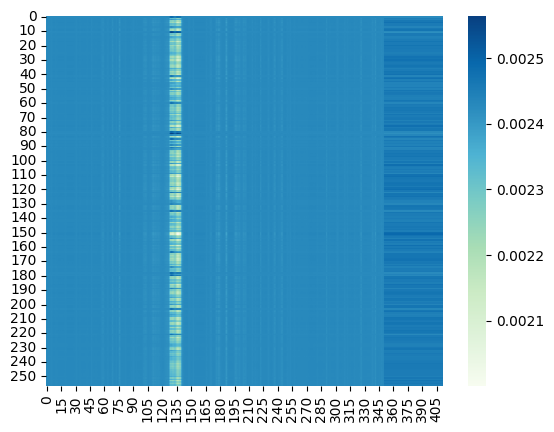

Saved best model

Epoch: 2/80


Val:   3%|▎         | 1/33 [00:05<02:56,  5.51s/it, dist=473.7800]

Ground Truth :  MODE PUT THE WHOLE OF THE INGREDIENTS INTO A BOTTLE AND LET IT REMAIN FOR A FORTNIGHT IN A WARM PLACE OCCASIONALLY SHAKING UP THE CONTENTS
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:   6%|▌         | 2/33 [00:10<02:42,  5.23s/it, dist=475.0133]

Ground Truth :  TO THIS HIS ANSWER WAS PROMPT OH THANK GOD NO AND IS THE RECORD YOURS
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:   9%|▉         | 3/33 [00:15<02:35,  5.17s/it, dist=473.6978]

Ground Truth :  THE ZEAL OF CYRIL EXPOSED HIM TO THE PENALTIES OF THE JULIAN LAW BUT IN A FEEBLE GOVERNMENT AND A SUPERSTITIOUS AGE HE WAS SECURE OF IMPUNITY AND EVEN OF PRAISE
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  12%|█▏        | 4/33 [00:20<02:25,  5.01s/it, dist=475.8100]

Ground Truth :  HE WORE BLUE SILK STOCKINGS BLUE KNEE PANTS WITH GOLD BUCKLES A BLUE RUFFLED WAIST AND A JACKET OF BRIGHT BLUE BRAIDED WITH GOLD
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  15%|█▌        | 5/33 [00:25<02:19,  4.97s/it, dist=475.5907]

Ground Truth :  SUFFICIENT FOR A MODERATE SIZED HADDOCK OR PIKE
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  18%|█▊        | 6/33 [00:30<02:13,  4.94s/it, dist=476.5289]

Ground Truth :  THE HIGHEST INSTINCT FOR PURITY PLACES HIM WHO IS AFFECTED WITH IT IN THE MOST EXTRAORDINARY AND DANGEROUS ISOLATION AS A SAINT FOR IT IS JUST HOLINESS THE HIGHEST SPIRITUALIZATION OF THE INSTINCT IN QUESTION
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  21%|██        | 7/33 [00:35<02:07,  4.92s/it, dist=477.0400]

Ground Truth :  HER ATTITUDE AND SECRET MEDITATIONS MUST BE SUCH AS TO INSTILL INTO THE RECEPTIVE SOUL OF THE UNBORN CHILD THE LOVE OF THE GREAT MYSTERY AND A SENSE OF BROTHERHOOD WITH ALL CREATION
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  24%|██▍       | 8/33 [00:39<02:02,  4.92s/it, dist=477.0767]

Ground Truth :  PERHAPS THE PROFESSION OF DOING GOOD MAY BE FULL BUT EVERY BODY SHOULD BE KIND AT LEAST TO HIMSELF
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  27%|██▋       | 9/33 [00:44<01:56,  4.87s/it, dist=477.5207]

Ground Truth :  LINCOLN HAD CALLED FOR VOLUNTEERS TO PUT DOWN A REBELLION BUT HARRY HEARD EVERYWHERE IN CHARLESTON THAT THE CONFEDERACY WAS NOW SECURE
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  30%|███       | 10/33 [00:49<01:50,  4.82s/it, dist=477.8267]

Ground Truth :  TWICE HE PAUSED ON THE WAY TO THE SITTING ROOM AND TWICE WAS HE DRIVEN ON BY A POWER STRONGER THAN HIS WILL
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  33%|███▎      | 11/33 [00:54<01:47,  4.88s/it, dist=477.5921]

Ground Truth :  THE REPORT IS PREMATURE MY GOOD FRIEND
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  36%|███▋      | 12/33 [00:59<01:43,  4.93s/it, dist=477.3028]

Ground Truth :  EARTH WAS GONE AND HEAVEN WAS ALL
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  39%|███▉      | 13/33 [01:04<01:37,  4.89s/it, dist=477.7026]

Ground Truth :  ASKED PHRONSIE WITH HER LITTLE FACE CLOSE TO POLLY'S OWN
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  42%|████▏     | 14/33 [01:09<01:32,  4.85s/it, dist=478.1729]

Ground Truth :  BUT LIVING SOUL THERE COULD BE NONE TO MEET
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  45%|████▌     | 15/33 [01:14<01:28,  4.90s/it, dist=477.8467]

Ground Truth :  I FOUND THAT AS A WOMAN OF BUSINESS SHE WAS BEYOND ALL MY EXPECTATIONS
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  48%|████▊     | 16/33 [01:19<01:24,  4.95s/it, dist=477.5692]

Ground Truth :  WHEN SHE HAD THAT BAD ILLNESS AND I WAS ONLY ELEVEN YEARS OLD SHE USED TO SAY YOU'LL HAVE A FRIEND ON EARTH IN YOUR AUNT RACHEL IF I'M TAKEN FROM YOU FOR SHE HAS A KIND HEART AND I'M SURE I'VE FOUND IT SO
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  52%|█████▏    | 17/33 [01:24<01:18,  4.93s/it, dist=477.8616]

Ground Truth :  RANDAL LOOKED AGAIN AT THE FIRST WORDS IN THE PARAGRAPH
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  55%|█████▍    | 18/33 [01:28<01:13,  4.93s/it, dist=477.5467]

Ground Truth :  SHEEP AND CATTLE WERE INTRODUCED AND BRED WITH EXTREME RAPIDITY MEN TOOK UP THEIR FIFTY THOUSAND OR ONE HUNDRED THOUSAND ACRES OF COUNTRY GOING INLAND ONE BEHIND THE OTHER TILL IN A FEW YEARS THERE WAS NOT AN ACRE BETWEEN THE SEA AND THE FRONT RANGES WHICH WAS NOT TAKEN UP AND STATIONS EITHER FOR SHEEP OR CATTLE WERE SPOTTED ABOUT AT INTERVALS OF SOME TWENTY OR THIRTY MILES OVER THE WHOLE COUNTRY
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  58%|█████▊    | 19/33 [01:33<01:08,  4.90s/it, dist=477.5860]

Ground Truth :  HE HAD NEITHER SYMPATHY WITH MY INNOCENCE NOR WITH MY WRETCHEDNESS AND THE PETRIFYING ACCURACY WITH WHICH HE ATTENDED TO EVERY FORM OF CIVILITY WHILE HE TORTURED ME BY HIS QUESTIONS HIS SUSPICIONS AND HIS INFERENCES WAS AS TORMENTING AS THE RACKS OF THE INQUISITION
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  61%|██████    | 20/33 [01:38<01:03,  4.90s/it, dist=477.4753]

Ground Truth :  HE WOULD GO TO HER AND TELL HER ALL HIS FAMILY COMPLICATIONS
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  64%|██████▎   | 21/33 [01:43<00:58,  4.85s/it, dist=477.5244]

Ground Truth :  ABOVE ALL THINGS I DESIRE TO SETTLE THE MATTER QUIETLY AND DISCREETLY
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  67%|██████▋   | 22/33 [01:48<00:52,  4.81s/it, dist=477.6506]

Ground Truth :  WE WERE SO DEEP IN THE GRASS THAT WE COULD SEE NOTHING BUT THE BLUE SKY OVER US AND THE GOLD TREE IN FRONT OF US
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  70%|██████▉   | 23/33 [01:53<00:48,  4.85s/it, dist=477.5362]

Ground Truth :  THERE BE THE DOOR IN FRONT OF YOU YOU GO UP THREE STEPS IF YOU CAN FIND EM
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  73%|███████▎  | 24/33 [01:58<00:43,  4.88s/it, dist=477.5753]

Ground Truth :  TOM DRINKS A LITTLE MORE COFFEE AND THEN HE GOES ON THE TROUBLE IS I CAN'T GET MARRIED ON THIS FLOWER SHOP JOB
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  76%|███████▌  | 25/33 [02:02<00:39,  4.89s/it, dist=477.5803]

Ground Truth :  THEY HAVE KNOWN ME MUCH LONGER BUT NEVER HONOR ME WITH ANY FAMILIARITY THOUGH HARDLY A DAY PASSES WITHOUT MY BRINGING THEM FOOD
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.93s/it, dist=477.2800]

Ground Truth :  ALAS HE WALKED WITH NO LESS INDECISION THAN COSETTE
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  82%|████████▏ | 27/33 [02:12<00:29,  4.87s/it, dist=477.2805]

Ground Truth :  ALAS HE WALKED WITH NO LESS INDECISION THAN COSETTE
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  85%|████████▍ | 28/33 [02:17<00:24,  4.85s/it, dist=477.2433]

Ground Truth :  WE NEVER PLANNED TO MEET AND WHEN WE MET
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  88%|████████▊ | 29/33 [02:22<00:19,  4.82s/it, dist=477.3915]

Ground Truth :  ASKED THE VOICE IN SCORNFUL ACCENTS
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  91%|█████████ | 30/33 [02:27<00:14,  4.86s/it, dist=477.3711]

Ground Truth :  SUFFICIENT HALF THIS QUANTITY FOR TWO SLICES OF SALMON
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  94%|█████████▍| 31/33 [02:32<00:09,  4.89s/it, dist=477.4219]

Ground Truth :  HIS WIFE NOW LIES BESIDE HIM AND THE WHITE SHAFT THAT MARKS THEIR GRAVES GLEAMS ACROSS THE WHEAT FIELDS
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  97%|█████████▋| 32/33 [02:37<00:04,  4.90s/it, dist=477.4042]

Ground Truth :  FERDINAND MEDITATES OVER HIS GOOD FORTUNE
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Ground Truth :  CRIED THE LADIES WHOSE DEPARTURE HAD BEEN FIXED
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S
	Train Loss 1.6579	 Learning Rate 0.0010000
	Val Dist 477.2366	
	Teacher Forcing Ratio 1	


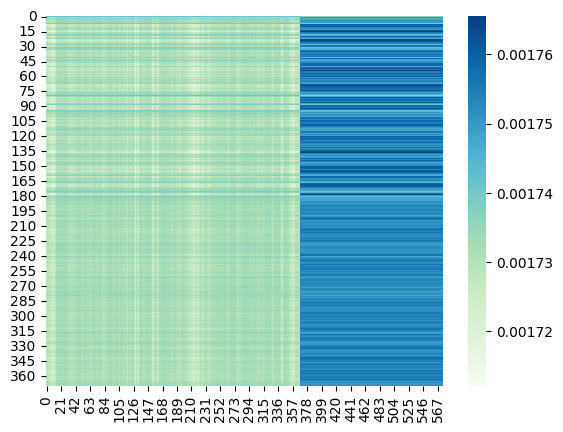

Saved best model

Epoch: 3/80


Val:   3%|▎         | 1/33 [00:05<02:52,  5.39s/it, dist=488.2800]

Ground Truth :  HERE SHE WOULD STAY COMFORTED AND SOOTHED AMONG THE LOVELY PLANTS AND RICH EXOTICS REJOICING THE HEART OF OLD TURNER THE GARDENER WHO SINCE POLLY'S FIRST RAPTUROUS ENTRANCE HAD TAKEN HER INTO HIS GOOD GRACES FOR ALL TIME
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:   6%|▌         | 2/33 [00:10<02:36,  5.05s/it, dist=489.8933]

Ground Truth :  I OBEYED IMPLICITLY AND MET YOUR EXCELLENCY
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:   9%|▉         | 3/33 [00:15<02:28,  4.94s/it, dist=488.6533]

Ground Truth :  THAT EVENING AN ORDER CAME FOR US HAMILTON'S DIVISION TO ASSAULT THE ENEMY'S LEFT FLANK AT MIDNIGHT
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  12%|█▏        | 4/33 [00:19<02:23,  4.93s/it, dist=488.5533]

Ground Truth :  IF IT SHOULD BE IN AN UNSOUND STATE IT MUST BE ON NO ACCOUNT MADE USE OF
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  15%|█▌        | 5/33 [00:24<02:16,  4.86s/it, dist=489.3373]

Ground Truth :  IT WAS A MONOTONOUS LIFE BUT IT WAS VERY HEALTHY AND ONE DOES NOT MUCH MIND ANYTHING WHEN ONE IS WELL
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  18%|█▊        | 6/33 [00:29<02:13,  4.93s/it, dist=488.6700]

Ground Truth :  NATURE A DIFFERENCE OF FIFTY YEARS HAD SET A PROFOUND GULF BETWEEN JEAN VALJEAN AND COSETTE DESTINY FILLED IN THIS GULF
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  21%|██        | 7/33 [00:34<02:07,  4.91s/it, dist=488.1257]

Ground Truth :  THERE WAS NO YOUNG MAN OF HIS AGE IN LONDON MORE WILLING AND DOCILE THAN STEPHEN SHE AFFIRMED NONE MORE AFFECTIONATE AND READY TO PLEASE AND EVEN USEFUL AS LONG AS PEOPLE DID NOT UPSET HIS POOR HEAD
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  24%|██▍       | 8/33 [00:39<02:03,  4.96s/it, dist=487.2967]

Ground Truth :  I WAS TO SEE THE SHEEP NOT NECESSARILY CLOSE AT HAND NOR TO GET THEM IN A SINGLE MOB BUT TO SEE ENOUGH OF THEM HERE AND THERE TO FEEL EASY THAT NOTHING HAD GONE WRONG THIS WAS NO DIFFICULT MATTER FOR THERE WERE NOT ABOVE EIGHT HUNDRED OF THEM AND BEING ALL BREEDING EWES THEY WERE PRETTY QUIET
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  27%|██▋       | 9/33 [00:44<01:58,  4.93s/it, dist=487.5637]

Ground Truth :  YOU HAVE BEEN TO THE HOTEL HE BURST OUT YOU HAVE SEEN CATHERINE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  30%|███       | 10/33 [00:49<01:54,  4.96s/it, dist=487.0200]

Ground Truth :  KEEP SILENT AS LONG AS MAY BE AND IT WOULD BE WISE WHEN YOU DO SPEAK TO BREAK OUT SUDDENLY IN ONE OF YOUR SHOUTINGS WHICH WILL SERVE TO REMIND THE INDIANS THAT YOU ARE NOT ALTOGETHER AS RESPONSIBLE AS MEN SHOULD BE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  33%|███▎      | 11/33 [00:54<01:49,  4.96s/it, dist=486.8061]

Ground Truth :  IT'S LIKE YOUR HORSE SUDDENLY FALLING DEAD UNDER YOU IN THE MIDST OF AN UNINHABITED AND THIRSTY PLAIN
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  36%|███▋      | 12/33 [00:59<01:43,  4.91s/it, dist=487.2344]

Ground Truth :  THERE IS NOTHING MAJESTIC ABOUT ME AS YOU KNOW VERY WELL
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  39%|███▉      | 13/33 [01:04<01:37,  4.90s/it, dist=487.5210]

Ground Truth :  DOES ONE MISTER SAMUEL BOZZLE LIVE HERE ASKED TREVELYAN
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  42%|████▏     | 14/33 [01:09<01:33,  4.92s/it, dist=487.6357]

Ground Truth :  THERE IS THIS DECEPTION BETWEEN ME AND EVERYTHING
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  45%|████▌     | 15/33 [01:13<01:27,  4.87s/it, dist=487.7649]

Ground Truth :  CORALIE DO YOU CONSIDER MAJESTY A PROPER WORD TO USE WHEN ADDRESSING A QUEEN
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  48%|████▊     | 16/33 [01:18<01:22,  4.87s/it, dist=487.8913]

Ground Truth :  I KNOW I AM JUST AWFUL JIM I WAS SO SCARED
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  52%|█████▏    | 17/33 [01:23<01:17,  4.86s/it, dist=488.0459]

Ground Truth :  NIECE I COMMAND YOU NOT TO STIR OUT OF THIS ROOM THIS EVENING
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  55%|█████▍    | 18/33 [01:28<01:13,  4.92s/it, dist=487.9167]

Ground Truth :  NECESSITY HAD BECOME HIS GRIM MASTER AND THE FOLLOWING WEEK HE WAS GOING TO WORK
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  58%|█████▊    | 19/33 [01:33<01:08,  4.87s/it, dist=487.9253]

Ground Truth :  AND THE GLANCE SHE CAST HIM WHILE NOT MEETING HIS EYE SHOWED THAT SHE UNDERSTOOD THE IMPORTANCE OF THE ADMISSION
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  61%|██████    | 20/33 [01:38<01:03,  4.89s/it, dist=487.8857]

Ground Truth :  WE HAVE ALL BEEN GIVING MARY ANN PRESENTS AND I SUPPOSE YOU MISTER WHITING HAVE BEEN GIVING HER SOMETHING TOO
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  64%|██████▎   | 21/33 [01:43<00:58,  4.91s/it, dist=487.8187]

Ground Truth :  PARTICULARLY SO ON THIS LAST NIGHT WHEN ONLY TWO OF THE LITTLE CUBICLES WERE OCCUPIED THE THOUSANDS OF OTHERS STANDING WITH DARK EMPTY DOORS
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  67%|██████▋   | 22/33 [01:48<00:54,  4.92s/it, dist=487.6645]

Ground Truth :  HOW ASKED TAD
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  70%|██████▉   | 23/33 [01:53<00:49,  4.92s/it, dist=487.3739]

Ground Truth :  HE'S A TROUBLE CURER NOT A TROUBLEMAKER EXCEPT FOR HIMSELF
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  73%|███████▎  | 24/33 [01:58<00:44,  4.91s/it, dist=487.5011]

Ground Truth :  AND HOW ODD THE DIRECTIONS WILL LOOK
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  76%|███████▌  | 25/33 [02:02<00:39,  4.89s/it, dist=487.4256]

Ground Truth :  THEIR FRIENDS DID THEIR BEST TO AMUSE THEM
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  79%|███████▉  | 26/33 [02:07<00:34,  4.88s/it, dist=487.3100]

Ground Truth :  I AM NOT THINKING ABOUT THE GARDEN MAMMA REPLIED THE YOUNG GIRL WITHOUT LIFTING UP HER FACE WE CAN PLANT NEW FLOWERS AND TIE UP EVEN SOME OF THESE AFRESH
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  82%|████████▏ | 27/33 [02:12<00:29,  4.84s/it, dist=487.4820]

Ground Truth :  HE PASSED HOURS IN WATCHING HER DRESSING AND UNDRESSING HER DOLL AND IN LISTENING TO HER PRATTLE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  85%|████████▍ | 28/33 [02:17<00:24,  4.81s/it, dist=487.5988]

Ground Truth :  THERE'S A KNOCKER IF NONE OF EM HAVEN'T TWISTED IT OFF
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  88%|████████▊ | 29/33 [02:22<00:19,  4.82s/it, dist=487.4908]

Ground Truth :  IT'S GOT TO BE A CLEAN BREAK HILDA
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  91%|█████████ | 30/33 [02:27<00:14,  4.86s/it, dist=487.4953]

Ground Truth :  HE RANG AGAIN THIS TIME HARDER STILL NO ANSWER
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  94%|█████████▍| 31/33 [02:31<00:09,  4.87s/it, dist=487.6484]

Ground Truth :  AN AMERICAN INSTEAD OF GOING IN A LEISURE HOUR TO DANCE MERRILY AT SOME PLACE OF PUBLIC RESORT AS THE FELLOWS OF HIS CALLING CONTINUE TO DO THROUGHOUT THE GREATER PART OF EUROPE SHUTS HIMSELF UP AT HOME TO DRINK
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  97%|█████████▋| 32/33 [02:36<00:04,  4.88s/it, dist=487.6321]

Ground Truth :  IF PERMITTED BY THE HISTORICAL CONNECTION WHICH THOUGH SLIGHT WAS ESSENTIAL TO HIS PLAN THE AUTHOR WOULD VERY WILLINGLY HAVE AVOIDED ANYTHING OF THIS NATURE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Ground Truth :  NOTE THE WINE IN THIS SAUCE MAY BE OMITTED AND AN ONION SLICED AND FRIED OF A NICE BROWN SUBSTITUTED FOR IT
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF
	Train Loss 1.5249	 Learning Rate 0.0010000
	Val Dist 487.2008	
	Teacher Forcing Ratio 1	


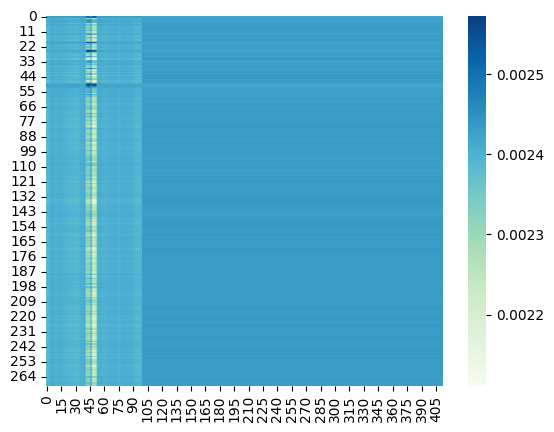


Epoch: 4/80


Val:   3%|▎         | 1/33 [00:05<02:52,  5.39s/it, dist=476.7067]

Ground Truth :  THE NYMPHS HAD ALREADY GOTTEN AWAY
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:   6%|▌         | 2/33 [00:10<02:40,  5.17s/it, dist=476.7633]

Ground Truth :  WE WERE INURED TO PRIVATIONS AND HARDSHIPS HAD BEEN UPON EVERY MARCH IN EVERY BATTLE IN EVERY SKIRMISH IN EVERY ADVANCE IN EVERY RETREAT IN EVERY VICTORY IN EVERY DEFEAT
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:   9%|▉         | 3/33 [00:15<02:32,  5.10s/it, dist=477.5733]

Ground Truth :  HE KNEW HER WELL ENOUGH TO KNOW THAT WHEN SHE HAD DECIDED UPON A PLAN SHE WOULD FOLLOW IT UP
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  12%|█▏        | 4/33 [00:20<02:25,  5.03s/it, dist=476.2583]

Ground Truth :  SLIGHT RAINSTORMS ARE LIKELY TO BE ENCOUNTERED IN A TRIP ROUND THE MOUNTAIN BUT ONE MAY EASILY FIND SHELTER BENEATH WELL THATCHED TREES THAT SHED THE RAIN LIKE A ROOF
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  15%|█▌        | 5/33 [00:25<02:18,  4.93s/it, dist=477.0893]

Ground Truth :  BY THE SIDE OF THE DOOR WAS CONSTRUCTED OFF HAND BY MEANS OF AN EMPTY BARREL A BOX FOR THE MONEY TAKER WHO WAS SOMETIMES FIBI AND SOMETIMES VINOS
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  18%|█▊        | 6/33 [00:29<02:12,  4.89s/it, dist=477.3667]

Ground Truth :  THEN SHE TURNED TOWARDS THE QUARTER INDICATED AND DISAPPEARED ROUND THE LAUREL BUSHES
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  21%|██        | 7/33 [00:34<02:08,  4.92s/it, dist=477.0733]

Ground Truth :  WORSE AND WORSE HE IS EVEN PRESUMED TO BE THE CAPTIVE'S SWEETHEART WHO WHEEDLES THE FLOWER THE RING AND THE PRISON KEY OUT OF THE STRICT VIRGINS FOR HIS OWN PURPOSES AND FLIES WITH HER AT LAST IN HIS SHALLOP ACROSS THE SEA TO LIVE WITH HER HAPPILY EVER AFTER
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  24%|██▍       | 8/33 [00:39<02:03,  4.95s/it, dist=476.7800]

Ground Truth :  THESE FORESTS WERE OF TREES DIFFERENT IN SOME WAYS FROM THOSE WE HAVE NOW GREAT FERNS AS TALL AS THIS HOUSE AND MOSSES AS HIGH AS LITTLE TREES AND PALM LEAVES OF ENORMOUS SIZE
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  27%|██▋       | 9/33 [00:44<01:59,  4.96s/it, dist=476.7341]

Ground Truth :  GRANDFATHER CAME DOWN WEARING A WHITE SHIRT AND HIS SUNDAY COAT
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  30%|███       | 10/33 [00:49<01:53,  4.92s/it, dist=476.7253]

Ground Truth :  SEVENTEEN SEVENTEEN
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  33%|███▎      | 11/33 [00:54<01:48,  4.93s/it, dist=476.5976]

Ground Truth :  THEY ARE BROAD RUGGED CREVASSED CLOUDLIKE MASSES OF DOWN GRINDING ICE POURING FORTH STREAMS OF MUDDY WATER AS MEASURES OF THE WORK THEY ARE DOING IN SCULPTURING THE ROCKS BENEATH THEM VERY UNLIKE THE LONG MAJESTIC GLACIERS OF ALASKA THAT RIVERLIKE GO WINDING DOWN THE VALLEYS THROUGH THE FORESTS TO THE SEA
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  36%|███▋      | 12/33 [00:59<01:44,  4.96s/it, dist=476.5039]

Ground Truth :  THOMPSON OPENED A LARGE RESTAURANT IN O'FARRELL STREET JUST ABOVE FILLMORE AND FOR TWO YEARS OR MORE DID A THRIVING BUSINESS HIS PLACE BEING NOTED FOR ITS GOOD COOKING AND ITS SPLENDID SERVICE
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  39%|███▉      | 13/33 [01:04<01:38,  4.91s/it, dist=476.6215]

Ground Truth :  THE DEVIL HE IS I HEARD SOMETHING ABOUT IT TOO
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  42%|████▏     | 14/33 [01:09<01:33,  4.91s/it, dist=476.5224]

Ground Truth :  THE LONG DRIZZLE HAD BEGUN PEDESTRIANS HAD TURNED UP COLLARS AND TROUSERS AT THE BOTTOM
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  45%|████▌     | 15/33 [01:14<01:27,  4.86s/it, dist=476.6524]

Ground Truth :  NOT ALTOGETHER BY ME
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  48%|████▊     | 16/33 [01:19<01:23,  4.88s/it, dist=476.9717]

Ground Truth :  BUT INSTEAD OF A TEMPORARY AND OCCASIONAL ALLIANCE THEY ESTABLISHED AND WE STILL EMBRACE THE SUBSTANTIAL INDISSOLUBLE AND EVERLASTING UNION OF A PERFECT GOD WITH A PERFECT MAN OF THE SECOND PERSON OF THE TRINITY WITH A REASONABLE SOUL AND HUMAN FLESH
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  52%|█████▏    | 17/33 [01:23<01:18,  4.88s/it, dist=477.0867]

Ground Truth :  IN A WORD HE PLEDGED HIMSELF TO BE MINE AND I PROMISED TO BE HIS WITHOUT CARRYING MATTERS ANY FURTHER
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  55%|█████▍    | 18/33 [01:28<01:13,  4.89s/it, dist=476.9037]

Ground Truth :  AFORE CHRISTMAS TIME I WAS AS FULL AS FULL COULD BE OF GOING HOME FOR GOOD AND ALL YO HAN HEARD HOW I'VE WISHED IT THIS TERRIBLE LONG TIME
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  58%|█████▊    | 19/33 [01:33<01:08,  4.88s/it, dist=476.9077]

Ground Truth :  THE CURIOSITY OF ONE PLACE EXHAUSTED THEY PASSED ON TO ANOTHER
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  61%|██████    | 20/33 [01:38<01:03,  4.89s/it, dist=476.9183]

Ground Truth :  YOU KNOW I HAVE JUST BEEN TELLING YOU HOW THIS SCHOOL OF MATERIALISM AND CLAY INVOLVED ITSELF AT LAST IN CLOUD AND FIRE
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  64%|██████▎   | 21/33 [01:43<00:59,  4.93s/it, dist=476.9098]

Ground Truth :  THE SECOND PART BEGINS HERE SAYING BE NOW THE THIRD HERE THEN WHILE IT WAS HIS PLEASURE
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  67%|██████▋   | 22/33 [01:48<00:54,  4.95s/it, dist=476.6561]

Ground Truth :  THEN TAKE IT OUT OF THE ROASTING PAN AND PUT IT INTO A CASSEROLE AFTER SPRINKLING IT WITH TWO OUNCES OF FLOUR
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  70%|██████▉   | 23/33 [01:53<00:49,  4.96s/it, dist=476.8148]

Ground Truth :  HE SEEMS TO ME TO BE TRULY PENITENT FOR HIS OFFENCES A MISGUIDED BUT NOT A HYPOCRITICAL MAN IF MY KNOWLEDGE OF HUMAN NATURE GOES FOR ANYTHING I HOPE HE IS SAID NORTH
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  73%|███████▎  | 24/33 [01:58<00:44,  4.91s/it, dist=476.9050]

Ground Truth :  THESE MEN HE SAID TO HIS MIGHTY COMPANY ARE NOTHING BUT A SOURCE OF TROUBLE
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  76%|███████▌  | 25/33 [02:03<00:39,  4.92s/it, dist=476.8688]

Ground Truth :  I BEGGED RUGGEDO LONG AGO TO SEND HIM AWAY BUT HE WOULD NOT DO SO
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.91s/it, dist=477.1218]

Ground Truth :  SOME TIME YOU'LL TELL ME PLEASE WON'T YOU
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  82%|████████▏ | 27/33 [02:13<00:29,  4.89s/it, dist=477.1101]

Ground Truth :  HE SAW ME HE PAID COURT TO ME I LISTENED TO HIM AND UNKNOWN TO MY FATHER I LOVED HIM FOR THERE IS NO WOMAN HOWEVER SECLUDED SHE MAY LIVE OR CLOSE SHE MAY BE KEPT WHO WILL NOT HAVE OPPORTUNITIES AND TO SPARE FOR FOLLOWING HER HEADLONG IMPULSES
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  85%|████████▍ | 28/33 [02:18<00:24,  4.89s/it, dist=477.1298]

Ground Truth :  WE'D BETTER NOT TRY TO MOVE HIM TOM DECIDED WE'LL GET AN AMBULANCE
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  88%|████████▊ | 29/33 [02:22<00:19,  4.85s/it, dist=477.3037]

Ground Truth :  WHERE IS MY HUSBAND
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  91%|█████████ | 30/33 [02:27<00:14,  4.84s/it, dist=477.3742]

Ground Truth :  FOUR AND TWENTY HOURS AGO AND HE DEEMED HIMSELF THE MOST MISERABLE AND FORLORN OF HUMAN BEINGS AND NOW ALL THE BLESSINGS OF THE WORLD SEEMED SHOWERED AT HIS FEET
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  94%|█████████▍| 31/33 [02:32<00:09,  4.88s/it, dist=477.3125]

Ground Truth :  THEY WERE RUN OUT OF THEIR VILLAGE
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val:  97%|█████████▋| 32/33 [02:37<00:04,  4.91s/it, dist=477.2779]

Ground Truth :  THIS CHANGE CAME ABOUT FROM AN ADVENTURE WE HAD TOGETHER
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


Val: 100%|██████████| 33/33 [02:39<00:00,  3.94s/it, dist=477.5733]

Ground Truth :  IT WAS THE SEASON WHEN THE ANCIENT SUN GOD HAD BEEN ACCUSTOMED TO RECEIVE HIS ANNUAL OBLATIONS AND WE CAN WELL BELIEVE THAT THOSE WHOSE HEARTS STILL TREMBLED AT THE NAME OF BEL MUST HAVE CONNECTED THE ECLIPSE AND THE PLAGUE WITH THE REVOLUTION IN THE NATIONAL WORSHIP AND THE OVERTHROW OF THE ANCIENT GODS ON THAT PLAIN OF PROSTRATION WHERE THEY HAD SO LONG RECEIVED THE HOMAGE OF AN ENTIRE PEOPLE
Prediction   :  AND THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE STRANGE OF THE S


	Train Loss 1.4579	 Learning Rate 0.0010000
	Val Dist 477.5733	
	Teacher Forcing Ratio 1	


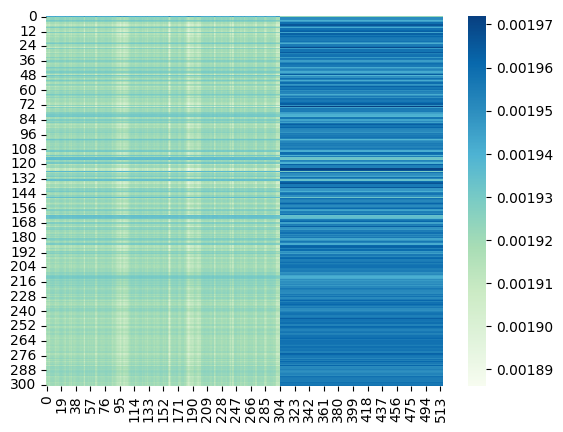


Epoch: 5/80


Val:   3%|▎         | 1/33 [00:05<02:55,  5.49s/it, dist=482.0733]

Ground Truth :  YOU'RE A RARE UN FOR SITTING DOWN TO YOUR WORK A LITTLE WHILE AFTER IT'S TIME TO PUT BY
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:   6%|▌         | 2/33 [00:10<02:38,  5.12s/it, dist=485.5700]

Ground Truth :  I DO NOT SUPPOSE THAT ANYBODY WILL QUESTION MY RIGHT TO HAVE THE CARE OF MY OWN CHILD SAID TREVELYAN
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:   9%|▉         | 3/33 [00:15<02:31,  5.04s/it, dist=486.8111]

Ground Truth :  AY SHE ANSWERED HALF BITTERLY AND WOULD THAT WE COULD LIVE WITHOUT FOOD AND IMITATE PERFECTLY THE IMMORTAL GODS
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  12%|█▏        | 4/33 [00:20<02:24,  4.99s/it, dist=487.4750]

Ground Truth :  I SAY SIR HARRY THE LITTLE GIRL'S GOING FAMOUSLY TO NIGHT ISN'T SHE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  15%|█▌        | 5/33 [00:25<02:18,  4.96s/it, dist=488.0133]

Ground Truth :  HE MIXED A TEASPOONFUL OF THIS IN A PANNIKIN OF WATER AND DRANK IT
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  18%|█▊        | 6/33 [00:30<02:14,  4.97s/it, dist=487.8822]

Ground Truth :  COME COME RETURNED HAWKEYE UNCASING HIS HONEST COUNTENANCE THE BETTER TO ASSURE THE WAVERING CONFIDENCE OF HIS COMPANION YOU MAY SEE A SKIN WHICH IF IT BE NOT AS WHITE AS ONE OF THE GENTLE ONES HAS NO TINGE OF RED TO IT THAT THE WINDS OF THE HEAVEN AND THE SUN HAVE NOT BESTOWED NOW LET US TO BUSINESS
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  21%|██        | 7/33 [00:34<02:07,  4.91s/it, dist=488.3010]

Ground Truth :  YOUR MAMA I SAID ANGRILY WANTS OTHER PEOPLE'S THINGS
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  24%|██▍       | 8/33 [00:39<02:03,  4.95s/it, dist=487.5917]

Ground Truth :  MARY TAYLOR HOWEVER RELATED THE TALE OF ZORA TO MISSUS GREY'S PRIVATE EAR LATER
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  27%|██▋       | 9/33 [00:44<01:58,  4.92s/it, dist=487.3378]

Ground Truth :  IT MIGHT JUST AS WELL BE SOME ONE ELSE'S WEDDING SO UNIMPORTANT IS THE PART WHICH I AM SET TO PLAY IN IT
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  30%|███       | 10/33 [00:49<01:54,  4.97s/it, dist=486.9340]

Ground Truth :  IN THAT CASE SAID BUTTON BRIGHT YOU'RE ENTITLED TO THE BEST THERE IS TO PAY FOR YOUR TROUBLE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  33%|███▎      | 11/33 [00:54<01:48,  4.95s/it, dist=487.3873]

Ground Truth :  AS FOR ETCHINGS THEY ARE OF TWO KINDS BRITISH AND FOREIGN
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  36%|███▋      | 12/33 [00:59<01:43,  4.94s/it, dist=487.3911]

Ground Truth :  MODE LET THE TARTARIC ACID AND SALT BE REDUCED TO THE FINEST POSSIBLE POWDER THEN MIX THEM WELL WITH THE FLOUR
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  39%|███▉      | 13/33 [01:04<01:38,  4.94s/it, dist=487.4328]

Ground Truth :  FOLLOWING THE TINGLE OF RELIEF CAME A SHARP SICKENING PINCH OF JEALOUSY AND MORTIFICATION THESE INSPIRED HER
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  42%|████▏     | 14/33 [01:09<01:33,  4.92s/it, dist=487.4676]

Ground Truth :  I'LL DO ANYTHING YOU WISH ME TO BARTLEY SHE SAID TREMULOUSLY
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  45%|████▌     | 15/33 [01:14<01:28,  4.93s/it, dist=487.1804]

Ground Truth :  THE TWO ELDEST ATE THEIR APPLES BUT THE YOUNGEST COULD NOT EAT THAT NIGHT SHE THREW THE APPLE AWAY
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  48%|████▊     | 16/33 [01:19<01:23,  4.90s/it, dist=487.1612]

Ground Truth :  NOT THAT I'M INTERESTED IN ALL THIS FOR MYSELF HE DISCLAIMED AFTER LISTENING TO THE TELECAST FROM TERRA TWO DAYS AFTER HIS DISCOVERY
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  52%|█████▏    | 17/33 [01:24<01:18,  4.89s/it, dist=487.1082]

Ground Truth :  THE ONLY CONFLICTS THAT OCCURRED ON IRISH SOIL WITH A PICTISH OR AN ANGLO SAXON FORCE IF WE EXCEPT THOSE WHO FORMED A CONTINGENT OF CONGAL'S ARMY AT MOIRA OCCURRED IN THE TIME OF THE HOSPITABLE FINNACTA
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  55%|█████▍    | 18/33 [01:29<01:13,  4.91s/it, dist=487.1278]

Ground Truth :  AFORE CHRISTMAS TIME I WAS AS FULL AS FULL COULD BE OF GOING HOME FOR GOOD AND ALL YO HAN HEARD HOW I'VE WISHED IT THIS TERRIBLE LONG TIME
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  58%|█████▊    | 19/33 [01:34<01:08,  4.92s/it, dist=487.0196]

Ground Truth :  FOR A WHILE SHE LAY IN HER CHAIR IN HAPPY DREAMY PLEASURE AT SUN AND BIRD AND TREE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  61%|██████    | 20/33 [01:38<01:03,  4.87s/it, dist=487.2847]

Ground Truth :  THE YOUNG MAN IS IN BONDAGE AND MUCH I FEAR HIS DEATH IS DECREED
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  64%|██████▎   | 21/33 [01:43<00:57,  4.83s/it, dist=487.3216]

Ground Truth :  THE ROOM WAS EMPTY WHEN HE ENTERED
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  67%|██████▋   | 22/33 [01:48<00:53,  4.86s/it, dist=487.4442]

Ground Truth :  OFTEN WOULD HE AVAIL HIMSELF OF ANY SPECIAL GRACE OF HIS OWN IDIOM AND EPOCH IF ONLY HIS WILL BELONGED TO HIM OFTEN WOULD SOME CADENCE SERVE HIM BUT FOR HIS AUTHOR'S STRUCTURE SOME STRUCTURE BUT FOR HIS AUTHOR'S CADENCE OFTEN THE BEAUTIFUL TURN OF A STANZA MUST BE WEAKENED TO ADOPT SOME RHYME WHICH WILL TALLY AND HE SEES THE POET REVELLING IN ABUNDANCE OF LANGUAGE WHERE HIMSELF IS SCANTILY SUPPLIED
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  70%|██████▉   | 23/33 [01:53<00:48,  4.87s/it, dist=487.5049]

Ground Truth :  THERE WAS NO DOUBTING THEM IN THIS INSTANCE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  73%|███████▎  | 24/33 [01:58<00:43,  4.86s/it, dist=487.5456]

Ground Truth :  I CAN NO MORE HELP SPENDING MY LIFE IN TRYING TO DO WHAT I CAN FOR THE SOULS OF OTHERS THAN YOU COULD HELP RUNNING IF YOU HEARD LITTLE TOTTY CRYING AT THE OTHER END OF THE HOUSE THE VOICE WOULD GO TO YOUR HEART YOU WOULD THINK THE DEAR CHILD WAS IN TROUBLE OR IN DANGER AND YOU COULDN'T REST WITHOUT RUNNING TO HELP HER AND COMFORT HER
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  76%|███████▌  | 25/33 [02:03<00:39,  4.93s/it, dist=487.3165]

Ground Truth :  BUT THIS IS A FALLACY
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.91s/it, dist=487.3510]

Ground Truth :  THE WHOLE THING WAS A TRIFLE ODD
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  82%|████████▏ | 27/33 [02:12<00:29,  4.87s/it, dist=487.5859]

Ground Truth :  MISTER MORTON THEN MADE A CAREFUL MEMORANDUM OF THE VARIOUS PARTICULARS OF WAVERLEY'S INTERVIEW WITH DONALD BEAN LEAN AND THE OTHER CIRCUMSTANCES WHICH HE HAD COMMUNICATED
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  85%|████████▍ | 28/33 [02:17<00:24,  4.84s/it, dist=487.6286]

Ground Truth :  BUT WHEN IT CAME TO BE A QUESTION OF LIGHTING A SCATTERED SUBURB A GROUP OF DWELLINGS ON THE OUTSKIRTS A REMOTE COUNTRY RESIDENCE OR A FARM HOUSE THE ALTERNATING CURRENT IN ALL ELEMENTS SAVE ITS DANGER WAS AND IS IDEAL
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  88%|████████▊ | 29/33 [02:22<00:19,  4.89s/it, dist=487.5209]

Ground Truth :  HE WAS OF A CLEAN SAVING DISPOSITION AND HAD ALREADY PAID A NUMBER OF MONTHLY INSTALMENTS ON TWO LOTS FAR OUT ON THE WEST SIDE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  91%|█████████ | 30/33 [02:27<00:14,  4.93s/it, dist=487.5240]

Ground Truth :  IN ABOUT AN HOUR AND THREE QUARTERS THE BOY RETURNED
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  94%|█████████▍| 31/33 [02:32<00:09,  4.92s/it, dist=487.5282]

Ground Truth :  SO LEAVING KIND MESSAGES TO GEORGE AND JANE WILSON AND HESITATING WHETHER SHE MIGHT DARE TO SEND A FEW KIND WORDS TO JEM AND DECIDING THAT SHE HAD BETTER NOT SHE STEPPED OUT INTO THE BRIGHT MORNING LIGHT SO FRESH A CONTRAST TO THE DARKENED ROOM WHERE DEATH HAD BEEN
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  97%|█████████▋| 32/33 [02:37<00:04,  4.88s/it, dist=487.5290]

Ground Truth :  HE WEIGHED AND REWEIGHED THE METER PLATES AND PURSUED EVERY LINE OF INVESTIGATION IMAGINABLE BUT ALL IN VAIN
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Ground Truth :  I DON'T SAY THAT PROTESTED MICHAELIS GENTLY
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF
	Train Loss 1.4166	 Learning Rate 0.0010000
	Val Dist 487.4758	
	Teacher Forcing Ratio 1	


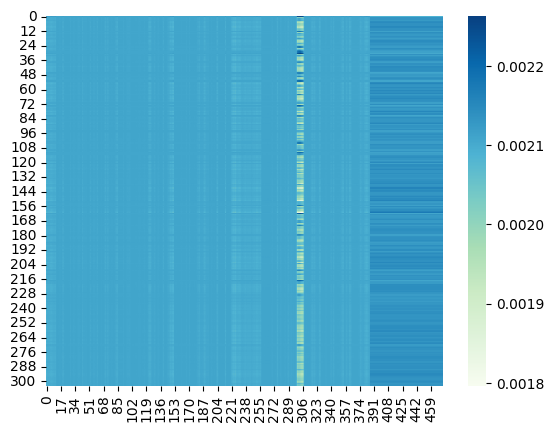


Epoch: 6/80


Val:   3%|▎         | 1/33 [00:05<02:51,  5.37s/it, dist=486.1133]

Ground Truth :  THERE WERE TEARS IN THE BOYS EYES WHEN THEY PARTED AND THE MOTHER CRIED FOR THE INDIAN BOY WHO WAS RETURNING TO HIS PEOPLE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:   6%|▌         | 2/33 [00:10<02:38,  5.10s/it, dist=487.8967]

Ground Truth :  SIR EDWARD NOT WHOLLY DISCOURAGED BY THE DENIAL WITH WHICH DORRIFORTH HAD WITH DELICACY ACQUAINTED HIM STILL HOPED FOR A KIND RECEPTION AND WAS SO OFTEN AT THE HOUSE OF MISSUS HORTON THAT LORD FREDERICK'S JEALOUSY WAS EXCITED AND THE TORTURES HE SUFFERED IN CONSEQUENCE CONVINCED HIM BEYOND A DOUBT OF THE SINCERITY OF HIS AFFECTION
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:   9%|▉         | 3/33 [00:15<02:32,  5.07s/it, dist=487.6378]

Ground Truth :  ALL THE TIME HIS THOUGHTS WOULD RUN OUT TO HIS HOME AND SEE THE SCENE BEING THEREIN ENACTED
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  12%|█▏        | 4/33 [00:20<02:25,  5.03s/it, dist=486.8200]

Ground Truth :  I SAY SIR HARRY THE LITTLE GIRL'S GOING FAMOUSLY TO NIGHT ISN'T SHE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  15%|█▌        | 5/33 [00:25<02:20,  5.03s/it, dist=486.5347]

Ground Truth :  SO I BELIEVE I SHALL GO BACK AT LEAST FOR A WHILE AND SEE WHAT I CAN DO
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  18%|█▊        | 6/33 [00:30<02:14,  4.98s/it, dist=487.5756]

Ground Truth :  THE BELL REVERBERATED THROUGH WHAT SEEMED LIKE AN EMPTY HOUSE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  21%|██        | 7/33 [00:35<02:08,  4.95s/it, dist=487.0333]

Ground Truth :  TO THE BEST OF MY BELIEF THEY WERE ROLLED UP
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  24%|██▍       | 8/33 [00:40<02:03,  4.96s/it, dist=486.9658]

Ground Truth :  I DO NOT SUPPOSE THAT ANYBODY WILL QUESTION MY RIGHT TO HAVE THE CARE OF MY OWN CHILD SAID TREVELYAN
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  27%|██▋       | 9/33 [00:45<01:59,  4.96s/it, dist=487.3822]

Ground Truth :  THEY STAND UNMOVED IN THEIR SOLITARY GREATNESS WELL ASSURED THAT THEY ARE SEEN OF ALL THE WORLD WITHOUT ANY EFFORT TO SHOW THEMSELVES OFF AND THAT NO ONE WILL ATTEMPT TO DRIVE THEM FROM THAT POSITION
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  30%|███       | 10/33 [00:50<01:54,  5.00s/it, dist=487.0747]

Ground Truth :  ON SUNDAY MORNING A CLEAR BEAUTIFUL AND STILL DAY THE ORDER WAS GIVEN FOR THE WHOLE ARMY TO ADVANCE AND TO ATTACK IMMEDIATELY
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  33%|███▎      | 11/33 [00:55<01:49,  4.98s/it, dist=487.1024]

Ground Truth :  TRACING THE MC CLOUD TO ITS HIGHEST SPRINGS AND OVER THE DIVIDE TO THE FOUNTAINS OF FALL RIVER NEAR FORT CROOK THENCE DOWN THAT RIVER TO ITS CONFLUENCE WITH THE PITT ON FROM THERE TO THE VOLCANIC REGION ABOUT LASSEN'S BUTTE THROUGH THE BIG MEADOWS AMONG THE SOURCES OF THE FEATHER RIVER AND DOWN THROUGH FORESTS OF SUGAR PINE TO THE FERTILE PLAINS OF CHICO THIS IS A GLORIOUS SAUNTER AND IMPOSES NO HARDSHIP
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  36%|███▋      | 12/33 [00:59<01:43,  4.93s/it, dist=487.2067]

Ground Truth :  THERE APPEARED TO BE NO KNOCKER THOUGH WHETHER IT HAD BEEN TWISTED OFF WAS MORE THAN I COULD SAY
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  39%|███▉      | 13/33 [01:04<01:38,  4.91s/it, dist=487.5492]

Ground Truth :  THE REMOTER DEGREES OF KINSHIP WERE FULLY RECOGNIZED AND THAT NOT AS A MATTER OF FORM ONLY FIRST COUSINS WERE KNOWN AS BROTHERS AND SISTERS THE NAME OF COUSIN CONSTITUTED A BINDING CLAIM AND OUR RIGID MORALITY FORBADE MARRIAGE BETWEEN COUSINS IN ANY KNOWN DEGREE OR IN OTHER WORDS WITHIN THE CLAN
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  42%|████▏     | 14/33 [01:09<01:32,  4.89s/it, dist=487.6971]

Ground Truth :  THE CUT ON HIS CHEST STILL DRIPPING BLOOD THE ACHE OF HIS OVERSTRAINED EYES EVEN THE SOARING ARENA AROUND HIM WITH THE THOUSANDS OF SPECTATORS WERE TRIVIALITIES NOT WORTH THINKING ABOUT
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  45%|████▌     | 15/33 [01:14<01:28,  4.92s/it, dist=487.7613]

Ground Truth :  BUT AT THE URGENT ENTREATY OF THE PRINCESS OF KHOSALA WHO LOVED BHUNDA CHAND VAINLY HE GAVE HER A LOCK OF HIS LONG BLACK HAIR AS A TOKEN OF REMEMBRANCE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  48%|████▊     | 16/33 [01:19<01:23,  4.90s/it, dist=487.9563]

Ground Truth :  SINCE THAT TIME THEIR NUMBERS HAVE GRADUALLY DIMINISHED BUT A GOOD MANY ARE STILL TO BE FOUND IN THE WESTERN COUNTIES AND SEVERAL WITH A BETTER TEMPER THAN IN SEVENTEEN O SEVEN HAVE NOW TAKEN ARMS FOR GOVERNMENT
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  52%|█████▏    | 17/33 [01:24<01:19,  4.94s/it, dist=487.8714]

Ground Truth :  SOLID ROCKS OF SALT ARE ALSO FOUND IN VARIOUS PARTS OF THE WORLD AND THE COUNTY OF CHESTER CONTAINS MANY OF THESE MINES AND IT IS FROM THERE THAT MUCH OF OUR SALT COMES
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  55%|█████▍    | 18/33 [01:29<01:13,  4.93s/it, dist=487.9907]

Ground Truth :  THE VALKYRIE KEPT OFF THE COAST STEERING TO THE WESTWARD
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  58%|█████▊    | 19/33 [01:34<01:09,  4.96s/it, dist=487.7509]

Ground Truth :  THE ACCIDENT IN QUESTION OCCURRED UPON THE SUNDAY EVENING
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  61%|██████    | 20/33 [01:39<01:04,  4.94s/it, dist=487.6970]

Ground Truth :  IT WAS LOCKED FROM THE INSIDE AND WE HAD TO BURN IT DOWN WITH A TORCH THAT'S WHERE THEY ARE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  64%|██████▎   | 21/33 [01:44<00:59,  4.92s/it, dist=487.6317]

Ground Truth :  CHAPTER SIXTEEN WHY THE NATIONAL VANITY OF THE AMERICANS IS MORE RESTLESS AND CAPTIOUS THAN THAT OF THE ENGLISH
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  67%|██████▋   | 22/33 [01:48<00:53,  4.89s/it, dist=487.5839]

Ground Truth :  THEN SHE WALKED AND SANG TO IT UNTIL HANSON DISTURBED IN HIS READING CAME AND TOOK IT
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  70%|██████▉   | 23/33 [01:53<00:48,  4.86s/it, dist=487.7188]

Ground Truth :  UNLESS IT'S A CANCER IN THE STOMACH I DON'T KNOW WHAT IT CAN BE CANCER IN THE STOMACH
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  73%|███████▎  | 24/33 [01:58<00:43,  4.84s/it, dist=487.6553]

Ground Truth :  HAVE YOU EVER THOUGHT THAT SHE MIGHT HAVE BEEN A SUICIDE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  76%|███████▌  | 25/33 [02:03<00:38,  4.85s/it, dist=487.5880]

Ground Truth :  IT WILL BE WELL TO STATE IN THE BEGINNING OF THIS RECIPE THAT FRENCH FORCEMEAT OR QUENELLES CONSIST OF THE BLENDING OF THREE SEPARATE PROCESSES NAMELY PANADA UDDER AND WHATEVER MEAT YOU INTEND USING PANADA
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.89s/it, dist=487.4859]

Ground Truth :  THESE BUNS MAY BE VARIED BY ADDING A FEW CURRANTS CANDIED PEEL OR CARAWAY SEEDS TO THE OTHER INGREDIENTS AND THE ABOVE MIXTURE ANSWERS FOR HOT CROSS BUNS BY PUTTING IN A LITTLE GROUND ALLSPICE AND BY PRESSING A TIN MOULD IN THE FORM OF A CROSS IN THE CENTRE OF THE BUN
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  82%|████████▏ | 27/33 [02:13<00:29,  4.89s/it, dist=487.4444]

Ground Truth :  HE GLARED AT ME AS IF HE DIDN'T KNOW WHO I WAS WHEN I WENT DOWNSTAIRS
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  85%|████████▍ | 28/33 [02:18<00:24,  4.87s/it, dist=487.5098]

Ground Truth :  WHAT TRUE THINGS ARE TOLD IN STORIES
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  88%|████████▊ | 29/33 [02:23<00:19,  4.88s/it, dist=487.4609]

Ground Truth :  IT IS TERRIBLE AND YET GLORIOUS
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  91%|█████████ | 30/33 [02:27<00:14,  4.90s/it, dist=487.5022]

Ground Truth :  WHEN SHE BEGAN TO DANCE BY WAY OF SHOWING THE GOSSOONS WHAT SHE HAD SEEN IN THE FAIRY RINGS AT NIGHT THE HOUSE BROKE INTO A PROLONGED UPROAR
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  94%|█████████▍| 31/33 [02:33<00:09,  4.95s/it, dist=487.3994]

Ground Truth :  SHORTLY AFTER PASSING ONE OF THESE CHAPELS WE CAME SUDDENLY UPON A VILLAGE WHICH STARTED UP OUT OF THE MIST AND I WAS ALARMED LEST I SHOULD BE MADE AN OBJECT OF CURIOSITY OR DISLIKE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  97%|█████████▋| 32/33 [02:37<00:04,  4.94s/it, dist=487.4458]

Ground Truth :  TOM NODDED UNHAPPILY
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val: 100%|██████████| 33/33 [02:39<00:00,  3.96s/it, dist=487.6975]

Ground Truth :  WE SAW THE UNITED STATES FLAG FLYING FROM THE RAMPARTS AND THOUGHT THAT YANK WOULD PROBABLY BE ASLEEP OR CATCHING LICE OR MAYBE ENGAGED IN A GAME OF SEVEN UP
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


	Train Loss 1.3882	 Learning Rate 0.0010000
	Val Dist 487.6975	
	Teacher Forcing Ratio 1	


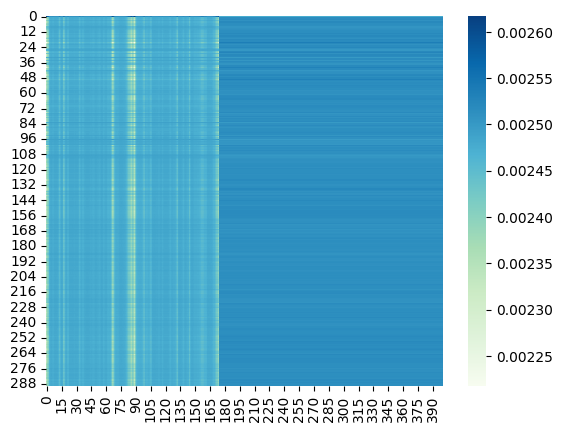


Epoch: 7/80


Val:   3%|▎         | 1/33 [00:05<02:52,  5.39s/it, dist=484.3667]

Ground Truth :  THUS THE SHASTA RIVER ISSUES FROM A LARGE LAKE LIKE SPRING IN SHASTA VALLEY AND ABOUT TWO THIRDS OF THE VOLUME OF THE MC CLOUD GUSHES FORTH IN A GRAND SPRING ON THE EAST SIDE OF THE MOUNTAIN A FEW MILES BACK FROM ITS IMMEDIATE BASE
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:   6%|▌         | 2/33 [00:10<02:38,  5.10s/it, dist=487.0067]

Ground Truth :  ALL THE SAME HE LIFTED HIS GLASS HERE'S TO YOU LITTLE HILDA
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:   9%|▉         | 3/33 [00:15<02:28,  4.94s/it, dist=487.7933]

Ground Truth :  TOM NODDED UNHAPPILY
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  12%|█▏        | 4/33 [00:20<02:23,  4.95s/it, dist=487.6567]

Ground Truth :  THEY HAD FOUR OR FIVE SPECIES OF WHAT MIGHT LOOSELY BE CALLED BIRDS AND SOMETHING THAT COULD EASILY BE CLASSED AS A REPTILE AND A CARNIVOROUS MAMMAL THE SIZE OF A CAT WITH BIRDLIKE CLAWS AND A HERBIVORE ALMOST IDENTICAL WITH THE PIGLIKE THING IN THE BIG DARFHULVA MURAL AND ANOTHER LIKE A GAZELLE WITH A SINGLE HORN IN THE MIDDLE OF ITS FOREHEAD
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  15%|█▌        | 5/33 [00:24<02:18,  4.95s/it, dist=487.7293]

Ground Truth :  MANY AMONG THE GENTILE PROSELYTES REFUSED TO BELIEVE THAT A CELESTIAL SPIRIT AN UNDIVIDED PORTION OF THE FIRST ESSENCE HAD BEEN PERSONALLY UNITED WITH A MASS OF IMPURE AND CONTAMINATED FLESH AND IN THEIR ZEAL FOR THE DIVINITY THEY PIOUSLY ABJURED THE HUMANITY OF CHRIST
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  18%|█▊        | 6/33 [00:29<02:14,  4.98s/it, dist=487.4111]

Ground Truth :  COLD IS IT MY DARLING BLESS YOUR SWEET FACE
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  21%|██        | 7/33 [00:34<02:09,  4.97s/it, dist=487.5629]

Ground Truth :  SEE BENEATH YOUR FEET IS THE MARKING OF GREAT TREE TRUNKS LYING ASLANT ACROSS THE FLOOR AND THE FORMS OF GIGANTIC PALM LEAVES STREWED AMONG THEM
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  24%|██▍       | 8/33 [00:39<02:03,  4.93s/it, dist=487.5733]

Ground Truth :  BUT DEUCALION AND PYRRHA WERE VERY SAD FOR THEY KNEW THAT THEY WERE THE ONLY PERSONS WHO WERE LEFT ALIVE IN ALL THE LAND
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  27%|██▋       | 9/33 [00:44<01:57,  4.90s/it, dist=487.8119]

Ground Truth :  WHY DID HE GIVE THAT SO ODD A SHAPE OR SO STRANGE A COVERING
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  30%|███       | 10/33 [00:49<01:53,  4.93s/it, dist=487.7167]

Ground Truth :  MISSUS BOZZLE WHO WELL UNDERSTOOD THAT BUSINESS WAS BUSINESS AND THAT WIVES WERE NOT BUSINESS FELT NO ANGER AT THIS AND HANDED HER HUSBAND HIS BEST COAT
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  33%|███▎      | 11/33 [00:54<01:49,  4.96s/it, dist=487.3412]

Ground Truth :  AUSTRIAN BURGUNDY IS ONE OF THE FINEST WINES POSSESSING RICH FLAVOR AND FINE PERFUME OTHER BURGUNDIES ARE
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  36%|███▋      | 12/33 [00:59<01:43,  4.92s/it, dist=487.7261]

Ground Truth :  I FOUND THAT AS A WOMAN OF BUSINESS SHE WAS BEYOND ALL MY EXPECTATIONS
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  39%|███▉      | 13/33 [01:04<01:37,  4.88s/it, dist=488.0072]

Ground Truth :  AND NOW THAT IT HATH PLEASED HER TO DENY ME THIS LOVE MY MASTER OF HIS GREAT GOODNESS HATH PLACED ALL MY BEATITUDE THERE WHERE MY HOPE WILL NOT FAIL ME
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  42%|████▏     | 14/33 [01:09<01:32,  4.87s/it, dist=487.8776]

Ground Truth :  PUT THE UDDER INTO A STEWPAN WITH SUFFICIENT WATER TO COVER IT LET IT STEW GENTLY TILL QUITE DONE WHEN TAKE IT OUT TO COOL
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  45%|████▌     | 15/33 [01:14<01:28,  4.90s/it, dist=487.8036]

Ground Truth :  HOW WE MUST SIMPLIFY
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  48%|████▊     | 16/33 [01:19<01:23,  4.93s/it, dist=487.7554]

Ground Truth :  SHE GOT UP ON HER KNEES AND WRUNG HER HANDS
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  52%|█████▏    | 17/33 [01:24<01:19,  4.95s/it, dist=487.9765]

Ground Truth :  THERE WAS ALSO ANOTHER CAUSE
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  55%|█████▍    | 18/33 [01:29<01:14,  4.96s/it, dist=488.0281]

Ground Truth :  IT IS OFTEN THE UNGRATEFUL TASK OF A FRIEND TO BE TROUBLESOME SOMETIMES UNMANNERLY
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  58%|█████▊    | 19/33 [01:33<01:09,  4.94s/it, dist=488.0656]

Ground Truth :  I SHALL MAKE PAPA GIVE ME FIVE HUNDRED POUNDS AT LEAST
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  61%|██████    | 20/33 [01:38<01:04,  4.93s/it, dist=487.6630]

Ground Truth :  UNDER ORDINARY CIRCUMSTANCES THE ABALONE IS TOUGH AND UNPALATABLE BUT AFTER THE DEFT MANIPULATION OF HERBERT THEY ARE TENDER AND MAKE A FINE DISH EITHER FRIED AS CHOWDER OR A LA NEWBERG
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  64%|██████▎   | 21/33 [01:43<00:59,  4.93s/it, dist=487.4660]

Ground Truth :  HE TRANSLATED AT AN EARLY AGE CHIEFLY BETWEEN EIGHTEEN FORTY FIVE AND EIGHTEEN FORTY NINE A GREAT NUMBER OF POEMS BY THE ITALIANS CONTEMPORARY WITH DANTE OR PRECEDING HIM AND AMONG OTHER THINGS HE MADE A VERSION OF THE WHOLE VITA NUOVA PROSE AND VERSE
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  67%|██████▋   | 22/33 [01:48<00:53,  4.90s/it, dist=487.5167]

Ground Truth :  I ALSO OFFERED TO HELP YOUR BROTHER TO ESCAPE BUT HE WOULD NOT GO
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  70%|██████▉   | 23/33 [01:53<00:49,  4.91s/it, dist=487.4229]

Ground Truth :  HE TELLS US THAT AT THIS FESTIVE SEASON OF THE YEAR WITH CHRISTMAS AND ROAST BEEF LOOMING BEFORE US SIMILES DRAWN FROM EATING AND ITS RESULTS OCCUR MOST READILY TO THE MIND
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  73%|███████▎  | 24/33 [01:58<00:43,  4.88s/it, dist=487.4078]

Ground Truth :  MEANWHILE ALL THE REST OF THE PEOPLE IN THE CASTLE HAD BEEN WAKENED AT THE SAME MOMENT AS THE PRINCESS AND THEY WERE NOW EXTREMELY HUNGRY
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  76%|███████▌  | 25/33 [02:03<00:39,  4.89s/it, dist=487.5261]

Ground Truth :  I HAVE THOUGHT ABOUT IT UNTIL I AM WORN OUT
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.87s/it, dist=487.5559]

Ground Truth :  I'LL WAIT HERE TILL YOU'RE READY EXPLAIN YOURSELF TO THE LADY TELL HER I'M AN OLD AND RHEUMATIC INVALID WHO HAS BEEN USED TO ASKING HIS OWN QUESTIONS
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  82%|████████▏ | 27/33 [02:12<00:29,  4.86s/it, dist=487.6017]

Ground Truth :  DON QUIXOTE WAS ON FOOT WITH HIS HORSE UNBRIDLED AND HIS LANCE LEANING AGAINST A TREE AND IN SHORT COMPLETELY DEFENCELESS HE THOUGHT IT BEST THEREFORE TO FOLD HIS ARMS AND BOW HIS HEAD AND RESERVE HIMSELF FOR A MORE FAVOURABLE OCCASION AND OPPORTUNITY
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  85%|████████▍ | 28/33 [02:17<00:24,  4.87s/it, dist=487.4945]

Ground Truth :  WELL NOW SAID MEEKIN WITH ASPERITY I DON'T AGREE WITH YOU
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  88%|████████▊ | 29/33 [02:22<00:19,  4.90s/it, dist=487.5795]

Ground Truth :  THE TRAIL HERE MUST BE A VERY BLIND ONE FOR THEM TO CALL HIM IN
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  91%|█████████ | 30/33 [02:27<00:14,  4.90s/it, dist=487.5476]

Ground Truth :  IT WAS YOUTH AND POVERTY AND PROXIMITY AND EVERYTHING WAS YOUNG AND KINDLY
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  94%|█████████▍| 31/33 [02:32<00:09,  4.92s/it, dist=487.4828]

Ground Truth :  AND OF COURSE I HAD MY EXPECTATIONS AND SHE HAD HERS
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  97%|█████████▋| 32/33 [02:37<00:04,  4.92s/it, dist=487.6646]

Ground Truth :  THE CAPTURE OF LEE WAS A FAR MORE DIFFICULT UNDERTAKING
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val: 100%|██████████| 33/33 [02:39<00:00,  3.97s/it, dist=487.8505]

Ground Truth :  WITHOUT A WORD PETER GOT UP AND LIT HIS LANTERN
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


	Train Loss 1.3670	 Learning Rate 0.0010000
	Val Dist 487.8505	
	Teacher Forcing Ratio 1	


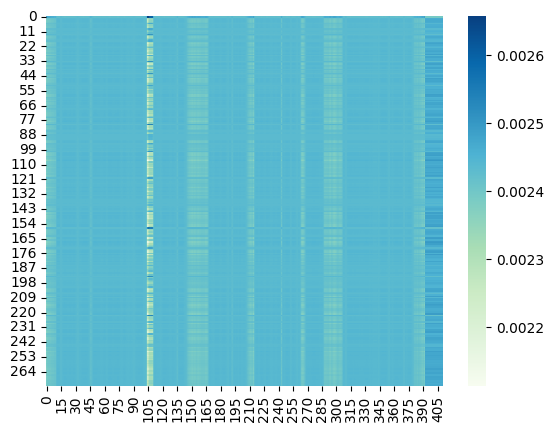


Epoch: 8/80


Val:   3%|▎         | 1/33 [00:05<02:52,  5.39s/it, dist=489.7400]

Ground Truth :  SO THEY FOLLOWED HER THROUGH THE LOW ARCHWAY AND IN A ROOM BEYOND VERY SIMPLY FURNISHED SAT A YOUNG GIRL ENGAGED IN DARNING A PAIR OF PINK STOCKINGS
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:   6%|▌         | 2/33 [00:10<02:39,  5.16s/it, dist=487.3567]

Ground Truth :  SHE WAS QUICK AND VERY EAGER
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:   9%|▉         | 3/33 [00:15<02:30,  5.02s/it, dist=487.7733]

Ground Truth :  THE SETTING OF THE SCENE SEEMED TO HER ALL IMPORTANT
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  12%|█▏        | 4/33 [00:20<02:23,  4.94s/it, dist=488.1917]

Ground Truth :  THE COURT WAS SPACIOUS WELL PAVED AND PERFECTLY CLEAN THERE BEING PROBABLY ANOTHER ENTRANCE BEHIND THE STABLES FOR REMOVING THE LITTER
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  15%|█▌        | 5/33 [00:24<02:16,  4.87s/it, dist=488.2973]

Ground Truth :  SHE MADE MISSUS SHIMERDA UNDERSTAND THE FRIENDLY INTENTION OF OUR VISIT AND THE BOHEMIAN WOMAN HANDLED THE LOAVES OF BREAD AND EVEN SMELLED THEM AND EXAMINED THE PIES WITH LIVELY CURIOSITY EXCLAIMING MUCH GOOD MUCH THANK
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  18%|█▊        | 6/33 [00:29<02:12,  4.91s/it, dist=487.4167]

Ground Truth :  THE HOUSE WHICH SEEMED TO CONSIST OF TWO OR THREE HIGH NARROW AND STEEP ROOFED BUILDINGS PROJECTING FROM EACH OTHER AT RIGHT ANGLES FORMED ONE SIDE OF THE INCLOSURE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  21%|██        | 7/33 [00:34<02:08,  4.95s/it, dist=487.1019]

Ground Truth :  MONEY IS FALSE AND LIGHT UNLESS IT BE BOUGHT BY A MAN'S OWN WORTHY QUALITIES AND BLOOD IS SUCH THAT ITS CORRUPT DISEASE AND IGNORANT PRETENCE ARE FOUL TO SEE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  24%|██▍       | 8/33 [00:39<02:02,  4.91s/it, dist=487.0683]

Ground Truth :  QUICKLY IT WAS COVERED WITH BRIGHT RED SPOTS I THOUGHT I HAD NEVER SEEN ANY BLOOD SO BRIGHT
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  27%|██▋       | 9/33 [00:44<01:57,  4.92s/it, dist=486.7193]

Ground Truth :  THE WORTHY FRIEND OF ATHANASIUS THE WORTHY ANTAGONIST OF JULIAN HE BRAVELY WRESTLED WITH THE ARIANS AND POLYTHEISTS AND THOUGH HE AFFECTED THE RIGOR OF GEOMETRICAL DEMONSTRATION HIS COMMENTARIES REVEALED THE LITERAL AND ALLEGORICAL SENSE OF THE SCRIPTURES
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  30%|███       | 10/33 [00:49<01:53,  4.93s/it, dist=487.1853]

Ground Truth :  THEN THE MOTHER LIFTED UP HER VOICE AND WEPT
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  33%|███▎      | 11/33 [00:54<01:47,  4.89s/it, dist=487.5697]

Ground Truth :  YOU CAN GUESS WHAT THAT UNHAPPY BOY HAS SUFFERED
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  36%|███▋      | 12/33 [00:59<01:43,  4.94s/it, dist=487.2867]

Ground Truth :  BUT IT IS QUITE PLAIN TO ME THAT ALL THE ARRANGEMENTS FOR MY WEDDING ARE GOING TO BE MADE BY THE SNELLINGS
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  39%|███▉      | 13/33 [01:04<01:37,  4.88s/it, dist=487.4687]

Ground Truth :  THE FLOORS WERE COVERED WITH MATTING AND THE HALL LAID WITH A THIN RAG CARPET
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  42%|████▏     | 14/33 [01:09<01:32,  4.89s/it, dist=487.6590]

Ground Truth :  HE HAD RETURNED TO PRISON THIS TIME FOR HAVING DONE RIGHT HE HAD QUAFFED FRESH BITTERNESS DISGUST AND LASSITUDE WERE OVERPOWERING HIM EVEN THE MEMORY OF THE BISHOP PROBABLY SUFFERED A TEMPORARY ECLIPSE THOUGH SURE TO REAPPEAR LATER ON LUMINOUS AND TRIUMPHANT BUT AFTER ALL THAT SACRED MEMORY WAS GROWING DIM
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  45%|████▌     | 15/33 [01:13<01:27,  4.88s/it, dist=487.5516]

Ground Truth :  THE HORSES OF THE OUTFIT SAVE THOSE THAT WERE ON NIGHT DUTY AND TWO OR THREE OTHERS THAT HAD DEVELOPED A HABIT OF STRAYING HAD BEEN TURNED LOOSE EARLY IN THE EVENING FOR ANIMALS ON THE TRAIL ARE SELDOM STAKED DOWN
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  48%|████▊     | 16/33 [01:18<01:22,  4.87s/it, dist=487.7596]

Ground Truth :  IN FACT ONE OF THEM WAS PLAINLY VERY MUCH OUT OF HEALTH AND COUGHED VIOLENTLY FROM TIME TO TIME IN SPITE OF MANIFEST EFFORTS TO SUPPRESS IT
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  52%|█████▏    | 17/33 [01:23<01:18,  4.92s/it, dist=487.4494]

Ground Truth :  THE LONG DRIZZLE HAD BEGUN PEDESTRIANS HAD TURNED UP COLLARS AND TROUSERS AT THE BOTTOM
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  55%|█████▍    | 18/33 [01:28<01:13,  4.91s/it, dist=487.5707]

Ground Truth :  PRESIDENT BROWN I WITHDRAW MY CRITICISM I OFFER YOU MY HUMBLE APOLOGIES
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  58%|█████▊    | 19/33 [01:33<01:08,  4.93s/it, dist=487.6446]

Ground Truth :  STRANGE THAT MEN SHOULD BE CONTENT TO GROVEL AND BE MEN WHEN THEY MIGHT RISE TO THE RANK OF GODS
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  61%|██████    | 20/33 [01:38<01:03,  4.92s/it, dist=487.8650]

Ground Truth :  BUT EMIL IF I UNDERSTAND THEN ALL OUR GOOD TIMES ARE OVER WE CAN NEVER DO NICE THINGS TOGETHER ANY MORE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  64%|██████▎   | 21/33 [01:43<00:59,  4.96s/it, dist=487.8340]

Ground Truth :  I HEAR THE T V GOING FOR A FEW MINUTES THEN POP TURNS IT OFF AND GOES IN THE KITCHEN TO TALK TO MOM
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  67%|██████▋   | 22/33 [01:48<00:54,  4.98s/it, dist=487.7906]

Ground Truth :  I SAY SIR HARRY THE LITTLE GIRL'S GOING FAMOUSLY TO NIGHT ISN'T SHE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  70%|██████▉   | 23/33 [01:53<00:49,  4.93s/it, dist=487.8412]

Ground Truth :  HE SEEMED TO BE CURSING PEOPLE WHO HAD WRONGED HIM
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  73%|███████▎  | 24/33 [01:58<00:44,  4.91s/it, dist=487.7006]

Ground Truth :  SHOW MISTER NORTH OUT HE SAID AND GO DOWN TO THE BARRACKS AND TELL TROKE THAT KIRKLAND IS TO HAVE A HUNDRED LASHES TO MORROW
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  76%|███████▌  | 25/33 [02:03<00:39,  4.94s/it, dist=487.5944]

Ground Truth :  I THOUGHT IT HAD BEEN TORN FROM MY SHOULDER
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.92s/it, dist=487.7921]

Ground Truth :  THE GOLDEN FLEECE IT'S THE SILVER FLEECE HE HARKENED
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  82%|████████▏ | 27/33 [02:13<00:29,  4.94s/it, dist=487.5205]

Ground Truth :  NO LETTER HAD COME NO WORD OF ANY KIND AND YET HERE IT WAS LATE IN THE EVENING AND SHE HAD AGREED TO MEET HIM THAT MORNING
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  85%|████████▍ | 28/33 [02:18<00:24,  4.94s/it, dist=487.6024]

Ground Truth :  WE WERE SUPPORTING AN ALABAMA BRIGADE
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  88%|████████▊ | 29/33 [02:23<00:19,  4.93s/it, dist=487.5483]

Ground Truth :  BUT THIS IS A FALLACY
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  91%|█████████ | 30/33 [02:28<00:14,  4.95s/it, dist=487.5533]

Ground Truth :  THE LITTLE GIRL HAD BEEN ASLEEP BUT SHE HEARD THE RAPS AND OPENED THE DOOR
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  94%|█████████▍| 31/33 [02:32<00:09,  4.95s/it, dist=487.5512]

Ground Truth :  ALEXANDER EXCLAIMED MILDLY
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val:  97%|█████████▋| 32/33 [02:37<00:04,  4.93s/it, dist=487.5100]

Ground Truth :  I HOPE HE DOESN'T WORK TOO HARD SAID SHAGGY
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


Val: 100%|██████████| 33/33 [02:39<00:00,  3.96s/it, dist=487.5264]

Ground Truth :  HOW CHEERFULLY HE SEEMS TO GRIN HOW NEATLY SPREAD HIS CLAWS AND WELCOME LITTLE FISHES IN WITH GENTLY SMILING JAWS
Prediction   :  AND THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF


	Train Loss 1.3499	 Learning Rate 0.0010000
	Val Dist 487.5264	
	Teacher Forcing Ratio 1	


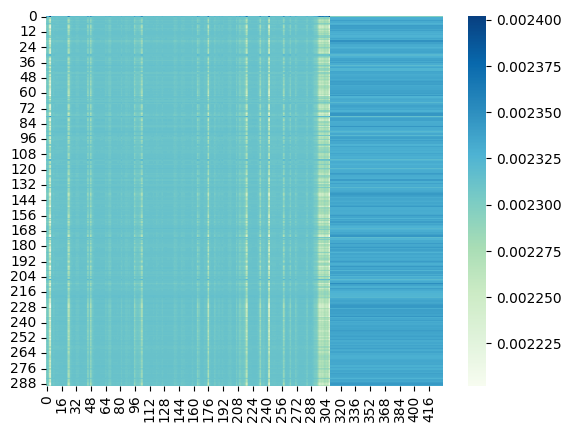


Epoch: 9/80


Val:   3%|▎         | 1/33 [00:05<02:53,  5.41s/it, dist=487.3867]

Ground Truth :  I EXPLAINED TO ANTONIA HOW THIS MEANT THAT HE WAS TWENTY FOUR YEARS OLD THAT HE MUST HAVE BEEN THERE WHEN WHITE MEN FIRST CAME LEFT ON FROM BUFFALO AND INDIAN TIMES
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:   6%|▌         | 2/33 [00:10<02:37,  5.10s/it, dist=486.7933]

Ground Truth :  ILLUSTRATION MAIZE PLANT
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:   9%|▉         | 3/33 [00:15<02:27,  4.93s/it, dist=488.8089]

Ground Truth :  VERY CHARACTERISTIC PERFECTLY TYPICAL
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  12%|█▏        | 4/33 [00:19<02:22,  4.90s/it, dist=489.0950]

Ground Truth :  URSUS WAS THE POET OF THESE MAGICAL REPRESENTATIONS HE WROTE THE PIECES
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  15%|█▌        | 5/33 [00:24<02:16,  4.87s/it, dist=489.9720]

Ground Truth :  HE HAD NEVER BEEN FATHER LOVER HUSBAND FRIEND
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  18%|█▊        | 6/33 [00:29<02:11,  4.88s/it, dist=489.9333]

Ground Truth :  AND HE WALKED IMMEDIATELY OUT OF THE APARTMENT BY ANOTHER DOOR
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  21%|██        | 7/33 [00:34<02:07,  4.89s/it, dist=489.2914]

Ground Truth :  TRACING RIVERS TO THEIR FOUNTAINS MAKES THE MOST CHARMING OF TRAVELS
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  24%|██▍       | 8/33 [00:39<02:02,  4.90s/it, dist=488.7425]

Ground Truth :  AFTER A TIME HE GAVE UP WAITING AND DREARILY HEADED FOR THE MADISON CAR
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  27%|██▋       | 9/33 [00:44<01:58,  4.92s/it, dist=488.2637]

Ground Truth :  I TOLD TOM WE SHOULDN'T COME SO LATE SAYS HILDA
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  30%|███       | 10/33 [00:49<01:53,  4.92s/it, dist=488.1813]

Ground Truth :  HILDA SAT ON THE ARM OF IT AND PUT HER HANDS LIGHTLY ON HIS SHOULDERS
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  33%|███▎      | 11/33 [00:54<01:48,  4.94s/it, dist=488.0297]

Ground Truth :  HE LIVED AND DIED FOR THE SERVICE OF MANKIND BUT THE LIFE AND DEATH OF SOCRATES HAD LIKEWISE BEEN DEVOTED TO THE CAUSE OF RELIGION AND JUSTICE AND ALTHOUGH THE STOIC OR THE HERO MAY DISDAIN THE HUMBLE VIRTUES OF JESUS THE TEARS WHICH HE SHED OVER HIS FRIEND AND COUNTRY MAY BE ESTEEMED THE PUREST EVIDENCE OF HIS HUMANITY
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  36%|███▋      | 12/33 [00:59<01:43,  4.95s/it, dist=487.9889]

Ground Truth :  I EMPHASISED COMPLACENTLY
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  39%|███▉      | 13/33 [01:04<01:38,  4.94s/it, dist=487.5636]

Ground Truth :  IT WAS ALMOST THE TONE OF HOPE EVERYBODY WILL STAY
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  42%|████▏     | 14/33 [01:09<01:33,  4.92s/it, dist=487.7467]

Ground Truth :  WHEN I WAS A YOUNG MAN LIKE YOU MISTER WAVERLEY ANY SUCH HAIR BRAINED EXPEDITION I BEG YOUR PARDON FOR THE EXPRESSION WOULD HAVE HAD INEXPRESSIBLE CHARMS FOR ME
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  45%|████▌     | 15/33 [01:13<01:28,  4.92s/it, dist=487.7093]

Ground Truth :  I NOW USE THEM AS ORNAMENTAL STATUARY IN MY GARDEN
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  48%|████▊     | 16/33 [01:18<01:22,  4.88s/it, dist=487.8042]

Ground Truth :  MARY AND ALICE DREW NEAR THE FIRE AND STOOD IN QUIET SORROW FOR SOME TIME
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  52%|█████▏    | 17/33 [01:23<01:18,  4.91s/it, dist=487.8016]

Ground Truth :  THE LOFTY ICY SHASTA TOWERING HIGH ABOVE ALL SEEMS BUT AN HOUR'S WALK FROM YOU THOUGH THE DISTANCE IN AN AIR LINE IS ABOUT SIXTY MILES
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  55%|█████▍    | 18/33 [01:28<01:13,  4.90s/it, dist=487.7630]

Ground Truth :  IN ALL OUR HISTORY YOU ARE THE FIRST PEOPLE FROM OUTSIDE OUR BORDERS WHO HAVE EVER STEPPED A FOOT IN OUR LAND
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  58%|█████▊    | 19/33 [01:33<01:08,  4.91s/it, dist=487.6712]

Ground Truth :  HEREDITY THE CAUSE OF ALL OUR FAULTS
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  61%|██████    | 20/33 [01:38<01:03,  4.91s/it, dist=487.6597]

Ground Truth :  CAN THESE THINGS BE RETURNED DAVID BREATHING MORE FREELY AS THE TRUTH BEGAN TO DAWN UPON HIM
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  64%|██████▎   | 21/33 [01:43<00:59,  4.93s/it, dist=487.6635]

Ground Truth :  UNCAS OCCUPIED A DISTANT CORNER IN A RECLINING ATTITUDE BEING RIGIDLY BOUND BOTH HANDS AND FEET BY STRONG AND PAINFUL WITHES
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  67%|██████▋   | 22/33 [01:48<00:54,  4.95s/it, dist=487.4103]

Ground Truth :  BOIL FOR FIVE MINUTES MINCE IT VERY SMALL AND MIX IT WITH THE OTHER INGREDIENTS
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  70%|██████▉   | 23/33 [01:53<00:49,  4.96s/it, dist=487.3020]

Ground Truth :  AS SOON AS EVER OF MY SECOND AGE I WAS UPON THE THRESHOLD AND CHANGED LIFE HIMSELF FROM ME HE TOOK AND GAVE TO OTHERS
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  73%|███████▎  | 24/33 [01:58<00:44,  4.97s/it, dist=487.2953]

Ground Truth :  OH WHY DID I ENGAGE THAT GOVERNESS
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  76%|███████▌  | 25/33 [02:03<00:39,  4.92s/it, dist=487.4813]

Ground Truth :  AT THIS THE BUNDLE OPENED SUDDENLY AND OUT POPPED PHRONSIE
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.92s/it, dist=487.7026]

Ground Truth :  ALL THE MORNING THEY TRUDGED UP THE MOUNTAIN PATH AND AT NOON UNC AND OJO SAT ON A FALLEN TREE TRUNK AND ATE THE LAST OF THE BREAD WHICH THE OLD MUNCHKIN HAD PLACED IN HIS POCKET
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  82%|████████▏ | 27/33 [02:12<00:29,  4.89s/it, dist=487.8393]

Ground Truth :  VERY SORRY YOUR REVERENCE BUT YOUR REVERENCE KNOWS THAT I DAREN'T DO SUCH A THING
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  85%|████████▍ | 28/33 [02:17<00:24,  4.90s/it, dist=487.8174]

Ground Truth :  YES ALL ALONE BY HIMSELF ASSERTED JASPER VEHEMENTLY AND WINKING FURIOUSLY TO THE OTHERS TO STOP THEIR LAUGHING HE DID NOW TRULY PHRONSIE
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  88%|████████▊ | 29/33 [02:22<00:19,  4.90s/it, dist=487.6451]

Ground Truth :  THE PONY DID MOST OF IT ADMITTED THE LAD I JUST GAVE HIM HIS HEAD AND THAT'S ALL THERE WAS TO IT
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  91%|█████████ | 30/33 [02:27<00:14,  4.90s/it, dist=487.5298]

Ground Truth :  I AM STILL FAIRLY WELL SATISFIED WITH THOSE PARTS OF EREWHON THAT WERE REPEATEDLY REWRITTEN BUT FROM THOSE THAT HAD ONLY A SINGLE WRITING I WOULD GLADLY CUT OUT SOME FORTY OR FIFTY PAGES IF I COULD
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  94%|█████████▍| 31/33 [02:32<00:09,  4.90s/it, dist=487.6269]

Ground Truth :  NEAR THE FIRE AND THE ORNAMENTS FRED BROUGHT HOME FROM INDIA ON THE MANTEL BOARD
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  97%|█████████▋| 32/33 [02:37<00:04,  4.93s/it, dist=487.7196]

Ground Truth :  YOU MUST KNOW SAID MARGOLOTTE WHEN THEY WERE ALL SEATED TOGETHER ON THE BROAD WINDOW SEAT THAT MY HUSBAND FOOLISHLY GAVE AWAY ALL THE POWDER OF LIFE HE FIRST MADE TO OLD MOMBI THE WITCH WHO USED TO LIVE IN THE COUNTRY OF THE GILLIKINS TO THE NORTH OF HERE
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Ground Truth :  GRETHEL SHE CRIED IN A PASSION GET SOME WATER QUICKLY BE HANSEL FAT OR LEAN THIS MORNING I WILL KILL AND COOK HIM
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE
	Train Loss 1.3356	 Learning Rate 0.0010000
	Val Dist 487.7038	
	Teacher Forcing Ratio 1	


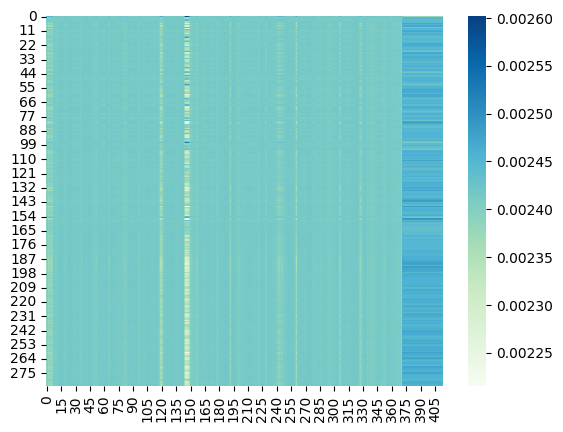


Epoch: 10/80


Val:   3%|▎         | 1/33 [00:05<02:57,  5.53s/it, dist=481.1000]

Ground Truth :  HOW WE MUST SIMPLIFY
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:   6%|▌         | 2/33 [00:10<02:42,  5.25s/it, dist=481.6600]

Ground Truth :  THEN AS IF SATISFIED OF THEIR SAFETY THE SCOUT LEFT HIS POSITION AND SLOWLY ENTERED THE PLACE
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:   9%|▉         | 3/33 [00:15<02:32,  5.07s/it, dist=483.7400]

Ground Truth :  IT WAS ALMOST BURIED NOW IN FLOWERS AND FOLIAGE
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  12%|█▏        | 4/33 [00:20<02:25,  5.03s/it, dist=483.4600]

Ground Truth :  BUT IN THIS AWFUL MOMENT OF THE DANGER OF THE CHURCH THEIR VOW WAS SUPERSEDED BY A MORE SUBLIME AND INDISPENSABLE DUTY
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  15%|█▌        | 5/33 [00:25<02:18,  4.96s/it, dist=483.6480]

Ground Truth :  THIS DRESSING SHOULD STAND IN THE ICE BOX FOUR OR FIVE HOURS TO BECOME SEASONED
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  18%|█▊        | 6/33 [00:30<02:14,  4.96s/it, dist=483.9756]

Ground Truth :  IMPERTINENT YOUNG BEGGAR SAID BURGESS
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  21%|██        | 7/33 [00:34<02:07,  4.90s/it, dist=484.5010]

Ground Truth :  SCARED DAH WHO'S AFRAID ANSWERED HE
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  24%|██▍       | 8/33 [00:39<02:02,  4.92s/it, dist=483.9492]

Ground Truth :  ITALIAN MILLET OR GREAT INDIAN MILLET IS CULTIVATED IN EGYPT AND NUBIA WHERE IT IS CALLED DHOURRA AND IS USED AS HUMAN FOOD AS WELL AS FOR THE FERMENTATION OF BEER
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  27%|██▋       | 9/33 [00:44<01:57,  4.88s/it, dist=484.3956]

Ground Truth :  SEASON WITH SALT AND PEPPER AND A LITTLE SUGAR TO TASTE
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  30%|███       | 10/33 [00:49<01:53,  4.93s/it, dist=484.4020]

Ground Truth :  OH WON'T SHE BE SAVAGE IF I'VE KEPT HER WAITING
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  33%|███▎      | 11/33 [00:54<01:48,  4.94s/it, dist=484.5345]

Ground Truth :  MISTER MEEKIN EXPRESSED SOME ALARM BUT DOCTOR MACKLEWAIN RE ASSURED HIM
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  36%|███▋      | 12/33 [00:59<01:43,  4.93s/it, dist=485.0561]

Ground Truth :  THE WIND WAS SO STRONG THAT I HAD TO HOLD MY HAT ON AND THE GIRLS SKIRTS WERE BLOWN OUT BEFORE THEM
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  39%|███▉      | 13/33 [01:04<01:38,  4.93s/it, dist=485.0672]

Ground Truth :  STRAIN AND BOTTLE AND PUT IN ICE BOX SHAKE BEFORE USING EACH TIME
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  42%|████▏     | 14/33 [01:09<01:33,  4.91s/it, dist=485.1862]

Ground Truth :  VERY CHARACTERISTIC PERFECTLY TYPICAL
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  45%|████▌     | 15/33 [01:14<01:27,  4.88s/it, dist=485.3609]

Ground Truth :  NOT TILL THE DOCTOR CAME HER DOCTOR WHO WAS HAPPILY IN HIS OFFICE IN THIS VERY BUILDING
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  48%|████▊     | 16/33 [01:19<01:23,  4.90s/it, dist=485.3492]

Ground Truth :  EDISON HELD THAT THE ELECTRICITY SOLD MUST BE MEASURED JUST LIKE GAS OR WATER AND HE PROCEEDED TO DEVELOP A METER
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  52%|█████▏    | 17/33 [01:24<01:18,  4.90s/it, dist=485.4129]

Ground Truth :  BUT THE WINDOWS ARE PATCHED WITH WOODEN PANES AND THE DOOR I THINK IS LIKE THE GATE IT IS NEVER OPENED
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  55%|█████▍    | 18/33 [01:28<01:13,  4.88s/it, dist=485.4489]

Ground Truth :  WHEN HIS PUBLIC SERVICES WERE FINISHED HE STARTED IN COMPANY WITH HIS WIFE SON JESSE AND A FEW FRIENDS
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  58%|█████▊    | 19/33 [01:33<01:08,  4.90s/it, dist=485.3316]

Ground Truth :  PERHAPS THE PROFESSION OF DOING GOOD MAY BE FULL BUT EVERY BODY SHOULD BE KIND AT LEAST TO HIMSELF
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  61%|██████    | 20/33 [01:38<01:04,  4.95s/it, dist=485.4120]

Ground Truth :  BESIDES WE MUST REMEMBER THAT THEY HAD IN THOSE TIMES MEANS OF PUTTING PATIENTS TO SLEEP AND OF SUPPRESSING ALL SUFFERING ONLY THEN IT WAS CALLED MAGIC WHILE NOW IT IS CALLED ANAESTHESIA
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  64%|██████▎   | 21/33 [01:43<00:59,  4.92s/it, dist=485.6968]

Ground Truth :  BUT HE COMPROMISED BY TELLING THE BOY THAT THERE WOULD BE NO REPLY
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  67%|██████▋   | 22/33 [01:48<00:53,  4.90s/it, dist=485.7576]

Ground Truth :  BUT AT THE URGENT ENTREATY OF THE PRINCESS OF KHOSALA WHO LOVED BHUNDA CHAND VAINLY HE GAVE HER A LOCK OF HIS LONG BLACK HAIR AS A TOKEN OF REMEMBRANCE
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  70%|██████▉   | 23/33 [01:53<00:49,  4.90s/it, dist=485.4275]

Ground Truth :  BUT MOST PROBABLY HAD ANY OF US ENTERED THAT ROOM THAT MORNING WE SHOULD NOT HAVE BEEN ABLE TO SPARE A LOOK EITHER FOR THE FURNITURE OR THE GENERAL EFFECT OR THE MUSEUM GARDENS OR THE SPARKLING MEDITERRANEAN BEYOND BUT WE SHOULD HAVE AGREED THAT THE ROOM WAS QUITE RICH ENOUGH FOR HUMAN EYES FOR THE SAKE OF ONE TREASURE WHICH IT POSSESSED AND BESIDE WHICH NOTHING WAS WORTH A MOMENT'S GLANCE
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  73%|███████▎  | 24/33 [01:58<00:43,  4.88s/it, dist=485.6392]

Ground Truth :  WE WERE MORE INTERESTED IN THE TECHNICAL CONDITION OF THE STATION THAN IN THE COMMERCIAL PART
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  76%|███████▌  | 25/33 [02:03<00:38,  4.87s/it, dist=485.7309]

Ground Truth :  BOZZLE HAD ALWAYS WAITED UPON HIM WITH A DECENT COAT AND A WELL BRUSHED HAT AND CLEAN SHOES
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  79%|███████▉  | 26/33 [02:08<00:33,  4.84s/it, dist=485.7995]

Ground Truth :  WE'VE LOST THE KEY OF THE CELLAR AND THERE'S NOTHING OUT EXCEPT WATER AND I DON'T THINK YOU'D CARE FOR THAT
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  82%|████████▏ | 27/33 [02:12<00:29,  4.86s/it, dist=485.9165]

Ground Truth :  IN JAMAICA IT FLOWERS ABOUT AUGUST OR SEPTEMBER FADING ABOUT THE END OF THE YEAR
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  85%|████████▍ | 28/33 [02:17<00:24,  4.89s/it, dist=485.9700]

Ground Truth :  ALL HIS EMOTIONS WHATEVER THEY MIGHT HAVE BEEN AUGMENTED HIS STRANGE FACE OF JOY OR TO SPEAK MORE CORRECTLY AGGRAVATED IT
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  88%|████████▊ | 29/33 [02:22<00:19,  4.89s/it, dist=485.8655]

Ground Truth :  WALTER HAD GONE OUT WITH THE SECOND GUARD AND THE OTHERS HAD GATHERED AROUND THE CAMP FIRE FOR THEIR NIGHTLY STORY TELLING
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  91%|█████████ | 30/33 [02:27<00:14,  4.90s/it, dist=485.7416]

Ground Truth :  WHATEVER REVIVING EFFECT IT MIGHT OTHERWISE HAVE PRODUCED ON HIM IT MADE NO CHANGE IN THE THREATENING GLOOM OF HIS MANNER
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  94%|█████████▍| 31/33 [02:32<00:09,  4.94s/it, dist=485.7701]

Ground Truth :  WHETHER HE GOT ANYTHING ELSE IT WOULD BE IMPOSSIBLE TO SAY FROM HIS MANNER AS HE FINALLY SANK INTO A CHAIR BY ONE OF THE OPENINGS AND LOOKED DOWN ON THE LOBBY BELOW
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  97%|█████████▋| 32/33 [02:37<00:04,  4.93s/it, dist=485.6731]

Ground Truth :  EXQUISITE ORDER AND UNIVERSAL WITH ETERNAL LIFE AND LIGHT THIS IS THE FAITH AND EFFORT OF THE SCHOOLS OF CRYSTAL AND YOU MAY DESCRIBE AND COMPLETE THEIR WORK QUITE LITERALLY BY TAKING ANY VERSES OF CHAUCER IN HIS TENDER MOOD AND OBSERVING HOW HE INSISTS ON THE CLEARNESS AND BRIGHTNESS FIRST AND THEN ON THE ORDER
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val: 100%|██████████| 33/33 [02:39<00:00,  3.96s/it, dist=485.6368]

Ground Truth :  BUT HE COMPROMISED BY TELLING THE BOY THAT THERE WOULD BE NO REPLY
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


	Train Loss 1.3246	 Learning Rate 0.0010000
	Val Dist 485.6368	
	Teacher Forcing Ratio 1	


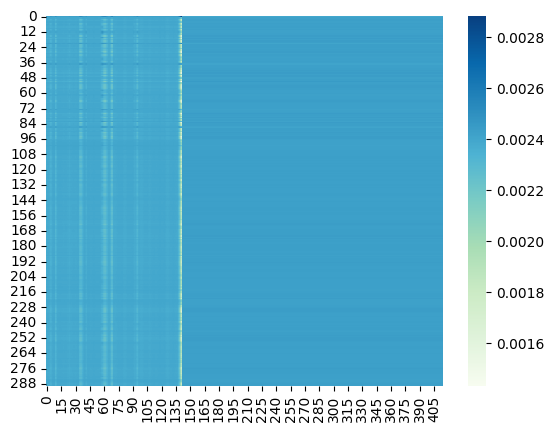


Epoch: 11/80


Val:   3%|▎         | 1/33 [00:05<02:51,  5.37s/it, dist=480.4067]

Ground Truth :  HE USED TO HELP MY FATHER CUT CHRISTMAS TREES FOR ME IN VIRGINIA AND HE HAD NOT FORGOTTEN HOW MUCH I LIKED THEM
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:   6%|▌         | 2/33 [00:10<02:39,  5.16s/it, dist=479.5000]

Ground Truth :  AND WHAT ALLUREMENTS OR WHAT VANTAGES UPON THE FOREHEAD OF THE OTHERS SHOWED THAT THOU SHOULDST TURN THY FOOTSTEPS UNTO THEM
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:   9%|▉         | 3/33 [00:15<02:31,  5.03s/it, dist=479.9089]

Ground Truth :  THE FACT IS THE CASTLE IS MUCH LATER THAN THE TIME OF THE HEROIC PRINCE OF DENMARK
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  12%|█▏        | 4/33 [00:20<02:25,  5.01s/it, dist=478.3017]

Ground Truth :  ANOTHER FAMOUS MEDICINE MAN WAS BORN ON THE RUM RIVER ABOUT ONE HUNDRED AND FIFTY YEARS AGO AND LIVED TO BE OVER A CENTURY OLD
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  15%|█▌        | 5/33 [00:25<02:18,  4.96s/it, dist=478.0547]

Ground Truth :  HE OFTEN STOPPED TO EXAMINE THE TREES NOR DID HE CROSS A RIVULET WITHOUT ATTENTIVELY CONSIDERING THE QUANTITY THE VELOCITY AND THE COLOR OF ITS WATERS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  18%|█▊        | 6/33 [00:30<02:14,  4.99s/it, dist=477.4300]

Ground Truth :  THEY SHALL NOT FLOG THAT BOY HE SAID
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  21%|██        | 7/33 [00:35<02:08,  4.95s/it, dist=477.5219]

Ground Truth :  ONLY UNFORTUNATELY HIS OWN WORK NEVER DOES GET GOOD
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  24%|██▍       | 8/33 [00:39<02:03,  4.93s/it, dist=477.9642]

Ground Truth :  SO THEY JUST CAME IN HERE AND LIT THE CHARCOAL AND SAT DRINKING TOGETHER TILL THEY ALL FELL ASLEEP
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  27%|██▋       | 9/33 [00:44<01:59,  4.97s/it, dist=477.8200]

Ground Truth :  OUR ROADS LIE TOGETHER DOCTOR
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  30%|███       | 10/33 [00:50<01:54,  5.00s/it, dist=477.9413]

Ground Truth :  WHEREVER SHE PLEASES ONLY I CAN'T WALK FAR
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  33%|███▎      | 11/33 [00:55<01:50,  5.00s/it, dist=478.0691]

Ground Truth :  GOD WHO READS OUR HEARTS KNOWS THAT WE HAD A NOBLE END IN VIEW
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  36%|███▋      | 12/33 [00:59<01:44,  4.96s/it, dist=477.9150]

Ground Truth :  THEREFORE DON'T TALK TO ME ABOUT VIEWS AND PROSPECTS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  39%|███▉      | 13/33 [01:04<01:39,  4.97s/it, dist=477.8338]

Ground Truth :  IN THE MEANTIME AFTER WHAT MISSUS PRESTY HAD CONFESSED THE CRUEL FALSEHOOD WHICH HAD CHECKED POOR KITTY'S NATURAL INQUIRIES RAISED AN INSUPERABLE OBSTACLE TO A MEETING BETWEEN FATHER AND CHILD
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  42%|████▏     | 14/33 [01:09<01:34,  4.97s/it, dist=477.3976]

Ground Truth :  TRACING RIVERS TO THEIR FOUNTAINS MAKES THE MOST CHARMING OF TRAVELS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  45%|████▌     | 15/33 [01:14<01:29,  4.97s/it, dist=477.6133]

Ground Truth :  SOMEHOW OR OTHER CAT HAS TAUGHT THEM THAT HE'S IN CHARGE HERE AND HE JUST CHASES THEM FOR FUN NOW AND AGAIN WHEN HE'S NOT BUSY SLEEPING
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  48%|████▊     | 16/33 [01:19<01:24,  5.00s/it, dist=477.4254]

Ground Truth :  THE GREAT WILDS OF OUR COUNTRY ONCE HELD TO BE BOUNDLESS AND INEXHAUSTIBLE ARE BEING RAPIDLY INVADED AND OVERRUN IN EVERY DIRECTION AND EVERYTHING DESTRUCTIBLE IN THEM IS BEING DESTROYED
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  52%|█████▏    | 17/33 [01:24<01:19,  4.99s/it, dist=477.5561]

Ground Truth :  TRACING THIS WILD CHANGING CHANNEL GORGE GULLY OR CANYON THE SECTIONS WILL SHOW MOUNT SHASTA AS A HUGE PALIMPSEST CONTAINING THE RECORDS LAYER UPON LAYER OF STRANGELY CONTRASTED EVENTS IN ITS FIERY ICY HISTORY
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  55%|█████▍    | 18/33 [01:29<01:14,  4.96s/it, dist=477.6256]

Ground Truth :  THIS MODEST SCHOLAR SPOKE NO LANGUAGES SAVE ICELANDIC AND LATIN
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  58%|█████▊    | 19/33 [01:34<01:09,  4.96s/it, dist=477.4347]

Ground Truth :  HIS EXCELLENCY MADAM THE PREFECT
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  61%|██████    | 20/33 [01:39<01:04,  4.99s/it, dist=477.2623]

Ground Truth :  THE PROBLEM WAS SOLVED
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  64%|██████▎   | 21/33 [01:44<00:59,  4.99s/it, dist=476.9006]

Ground Truth :  THEN THE WIND TOOK ANOTHER FROLIC ROUND THE GARDEN AND MADE UP TO THE LARGE WHITE LILY INTO WHOSE REFINED EAR HE WHISPERED A DOUBT AS TO THE NECESSITY OR ADVANTAGE OF HER THICK POWERFUL STEM BEING PROPPED UP AGAINST A STUPID UGLY STICK
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  67%|██████▋   | 22/33 [01:49<00:54,  4.94s/it, dist=477.0173]

Ground Truth :  WHAT WOULD SHE DO ABOUT THAT THE CONFOUNDED WRETCH
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  70%|██████▉   | 23/33 [01:54<00:49,  4.95s/it, dist=476.9881]

Ground Truth :  BUT IN THIS VIGNETTE COPIED FROM TURNER YOU HAVE THE TWO PRINCIPLES BROUGHT OUT PERFECTLY
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  73%|███████▎  | 24/33 [01:59<00:44,  4.95s/it, dist=476.9256]

Ground Truth :  I HAD WANTED TO GET SOME PICTURE BOOKS FOR YULKA AND ANTONIA EVEN YULKA WAS ABLE TO READ A LITTLE NOW
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  76%|███████▌  | 25/33 [02:04<00:39,  4.98s/it, dist=476.8587]

Ground Truth :  AS LEADING TO THE MENTION OF OTHER INTERESTING EVENTS WE MUST SET THIS INROAD CLEARLY BEFORE THE READER
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  79%|███████▉  | 26/33 [02:09<00:34,  4.93s/it, dist=476.9367]

Ground Truth :  MALE OR FEMALE HUMAN OR ANIMAL
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  82%|████████▏ | 27/33 [02:14<00:29,  4.92s/it, dist=476.9598]

Ground Truth :  TWO DAYS AFTERWARDS OUR NOCTURNAL ORGY BEGAN TO BE TALKED OF
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  85%|████████▍ | 28/33 [02:19<00:24,  4.92s/it, dist=476.7690]

Ground Truth :  SHE HAS BEEN DEAD THESE TWENTY YEARS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  88%|████████▊ | 29/33 [02:24<00:19,  4.89s/it, dist=476.8092]

Ground Truth :  YOU WANT ME TO SAY IT SHE WHISPERED
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  91%|█████████ | 30/33 [02:29<00:14,  4.93s/it, dist=476.8064]

Ground Truth :  YE KEEP YOUR WATCH IN THE ETERNAL DAY SO THAT NOR NIGHT NOR SLEEP CAN STEAL FROM YOU ONE STEP THE AGES MAKE UPON THEIR PATH
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  94%|█████████▍| 31/33 [02:33<00:09,  4.89s/it, dist=476.9280]

Ground Truth :  YES INDEED AND I BELIEVE IT IS RIGHT THAT I SHOULD KEEP MY FIRST PROMISE IS IT NOT
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  97%|█████████▋| 32/33 [02:38<00:04,  4.92s/it, dist=476.9521]

Ground Truth :  THIS IS MURDEROUS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Ground Truth :  IT WAS A PAIN TO SEE THEM AND A SWORD LIKE PAIN TO SEE THE SIGNS OF ADOLESCENCE THAT MADE REPELLENT THEIR PITIABLE NAKEDNESS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE
	Train Loss 1.3147	 Learning Rate 0.0010000
	Val Dist 476.9960	
	Teacher Forcing Ratio 1	


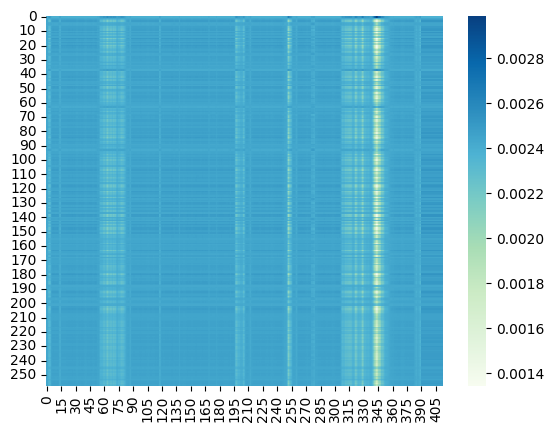

Saved best model

Epoch: 12/80


Val:   3%|▎         | 1/33 [00:05<02:58,  5.57s/it, dist=485.6000]

Ground Truth :  EVERY ELEVATION OF THE TYPE MAN HAS HITHERTO BEEN THE WORK OF AN ARISTOCRATIC SOCIETY AND SO IT WILL ALWAYS BE A SOCIETY BELIEVING IN A LONG SCALE OF GRADATIONS OF RANK AND DIFFERENCES OF WORTH AMONG HUMAN BEINGS AND REQUIRING SLAVERY IN SOME FORM OR OTHER
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:   6%|▌         | 2/33 [00:10<02:39,  5.15s/it, dist=487.8700]

Ground Truth :  BUT EVEN WHILE SHE ENJOYED EVERY HOUR OF LIFE AND BEGRUDGED THE TIME GIVEN TO SLEEP SHE FELT AS IF THE DREAM WAS TOO BEAUTIFUL TO LAST AND OFTEN SAID
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:   9%|▉         | 3/33 [00:15<02:32,  5.08s/it, dist=486.8356]

Ground Truth :  IT IS OFTEN THE UNGRATEFUL TASK OF A FRIEND TO BE TROUBLESOME SOMETIMES UNMANNERLY
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  12%|█▏        | 4/33 [00:20<02:25,  5.02s/it, dist=488.1833]

Ground Truth :  TRACING THE MC CLOUD TO ITS HIGHEST SPRINGS AND OVER THE DIVIDE TO THE FOUNTAINS OF FALL RIVER NEAR FORT CROOK THENCE DOWN THAT RIVER TO ITS CONFLUENCE WITH THE PITT ON FROM THERE TO THE VOLCANIC REGION ABOUT LASSEN'S BUTTE THROUGH THE BIG MEADOWS AMONG THE SOURCES OF THE FEATHER RIVER AND DOWN THROUGH FORESTS OF SUGAR PINE TO THE FERTILE PLAINS OF CHICO THIS IS A GLORIOUS SAUNTER AND IMPOSES NO HARDSHIP
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  15%|█▌        | 5/33 [00:25<02:20,  5.02s/it, dist=487.8680]

Ground Truth :  HE STARTED AT THE THOUGHT HE HURRIED FORTH SADLY
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  18%|█▊        | 6/33 [00:30<02:14,  4.98s/it, dist=487.7333]

Ground Truth :  THE MERCHANT'S DAUGHTER AT FIRST DID NOT ANSWER BUT AS HE KEPT ON CALLING TO HER SHE FINALLY ASKED HIM WHAT IT WAS THAT HE WANTED
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  21%|██        | 7/33 [00:35<02:08,  4.96s/it, dist=487.9010]

Ground Truth :  OH NO I'M QUITE SURE HE DIDN'T
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  24%|██▍       | 8/33 [00:40<02:04,  4.98s/it, dist=487.4217]

Ground Truth :  BUT IN LESS THAN FIVE MINUTES THE STAIRCASE GROANED BENEATH AN EXTRAORDINARY WEIGHT
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  27%|██▋       | 9/33 [00:45<02:00,  5.03s/it, dist=486.7970]

Ground Truth :  THE MOTHER HERSELF AS IF THE RED IGNOMINY WERE SO DEEPLY SCORCHED INTO HER BRAIN THAT ALL HER CONCEPTIONS ASSUMED ITS FORM HAD CAREFULLY WROUGHT OUT THE SIMILITUDE LAVISHING MANY HOURS OF MORBID INGENUITY TO CREATE AN ANALOGY BETWEEN THE OBJECT OF HER AFFECTION AND THE EMBLEM OF HER GUILT AND TORTURE
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  30%|███       | 10/33 [00:50<01:54,  4.97s/it, dist=487.2587]

Ground Truth :  WHEN THESE TWO SOULS PERCEIVED EACH OTHER THEY RECOGNIZED EACH OTHER AS NECESSARY TO EACH OTHER AND EMBRACED EACH OTHER CLOSELY
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  33%|███▎      | 11/33 [00:54<01:48,  4.92s/it, dist=487.5067]

Ground Truth :  YET THE MOST CHARITABLE CRITICISM MUST REFUSE THESE SECTARIES ANY KNOWLEDGE OF THE PURE AND PROPER DIVINITY OF CHRIST
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  36%|███▋      | 12/33 [00:59<01:43,  4.95s/it, dist=487.2944]

Ground Truth :  WITHOUT HIS SCRAPBOOKS HIS CHEMICALS AND HIS HOMELY UNTIDINESS HE WAS AN UNCOMFORTABLE MAN
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  39%|███▉      | 13/33 [01:05<01:39,  4.97s/it, dist=487.0569]

Ground Truth :  THE SUN AS YOU SEE TELLS QUITE ANOTHER STORY AND WILL NOT BE COAXED OUT OF IT AFTER HALF A DOZEN PATIENT ATTEMPTS ON MY PART
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  42%|████▏     | 14/33 [01:10<01:35,  5.02s/it, dist=486.9762]

Ground Truth :  AS SHE AWAITED HER GUESTS SHE SURVEYED THE TABLE WITH BOTH SATISFACTION AND DISQUIETUDE FOR HER SOCIAL FUNCTIONS WERE FEW TONIGHT THERE WERE SHE CHECKED THEM OFF ON HER FINGERS SIR JAMES CREIGHTON THE RICH ENGLISH MANUFACTURER AND LADY CREIGHTON MISTER AND MISSUS VANDERPOOL MISTER HARRY CRESSWELL AND HIS SISTER JOHN TAYLOR AND HIS SISTER AND MISTER CHARLES SMITH WHOM THE EVENING PAPERS MENTIONED AS LIKELY TO BE UNITED STATES SENATOR FROM NEW JERSEY A SELECTION OF GUESTS THAT HAD BEEN DETERMINED UNKNOWN TO THE HOSTESS BY THE MEETING OF COTTON INTERESTS EARLIER IN THE DAY
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF

Val:  45%|████▌     | 15/33 [01:15<01:29,  5.00s/it, dist=486.9858]

Ground Truth :  IF THE READER WILL EXCUSE ME I WILL SAY NOTHING OF MY ANTECEDENTS NOR OF THE CIRCUMSTANCES WHICH LED ME TO LEAVE MY NATIVE COUNTRY THE NARRATIVE WOULD BE TEDIOUS TO HIM AND PAINFUL TO MYSELF
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  48%|████▊     | 16/33 [01:20<01:25,  5.03s/it, dist=486.5642]

Ground Truth :  HE PRESSED HIS VIOLIN CASE TO HIS HEART AS IF IT WERE A LIVING THING THAT COULD KNOW THAT HE LOVED IT
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  52%|█████▏    | 17/33 [01:25<01:19,  4.98s/it, dist=486.7133]

Ground Truth :  IT WAS AFTERNOON WHEN HE REACHED THE LITTLE STATION OF WINTON AND LEFT THE TRAIN A TALL STURDY BOY THE SUPERIOR OF MANY A MAN IN SIZE STRENGTH AND AGILITY
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  55%|█████▍    | 18/33 [01:30<01:14,  5.00s/it, dist=486.5774]

Ground Truth :  OF COURSE HILDA IS IRISH THE BURGOYNES HAVE BEEN STAGE PEOPLE FOR GENERATIONS AND SHE HAS THE IRISH VOICE
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  58%|█████▊    | 19/33 [01:35<01:10,  5.01s/it, dist=486.5253]

Ground Truth :  OH BARTLEY DID YOU WRITE TO ME
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  61%|██████    | 20/33 [01:40<01:04,  4.98s/it, dist=486.7253]

Ground Truth :  BUT WILL HE THANK ME FOR IT
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  64%|██████▎   | 21/33 [01:44<00:59,  4.96s/it, dist=486.7648]

Ground Truth :  WHILE THE DANGER HAD NOT LESSENED IT HAD NOT AS YET MATERIALISED AND WITH HIM NO NEWS WAS GOOD NEWS
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  67%|██████▋   | 22/33 [01:49<00:53,  4.90s/it, dist=487.0445]

Ground Truth :  ILLUSTRATION BASIL
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  70%|██████▉   | 23/33 [01:54<00:48,  4.90s/it, dist=486.8501]

Ground Truth :  ALICE TOOK UP THE FAN AND GLOVES AND AS THE HALL WAS VERY HOT SHE KEPT FANNING HERSELF ALL THE TIME SHE WENT ON TALKING DEAR DEAR HOW QUEER EVERYTHING IS TO DAY
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  73%|███████▎  | 24/33 [01:59<00:43,  4.86s/it, dist=487.0169]

Ground Truth :  MY FATHER HAS REVEALED THE CULPRIT'S NAME MY FATHER THIRSTS FOR REVENGE AS MUCH AS YOU DO YET EVEN HE CONJURES YOU AS I DO TO KEEP THIS SECRET DO YOU NOT FATHER
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  76%|███████▌  | 25/33 [02:04<00:38,  4.85s/it, dist=487.2045]

Ground Truth :  AND THE ONLY TRUCK WE HAD AVAILABLE WAS IN THAT BURNING SHED THE SUPERINTENDENT ADDED BITTERLY
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  79%|███████▉  | 26/33 [02:08<00:33,  4.82s/it, dist=487.4126]

Ground Truth :  POETRY NOT BEING AN EXACT SCIENCE LITERALITY OF RENDERING IS ALTOGETHER SECONDARY TO THIS CHIEF LAW
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  82%|████████▏ | 27/33 [02:13<00:29,  4.88s/it, dist=487.2817]

Ground Truth :  THE WOMEN DROPPED THEIR WORK TO LOOK AND LISTEN FOR HIS VISITS WERE FEW AND SHORT AND EVERY INSTANT WAS PRECIOUS
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  85%|████████▍ | 28/33 [02:18<00:24,  4.87s/it, dist=487.4431]

Ground Truth :  AMBROSCH HE MAKE GOOD FARMER
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  88%|████████▊ | 29/33 [02:23<00:19,  4.86s/it, dist=487.4768]

Ground Truth :  WHY NOT ALLOW YOUR SILVER TUFTS TO LUXURIATE IN A NATURAL MANNER
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  91%|█████████ | 30/33 [02:28<00:14,  4.86s/it, dist=487.5311]

Ground Truth :  THE BOARD NOT SO FORMIDABLE AS SHE HAD IMAGINED HAD INQUIRED INTO HER CASE AND INSTEAD OF SENDING HER TO STOKE CLAYPOLE HER HUSBAND'S BUCKINGHAMSHIRE PARISH AS SHE HAD DREADED HAD AGREED TO PAY HER RENT
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  94%|█████████▍| 31/33 [02:33<00:09,  4.83s/it, dist=487.7527]

Ground Truth :  HE BEGAN TO DRAW IN HIS LEGS VERY VERY SLOWLY AND JUST AS HIS GREAT HARD LOWER SHELL TOUCHED THE MUD THE LAST LARVA CRAWLED OUT UNDER HIS TAIL
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val:  97%|█████████▋| 32/33 [02:38<00:04,  4.84s/it, dist=487.7140]

Ground Truth :  HIS ENUNCIATION WOULD HAVE BEEN ALMOST TOTALLY UNINTELLIGIBLE TO A STRANGER
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


Val: 100%|██████████| 33/33 [02:39<00:00,  3.89s/it, dist=487.7166]

Ground Truth :  HERE AS WELL AS IN A NUMBER OF OTHER PLACES ONE CAN WELL APPRECIATE THE COLLOQUIAL DEFINITION OF CABARET
Prediction   :  THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE STREET OF THE


	Train Loss 1.3063	 Learning Rate 0.0010000
	Val Dist 487.7166	
	Teacher Forcing Ratio 1	


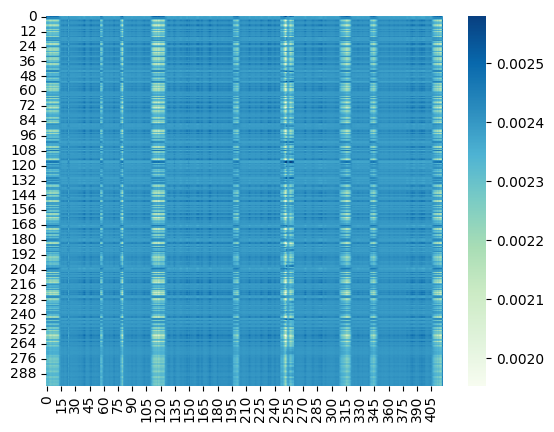


Epoch: 13/80


Val:   3%|▎         | 1/33 [00:05<02:58,  5.57s/it, dist=473.1867]

Ground Truth :  WHEREVER THEY WENT THE STORY FOLLOWED THEM
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:   6%|▌         | 2/33 [00:10<02:43,  5.28s/it, dist=472.2367]

Ground Truth :  AND WHY SHOULD THAT DISTURB ME LET HIM ENTER
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:   9%|▉         | 3/33 [00:15<02:33,  5.13s/it, dist=474.5178]

Ground Truth :  WELL WELL THAT'S HONEST AT ALL EVENTS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  12%|█▏        | 4/33 [00:20<02:27,  5.08s/it, dist=474.7400]

Ground Truth :  AND EMIL MOWED HIS WAY SLOWLY DOWN TOWARD THE CHERRY TREES
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  15%|█▌        | 5/33 [00:25<02:19,  4.99s/it, dist=475.0427]

Ground Truth :  EVEN IN MIDDLE AGE THEY WERE STILL COMELY AND THE OLD GREY HAIRED WOMEN AT THEIR COTTAGE DOORS HAD A DIGNITY NOT TO SAY MAJESTY OF THEIR OWN
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  18%|█▊        | 6/33 [00:30<02:15,  5.00s/it, dist=473.5000]

Ground Truth :  I WISH YOU WEREN'T SO RESTLESS AND DIDN'T GET SO WORKED UP OVER THINGS SHE SAID SADLY
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  21%|██        | 7/33 [00:35<02:08,  4.96s/it, dist=474.2152]

Ground Truth :  ALL IDEALISATION MAKES LIFE POORER
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  24%|██▍       | 8/33 [00:40<02:02,  4.91s/it, dist=474.5442]

Ground Truth :  BUT NO GHOST OR ANYTHING ELSE APPEARED UPON THE ANCIENT WALLS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  27%|██▋       | 9/33 [00:45<01:57,  4.90s/it, dist=474.6630]

Ground Truth :  ALL DAY THE BAR BEING CLOSED HE BROODED ALONE SHUT OUT FROM HOME FROM THE EXCITEMENT OF HIS RESORT FROM CARRIE AND WITHOUT THE ABILITY TO ALTER HIS CONDITION ONE IOTA
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  30%|███       | 10/33 [00:49<01:53,  4.93s/it, dist=474.8967]

Ground Truth :  SUNDAY AUGUST SIXTEENTH
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  33%|███▎      | 11/33 [00:54<01:48,  4.91s/it, dist=475.0788]

Ground Truth :  THIS IS A MISTAKE THOUGH A PERFECTLY NATURAL ONE
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  36%|███▋      | 12/33 [00:59<01:42,  4.88s/it, dist=475.4717]

Ground Truth :  THE ALTERNATIVE WAS THAT SOMEONE PASSING HAD OBSERVED THE KEY IN THE DOOR HAD KNOWN THAT I WAS OUT AND HAD ENTERED TO LOOK AT THE PAPERS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  39%|███▉      | 13/33 [01:04<01:37,  4.87s/it, dist=476.0441]

Ground Truth :  THIS IS THE PROBLEM OF RACE
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  42%|████▏     | 14/33 [01:09<01:33,  4.91s/it, dist=475.9676]

Ground Truth :  MY UNCLE WAS DELIGHTED FOR MYSELF MOODY AND DISSATISFIED I APPEARED ALMOST TO EXPECT A GLIMPSE OF THE GHOST OF HAMLET
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  45%|████▌     | 15/33 [01:14<01:28,  4.90s/it, dist=476.0867]

Ground Truth :  MINDFUL HOWEVER OF HER OWN ERRORS AND MISFORTUNES SHE EARLY SOUGHT TO IMPOSE A TENDER BUT STRICT CONTROL OVER THE INFANT IMMORTALITY THAT WAS COMMITTED TO HER CHARGE
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  48%|████▊     | 16/33 [01:19<01:23,  4.90s/it, dist=476.0179]

Ground Truth :  ONE HARDLY LIKES TO THROW SUSPICION WHERE THERE ARE NO PROOFS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  52%|█████▏    | 17/33 [01:24<01:18,  4.89s/it, dist=475.9827]

Ground Truth :  THERE WAS A TRAP AT THE BOY AND BLUNDERBUSS BUT THAT REQUIRED FETCHING
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  55%|█████▍    | 18/33 [01:29<01:13,  4.90s/it, dist=476.0278]

Ground Truth :  HE HAD NO TIME TO THINK BUT HE WAS AWARE THAT THIS WAS THE MOST EXCITING ADVENTURE THAT HAD EVER HAPPENED TO HIM
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  58%|█████▊    | 19/33 [01:33<01:08,  4.89s/it, dist=476.0340]

Ground Truth :  THEN SHE HEARD HIM GO DOWN THE STAIRWAY AND UNBOLT THE HEAVY DOORS WHICH LED INTO THE STORE
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  61%|██████    | 20/33 [01:38<01:04,  4.93s/it, dist=476.1083]

Ground Truth :  AT NOON THE VIOLENCE OF THE STORM REDOUBLES
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  64%|██████▎   | 21/33 [01:43<00:58,  4.88s/it, dist=476.3575]

Ground Truth :  HE COUGHED DRANK HIS TEA ENDEAVOURED TO TALK BUT FOUND IT DIFFICULT SOMETIMES READ AND IN THIS MANNER NEAR TWO HOURS WERE PASSED AWAY WHEN MISS MILNER CAME INTO THE ROOM NOT DRESSED FOR A BALL BUT AS SHE HAD RISEN FROM DINNER
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  67%|██████▋   | 22/33 [01:48<00:53,  4.90s/it, dist=476.4061]

Ground Truth :  ILLUSTRATION THE LEMON
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  70%|██████▉   | 23/33 [01:53<00:49,  4.92s/it, dist=476.3501]

Ground Truth :  HOLMES HELD OUT A SMALL CHIP WITH THE LETTERS N N AND A SPACE OF CLEAR WOOD AFTER THEM YOU SEE
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  73%|███████▎  | 24/33 [01:58<00:44,  4.90s/it, dist=476.2856]

Ground Truth :  THE VINE GREW OUTSIDE MANY OF THE HOUSES AND THERE WERE SOME WITH SIGN BOARDS ON WHICH WAS PAINTED A BOTTLE AND A GLASS THAT MADE ME FEEL MUCH AT HOME
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  76%|███████▌  | 25/33 [02:03<00:38,  4.85s/it, dist=476.4744]

Ground Truth :  IT IS FROM HER ACTION IN THAT MATTER THAT MY SUSPICION SPRINGS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.86s/it, dist=476.4679]

Ground Truth :  LONG PEPPER THIS IS THE PRODUCE OF A DIFFERENT PLANT FROM THAT WHICH PRODUCES THE BLACK IT CONSISTING OF THE HALF RIPE FLOWER HEADS OF WHAT NATURALISTS CALL PIPER LONGUM AND CHABA
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  82%|████████▏ | 27/33 [02:13<00:29,  4.88s/it, dist=476.5074]

Ground Truth :  HE WAS NOW COMMANDER OF ALL THE FEDERAL FORCES
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  85%|████████▍ | 28/33 [02:17<00:24,  4.84s/it, dist=476.7740]

Ground Truth :  MISTER EDISON WAS A LEADER FAR AHEAD OF THE TIME
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  88%|████████▊ | 29/33 [02:22<00:19,  4.88s/it, dist=476.7216]

Ground Truth :  HE THAT LOVETH NOT HIS BROTHER WHOM HE HATH SEEN HOW SHALL HE LOVE GOD WHOM HE HATH NOT SEEN
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  91%|█████████ | 30/33 [02:27<00:14,  4.94s/it, dist=476.6669]

Ground Truth :  ALAS HE WALKED WITH NO LESS INDECISION THAN COSETTE
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  94%|█████████▍| 31/33 [02:32<00:09,  4.96s/it, dist=476.6688]

Ground Truth :  IT TOOK A HUNDRED AND THIRTY YEARS FOR THE NAME OF SHAKESPEARE TO PENETRATE FROM ENGLAND INTO FRANCE
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  97%|█████████▋| 32/33 [02:37<00:04,  4.89s/it, dist=476.9500]

Ground Truth :  ALL AFTERNOON HE SAT IN THE DINING ROOM
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val: 100%|██████████| 33/33 [02:39<00:00,  3.95s/it, dist=477.0008]

Ground Truth :  THEY BELIEVED THAT THROUGH ME THEY POSSESSED THE PHILOSOPHER'S STONE THE UNIVERSAL PANACEA THE INTERCOURSE WITH ALL THE ELEMENTARY HEAVENLY AND INFERNAL SPIRITS THEY HAD NO DOUBT WHATEVER THAT THANKS TO MY SUBLIME SCIENCE THEY COULD FIND OUT THE SECRETS OF EVERY GOVERNMENT IN EUROPE
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


	Train Loss 1.2984	 Learning Rate 0.0009995
	Val Dist 477.0008	
	Teacher Forcing Ratio 1	


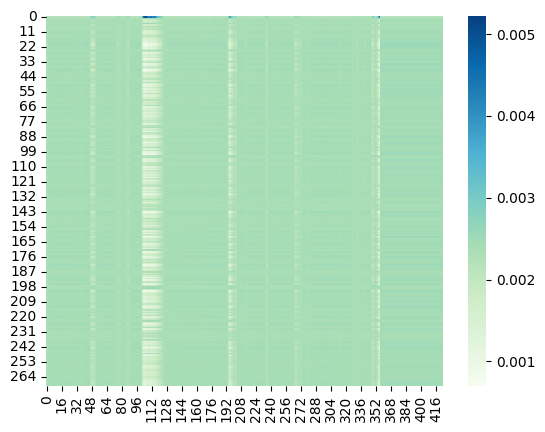


Epoch: 14/80


Val:   3%|▎         | 1/33 [00:05<02:56,  5.52s/it, dist=476.0333]

Ground Truth :  ON ALL SIDES WERE TO BE SEEN WHOLE SCHOOLS OF WHALES AND SHARKS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:   6%|▌         | 2/33 [00:10<02:38,  5.10s/it, dist=476.2167]

Ground Truth :  HE MUST HAVE DRAWN HIS GUN BECAUSE THE INTRUDER SAID QUICKLY PUT THAT AWAY YOU'RE BEING A FOOL OUT
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:   9%|▉         | 3/33 [00:15<02:27,  4.93s/it, dist=477.2600]

Ground Truth :  I WAS HOPING THAT IF THE PAPER ON WHICH HE WROTE WAS THIN SOME TRACE OF IT MIGHT COME THROUGH UPON THIS POLISHED SURFACE NO I SEE NOTHING
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  12%|█▏        | 4/33 [00:20<02:23,  4.94s/it, dist=477.2867]

Ground Truth :  I SAY SIR HARRY THE LITTLE GIRL'S GOING FAMOUSLY TO NIGHT ISN'T SHE
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  15%|█▌        | 5/33 [00:24<02:18,  4.93s/it, dist=477.9320]

Ground Truth :  HE LAID DOWN HIS VIOLIN AND SEATED HIMSELF WHERE MARY TOLD HIM IN HER FATHER'S ARM CHAIR BY THE FIRE
Prediction   :  THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AN


Val:  18%|█▊        | 6/33 [00:29<02:13,  4.95s/it, dist=476.8133]

Ground Truth :  SOMEHOW OF ALL THE DAYS WHEN THE HOME FEELING WAS THE STRONGEST THIS DAY IT SEEMED AS IF SHE COULD BEAR IT NO LONGER
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  21%|██        | 7/33 [00:34<02:07,  4.91s/it, dist=477.0838]

Ground Truth :  I CAN SEE THEM NOW EXACTLY AS THEY LOOKED WORKING ABOUT THE TABLE IN THE LAMPLIGHT JAKE WITH HIS HEAVY FEATURES SO RUDELY MOULDED THAT HIS FACE SEEMED SOMEHOW UNFINISHED OTTO WITH HIS HALF EAR AND THE SAVAGE SCAR THAT MADE HIS UPPER LIP CURL SO FEROCIOUSLY UNDER HIS TWISTED MUSTACHE
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  24%|██▍       | 8/33 [00:39<02:01,  4.88s/it, dist=476.9167]

Ground Truth :  I DON'T BELIEVE ANN KNEW ANY MAGIC OR SHE'D HAVE WORKED IT BEFORE
Prediction   :  THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AN


Val:  27%|██▋       | 9/33 [00:44<01:56,  4.85s/it, dist=477.1585]

Ground Truth :  WHAT COULD BE THE OBJECT
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  30%|███       | 10/33 [00:49<01:51,  4.84s/it, dist=477.1940]

Ground Truth :  ILLUSTRATION PESTLE AND MORTAR
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  33%|███▎      | 11/33 [00:53<01:45,  4.81s/it, dist=477.7006]

Ground Truth :  PERHAPS YOU COULD PUT ON YOUR COAT AND WALK OUT WITH ME FOR A FEW MINUTES SAID TREVELYAN
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  36%|███▋      | 12/33 [00:58<01:41,  4.86s/it, dist=477.3661]

Ground Truth :  WHAT ARE YOU TALKING ABOUT MAN
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  39%|███▉      | 13/33 [01:03<01:37,  4.86s/it, dist=477.3251]

Ground Truth :  HOW WE MUST SIMPLIFY
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  42%|████▏     | 14/33 [01:08<01:32,  4.89s/it, dist=477.3643]

Ground Truth :  THE MEAL ENDED
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  45%|████▌     | 15/33 [01:13<01:28,  4.90s/it, dist=477.5191]

Ground Truth :  BUT JOHN THERE'S NO SOCIETY JUST ELEMENTARY WORK
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  48%|████▊     | 16/33 [01:18<01:23,  4.89s/it, dist=477.7425]

Ground Truth :  LET'S SEE ABOUT GETTING HELP FOR MISTER FABER
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  52%|█████▏    | 17/33 [01:23<01:18,  4.92s/it, dist=477.4824]

Ground Truth :  I MUST HAVE A TEASPOONFUL HE SAID TO ALLAY THE CRAVING
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  55%|█████▍    | 18/33 [01:28<01:14,  4.96s/it, dist=477.2719]

Ground Truth :  AND ALREADY THIS ASTOUNDING BLOW BEGINS TO TAKE ITS PLACE AMONG OTHER EVENTS AS A THING STRANGE AND TERRIBLE INDEED BUT RELATED TO ALL THE STRANGENESS AND MYSTERY OF LIFE PART OF THE UNIVERSAL MYSTERIES OF DESPAIR AND FUTILITY AND DEATH THAT HAVE TROUBLED MY CONSCIOUSNESS SINCE CHILDHOOD
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  58%|█████▊    | 19/33 [01:33<01:09,  4.95s/it, dist=477.0368]

Ground Truth :  CONSTANTINE EASILY BELIEVED THAT THE HERETICS WHO PRESUMED TO DISPUTE HIS OPINIONS OR TO OPPOSE HIS COMMANDS WERE GUILTY OF THE MOST ABSURD AND CRIMINAL OBSTINACY AND THAT A SEASONABLE APPLICATION OF MODERATE SEVERITIES MIGHT SAVE THOSE UNHAPPY MEN FROM THE DANGER OF AN EVERLASTING CONDEMNATION
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  61%|██████    | 20/33 [01:38<01:04,  4.96s/it, dist=476.8473]

Ground Truth :  HE MIGHT BE ENCHANTED BUT THAT WAS THE TALISMAN
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  64%|██████▎   | 21/33 [01:43<00:59,  4.96s/it, dist=476.8994]

Ground Truth :  I CANNOT THINK WHAT POSSESSES ME THAT I MUST ALWAYS BE WANTING TO COMFORT HIM WHEN HE'S DOWNCAST AND THAT I MUST GO MEDDLING WI HIM TO NIGHT WHEN SURE ENOUGH IT WAS HIS AUNT'S PLACE TO SPEAK TO HIM
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  67%|██████▋   | 22/33 [01:48<00:54,  4.99s/it, dist=476.6452]

Ground Truth :  THERE MESSRS JOHNSON AND HAMMER PUT INTO PRACTICE MANY OF THE IDEAS NOW STANDARD IN THE ART AND SECURED MUCH USEFUL DATA FOR THE WORK IN NEW YORK OF WHICH THE STORY HAS JUST BEEN TOLD
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  70%|██████▉   | 23/33 [01:53<00:49,  4.92s/it, dist=476.9151]

Ground Truth :  THEY SEEM VERY IGNORANT POOR THINGS SAID ANOTHER IN REPLY
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  73%|███████▎  | 24/33 [01:58<00:43,  4.89s/it, dist=476.9222]

Ground Truth :  ONLY I'LL DO IT MORE COMPLETELY
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  76%|███████▌  | 25/33 [02:02<00:38,  4.86s/it, dist=476.9195]

Ground Truth :  SHE WAS YOUNG UNTRIED NERVOUS IT WAS A VISION OF SERIOUS DUTIES AND LITTLE COMPANY OF REALLY GREAT LONELINESS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  79%|███████▉  | 26/33 [02:07<00:33,  4.83s/it, dist=477.0518]

Ground Truth :  HIS PROGRESS FROM INFANCY TO YOUTH AND MANHOOD WAS MARKED BY A REGULAR INCREASE IN STATURE AND WISDOM AND AFTER A PAINFUL AGONY OF MIND AND BODY HE EXPIRED ON THE CROSS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  82%|████████▏ | 27/33 [02:12<00:29,  4.84s/it, dist=477.1454]

Ground Truth :  HERE WE BE THAT MIGHT BE SO
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  85%|████████▍ | 28/33 [02:17<00:24,  4.88s/it, dist=476.9910]

Ground Truth :  AND EMIL MOWED HIS WAY SLOWLY DOWN TOWARD THE CHERRY TREES
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  88%|████████▊ | 29/33 [02:22<00:19,  4.88s/it, dist=476.9936]

Ground Truth :  AND I SHE WHISPERED I FELT THAT YOU WERE FEELING THAT
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  91%|█████████ | 30/33 [02:27<00:14,  4.91s/it, dist=476.9151]

Ground Truth :  AH BUT THESE HENS ANSWERED THE YOUNG MAN THESE HENS OF ARISTOCRATIC LINEAGE WOULD SCORN TO UNDERSTAND THE VULGAR LANGUAGE OF A BARN YARD FOWL
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  94%|█████████▍| 31/33 [02:32<00:09,  4.89s/it, dist=477.1452]

Ground Truth :  I NEVER SEE LOU'S SCYTHE OVER HERE
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  97%|█████████▋| 32/33 [02:37<00:04,  4.93s/it, dist=476.9985]

Ground Truth :  HE IS OLD AS WELL AS POOR SHE SAID
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Ground Truth :  MODE LET THE TARTARIC ACID AND SALT BE REDUCED TO THE FINEST POSSIBLE POWDER THEN MIX THEM WELL WITH THE FLOUR
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE
	Train Loss 1.2917	 Learning Rate 0.0009980
	Val Dist 476.8796	
	Teacher Forcing Ratio 1	


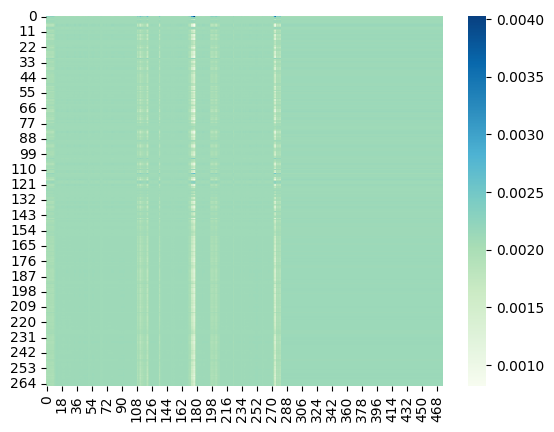

Saved best model

Epoch: 15/80


Val:   3%|▎         | 1/33 [00:05<03:01,  5.67s/it, dist=481.0200]

Ground Truth :  THE LEADEN HAIL STORM SWEPT THEM OFF THE FIELD THEY FELL BACK AND RE FORMED
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:   6%|▌         | 2/33 [00:10<02:40,  5.18s/it, dist=482.5900]

Ground Truth :  I AM FREE TO ADMIT THAT I AM HUNGRY TOO
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:   9%|▉         | 3/33 [00:15<02:32,  5.07s/it, dist=482.9889]

Ground Truth :  MISTER SHIMERDA WENT WITH HIM
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  12%|█▏        | 4/33 [00:20<02:25,  5.02s/it, dist=483.2167]

Ground Truth :  WHEN HE REACHED THE SUBURBS THE LIGHT OF HOMES WAS SHINING THROUGH CURTAINS OF ALL COLORS
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  15%|█▌        | 5/33 [00:25<02:18,  4.96s/it, dist=483.8053]

Ground Truth :  THIS HAD SOME EFFECT IN CALMING HIM
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  18%|█▊        | 6/33 [00:30<02:13,  4.96s/it, dist=484.2400]

Ground Truth :  THE PLAYWRIGHT GAVE MAINHALL A CURIOUS LOOK OUT OF HIS DEEP SET FADED EYES AND MADE A WRY FACE
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  21%|██        | 7/33 [00:35<02:09,  4.98s/it, dist=483.7286]

Ground Truth :  AND ALL WORK HAD CEASED WITH HIM
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  24%|██▍       | 8/33 [00:40<02:04,  4.97s/it, dist=483.2592]

Ground Truth :  AN AMERICAN INSTEAD OF GOING IN A LEISURE HOUR TO DANCE MERRILY AT SOME PLACE OF PUBLIC RESORT AS THE FELLOWS OF HIS CALLING CONTINUE TO DO THROUGHOUT THE GREATER PART OF EUROPE SHUTS HIMSELF UP AT HOME TO DRINK
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  27%|██▋       | 9/33 [00:45<01:59,  4.98s/it, dist=483.0319]

Ground Truth :  SHE WANTED A GLANCE OF THE NEW BOOKS AND PERIODICALS AND TALK OF GREAT PHILANTHROPIES AND REFORMS
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  30%|███       | 10/33 [00:50<01:53,  4.95s/it, dist=482.8940]

Ground Truth :  THIS IS VERY GOOD OF YOU HE BEGAN GLANCING DOWN AT THE AGED DETECTIVE'S BUNDLED UP LEGS AND GENTLY PUSHING A CHAIR TOWARDS HIM
Prediction   :  THE SAME TIME THE SAME TIME THE SAME TIME THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF 


Val:  33%|███▎      | 11/33 [00:54<01:47,  4.91s/it, dist=483.2012]

Ground Truth :  THE WANDERING SINGER APPROACHES THEM WITH HIS LUTE
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  36%|███▋      | 12/33 [00:59<01:43,  4.94s/it, dist=483.3828]

Ground Truth :  I NEVER KNOW YOU WAS SO BRAVE JIM SHE WENT ON COMFORTINGLY
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  39%|███▉      | 13/33 [01:04<01:38,  4.90s/it, dist=483.8410]

Ground Truth :  IT WAS GWYNPLAINE'S LAUGH WHICH CREATED THE LAUGHTER OF OTHERS YET HE DID NOT LAUGH HIMSELF
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  42%|████▏     | 14/33 [01:09<01:33,  4.92s/it, dist=484.0805]

Ground Truth :  RANDAL PASSED THIS OVER WITHOUT NOTICE
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  45%|████▌     | 15/33 [01:14<01:28,  4.91s/it, dist=484.1551]

Ground Truth :  THOSE HUGE CREATURES ATTACKED EACH OTHER WITH THE GREATEST ANIMOSITY
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  48%|████▊     | 16/33 [01:19<01:22,  4.87s/it, dist=484.5154]

Ground Truth :  SEE SAID UNCAS POINTING NORTH AND SOUTH AT THE EVIDENT MARKS OF THE BROAD TRAIL ON EITHER SIDE OF HIM THE DARK HAIR HAS GONE TOWARD THE FOREST
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET 


Val:  52%|█████▏    | 17/33 [01:24<01:18,  4.91s/it, dist=484.4212]

Ground Truth :  IT MUST BE AS WIDE AS THE MEDITERRANEAN OR THE ATLANTIC AND WHY NOT
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  55%|█████▍    | 18/33 [01:29<01:13,  4.89s/it, dist=484.4719]

Ground Truth :  THE PLACE SEEMED FRAGRANT WITH ALL THE RICHES OF GREEK THOUGHT AND SONG SINCE THE DAYS WHEN PTOLEMY PHILADELPHUS WALKED THERE WITH EUCLID AND THEOCRITUS CALLIMACHUS AND LYCOPHRON
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  58%|█████▊    | 19/33 [01:33<01:07,  4.83s/it, dist=485.0018]

Ground Truth :  NEAR THE FIRE AND THE ORNAMENTS FRED BROUGHT HOME FROM INDIA ON THE MANTEL BOARD
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  61%|██████    | 20/33 [01:38<01:03,  4.85s/it, dist=485.0163]

Ground Truth :  AND IF YOU HAVE ANY DESIRE TO SHORTEN THE JOURNEY AND PUT YOURSELF EASILY IN THE WAY OF SALVATION COME WITH ME AND I WILL SHOW YOU HOW TO BECOME A KNIGHT ERRANT A CALLING WHEREIN SO MANY HARDSHIPS AND MISHAPS ARE ENCOUNTERED THAT IF THEY BE TAKEN AS PENANCES THEY WILL LODGE YOU IN HEAVEN IN A TRICE
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  64%|██████▎   | 21/33 [01:43<00:57,  4.83s/it, dist=485.1705]

Ground Truth :  WHEREVER SHE PLEASES ONLY I CAN'T WALK FAR
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  67%|██████▋   | 22/33 [01:48<00:53,  4.87s/it, dist=484.9667]

Ground Truth :  THE FLOORS WERE COVERED WITH MATTING AND THE HALL LAID WITH A THIN RAG CARPET
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  70%|██████▉   | 23/33 [01:53<00:49,  4.92s/it, dist=484.7270]

Ground Truth :  IT WAS KARL YUNDT WHO WAS HEARD IMPLACABLE TO HIS LAST BREATH
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  73%|███████▎  | 24/33 [01:58<00:44,  4.89s/it, dist=484.8194]

Ground Truth :  MISSUS GRIFFIN HOWEVER EXPRESSED THE NEED FOR A LITTLE MORE LIGHT
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  76%|███████▌  | 25/33 [02:03<00:38,  4.85s/it, dist=484.9376]

Ground Truth :  IT WAS PLAIN THAT HIS CASTANET GIRL HIS MOTHER AND SISTER TOOK A PLEASURE IN CREDITING HER DAILY WITH SOME FRESH AND UNPLEASING INSTRUMENT COULD HAVE HAD NEITHER TASTE MONEY NOR HONESTY TO SUCH A POINT AS THIS
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  79%|███████▉  | 26/33 [02:07<00:33,  4.84s/it, dist=485.0315]

Ground Truth :  IN THE HALF LIGHT HE LOOKED ABOUT AT THE STALLS AND BOXES AND SMILED A LITTLE CONSCIOUSLY RECALLING WITH AMUSEMENT SIR HARRY'S JUDICIAL FROWN
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  82%|████████▏ | 27/33 [02:12<00:29,  4.86s/it, dist=485.0356]

Ground Truth :  HILDA SAT ON THE ARM OF IT AND PUT HER HANDS LIGHTLY ON HIS SHOULDERS
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  85%|████████▍ | 28/33 [02:17<00:24,  4.85s/it, dist=485.0460]

Ground Truth :  I MUST NOT CONCLUDE WITHOUT EXPRESSING MY MOST SINCERE THANKS TO MY CRITICS AND TO THE PUBLIC FOR THE LENIENCY AND CONSIDERATION WITH WHICH THEY HAVE TREATED MY ADVENTURES
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  88%|████████▊ | 29/33 [02:22<00:19,  4.82s/it, dist=485.1471]

Ground Truth :  IT WILL BE CLEAR TO YOU FROM WHAT I HAVE SAID THAT ONLY YOU COULD HAVE LET THIS YOUNG MAN OUT SINCE YOU WERE LEFT IN THE ROOM AND MUST HAVE LOCKED THE DOOR WHEN YOU WENT OUT
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  91%|█████████ | 30/33 [02:27<00:14,  4.85s/it, dist=485.1482]

Ground Truth :  WHAT HE SAID HE LOOKED WITH SO MUCH SINCERITY THAT HAD SHE BEEN BURNING WITH RAGE AT HIS LATE BEHAVIOUR SHE MUST HAVE FORGIVEN HIM FOR THE REGRET WHICH HE SO FORCIBLY EXPREST
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  94%|█████████▍| 31/33 [02:32<00:09,  4.87s/it, dist=485.2763]

Ground Truth :  MYSELF I ALWAYS KNEW SHE HAD IT IN HER
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val:  97%|█████████▋| 32/33 [02:37<00:04,  4.88s/it, dist=485.4333]

Ground Truth :  MARGOLOTTE HAD FIRST MADE THE GIRL'S FORM FROM THE PATCHWORK QUILT AND THEN SHE HAD DRESSED IT WITH A PATCHWORK SKIRT AND AN APRON WITH POCKETS IN IT USING THE SAME GAY MATERIAL THROUGHOUT
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


Val: 100%|██████████| 33/33 [02:38<00:00,  3.93s/it, dist=485.1914]

Ground Truth :  DELIGHTED TO SEE YOU MISTER MEEKIN
Prediction   :  AND THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME THE SAME TIME


	Train Loss 1.2852	 Learning Rate 0.0009955
	Val Dist 485.1914	
	Teacher Forcing Ratio 1	


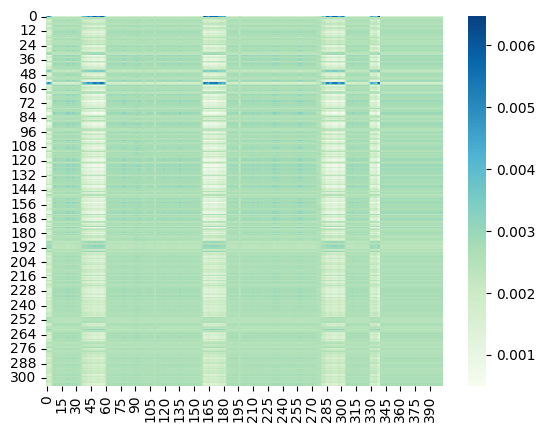


Epoch: 16/80


Val:   3%|▎         | 1/33 [00:05<02:53,  5.41s/it, dist=477.9800]

Ground Truth :  THEN WITHOUT FURTHER REMARK HE PUT HIS FINGER TO HIS LIPS FROWNED DARKLY AND DESCENDED INTO THE SMALL BOAT WHICH AWAITED US
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:   6%|▌         | 2/33 [00:10<02:36,  5.06s/it, dist=477.8233]

Ground Truth :  THE VERY EMPERORS HAD ARRAYED THEMSELVES ON HER SIDE
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:   9%|▉         | 3/33 [00:15<02:30,  5.03s/it, dist=476.0044]

Ground Truth :  MONEY IS FALSE AND LIGHT UNLESS IT BE BOUGHT BY A MAN'S OWN WORTHY QUALITIES AND BLOOD IS SUCH THAT ITS CORRUPT DISEASE AND IGNORANT PRETENCE ARE FOUL TO SEE
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  12%|█▏        | 4/33 [00:20<02:23,  4.96s/it, dist=477.8150]

Ground Truth :  SHE WAS A BEAUTIFUL GIRL OF ABOUT SEVENTEEN YEARS OF AGE NOT FAT LIKE ALL THE REST OF THE PINKIES BUT SLENDER AND WELL FORMED ACCORDING TO OUR OWN IDEAS OF BEAUTY
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  15%|█▌        | 5/33 [00:24<02:17,  4.93s/it, dist=477.5547]

Ground Truth :  NOW LET'S BE BRAVE AND ENJOY EVERY MINUTE OF IT
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  18%|█▊        | 6/33 [00:29<02:13,  4.94s/it, dist=477.0911]

Ground Truth :  THEN SHE SAW DAVID AND THE REGIMENT BECAME ONE MAN TO HER
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  21%|██        | 7/33 [00:34<02:07,  4.91s/it, dist=476.9486]

Ground Truth :  THE TWENTIES
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  24%|██▍       | 8/33 [00:39<02:02,  4.91s/it, dist=476.6233]

Ground Truth :  IN ARISTOCRACIES EVERY MAN HAS ONE SOLE OBJECT WHICH HE UNCEASINGLY PURSUES BUT AMONGST DEMOCRATIC NATIONS THE EXISTENCE OF MAN IS MORE COMPLEX THE SAME MIND WILL ALMOST ALWAYS EMBRACE SEVERAL OBJECTS AT THE SAME TIME AND THESE OBJECTS ARE FREQUENTLY WHOLLY FOREIGN TO EACH OTHER AS IT CANNOT KNOW THEM ALL WELL THE MIND IS READILY SATISFIED WITH IMPERFECT NOTIONS OF EACH
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  27%|██▋       | 9/33 [00:44<01:57,  4.92s/it, dist=477.3304]

Ground Truth :  THEY OUGHT TO BE TAKEN UP IN THE AUTUMN AND WHEN DRIED IN THE HOUSE WILL KEEP TILL SPRING
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  30%|███       | 10/33 [00:49<01:53,  4.95s/it, dist=477.2600]

Ground Truth :  BUT IF THE EMPERORS HAD BECOME CHRISTIAN THE EMPIRE HAD NOT
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  33%|███▎      | 11/33 [00:54<01:48,  4.94s/it, dist=477.4218]

Ground Truth :  WHEN DONE TAKE THE MEAT OUT OF THE SAUCE
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  36%|███▋      | 12/33 [00:59<01:43,  4.91s/it, dist=477.5811]

Ground Truth :  AT THAT HOUR THERE WAS NO ONE IN THE FAIR GROUND EXCEPT PERHAPS SOME REELING DRUNKARD MAKING STAGGERING SHADOWS IN DARK CORNERS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  39%|███▉      | 13/33 [01:04<01:38,  4.91s/it, dist=477.6959]

Ground Truth :  I WISH WE HAD NOT LEFT SO SOON
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  42%|████▏     | 14/33 [01:09<01:32,  4.87s/it, dist=477.7695]

Ground Truth :  ONLY THERE ARE TWO SORTS OF CLOUD AND FIRE
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  45%|████▌     | 15/33 [01:14<01:28,  4.90s/it, dist=477.3164]

Ground Truth :  WELL THEN LAST HERE IS TURNER'S GREEK SCHOOL OF THE HIGHEST CLASS AND YOU DEFINE HIS ART ABSOLUTELY AS FIRST THE DISPLAYING INTENSELY AND WITH THE STERNEST INTELLECT OF NATURAL FORM AS IT IS AND THEN THE ENVELOPMENT OF IT WITH CLOUD AND FIRE
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  48%|████▊     | 16/33 [01:18<01:23,  4.89s/it, dist=477.4783]

Ground Truth :  I'LL WAIT HERE TILL YOU'RE READY EXPLAIN YOURSELF TO THE LADY TELL HER I'M AN OLD AND RHEUMATIC INVALID WHO HAS BEEN USED TO ASKING HIS OWN QUESTIONS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  52%|█████▏    | 17/33 [01:23<01:17,  4.87s/it, dist=477.5239]

Ground Truth :  BUT HE STAYED LONG THERE AND AT LAST HIS STURDY FRAME SHOOK WITH HIS STRONG AGONY
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  55%|█████▍    | 18/33 [01:28<01:12,  4.84s/it, dist=477.6315]

Ground Truth :  THE MEAL ENDED
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  58%|█████▊    | 19/33 [01:33<01:07,  4.85s/it, dist=477.5853]

Ground Truth :  THE LIFE BLOOD OF RHYTHMICAL TRANSLATION IS THIS COMMANDMENT THAT A GOOD POEM SHALL NOT BE TURNED INTO A BAD ONE
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  61%|██████    | 20/33 [01:38<01:03,  4.91s/it, dist=477.3723]

Ground Truth :  THE WHITE DOUBLE ROSEBUSH HAD EVIDENTLY BEEN PROPPED UP ANEW AGAINST THE HOUSE SINCE THE COMMENCEMENT OF THE SEASON AND A PEAR TREE AND THREE DAMSON TREES WHICH EXCEPT A ROW OF CURRANT BUSHES CONSTITUTED THE ONLY VARIETIES OF FRUIT BORE MARKS OF THE RECENT AMPUTATION OF SEVERAL SUPERFLUOUS OR DEFECTIVE LIMBS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  64%|██████▎   | 21/33 [01:43<00:58,  4.91s/it, dist=477.5956]

Ground Truth :  I FELT QUITE LIVELY MYSELF AS I MINGLED WITH THE CHRISTMAS CROWD LOOKING FOR THINGS WHICH MIGHT NOT TURN OUT TO BE ABSOLUTELY PREPOSTEROUS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  67%|██████▋   | 22/33 [01:48<00:54,  4.95s/it, dist=477.2945]

Ground Truth :  ALL HIS EMOTIONS WHATEVER THEY MIGHT HAVE BEEN AUGMENTED HIS STRANGE FACE OF JOY OR TO SPEAK MORE CORRECTLY AGGRAVATED IT
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  70%|██████▉   | 23/33 [01:53<00:49,  4.90s/it, dist=477.3496]

Ground Truth :  ONE OF NEWSOME'S CHIEF PLEASURES IN LIFE HAD BEEN THE EDUCATING OF HIS WOODLAND BRIDE AND IT WAS THE AMBITION OF BOTH THAT THE LITTLE MINNETAKI AND HER BROTHER BE REARED IN THE WAYS OF WHITE CHILDREN
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  73%|███████▎  | 24/33 [01:58<00:44,  4.93s/it, dist=477.2017]

Ground Truth :  AY SHE ANSWERED HALF BITTERLY AND WOULD THAT WE COULD LIVE WITHOUT FOOD AND IMITATE PERFECTLY THE IMMORTAL GODS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  76%|███████▌  | 25/33 [02:02<00:39,  4.89s/it, dist=477.3299]

Ground Truth :  ANYHOW WE WANT TO HELP GOT A JOB FOR US
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  79%|███████▉  | 26/33 [02:07<00:34,  4.88s/it, dist=477.1897]

Ground Truth :  THEN BACK I TURNED MY FACE TO THOSE HIGH THINGS WHICH MOVED THEMSELVES TOWARDS US SO SEDATELY THEY HAD BEEN DISTANCED BY NEW WEDDED BRIDES
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  82%|████████▏ | 27/33 [02:12<00:29,  4.86s/it, dist=477.2047]

Ground Truth :  THE SICK MAN RAGED AND SHOOK HIS FIST
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  85%|████████▍ | 28/33 [02:17<00:24,  4.85s/it, dist=477.2590]

Ground Truth :  SOMETIMES SCHOOLS DO LET KIDS TAKE A LOT OF SOFT COURSES AND THEN THEY'RE OUT ON A LIMB LATER HUH
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  88%|████████▊ | 29/33 [02:22<00:19,  4.85s/it, dist=477.1492]

Ground Truth :  ARCTIC BEAUTY AND DESOLATION WITH THEIR BLESSINGS AND DANGERS ALL MAY BE FOUND HERE TO TEST THE ENDURANCE AND SKILL OF ADVENTUROUS CLIMBERS BUT FAR BETTER THAN CLIMBING THE MOUNTAIN IS GOING AROUND ITS WARM FERTILE BASE ENJOYING ITS BOUNTIES LIKE A BEE CIRCLING AROUND A BANK OF FLOWERS
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  91%|█████████ | 30/33 [02:27<00:14,  4.89s/it, dist=477.1571]

Ground Truth :  WHY DID HE GIVE THAT SO ODD A SHAPE OR SO STRANGE A COVERING
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  94%|█████████▍| 31/33 [02:32<00:09,  4.86s/it, dist=477.1559]

Ground Truth :  AH BUT THESE HENS ANSWERED THE YOUNG MAN THESE HENS OF ARISTOCRATIC LINEAGE WOULD SCORN TO UNDERSTAND THE VULGAR LANGUAGE OF A BARN YARD FOWL
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Val:  97%|█████████▋| 32/33 [02:37<00:04,  4.90s/it, dist=476.9727]

Ground Truth :  IT WAS YOUTH AND POVERTY AND PROXIMITY AND EVERYTHING WAS YOUNG AND KINDLY
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE


Ground Truth :  TO MAKE HOT BUTTERED TOAST SEVENTEEN TWENTY SIX
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREE
	Train Loss 1.2794	 Learning Rate 0.0009920
	Val Dist 476.9410	
	Teacher Forcing Ratio 1	


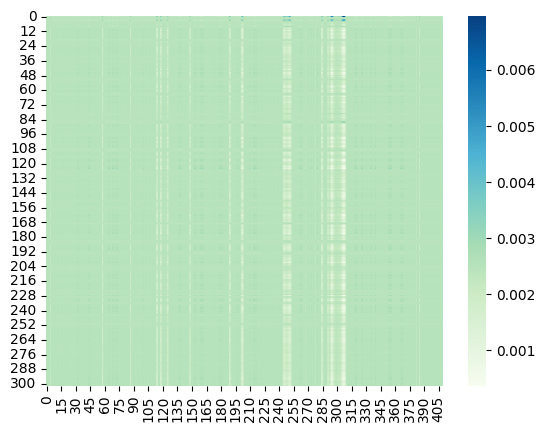


Epoch: 17/80


Val:   3%|▎         | 1/33 [00:05<02:55,  5.47s/it, dist=470.6333]

Ground Truth :  THE CARAVAN WAS DIVIDED INTO THREE COMPARTMENTS PARTITIONED FROM EACH OTHER
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:   6%|▌         | 2/33 [00:10<02:41,  5.20s/it, dist=474.4167]

Ground Truth :  AS SOON AS THESE DISPOSITIONS WERE MADE THE SCOUT TURNED TO DAVID AND GAVE HIM HIS PARTING INSTRUCTIONS
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:   9%|▉         | 3/33 [00:15<02:31,  5.04s/it, dist=474.6378]

Ground Truth :  THE VIOLINS AND HAUT BOYS PLAYED OLD BUT EXCELLENT PIECES OF MUSIC AND AFTER SUPPER TO LOSE NO TIME THE GRAND ALMONER MARRIED THE ROYAL LOVERS IN THE CHAPEL OF THE CASTLE
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  12%|█▏        | 4/33 [00:20<02:24,  4.99s/it, dist=476.1817]

Ground Truth :  THEY SAT DOWN AND LISTENED IN SILENCE
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  15%|█▌        | 5/33 [00:25<02:18,  4.93s/it, dist=476.4507]

Ground Truth :  BUT AS TO GETTING ALONGSIDE THE DUNCAN GOD FORBID
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  18%|█▊        | 6/33 [00:30<02:13,  4.94s/it, dist=476.9589]

Ground Truth :  TO MORROW IS THE EXAMINATION
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  21%|██        | 7/33 [00:35<02:08,  4.95s/it, dist=476.9686]

Ground Truth :  PETER TOLD HIS TROUBLES TO MISTER SHIMERDA HE WAS UNABLE TO MEET A NOTE WHICH FELL DUE ON THE FIRST OF NOVEMBER HAD TO PAY AN EXORBITANT BONUS ON RENEWING IT AND TO GIVE A MORTGAGE ON HIS PIGS AND HORSES AND EVEN HIS MILK COW
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  24%|██▍       | 8/33 [00:40<02:04,  4.98s/it, dist=475.8758]

Ground Truth :  THE HON CHARLES SMITH MISS SARAH'S BROTHER WAS WALKING SWIFTLY UPTOWN FROM MISTER EASTERLY'S WALL STREET OFFICE AND HIS FACE WAS PALE
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  27%|██▋       | 9/33 [00:44<01:58,  4.95s/it, dist=476.3867]

Ground Truth :  MISSUS BOZZLE WAS DISPOSED TO THINK THAT LADIES OF QUALITY AMONG WHOM MADAME T WAS ENTITLED IN HER ESTIMATION TO TAKE RANK WERE SELDOM BETTER THAN THEY OUGHT TO BE AND SHE WAS QUITE WILLING THAT HER HUSBAND SHOULD EARN HIS BREAD BY WATCHING THE LADY OR THE LADY'S LOVER
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  30%|███       | 10/33 [00:49<01:53,  4.93s/it, dist=476.3993]

Ground Truth :  A MAN WAS LOOKING IN FROM THE CORRIDOR BEHIND AT THE FOUR PERSONS WE WERE JUST DISCUSSING
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  33%|███▎      | 11/33 [00:54<01:48,  4.94s/it, dist=476.8212]

Ground Truth :  AT BEST THEY CAN ONLY INTERPRET THE MIND OF THE PROPHET AND CAN HAVE NO OBJECTIVE VALUE
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  36%|███▋      | 12/33 [00:59<01:44,  4.95s/it, dist=476.4361]

Ground Truth :  OLD DAYS DON'T RETURN FOR THE ASKING
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  39%|███▉      | 13/33 [01:04<01:38,  4.93s/it, dist=476.5646]

Ground Truth :  THERE WAS SOMETHING OF KEEN PRACTICAL SHREWDNESS ABOUT HER WHICH CONTRASTED VERY BEWITCHINGLY WITH THE SIMPLE FOOLISH UNWORLDLY IDEAS SHE HAD PICKED UP FROM THE ROMANCES WHICH MISS SIMMONDS YOUNG LADIES WERE IN THE HABIT OF RECOMMENDING TO EACH OTHER YES
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  42%|████▏     | 14/33 [01:09<01:33,  4.93s/it, dist=476.2181]

Ground Truth :  SIR HARRY TOWNE BOWED AND SAID THAT HE HAD MET MISTER ALEXANDER AND HIS WIFE IN TOKYO
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  45%|████▌     | 15/33 [01:14<01:29,  4.95s/it, dist=476.2218]

Ground Truth :  POP IT'S A COURSE
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  48%|████▊     | 16/33 [01:19<01:24,  4.96s/it, dist=476.2512]

Ground Truth :  THOSE PRETTY WRONGS THAT LIBERTY COMMITS WHEN I AM SOMETIME ABSENT FROM THY HEART THY BEAUTY AND THY YEARS FULL WELL BEFITS FOR STILL TEMPTATION FOLLOWS WHERE THOU ART
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET


Val:  52%|█████▏    | 17/33 [01:24<01:18,  4.92s/it, dist=476.4039]

Ground Truth :  IN A FEW HOURS THE EXAMINATION WOULD COMMENCE AND HE WAS STILL IN THE DILEMMA BETWEEN MAKING THE FACTS PUBLIC AND ALLOWING THE CULPRIT TO COMPETE FOR THE VALUABLE SCHOLARSHIP
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  55%|█████▍    | 18/33 [01:29<01:13,  4.91s/it, dist=476.3078]

Ground Truth :  THERE WAS NO MAN SIR
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  58%|█████▊    | 19/33 [01:34<01:09,  4.94s/it, dist=476.2000]

Ground Truth :  AT THE SOLEMN HOUR OF SUNRISE OR SUNSET HE TOOK UP HIS POSITION OVERLOOKING THE GLORIES OF EARTH AND FACING THE GREAT MYSTERY AND THERE HE REMAINED NAKED ERECT SILENT AND MOTIONLESS EXPOSED TO THE ELEMENTS AND FORCES OF HIS ARMING FOR A NIGHT AND A DAY TO TWO DAYS AND NIGHTS BUT RARELY LONGER
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET


Val:  61%|██████    | 20/33 [01:39<01:04,  4.93s/it, dist=476.3483]

Ground Truth :  BUT THE PREVAILING DOCTRINE OF THE ETERNITY AND INHERENT PRAVITY OF MATTER INFECTED THE PRIMITIVE CHURCHES OF THE EAST
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  64%|██████▎   | 21/33 [01:44<00:59,  4.97s/it, dist=476.2149]

Ground Truth :  THIS ANNOUNCEMENT FILLED THE BOYS WITH EXCITEMENT
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  67%|██████▋   | 22/33 [01:49<00:54,  4.98s/it, dist=476.0494]

Ground Truth :  I'LL DO ANYTHING YOU WISH ME TO BARTLEY SHE SAID TREMULOUSLY
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  70%|██████▉   | 23/33 [01:54<00:49,  4.98s/it, dist=475.9496]

Ground Truth :  WE SUFFER STIFLING PAINS
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  73%|███████▎  | 24/33 [01:59<00:44,  4.95s/it, dist=476.2042]

Ground Truth :  POETRY NOT BEING AN EXACT SCIENCE LITERALITY OF RENDERING IS ALTOGETHER SECONDARY TO THIS CHIEF LAW
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  76%|███████▌  | 25/33 [02:04<00:39,  4.94s/it, dist=476.3080]

Ground Truth :  YOU KNOW I'D GET DRAFTED IN A YEAR OR TWO ANYWAY
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.92s/it, dist=476.4190]

Ground Truth :  ALL DISCARDED PORTIONS OF THE HUMAN BODY STILL REMAIN PART OF IT ATTACHED TO IT BY INTANGIBLE CONNECTIONS
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  82%|████████▏ | 27/33 [02:13<00:29,  4.94s/it, dist=476.3395]

Ground Truth :  I DON'T ANTICIPATE
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  85%|████████▍ | 28/33 [02:18<00:24,  4.91s/it, dist=476.3643]

Ground Truth :  IT IS NONSENSE SAID PHOEBE A LITTLE IMPATIENTLY FOR US TO TALK ABOUT A PICTURE WHICH YOU HAVE NEVER SEEN
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  88%|████████▊ | 29/33 [02:23<00:19,  4.94s/it, dist=476.3161]

Ground Truth :  WHO LIVES HERE ARE THE PEOPLE MAD
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  91%|█████████ | 30/33 [02:28<00:14,  4.95s/it, dist=476.3220]

Ground Truth :  YE KEEP YOUR WATCH IN THE ETERNAL DAY SO THAT NOR NIGHT NOR SLEEP CAN STEAL FROM YOU ONE STEP THE AGES MAKE UPON THEIR PATH
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  94%|█████████▍| 31/33 [02:33<00:09,  4.93s/it, dist=476.2389]

Ground Truth :  LOVE BETWEEN MAN AND WOMAN IS FOUNDED ON THE MATING INSTINCT AND IS NOT FREE FROM DESIRE AND SELF SEEKING
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Val:  97%|█████████▋| 32/33 [02:38<00:04,  4.93s/it, dist=476.2540]

Ground Truth :  THERE WAS NOTHING SAID ABOUT THE SORT OF ACCOMMODATION WHICH WOULD BE PROVIDED NOTHING ABOUT THE KIND OF ESTABLISHMENT WHICH WAS MAINTAINED OR THE TABLE WHICH WAS KEPT
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST


Ground Truth :  BUT CAN HE UNDERSTAND YOU YES
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET OF THE STREET AND THE STREET OF THE STREET WAS A ST
	Train Loss 1.2739	 Learning Rate 0.0009875
	Val Dist 476.1849	
	Teacher Forcing Ratio 1	


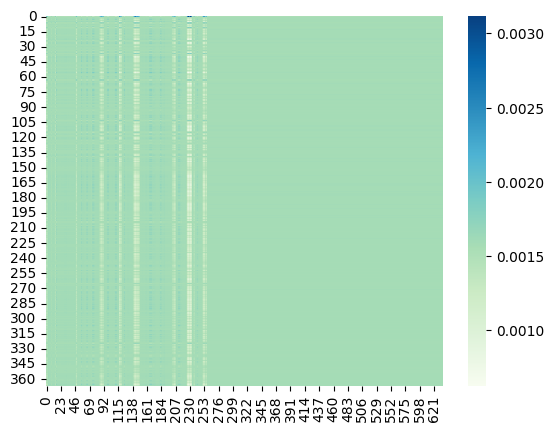

Saved best model

Epoch: 18/80


Val:   3%|▎         | 1/33 [00:05<02:55,  5.49s/it, dist=489.3933]

Ground Truth :  BY HIS DEFAULT SHORT WHILE HE SOJOURNED HERE BY HIS DEFAULT TO WEEPING AND TO TOIL HE CHANGED HIS INNOCENT LAUGHTER AND SWEET PLAY
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:   6%|▌         | 2/33 [00:10<02:40,  5.19s/it, dist=486.1700]

Ground Truth :  WHAT WILL THE MORAL PHILOSOPHERS WHO APPEAR AT THIS TIME HAVE TO PREACH
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:   9%|▉         | 3/33 [00:15<02:29,  5.00s/it, dist=486.5489]

Ground Truth :  STRAIN AND BOTTLE AND PUT IN ICE BOX SHAKE BEFORE USING EACH TIME
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  12%|█▏        | 4/33 [00:20<02:22,  4.91s/it, dist=486.2317]

Ground Truth :  YOU SEE PAPA'S SO VERY RICH AND AT HOME THEY EXPECT ME TO TO GET ACQUAINTED WITH DUKES AND THINGS AND SHE STOPPED
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  15%|█▌        | 5/33 [00:24<02:17,  4.90s/it, dist=485.1467]

Ground Truth :  THE CHILD HAD A NATIVE GRACE WHICH DOES NOT INVARIABLY CO EXIST WITH FAULTLESS BEAUTY ITS ATTIRE HOWEVER SIMPLE ALWAYS IMPRESSED THE BEHOLDER AS IF IT WERE THE VERY GARB THAT PRECISELY BECAME IT BEST
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  18%|█▊        | 6/33 [00:29<02:12,  4.91s/it, dist=485.6056]

Ground Truth :  I GAVE HIM A LITTLE BRANDY AND LEFT HIM COLLAPSED IN A CHAIR WHILE I MADE A MOST CAREFUL EXAMINATION OF THE ROOM
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  21%|██        | 7/33 [00:34<02:06,  4.87s/it, dist=486.2352]

Ground Truth :  NO THANK YOU I'LL JUST LOOK AT THE WHELPS AND LEAVE A MESSAGE ABOUT THEM WITH YOUR SHEPHERD
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  24%|██▍       | 8/33 [00:39<02:01,  4.88s/it, dist=486.4583]

Ground Truth :  BUT PUT IT ON THE TABLE IN THE CORNER OF THE PASSAGE
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  27%|██▋       | 9/33 [00:44<01:58,  4.94s/it, dist=486.1378]

Ground Truth :  HE STOOD A MOMENT BEWILDERED THEN TURNED AND RUSHED UPON THE ISLAND A GREAT SHEET OF DAZZLING SUNLIGHT SWEPT THE PLACE AND BENEATH LAY A MIGHTY MASS OF OLIVE GREEN THICK TALL WET AND WILLOWY
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  30%|███       | 10/33 [00:49<01:53,  4.94s/it, dist=486.5013]

Ground Truth :  IN JAMAICA IT FLOWERS ABOUT AUGUST OR SEPTEMBER FADING ABOUT THE END OF THE YEAR
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  33%|███▎      | 11/33 [00:54<01:49,  4.96s/it, dist=486.1782]

Ground Truth :  ALSO IN ALL LOVES AND FRIENDSHIPS ONE HAS THE EXPERIENCE THAT NOTHING OF THE KIND CONTINUES WHEN THE DISCOVERY HAS BEEN MADE THAT IN USING THE SAME WORDS ONE OF THE TWO PARTIES HAS FEELINGS THOUGHTS INTUITIONS WISHES OR FEARS DIFFERENT FROM THOSE OF THE OTHER
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  36%|███▋      | 12/33 [00:59<01:43,  4.93s/it, dist=486.4767]

Ground Truth :  I LOOK AT MY WATCH IT'S A QUARTER TO ELEVEN
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  39%|███▉      | 13/33 [01:04<01:37,  4.89s/it, dist=486.3477]

Ground Truth :  WE'VE GOT A HARD DRIVE BEFORE US AND EVERY MAN MUST BE FIT AS A FIDDLE
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  42%|████▏     | 14/33 [01:09<01:33,  4.94s/it, dist=485.7700]

Ground Truth :  IN FACT HE IS QUITE SEVERE ON MISTER RUSKIN FOR NOT RECOGNISING THAT A PICTURE SHOULD DENOTE THE FRAILTY OF MAN AND REMARKS WITH PLEASING COURTESY AND FELICITOUS GRACE THAT MANY PHASES OF FEELING
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  45%|████▌     | 15/33 [01:14<01:28,  4.93s/it, dist=485.6098]

Ground Truth :  AFTER THE VERY FIRST
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  48%|████▊     | 16/33 [01:19<01:23,  4.91s/it, dist=485.5783]

Ground Truth :  THE SECOND BEGINS HERE AN ANGEL THE THIRD HERE DEAR SONG I KNOW
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  52%|█████▏    | 17/33 [01:23<01:17,  4.86s/it, dist=485.8314]

Ground Truth :  I EXPRESSED BY SIGNS MY ADMIRATION AND PLEASURE TO MY GUIDES AND THEY WERE GREATLY PLEASED
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  55%|█████▍    | 18/33 [01:28<01:12,  4.86s/it, dist=486.2804]

Ground Truth :  I DON'T THINK HIS GUN WAS LOADED THOUGH BECAUSE WE DID NOT HEAR THE BALL WHISTLE
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  58%|█████▊    | 19/33 [01:33<01:08,  4.90s/it, dist=486.2856]

Ground Truth :  NORTH KNEW WELL THAT HE WOULD NEVER DARE TO ATTEMPT ANY SUCH ACT OF VIOLENCE BUT THE INSULT STUNG HIM LIKE THE CUT OF A WHIP
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  61%|██████    | 20/33 [01:38<01:03,  4.92s/it, dist=486.0560]

Ground Truth :  GLORIA STANDISH WHO HAD DROPPED IN FOR LUNCH WAS ON THE MEZZANINE FAIRLY SCREAMING INTO A RADIOPHONE EXTENSION DOZEN AND A HALF OF THEM
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  64%|██████▎   | 21/33 [01:43<00:59,  4.94s/it, dist=485.9876]

Ground Truth :  FROM UNDER THE LINING HE NOW PRODUCED A COLLECTION OF BRILLIANTLY COLORED PAPER FIGURES SEVERAL INCHES HIGH AND STIFF ENOUGH TO STAND ALONE
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  67%|██████▋   | 22/33 [01:48<00:54,  4.94s/it, dist=486.2106]

Ground Truth :  OVER THE FIREPLACE THERE WAS A LARGE OLD FASHIONED GILT MIRROR
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  70%|██████▉   | 23/33 [01:53<00:49,  4.94s/it, dist=486.1354]

Ground Truth :  MEANWHILE TWO CHILDREN CAME TO BLESS THE HAPPY UNION OF NEWSOME AND HIS LOVELY INDIAN WIFE
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  73%|███████▎  | 24/33 [01:58<00:44,  4.93s/it, dist=485.9200]

Ground Truth :  HE BURIED HIS BISCUIT UNDER A LAYER OF JAM OVER WHICH HE SPREAD A THICK COATING OF HONEY
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  76%|███████▌  | 25/33 [02:03<00:39,  4.94s/it, dist=485.8024]

Ground Truth :  I CAN NO MORE HELP SPENDING MY LIFE IN TRYING TO DO WHAT I CAN FOR THE SOULS OF OTHERS THAN YOU COULD HELP RUNNING IF YOU HEARD LITTLE TOTTY CRYING AT THE OTHER END OF THE HOUSE THE VOICE WOULD GO TO YOUR HEART YOU WOULD THINK THE DEAR CHILD WAS IN TROUBLE OR IN DANGER AND YOU COULDN'T REST WITHOUT RUNNING TO HELP HER AND COMFORT HER
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.97s/it, dist=485.7477]

Ground Truth :  BUT AT THE URGENT ENTREATY OF THE PRINCESS OF KHOSALA WHO LOVED BHUNDA CHAND VAINLY HE GAVE HER A LOCK OF HIS LONG BLACK HAIR AS A TOKEN OF REMEMBRANCE
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  82%|████████▏ | 27/33 [02:13<00:29,  4.99s/it, dist=485.7012]

Ground Truth :  MY GRANDMOTHER ALWAYS SPOKE IN A VERY LOUD TONE TO FOREIGNERS AS IF THEY WERE DEAF
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  85%|████████▍ | 28/33 [02:18<00:24,  4.94s/it, dist=485.7410]

Ground Truth :  THE BOYS BELONG TO THE GENTLEMAN WHO IS A WIDOWER
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  88%|████████▊ | 29/33 [02:23<00:19,  4.92s/it, dist=485.6857]

Ground Truth :  I'LL TELL YOU WHAT IT IS B EXCLAIMED MISSUS BOZZLE IT'S MY BELIEF AS HE AIN'T QUITE RIGHT UP HERE AND MISSUS BOZZLE TOUCHED HER FOREHEAD
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  91%|█████████ | 30/33 [02:28<00:14,  4.93s/it, dist=485.6680]

Ground Truth :  HE DIVINED MY MOTIVE AND FIRED THE BALL MISSED ITS AIM
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  94%|█████████▍| 31/33 [02:33<00:09,  4.97s/it, dist=485.6168]

Ground Truth :  DOWN BELOW IN THE QUIET NARROW STREET MEASURED FOOTSTEPS APPROACHED THE HOUSE THEN DIED AWAY UNHURRIED AND FIRM AS IF THE PASSER BY HAD STARTED TO PACE OUT ALL ETERNITY FROM GAS LAMP TO GAS LAMP IN A NIGHT WITHOUT END AND THE DROWSY TICKING OF THE OLD CLOCK ON THE LANDING BECAME DISTINCTLY AUDIBLE IN THE BEDROOM
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Val:  97%|█████████▋| 32/33 [02:38<00:04,  4.98s/it, dist=485.6960]

Ground Truth :  GENERAL HALLECK IN SPEAKING OF THIS BATTLE SAID
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF


Ground Truth :  WHEN AT LAST I REACHED CROFTON MY JOURNEY'S END IT TURNED OUT THAT THE STATION STAFF CONSISTED OF A HALF WITTED INDIVIDUAL WHO WAS STATIONMASTER PORTER AND CLERK COMBINED AND A HULKING LAD WHO DID WHATEVER ELSE THERE WAS TO DO
Prediction   :  AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF
	Train Loss 1.2696	 Learning Rate 0.0009820
	Val Dist 485.8378	
	Teacher Forcing Ratio 1	


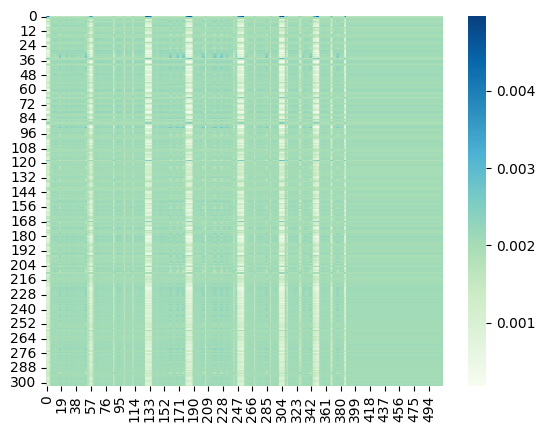


Epoch: 19/80


Val:   3%|▎         | 1/33 [00:05<02:56,  5.52s/it, dist=475.8067]

Ground Truth :  THERE APPEARED TO BE AN IMMEDIATE ASSOCIATION WITH THE DEATH TRAUMA AS IF THE TWO WERE INEXTRICABLY LINKED INTO ONE
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERA


Val:   6%|▌         | 2/33 [00:10<02:39,  5.16s/it, dist=477.0233]

Ground Truth :  I DIDN'T HAVE ANY FEARS IF I WORKED IT RIGHTLY SAID THE OLD GENTLEMAN COMPLACENTLY
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERATIONS OF THE STREET AND THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABL


Val:   9%|▉         | 3/33 [00:15<02:31,  5.05s/it, dist=475.5711]

Ground Truth :  HER THOUGHTS RAN ON JEM'S MANNER AND WORDS NOT BUT WHAT SHE HAD KNOWN THE TALE THEY TOLD FOR MANY A DAY BUT STILL SHE WISHED HE HAD NOT PUT IT SO PLAINLY
Prediction   :  AND THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE 


Val:  12%|█▏        | 4/33 [00:20<02:25,  5.03s/it, dist=476.7100]

Ground Truth :  HE BOWED AS THE WARNING BELL RANG AND MAINHALL WHISPERED YOU KNOW LORD WESTMERE OF COURSE THE STOOPED MAN WITH THE LONG GRAY MUSTACHE TALKING TO LADY DOWLE
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDER


Val:  15%|█▌        | 5/33 [00:25<02:18,  4.95s/it, dist=477.3640]

Ground Truth :  IF MISTER SOAMES SAW THEM THE GAME WAS UP
Prediction   :  THE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STR


Val:  18%|█▊        | 6/33 [00:30<02:13,  4.96s/it, dist=477.8233]

Ground Truth :  THE TRAIL HERE MUST BE A VERY BLIND ONE FOR THEM TO CALL HIM IN
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERATIONS OF THE STREET AND THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CO


Val:  21%|██        | 7/33 [00:35<02:08,  4.94s/it, dist=477.9229]

Ground Truth :  SO I BELIEVE I SHALL GO BACK AT LEAST FOR A WHILE AND SEE WHAT I CAN DO
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE AND THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSID


Val:  24%|██▍       | 8/33 [00:39<02:02,  4.91s/it, dist=478.2550]

Ground Truth :  THIS IS MORE ESPECIALLY THE CASE AMONGST THOSE FREE NATIONS WHICH FORM DEMOCRATIC COMMUNITIES
Prediction   :  THE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE S


Val:  27%|██▋       | 9/33 [00:44<01:57,  4.89s/it, dist=478.1689]

Ground Truth :  HE HAD LOVED HER EARNESTLY ENOUGH BUT NOW THAT THE POSSIBILITY OF LOSING HER STARED HIM IN THE FACE SHE SEEMED MUCH MORE ATTRACTIVE
Prediction   :  AND THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERATIONS OF THE STREET AND THE STRANGE CONSIDERA


Val:  30%|███       | 10/33 [00:49<01:52,  4.90s/it, dist=477.9107]

Ground Truth :  CLIMATE BAD EXAMPLE AND THE LUXURY OF POWER DEGRADED THEM IN ONE CENTURY INTO A RACE OF HELPLESS AND DEBAUCHED SLAVE HOLDERS DOOMED TO UTTER EXTERMINATION BEFORE THE SEMI GOTHIC ARMIES OF BELISARIUS AND WITH THEM VANISHED THE LAST CHANCE THAT THE GOTHIC RACES WOULD EXERCISE ON THE EASTERN WORLD THE SAME STERN YET WHOLESOME DISCIPLINE UNDER WHICH THE WESTERN HAD BEEN RESTORED TO LIFE
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE PART OF THE STREET AND THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE PART OF THE STREET AND THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE PART OF THE STREET AND THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE PART OF THE STREET AND THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE PART OF THE STREET AND THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE PART OF THE


Val:  33%|███▎      | 11/33 [00:54<01:47,  4.88s/it, dist=477.6636]

Ground Truth :  NO HARM WOULD HAVE BEEN DONE HAD IT NOT BEEN THAT AS HE PASSED YOUR DOOR HE PERCEIVED THE KEY WHICH HAD BEEN LEFT BY THE CARELESSNESS OF YOUR SERVANT
Prediction   :  AND THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANG


Val:  36%|███▋      | 12/33 [00:59<01:43,  4.92s/it, dist=477.5283]

Ground Truth :  AFTER THE CEREMONY AT THE CHURCH THE PARTY WENT TO A DINNER GIVEN BY THE PARENTS OF THE BRIDE
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE ST


Val:  39%|███▉      | 13/33 [01:04<01:38,  4.95s/it, dist=477.3349]

Ground Truth :  ILLUSTRATION BUNS
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANG


Val:  42%|████▏     | 14/33 [01:09<01:33,  4.94s/it, dist=477.7071]

Ground Truth :  HONEST GERMANS MEN WHO HAVE PLAYED HERE FOR YEARS
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANG


Val:  45%|████▌     | 15/33 [01:14<01:28,  4.92s/it, dist=477.4640]

Ground Truth :  I AM MY DEAR AND ALL STRANGERS ARE WELCOME TO MY HOME
Prediction   :  AND THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERA


Val:  48%|████▊     | 16/33 [01:19<01:23,  4.93s/it, dist=477.7021]

Ground Truth :  I HAD TO READ IT OVER CAREFULLY AS THE TEXT MUST BE ABSOLUTELY CORRECT
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERAB


Val:  52%|█████▏    | 17/33 [01:24<01:18,  4.91s/it, dist=477.6835]

Ground Truth :  THE STREETS WERE NARROW AND UNPAVED BUT VERY FAIRLY CLEAN
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE AND THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSID


Val:  55%|█████▍    | 18/33 [01:29<01:13,  4.93s/it, dist=477.7248]

Ground Truth :  HE HAD BEEN LATE HE HAD OFFERED NO EXCUSE NO EXPLANATION
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CON


Val:  58%|█████▊    | 19/33 [01:34<01:09,  4.93s/it, dist=477.7895]

Ground Truth :  OH WHAT SHALL WE DO FOR A HOME
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERAB


Val:  61%|██████    | 20/33 [01:38<01:03,  4.90s/it, dist=477.8680]

Ground Truth :  IT WAS PREPARED BY DRESSING IN THE FINEST CLOTHES TOGETHER WITH SOME PERSONAL POSSESSIONS AND ORNAMENTS WRAPPED IN SEVERAL ROBES AND FINALLY IN A SECURE COVERING OF RAW HIDE
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE 


Val:  64%|██████▎   | 21/33 [01:43<00:58,  4.88s/it, dist=477.9324]

Ground Truth :  SUCH IS THE SELFISHNESS OF HUMAN NATURE
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANG


Val:  67%|██████▋   | 22/33 [01:48<00:53,  4.87s/it, dist=478.0888]

Ground Truth :  HOW COMES IT THAT WHILE THE FIRST BEATITUDE PROMISES THE KINGDOM OF HEAVEN TO THE POOR OF HEART THE SECOND BEATITUDE PROMISES ALSO TO THE MEEK THAT THEY SHALL POSSESS THE LAND
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE AND THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSID


Val:  70%|██████▉   | 23/33 [01:53<00:49,  4.91s/it, dist=478.0513]

Ground Truth :  I DON'T BELIEVE ANN KNEW ANY MAGIC OR SHE'D HAVE WORKED IT BEFORE
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERATION OF THE STREET AND THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CON


Val:  73%|███████▎  | 24/33 [01:58<00:44,  4.89s/it, dist=478.0461]

Ground Truth :  SWEETWATER SOMEONE DREW THAT WEAPON OUT
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRAN


Val:  76%|███████▌  | 25/33 [02:03<00:39,  4.89s/it, dist=478.0443]

Ground Truth :  IT IS HARDIER THAN THE ORANGE AND AS ONE OF THE CITRON TRIBE WAS BROUGHT INTO EUROPE BY THE ARABIANS
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE 


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.92s/it, dist=477.9626]

Ground Truth :  THESE THEY SPREAD OUT ON THE GROUND USING BOOTS WRAPPED IN COATS FOR PILLOWS
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE


Val:  82%|████████▏ | 27/33 [02:13<00:29,  4.91s/it, dist=477.8291]

Ground Truth :  AND THE CRY ISSUED FROM HIS PORES IF WE MAY THUS SPEAK A CRY FRIGHTFUL IN ITS SILENCE
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANG


Val:  85%|████████▍ | 28/33 [02:18<00:24,  4.92s/it, dist=477.9714]

Ground Truth :  THE KING HAS FLED IN DISGRACE AND YOUR FRIENDS ARE ASKING FOR YOU
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE 


Val:  88%|████████▊ | 29/33 [02:22<00:19,  4.91s/it, dist=477.9163]

Ground Truth :  SO SLOW AND PATIENT IS THE PROCESS BY WHICH CHRISTIANITY INFUSES ITSELF INTO THE SOCIAL LIFE OF A CONVERTED PEOPLE
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANG


Val:  91%|█████████ | 30/33 [02:27<00:14,  4.94s/it, dist=477.9611]

Ground Truth :  YOU WILL FIND ME CONTINUALLY SPEAKING OF FOUR MEN TITIAN HOLBEIN TURNER AND TINTORET IN ALMOST THE SAME TERMS
Prediction   :  AND THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSID


Val:  94%|█████████▍| 31/33 [02:32<00:09,  4.93s/it, dist=478.0273]

Ground Truth :  SAN FRANCISCO'S CARE FREE SPIRIT WAS FULLY EXEMPLIFIED BEFORE THE ASHES OF THE GREAT FIRE OF NINETEEN O SIX WERE COLD
Prediction   :  THE STRANGE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE S


Val:  97%|█████████▋| 32/33 [02:37<00:04,  4.98s/it, dist=477.9740]

Ground Truth :  THEY ALL ASKED ME HOW LONG I WOULD REQUIRE TO TEACH THEM THE RULES OF MY SUBLIME CALCULUS
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE


Ground Truth :  THEY MADE HASTE TO OVERTAKE THEM WHICH AS THE PARTY MOVED SLOWLY THEY WERE ABLE TO DO WITH EASE
Prediction   :  THE STRANGE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STRANGE CONSIDERABLE CONSIDERABLE STRANGE STRANGE STRANGE STR
	Train Loss 1.2645	 Learning Rate 0.0009756
	Val Dist 477.8338	
	Teacher Forcing Ratio 1	


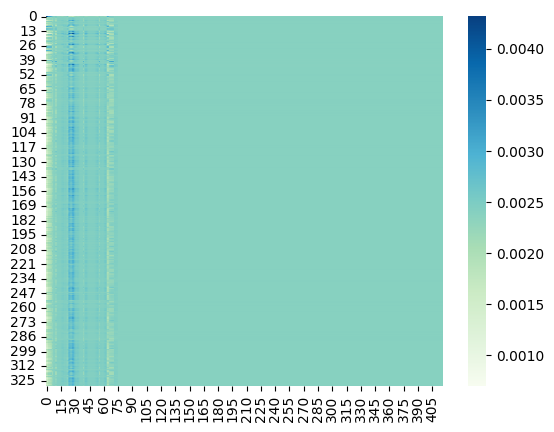


Epoch: 20/80


Val:   3%|▎         | 1/33 [00:05<02:58,  5.59s/it, dist=479.5000]

Ground Truth :  WHICH OPPRESSED THE METROPOLITANS OF EUROPE AND ASIA INVADED THE PROVINCES OF ANTIOCH AND ALEXANDRIA AND MEASURED THEIR DIOCESE BY THE LIMITS OF THE EMPIRE
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:   6%|▌         | 2/33 [00:10<02:41,  5.21s/it, dist=478.2400]

Ground Truth :  BUT IN THIS VIGNETTE COPIED FROM TURNER YOU HAVE THE TWO PRINCIPLES BROUGHT OUT PERFECTLY
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREE


Val:   9%|▉         | 3/33 [00:15<02:33,  5.10s/it, dist=477.0200]

Ground Truth :  SHE GATHERED UP HER REINS
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  12%|█▏        | 4/33 [00:20<02:24,  5.00s/it, dist=478.4567]

Ground Truth :  IF YOU FALL WE MUST FALL OVER YOU AND THEN YOU'RE DONE FOR
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  15%|█▌        | 5/33 [00:25<02:18,  4.94s/it, dist=479.2467]

Ground Truth :  AND SO STRONG WAS MY PHANTASY THAT I WEPT AGAIN IN VERY TRUTH AND SAID WITH MY TRUE VOICE O EXCELLENT SOUL HOW BLESSED IS HE THAT NOW LOOKETH UPON THEE
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  18%|█▊        | 6/33 [00:29<02:12,  4.90s/it, dist=479.8011]

Ground Truth :  THEN SHE TOOK UP HANSEL WITH HER ROUGH HAND AND SHUT HIM UP IN A LITTLE CAGE WITH A LATTICE DOOR AND ALTHOUGH HE SCREAMED LOUDLY IT WAS OF NO USE
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  21%|██        | 7/33 [00:35<02:08,  4.94s/it, dist=479.6733]

Ground Truth :  THEY DREW BACK A LITTLE FROM THE ENTRANCE AND MOTIONED TO THE SUPPOSED CONJURER TO ENTER
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  24%|██▍       | 8/33 [00:40<02:04,  4.97s/it, dist=479.6567]

Ground Truth :  AT THE AGE OF ABOUT SEVENTY FIVE YEARS HE SAVED HIS BAND FROM UTTER DESTRUCTION AT THE HANDS OF THEIR ANCESTRAL ENEMIES BY SUDDENLY GIVING WARNING RECEIVED IN A DREAM OF THE APPROACH OF A LARGE WAR PARTY
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  27%|██▋       | 9/33 [00:44<01:58,  4.96s/it, dist=479.6956]

Ground Truth :  LET'S SEE ABOUT GETTING HELP FOR MISTER FABER
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  30%|███       | 10/33 [00:49<01:53,  4.95s/it, dist=479.7220]

Ground Truth :  CHABLIS A WHITE BURGUNDY DRY AND OF AGREEABLE AROMA
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  33%|███▎      | 11/33 [00:55<01:49,  4.99s/it, dist=479.4024]

Ground Truth :  THE SON OF A VIRGIN GENERATED BY THE INEFFABLE OPERATION OF THE HOLY SPIRIT WAS A CREATURE WITHOUT EXAMPLE OR RESEMBLANCE SUPERIOR IN EVERY ATTRIBUTE OF MIND AND BODY TO THE CHILDREN OF ADAM
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  36%|███▋      | 12/33 [00:59<01:44,  4.99s/it, dist=479.4222]

Ground Truth :  ONE BLANKET WILL BE ENOUGH TO CARRY OR YOU MAY FOREGO THE PLEASURE AND BURDEN ALTOGETHER AS WOOD FOR FIRES IS EVERYWHERE ABUNDANT
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  39%|███▉      | 13/33 [01:04<01:39,  4.97s/it, dist=479.4867]

Ground Truth :  I CAN DISTINGUISH THE EYE OF THE ICHTHYOSAURUS GLOWING LIKE A RED HOT COAL AND AS LARGE AS A MAN'S HEAD
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  42%|████▏     | 14/33 [01:09<01:34,  4.98s/it, dist=479.3057]

Ground Truth :  YOU SEE LOVING SOME ONE AS I LOVE YOU MAKES THE WHOLE WORLD DIFFERENT
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  45%|████▌     | 15/33 [01:14<01:30,  5.01s/it, dist=479.3040]

Ground Truth :  WITH THAT CAME A PANG OF INTENSE PAIN
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  48%|████▊     | 16/33 [01:19<01:24,  5.00s/it, dist=479.0883]

Ground Truth :  TO MORROW IS THE EXAMINATION
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  52%|█████▏    | 17/33 [01:24<01:19,  4.98s/it, dist=479.2824]

Ground Truth :  THE BEST OF US ARE NOT EXEMPT FROM EGOTISTICAL THOUGHTS
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  55%|█████▍    | 18/33 [01:29<01:14,  4.94s/it, dist=479.2337]

Ground Truth :  WE SHALL BE BLOWN UP BUT NO THE DAZZLING DISK OF MYSTERIOUS LIGHT NIMBLY LEAPS ASIDE IT APPROACHES HANS WHO FIXES HIS BLUE EYE UPON IT STEADILY IT THREATENS THE HEAD OF MY UNCLE WHO FALLS UPON HIS KNEES WITH HIS HEAD DOWN TO AVOID IT
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREE


Val:  58%|█████▊    | 19/33 [01:34<01:09,  4.96s/it, dist=479.3425]

Ground Truth :  HOW WONDERFULLY RESPONSIVE TO EVERY EMOTION OF THE HUMAN SOUL
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  61%|██████    | 20/33 [01:39<01:04,  4.95s/it, dist=479.2980]

Ground Truth :  WHENEVER WE COULD CONTRIVE TO GET INTO A CHURCH TOWER WE THOUGHT IT GREAT FUN TO FRIGHTEN ALL THE PARISH BY RINGING THE ALARM BELL AS IF SOME FIRE HAD BROKEN OUT BUT THAT WAS NOT ALL WE ALWAYS CUT THE BELL ROPES SO THAT IN THE MORNING THE CHURCHWARDENS HAD NO MEANS OF SUMMONING THE FAITHFUL TO EARLY MASS
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  64%|██████▎   | 21/33 [01:44<00:59,  4.96s/it, dist=479.4067]

Ground Truth :  HERE WE BE THAT MIGHT BE SO
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  67%|██████▋   | 22/33 [01:49<00:54,  4.97s/it, dist=479.5779]

Ground Truth :  IN EXACTLY TEN MINUTES IT IS IN THE POWER OF EVERY MAN TO FREE HIMSELF FROM ALL THE TUMULT OF THE WORLD THE PANGS OF LOVE THE THROBS OF AMBITION THE WEAR AND TEAR OF PLAY THE RECRIMINATING BOUDOIR THE CONSPIRING CLUB THE RATTLING HELL AND FIND HIMSELF IN A SUBLIME SYLVAN SOLITUDE SUPERIOR TO THE CEDARS OF LEBANON AND INFERIOR ONLY IN EXTENT TO THE CHESTNUT FORESTS OF ANATOLIA
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  70%|██████▉   | 23/33 [01:54<00:50,  5.02s/it, dist=479.2301]

Ground Truth :  IN GWYNPLAINE EVIL THOUGHTS NEVER RIPENED AND HE HAD THEREFORE NO REMORSE
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  73%|███████▎  | 24/33 [01:59<00:45,  5.03s/it, dist=479.2528]

Ground Truth :  IF PERMITTED BY THE HISTORICAL CONNECTION WHICH THOUGH SLIGHT WAS ESSENTIAL TO HIS PLAN THE AUTHOR WOULD VERY WILLINGLY HAVE AVOIDED ANYTHING OF THIS NATURE
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  76%|███████▌  | 25/33 [02:04<00:40,  5.03s/it, dist=479.1093]

Ground Truth :  HELLO STEPHANOS HERE COMES THE DEDALUS
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  79%|███████▉  | 26/33 [02:09<00:35,  5.02s/it, dist=479.3654]

Ground Truth :  THE SHARP SMELL OF SPIRITS WENT THROUGH THE ROOM
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  82%|████████▏ | 27/33 [02:14<00:29,  5.00s/it, dist=479.5440]

Ground Truth :  THE CHAIR WAS EMPTY BUT HE KNEW
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  85%|████████▍ | 28/33 [02:19<00:24,  4.97s/it, dist=479.5390]

Ground Truth :  BUT I THINK FEW BRIDES DRESS WITH A BRAVER HAPPIER HEART THAN MINE THOUGH I DO CHOOSE A SOBER WEDDING GOWN ANSWERED CHRISTIE SMILING AGAIN AS SHE TOOK FROM A HALF PACKED TRUNK HER NEW HOSPITAL SUIT OF SOFT GRAY WOOLLEN STUFF
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  88%|████████▊ | 29/33 [02:24<00:19,  4.96s/it, dist=479.4508]

Ground Truth :  THE HOUSE WHICH SEEMED TO CONSIST OF TWO OR THREE HIGH NARROW AND STEEP ROOFED BUILDINGS PROJECTING FROM EACH OTHER AT RIGHT ANGLES FORMED ONE SIDE OF THE INCLOSURE
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  91%|█████████ | 30/33 [02:29<00:14,  4.97s/it, dist=479.5593]

Ground Truth :  A RED HAIRED MOUNTAIN OF A MAN WITH AN APPARENTLY INEXHAUSTIBLE STORE OF ENERGY
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  94%|█████████▍| 31/33 [02:34<00:09,  4.94s/it, dist=479.6430]

Ground Truth :  HER THOUGHTS RAN ON JEM'S MANNER AND WORDS NOT BUT WHAT SHE HAD KNOWN THE TALE THEY TOLD FOR MANY A DAY BUT STILL SHE WISHED HE HAD NOT PUT IT SO PLAINLY
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  97%|█████████▋| 32/33 [02:39<00:04,  4.96s/it, dist=479.6875]

Ground Truth :  THE POETS OF SUCCEEDING AGES HAVE DWELT MUCH IN DETAIL ON THE OCCURRENCES OF THIS MEMORABLE DAY
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Ground Truth :  DORRIFORTH THEN LAID THE BOOK OUT OF HIS HAND AND BY THE TIME THE SERVANT HAD LEFT THE ROOM THUS BEGAN
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S
	Train Loss 1.2607	 Learning Rate 0.0009681
	Val Dist 479.7705	
	Teacher Forcing Ratio 1	

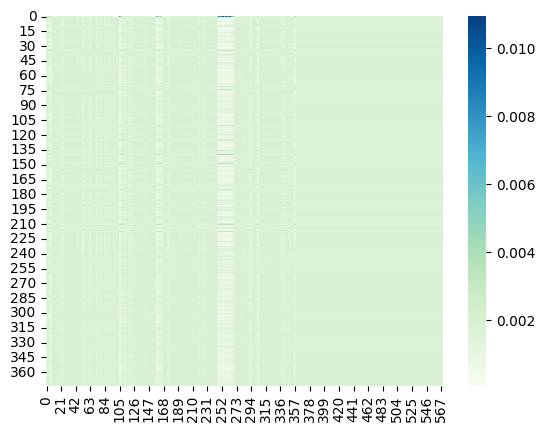


Epoch: 21/80


Val:   3%|▎         | 1/33 [00:05<02:55,  5.48s/it, dist=478.2933]

Ground Truth :  BUT SOFTLY AS THE NAME WAS BREATHED MARY GRANT ALREADY AWAKENED BY THE SOUNDS IN THE HUT SLIPPED OVER TOWARD GLENARVAN AND SEIZING THE HAND ALL STAINED WITH EARTH SHE COVERED IT WITH KISSES
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF


Val:   6%|▌         | 2/33 [00:10<02:39,  5.15s/it, dist=477.4633]

Ground Truth :  NO BATTERY IN THE WHOLE FOUR YEARS WAR LOST SO MANY MEN IN SO SHORT A TIME
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF


Val:   9%|▉         | 3/33 [00:15<02:31,  5.04s/it, dist=478.0022]

Ground Truth :  AT ONE END STOOD A GREAT FIREPLACE IN WHICH A BLUE LOG WAS BLAZING WITH A BLUE FLAME AND OVER THE FIRE HUNG FOUR KETTLES IN A ROW ALL BUBBLING AND STEAMING AT A GREAT RATE
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRE


Val:  12%|█▏        | 4/33 [00:20<02:25,  5.02s/it, dist=477.9883]

Ground Truth :  SHE PRESSED HIS HAND GENTLY IN GRATITUDE WEREN'T YOU HAPPY THEN AT ALL
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF


Val:  15%|█▌        | 5/33 [00:25<02:20,  5.02s/it, dist=478.1493]

Ground Truth :  IT WAS NOT FROM ANY REAL CAUSE OF GRIEF THAT SHE WEPT BUT THERE WAS A MAGNETIC QUALITY IN TEARS WHICH ALWAYS ATTRACTED HER'S
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRE


Val:  18%|█▊        | 6/33 [00:30<02:14,  5.00s/it, dist=477.0344]

Ground Truth :  I AM NOT COMPLAINING THAT THE RATE IS SLOW BUT THAT THE SEA IS SO WIDE
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF


Val:  21%|██        | 7/33 [00:35<02:11,  5.06s/it, dist=476.0229]

Ground Truth :  HE STOOD A MOMENT BEWILDERED THEN TURNED AND RUSHED UPON THE ISLAND A GREAT SHEET OF DAZZLING SUNLIGHT SWEPT THE PLACE AND BENEATH LAY A MIGHTY MASS OF OLIVE GREEN THICK TALL WET AND WILLOWY
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF


Val:  24%|██▍       | 8/33 [00:40<02:05,  5.01s/it, dist=476.3400]

Ground Truth :  YES ONE OUGHTN'T TO LEAVE THE COLONY WITHOUT SEEING IT SAYS BURGESS IT'S WORTH SEEING
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRE


Val:  27%|██▋       | 9/33 [00:45<01:59,  4.97s/it, dist=476.5259]

Ground Truth :  OH NO JASPER I MUST GO BY MY VERY OWN SELF
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREE


Val:  30%|███       | 10/33 [00:50<01:54,  4.97s/it, dist=476.8093]

Ground Truth :  SHE LOOKED AT HIS HEAVY SHOULDERS AND BIG DETERMINED HEAD THRUST FORWARD LIKE A CATAPULT IN LEASH
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRE


Val:  33%|███▎      | 11/33 [00:55<01:48,  4.94s/it, dist=476.9024]

Ground Truth :  YOUR CRY AND THE GRIP OF YOUR FINGERS BROUGHT ME BACK BUT I AM GOING FAST
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREE


Val:  36%|███▋      | 12/33 [01:00<01:43,  4.94s/it, dist=477.0844]

Ground Truth :  AND THEN HE TALKED OF HER MOTHER AND HE MADE HER PRAY
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREE


Val:  39%|███▉      | 13/33 [01:04<01:38,  4.92s/it, dist=477.3231]

Ground Truth :  THERE APPEARED TO BE AN IMMEDIATE ASSOCIATION WITH THE DEATH TRAUMA AS IF THE TWO WERE INEXTRICABLY LINKED INTO ONE
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRE


Val:  42%|████▏     | 14/33 [01:09<01:33,  4.93s/it, dist=477.0648]

Ground Truth :  FERDINAND MEDITATES OVER HIS GOOD FORTUNE
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRE


Val:  45%|████▌     | 15/33 [01:14<01:28,  4.92s/it, dist=477.0844]

Ground Truth :  IT IS SURPRISING HOW SOON THE EYE BECOMES ACCUSTOMED TO MISSING TWENTY SHEEP OUT OF TWO OR THREE HUNDRED
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRE


Val:  48%|████▊     | 16/33 [01:19<01:22,  4.88s/it, dist=477.3442]

Ground Truth :  ILLUSTRATION SAGE
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRE


Val:  52%|█████▏    | 17/33 [01:24<01:18,  4.88s/it, dist=477.3306]

Ground Truth :  HE WOULD HAVE SOME ARRANGEMENT OF THIS THING
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRE


Val:  55%|█████▍    | 18/33 [01:29<01:12,  4.86s/it, dist=477.6078]

Ground Truth :  THE SENTENCE OF SAINT JAMES WHICH SAYS THAT HE WHO OFFENDS AGAINST ONE COMMANDMENT BECOMES GUILTY OF ALL HAD SEEMED TO HIM FIRST A SWOLLEN PHRASE UNTIL HE HAD BEGUN TO GROPE IN THE DARKNESS OF HIS OWN STATE
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRENGTH OF THE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRENGTH OF THE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRENGTH OF THE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRENGTH OF THE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRENGTH OF THE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRENGTH OF THE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRENGTH OF THE STREET AND TH


Val:  58%|█████▊    | 19/33 [01:34<01:08,  4.89s/it, dist=477.2853]

Ground Truth :  I TOLLED THE BELL AGAIN
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF


Val:  61%|██████    | 20/33 [01:39<01:03,  4.90s/it, dist=477.3960]

Ground Truth :  HUSSY WOMAN AND BOND TIE
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREE


Val:  64%|██████▎   | 21/33 [01:44<00:59,  4.95s/it, dist=477.2216]

Ground Truth :  I'LL DO ANYTHING YOU WISH ME TO BARTLEY SHE SAID TREMULOUSLY
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREE


Val:  67%|██████▋   | 22/33 [01:49<00:54,  4.95s/it, dist=477.2870]

Ground Truth :  I DIDN'T HAVE ANY FEARS IF I WORKED IT RIGHTLY SAID THE OLD GENTLEMAN COMPLACENTLY
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRE


Val:  70%|██████▉   | 23/33 [01:54<00:49,  4.95s/it, dist=477.3046]

Ground Truth :  DID THAT LOVELY CREATURE SUPPOSE THAT NATURE WHO HAD DONE SO MUCH FOR HER THAT THE FAME OF HER BEAUTY EXTENDED THROUGHOUT THE WORLD HAD YET LEFT HER SO WEAK AND FEEBLE THAT SHE COULD NOT SUPPORT HERSELF IN THE POSITION MOST CALCULATED TO GIVE HER EASE AND PLEASURE
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREE


Val:  73%|███████▎  | 24/33 [01:59<00:44,  4.95s/it, dist=477.1550]

Ground Truth :  SOUR MILK OR BUTTERMILK MAY BE USED BUT THEN A LITTLE LESS ACID WILL BE NEEDED
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRE


Val:  76%|███████▌  | 25/33 [02:03<00:39,  4.95s/it, dist=477.3032]

Ground Truth :  MEBBY YOU THINK HE'S HAVING SOME SORT OF A PICNIC DOWN THERE EH GLARED LIGE
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRE


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.95s/it, dist=477.3215]

Ground Truth :  ASPLENIUM EPILOBIUM HEUCHERA HAZEL DOGWOOD AND ALDER MAKE A LUXURIOUS FRINGE AND SETTING AND THE FORESTS OF DOUGLAS SPRUCE ALONG THE BANKS ARE THE FINEST I HAVE EVER SEEN IN THE SIERRA
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREE


Val:  82%|████████▏ | 27/33 [02:13<00:29,  4.92s/it, dist=477.3459]

Ground Truth :  NEXT EVENING AS MISSUS STERLING SAT ALONE IN THE TWILIGHT A TALL MAN IN ARMY BLUE ENTERED QUIETLY STOOD WATCHING THE TRANQUIL FIGURE FOR A MOMENT THEN WENT AND KNELT DOWN BESIDE IT SAYING WITH A MOST UNSOLDIERLY CHOKE IN THE VOICE
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF


Val:  85%|████████▍ | 28/33 [02:18<00:24,  4.92s/it, dist=477.3138]

Ground Truth :  HE TOOK THE CASH BOX OUT OF THE DRAWER AND TURNING TO LEAVE THE SHOP BECAME AWARE THAT STEVIE WAS STILL DOWNSTAIRS
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF


Val:  88%|████████▊ | 29/33 [02:23<00:19,  4.97s/it, dist=477.1083]

Ground Truth :  THE HELPLESS MANAGER PACED THE FLOOR AND GRIMLY ENDURED THE GLOOM OF DEFEAT
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AN


Val:  91%|█████████ | 30/33 [02:28<00:14,  4.98s/it, dist=477.1642]

Ground Truth :  I AM THE ONE TO GO AFTER WALT IF ANYONE HAS TO I'LL GO DOWN MISTER THOMAS
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRE


Val:  94%|█████████▍| 31/33 [02:33<00:09,  4.97s/it, dist=477.1310]

Ground Truth :  NOR WAS HIS SENSE OF SECURITY INCREASED WHEN IN SHIFTING HIS POSITION THE TORCH FELL FROM HIS GRASP THE FAGOTS SCATTERING AS THEY SLIPPED DOWN BETWEEN THE LIMBS OF THE TREE AND WHIRLING IN EVER DIMINISHING CIRCLES UNTIL FINALLY HE HEARD THEM CLATTER ON THE ROCKS BELOW
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE ST


Val:  97%|█████████▋| 32/33 [02:38<00:04,  4.98s/it, dist=477.0925]

Ground Truth :  I NEVER SAW PEOPLE LIKE THE SNELLINGS FOR POSSESSING RELATIVES IN ALL SORTS OF LINES
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRE


Val: 100%|██████████| 33/33 [02:40<00:00,  4.01s/it, dist=476.8844]

Ground Truth :  I KNOW I AM JUST AWFUL JIM I WAS SO SCARED
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRE


	Train Loss 1.2570	 Learning Rate 0.0009598
	Val Dist 476.8844	
	Teacher Forcing Ratio 1	


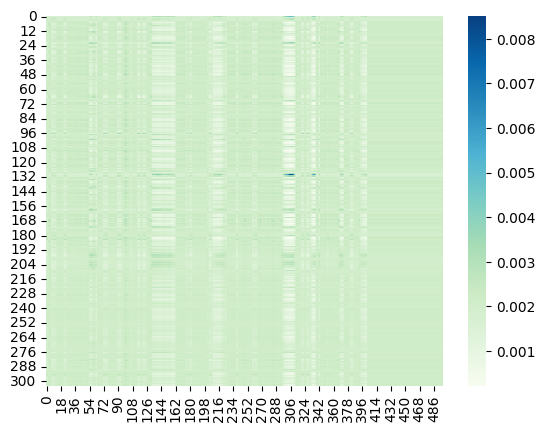


Epoch: 22/80


Val:   3%|▎         | 1/33 [00:05<02:53,  5.42s/it, dist=482.3600]

Ground Truth :  I PICKED IT UP AND COMING UP TO HIM JUST AS HE WAS GOING DOWN THE STEPS I HANDED IT TO HIM
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:   6%|▌         | 2/33 [00:10<02:35,  5.03s/it, dist=484.6133]

Ground Truth :  EDISON WAS INTOLERANT OF SHAM AND SHODDY AND NOTHING WOULD SATISFY HIM THAT COULD NOT STAND CROSS EXAMINATION BY MICROSCOPE TEST TUBE AND GALVANOMETER
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:   9%|▉         | 3/33 [00:15<02:30,  5.00s/it, dist=482.4267]

Ground Truth :  I SHOULD LIKE TO SEE THE DESK YOU SPEAK OF AND THE SPOT WHERE SHE FELL
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  12%|█▏        | 4/33 [00:20<02:25,  5.00s/it, dist=483.3467]

Ground Truth :  THE VANITY OF CELESTINE WAS FLATTERED BY THE APPEAL AND THE PARTIAL VERSION OF A MONK DECIDED THE FAITH OF THE POPE WHO WITH HIS LATIN CLERGY WAS IGNORANT OF THE LANGUAGE THE ARTS AND THE THEOLOGY OF THE GREEKS
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  15%|█▌        | 5/33 [00:25<02:20,  5.01s/it, dist=482.8160]

Ground Truth :  WE WILL HUNT WOLVES THE COUNTRY IS ALIVE WITH THEM AND THE GOVERNMENT GIVES A BOUNTY OF FIFTEEN DOLLARS FOR EVERY SCALP TAKEN
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  18%|█▊        | 6/33 [00:30<02:14,  4.99s/it, dist=482.8944]

Ground Truth :  IN THE THIRD I SAY WHAT IT IS I PURPOSE TO SPEAK SO AS NOT TO BE IMPEDED BY FAINTHEARTEDNESS
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  21%|██        | 7/33 [00:34<02:08,  4.94s/it, dist=482.7324]

Ground Truth :  THE CHILD HAD A NATIVE GRACE WHICH DOES NOT INVARIABLY CO EXIST WITH FAULTLESS BEAUTY ITS ATTIRE HOWEVER SIMPLE ALWAYS IMPRESSED THE BEHOLDER AS IF IT WERE THE VERY GARB THAT PRECISELY BECAME IT BEST
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  24%|██▍       | 8/33 [00:40<02:04,  4.99s/it, dist=482.1583]

Ground Truth :  THE KINGDOM OF NORTHUMBRIA AS THE NAME IMPLIES EMBRACED NEARLY ALL THE COUNTRY FROM THE HUMBER TO THE PICTISH BORDER
Prediction   :  AND THE STREET WAS A STRANGE CONSTANT CONSIDERABLE CONSTANT AND THE STREET WAS A STRANGE CONSTANT CONSIDERABLE CONSTANT AND THE STREET AND THE STREET WAS A STRANGE CONSTANT CONSIDERABLE CONSTANT AND THE STREET WAS A STRANGE CONSTANT CONSIDERABLE CONSTANT AND THE STREET AND THE STREET WAS A STRANGE CONSTANT CONSIDERABLE CONSTANT AND THE STREET WAS A STRANGE CONSTANT CONSIDERABLE CONSTANT AND THE STREET AND THE STREET WAS A STRANGE CONSTANT CONSIDERABLE CONSTANT AND THE STREET WAS A STRANGE CONSTANT CONSIDERABLE CONSTANT AND THE STREET AND THE S


Val:  27%|██▋       | 9/33 [00:45<02:00,  5.01s/it, dist=481.7667]

Ground Truth :  I'LL DO ANYTHING YOU WISH ME TO BARTLEY SHE SAID TREMULOUSLY
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  30%|███       | 10/33 [00:50<01:54,  4.99s/it, dist=481.5200]

Ground Truth :  LOAFING WAS ALL VERY WELL FOR THESE FELLOWS WHO KNEW NOT MISTER VLADIMIR AND HAD WOMEN TO FALL BACK UPON WHEREAS HE HAD A WOMAN TO PROVIDE FOR
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  33%|███▎      | 11/33 [00:55<01:50,  5.04s/it, dist=480.6273]

Ground Truth :  HERE IS SOMETHING DIFFERENT ROUNDED LIKE A NUT SHELL YOU CAN SPLIT OFF ONE SIDE AND BEHOLD THERE IS THE NUT LYING SNUGLY AS DOES ANY CHESTNUT IN ITS BUR
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  36%|███▋      | 12/33 [01:00<01:45,  5.03s/it, dist=480.5378]

Ground Truth :  NOT THAT I'M INTERESTED IN ALL THIS FOR MYSELF HE DISCLAIMED AFTER LISTENING TO THE TELECAST FROM TERRA TWO DAYS AFTER HIS DISCOVERY
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  39%|███▉      | 13/33 [01:05<01:40,  5.01s/it, dist=480.1185]

Ground Truth :  THE PRIDE OF THAT DIM IMAGE BROUGHT BACK TO HIS MIND THE DIGNITY OF THE OFFICE HE HAD REFUSED
Prediction   :  AND THE STREET WAS A STRANGE CONSTANT CONSIDERABLE CONSTANT AND THE STREET AND THE STREET WAS A STRANGE CONSTANT CONSIDERABLE CONSTANT AND THE STREET AND THE STREET WAS A STRANGE CONSTANT CONSIDERABLE CONSTANT AND THE STREET AND THE STREET WAS A STRANGE CONSTANT CONSIDERABLE CONSTANT AND THE STREET AND THE STREET WAS A STRANGE CONSTANT CONSIDERABLE CONSTANT AND THE STREET AND THE STREET WAS A STRANGE CONSTANT CONSIDERABLE CONSTANT AND THE STREET AND THE STREET WAS A STRANGE CONSTANT CONSIDERABLE CONSTANT AND THE STREET AND THE STREET WAS A STR


Val:  42%|████▏     | 14/33 [01:10<01:34,  4.98s/it, dist=480.0914]

Ground Truth :  I DO NOT SUPPOSE THAT ANYBODY WILL QUESTION MY RIGHT TO HAVE THE CARE OF MY OWN CHILD SAID TREVELYAN
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  45%|████▌     | 15/33 [01:15<01:30,  5.00s/it, dist=479.6893]

Ground Truth :  ASKED PHRONSIE WITH HER LITTLE FACE CLOSE TO POLLY'S OWN
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  48%|████▊     | 16/33 [01:20<01:25,  5.02s/it, dist=479.2929]

Ground Truth :  IN THE HALF LIGHT HE LOOKED ABOUT AT THE STALLS AND BOXES AND SMILED A LITTLE CONSCIOUSLY RECALLING WITH AMUSEMENT SIR HARRY'S JUDICIAL FROWN
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  52%|█████▏    | 17/33 [01:25<01:19,  4.99s/it, dist=479.6357]

Ground Truth :  LOOK AT ME WELL IN SOOTH I'M BEATRICE
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  55%|█████▍    | 18/33 [01:29<01:14,  4.95s/it, dist=479.5178]

Ground Truth :  I HAVE DRAWN UP A LIST OF ALL THE PEOPLE WHO OUGHT TO GIVE US A PRESENT AND I SHALL TELL THEM WHAT THEY OUGHT TO GIVE IT WON'T BE MY FAULT IF I DON'T GET IT
Prediction   :  AND THE CONTRARY WAS A STRANGE AND THE CONTRARY OF THE STREET AND THE CONTRARY WAS A STRANGE AND THE CONTRARY OF THE STREET AND THE CONTRARY WAS A STRANGE AND THE CONTRARY OF THE STREET AND THE CONTRARY WAS A STRANGE AND THE CONTRARY OF THE STREET AND THE CONTRARY WAS A STRANGE AND THE CONTRARY OF THE STREET AND THE CONTRARY WAS A STRANGE AND THE CONTRARY OF THE STREET AND THE CONTRARY WAS A STRANGE AND THE CONTRARY OF THE STREET AND THE CONTRARY WAS A STRANGE AND THE CONTRARY OF THE STREET AND THE CONTRARY WAS A STRANGE AND THE CONTRARY OF TH


Val:  58%|█████▊    | 19/33 [01:34<01:09,  4.95s/it, dist=479.3526]

Ground Truth :  FEWER WORDS THAN BEFORE BUT WITH THE SAME MYSTERIOUS MUSIC IN THEM
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  61%|██████    | 20/33 [01:39<01:04,  4.93s/it, dist=479.2777]

Ground Truth :  THERE'S MORE TROUBLE WITH YOU BLOODY ARISTOCRATS THAN ENOUGH LIE QUIET
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  64%|██████▎   | 21/33 [01:44<00:59,  4.95s/it, dist=479.0721]

Ground Truth :  WHICH OPPRESSED THE METROPOLITANS OF EUROPE AND ASIA INVADED THE PROVINCES OF ANTIOCH AND ALEXANDRIA AND MEASURED THEIR DIOCESE BY THE LIMITS OF THE EMPIRE
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  67%|██████▋   | 22/33 [01:49<00:54,  4.98s/it, dist=478.8861]

Ground Truth :  INSIDE A SECRET ROCKET TELEMETERING DEVICE WAS MOUNTED ON ITS TEST STAND
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  70%|██████▉   | 23/33 [01:54<00:49,  4.95s/it, dist=478.9562]

Ground Truth :  THE ORDEAL IS BEST MET ALONE WHERE NO CURIOUS OR PITYING EYES EMBARRASS HER WHERE ALL NATURE SAYS TO HER SPIRIT TIS LOVE TIS LOVE THE FULFILLING OF LIFE
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  73%|███████▎  | 24/33 [01:59<00:44,  4.99s/it, dist=478.7367]

Ground Truth :  I SEE FROM MY SECOND PREFACE THAT I TOOK THE BOOK TO MESSRS CHAPMAN AND HALL MAY FIRST EIGHTEEN SEVENTY ONE AND ON THEIR REJECTION OF IT UNDER THE ADVICE OF ONE WHO HAS ATTAINED THE HIGHEST RANK AMONG LIVING WRITERS I LET IT SLEEP TILL I TOOK IT TO MISTER TRUBNER EARLY IN EIGHTEEN SEVENTY TWO
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  76%|███████▌  | 25/33 [02:04<00:39,  4.97s/it, dist=478.7232]

Ground Truth :  FOR BELIEVE ME THE FINAL PHILOSOPHY OF ART CAN ONLY RATIFY THEIR OPINION THAT THE BEAUTY OF A COCK ROBIN IS TO BE RED AND OF A GRASS PLOT TO BE GREEN AND THE BEST SKILL OF ART IS IN INSTANTLY SEIZING ON THE MANIFOLD DELICIOUSNESS OF LIGHT WHICH YOU CAN ONLY SEIZE BY PRECISION OF INSTANTANEOUS TOUCH
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  79%|███████▉  | 26/33 [02:09<00:34,  4.97s/it, dist=478.8356]

Ground Truth :  I SAY SIR HARRY THE LITTLE GIRL'S GOING FAMOUSLY TO NIGHT ISN'T SHE
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  82%|████████▏ | 27/33 [02:14<00:29,  4.99s/it, dist=478.7472]

Ground Truth :  EACH FEATURE WAS FINISHED EYELIDS EYELASHES AND EARS BEING ALMOST INVARIABLY PERFECT
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  85%|████████▍ | 28/33 [02:19<00:24,  4.98s/it, dist=478.7726]

Ground Truth :  YET AS THE PROFOUND DOCTOR HAD BEEN TERRIFIED AT HIS OWN RASHNESS APOLLINARIS WAS HEARD TO MUTTER SOME FAINT ACCENTS OF EXCUSE AND EXPLANATION
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  88%|████████▊ | 29/33 [02:24<00:19,  4.99s/it, dist=478.9283]

Ground Truth :  DANGER IS AGAIN PRESENT THE MOTHER OF MORALITY GREAT DANGER THIS TIME SHIFTED INTO THE INDIVIDUAL INTO THE NEIGHBOUR AND FRIEND INTO THE STREET INTO THEIR OWN CHILD INTO THEIR OWN HEART INTO ALL THE MOST PERSONAL AND SECRET RECESSES OF THEIR DESIRES AND VOLITIONS
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  91%|█████████ | 30/33 [02:29<00:14,  4.94s/it, dist=479.1160]

Ground Truth :  HURSTWOOD ALMOST EXCLAIMED OUT LOUD AT THE INSISTENCY OF THIS THING
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  94%|█████████▍| 31/33 [02:34<00:09,  4.93s/it, dist=479.0622]

Ground Truth :  THE DISTINGUISHING MARK OF THE HENS WAS A CREST OF LAMENTABLY SCANTY GROWTH IN THESE LATTER DAYS BUT SO ODDLY AND WICKEDLY ANALOGOUS TO HEPZIBAH'S TURBAN THAT PHOEBE TO THE POIGNANT DISTRESS OF HER CONSCIENCE BUT INEVITABLY WAS LED TO FANCY A GENERAL RESEMBLANCE BETWIXT THESE FORLORN BIPEDS AND HER RESPECTABLE RELATIVE
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  97%|█████████▋| 32/33 [02:39<00:04,  4.91s/it, dist=479.1498]

Ground Truth :  FRIED BREAD CRUMBS
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val: 100%|██████████| 33/33 [02:41<00:00,  3.95s/it, dist=479.4369]

Ground Truth :  THE BOYS BELONG TO THE GENTLEMAN WHO IS A WIDOWER
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


	Train Loss 1.2535	 Learning Rate 0.0009505
	Val Dist 479.4369	
	Teacher Forcing Ratio 1	


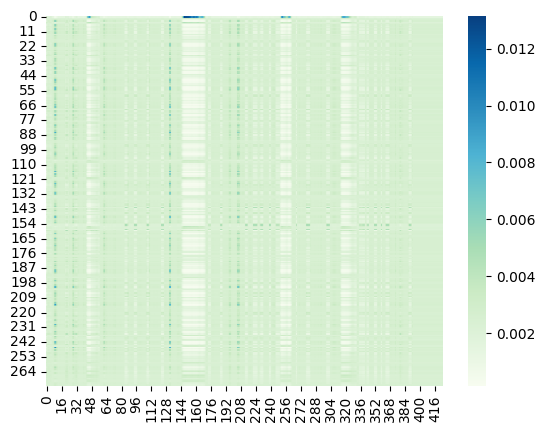


Epoch: 23/80


Val:   3%|▎         | 1/33 [00:05<02:59,  5.59s/it, dist=480.7467]

Ground Truth :  AND I DECLARE THAT WHEN I SPEAK THEREOF LOVE SHEDS SUCH PERFECT SWEETNESS OVER ME THAT IF MY COURAGE FAILED NOT CERTAINLY TO HIM MY LISTENERS MUST BE ALL RESIGN'D
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:   6%|▌         | 2/33 [00:10<02:41,  5.20s/it, dist=481.0433]

Ground Truth :  SEVENTEEN SEVENTEEN
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:   9%|▉         | 3/33 [00:15<02:31,  5.04s/it, dist=481.0133]

Ground Truth :  WHAT DO YOU MAKE OF IT GRYCE
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  12%|█▏        | 4/33 [00:20<02:26,  5.05s/it, dist=479.7550]

Ground Truth :  THE SICK MAN RAGED AND SHOOK HIS FIST
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  15%|█▌        | 5/33 [00:25<02:19,  4.99s/it, dist=480.0520]

Ground Truth :  BUT THE HEALTH OF A CHURCH DEPENDS NOT MERELY ON THE CREED WHICH IT PROFESSES NOT EVEN ON THE WISDOM AND HOLINESS OF A FEW GREAT ECCLESIASTICS BUT ON THE FAITH AND VIRTUE OF ITS INDIVIDUAL MEMBERS
Prediction   :  AND THE STRANGER WAS A FEW MOMENTS AND THE STREETS WERE ALL THE STREETS AND THE STREET WAS A FEW MOMENTS AND THE STREETS WERE ALL THE STREETS AND THE STREET WAS A FEW MOMENTS AND THE STREETS WERE ALL THE STREETS AND THE STREET WAS A FEW MOMENTS AND THE STREETS WERE ALL THE STREETS AND THE STREET WAS A FEW MOMENTS AND THE STREETS WERE ALL THE STREETS AND THE STREET WAS A FEW MOMENTS AND THE STREETS WERE ALL THE STREETS AND THE STREET WAS A FEW MOMENTS AND THE STREETS WERE ALL THE STREETS AND THE STREET WAS A FEW MOMENTS AND THE STREETS WERE ALL


Val:  18%|█▊        | 6/33 [00:30<02:14,  4.97s/it, dist=479.4267]

Ground Truth :  HE DOES AND FOR ONCE I WIN A ROUND I KEEP MUSIC FOR THIS SEMESTER
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  21%|██        | 7/33 [00:35<02:08,  4.95s/it, dist=479.2629]

Ground Truth :  HOW WOULD THE PAPERS TALK ABOUT IT
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  24%|██▍       | 8/33 [00:40<02:03,  4.96s/it, dist=478.6250]

Ground Truth :  I DO NOT THINK THERE SHONE SO GREAT A LIGHT UNDER THE LIDS OF VENUS WHEN TRANSFIXED BY HER OWN SON BEYOND HIS USUAL CUSTOM
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  27%|██▋       | 9/33 [00:44<01:57,  4.91s/it, dist=479.0467]

Ground Truth :  BEAT THE EGGS STIR TO THEM THE MILK AND POUNDED SUGAR AND PUT THE MIXTURE INTO A JUG
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  30%|███       | 10/33 [00:49<01:51,  4.86s/it, dist=479.4320]

Ground Truth :  AND EVER SINCE HE HAD NEVER MANAGED TO GET HIS WEIGHT DOWN AS MUCH AS AN OUNCE
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  33%|███▎      | 11/33 [00:54<01:47,  4.87s/it, dist=479.4158]

Ground Truth :  THE TIME IS NARROWED DOWN TO ONE AND IN THAT ONE MISS CLARKE WAS THE ONLY PERSON TO TOUCH HER
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  36%|███▋      | 12/33 [00:59<01:42,  4.89s/it, dist=479.6489]

Ground Truth :  HER CRIES BROUGHT HER HUSBAND DOWN TO TRY WITH HIS ACHING HEART TO COMFORT HERS
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  39%|███▉      | 13/33 [01:04<01:38,  4.93s/it, dist=479.1897]

Ground Truth :  AS A MATTER OF FACT HE COULD NOT SAID SOAMES FOR I ENTERED BY THE SIDE DOOR
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  42%|████▏     | 14/33 [01:09<01:33,  4.93s/it, dist=479.1057]

Ground Truth :  THE ROOM WAS EMPTY WHEN HE ENTERED
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  45%|████▌     | 15/33 [01:14<01:28,  4.92s/it, dist=479.1836]

Ground Truth :  SHE KNEW NOTHING OF THE PLACE HAD NOWHERE TO GO NOWHERE SHE WANTED TO GO HAD NOT A THOUGHT TO TELL HER WHAT QUESTION TO ASK IF SHE MET A LIVING SOUL
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  48%|████▊     | 16/33 [01:19<01:24,  4.95s/it, dist=479.0608]

Ground Truth :  HE HAD LOVED HER EARNESTLY ENOUGH BUT NOW THAT THE POSSIBILITY OF LOSING HER STARED HIM IN THE FACE SHE SEEMED MUCH MORE ATTRACTIVE
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  52%|█████▏    | 17/33 [01:24<01:18,  4.93s/it, dist=479.4769]

Ground Truth :  SHE LOOKED AT HIS HEAVY SHOULDERS AND BIG DETERMINED HEAD THRUST FORWARD LIKE A CATAPULT IN LEASH
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  55%|█████▍    | 18/33 [01:29<01:13,  4.93s/it, dist=479.2026]

Ground Truth :  IT IS A FEARFUL NIGHT TO SEND AWAY A BEGGAR SAID THE ELDEST SISTER WHILE THEY WERE EATING
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  58%|█████▊    | 19/33 [01:34<01:09,  4.93s/it, dist=479.5186]

Ground Truth :  IT TRULY IS ASSERTED THE MAGICIAN
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  61%|██████    | 20/33 [01:39<01:04,  4.95s/it, dist=479.3957]

Ground Truth :  PUT THE SUGAR WITH ONE QUARTER PINT OF WATER IN A SAUCEPAN OVER THE FIRE REMOVE THE SCUM AS IT RISES AND ADD THE LEMON PEEL AND GINGER WITH THE OUTSIDE SCRAPED OFF WHEN THE SYRUP IS TOLERABLY THICK TAKE IT OFF THE FIRE AND WHEN COLD WIPE THE CUCUMBERS DRY AND PUT THEM IN
Prediction   :  AND THE STRANGER WAS A FEW MOMENTS AND THE STREET AND THE STREET WAS A FEW MOMENTS AND THE STREET AND THE STREET WAS A FEW MOMENTS AND THE STREET AND THE STREET WAS A FEW MOMENTS AND THE STREET AND THE STREET WAS A FEW MOMENTS AND THE STREET AND THE STREET WAS A FEW MOMENTS AND THE STREET AND THE STREET WAS A FEW MOMENTS AND THE STREET AND THE STREET WAS A FEW MOMENTS AND THE STREET AND THE STREET WAS A FEW MOMENTS AND THE STREET AND THE STREET WAS A FEW MOMENTS AND THE STREET AND THE STREET WAS A FEW MOMENTS AND THE STREET AND THE STREET WAS 


Val:  64%|██████▎   | 21/33 [01:44<00:59,  5.00s/it, dist=479.1816]

Ground Truth :  AS LONG AS THERE'S A BONE ON THE FLOOR THE TWO OF YOU WORRY IT
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  67%|██████▋   | 22/33 [01:49<00:54,  4.97s/it, dist=479.1379]

Ground Truth :  THE GOOD SUPREME SOLE IN ITSELF DELIGHTING CREATED MAN GOOD AND THIS GOODLY PLACE GAVE HIM AS HANSEL OF ETERNAL PEACE
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  70%|██████▉   | 23/33 [01:54<00:49,  4.97s/it, dist=479.2600]

Ground Truth :  AND THE GLANCE SHE CAST HIM WHILE NOT MEETING HIS EYE SHOWED THAT SHE UNDERSTOOD THE IMPORTANCE OF THE ADMISSION
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  73%|███████▎  | 24/33 [01:58<00:44,  4.93s/it, dist=479.2353]

Ground Truth :  ABOVE ALL THINGS I DESIRE TO SETTLE THE MATTER QUIETLY AND DISCREETLY
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  76%|███████▌  | 25/33 [02:03<00:39,  4.93s/it, dist=479.0613]

Ground Truth :  THE CRAMPNESS AND THE POVERTY ARE ALL INTENDED
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.92s/it, dist=479.0900]

Ground Truth :  HUSSY WOMAN AND BOND TIE
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  82%|████████▏ | 27/33 [02:13<00:29,  4.95s/it, dist=479.0254]

Ground Truth :  CABBAGE SALAD CHOP OR SHAVE FINE HALF A MEDIUM SIZE HEAD OF CABBAGE THAT HAS BEEN LEFT IN COLD WATER UNTIL CRISP THEN DRAIN
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  85%|████████▍ | 28/33 [02:18<00:24,  4.92s/it, dist=479.0898]

Ground Truth :  BUT IN THE CAUSE OF SCIENCE MEN ARE EXPECTED TO SUFFER
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  88%|████████▊ | 29/33 [02:23<00:19,  4.90s/it, dist=479.0936]

Ground Truth :  HOW ASKED TAD
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  91%|█████████ | 30/33 [02:28<00:14,  4.87s/it, dist=479.1173]

Ground Truth :  WHEN HE ROSE PAINFULLY THE THRUSTING FORWARD OF A SKINNY GROPING HAND DEFORMED BY GOUTY SWELLINGS SUGGESTED THE EFFORT OF A MORIBUND MURDERER SUMMONING ALL HIS REMAINING STRENGTH FOR A LAST STAB
Prediction   :  AND THE STRANGER WAS A FEW MOMENTS THE STRANGER WAS A FEW MOMENTS THE STRANGER WAS A FEW MOMENTS THE STRANGER WAS A FEW MOMENTS THE STRANGER WAS A FEW MOMENTS THE STRANGER WAS A FEW MOMENTS THE STRANGER WAS A FEW MOMENTS THE STRANGER WAS A FEW MOMENTS THE STRANGER WAS A FEW MOMENTS THE STRANGER WAS A FEW MOMENTS THE STRANGER WAS A FEW MOMENTS THE STRANGER WAS A FEW MOMENTS THE STRANGER WAS A FEW MOMENTS THE STRANGER WAS A FEW MOMENTS THE STRANGER WAS A FEW MOMENTS THE STRANGER WAS A FEW MOMENTS THE STRANGER WAS A FEW MOMENTS THE STRANGER WAS A


Val:  94%|█████████▍| 31/33 [02:33<00:09,  4.89s/it, dist=479.1669]

Ground Truth :  AT EVERY PERFORMANCE THE YARD OF THE INN TRANSFORMED INTO A PIT WAS FILLED WITH A RAGGED AND ENTHUSIASTIC AUDIENCE
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val:  97%|█████████▋| 32/33 [02:38<00:04,  4.87s/it, dist=479.2096]

Ground Truth :  IN GWYNPLAINE EVIL THOUGHTS NEVER RIPENED AND HE HAD THEREFORE NO REMORSE
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


Val: 100%|██████████| 33/33 [02:39<00:00,  3.93s/it, dist=479.1093]

Ground Truth :  GRANT ACTED AS MUSTERING OFFICER UNTIL BEING COMMISSIONED COLONEL OF THE TWENTY FIRST ILLINOIS VOLUNTEERS HE TOOK THE FIELD
Prediction   :  AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND THE STRANGER WAS A STRANGER AND T


	Train Loss 1.2497	 Learning Rate 0.0009404
	Val Dist 479.1093	
	Teacher Forcing Ratio 1	


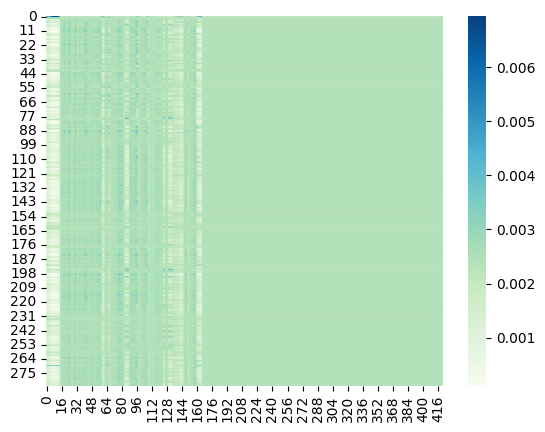


Epoch: 24/80


Val:   3%|▎         | 1/33 [00:05<02:55,  5.49s/it, dist=478.0067]

Ground Truth :  SUCH IS THE SELFISHNESS OF HUMAN NATURE
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:   6%|▌         | 2/33 [00:10<02:37,  5.09s/it, dist=480.8567]

Ground Truth :  I SHALL LOCK UP ALL THE DOORS AND WINDOWS IN THE HOUSE AND THEN I SHALL GIVE YOU MY LATCH KEY AND YOU CAN LET YOURSELF IN AND STAY THE NIGHT HERE THERE IS NO ONE IN THE HOUSE
Prediction   :  AND THE STREET WAS A STREET AND SO THE STREET WAS A STREET AND SO THE STREET WAS A STREET AND STRETCHED A STREET AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND ST


Val:   9%|▉         | 3/33 [00:15<02:31,  5.04s/it, dist=480.2267]

Ground Truth :  I DO NOT THINK THERE SHONE SO GREAT A LIGHT UNDER THE LIDS OF VENUS WHEN TRANSFIXED BY HER OWN SON BEYOND HIS USUAL CUSTOM
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  12%|█▏        | 4/33 [00:20<02:24,  4.97s/it, dist=480.6767]

Ground Truth :  SO LEAVING KIND MESSAGES TO GEORGE AND JANE WILSON AND HESITATING WHETHER SHE MIGHT DARE TO SEND A FEW KIND WORDS TO JEM AND DECIDING THAT SHE HAD BETTER NOT SHE STEPPED OUT INTO THE BRIGHT MORNING LIGHT SO FRESH A CONTRAST TO THE DARKENED ROOM WHERE DEATH HAD BEEN
Prediction   :  AND THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF THE CONSCIOUSNESS OF


Val:  15%|█▌        | 5/33 [00:25<02:19,  4.98s/it, dist=479.9493]

Ground Truth :  A YOUNG FELLOW WHO HAD BEEN HOVERING IN THE BACKGROUND AT ONCE STEPPED FORWARD
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  18%|█▊        | 6/33 [00:30<02:13,  4.96s/it, dist=479.6689]

Ground Truth :  IN TRUTH SHE SEEMED ABSOLUTELY HIDDEN BEHIND IT
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  21%|██        | 7/33 [00:35<02:09,  4.99s/it, dist=479.3314]

Ground Truth :  I CAN ASSURE YOU THAT THIS IS A MODERN FACE AND ONE WHICH YOU WILL VERY PROBABLY MEET
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  24%|██▍       | 8/33 [00:40<02:05,  5.00s/it, dist=479.5175]

Ground Truth :  ONCE THERE WAS A FATHER WHO THOUGHT HE WOULD BUILD FOR HIS CHILDREN A BEAUTIFUL HOME PUTTING INTO IT EVERY THING THEY COULD NEED OR DESIRE THROUGHOUT THEIR LIVES
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  27%|██▋       | 9/33 [00:44<01:58,  4.95s/it, dist=479.6859]

Ground Truth :  DRAT EM ALL WHAT IS IT THEY WANTS THEY DON'T KNOW WHAT THEY WANTS
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  30%|███       | 10/33 [00:50<01:54,  4.98s/it, dist=479.4327]

Ground Truth :  MISS WOODLEY OBEDIENTLY SAT DOWN AND THOUGH HER THOUGHTS AND HEART WERE IN THE CHAMBER OF HER FRIEND SHE NEVER MARKED BY ONE IMPERTINENT WORD OR BY ONE LINE OF HER FACE THE RESTRAINT SHE SUFFERED
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  33%|███▎      | 11/33 [00:54<01:48,  4.95s/it, dist=479.9521]

Ground Truth :  THE SPECIALTY OF THE HOF BRAU IS ABALONE'S AND THEY HAVE AS A FEATURE THIS SHELL FISH COOKED IN SEVERAL WAYS
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  36%|███▋      | 12/33 [00:59<01:44,  4.96s/it, dist=480.3456]

Ground Truth :  THEN THERE ARE IN ALL CLASSES A VERY LARGE NUMBER OF MEN CONSTANTLY OCCUPIED WITH THE SERIOUS AFFAIRS OF THE GOVERNMENT AND THOSE WHOSE THOUGHTS ARE NOT ENGAGED IN THE DIRECTION OF THE COMMONWEALTH ARE WHOLLY ENGROSSED BY THE ACQUISITION OF A PRIVATE FORTUNE
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  39%|███▉      | 13/33 [01:04<01:39,  4.96s/it, dist=480.0574]

Ground Truth :  MOREOVER JEAN VALJEAN HAD CHOSEN HIS REFUGE WELL
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  42%|████▏     | 14/33 [01:09<01:33,  4.92s/it, dist=480.0795]

Ground Truth :  A MINUTE IS NOT A VERY LARGE MEASURE OF TIME AND HIS BODY NEEDED EVERY FRACTION OF IT
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  45%|████▌     | 15/33 [01:14<01:28,  4.92s/it, dist=480.0320]

Ground Truth :  PERHAPS YOU CAN OUTWIT HER YET CRIED ANOTHER
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  48%|████▊     | 16/33 [01:19<01:23,  4.93s/it, dist=479.9692]

Ground Truth :  YOU'LL ALL BE OVER IF YOU DON'T HAVE A CARE
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  52%|█████▏    | 17/33 [01:24<01:19,  4.97s/it, dist=479.8737]

Ground Truth :  WHOSE FEET ARE AS THE FEET OF HARTS AND UNDERNEATH THE EVERLASTING ARMS
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  55%|█████▍    | 18/33 [01:29<01:14,  4.96s/it, dist=479.8559]

Ground Truth :  THE WHITE DOUBLE ROSEBUSH HAD EVIDENTLY BEEN PROPPED UP ANEW AGAINST THE HOUSE SINCE THE COMMENCEMENT OF THE SEASON AND A PEAR TREE AND THREE DAMSON TREES WHICH EXCEPT A ROW OF CURRANT BUSHES CONSTITUTED THE ONLY VARIETIES OF FRUIT BORE MARKS OF THE RECENT AMPUTATION OF SEVERAL SUPERFLUOUS OR DEFECTIVE LIMBS
Prediction   :  AND THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF T


Val:  58%|█████▊    | 19/33 [01:34<01:09,  4.93s/it, dist=479.8961]

Ground Truth :  WHAT MADE THE DIFFERENCE
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  61%|██████    | 20/33 [01:39<01:04,  4.96s/it, dist=479.7543]

Ground Truth :  I AM NOT THINKING ABOUT THE GARDEN MAMMA REPLIED THE YOUNG GIRL WITHOUT LIFTING UP HER FACE WE CAN PLANT NEW FLOWERS AND TIE UP EVEN SOME OF THESE AFRESH
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  64%|██████▎   | 21/33 [01:44<00:59,  4.97s/it, dist=479.9429]

Ground Truth :  MINNIE BEGAN TO EXPLAIN BUT HER HUSBAND TOOK THIS PART OF THE CONVERSATION TO HIMSELF
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  67%|██████▋   | 22/33 [01:49<00:54,  4.95s/it, dist=479.8745]

Ground Truth :  HE BEGAN TO WISH THAT HE HAD COMPROMISED IN SOME WAY OR OTHER THAT HE HAD SENT THE MONEY PERHAPS HE COULD DO IT UP HERE
Prediction   :  AND THE STREET WAS A STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STR


Val:  70%|██████▉   | 23/33 [01:54<00:49,  4.95s/it, dist=479.6994]

Ground Truth :  THAT WON'T LAST IT WILL GO AWAY AND THINGS WILL BE JUST AS THEY USED TO
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  73%|███████▎  | 24/33 [01:59<00:44,  4.93s/it, dist=479.7497]

Ground Truth :  SHE WAS DESTROYED NOT MERELY BY THE UNCONSIDERED UNDISCIPLINED PASSIONS OF HER HUSBAND AND HER LOVER BUT BY THE VAST TRADITION THAT SUSTAINS AND ENFORCES THE SUBJUGATION OF HER SEX
Prediction   :  AND THE STREET WAS A STREET AND SHE WAS A STREET AND STRETCHED THE STREET AND STOOD AND STOOD AT THE STORY OF THE STREET AND STOOD AND STOOD AT THE STORY OF THE STREET AND STOOD AND STOOD AT THE STORY OF THE STREET AND STOOD AND STOOD AT THE STORY OF THE STREET AND STOOD AND STOOD AT THE STORY OF THE STREET AND STOOD AND STOOD AT THE STORY OF THE STREET AND STOOD AND STOOD AT THE STORY OF THE STREET AND STOOD AND STOOD AT THE STORY OF THE STREET AND STOOD AND STOOD AT THE STORY OF THE STREET AND STOOD AND STOOD AT THE STORY OF THE STREET AND S


Val:  76%|███████▌  | 25/33 [02:04<00:39,  4.91s/it, dist=480.1240]

Ground Truth :  I DON'T WANT YOU TO I LOVE TO SEE YOU SO YOUNG AND HAPPY ONLY YOU ARE NOT THE OLD DAVID AND I'VE GOT TO GET ACQUAINTED WITH THE NEW ONE
Prediction   :  AND THE STREET WAS A STREET AND THE STREET AND THE STREET WAS A STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREE


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.87s/it, dist=480.3964]

Ground Truth :  ON THIS HE ROSE FROM HIS CHAIR AND GOING TO HER SAID ONCE MORE SHEW YOUR SUBMISSION BY OBEYING ME A SECOND TIME TO DAY
Prediction   :  AND THE STREET WAS A STREET AND SO THE STREET WAS A STREET AND SO THE STREET WAS A STREET AND SO THE STREET WAS A STREET AND SO THE STREET WAS A STREET AND SO THE STREET WAS A STREET AND SO THE STREET WAS A STREET AND STRETCHED A STREET AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AND STOOD AN


Val:  82%|████████▏ | 27/33 [02:13<00:29,  4.86s/it, dist=480.4622]

Ground Truth :  THEN SHE TOOK UP HANSEL WITH HER ROUGH HAND AND SHUT HIM UP IN A LITTLE CAGE WITH A LATTICE DOOR AND ALTHOUGH HE SCREAMED LOUDLY IT WAS OF NO USE
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  85%|████████▍ | 28/33 [02:18<00:24,  4.89s/it, dist=480.5245]

Ground Truth :  I ALSO OFFERED TO HELP YOUR BROTHER TO ESCAPE BUT HE WOULD NOT GO
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  88%|████████▊ | 29/33 [02:23<00:19,  4.94s/it, dist=480.4685]

Ground Truth :  THE BOY HASTENED AWAY AND THE MANAGER FELL TO HIS MUSINGS
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  91%|█████████ | 30/33 [02:28<00:14,  4.94s/it, dist=480.4458]

Ground Truth :  MONEY IS FALSE AND LIGHT UNLESS IT BE BOUGHT BY A MAN'S OWN WORTHY QUALITIES AND BLOOD IS SUCH THAT ITS CORRUPT DISEASE AND IGNORANT PRETENCE ARE FOUL TO SEE
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  94%|█████████▍| 31/33 [02:33<00:09,  4.88s/it, dist=480.6406]

Ground Truth :  THE OTHER LOOKED PALE AND ILL BUT HE WAS MARVELLOUSLY SELF CONTAINED AND IT WAS IMPOSSIBLE TO SAY WHAT WAS THE MATTER WITH HIM
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val:  97%|█████████▋| 32/33 [02:38<00:04,  4.89s/it, dist=480.6750]

Ground Truth :  NOT EXACTLY RETURNED KALIKO
Prediction   :  AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WAS A STREET AND THE STREET WA


Val: 100%|██████████| 33/33 [02:39<00:00,  3.92s/it, dist=481.0311]

Ground Truth :  BUT PUT IT ON THE TABLE IN THE CORNER OF THE PASSAGE
Prediction   :  AND THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF T


	Train Loss 1.2458	 Learning Rate 0.0009293
	Val Dist 481.0311	
	Teacher Forcing Ratio 1	


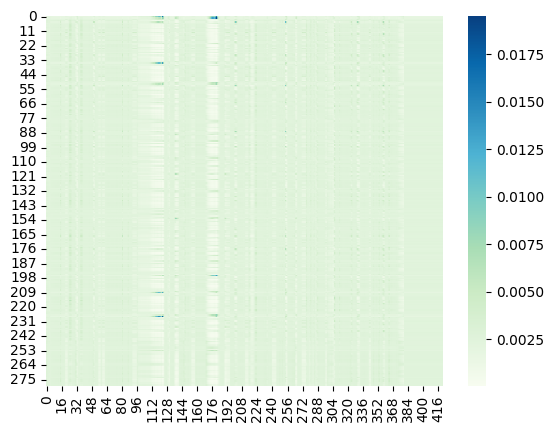


Epoch: 25/80


Val:   3%|▎         | 1/33 [00:05<02:50,  5.33s/it, dist=486.8000]

Ground Truth :  MAC CONNELL LET ME INTRODUCE MISTER BARTLEY ALEXANDER
Prediction   :  MY SHOULDER WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF 


Val:   6%|▌         | 2/33 [00:10<02:36,  5.06s/it, dist=483.3533]

Ground Truth :  GALLOPING INTO CAMP THE BOY FETCHED HIS SOMBRERO WHICH HE CARRIED WELL OUT INTO THE FIELD AND TOSSED AWAY
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREE


Val:   9%|▉         | 3/33 [00:15<02:30,  5.03s/it, dist=481.6222]

Ground Truth :  IT WAS A MONOTONOUS LIFE BUT IT WAS VERY HEALTHY AND ONE DOES NOT MUCH MIND ANYTHING WHEN ONE IS WELL
Prediction   :  IT WAS A STRANGE AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STAT


Val:  12%|█▏        | 4/33 [00:20<02:24,  4.98s/it, dist=481.7217]

Ground Truth :  OH EMIL
Prediction   :  I WAS A STRANGE STREET AND THE SAME THING I HAVE NOT BEEN A STRANGE STREET AND THE SAME THING I HAVE NOT BEEN A STRANGE STREET AND THE SAME THING I HAVE NOT BEEN A STRANGE STREET AND THE SAME THING I HAVE NOT BEEN A STRANGE STREET AND THE SAME THING I HAVE NOT BEEN A STRANGE STREET AND THE SAME THING I HAVE NOT BEEN A STRANGE STREET AND THE SAME THING I HAVE NOT BEEN A STRANGE STREET AND THE SAME THING I HAVE NOT BEEN A STRANGE STREET AND THE SAME THING I HAVE NOT BEEN A STRANGE STREET AND THE SAME THING I HAVE NOT BEEN A STRANGE STREET AND TH


Val:  15%|█▌        | 5/33 [00:25<02:19,  4.98s/it, dist=481.1573]

Ground Truth :  I'LL TRY IF I KNOW ALL THE THINGS I USED TO KNOW
Prediction   :  I WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREE


Val:  18%|█▊        | 6/33 [00:30<02:14,  4.97s/it, dist=481.4778]

Ground Truth :  AND AT THE FIRST IT SEEMED TO ME THAT I SAW CERTAIN FACES OF WOMEN WITH THEIR HAIR LOOSENED WHICH CALLED OUT TO ME THOU SHALT SURELY DIE AFTER THE WHICH OTHER TERRIBLE AND UNKNOWN APPEARANCES SAID UNTO ME THOU ART DEAD
Prediction   :  THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE


Val:  21%|██        | 7/33 [00:34<02:08,  4.95s/it, dist=481.9267]

Ground Truth :  BUT SHE LEFT HIM NO PEACE TILL HE CONSENTED SAYING AH BUT I SHALL MISS THE POOR CHILDREN
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRE


Val:  24%|██▍       | 8/33 [00:39<02:01,  4.88s/it, dist=482.6717]

Ground Truth :  THE PLAYWRIGHT GAVE MAINHALL A CURIOUS LOOK OUT OF HIS DEEP SET FADED EYES AND MADE A WRY FACE
Prediction   :  THE STREET OF THE STREET WAS A STRANGE CONSEQUENCE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF T


Val:  27%|██▋       | 9/33 [00:44<01:56,  4.86s/it, dist=483.3222]

Ground Truth :  IN THE VALLEY OF THE SHADOW OF DEATH HE IS WITH US
Prediction   :  AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE S


Val:  30%|███       | 10/33 [00:49<01:51,  4.85s/it, dist=483.6547]

Ground Truth :  HE HAD SEEN GREAT THINGS AND HE HAD DONE HIS SHARE OF THEM
Prediction   :  HE WAS A STRANGE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE


Val:  33%|███▎      | 11/33 [00:54<01:47,  4.90s/it, dist=483.3939]

Ground Truth :  IT TRULY IS ASSERTED THE MAGICIAN
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRE


Val:  36%|███▋      | 12/33 [00:59<01:42,  4.89s/it, dist=483.1667]

Ground Truth :  TWO MONSTERS ONLY WERE CREATING ALL THIS COMMOTION AND BEFORE MY EYES ARE TWO REPTILES OF THE PRIMITIVE WORLD
Prediction   :  SHE WAS A STRANGE AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE ST


Val:  39%|███▉      | 13/33 [01:04<01:38,  4.90s/it, dist=482.8574]

Ground Truth :  HEAVEN HELP THAT BODY WHICH A LITTLE MIND HOUSED IN A HEAD LACKING EARS TONGUE AND EYES AND SENSELESS BUT FOR SMELL CAN TYRANNISE
Prediction   :  PROMISED TO BE A STRANGE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STAT


Val:  42%|████▏     | 14/33 [01:09<01:33,  4.93s/it, dist=482.3124]

Ground Truth :  WHEN WE WERE OUT IN THE DARKNESS OF THE QUADRANGLE WE AGAIN LOOKED UP AT THE WINDOWS
Prediction   :  WHEN THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE 


Val:  45%|████▌     | 15/33 [01:14<01:29,  4.95s/it, dist=482.3431]

Ground Truth :  THEY WERE WITHIN A FEW MILES OF THEIR VILLAGE NOW
Prediction   :  THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE


Val:  48%|████▊     | 16/33 [01:18<01:23,  4.89s/it, dist=482.4754]

Ground Truth :  I AM NOT A MAN WHO CAN LIVE TWO LIVES HE WENT ON FEVERISHLY EACH LIFE SPOILS THE OTHER
Prediction   :  I HAVE NOT BEEN A SHORT STATE OF THE SAME TIME THE SAME THING I HAVE NOT BEEN A SHORT STATE OF THE SAME TIME THE SAME THING I HAVE NOT BEEN A SHORT STATE OF THE SAME TIME THE SAME THING I HAVE NOT BEEN A SHORT STATE OF THE SAME TIME THE SAME THING I HAVE NOT BEEN A SHORT STATE OF THE SAME TIME THE SAME THING I HAVE NOT BEEN A SHORT STATE OF THE SAME TIME THE SAME THING I HAVE NOT BEEN A SHORT STATE OF THE SAME TIME THE SAME THING I HAVE NOT BEEN A SHORT STATE OF THE SAME TIME THE SAME THING I HAVE NOT BEEN A SHORT STATE OF THE SAME TIME THE SA


Val:  52%|█████▏    | 17/33 [01:23<01:18,  4.88s/it, dist=482.5941]

Ground Truth :  THERE COULD BE LITTLE ART IN THIS LAST AND FINAL ROUND OF FENCING
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AN


Val:  55%|█████▍    | 18/33 [01:28<01:12,  4.83s/it, dist=482.7263]

Ground Truth :  THROUGHOUT THIS CENTURY THE POWER OF THE CHURCH WAS CONSTANTLY ON THE INCREASE AND IS VISIBLE IN MANY IMPORTANT CHANGES
Prediction   :  FOR THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF THE PRESENCE OF T


Val:  58%|█████▊    | 19/33 [01:33<01:07,  4.86s/it, dist=482.5867]

Ground Truth :  I HAVE NEVER KNOWN A MADGE AND YET FROM MY BOYHOOD UPWARD I HAVE DESIRED TO MEET ONE
Prediction   :  AND THE STREET OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE O


Val:  61%|██████    | 20/33 [01:38<01:03,  4.89s/it, dist=482.4577]

Ground Truth :  THEREFORE MY ANSWER IS WITH GREATER CARE THAT HE MAY HEAR ME WHO IS WEEPING YONDER SO THAT THE SIN AND DOLE BE OF ONE MEASURE
Prediction   :  THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE


Val:  64%|██████▎   | 21/33 [01:43<00:59,  4.94s/it, dist=482.3079]

Ground Truth :  GIVING THEMSELVES UP WHOLLY TO THEIR GRIEF THEY ARE NO LONGER CONCERNED ABOUT ANY EARTHLY POSSESSION AND OFTEN GIVE AWAY ALL THAT THEY HAVE TO THE FIRST COMERS EVEN TO THEIR BEDS AND THEIR HOME
Prediction   :  HE WAS A LITTLE AND THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE


Val:  67%|██████▋   | 22/33 [01:48<00:54,  4.93s/it, dist=482.1024]

Ground Truth :  HE WOULD SEE HOW THINGS TURNED OUT TO MORROW AND THEN HE WOULD TALK TO HER THEY WERE GOING TO MEET AS USUAL
Prediction   :  HE WAS A STRANGE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE


Val:  70%|██████▉   | 23/33 [01:53<00:49,  4.94s/it, dist=482.0759]

Ground Truth :  FIFTEEN OFFICERS OF OUR LITTLE HALF REGIMENT WERE DEAD OR WOUNDED
Prediction   :  HE WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A 


Val:  73%|███████▎  | 24/33 [01:58<00:44,  4.96s/it, dist=481.7936]

Ground Truth :  AT THE END OF IT SHE WAS IN A PLACE OF TOMBS
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET 


Val:  76%|███████▌  | 25/33 [02:03<00:39,  4.93s/it, dist=481.9725]

Ground Truth :  THE PHYSICIAN WHO ATTENDED HIM WAS NAMED TERRO HE THOUGHT BY SOME PECULIAR TRAIN OF REASONING THAT HE COULD CURE HIM BY APPLYING A MERCURIAL OINTMENT TO THE CHEST TO WHICH NO ONE RAISED ANY OBJECTION
Prediction   :  THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.94s/it, dist=481.7423]

Ground Truth :  DID THEY KNOW OF THE EXISTENCE OF THE PRISONERS OR WAS IT SOME PRIVATE ENTERPRISE THAT LED TO THE UNDERTAKING
Prediction   :  THE PRINCESS WAS A PRESENT OF THE PRESENT PROPERTY THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPERTY OF THE PRESENT PROPER


Val:  82%|████████▏ | 27/33 [02:13<00:29,  4.97s/it, dist=481.6654]

Ground Truth :  OF COURSE THESE ARE NOT THE ENTIRE MENUS BUT OF ALL THE WELL PREPARED DISHES THESE ARE THEIR BEST
Prediction   :  AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET WAS A STRANGE STREET


Val:  85%|████████▍ | 28/33 [02:17<00:24,  4.92s/it, dist=481.8131]

Ground Truth :  DON'T MOVE AROUND LIE PERFECTLY STILL WARNED THE GUIDE ARE YOU HURT
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREE


Val:  88%|████████▊ | 29/33 [02:22<00:19,  4.89s/it, dist=481.8600]

Ground Truth :  THE JOYOUS CONVULSION OF LAUGHTER WAS AS A TRIBUTE PAID THEY SUBMITTED TO IT GLADLY BUT ALMOST MECHANICALLY
Prediction   :  THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE S


Val:  91%|█████████ | 30/33 [02:27<00:14,  4.93s/it, dist=481.7427]

Ground Truth :  BUT YOU OUGHT TO HAVE KNOWN THAT WE ARE ONLY HALF AN HOUR BEHIND YOU AT SYDENHAM IN THE MATTER OF NEWS
Prediction   :  THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE STATE OF THE


Val:  94%|█████████▍| 31/33 [02:32<00:09,  4.93s/it, dist=481.8929]

Ground Truth :  I WAS PERSUADED THAT SOMEBODY BESIDES THAT COUSIN GOT A PROFIT OUT OF MARY ANN'S ENGAGEMENT RING BUT I HANDED OVER THE AMOUNT
Prediction   :  I WAS A STRANGE STREET AND THE SAME TIME I WAS A STRANGE STREET AND THE SAME TIME I WAS A STRANGE STREET AND THE SAME TIME I WAS A STRANGE STREET AND THE SAME TIME I WAS A STRANGE STREET AND THE SAME TIME I WAS A STRANGE STREET AND THE SAME TIME I WAS A STRANGE STREET AND THE SAME TIME I WAS A STRANGE STREET AND THE SAME TIME I WAS A STRANGE STREET AND THE SAME TIME I WAS A STRANGE STREET AND THE SAME TIME I WAS A STRANGE STREET AND THE SAME TIME I WAS A STRANGE STREET AND THE SAME TIME I WAS A STRANGE STREET AND THE SAME TIME I WAS A STRANGE 


Val:  97%|█████████▋| 32/33 [02:37<00:04,  4.93s/it, dist=481.7369]

Ground Truth :  THE MENS SANA MUST HAVE A CORPUS SANUM TO INHABIT
Prediction   :  THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET WAS A STRANGE STREET AND THE STREE


Ground Truth :  THE CHAOS IN WHICH HIS ARDOUR EXTINGUISHED ITSELF WAS A COLD INDIFFERENT KNOWLEDGE OF HIMSELF
Prediction   :  THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE STREET WAS A STRANGE STREET THE S
	Train Loss 1.2384	 Learning Rate 0.0009174
	Val Dist 481.7017	
	Teacher Forcing Ratio 1	


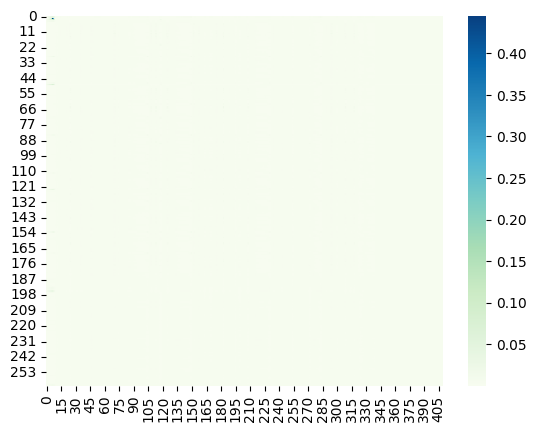


Epoch: 26/80


Val:   3%|▎         | 1/33 [00:05<02:56,  5.50s/it, dist=480.1400]

Ground Truth :  HE KNOWS THEM BOTH
Prediction   :  HE WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STRE


Val:   6%|▌         | 2/33 [00:10<02:38,  5.12s/it, dist=479.4367]

Ground Truth :  AMONG US ALL MEN WERE CREATED SONS OF GOD AND STOOD ERECT AS CONSCIOUS OF THEIR DIVINITY
Prediction   :  A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STRE


Val:   9%|▉         | 3/33 [00:15<02:31,  5.04s/it, dist=479.9867]

Ground Truth :  OH YOU SIMPLETON SAID SHE THEN WE MUST ALL FOUR DIE OF HUNGER YOU HAD BETTER PLANE THE COFFINS FOR US
Prediction   :  PROVIDED THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE


Val:  12%|█▏        | 4/33 [00:20<02:24,  5.00s/it, dist=477.7983]

Ground Truth :  NEITHER DID THE FRONT INDICATE ABSOLUTE SECURITY FROM DANGER
Prediction   :  MISSUS CARLYLE WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE 


Val:  15%|█▌        | 5/33 [00:24<02:17,  4.91s/it, dist=477.6760]

Ground Truth :  I AM NOT A MAN WHO CAN LIVE TWO LIVES HE WENT ON FEVERISHLY EACH LIFE SPOILS THE OTHER
Prediction   :  I SHOULD NOT SEE HIM THAT I HAVE NOT BEEN A STRANGE STRANGE STRANGE STRANGE STRANGE STRENGTH I SHOULD NOT SEE THE STREET I SHOULD NOT SEE THE STREET I SHOULD NOT SEE THE STREET I SHOULD NOT SEE THE STREET I SHOULD NOT SEE THE STREET I SHOULD NOT SEE THE STREET I SHOULD NOT SEE THE STREET I SHOULD NOT SEE THE STREET I SHOULD NOT SEE THE STREET I SHOULD NOT SEE THE STREET I SHOULD NOT SEE THE STREET I SHOULD NOT SEE THE STREET I SHOULD NOT SEE THE STREET I SHOULD NOT SEE THE STREET I SHOULD NOT SEE THE STREET I SHOULD NOT SEE THE STREET I SHOULD


Val:  18%|█▊        | 6/33 [00:29<02:12,  4.89s/it, dist=477.8189]

Ground Truth :  A WRANGLER'S A WRANGLER ANSWERED BIG FOOT STOLIDLY
Prediction   :  AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE


Val:  21%|██        | 7/33 [00:34<02:07,  4.92s/it, dist=477.8486]

Ground Truth :  IT GAVE AN IMPOSING APPEARANCE TO MOST OF THE WHOLESALE HOUSES WHOSE OFFICES WERE UPON THE GROUND FLOOR AND IN PLAIN VIEW OF THE STREET
Prediction   :  IN THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET


Val:  24%|██▍       | 8/33 [00:39<02:03,  4.95s/it, dist=477.5883]

Ground Truth :  LADY LADY MY ROSE WHITE LADY BUT WILL YOU NOT HEAR A ROUNDEL LADY
Prediction   :  WHEN THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF T


Val:  27%|██▋       | 9/33 [00:44<01:58,  4.96s/it, dist=477.1763]

Ground Truth :  SO HE ENLISTED AND WENT TO SOUTH AFRICA AND HE NEVER CAME HOME COVERED WITH MEDALS AND GLORY WHICH WAS RATHER HIS IDEA TO THE FEW SIMPLE WORDS OF EXPLANATION THAT WOULD HAVE MADE ALL STRAIGHT AND REPAID HER AND HIM FOR ALL THE PAST
Prediction   :  SO THAT THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND T


Val:  30%|███       | 10/33 [00:49<01:53,  4.92s/it, dist=477.6853]

Ground Truth :  I KNOW IT SOUNDS FOOLISH BUT THE ALTERNATIVE IS SO IMPROBABLE
Prediction   :  I SAW THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE ST


Val:  33%|███▎      | 11/33 [00:54<01:49,  4.97s/it, dist=476.9048]

Ground Truth :  BEFORE I CONSENTED TO ANSWER THE CHILD'S INQUIRIES I CAME TO AN UNDERSTANDING WITH HER MOTHER
Prediction   :  THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE 


Val:  36%|███▋      | 12/33 [00:59<01:43,  4.94s/it, dist=477.0839]

Ground Truth :  AS TO ANY OTHER KIND OF DISCIPLINE WHETHER ADDRESSED TO HER MIND OR HEART LITTLE PEARL MIGHT OR MIGHT NOT BE WITHIN ITS REACH IN ACCORDANCE WITH THE CAPRICE THAT RULED THE MOMENT
Prediction   :  AS THE MAN WAS A STRANGE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERA


Val:  39%|███▉      | 13/33 [01:04<01:38,  4.94s/it, dist=477.4446]

Ground Truth :  CHAPTER SIXTEEN WHY THE NATIONAL VANITY OF THE AMERICANS IS MORE RESTLESS AND CAPTIOUS THAN THAT OF THE ENGLISH
Prediction   :  TO THE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET OF THE STREET AND THE STREET WAS A STRANGE STREET AND THE STREET 


Val:  42%|████▏     | 14/33 [01:09<01:32,  4.89s/it, dist=477.4752]

Ground Truth :  THEN SAW I MANY BROKEN HINTED SIGHTS IN THE UNCERTAIN STATE I STEPP'D INTO
Prediction   :  MISSUS STRANGER AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE 


Val:  45%|████▌     | 15/33 [01:14<01:27,  4.89s/it, dist=477.5027]

Ground Truth :  BESIDES THE SMALL FRY THE SWALLOWERS OF SWORDS AND THE GRIMACE MAKERS REAL PERFORMANCES TOOK PLACE ON THE GREEN
Prediction   :  THE STREET OF THE STREET WAS A STRANGER AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET O


Val:  48%|████▊     | 16/33 [01:19<01:23,  4.91s/it, dist=477.6179]

Ground Truth :  THERE'S A KNOCKER IF NONE OF EM HAVEN'T TWISTED IT OFF
Prediction   :  THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STR


Val:  52%|█████▏    | 17/33 [01:24<01:18,  4.91s/it, dist=477.9118]

Ground Truth :  THEY MADE ME THINK OF DEFEATED ARMIES RETREATING OR OF GHOSTS WHO WERE TRYING DESPERATELY TO GET IN FOR SHELTER AND THEN WENT MOANING ON
Prediction   :  THE SHORT SHOULDER OF THE SHORE WAS A SHARP STREET AND THE SHORT SHOULDER OF THE SHORE AND THE SHORT SHOULDER OF THE SHORE AND THE SHORT SHOULDER OF THE SHORE AND THE SHORT SHOULDER OF THE SHORE AND THE SHORT SHOULDER OF THE SHORE AND THE SHORT SHOULDER OF THE SHORE AND THE SHORT SHOULDER OF THE SHORE AND THE SHORT SHOULDER OF THE SHORE AND THE SHORT SHOULDER OF THE SHORE AND THE SHORT SHOULDER OF THE SHORE AND THE SHORT SHOULDER OF THE SHORE AND THE SHORT SHOULDER OF THE SHORE AND THE SHORT SHOULDER OF THE SHORE AND THE SHORT SHOULDER OF THE 


Val:  55%|█████▍    | 18/33 [01:28<01:13,  4.92s/it, dist=477.8407]

Ground Truth :  THIS IS PHYSICALLY IMPOSSIBLE WHEN CONSCIOUS
Prediction   :  THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AN


Val:  58%|█████▊    | 19/33 [01:33<01:09,  4.94s/it, dist=477.7670]

Ground Truth :  MASS SUICIDE THAT'S WHAT IT WAS NOTICE WHAT'S IN THE CORNERS
Prediction   :  MISSUS MANNER WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRENGTH AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE


Val:  61%|██████    | 20/33 [01:38<01:04,  4.97s/it, dist=477.6873]

Ground Truth :  AY SHE ANSWERED HALF BITTERLY AND WOULD THAT WE COULD LIVE WITHOUT FOOD AND IMITATE PERFECTLY THE IMMORTAL GODS
Prediction   :  I WAS A STRANGE STRANGE CONSTANT CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CONSTANT CONSIDERABLE CON


Val:  64%|██████▎   | 21/33 [01:43<00:59,  4.93s/it, dist=477.8425]

Ground Truth :  IT WILL BE SEEN THAT I DID NOT SUCCEED IN MY DESIGN AND THAT HOWEVER MUCH I MAY HAVE MET WITH THAT WAS NEW AND STRANGE I HAVE BEEN UNABLE TO REAP ANY PECUNIARY ADVANTAGE
Prediction   :  IT IS A MAN I SAW THE MAN I SAW THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STR


Val:  67%|██████▋   | 22/33 [01:48<00:54,  4.92s/it, dist=478.0042]

Ground Truth :  WHEN THE MESSIAH WAS DELIVERED INTO THE HANDS OF THE JEWS THE CHRIST AN IMMORTAL AND IMPASSIBLE BEING FORSOOK HIS EARTHLY TABERNACLE FLEW BACK TO THE PLEROMA OR WORLD OF SPIRITS AND LEFT THE SOLITARY JESUS TO SUFFER TO COMPLAIN AND TO EXPIRE
Prediction   :  WHEN THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE 


Val:  70%|██████▉   | 23/33 [01:53<00:48,  4.89s/it, dist=478.1154]

Ground Truth :  HE HAD PAID HER SIX MONTHS IN ADVANCE AND HAD COMMISSIONED THE OLD WOMAN TO FURNISH THE CHAMBER AND DRESSING ROOM AS WE HAVE SEEN
Prediction   :  HE HAD SEEN THE STREET AND STRANGE AND STRANGE AND SO THE STREET OF THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND T


Val:  73%|███████▎  | 24/33 [01:58<00:44,  4.91s/it, dist=478.0161]

Ground Truth :  THEN SHE WALKED AND SANG TO IT UNTIL HANSON DISTURBED IN HIS READING CAME AND TOOK IT
Prediction   :  THE STREET OF THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET AND THE STREET


Val:  76%|███████▌  | 25/33 [02:03<00:39,  4.94s/it, dist=477.9163]

Ground Truth :  THE AUTHOR HAS CONSIDERED IT HARDLY WORTH HIS WHILE THEREFORE RELENTLESSLY TO IMPALE THE STORY WITH ITS MORAL AS WITH AN IRON ROD OR RATHER AS BY STICKING A PIN THROUGH A BUTTERFLY THUS AT ONCE DEPRIVING IT OF LIFE AND CAUSING IT TO STIFFEN IN AN UNGAINLY AND UNNATURAL ATTITUDE
Prediction   :  THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE MAN WHO WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE MAN WHO WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET WAS A STRANGE 


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.94s/it, dist=477.8913]

Ground Truth :  THEN CAPTAIN BURGESS CRIED NORTH HIS PALE FACE FLUSHING I TELL YOU THE BOY'S BLOOD WILL BE ON YOUR HEAD
Prediction   :  THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AN


Val:  82%|████████▏ | 27/33 [02:13<00:29,  4.90s/it, dist=477.8526]

Ground Truth :  HOW CAN WE FEED OUR CHILDREN WHEN WE HAVE NO MORE THAN WE CAN EAT OURSELVES
Prediction   :  HOW MUCH AS I SHOULD HAVE THE SAME TIME THE SHADOW OF THE SHORE WAS A SHARP STREET AND THE SHORT SHOULDER OF THE SHORE WAS A SHORT SHE WAS A SHARP STREET AND THE SHORT SHOULDER OF THE SHORE WAS A SHORT SHORT SHE WAS A SHORT SHORT SHE WAS A SHORT SHORT SHE WAS A SHORT SHE WAS A SHORT SHE WAS A SHORT SHE WAS A SHORT SHE WAS A SHARP STREET AND THE SHORT SHOULDER OF THE SHORE WAS A SHORT SHORT SHE WAS A SHORT SHORT SHE WAS A SHORT SHORT SHE WAS A SHORT SHE WAS A SHORT SHE WAS A SHORT SHE WAS A SHORT SHE WAS A SHARP STREET AND THE SHORT SHOULDER OF


Val:  85%|████████▍ | 28/33 [02:18<00:24,  4.94s/it, dist=477.8081]

Ground Truth :  NOR WAS HIS SENSE OF SECURITY INCREASED WHEN IN SHIFTING HIS POSITION THE TORCH FELL FROM HIS GRASP THE FAGOTS SCATTERING AS THEY SLIPPED DOWN BETWEEN THE LIMBS OF THE TREE AND WHIRLING IN EVER DIMINISHING CIRCLES UNTIL FINALLY HE HEARD THEM CLATTER ON THE ROCKS BELOW
Prediction   :  NOT THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE STREET AND THE STREET OF THE STREET AND THE


Val:  88%|████████▊ | 29/33 [02:23<00:19,  4.92s/it, dist=477.8080]

Ground Truth :  THE CHILD HAD A NATIVE GRACE WHICH DOES NOT INVARIABLY CO EXIST WITH FAULTLESS BEAUTY ITS ATTIRE HOWEVER SIMPLE ALWAYS IMPRESSED THE BEHOLDER AS IF IT WERE THE VERY GARB THAT PRECISELY BECAME IT BEST
Prediction   :  THE PRINCESS WAS A PRINCE OF THE PRINCESS WHICH IS THE PRESENT PROPERTY OF THE PRINCESS WHICH IS THE PRESENT PROPERTY OF THE PRINCESS THE PRINCESS WAS A PRINCE OF THE PRINCESS WHICH IS THE PRESENT PROPERTY OF THE PRINCESS WHICH IS THE PRESENT PROPERTY OF THE PRINCESS THAT IS THE PRESENT PROPERTY OF THE PRINCESS THAT IS THE PRESENT PROPERTY OF THE PRINCESS THAT IS THE PRINCESS OF THE PRINCESS THAT IS THE PRINCESS OF THE PRINCESS THAT IS THE PRINCESS OF THE PRINCESS THAT IS THE PRINCESS OF THE PRINCESS IT IS A PRINCE THAT I SHOULD BE SO STRANGE 


Val:  91%|█████████ | 30/33 [02:28<00:14,  4.94s/it, dist=477.6611]

Ground Truth :  SHE ASKED PETER TO WAIT A MOMENT AND WHEN SHE CAME BACK FROM THE KITCHEN SHE BROUGHT A BAG OF SANDWICHES AND DOUGHNUTS FOR US
Prediction   :  SHE WAS A SHARP SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT SHE SAID TO THE SHORT


Val:  94%|█████████▍| 31/33 [02:33<00:09,  4.96s/it, dist=477.5996]

Ground Truth :  BUT FROM THE CAUTIOUS MOVEMENTS OF THE LIGHT FAR BELOW THEM THE GUIDE UNDERSTOOD THAT THE LAD WAS AT WORK CARRYING OUT HIS PART OF THE TASK OF RESCUE TO THE BEST OF HIS ABILITY
Prediction   :  THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STREET THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STREET THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STREET THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STREET THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STREET THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STREET THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STREET THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRA


Val:  97%|█████████▋| 32/33 [02:38<00:04,  4.92s/it, dist=477.6550]

Ground Truth :  WHILE THUS DISMISSING HER THE MAIDEN LADY STEPT FORWARD KISSED PHOEBE AND PRESSED HER TO HER HEART WHICH BEAT AGAINST THE GIRL'S BOSOM WITH A STRONG HIGH AND TUMULTUOUS SWELL
Prediction   :  WHEN THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE STREET WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STR


Ground Truth :  PLACE IT OVER THE FIRE KEEP CONSTANTLY STIRRING TO PREVENT ITS BURNING AND WHEN QUITE DRY PUT IN A SMALL PIECE OF BUTTER
Prediction   :  PROPER AND THE STREET WAS A STRANGE PRINCE AND THE STREET WAS A STRANGE PRINCE AND THE STREET AND THE STREET WAS A STRANGE PRINCE AND THE STREET AND THE STREET WAS A STRANGE PRINCE AND THE STREET AND THE STREET WAS A STRANGE PRINCE AND THE STREET AND THE STREET WAS A STRANGE PRINCE AND THE STREET AND THE STREET WAS A STRANGE PRINCE AND THE STREET AND THE STREET WAS A STRANGE PRINCE AND THE STREET AND THE STREET WAS A STRANGE PRINCE AND THE STREET AND THE STREET WAS A STRANGE PRINCE AND THE STREET AND THE STREET WAS A STRANGE PRINCE AND THE STR
	Train Loss 1.2266	 Learning Rate 0.0009046
	Val Dist 477.5026	


	Teacher Forcing Ratio 1	


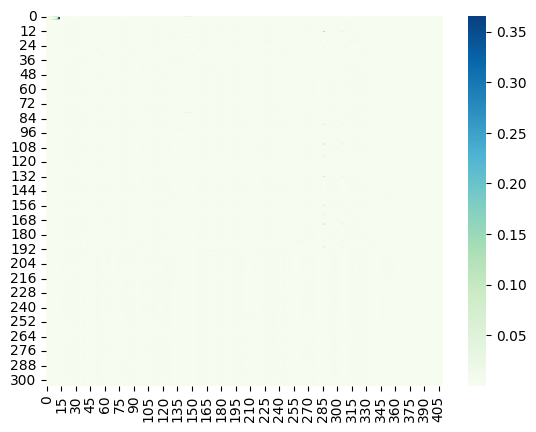


Epoch: 27/80


Val:   3%|▎         | 1/33 [00:05<02:53,  5.43s/it, dist=478.8600]

Ground Truth :  IT WAS ONE WHICH GAVE ME A SMALL TRIUMPH OVER GEORGE
Prediction   :  IT WAS A SWEET SMALL SWORD WHICH WAS A SWEET SMALL SWORD WHICH WAS A SWEET SMALL SWORD WHICH WAS A SWEET SMALL SWORD WHICH WAS A SWEET SMALL SWORD WHICH WAS A SWEET SMALL SWORD WHICH WAS A SWEET SMALL SWORD WHICH WAS A SWEET SMALL SWORD WHICH WAS A SWEET SMALL SWORD WHICH WAS A SWEET SMALL SWORD WHICH WAS A SWEET SMALL SWORD WHICH WAS A SWEET SMALL SWORD WHICH WAS A SWEET SMALL SWORD WHICH WAS A SWEET SMALL SWORD WHICH WAS A SWEET SMALL SWORD WHICH WAS A SWEET SMALL SWORD WHICH WAS A SWEET SMALL SWORD WHICH WAS A SWEET SMALL SWORD WHICH WAS A 


Val:   6%|▌         | 2/33 [00:10<02:36,  5.06s/it, dist=479.9533]

Ground Truth :  HIS HAIR HAVING PROBABLY BEEN DYED WITH SOME CORROSIVE PREPARATION HAD LEFT IT WOOLLY AND ROUGH TO THE TOUCH
Prediction   :  HIS PROPERTY WAS A SHORT SHORT PROPERTY OF THE TABLE AND THE THING WAS A SHORT SHORT PROPERTY OF THE TABLE AND THE THING WAS A SHORT SHORT PROPERTY OF THE TABLE AND THE THING WAS A SHORT SHORT PROPERTY OF THE TABLE AND THE THING WAS A SHORT SHORT PROPERTY OF THE TABLE AND THE THING WAS A SHORT SHORT PROPERTY OF THE TABLE AND THE THING WAS A SHORT SHORT PROPERTY OF THE TABLE AND THE THING WAS A SHORT SHORT PROPERTY OF THE TABLE AND THE THING WAS A SHORT SHORT PROPERTY OF THE TABLE AND THE THING WAS A SHORT SHORT PROPERTY OF THE TABLE AND THE TH


Val:   9%|▉         | 3/33 [00:15<02:30,  5.03s/it, dist=479.0956]

Ground Truth :  TAKING EVERYTHING UPON MYSELF I ORDERED A SERVANT TO HURRY OUT FOR A PHYSICIAN WHO CAME IN A SHORT TIME AND ORDERED THE PATIENT TO BE BLED AGAIN THUS APPROVING THE FIRST BLEEDING PRESCRIBED BY ME
Prediction   :  THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE PROPERTY OF THE P


Val:  12%|█▏        | 4/33 [00:19<02:22,  4.92s/it, dist=480.1183]

Ground Truth :  NOW LET'S BE BRAVE AND ENJOY EVERY MINUTE OF IT
Prediction   :  NOT THE SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECI


Val:  15%|█▌        | 5/33 [00:24<02:16,  4.87s/it, dist=480.2960]

Ground Truth :  HE IS THE ONE WITH THE WORST RECORD
Prediction   :  PERHAPS THE WORLD WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE WORLD WAS A STRANGE STRANGE STRANGE STRANGE STREET AND THE WORLD WAS A STRANGE STRANGE STRANGE STRANGE STREET AND THE WORLD WAS A STRANGE STRANGE STRANGE STRANGE STREET AND THE WORLD WAS A STRANGE STRANGE STRANGE STRANGE STREET AND THE WORLD WAS A STRANGE STRANGE STRANGE STREET AND THE WORLD WAS A STRANGE STRANGE STRANGE STREET AND THE WORLD WAS A STRANGE STRANGE STRANGE STREET AND THE WORLD WAS A STRANGE STRANGE STRANGE STREET AND THE WORLD WAS A STRANGE STRANGE ST


Val:  18%|█▊        | 6/33 [00:29<02:10,  4.83s/it, dist=480.5844]

Ground Truth :  IT WAS THE YOUNGEST ONE WHO DECEIVED ME CRIED THE ROBBER CHIEFTAIN
Prediction   :  THE REST OF THE REST OF THE ROOM WAS A SENSE OF THE REST OF THE REST OF THE ROOM AND THE REST OF THE ROOM WAS A SENSE OF THE REST OF THE REST OF THE ROOM AND THE REST OF THE ROOM WAS A SENSE OF THE REST OF THE REST OF THE ROOM AND THE REST OF THE ROOM WAS A SENSE OF THE REST OF THE REST OF THE ROOM AND THE REST OF THE ROOM WAS A SENSE OF THE REST OF THE REST OF THE ROOM AND THE REST OF THE ROOM WAS A SENSE OF THE REST OF THE REST OF THE ROOM AND THE REST OF THE ROOM WAS A SENSE OF THE REST OF THE REST OF THE ROOM AND THE REST OF THE ROOM WAS A


Val:  21%|██        | 7/33 [00:34<02:07,  4.90s/it, dist=480.0029]

Ground Truth :  WHEN THE MESSIAH WAS DELIVERED INTO THE HANDS OF THE JEWS THE CHRIST AN IMMORTAL AND IMPASSIBLE BEING FORSOOK HIS EARTHLY TABERNACLE FLEW BACK TO THE PLEROMA OR WORLD OF SPIRITS AND LEFT THE SOLITARY JESUS TO SUFFER TO COMPLAIN AND TO EXPIRE
Prediction   :  WHICH HAD BEEN A SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL SPECIES OF THE SPECIAL SPECIAL S


Val:  24%|██▍       | 8/33 [00:39<02:03,  4.94s/it, dist=479.3917]

Ground Truth :  EVEN IF I CAN'T SING I CAN BEAT THAT
Prediction   :  HE WAS A SINGLE SIDE OF THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME THE FIRST TIME 


Val:  27%|██▋       | 9/33 [00:44<01:59,  4.96s/it, dist=479.2519]

Ground Truth :  I ENTERED AND I TOOK YOU INTO MY CONFIDENCE AS TO THE SUGGESTIONS OF THE SIDE TABLE
Prediction   :  I WILL SEE THAT THE SIGHT OF THE SIGHT OF THE SIGHT OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF THE SIDE OF TH


Val:  30%|███       | 10/33 [00:49<01:54,  4.98s/it, dist=478.7693]

Ground Truth :  AGAIN AGAIN
Prediction   :  I WAS A STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STRANGE STREET AND THE DESIRE OF THE DESIRE TO SEE THE DOOR AND THE DESIRE OF THE DESIRE OF THE DESIRE TO SEE THE DOOR AND THE DESIRE OF THE DESIRE OF THE DESIRE OF THE DESIRE TO SEE THE DOOR AND THE DESIRE OF THE DESIRE OF THE DESIRE OF THE DESIRE OF THE DESIRE TO SEE THE DOOR AND THE DESIRE OF THE DESIRE OF THE DESIRE OF THE DESIRE OF THE DESIRE OF THE DESIRE TO SEE THE DOOR AND THE DESIRE OF THE DESIRE OF THE DESIRE OF THE DESIRE OF THE DESIRE OF THE DESIRE OF T


Val:  33%|███▎      | 11/33 [00:54<01:50,  5.01s/it, dist=478.4133]

Ground Truth :  HE WAS OF A CLEAN SAVING DISPOSITION AND HAD ALREADY PAID A NUMBER OF MONTHLY INSTALMENTS ON TWO LOTS FAR OUT ON THE WEST SIDE
Prediction   :  HE WAS A SORT OF SOME OF THE SUBJECTS AND THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT OF THE SUBJECT 


Val:  36%|███▋      | 12/33 [00:59<01:45,  5.00s/it, dist=478.7800]

Ground Truth :  HIS VIOLIN WAS BROKEN BUT HIS BEING WAS MADE WHOLE
Prediction   :  THIS WAS A SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE HOUSE WHICH HAD BEEN A SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE HOUSE WHICH HAD BEEN A SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE HOUSE WHICH HAD BEEN A SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE HOUSE WHICH HAD BEEN A SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE HOUSE WHICH HAD BEEN A SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE HOUSE WHICH HAD BEEN A SPECIAL SPECIA


Val:  39%|███▉      | 13/33 [01:04<01:38,  4.95s/it, dist=478.8082]

Ground Truth :  IF YOU WOULD HAVE GONE TO MISTER SKINT SIR SUGGESTED BOZZLE
Prediction   :  IT WAS A STRANGE SCHOOL OF THE SCHOOL OF THE STATE OF THE STATE OF THE SCHOOL OF THE STATE OF THE STATE OF THE SCHOOL OF THE STATE OF THE STATE OF THE SCHOOL OF THE STATE OF THE STATE OF THE SCHOOL OF THE STATE OF THE STATE OF THE SCHOOL OF THE STATE OF THE STATE OF THE SCHOOL OF THE STATE OF THE STATE OF THE SCHOOL OF THE STATE OF THE STATE OF THE SCHOOL OF THE STATE OF THE STATE OF THE SCHOOL OF THE STATE OF THE STATE OF THE SCHOOL OF THE STATE OF THE STATE OF THE SCHOOL OF THE STATE OF THE STATE OF THE SCHOOL OF THE STATE OF THE STATE OF TH


Val:  42%|████▏     | 14/33 [01:09<01:34,  4.97s/it, dist=478.8181]

Ground Truth :  LET ME THINK HE SAID OH HOW GLAD I AM THAT YOU HAPPENED TO COME THIS WAY
Prediction   :  MY HOUSE WAS A SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SLIGHT SL


Val:  45%|████▌     | 15/33 [01:14<01:28,  4.94s/it, dist=478.7960]

Ground Truth :  THIS WILD MOTHER HAS NOT ONLY THE EXPERIENCE OF HER MOTHER AND GRANDMOTHER AND THE ACCEPTED RULES OF HER PEOPLE FOR A GUIDE BUT SHE HUMBLY SEEKS TO LEARN A LESSON FROM ANTS BEES SPIDERS BEAVERS AND BADGERS
Prediction   :  MISSUS LADDER WAS A LITTLE BEAUTY OF THE LONG SPECIES OF THE LAST SPIRIT OF THE LAST SPIRIT OF THE LAST SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE LAST SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE LAST SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE LAST SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE LAST SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE LAST SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES O


Val:  48%|████▊     | 16/33 [01:19<01:24,  4.96s/it, dist=478.6179]

Ground Truth :  WHENEVER WE COULD CONTRIVE TO GET INTO A CHURCH TOWER WE THOUGHT IT GREAT FUN TO FRIGHTEN ALL THE PARISH BY RINGING THE ALARM BELL AS IF SOME FIRE HAD BROKEN OUT BUT THAT WAS NOT ALL WE ALWAYS CUT THE BELL ROPES SO THAT IN THE MORNING THE CHURCHWARDENS HAD NO MEANS OF SUMMONING THE FAITHFUL TO EARLY MASS
Prediction   :  WHICH WAS A SORT OF THE SOUTH WITH THE SOUTH OF THE SOUTH AND THE SOUND OF THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH WITH THE SOUTH


Val:  52%|█████▏    | 17/33 [01:24<01:18,  4.92s/it, dist=478.7365]

Ground Truth :  AND THEREWITHAL SUCH A BEWILDERMENT POSSESS'D ME THAT I SHUT MINE EYES FOR PEACE AND IN MY BRAIN DID CEASE ORDER OF THOUGHT AND EVERY HEALTHFUL THING
Prediction   :  AND THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SENSE OF THE SHORT SEN


Val:  55%|█████▍    | 18/33 [01:29<01:13,  4.88s/it, dist=479.0337]

Ground Truth :  EDISON WAS INTOLERANT OF SHAM AND SHODDY AND NOTHING WOULD SATISFY HIM THAT COULD NOT STAND CROSS EXAMINATION BY MICROSCOPE TEST TUBE AND GALVANOMETER
Prediction   :  AND THE SHORT SHOULDER OF THE SHORT SHOULDER WAS SHORT TO SHOW THE SHORT SHOULDER OF THE SHORT SHOULDER TO THE SHORT SHOULDER OF THE SHORT SHOULDER TO THE SHORT SHOULDER OF THE SHORT SHOULDER TO THE SHORT SHOULDER OF THE SHORT SHOULDER TO THE SHORT SHOULDER OF THE SHORT SHOULDER TO THE SHORT SHOULDER OF THE SHORT SHOULDER TO THE SHORT SHOULDER OF THE SHORT SHOULDER TO THE SHORT SHOULDER OF THE SHORT SHOULDER TO THE SHORT SHOULDER OF THE SHORT SHOULDER TO THE SHORT SHOULDER OF THE SHORT SHOULDER TO THE SHORT SHOULDER OF THE SHORT SHOULDER TO TH


Val:  58%|█████▊    | 19/33 [01:33<01:08,  4.89s/it, dist=478.7772]

Ground Truth :  THEY ALSO FOUND A MARTIAN CALENDAR THE YEAR HAD BEEN DIVIDED INTO TEN MORE OR LESS EQUAL MONTHS AND ONE OF THEM HAD BEEN DOMA
Prediction   :  THE MOST OF THE MOST ARRIVAL OF THE MOST ARRIVAL OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE MOST ARMS OF THE 


Val:  61%|██████    | 20/33 [01:38<01:03,  4.91s/it, dist=478.9757]

Ground Truth :  THE DISTRICT DOCTOR APPROACHED WITH THE INDIFFERENCE OF A MAN ACCUSTOMED TO SPEND HALF HIS TIME AMONGST THE DEAD HE THEN LIFTED THE SHEET WHICH WAS PLACED OVER THE FACE AND JUST UNCLOSED THE LIPS
Prediction   :  THE DESIRE OF THE DESIRE OF THE DESTRUCTION OF THE DESIRE TO THE DESTRUCTION OF THE DESIRE TO THE DESTRUCTION OF THE DESIRE TO THE DESTRUCTION OF THE DESIRE TO THE DESTRUCTION OF THE DESIRE TO THE DESTRUCTION OF THE DESIRE TO THE DESTRUCTION OF THE DESIRE TO THE DESTRUCTION OF THE DESIRE TO THE DESTRUCTION OF THE DESIRE TO THE DESTRUCTION OF THE DESIRE TO THE DESTRUCTION OF THE DESIRE TO THE DESTRUCTION OF THE DESIRE TO THE DESTRUCTION OF THE DESIRE TO THE DESTRUCTION OF THE DESIRE TO THE DESTRUCTION OF THE DESIRE TO THE DESTRUCTION OF THE DES


Val:  64%|██████▎   | 21/33 [01:43<00:58,  4.87s/it, dist=479.0530]

Ground Truth :  AFTER READING ONE OR TWO OF THE POLITICAL ARTICLES HE ARRIVED AT THE COLUMNS SPECIALLY DEVOTED TO FASHIONABLE INTELLIGENCE
Prediction   :  AFTER THE PLACE OF THE PLACE OF THE PLACE OF THE PLACE THE PLACE OF THE PLACE WAS THE PLACE OF THE PLACE THE PLACE OF THE PLACE WAS THE PLACE OF THE PLACE THE PLACE OF THE PLACE WAS THE PLACE OF THE PLACE THE PLACE OF THE PLACE WAS THE PLACE OF THE PLACE THE PLACE OF THE PLACE WAS THE PLACE OF THE PLACE THE PLACE OF THE PLACE WAS THE PLACE OF THE PLACE THE PLACE OF THE PLACE WAS THE PLACE OF THE PLACE THE PLACE OF THE PLACE WAS THE PLACE OF THE PLACE THE PLACE OF THE PLACE WAS THE PLACE OF THE PLACE THE PLACE OF THE PLACE WAS THE PLACE OF THE 


Val:  67%|██████▋   | 22/33 [01:48<00:53,  4.88s/it, dist=479.0845]

Ground Truth :  GOD KEEP US FROM SUCH A MEETING WHY JOHN
Prediction   :  DON'T YOU SEE THAT THE SUN WAS A SORT OF THE SOUND OF THE SUBJECT WHICH I HAVE A SOUND OF THE SUBJECT WHICH I HAVE A SOUND OF THE SUBJECT WHICH I HAVE A SOUND OF THE SUBJECT WHICH I HAVE A SOUND OF THE SUBJECT WHICH I HAVE A SOUND OF THE SUBJECT WHICH I HAVE A SOUND OF THE SUBJECT WHICH I HAVE A SOUND OF THE SUBJECT WHICH I HAVE A SOUND OF THE SUBJECT WHICH I HAVE A SOUND OF THE SUBJECT WHICH I HAVE A SOUND OF THE SUBJECT WHICH I HAVE A SOUND OF THE SUBJECT WHICH I HAVE A SOUND OF THE SUBJECT WHICH I HAVE A SOUND OF THE SUBJECT WHICH I HAVE A 


Val:  70%|██████▉   | 23/33 [01:53<00:48,  4.89s/it, dist=478.8670]

Ground Truth :  OVER THE FIREPLACE THERE WAS A LARGE OLD FASHIONED GILT MIRROR
Prediction   :  ON THE FIRST TIME THE FIRST TIME THE FIRST THING WAS A FEW MINUTES THE FIRST THING WAS A FEW MINUTES THE FIRST THING WAS A FEW MINUTES THE FIRST THING WAS A FEW MINUTES THE FIRST THING WAS A FEW MINUTES THE FIRST THING WAS A FEW MINUTES THE FIRST THING WAS A FEW MINUTES THE FIRST THING WAS A FEW MINUTES THE FIRST THING WAS A FEW MINUTES THE FIRST THING WAS A FEW MINUTES THE FIRST THING WAS A FEW MINUTES THE FIRST THING WAS A FEW MINUTES THE FIRST THING WAS A FEW MINUTES THE FIRST THING WAS A FEW MINUTES THE FIRST THING WAS A FEW MINUTES THE FI


Val:  73%|███████▎  | 24/33 [01:58<00:43,  4.88s/it, dist=479.0256]

Ground Truth :  BUT THERE'S FATHER THE BARN SIR IF HE'D BE OF ANY USE
Prediction   :  BUT THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF THE SPIRIT OF


Val:  76%|███████▌  | 25/33 [02:03<00:39,  4.91s/it, dist=479.0200]

Ground Truth :  I WONDER IF I'VE BEEN CHANGED IN THE NIGHT
Prediction   :  ON THE MOST SHORT SHOULDER OF THE MOST SHORT SHOULDER AND THE MOST SHORT SHOULDER OF THE MOST SHORT SHOULDER AND THE MOST SHORT SHOULDER OF THE MOST SHORT SHOULDER AND THE MOST SHORT SHOULDER OF THE MOST SHORT SHOULDER AND THE MOST SHORT SHOULDER OF THE MOST SHORT SHOULDER AND THE MOST SHORT SHOULDER OF THE MOST SHORT SHOULDER AND THE MOST SHORT SHOULDER OF THE MOST SHORT SHOULDER AND THE MOST SHORT SHOULDER OF THE MOST SHORT SHOULDER AND THE MOST SHORT SHOULDER OF THE MOST SHORT SHOULDER AND THE MOST SHORT SHOULDER OF THE MOST SHORT SHOULDER 


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.91s/it, dist=479.0692]

Ground Truth :  IT WAS NOT A QUESTION WHO WAS DEAD OR WOUNDED BUT WHO WAS NOT
Prediction   :  THE HOUSE WAS A STRANGE STATE OF THE HOUSE THE HOUSE WAS A STRANGE STATE OF THE HOUSE THE HOUSE WAS A STRANGE STATE OF THE HOUSE THE HOUSE WAS A STRANGE STATE OF THE HOUSE THE HOUSE WAS A STRANGE STATE OF THE HOUSE THE HOUSE WAS A STRANGE STATE OF THE HOUSE THE HOUSE WAS A STRANGE STATE OF THE HOUSE THE HOUSE WAS A STRANGE STATE OF THE HOUSE THE HOUSE WAS A STRANGE STATE OF THE HOUSE THE HOUSE WAS A STRANGE STATE OF THE HOUSE THE HOUSE WAS A STRANGE STATE OF THE HOUSE THE HOUSE WAS A STRANGE STATE OF THE HOUSE THE HOUSE WAS A STRANGE STATE OF 


Val:  82%|████████▏ | 27/33 [02:13<00:29,  4.94s/it, dist=478.9627]

Ground Truth :  HER CRIES BROUGHT HER HUSBAND DOWN TO TRY WITH HIS ACHING HEART TO COMFORT HERS
Prediction   :  HER HEAD WAS A SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE SPIRIT OF THE CROWD OF THE STREET AND THE CROWD WAS A SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIES OF THE SPIRIT OF THE CROWD OF THE STREET AND THE CROWD WAS A SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPECIAL SPEC


Val:  85%|████████▍ | 28/33 [02:18<00:24,  4.94s/it, dist=478.9414]

Ground Truth :  ON PERCEIVING THIS CLAUDIA WHEN SHE HAD CONVINCED HERSELF THAT HER BELOVED HUSBAND WAS NO MORE RENT THE AIR WITH HER SIGHS AND MADE THE HEAVENS RING WITH HER LAMENTATIONS SHE TORE HER HAIR AND SCATTERED IT TO THE WINDS SHE BEAT HER FACE WITH HER HANDS AND SHOWED ALL THE SIGNS OF GRIEF AND SORROW THAT COULD BE CONCEIVED TO COME FROM AN AFFLICTED HEART
Prediction   :  I WAS A HARD SHORT SOUND OF HIS HANDS WHICH HAD BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN A SINGLE SOUND OF HIS HANDS WHICH HAD BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO HAVE BEEN SO HARD TO H


Val:  88%|████████▊ | 29/33 [02:23<00:19,  4.96s/it, dist=478.7607]

Ground Truth :  IN ALL OUR HISTORY YOU ARE THE FIRST PEOPLE FROM OUTSIDE OUR BORDERS WHO HAVE EVER STEPPED A FOOT IN OUR LAND
Prediction   :  IN THE FIRST TIME HE HAD A FEW MINUTES AND THE FIRST TIME HE HAD A FEW MINUTES AND THE FIRST TIME HE HAD A FEW MINUTES AND THE FIRST TIME HE HAD A FEW MINUTES AND THE FIRST TIME HE HAD A FEW MINUTES AND THE FIRST TIME HE HAD A FEW MINUTES AND THE FIRST TIME HE HAD A FEW MINUTES AND THE FIRST TIME HE HAD A FEW MINUTES AND THE FIRST TIME HE HAD A FEW MINUTES AND THE FIRST TIME HE HAD A FEW MINUTES AND THE FIRST TIME HE HAD A FEW MINUTES AND THE FIRST TIME HE HAD A FEW MINUTES AND THE FIRST TIME HE HAD A FEW MINUTES AND THE FIRST TIME HE HAD A FE


Val:  91%|█████████ | 30/33 [02:28<00:14,  4.96s/it, dist=478.7289]

Ground Truth :  IT IS PRETTY CLEAR ALSO THAT THE LAST RALLY OF DRUIDISM AGAINST CHRISTIANITY TOOK PLACE BEHIND HIS BANNER ON THE PLAIN OF MOIRA
Prediction   :  IT WAS A SPECIAL PROPERTY TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO THE WORLD TO 


Val:  94%|█████████▍| 31/33 [02:32<00:09,  4.91s/it, dist=478.8981]

Ground Truth :  AFTER EARLY NIGHTFALL THE YELLOW LAMPS WOULD LIGHT UP HERE AND THERE THE SQUALID QUARTER OF THE BROTHELS
Prediction   :  AFTER THE YOUNG MAN WAS A LITTLE FOR THE YOUNG MAN WHO WAS A FEW MOMENTS WERE ALL THE YOUNG MAN WHO WAS A FEW MOMENTS WERE ALL THE YOUNG MAN WHO WAS A FEW MOMENTS WERE ALL THE YOUNG MAN WHO WAS A FEW MOMENTS WERE ALL THE YOUNG MAN WHO WAS A FEW MOMENTS WERE ALL THE YOUNG MAN WHO WAS A FEW MOMENTS WERE ALL THE YOUNG MAN WHO WAS A FEW MOMENTS WERE ALL THE YOUNG MAN WHO WAS A FEW MOMENTS WERE ALL THE YOUNG MAN WHO WAS A FEW MOMENTS WERE ALL THE YOUNG MAN WHO WAS A FEW MOMENTS WERE ALL THE YOUNG MAN WHO WAS A FEW MOMENTS WERE ALL THE YOUNG MAN WHO


Val:  97%|█████████▋| 32/33 [02:37<00:04,  4.87s/it, dist=479.0467]

Ground Truth :  WHAT IS IT CORALIE SHE ASKED THE WOMAN
Prediction   :  WHICH HAD BEEN SHORT THAT THE SOUND OF THE SOUTH SHOULDER WAS A SORT OF SOUND AND THE SOUND OF THE SOUTH AND THE SOUND OF THE SOUTH AND THE SOUND OF THE SOUTH AND THE SOUND OF THE SOUTH AND THE SOUND OF THE SOUTH AND THE SOUND OF THE SOUTH AND THE SOUND OF THE SOUTH AND THE SOUND OF THE SOUTH AND THE SOUND OF THE SOUTH AND THE SOUND OF THE SOUTH AND THE SOUND OF THE SOUTH AND THE SOUND OF THE SOUTH AND THE SOUND OF THE SOUTH AND THE SOUND OF THE SOUTH AND THE SOUND OF THE SOUTH AND THE SOUND OF THE SOUTH AND THE SOUND OF THE SOUTH AND THE SOUN


Ground Truth :  HE WAS WISE IN HIS OWN CONCEIT
Prediction   :  IT WAS A SECOND SENSE OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA OF THE SEA
	Train Loss 1.2110	 Learning Rate 0.0008910
	Val Dist 479.1559	
	Teacher Forcing Ratio 1	


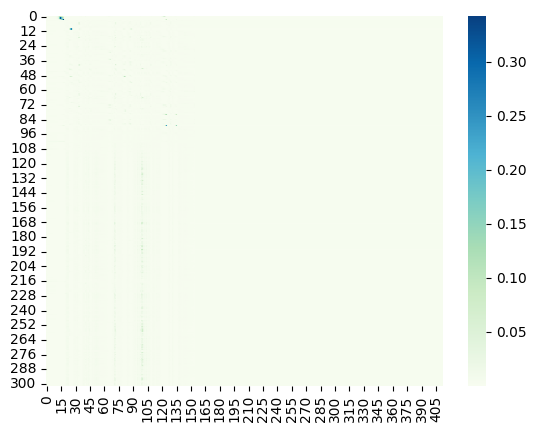


Epoch: 28/80


Val:   3%|▎         | 1/33 [00:05<02:56,  5.52s/it, dist=473.3867]

Ground Truth :  WE NEVER PLANNED TO MEET AND WHEN WE MET
Prediction   :  WHEN THE FLAME AND WHEN WE NEVER NEVER BELIEVE THAT WE NEVER BELIEVE THAT WE WERE AND WHEN WE NEVER SAID THAT WE WERE ALL THE SUN THE SUN WAS A STRANGE AND WHICH WAS A STRANGE AND WHICH WAS A STRANGE AND WHICH WAS A STRANGE AND WHICH WAS A STRANGE AND WHICH WAS A STRANGE AND WHICH WAS A STRANGE AND WHICH WAS A STRANGE AND WHICH WAS A STRANGE AND WHICH WAS A STRANGE AND WHICH WAS A STRANGE AND WHICH WAS A STRANGE AND WHICH WAS A STRANGE AND WHICH WAS A STRANGE AND WHICH WAS A STRANGE AND WHICH WAS A STRANGE AND WHICH WAS A STRANGE AND WHICH WAS


Val:   6%|▌         | 2/33 [00:10<02:40,  5.18s/it, dist=472.9700]

Ground Truth :  MULE DID NOT DESIRE TO CROSS WHILE I WAS TRYING TO PERSUADE HIM WITH A BIG STICK A ROCK IN HIS EAR AND A TWISTER ON HIS NOSE
Prediction   :  NO LONGER CRASHED IN THE MAN WHO WAS TRYING TO SHOW HIM WHAT IN THE MAN WHO WAS DROWNED AND WHO WAS DROWNED AND WHO WAS DROWNED AND OPENED THE BANK NOW TWO OF THE MAN WHO WAS DROWNED AND OPENED THE BANK NOW TWO OF THE MAN WHO WAS DROWNED AND OPENED THE BANK NOW TWO OF THE MAN WHO WAS DROWNED AND OPENED THE BANK NOW TWO OF THE MAN WHO WAS DROWNED AND OPENED THE BANK NOW TWO OF THE MAN WHO WAS DROWNED AND OPENED THE BANK NOW TWO OF THE MAN WHO WAS DROWNED AND OPENED THE BANK NOW TWO OF THE MAN WHO WAS DROWNED AND OPENED THE BANK NOW TWO OF THE M


Val:   9%|▉         | 3/33 [00:15<02:31,  5.04s/it, dist=472.7067]

Ground Truth :  YES CHARCOAL
Prediction   :  MASS TRACKS TRACK AND COLORED AND COLORED AND COLORED AND COLORED AND THE COLOR OF THE STRANGE AND THE STRANGE AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A ST


Val:  12%|█▏        | 4/33 [00:20<02:24,  4.99s/it, dist=472.9700]

Ground Truth :  WITH THAT EXCEPTION THEIR SUCCESS BECAME SO GREAT THAT NO MOUNTEBANK MEMORY COULD RECALL ITS PARALLEL
Prediction   :  WHICH IN THEIR SECRET SOUND THEY NOT COME TO BAD BACK TO BAD BACK TO BAD BACK TO BAD BACK TO BAD A COLD COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COLOR OF THE COL


Val:  15%|█▌        | 5/33 [00:25<02:19,  4.98s/it, dist=473.4880]

Ground Truth :  BUT VIGOUR RETURNED TO HIM BEFORE HE HAD WELL REACHED THE DOOR AND HE SHOWED SOME OF HIS OLD SPIRIT AS HE THANKED MISS CLARKE AND TURNED TO TAKE THE ELEVATOR
Prediction   :  BUT THEY GAVE HIM TO HER BEFORE HE SHOULD HAVE WELL BEEN AN EXPERIENCE TO HER AND HE SHOULD HAVE SOME SPARE SPARE TO THE OLD MAN THE OLD MAN WHO HAS CLOSED THE DOOR AND HE SHOULD HAVE TO TAKE THE OLD MAN THE OLD MAN WHO SHOULD HAVE TO TAKE THE OLD MAN THE OLD MAN WHO SHOULD HAVE TO TAKE THE OLD MAN THE OLD MAN WHO SHOULD HAVE TO TAKE THE OLD MAN THE OLD MAN WHO SHOULD HAVE TO TAKE THE OLD MAN THE OLD MAN WHO SHOULD HAVE TO TAKE THE OLD MAN THE OLD MAN WHO SHOULD HAVE TO TAKE THE OLD MAN THE OLD MAN WHO SHOULD HAVE TO TAKE THE OLD MAN THE OLD M


Val:  18%|█▊        | 6/33 [00:30<02:14,  4.97s/it, dist=472.5200]

Ground Truth :  LOOK AT ME WELL IN SOOTH I'M BEATRICE
Prediction   :  LOOKING IN SIZE I WAS IN THE TRAIL IN SIZE I THINK IT IS I THINK IT IS IN THE TRAIL THAT I WAS IN THE TRAIL OF THE SUN THE OTHER SIDE OF THE STREET AND SINCE I HAVE A SORT OF THE SUN THAT I WAS IN THE TRAIL OF THE SUN THE OTHER SIDE OF THE STREET AND SINCE I HAD BEEN THE TREE AND SINCE I HAVE A SORT OF THE SUN THAT I WAS IN THE TRAIL OF THE SUN THE OTHER SIDE OF THE STREET AND SINCE I HAD BEEN THE TREE AND SINCE I HAVE A SORT OF THE SUN THAT I WAS IN THE TRAIL OF THE SUN THE OTHER SIDE OF THE STREET AND SINCE I HAD BEEN THE TREE AND SINCE I HA


Val:  21%|██        | 7/33 [00:35<02:09,  4.99s/it, dist=473.2057]

Ground Truth :  THEN HE LOOKED DOWN THE LAGOON WAS DRY
Prediction   :  THEY MUST HAVE DONE THE GOOD WAY WHICH I WAS JUST JUST JUST JUST JUST JUST JUST JUST JUST JUST JUST JUST JUST GRIEVE THE GOOD STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STRING OF THE STR


Val:  24%|██▍       | 8/33 [00:40<02:03,  4.95s/it, dist=473.1742]

Ground Truth :  THE PEOPLE IS A BEAST OF MUDDY BRAIN THAT KNOWS NOT ITS OWN FORCE AND THEREFORE STANDS LOADED WITH WOOD AND STONE THE POWERLESS HANDS OF A MERE CHILD GUIDE IT WITH BIT AND REIN ONE KICK WOULD BE ENOUGH TO BREAK THE CHAIN BUT THE BEAST FEARS AND WHAT THE CHILD DEMANDS IT DOES NOR ITS OWN TERROR UNDERSTANDS CONFUSED AND STUPEFIED BY BUGBEARS VAIN
Prediction   :  BUT PEOPLE BE MUCH FOR MY BRAIN BENEATH MY BRAIN BUT NOT WHAT WAS THE BETTER BEAUTY OF THE BEST FEELINGS OF THE BEST FEELINGS OF THE BEST FEELING WHICH THE BETTER BEAUTY OF THE BEST FEELINGS COULD BE A CHILD BUT THE BEST FEELING OF THE BEST FEELING WAS VERY CHILD BY THE BEST FEELINGS OF THE BEST FEELINGS OF THE BEST FEELING WHICH THE BETTER BEAUTY OF THE BEST FEELINGS COULD BE A CHILD BUT THE BEST FEELING OF THE BEST FEELING WAS VERY CHILD BY THE BEST FEELINGS OF THE BEST FEELINGS OF THE BEST FEELING WHICH THE BETTER BEAUTY OF THE BEST FEELING


Val:  27%|██▋       | 9/33 [00:44<01:58,  4.92s/it, dist=473.0511]

Ground Truth :  THAT EXTRAORDINARY REFORM IN MORALS WHICH ACCORDING TO SALVIAN AND HIS CONTEMPORARIES THE VANDAL CONQUERORS WORKED IN NORTH AFRICA AVAILED THEM NOTHING THEY LOST MORE THAN THEY GAVE
Prediction   :  THAT IT IS DROWNING MORE THAN HIS COMMAND TO SAVE HIM TO SAVE HIM TO SAVE HIM TO SAVE THE VANITY OF THE NATIVE AND HIS CONVERSATION THEY MAY BE GROWN THEY MAY BE GROWN THEY MAY BE GRATEFUL THEY MAY BE GRATEFUL THEY MAY BE GRATEFUL THEY MAY BE GRATEFUL THEY MAY BE GRATEFUL THEY MAY BE GRATEFUL THEY MAY BE GRATEFUL THEY MAY BE GRATEFUL THEY MAY BE GRATEFUL THEY MAY BE GRATEFUL THEY MAY BE GRATEFUL THEY MAY BE GRATEFUL THEY MAY BE GRATEFUL THEY MAY BE GRATEFUL THEY MAY BE GRATEFUL THEY MAY BE GRATEFUL THEY MAY BE GRATEFUL THEY MAY BE GRATEFUL THE


Val:  30%|███       | 10/33 [00:49<01:53,  4.92s/it, dist=473.3187]

Ground Truth :  HE RANG AGAIN THIS TIME HARDER STILL NO ANSWER
Prediction   :  HE REGARDED THIS IN HIS HIDDEN STILL STILL HIS HEAD STILL LIKE A STILL STILL THE SINGLE STILL THE SIGHT OF THE SIDE OF THE SIDE OF THE SIDE OF THE STILL STILL THE SIGHT OF THE SIDE OF THE SIDE OF THE STILL STILL THE SIGHT OF THE SIDE OF THE SIDE OF THE STILL STILL THE SIGHT OF THE SIDE OF THE SIDE OF THE STILL STILL THE SIGHT OF THE SIDE OF THE SIDE OF THE STILL STILL THE SIGHT OF THE SIDE OF THE SIDE OF THE STILL STILL THE SIGHT OF THE SIDE OF THE SIDE OF THE STILL STILL THE SIGHT OF THE SIDE OF THE SIDE OF THE STILL STILL THE SIGHT OF THE SI


Val:  33%|███▎      | 11/33 [00:54<01:48,  4.94s/it, dist=473.6194]

Ground Truth :  HE NODS HIS CONSENT
Prediction   :  IN NO ONE NOT SAID HIS COMPANY TO SAY THAT I WAS CONSIDERED TO SAY THAT THE SAME THING IS A SAME THING THAT I WAS A SAFE OF THE SAME THING THAT I WAS A SAFE OF THE SAME THING THAT I WAS A SAFE OF THE SAME THING THAT I WAS A SAFE OF THE SAME THING THAT I WAS A SAFE OF THE SAME THING THAT I WAS A SAFE OF THE SAME THING THAT I WAS A SAFE OF THE SAME THING THAT I WAS A SAFE OF THE SAME THING THAT I WAS A SAFE OF THE SAME THING THAT I WAS A SAFE OF THE SAME THING THAT I WAS A SAFE OF THE SAME THING THAT I WAS A SAFE OF THE SAME THING THAT I WAS A S


Val:  36%|███▋      | 12/33 [00:59<01:44,  4.97s/it, dist=473.1556]

Ground Truth :  I ALSO OFFERED TO HELP YOUR BROTHER TO ESCAPE BUT HE WOULD NOT GO
Prediction   :  I ALL SHALL GIVE HIM TO BRING IT TO HIM GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD GOOD


Val:  39%|███▉      | 13/33 [01:04<01:40,  5.00s/it, dist=472.9979]

Ground Truth :  I KNOW NOW WHAT BRINGS ME TO THE PYRE
Prediction   :  I NOW NOW WHAT PRESENTLY WAS MET TO THE PINE OF THE PINE OF THE PINE OF THE PIECE OF THE PIECE OF THE PIECE OF THE PILLAR OF THE STREET AND THE PILLAR OF THE STREET AND THE PILLAR OF THE STREET AND THE PILLAR OF THE STREET AND THE PILLAR OF THE STREET AND THE PILLAR OF THE STREET AND THE PILLAR OF THE STREET AND THE PILLAR OF THE STREET AND THE PILLAR OF THE STREET AND THE PILLAR OF THE STREET AND THE PILLAR OF THE STREET AND THE PILLAR OF THE STREET AND THE PILLAR OF THE STREET AND THE PILLAR OF THE STREET AND THE PILLAR OF THE STREET AND THE


Val:  42%|████▏     | 14/33 [01:09<01:34,  4.95s/it, dist=473.3824]

Ground Truth :  HEAVEN A GOOD PLACE TO BE RAISED TO
Prediction   :  HAVE YOU HAVE ANY TRACE TO THE RAISED TO THE RAISED TO THE RAISED TO THE RAILROAD AND GRANDEUR AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND GRAND AND 


Val:  45%|████▌     | 15/33 [01:14<01:29,  4.95s/it, dist=473.5262]

Ground Truth :  I NEVER SEE LOU'S SCYTHE OVER HERE
Prediction   :  I NEVER SEE THEM SIR THEY SEE THEM SIR I SEE IT I SEE IT I SEE IT I SEE IT I SEE IT I SAID THAT I WAS SITTING ON THE STREET AND THE SUN WAS A SIGN OF THE STREET AND THE SENSE OF THE SIGHT OF THE SIGHT OF THE SIGHT OF THE SIDE OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF THE STREET AND THE STREET OF T


Val:  48%|████▊     | 16/33 [01:19<01:23,  4.94s/it, dist=473.4388]

Ground Truth :  JUST AN EVERYDAY DETECTIVE BUT AMBITIOUS I SUPPOSE AND QUITE ALIVE TO THE IMPORTANCE OF BEING THOROUGH
Prediction   :  JESUS TO NEGRO DAY I DID NOT DEATH BUT I WILL BE IN THE PORTION OF BEING THERE THERE WAS A POWER THERE WAS A POWER OF BEING THERE THERE WAS A POWER OF THE END OF BEING THERE WHERE THERE WAS A POWER OF THE END OF BEING THERE WERE THE END OF BEING THERE WERE THE END OF BEING THERE WERE THE END OF BEING THERE WERE THE END OF THE END OF BEING THERE WERE THE END OF THE END OF BEING THERE WERE THE END OF THE END OF BEING THERE WERE THE END OF THE END OF BEING THERE WERE THE END OF THE END OF BEING THERE WERE THE END OF THE END OF BEING THERE WERE TH


Val:  52%|█████▏    | 17/33 [01:24<01:18,  4.93s/it, dist=473.6537]

Ground Truth :  MISTER EDISON WAS A LEADER FAR AHEAD OF THE TIME
Prediction   :  MISTER ASSISTANT WAS ALL THE TIME FOR THE TIME FOR THE TIME FOR THE TIME THE TIME IN THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE TIME THE T


Val:  55%|█████▍    | 18/33 [01:29<01:13,  4.91s/it, dist=473.8111]

Ground Truth :  MY ARMS ARE RIGHT BUT MY LEGS ARE GETTING A LITTLE STIFF
Prediction   :  MY RELIGION BELIEVED THAT MY LIFE BELIEVED THAT MY LIFE STILL HAVE BEEN STILL AND STILL THE MINUTE OF THE STIFF AND STIFF AND STIFF AND STILL THE MINUTE OF THE STIFF AND STIFF AND STIFF AND STILL THE MINUTE OF THE STIFF AND STIFF AND STIFF AND STILL THE MINUTE OF THE STIFF AND STIFF AND STIFF AND STIFF AND STILL THE MINUTE OF THE STIFF AND STIFF AND STIFF AND STIFF AND STILL THE MINUTE OF THE STIFF AND STIFF AND STIFF AND STIFF AND STILL THE MINUTE OF THE STIFF AND STIFF AND STIFF AND STIFF AND STILL THE MINUTE OF THE STIFF AND STIFF AND STIFF


Val:  58%|█████▊    | 19/33 [01:34<01:08,  4.90s/it, dist=474.2189]

Ground Truth :  HE STOOD STILL IN DEFERENCE TO THEIR CALLS AND PARRIED THEIR BANTER WITH EASY WORDS
Prediction   :  HE STOOD STILL TO THEIR CALLED CALLED THEIR BACK THERE WAS A YEAR WITH EARTH AND PARTICULAR THERE WAS A WEEK AND PARTICULARLY AND PARTICULARLY ABOUT THE BATTLE OF THE END OF THE BATTLE OF THE END OF THE BATTLE OF THE END OF THE BATTLE OF THE END OF THE BATTLE OF THE END OF THE BATTLE OF THE END OF THE BATTLE OF THE END OF THE BATTLE OF THE END OF THE BATTLE OF THE END OF THE BATTLE OF THE END OF THE BATTLE OF THE END OF THE BATTLE OF THE END OF THE BATTLE OF THE END OF THE BATTLE OF THE END OF THE BATTLE OF THE END OF THE BATTLE OF THE END OF 


Val:  61%|██████    | 20/33 [01:39<01:03,  4.91s/it, dist=474.2730]

Ground Truth :  THE FACT THAT IT WAS CHURNING DAY WAS ANOTHER REASON WHY IT WAS INCONVENIENT TO HAVE THE WHITTAWS AND WHY CONSEQUENTLY MISSUS POYSER SHOULD SCOLD MOLLY THE HOUSEMAID WITH UNUSUAL SEVERITY
Prediction   :  THE FACT WAS TRUE THAT IT WAS IN THE REST OF THE REST OF THE REST OF WHICH I COULD NOT BE A SMALL MAN WHO WAS POSSIBLE TO HAVE A SMALL MAN WHO WAS POSSIBLE TO HAVE A HOST OF MANY OF YOUR SMALL MAN WHO WAS POSSIBLE TO HAVE A SMALL MAN WHO WAS POSSIBLE TO HAVE A SMALL MAN WHO WAS POSSIBLE TO HAVE A SMALL MAN WHO WAS POSSIBLE TO HAVE A SMALL MAN WHO WAS POSSIBLE TO HAVE A SMALL MAN WHO WAS POSSIBLE TO HAVE A SMALL MAN WHO WAS POSSIBLE TO HAVE A SMALL MAN WHO WAS POSSIBLE TO HAVE A SMALL MAN WHO WAS POSSIBLE TO HAVE A SMALL MAN WHO WAS POSSIBLE TO


Val:  64%|██████▎   | 21/33 [01:44<00:58,  4.87s/it, dist=474.7133]

Ground Truth :  THAT PENANCE HATH NO BLAME WHICH MAGDALEN FOUND SWEET PURGING OUR SHAME SELF PUNISHMENT IS VIRTUE ALL MEN KNOW
Prediction   :  THAT PENNING BELL WITH MANY FAMILY WITH MANY FAMILY FOR SHE WAS VERY SHADOW SLEEP SLEEP PUT HIS BROTHER AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND FOUND HIS VISIT AND F


Val:  67%|██████▋   | 22/33 [01:48<00:53,  4.89s/it, dist=474.4006]

Ground Truth :  THEY FELT MY PULSE THEY LOOKED AT MY TONGUE THEY LISTENED AT MY CHEST THEY FELT ALL MY MUSCLES AND AT THE END OF EACH OPERATION THEY LOOKED AT THE CHIEF AND NODDED AND SAID SOMETHING IN A TONE QUITE PLEASANT AS THOUGH I WERE ALL RIGHT
Prediction   :  IF I PASSED THE LITTLE MINUTE THEY WERE MY CHANGE THEY WERE MY CHASE THEY WERE MY MIND THEY WERE ALL TO MY LIFE AND NOT A WILD LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LITTLE LI


Val:  70%|██████▉   | 23/33 [01:53<00:48,  4.87s/it, dist=474.4319]

Ground Truth :  SOMEHOW OF ALL THE DAYS WHEN THE HOME FEELING WAS THE STRONGEST THIS DAY IT SEEMED AS IF SHE COULD BEAR IT NO LONGER
Prediction   :  SOME HOUR ALL THE GATE OF THE HOUSE THIS DAY BEING BEING BEING BEAUTIFUL BEYOND BEING LONG ALL THE NORTH AND NOT THE NOTICE OF THE STRANGE AND SENTIMENT OF THE STRANGE AND SENTIMENT OF THE STRANGE AND SENTIMENT OF THE STRANGE AND SENTIMENT OF THE STRANGE AND LONG LONG AND LONG LONG AND LONG LONG AND LONG LITTLE LITTLE LAND AND NOW AND NOW THERE NOW AND NOW THEY NOW LOOKED AT HIM AND WHO WAS THE DAY OF THE STRANGE AND SENTIMENT OF THE STRANGE AND SENTIMENT OF THE STRANGE AND SENTIMENT OF THE STRANGE AND SENTIMENT OF THE STRANGE AND SENTIMENT OF


Val:  73%|███████▎  | 24/33 [01:58<00:43,  4.86s/it, dist=474.4006]

Ground Truth :  TOM SAYS THANKS AND LOOKS AT HILDA AND SHE BLUSHES REALLY
Prediction   :  PONDS BACK SPANISH RELIGION AND SHE BOUGHT HIM AND SHE BOUGHT HIM AND SHE BOUGHT THE SUN AND SHE BOWED THE STATE OF THE SUN AND SHE BOWED THE STATE OF THE SUN AND SHE BOWED THE STATE OF THE SUN AND SHE BOWED THE STATE OF THE SUN AND SHE BOWED THE STATE OF THE SUN AND SHE BOWED THE STATE OF THE SUN AND SHE BOWED THE STATE OF THE SUN AND SHE BOWED THE STATE OF THE SUN AND SHE BOWED THE STATE OF THE SUN AND SHE BOWED THE STATE OF THE SUN AND SHE BOWED THE STATE OF THE SUN AND SHE BOWED THE STATE OF THE SUN AND SHE BOWED THE STATE OF THE SUN AND S


Val:  76%|███████▌  | 25/33 [02:03<00:39,  4.93s/it, dist=474.0699]

Ground Truth :  BED TIME CHILDREN
Prediction   :  BETTER SHE WAS HIGH REMARKABLE THAT I HAD SHOWN THE SHORT SHOULDER OF THE SHIP AND SHOWED HIM TO THE SUBJECT OF THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN WAS A STRANGE AND THE SUN AND THE SUN


Val:  79%|███████▉  | 26/33 [02:08<00:34,  4.90s/it, dist=474.3046]

Ground Truth :  HE SET OFF ABRUPTLY FOR THE BULL WALKING RAPIDLY LEST HIS FATHER'S SHRILL WHISTLE MIGHT CALL HIM BACK AND IN A FEW MOMENTS HE HAD ROUNDED THE CURVE AT THE POLICE BARRACK AND WAS SAFE
Prediction   :  HE SAID HE SAID BLUFF FOR THE BOY WHO WAS FATHER LATER LATER LATER LATER LATER LATER AND WHAT WAS SAID MY COMMON MAN AND WHAT WAS SAID MY COMMON MAN AND WHAT WAS SAID MY COMMON MAN AND WHAT WAS SAID MY COMMON MAN AND WHAT WAS SAID MY COMMON MAN AND WHAT WAS SAID MY COMMON MAN AND WHAT WAS SAID MY COMMON MAN AND WHAT WAS SAID MY COMMON MAN AND WHAT WAS SAID MY COMMON MAN AND WHAT WAS SAID MY COMMON MAN AND WHAT WAS SAID MY COMMON MAN AND WHAT WAS SAID MY COMMON MAN AND WHAT WAS SAID MY COMMON MAN AND WHAT WAS SAID MY COMMON MAN AND WHAT WAS SAI


Val:  82%|████████▏ | 27/33 [02:13<00:29,  4.93s/it, dist=474.1857]

Ground Truth :  YET THE MOST CHARITABLE CRITICISM MUST REFUSE THESE SECTARIES ANY KNOWLEDGE OF THE PURE AND PROPER DIVINITY OF CHRIST
Prediction   :  YOU SHALL SHARE A BOY CRIED A CREATURE AND NOT ALL THE PERSON IN THE PERSON OF THE PERSON OF CRISTEL AND PROPERTY TO ME TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A MAN TO MAKE A


Val:  85%|████████▍ | 28/33 [02:18<00:24,  4.89s/it, dist=474.2310]

Ground Truth :  ONE DARK NIGHT AT THE HEAD OF A SCORE OF HIS TRIBE HE FELL UPON WABIGOON'S CAMP HIS OBJECT BEING THE ABDUCTION OF THE PRINCESS
Prediction   :  WHEN THEY HAD BEEN BEGINNING TO GO BEGAN BEGAN BEGAN TO GO BEGAN TO GO BEGAN TO GO AWAY THE PRINCESS CAME TO THE PRINCESS CAME IN THE GREAT SAME SATISFACTION HIS OWN DEATH AND DOCTOR BENEATH THE PRINCESS CAME IN THE GREAT SAME SATISFACTION HIS OWN DEATH AND DEGREE AND DUCK AND DOCTOR BENEATH THE PRINCESS CAME IN THE GREAT SAME SATISFACTION HIS OWN DEATH AND DEGREE AND DUCK AND DOCTOR BENEATH THE PRINCESS CAME IN THE GREAT SAME SATISFACTION HIS OWN DEATH AND DEGREE AND DUCK AND DOCTOR BENEATH THE PRINCESS CAME IN THE GREAT SAME SATISFACTION HIS


Val:  88%|████████▊ | 29/33 [02:23<00:19,  4.89s/it, dist=474.2972]

Ground Truth :  SHE WAS THE MOST AGREEABLE WOMAN I'VE EVER KNOWN IN HER POSITION SHE WOULD HAVE BEEN WORTHY OF ANY WHATEVER
Prediction   :  SHE WAS THE MOST THE MOST SHOWN SHE WAS A BEAUTIFUL MAN HAD BEEN HAPPY AND HAD A WOMAN BUT HE WAS A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY BUT HE HAD A VERY BOY 


Val:  91%|█████████ | 30/33 [02:28<00:14,  4.91s/it, dist=474.3762]

Ground Truth :  THE LAW OF THAT SCHOOL IS THAT EVERYTHING SHALL BE SEEN CLEARLY OR AT LEAST ONLY IN SUCH MIST OR FAINTNESS AS SHALL BE DELIGHTFUL AND I HAVE NO DOUBT THAT THE BEST INTRODUCTION TO IT WOULD BE THE ELEMENTARY PRACTICE OF PAINTING EVERY STUDY ON A GOLDEN GROUND
Prediction   :  THE LATTER SCOUT CLOSED MISS MISSUS MISSUS MISSUS MISSUS MISSUS SHOW MISTER FANCY WAS SHOWN TO LIKE THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE BEST TO THE B


Val:  94%|█████████▍| 31/33 [02:33<00:09,  4.90s/it, dist=474.5092]

Ground Truth :  I AM NOT A MAN WHO CAN LIVE TWO LIVES HE WENT ON FEVERISHLY EACH LIFE SPOILS THE OTHER
Prediction   :  I NOT MADE ME LIKE THAT I SPOKE HE LIVED IN FEELING FEELING FELT THE OTHER SPOT HE LISTENED TO THE END OF THE SPOT AND THE OTHER SPOT AND FELL AND FELT THE SPOT OF THE SPOT AND THE OTHER SPOT AND FELL AND FELT THE SPOT OF THE SPOT AND THE OTHER SPOT AND FELL AND FELT THE SPOT OF THE SPOT AND THE OTHER SPOT AND FELL AND FELT THE SPOT OF THE SPOT AND THE OTHER SPOT AND FELL AND FELT THE SPOT OF THE SPOT AND THE OTHER SPOT AND FELL AND FELT THE SPOT OF THE SPOT AND THE OTHER SPOT AND FELL AND FELT THE SPOT OF THE SPOT AND THE OTHER SPOT AND FELL 


Val:  97%|█████████▋| 32/33 [02:37<00:04,  4.91s/it, dist=474.5138]

Ground Truth :  THEY THEREFORE ENTERTAIN A CALM SENSE OF THEIR SUPERIORITY THEY DO NOT DREAM OF VAUNTING PRIVILEGES WHICH EVERYONE PERCEIVES AND NO ONE CONTESTS AND THESE THINGS ARE NOT SUFFICIENTLY NEW TO THEM TO BE MADE TOPICS OF CONVERSATION
Prediction   :  THAT THEY THEREFORE TAKE THE CONTRARY THEY NOT FANCY THEY NOT FANCY THEY NOT FOUND THE MAN TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE MADE TO BE M


Ground Truth :  HE WAS MOUNTED UPON A POWERFUL HORSE AND HAD ON A COAT OF MAIL WITH FOUR OF THE PISTOLS THEY CALL PETRONELS IN THAT COUNTRY AT HIS WAIST
Prediction   :  HE WAS MADE TO POWER FOR HOLD OF MANY POWERS AND HAD HAD HAD HAD HAD HAD HAD HAD HAD HAD HAD HAD HAD HAD HAD A COLD AND HIS WAY THAT COULD NOT PATTY AND HIS WAY AND HIS WAY THAT COULD NOT PATTY AND HIS WAY AND HIS WAY THAT COULD NOT PATTY AND HIS WAY THAT COULD NOT PATTY AND HIS WAY THAT COULD NOT PATTY AND HIS WAY THAT COULD NOT PATTY AND HIS WAY THAT COULD NOT PATTY AND HIS WAY THAT COULD NOT PATTY AND HIS WAY THAT COULD NOT PATTY AND HIS WAY THAT COULD NOT PATTY AND HIS WAY THAT COULD NOT PATTY AND HIS WAY THAT COULD NOT PATTY AND HIS WAY T
	Train Loss 1.1449	 Learning Rate 0.0008767
	Val Dist 474.4209	
	Teacher Forcing Ratio 1	


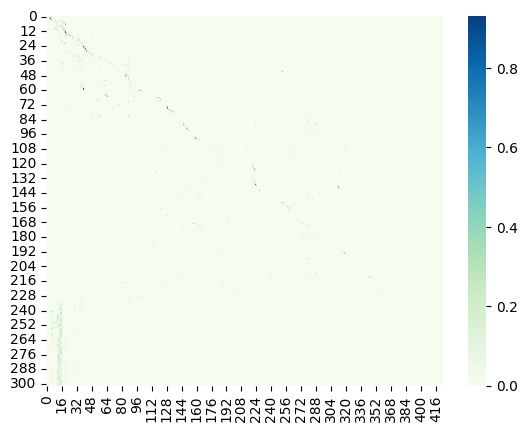

Saved best model

Epoch: 29/80


Val:   3%|▎         | 1/33 [00:02<01:32,  2.88s/it, dist=64.3333]

Ground Truth :  BUT YOU KNOW MORE ABOUT THAT THAN I DO SIR
Prediction   :  BUT YOU MORE BACK THAT THE NIGHT SERVE


Val:   6%|▌         | 2/33 [00:05<01:20,  2.61s/it, dist=62.9233]

Ground Truth :  WALTER HAD GONE OUT WITH THE SECOND GUARD AND THE OTHERS HAD GATHERED AROUND THE CAMP FIRE FOR THEIR NIGHTLY STORY TELLING
Prediction   :  WHAT THE GOOD GOOD OUT WITH A SECOND DARK IN THE ELECTOR OF GETTING A ROOM CAPTAIN AROUND CAPTAIN


Val:   9%|▉         | 3/33 [00:07<01:16,  2.56s/it, dist=66.5867]

Ground Truth :  THE HISTORIANS OF THE WHITE RACE ADMIT THAT THE INDIAN WAS NEVER THE FIRST TO REPUDIATE HIS OATH
Prediction   :  THEY HAS STRANGE OF THE LIGHT OF MISS OF MITH A FIRST TRUE PUT YOU PUT YOU AT HIS OWN


Val:  12%|█▏        | 4/33 [00:10<01:14,  2.57s/it, dist=66.4317]

Ground Truth :  BUT TREVELYAN WAS OF A DIFFERENT OPINION AND HE WAS DISGUSTED AND REVOLTED MOST UNREASONABLY BY THE APPEARANCE OF HIS MINISTER'S DOMESTIC ARRANGEMENTS
Prediction   :  BUT SHE HAD A DIFFERENT PINION AND HE WAS DISCUSSED IT AND REVELLED IT MUST UNDERSTAND REVELATION MUST UNDERSTAND MESSAGE A MESSAGE A MESSAGE A MESSAGE A MESSENGERS DEMESTICAL RAGE MINKS


Val:  15%|█▌        | 5/33 [00:12<01:09,  2.49s/it, dist=65.9987]

Ground Truth :  IT IS SIXTEEN YEARS SINCE JOHN BERGSON DIED
Prediction   :  IT IS EXTENDED YOURS SAID JOHN BARKS AND DIED


Val:  18%|█▊        | 6/33 [00:15<01:05,  2.44s/it, dist=65.4933]

Ground Truth :  IS THERE NOTHING WILD IN THE EYE CONTINUED HOLGRAVE SO EARNESTLY THAT IT EMBARRASSED PHOEBE AS DID ALSO THE QUIET FREEDOM WITH WHICH HE PRESUMED ON THEIR SO RECENT ACQUAINTANCE
Prediction   :  IT THERE NOTHING WILL IN THE EYE CONTINUED HOLD READ SO ARE NEAR THAT IN THEIR BARS FEEBLY AS DID A QUIET FREEDOM WITH WHICH HE PRESENTED ON THE SORRES IN THE SORRES IN THE SORRES IN THE SORRES IN THE SORRES IN THE SORRES IN THE SORRES IN THE SORRESS IN THE QUIET


Val:  21%|██        | 7/33 [00:17<01:02,  2.39s/it, dist=64.5219]

Ground Truth :  OH WHAT SHALL WE DO FOR A HOME
Prediction   :  I WAS SHOWN WE DO FOR A HOUSE HOW MUCH SHOULD WE DO FOR A HOUSE


Val:  24%|██▍       | 8/33 [00:19<01:01,  2.44s/it, dist=64.2375]

Ground Truth :  MY FATHER HAS REVEALED THE CULPRIT'S NAME MY FATHER THIRSTS FOR REVENGE AS MUCH AS YOU DO YET EVEN HE CONJURES YOU AS I DO TO KEEP THIS SECRET DO YOU NOT FATHER
Prediction   :  MY FATHER HAS REVEALED THE COPERS NAME MY FATHER'S FOREIGN VANGISH MUCH HIS YOUTH IT EVEN HE CONJECTUATED THE SECRET DO YOU KNOW FATHER


Val:  27%|██▋       | 9/33 [00:22<01:00,  2.51s/it, dist=65.9556]

Ground Truth :  IF YOU THINK SO MADAM I SEE NOTHING THAT SHOULD PREVENT ME NOW
Prediction   :  IF YOU THINK SOME OF THE MISSION OF THE NIGHT PREVENTS ME NOW


Val:  30%|███       | 10/33 [00:25<00:57,  2.49s/it, dist=66.8440]

Ground Truth :  HE EXHIBITED A DAGUERREOTYPE MINIATURE IN A MOROCCO CASE
Prediction   :  HE EXISTED AT THE GARDEN AT THE GARDEN IN A MARCH OF CASE


Val:  33%|███▎      | 11/33 [00:27<00:55,  2.53s/it, dist=68.0333]

Ground Truth :  I WOULD TRY THE NEARER RANGE AND SEE HOW FAR I COULD GO
Prediction   :  I WILL CHILD NEAR AND SEE HOW FINE COULD GO


Val:  36%|███▋      | 12/33 [00:30<00:52,  2.52s/it, dist=67.6650]

Ground Truth :  WHEN I FOUND IT I SAID TO MYSELF THAT IT WOULD DO NICELY FOR MY SERVANT GIRL FOR WHEN SHE WAS BROUGHT TO LIFE SHE WOULD NOT BE PROUD NOR HAUGHTY AS THE GLASS CAT IS FOR SUCH A DREADFUL MIXTURE OF COLORS WOULD DISCOURAGE HER FROM TRYING TO BE AS DIGNIFIED AS THE BLUE MUNCHKINS ARE
Prediction   :  WHEN I HAD HOWED I SAID TO MYSELF THAT IT IS EASILY FROM I SEE FROM I SEE FROM I SERVE THAT IT WOULD NOT BE PROUD NOR HOW YOU ASKED THE BLASK HAT IS FOR SUCH A DRAWER FROM MIXTURE OF COLORS WHO DISCOURAGED HER FROM MIXTURE FROM TIME TO BE AS THE BLUE MUNCH INSOLENCE


Val:  39%|███▉      | 13/33 [00:32<00:51,  2.56s/it, dist=68.2272]

Ground Truth :  WITH A LONG STAINED FINGERNAIL HE MAPPED THE CONSTELLATIONS ON THE MARBLE TILED FLOOR
Prediction   :  WITH THE LONG STAIN FIGURE NO HE MATTHEW CAST LATIONS ON THE MARBLE TILE FOR HER


Val:  42%|████▏     | 14/33 [00:35<00:48,  2.55s/it, dist=69.4490]

Ground Truth :  THAT EXTRAORDINARY REFORM IN MORALS WHICH ACCORDING TO SALVIAN AND HIS CONTEMPORARIES THE VANDAL CONQUERORS WORKED IN NORTH AFRICA AVAILED THEM NOTHING THEY LOST MORE THAN THEY GAVE
Prediction   :  THAT EXTRAORDINARY REFORM IN MORE SLICK SHE COULD CONVERSE THE VANDAL COMPREHENS THE VANDAL COME HERE IT LOOKED IN THEIR FATHER COME HERE IT LOOKED MORE THAN THEY LOST MORE THAN THEY GAVE MORE THAN THEY GAVE MORE THAN THEY GAVE MORE THAN THEY GAVE MORE THAN THEY GAVE MORE THAN THEY GAVE MORE THAN THEY GAVE MORE THAN THEY GAVE MORE THAN THEY GAVE MORE THAN THEY GAVE MORE THAN THEY GAVE MORE THAN THEY GAVE MORE THAN THEY GAVE MORE THAN THEY GAVE MORE THAN THEY GAVE MORE THAN THEY GAVE MORE THAN THEY GAVE MORE THAN THEY GAVE MORE THAN THEY GAVE M


Val:  45%|████▌     | 15/33 [00:37<00:45,  2.55s/it, dist=69.7338]

Ground Truth :  I NOTICE THAT THEY ARE GENERALLY PERSONS WHO HAVE ALREADY TENDERED THEIR OFFERINGS
Prediction   :  I KNOWS THAT THEY ARE GENERALLY PERSONS WHO OF ALL READY TENDER THEREFORE INSTANCE


Val:  48%|████▊     | 16/33 [00:40<00:43,  2.55s/it, dist=69.7529]

Ground Truth :  IF CARRIED ANY DISTANCE IT SHOULD BE STORED AWAY IN AIR TIGHT VESSELS
Prediction   :  IF CARRIED ANY DISTANCE IT SHOULD BE STOOD AWAY IN EIGHTEEN BESTS


Val:  52%|█████▏    | 17/33 [00:42<00:39,  2.50s/it, dist=69.2322]

Ground Truth :  OUR SCANDALOUS PROCEEDINGS OFTEN EXPOSED US TO THE GREATEST DANGER
Prediction   :  I SCANDAL THE HIS PROCEEDINGS ALL THE EXPOSED AS THE GREATEST AND HER


Val:  55%|█████▍    | 18/33 [00:45<00:37,  2.51s/it, dist=69.2441]

Ground Truth :  I HAD WANTED TO GET SOME PICTURE BOOKS FOR YULKA AND ANTONIA EVEN YULKA WAS ABLE TO READ A LITTLE NOW
Prediction   :  I HAD ONCE IT TO GIVE YOU THAT SUMPITUOUS REYOLATE AND AN EAR EVEN YOU CALL AS EARLY TO READ A LITTLE KNOW


Val:  58%|█████▊    | 19/33 [00:47<00:35,  2.50s/it, dist=70.0246]

Ground Truth :  PRESENTLY FEET WERE HEARD ADVANCING ALONG THE PASSAGE SEVERAL PAIRS IT SEEMED AND A LIGHT GLEAMED THROUGH THE WINDOW OVER THE DOOR
Prediction   :  CRISILLY FEET WERE HEARD A VANITY OF VANISHING ALONG THE PASSION SEEMED AN ALLIGHT GLAINED THROUGH THE WINDOW OF THE DOOR


Val:  61%|██████    | 20/33 [00:50<00:32,  2.47s/it, dist=69.3860]

Ground Truth :  HE GAZED UPON A WORLD FULL OF RESPONSIBILITIES AND PERILS
Prediction   :  HE GAZED UPON A MORE THAN WHO HAD FOLLOWED HER SPONSE PARENTS ABOUT HIS IMPARASS


Val:  64%|██████▎   | 21/33 [00:52<00:30,  2.55s/it, dist=69.8987]

Ground Truth :  THEY PICKED THEIR WAY THROUGH THE WRECKAGE AND EMERGED ON A SCENE OF FRIGHTFUL DESTRUCTION
Prediction   :  THEY PICKED THE REGARD THAT THE RECOGNITION AND A MURSUE ON A FRIGHTFUL DESTRUCTION


Val:  67%|██████▋   | 22/33 [00:55<00:27,  2.50s/it, dist=69.6006]

Ground Truth :  THERE IS NOTHING MAJESTIC ABOUT ME AS YOU KNOW VERY WELL
Prediction   :  THERE IS NOTHING JUST ACCOMPAUNT ME AS YOU KNOW VERY WELL


Val:  70%|██████▉   | 23/33 [00:57<00:24,  2.44s/it, dist=69.3107]

Ground Truth :  ILLUSTRATION MARJORAM
Prediction   :  HELEN I STRATE HIM MARTURE


Val:  73%|███████▎  | 24/33 [01:00<00:21,  2.43s/it, dist=69.6436]

Ground Truth :  HE EATS AND SLEEPS VERY STEADILY REPLIED THE NEW KING
Prediction   :  HE EATS AND SLEEPS VERY STEADY SPEAKS AT LEAST BETTER STEADILY REPLIED THE NOCING


Val:  76%|███████▌  | 25/33 [01:02<00:20,  2.53s/it, dist=70.2264]

Ground Truth :  YOU NEED NOT THINK OF THE FUTURE THINK ONLY OF ENJOYING YOURSELF AND TAKE ME AS YOUR ADVISER IN EVERYTHING THAT MAY HAPPEN TO YOU IN EVERYTHING YOU MAY WISH TO UNDERTAKE AND YOU MAY BE CERTAIN OF ALWAYS FINDING ME YOUR FRIEND
Prediction   :  YOU THE NOTICE THE NOTICE OF THE FUTURE THEY COMELY OF A JOYOUS AND TAKE ME AS YOU REVISE HER AND EVERYTHING THAT MAY HAPPEN TO YOU AND EVERYTHING GUESSED UNDER TAKE AND YOU ARE FRIEND


Val:  79%|███████▉  | 26/33 [01:05<00:17,  2.53s/it, dist=70.1567]

Ground Truth :  OUR HONOR IS THE GUARANTEE FOR HIS SAFETY SO LONG AS HE IS WITHIN THE CAMP
Prediction   :  ALL HARDS THE GARDEN TREE FOR A SAFETY SAFETY SAFETY SAID THE CAMP


Val:  82%|████████▏ | 27/33 [01:07<00:14,  2.49s/it, dist=70.2017]

Ground Truth :  THEN WHY INDULGE IN PROPHETIC PHANTASIES
Prediction   :  MORE INDOLED PROPERTY FROM THE SEAS


Val:  85%|████████▍ | 28/33 [01:10<00:12,  2.54s/it, dist=70.4238]

Ground Truth :  THIS SECOND PART IS DIVIDED INTO TWO FOR IN THE FIRST I SPEAK OF HER AS REGARDS THE NOBLENESS OF HER SOUL RELATING SOME OF HER VIRTUES PROCEEDING FROM HER SOUL IN THE SECOND I SPEAK OF HER AS REGARDS THE NOBLENESS OF HER BODY NARRATING SOME OF HER BEAUTIES HERE LOVE SAITH CONCERNING HER
Prediction   :  THE SECOND PART OF ITS DEVIDENT TOO FAR IN THE FIRST TISPECT OF HER IS REGARDED THE NOBLE NISTER SOLE READING SOME OF HER VERY SOLE READINGS OF HER VERY SHOULDER BOY NEAREST OF HER BOY NEARED INSOME OF HER BOY NEARED INSOME OF HER BOY NEARED INSOME OF HER BOY NEARED INSOME OF HER BOY NEARED INSOME OF HER BOY NEARED INSOME OF HER BOY NEARED INSOME OF HER BOY NEARED INSOME OF HER BOY NEARED INSOME OF HER BOY NEARED INSOME OF HER BOY NEARED INSOME OF HER BOY NEARED INSOME OF HER BOY NEARED INSOME OF HER BOY NEARED INSOME OF HER BOY NEARED INSOME 


Val:  88%|████████▊ | 29/33 [01:12<00:10,  2.54s/it, dist=70.4671]

Ground Truth :  BUT IT IS QUITE PLAIN TO ME THAT ALL THE ARRANGEMENTS FOR MY WEDDING ARE GOING TO BE MADE BY THE SNELLINGS
Prediction   :  BUT IT IS QUITE PLAIN TO ME THAT ALL THE RACE MISS FROM MY WEDDING ARGUE GLANCED FROM MY WEADING ARGUE GLAIN TO BE MADE BY THIS NOLLINGS


Val:  91%|█████████ | 30/33 [01:15<00:07,  2.57s/it, dist=70.8338]

Ground Truth :  YOU DON'T UNDERSTAND HE BEGAN DISDAINFULLY BUT STOPPED SHORT INTIMIDATED BY THE DEAD BLACKNESS OF THE CAVERNOUS EYES IN THE FACE TURNED SLOWLY TOWARDS HIM WITH A BLIND STARE AS IF GUIDED ONLY BY THE SOUND
Prediction   :  YOU DON'T UNDERSTAND HIM THE STANDLY THE STUPIDLY THE STUPIDITY BUT THE DEAD BLACK HANDS OF THE CAVERN THIS EYES IN THE FACE TURNED AS LOWLY TOWARDS HIM WITH A BLIND STARE AS A GOOD ALL THE SOUND


Val:  94%|█████████▍| 31/33 [01:18<00:05,  2.57s/it, dist=70.6991]

Ground Truth :  HE WOULD EXPLAIN TO HER JUST WHERE HE STOOD AND HOW MUCH HE NEEDED HER
Prediction   :  HE WAS EXPLAINED TO HER JUST WHERE HE STEPPED AND HOME MUCH HE MEANT A HEART


Val:  97%|█████████▋| 32/33 [01:20<00:02,  2.52s/it, dist=70.7802]

Ground Truth :  HE IS STAYING AT THIS HOTEL TO TRY THE AIR OF SYDENHAM AND HE FINDS THAT IT AGREES WITH HIM
Prediction   :  HE ASKED THE SOUTEET TEAR TO TRY THE ARE OF SIGN AND AND THE FINE SACKNESS IT IS HIM


Ground Truth :  HE ALSO THOUGHT OF HIS MANAGERIAL POSITION
Prediction   :  HE ALSO THE THOUGHT OF HIS MIND AS MANY OPPOSITION
	Train Loss 0.7846	 Learning Rate 0.0008615
	Val Dist 71.7149	
	Teacher Forcing Ratio 1	


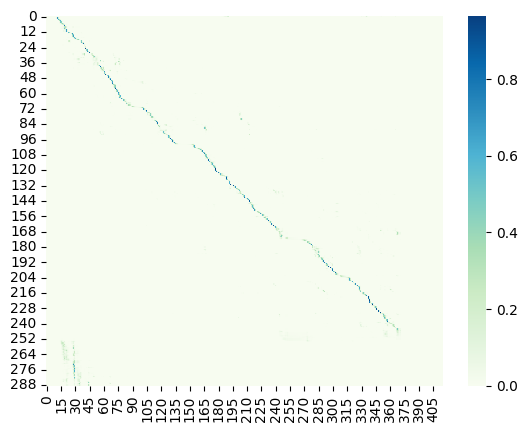

Saved best model

Epoch: 30/80


Val:   3%|▎         | 1/33 [00:02<01:33,  2.92s/it, dist=42.9200]

Ground Truth :  I'VE BEEN UP IN CANADA WITH MY BRIDGE AND I ARRANGED NOT TO COME TO NEW YORK UNTIL AFTER YOU HAD GONE
Prediction   :  I HAVE BEEN HUPBAND CAN IT I WISH MY BRIDGE AND I ARRANGE NOT TO COME TO NEW ARCHINGTON OFFICE HAD GONE


Val:   6%|▌         | 2/33 [00:05<01:22,  2.66s/it, dist=42.9767]

Ground Truth :  SO THAT ON THAT SCORE THERE IS LITTLE OR NO DANGER
Prediction   :  SO THAT ON THAT SCORE OF THEIR DEARS LITTLE OR NO DANGER


Val:   9%|▉         | 3/33 [00:07<01:17,  2.57s/it, dist=41.4289]

Ground Truth :  I DON'T WANT YOU TO I LOVE TO SEE YOU SO YOUNG AND HAPPY ONLY YOU ARE NOT THE OLD DAVID AND I'VE GOT TO GET ACQUAINTED WITH THE NEW ONE
Prediction   :  I DON'T WANT YOUR TEAR I LOVE TO SEE YOU SO YOU YOU ARE NOT THE OLD DAY FOR IT AND OF GOT TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO GO TO 


Val:  12%|█▏        | 4/33 [00:10<01:11,  2.47s/it, dist=39.7950]

Ground Truth :  I NOTICE THAT THEY ARE GENERALLY PERSONS WHO HAVE ALREADY TENDERED THEIR OFFERINGS
Prediction   :  I KNOW ITS THAT THEY ARE GENERALLY PERSONS WHO HAVE ALREADY TENDERED THEIR OFFERINGS


Val:  15%|█▌        | 5/33 [00:12<01:06,  2.39s/it, dist=38.2040]

Ground Truth :  THEN CAPTAIN BURGESS CRIED NORTH HIS PALE FACE FLUSHING I TELL YOU THE BOY'S BLOOD WILL BE ON YOUR HEAD
Prediction   :  THEN CAPTAIN BURGEST CRIED NORTH IS PAIL FACING I TELL YOU THE BOY'S BLUE WILL BE UNDER HEAD


Val:  18%|█▊        | 6/33 [00:14<01:06,  2.45s/it, dist=38.6978]

Ground Truth :  SHE CUT SQUARES OF COTTON CLOTH AND WE SEWED THEM TOGETHER INTO A BOOK
Prediction   :  SHE CUT SCLARES OF CONCLUSION CLOTH AND WE SOLD THEM TOGETHER INTO A BOOK


Val:  21%|██        | 7/33 [00:17<01:06,  2.54s/it, dist=40.1714]

Ground Truth :  THE LAST STRAINS OF THE ILL TREATED ILL FATED INTERMEZZO HAD DIED AWAY AND AFTER THEM HAD DIED AWAY ALSO THE RUMBLING OF THE WHEELS OF THE MURDEROUS BARREL ORGAN THAT HAD SO GAILY EXECUTED THAT ALONG WITH THE NINE OTHER TUNES OF ITS REPERTORY TO THE ADMIRATION OF THE HOUSEMAID AT THE WINDOW OF THE HOUSE OPPOSITE AND THE CROWING DELIGHT OF THE TWO BABIES NEXT DOOR
Prediction   :  THE LAST STRANGE OF THE ILLUTION IT IS ILL TREE TO IT INTERMESSER HAD DIED AWAY AND AFTER THEM HAD DIED AWAY OUTSIDE THE RUMBLING OF THE WEALS OF THE MURDER OF SPARE OR GIVES KEEP AT THAT LONG WITH THE NIGHT OTHER TEAMS OF IT AND THE CROWN DELIGHTED THE TWO BATTERY TO THE HADNESS OF IT AND THE CROWNING DELIGHT OF THE TWO BATTERY TO THE HADNESS OF IT AND THE CROWNING DELIGHT OF THE TWO BATTERY TO THE HADNESS OF IT AND THE CROWNING DELIGHT OF THE TWO BATTERY TO THE HADNESS OF IT AND THE CROWNING DELIGHT OF THE TWO BATTERY TO THE HADNESS OF IT AN


Val:  24%|██▍       | 8/33 [00:20<01:02,  2.52s/it, dist=39.9500]

Ground Truth :  OUR ARMY STOPPED AT MURFREESBORO
Prediction   :  OUR ARMY STOPPED IT MERELY BARTHERS BART


Val:  27%|██▋       | 9/33 [00:22<00:59,  2.49s/it, dist=39.6985]

Ground Truth :  THE BROWN GROUND BENEATH IS LEFT FOR THE MOST PART ONE TOUCH OF BLACK IS PUT FOR THE HOLLOW TWO DELICATE LINES OF DARK GRAY DEFINE THE OUTER CURVE AND ONE LITTLE QUIVERING TOUCH OF WHITE DRAWS THE INNER EDGE OF THE MANDIBLE
Prediction   :  THE BROWN GROUND AND NEITHER HIS LEFT FOR THE MUST HARD ONE TOUCHED BLACK HIS POOR WHEN TOUCHED BLACK AS POOT FOR THE HOLLOW TO DOUBT COULD LINE TO DOUBT COULD LINE TOUCH OF WHITE DROWSY INTEREST OF THE MENDABLE


Val:  30%|███       | 10/33 [00:25<00:56,  2.47s/it, dist=39.4407]

Ground Truth :  I DO NOT KNOW CONFESSED SHAGGY
Prediction   :  UNTO THAT NO CONVESS SHAGGY


Val:  33%|███▎      | 11/33 [00:27<00:53,  2.42s/it, dist=38.9418]

Ground Truth :  ILLUSTRATION GINGER
Prediction   :  THE LISTENING GENTER


Val:  36%|███▋      | 12/33 [00:29<00:49,  2.37s/it, dist=38.1306]

Ground Truth :  THEREFORE DON'T TALK TO ME ABOUT VIEWS AND PROSPECTS
Prediction   :  THEREFORE DON'T TALK TO ME ABOUT USE AND PROSPECTS


Val:  39%|███▉      | 13/33 [00:31<00:47,  2.37s/it, dist=38.3672]

Ground Truth :  THESE THOUGHTS AGITATED ME ALL DAY AND MY IMAGINATION SCARCELY CALMED DOWN AFTER SEVERAL HOURS SLEEP
Prediction   :  THESE THOUGHTS AGAIN TO TAKE ME ALL DAY AND MY MAGINATION SCARCELY COME DOWN AFTER SEVERAL OUTWARDSLY


Val:  42%|████▏     | 14/33 [00:34<00:44,  2.37s/it, dist=37.8471]

Ground Truth :  MUST I LEAVE ALONE NO
Prediction   :  MUST ELIVE THE LOWER NOT


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.43s/it, dist=38.1662]

Ground Truth :  I TOLD HIM AND HE INSISTED UPON MY COMING WITH HIM IN THE GONDOLA SAYING THAT HE WOULD LEAVE ME AT MY HOUSE
Prediction   :  I TOLD HIM IN HEAVES THE UPON MY COMMITTEE WITH HIM IN THE GONDAL SAYING THAT HE WOULD LEAVE ME AT MY HELPS


Val:  48%|████▊     | 16/33 [00:39<00:42,  2.49s/it, dist=38.4383]

Ground Truth :  POUR MAYONNAISE OVER ALL CHILL AND SERVE
Prediction   :  PORT MAY AND THEY IS OVER ALL JULIA AND SERVE


Val:  52%|█████▏    | 17/33 [00:42<00:39,  2.50s/it, dist=38.5949]

Ground Truth :  DOST THOU RISE AGAINST HIM WHO GIVES THEE HIS BREAD
Prediction   :  THIS THOUGH RIGHTS AGAINST HIM WHO GIVES THE HIS PREDEC


Val:  55%|█████▍    | 18/33 [00:44<00:37,  2.51s/it, dist=38.5826]

Ground Truth :  IT WAS NOT FROM ANY REAL CAUSE OF GRIEF THAT SHE WEPT BUT THERE WAS A MAGNETIC QUALITY IN TEARS WHICH ALWAYS ATTRACTED HER'S
Prediction   :  IT WAS NOT FROM ANY REAL CAUSE OF GREET THAT SHE WETCHED BUT THERE WAS AN AGNET ACQUAINTANCE WHICH ALWAYS ATTRACTED HERS


Val:  58%|█████▊    | 19/33 [00:46<00:34,  2.46s/it, dist=38.2049]

Ground Truth :  BUT THE PLANT RAN AND IT WAS THE FIRST THREE WIRE STATION IN THIS COUNTRY
Prediction   :  BUT THE PLAIN RAN AND IT WAS THE FIRST THREE WINES THAT IT WAS THE FIRST THREE WINES THAT IN THIS COUNTRY


Val:  61%|██████    | 20/33 [00:49<00:32,  2.52s/it, dist=38.5733]

Ground Truth :  NOT TILL THE DOCTOR CAME HER DOCTOR WHO WAS HAPPILY IN HIS OFFICE IN THIS VERY BUILDING
Prediction   :  NOT TILL THE DARK GAME CARED OUT DREW WAS HAPPILY IN HIS OFFICE IN THIS VERY BILLING


Val:  64%|██████▎   | 21/33 [00:52<00:30,  2.51s/it, dist=38.6959]

Ground Truth :  IF A MAN HAD STOLEN A POUND IN HIS YOUTH AND HAD USED THAT POUND TO AMASS A HUGE FORTUNE HOW MUCH WAS HE OBLIGED TO GIVE BACK THE POUND HE HAD STOLEN ONLY OR THE POUND TOGETHER WITH THE COMPOUND INTEREST ACCRUING UPON IT OR ALL HIS HUGE FORTUNE
Prediction   :  IF A MAN OF STILL UNAPPOUNDED IN HIS YOUTH AND ADUSED THAT POWER TO A MASS A HUGE FORTUNE HOW MUCH WAS HE OBLIGED TO GIVE BACK THE POWER DEAD STONE AND ONLY WITH A POUND TOGETHER WITH THE COMPOUND TOGETHER WITH THE COMPOUND TOGETHER WITH THE COMPOUND TOGETHER WITH THE COMPOUND TOGETHER WITH THE COMPOUND TOGETHER WITH THE COMPOUND TOGETHER WITH THE COMPOUND TOGETHER WITH THE COMPOUND TOGETHER WITH THE COMPOUND TOGETHER WITH THE COMPOUND TOGETHER WITH THE COMPOUND TOGETHER WITH THE COMPOUND TOGETHER WITH THE COMPOUND TOGETHER WITH THE COMPOUND T


Val:  67%|██████▋   | 22/33 [00:54<00:27,  2.50s/it, dist=38.8533]

Ground Truth :  WHAT THEN MY LORD
Prediction   :  WHAT THEN MY LORD


Val:  70%|██████▉   | 23/33 [00:57<00:25,  2.54s/it, dist=39.1458]

Ground Truth :  SHE MERELY BRUSHED HIS CHEEK WITH HER LIPS AND PUT A HAND LIGHTLY AND JOYOUSLY ON EITHER SHOULDER
Prediction   :  SHE MEANT BRUSHED HIS CHEEK WITH HER LIPS AND COULD A HANDS LEGLY AND JOYOUSLY ON EITHER SHOULDER


Val:  73%|███████▎  | 24/33 [00:59<00:22,  2.49s/it, dist=39.1944]

Ground Truth :  SOMETHING OF THEIR TROUBLING SWEETNESS CAME BACK TO ALEXANDER TOO
Prediction   :  SOMETHING OF THEIR CHUBBLING SWEETNESS CAME BACK TO HILLS AND HER TWO


Val:  76%|███████▌  | 25/33 [01:01<00:19,  2.43s/it, dist=39.0267]

Ground Truth :  IT WASN'T SIMPLY THAT SHE SAID SO BUT THAT I KNEW SHE HADN'T I WAS SURE I COULD SEE
Prediction   :  COSENT TO THAT YOU SAID SO THAT I KNEW SHE HADN'T I WAS SHORE I COULDN'T I WAS SHORE I COULD SEE


Val:  79%|███████▉  | 26/33 [01:04<00:17,  2.47s/it, dist=39.0400]

Ground Truth :  WE HAVE ALL BEEN GIVING MARY ANN PRESENTS AND I SUPPOSE YOU MISTER WHITING HAVE BEEN GIVING HER SOMETHING TOO
Prediction   :  WE HAVE ALL BEEN GIVING MERE AND PRESENCE AND I SUPPOSE YOU WHO MISTER WIDEN HAVE BEEN GIVING HER SOMETHING TO THE


Val:  82%|████████▏ | 27/33 [01:06<00:14,  2.48s/it, dist=39.0180]

Ground Truth :  BUT WHY ON THAT ACCOUNT THEY SHOULD PITY ME I ALTOGETHER FAIL TO UNDERSTAND
Prediction   :  BUT WHY AND THAT ACCOUNT THEY SHOULD PITY ME I OUGHT TOGETHER FAILED TO UNDERSTAND


Val:  85%|████████▍ | 28/33 [01:09<00:12,  2.47s/it, dist=38.9240]

Ground Truth :  NOT EXACTLY RETURNED KALIKO
Prediction   :  MOTHERS ACCLAISED RUTH TURN CALLICAL


Val:  88%|████████▊ | 29/33 [01:11<00:09,  2.48s/it, dist=38.8628]

Ground Truth :  THE WAITER OF THE MAGAZZINO CAME TO BE PAID AND OUR CHIEF GAVE HIM WHAT WAS DUE ENJOINING SILENCE UNDER PENALTY OF DEATH
Prediction   :  THE WATER OF THE MIGHT AS IN OCCASION TO BE PAID AND OUR CHIEF GAVE HIM WHAT WAS DOING IN JOINING SILENCE UNDER PETTLE TO OBDESS


Val:  91%|█████████ | 30/33 [01:14<00:07,  2.51s/it, dist=38.9024]

Ground Truth :  STRAIN THE SAUCE THROUGH A FINE COLLANDER AND ADD A FEW RAISINS A PIECE OF HONEY CAKE OR GINGER SNAPS AND THE MEAT OF ONE FRESH TOMATO
Prediction   :  STRING THE SAUSE TO A FINE COLUNDER AND AT A FEW RAZENS APPEASED OF HUNTY CAT OR GENTERS NOT AND THE MEET OF ONE FIRST MATTER


Val:  94%|█████████▍| 31/33 [01:16<00:04,  2.47s/it, dist=38.9951]

Ground Truth :  WELL I DON'T WISH TO SEE IT ANY MORE OBSERVED PHOEBE TURNING AWAY HER EYES IT IS CERTAINLY VERY LIKE THE OLD PORTRAIT
Prediction   :  WELL I DON'T WISH TO SEE IT ANY MORE OBSERVE FEEBLY TURNING AWAY HER EYES IN HIS CERTAINLY BEARY LIKE THE OLD PORTRAIT


Val:  97%|█████████▋| 32/33 [01:19<00:02,  2.46s/it, dist=38.9623]

Ground Truth :  MODE PUT THE MILK AND BUTTER INTO A SAUCEPAN AND KEEP SHAKING IT ROUND UNTIL THE LATTER IS MELTED
Prediction   :  MODE PUT THE MILK AND BUTTER INTO A SOUS PAN AND KEEP SHAKING IT ROUND INTO THE LADDER IS MELTED


Ground Truth :  THE LONG DRIZZLE HAD BEGUN PEDESTRIANS HAD TURNED UP COLLARS AND TROUSERS AT THE BOTTOM
Prediction   :  THE LONG DRISTLE HAD BEGUN PEDESTRANCE HAD TURNED AT COLORS AND TROUSERS AT THE BODIEN
	Train Loss 0.4852	 Learning Rate 0.0008457
	Val Dist 38.5869	
	Teacher Forcing Ratio 1	


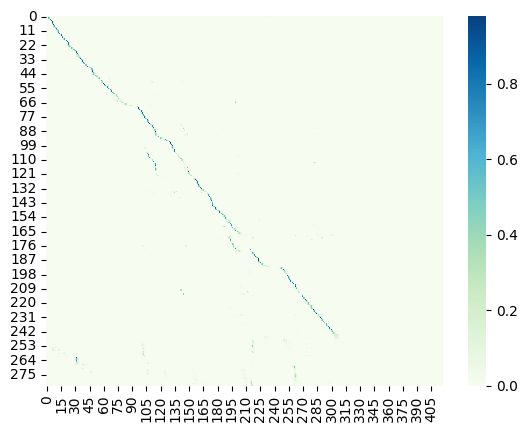

Saved best model

Epoch: 31/80


Val:   3%|▎         | 1/33 [00:02<01:34,  2.95s/it, dist=30.0067]

Ground Truth :  THEN HE TOSSED IT DOWN AND SEIZED THE NEXT
Prediction   :  THEN HE TOSSED A DOWN AND SEES THE NEXT


Val:   6%|▌         | 2/33 [00:05<01:18,  2.53s/it, dist=25.7933]

Ground Truth :  THE SLANT OF THE MOON PRESAGED EVIL FOR THE KING OF VENDHYA THE STARS ARE IN TURMOIL THE SERPENT IN THE HOUSE OF THE ELEPHANT
Prediction   :  THOSE SLANT OF THE MOON PRESENTS EVER FOR THE KING OF VENUA THE STARS ARE INTEREMOILED THE SURPRISED IN THE HOUSE OF THE ELEVENT


Val:   9%|▉         | 3/33 [00:07<01:14,  2.49s/it, dist=26.1267]

Ground Truth :  IN IT I WAS DEPOSITED WITH MY LUGGAGE
Prediction   :  IN IT I WAS DEPOSITED WITH MY LUGGAGE


Val:  12%|█▏        | 4/33 [00:10<01:12,  2.51s/it, dist=27.7800]

Ground Truth :  SO THEY WENT ON TO THE VERANDAH AND LOOKED DOWN UPON THE LIGHTS OF THE PRISON AND LISTENED TO THE SEA LAPPING THE SHORE
Prediction   :  SO THEY WENT ON TO THE VERANDO AND LOOKED DOWN UPON THE LIGHTS OF THE PRISON AND LISTENED TO THE SEA LAPPING THE SHORE


Val:  15%|█▌        | 5/33 [00:12<01:09,  2.47s/it, dist=26.6547]

Ground Truth :  TO MAKE HOT BUTTERED TOAST SEVENTEEN TWENTY SIX
Prediction   :  TO MAKE HOT BUTTERED TOAST SEVENTEEN TWENTY SIX


Val:  18%|█▊        | 6/33 [00:15<01:06,  2.47s/it, dist=26.2867]

Ground Truth :  THE NEAREST SAID THE DISTRICT DOCTOR IS A GOOD ITALIAN ABBE WHO LIVES NEXT DOOR TO YOU SHALL I CALL ON HIM AS I PASS
Prediction   :  THE NEAREST SAID THE DISTRESS DACTOR IS A COUNTER IS A COUNTENANCE OR TO TOO SHORE ACCOND HIM AS A PASS


Val:  21%|██        | 7/33 [00:17<01:02,  2.42s/it, dist=25.3829]

Ground Truth :  FOR MINUTES NO ONE STIRRED AMONG THE WRECKAGE
Prediction   :  FOR MINETS NO ONE STURDED AMONG THE RECKAGE


Val:  24%|██▍       | 8/33 [00:19<01:00,  2.40s/it, dist=24.7750]

Ground Truth :  I OFTEN HEARD HER TALK OF YOU IN THE SAME SORT OF WAY
Prediction   :  I OFTEN HEARD HER TALK OF YOU IN THE SAME SORT OF WAY


Val:  27%|██▋       | 9/33 [00:22<00:57,  2.38s/it, dist=24.3096]

Ground Truth :  BUT PEARL WHO WAS A DAUNTLESS CHILD AFTER FROWNING STAMPING HER FOOT AND SHAKING HER LITTLE HAND WITH A VARIETY OF THREATENING GESTURES SUDDENLY MADE A RUSH AT THE KNOT OF HER ENEMIES AND PUT THEM ALL TO FLIGHT
Prediction   :  BUT PERAL WHO WAS A DOG WAS TILED EFFORT AFTER FROWNING STAMPING HER FOOT AND SHAKING HER LITTLE HAND WITH A VERY DIFFERENT ENGESTURES SUDDENLY MADE A RUSH AT THE NOT OF HER ENEMIES AND PUT THEM ALL TO FLIGHT


Val:  30%|███       | 10/33 [00:24<00:55,  2.43s/it, dist=24.3427]

Ground Truth :  MASS SUICIDE THAT'S WHAT IT WAS NOTICE WHAT'S IN THE CORNERS
Prediction   :  MASS SOON ASIDE THAT'S WHAT IT WAS NO RESUME WHAT'S IN THE CORNERS


Val:  33%|███▎      | 11/33 [00:26<00:52,  2.37s/it, dist=24.3630]

Ground Truth :  I CAN SEE THEM NOW EXACTLY AS THEY LOOKED WORKING ABOUT THE TABLE IN THE LAMPLIGHT JAKE WITH HIS HEAVY FEATURES SO RUDELY MOULDED THAT HIS FACE SEEMED SOMEHOW UNFINISHED OTTO WITH HIS HALF EAR AND THE SAVAGE SCAR THAT MADE HIS UPPER LIP CURL SO FEROCIOUSLY UNDER HIS TWISTED MUSTACHE
Prediction   :  I CAN SEE THEM NOW EXACTLY AS THEY LOOKED WORKING ABOUT THE TABLE IN THE LAMP LIGHT JAKE WITH HIS HEAVY FEATURES SO RUBBLY MOLDED THAT HIS FACE SEEMED SOMEHOW UNFINISHED ODD WITH HIS HALF EAR AND THE SABBAG SCAR THE NEIGHBOUS UPPER LITTLE CURLS OF FOROCIOUSLY UNDER HIS TWISTED MISTASH


Val:  36%|███▋      | 12/33 [00:29<00:50,  2.42s/it, dist=24.3978]

Ground Truth :  SHE CALLED HIS NAME ON THE THRESHOLD BUT IN HER SWIFT FLIGHT ACROSS THE ROOM SHE FELT A CHANGE IN HIM AND CAUGHT HERSELF UP SO DEFTLY THAT HE COULD NOT TELL JUST WHEN SHE DID IT
Prediction   :  SHE CALLED HIS NAME ON THE FRESH HOLD BUT IN HER SWIFT FLIGHT ACROSS THE ROOM SHE FELT A CHANGE IN HIM AND CAUGHT HERSELF UP SO DEATHLY THAT HE COULD NOT TELL JUST WHEN SHE DID IT


Val:  39%|███▉      | 13/33 [00:31<00:48,  2.40s/it, dist=24.3174]

Ground Truth :  BUT WHY ON THAT ACCOUNT THEY SHOULD PITY ME I ALTOGETHER FAIL TO UNDERSTAND
Prediction   :  BUT WHY AND THAT ACCOUNT THEY SHOULD PITY ME I ALTOGETHER FAILED TO UNDERSTAND


Val:  42%|████▏     | 14/33 [00:33<00:44,  2.35s/it, dist=24.1314]

Ground Truth :  KEEP YOUR APPOINTMENT AND BE ASSURED THAT I SHALL ISSUE MY COMMANDS WITH MORE CIRCUMSPECTION FOR THE FUTURE AS I FIND HOW STRICTLY THEY ARE COMPLIED WITH
Prediction   :  KEEP YOUR APPOINTMENT AND BE A SHORT THAT I SHALL IS SHE MIGHT COMMAND WITH MORE CIRCUMSPECTION FOR THE FUTURE AS I FIND HAS STRICTLY THEY ARE PROPLIED WITH


Val:  45%|████▌     | 15/33 [00:36<00:42,  2.36s/it, dist=24.1658]

Ground Truth :  IT IS SURPRISING HOW SOON THE EYE BECOMES ACCUSTOMED TO MISSING TWENTY SHEEP OUT OF TWO OR THREE HUNDRED
Prediction   :  IT IS THE PRIZE IN HOST IN THE IDEA BECOMES A CESTANTS TO MISS INTONE HE SHEEP OUT OF TWO OF THREE HUNDRED


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.40s/it, dist=24.1800]

Ground Truth :  HE LOOKED DUBIOUSLY AT HIS BROTHER IN LAW BUT HE DID NOT ASK HIM FOR INFORMATION
Prediction   :  IT LOOKS DEBISELY AT HIS BUTTER ALLOW BUT HE DID THAT ASK HIM FROM FRIEND FOR MASSION


Val:  52%|█████▏    | 17/33 [00:41<00:38,  2.41s/it, dist=24.2027]

Ground Truth :  I UNDERSTAND YOU TO SAY THAT THERE ARE THREE STUDENTS WHO USE THIS STAIR AND ARE IN THE HABIT OF PASSING YOUR DOOR YES THERE ARE
Prediction   :  I UNDERSTAND YOU TO SAY THAT THERE ARE THREE STUDENTS HE USED THIS STAIR AND OUR IN THE HABIT OF PASSING YOUR DOOR YES THERE ARE


Val:  55%|█████▍    | 18/33 [00:43<00:36,  2.44s/it, dist=24.0359]

Ground Truth :  THE LADY AND THE GUITAR CERTAINLY PASSED THE NIGHT AT HILL VIEW VILLA BUT WHEN HIS MOTHER VERY ANGRY AND VERY FRIGHTENED CAME UP WITH HIM AT ABOUT NOON THE HOUSE LOOKED JUST AS USUAL AND NO ONE WAS THERE BUT THE CHARWOMAN
Prediction   :  THE LADY ENLIGHTED HARSERTLY PASSED THE NIGHT AT HILL VIEW YELLOW BUT WHEN HIS MOTHER A VERY ANGRY FRAGON CAME UP WITH HIM ABOUT NEAR THE HOUSE SUCH JUST AS USUAL AND NO AT WAS THERE BUT THE CHARLOMAN


Val:  58%|█████▊    | 19/33 [00:46<00:34,  2.44s/it, dist=24.3951]

Ground Truth :  ILLUSTRATION THE CUCUMBER
Prediction   :  ILLUSTRATION THE CUCUMBER


Val:  61%|██████    | 20/33 [00:48<00:32,  2.47s/it, dist=24.5043]

Ground Truth :  IT WHIPPED HIS BLOOD AS IT BLEW DOWN FROM THE SLOPES AND CRESTS
Prediction   :  IT WITH HIS BLOOD AS IT BLUE DOWN FROM THE SLOPES AND CRESTS


Val:  64%|██████▎   | 21/33 [00:51<00:28,  2.41s/it, dist=24.4819]

Ground Truth :  YOU WANT ME TO SAY IT SHE WHISPERED
Prediction   :  YOU WANT ME TO SAID SHE RESPERED


Val:  67%|██████▋   | 22/33 [00:53<00:26,  2.37s/it, dist=24.5433]

Ground Truth :  THIS ALTERNATIVE IN THE CAPTAIN'S PLANS TERMINATING THE VOYAGE A MONTH EARLIER THAN HIS ARRANGEMENTS HAD CONTEMPLATED PUZZLED RANDAL
Prediction   :  THIS SOLD TURNED IT IN THE CAPTAIN'S PLANS TERMINATING THE VOICE AMONGST EARLY OR THEN IS A RANGEMENTS HAD CONTINUED PLATED PUZZLED OR HIMBEL


Val:  70%|██████▉   | 23/33 [00:55<00:24,  2.43s/it, dist=24.5959]

Ground Truth :  A PERSON WOULD THINK THAT AFTER A FAMILY HAD LIVED SO LONG IN A PLACE ALL THE NEIGHBORS WOULD BE FOND OF THEM YET IT IS NOT SO
Prediction   :  A PERSON WOULD THINK THAT AFTER A FAMILY HAD BEEN OFF SO LONG IN A PLACE ALL THE NABORS WOULD BE FUNNED OF THEM YET IT IS NOT SO


Val:  73%|███████▎  | 24/33 [00:58<00:21,  2.42s/it, dist=24.3992]

Ground Truth :  THE LODGE IN WHICH UNCAS WAS CONFINED WAS IN THE VERY CENTER OF THE VILLAGE AND IN A SITUATION PERHAPS MORE DIFFICULT THAN ANY OTHER TO APPROACH OR LEAVE WITHOUT OBSERVATION
Prediction   :  THE LODGE IN WHICH OCCUSS WAS CONFINED WAS IN THE VERY CENTER OF THE VILLAGE AND IN A SITUATION PERHAPS MORE DIFFICULT AND ANY OTHER TO APPROACH OR LEAVE WITHOUT OBSERVATION


Val:  76%|███████▌  | 25/33 [01:00<00:19,  2.46s/it, dist=24.4693]

Ground Truth :  WATCH THE SAVAGES OUTSIDE SAID ROBERT
Prediction   :  WHAT SHOULD SAVE A GIFT IS OUTSIDE SAID ROBBER


Val:  79%|███████▉  | 26/33 [01:03<00:17,  2.48s/it, dist=24.4187]

Ground Truth :  THESE WILDERING PHANTASIES THEN CARRIED ME TO SEE MY LADY DEAD
Prediction   :  THESE WILLER IN FANCIES AND CARRIED ME TO SEE MY LADY DEAD


Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.45s/it, dist=24.4798]

Ground Truth :  I THINK I CANNOT GO RIGHT FOR I EITHER CHECK MYSELF TILL I'M DOWNRIGHT CROSS TO HIM OR ELSE I SPEAK JUST NATURAL AND THAT'S TOO KIND AND TENDER BY HALF
Prediction   :  I THINK I CAN NOT GO RIGHT POOR I THE TECHNICE OF TILL UNDOWN RIGHT CRUST HIM OR ALSO SPEAK JUST NATURAL AND NOT TO KIND INTENDED BY HALF


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.39s/it, dist=24.1998]

Ground Truth :  OVER THE FIREPLACE THERE WAS A LARGE OLD FASHIONED GILT MIRROR
Prediction   :  OVER THE FIRE PLACE THERE WAS A LARGE OLD FASHIONED GILT MERRIW


Val:  88%|████████▊ | 29/33 [01:10<00:09,  2.43s/it, dist=24.3416]

Ground Truth :  A RED HAIRED MOUNTAIN OF A MAN WITH AN APPARENTLY INEXHAUSTIBLE STORE OF ENERGY
Prediction   :  I RETAINED MOUNTAIN OF A MAN WHO THEN APPEARANTLY IN EXHAUSTIBLE STORE OF ENERGY


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.36s/it, dist=24.1729]

Ground Truth :  MY SCHOLAR HAS BEEN LEFT VERY POOR BUT HE IS HARD WORKING AND INDUSTRIOUS HE WILL DO WELL
Prediction   :  MY SCOLLET HAS BEEN LEFT A VERY POOR BUT HE IS HARD WORKING AND INDUSTRIOUS HE WILL DO WELL


Val:  94%|█████████▍| 31/33 [01:15<00:04,  2.35s/it, dist=24.1185]

Ground Truth :  FUCHS BROUGHT UP A SACK OF POTATOES AND A PIECE OF CURED PORK FROM THE CELLAR AND GRANDMOTHER PACKED SOME LOAVES OF SATURDAY'S BREAD A JAR OF BUTTER AND SEVERAL PUMPKIN PIES IN THE STRAW OF THE WAGON BOX
Prediction   :  FOOKS BROUGHT UP A SACK OF PHITATORS AND A PIECE OF CURED PORK FROM THE STELLAR AND GRANDMOTHER PACKED SOME LOWS OF SETTERED AS BREAD A JAR OF BUTTER AND SEVERAL PUMP CONPIES IN THE STROVE OF THE WAGON BOX


Val:  97%|█████████▋| 32/33 [01:17<00:02,  2.38s/it, dist=24.2448]

Ground Truth :  THE LADY IS NOT THE MOTHER OF THE BOYS BUT THEIR AUNT
Prediction   :  THE LADY IS NOT TO MOTHER OF THE BOYS BUT THERE ANNETTE


Val: 100%|██████████| 33/33 [01:18<00:00,  2.04s/it, dist=25.2753]

Ground Truth :  THEY THEREFORE ENTERTAIN A CALM SENSE OF THEIR SUPERIORITY THEY DO NOT DREAM OF VAUNTING PRIVILEGES WHICH EVERYONE PERCEIVES AND NO ONE CONTESTS AND THESE THINGS ARE NOT SUFFICIENTLY NEW TO THEM TO BE MADE TOPICS OF CONVERSATION
Prediction   :  I THEREFORE ANTOTAIN A COMPENSENSE OF HER SUPERIORITY THEY DO NOT DREAM A FONTING PROVIDENT PROVIDES WHICH EVER ON PRECEIVES AT NO ONE COULD DESTROY AND SEE NEW TO THEM TO BE MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE TOBY MADE


	Train Loss 0.3696	 Learning Rate 0.0008291
	Val Dist 25.2753	
	Teacher Forcing Ratio 1	


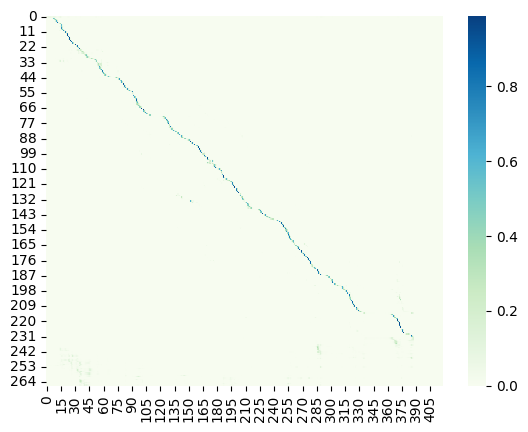

Saved best model

Epoch: 32/80


Val:   3%|▎         | 1/33 [00:02<01:32,  2.88s/it, dist=17.8133]

Ground Truth :  HE PAUSED THEY NEVER DID TO ME
Prediction   :  HE POSSED THENEVER DID TO ME


Val:   6%|▌         | 2/33 [00:05<01:20,  2.60s/it, dist=19.8500]

Ground Truth :  OH MISTER NORTH SAYS KIRKLAND WHY DID YOU STOP ME
Prediction   :  ALMOST DEAR NOR SAYS CORPLAND WHY DID YOU STOP ME


Val:   9%|▉         | 3/33 [00:07<01:14,  2.50s/it, dist=19.9622]

Ground Truth :  YOUR MAMA I SAID ANGRILY WANTS OTHER PEOPLE'S THINGS
Prediction   :  YOU ARE MONEY SAID ANGRYLY ONCE OTHER PEOPLE'S THINGS


Val:  12%|█▏        | 4/33 [00:10<01:12,  2.52s/it, dist=20.9583]

Ground Truth :  THE NEW NUMBER OF A POPULAR WEEKLY JOURNAL HAD THAT DAY BEEN PUBLISHED RANDAL BOUGHT IT
Prediction   :  THE NEW NUMBER OF A POPULAR LEACHELY JEANNEL HEAD THAT DAY BEEN PUBLISHED GRANDLE BODIE


Val:  15%|█▌        | 5/33 [00:12<01:09,  2.47s/it, dist=20.5507]

Ground Truth :  EMERGING AT EUSTON AT HALF PAST THREE O'CLOCK IN THE AFTERNOON ALEXANDER HAD HIS LUGGAGE SENT TO THE SAVOY AND DROVE AT ONCE TO BEDFORD SQUARE
Prediction   :  EMERGING UP USED IN THAT HALF PASSED THROUGH YOUR COCK AND THE AFTERNOON ALEXANDER HAD HIS LOGGED SENT TO THE SEVERE AND JOHN THAT ONCE TO BED FOR ITS SQUARE


Val:  18%|█▊        | 6/33 [00:15<01:06,  2.48s/it, dist=21.2356]

Ground Truth :  WHO IS THE WRANGLER THIS MORNING ASKED THE FOREMAN GLANCING ABOUT AT HIS MEN
Prediction   :  WHO WAS THE VANGAGE OF THIS MORNING ASKED THE FORM AND BLANCING MAN OF HIS MIND


Val:  21%|██        | 7/33 [00:17<01:03,  2.44s/it, dist=20.8848]

Ground Truth :  ANYWAY HE WOULD NEVER ALLOW ONE OF HIS HORSES TO BE PUT TO SUCH A STRAIN
Prediction   :  ANYWAY HE WOULD NEVER ALLOW ONE OF HIS HORSES TO BE PUT TO SUCH A STRAIN


Val:  24%|██▍       | 8/33 [00:19<01:00,  2.42s/it, dist=20.1425]

Ground Truth :  O HUSBAND WHOSE UNHAPPY FATE IN BEING MINE HATH BORNE THEE FROM THE MARRIAGE BED TO THE GRAVE
Prediction   :  OH HUSPINED POSSENT HAPPY FAITH IN BEING MINE HATH BORN THE FRONT THE BARRIER TO BED TO THE GRAVE


Val:  27%|██▋       | 9/33 [00:22<00:57,  2.40s/it, dist=20.2904]

Ground Truth :  EXCELLENT ROLLS
Prediction   :  EXCELLENT ROLLS


Val:  30%|███       | 10/33 [00:24<00:55,  2.39s/it, dist=20.2993]

Ground Truth :  CAULIFLOWER MAYONNAISE TAKE COLD BOILED CAULIFLOWER BREAK INTO BRANCHES ADDING SALT PEPPER AND VINEGAR TO SEASON
Prediction   :  COLOR FLOWER MAY AN AYS TAKE COLD BOILED COLOR FLOWER BLAKE INTO BRANCHES ADDING SOLD PEPPER AND VINIGAR TO SEE SOMETHING


Val:  33%|███▎      | 11/33 [00:26<00:52,  2.40s/it, dist=20.4552]

Ground Truth :  HE'S SO FAR TO THE RIGHT OF ME THAT I CAN'T REACH HIM
Prediction   :  HE ASSURED TO THE RIGHT OF ME THAT I CAN'T REACH HIM


Val:  36%|███▋      | 12/33 [00:29<00:49,  2.37s/it, dist=20.3156]

Ground Truth :  THEN HE SAT DOWN IN HIS CHAIR AND GAZED WITHOUT SEEING CONTEMPLATING THE RESULT OF HIS WORK
Prediction   :  THEN HE SAID DOWN IN HIS CHAIR AND GAZED WITHOUT SEEING CONTEMPLETING THE RESULT OF HIS WORK


Val:  39%|███▉      | 13/33 [00:31<00:47,  2.37s/it, dist=20.8456]

Ground Truth :  SHORTLY AFTER PASSING ONE OF THESE CHAPELS WE CAME SUDDENLY UPON A VILLAGE WHICH STARTED UP OUT OF THE MIST AND I WAS ALARMED LEST I SHOULD BE MADE AN OBJECT OF CURIOSITY OR DISLIKE
Prediction   :  SHALL LEAVE TO PASSING ONE OF THESE CHAPLES WE CAME SUDDENLY UPON A VEIL INTO ITS STATED UP OUT OF THE MIST AND I WAS ALIVE LESS I SHOULD BE MADE AN OBJECT OF CARE ASCIDY OR DISLIKE


Val:  42%|████▏     | 14/33 [00:34<00:45,  2.40s/it, dist=21.2395]

Ground Truth :  THIS JUICE WHICH IS CALLED CITRIC ACID MAY BE PRESERVED IN BOTTLES FOR A CONSIDERABLE TIME BY COVERING IT WITH A THIN STRATUM OF OIL
Prediction   :  THIS JEWS WHICH IS CONSIDERAGASTED HE BEGAN PRESERVED IN BODILS FOR A CONSIDERABLE TIME BY COVERING IT WITH A THIN STRATUM OR


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.40s/it, dist=21.1151]

Ground Truth :  THEN AGAIN THERE WAS NO KNOWN WAY TO LUBRICATE AN ENGINE FOR CONTINUOUS RUNNING AND MISTER EDISON INFORMED ME THAT AS A MARINE ENGINE STARTED BEFORE THE SHIP LEFT NEW YORK AND CONTINUED RUNNING UNTIL IT REACHED ITS HOME PORT SO AN ENGINE FOR HIS PURPOSES MUST PRODUCE LIGHT AT ALL TIMES
Prediction   :  THEN AGAIN THERE WAS NO KNOWN WHERE YOU TOO LOVE RECADED ANGE IN FORECONTINUE WAS RUNNING AND MISTER EDISON AND FORM MAY HE THAT AS IMMERIAN ANGE AND STARTED BEFORE THE SHIP LEFT THE YORK AND CONTINUED ROUNDING UNTIL IT REACHED ITS HOME POOR SO WHAT ENGINE FOR HIS SPURPOSES MUST PRODUCE LIGHT ADAL TIMES


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.41s/it, dist=20.9179]

Ground Truth :  SHE BEGAN TO SHOW THEM HOW TO WEAVE THE BITS OF THINGS TOGETHER INTO NESTS AS THEY SHOULD BE MADE
Prediction   :  SHE BEGAN TO SHOW THEM HOW TO WEAVE THE BITS OF THINGS THE GOTHER INTO NEST AS THEY SHOULD BE MADE


Val:  52%|█████▏    | 17/33 [00:41<00:38,  2.41s/it, dist=20.8353]

Ground Truth :  YOU OUGHT TO KNOW JOHN IF I TEACH NEGROES I'LL SCARCELY SEE MUCH OF PEOPLE IN MY OWN CLASS
Prediction   :  YOU ALL TOOK NO JOHN IF I TEACH NEAR GROWS OUT SCARCELY SEE MUCH OF PEOPLE IN MOUNTAIN CLASS


Val:  55%|█████▍    | 18/33 [00:43<00:36,  2.46s/it, dist=20.8496]

Ground Truth :  SHE BLUSHED AND SMILED AND FUMBLED HIS CARD IN HER CONFUSION BEFORE SHE RAN UPSTAIRS
Prediction   :  SHE BLUSHED AND SMILED AND FUMBLED HIS CARD IN HER CONFUSION BEFORE SHE RAN UP STAIRS


Val:  58%|█████▊    | 19/33 [00:46<00:33,  2.43s/it, dist=20.7996]

Ground Truth :  HE IS OLD AS WELL AS POOR SHE SAID
Prediction   :  HE IS OLD AS WELL AS POOR SHE SAID


Val:  61%|██████    | 20/33 [00:48<00:31,  2.42s/it, dist=20.7227]

Ground Truth :  BUT THIS HAD AN EFFECT OF WHICH I HAVE LITTLE REASON TO COMPLAIN FOR I WAS ALLOWED ALMOST TO CALL THEM LIFE LONG SELF DECEIVERS TO THEIR FACES AND THEY SAID IT WAS QUITE TRUE BUT THAT IT DID NOT MATTER
Prediction   :  BUT THIS HAD EFFECTED WHICH I HAVE LITTLE REASON TO COMPLAIN FOR I WAS ALLOWED ALMOST TO CALL THEM LIFE LONGSELF DOES EVER'S TO THEIR FACES AND THEY SAID IT WAS QUITE TRUE BUT THAT IT DID NOT MATTER


Val:  64%|██████▎   | 21/33 [00:51<00:29,  2.43s/it, dist=20.8178]

Ground Truth :  SO THAT ON THAT SCORE THERE IS LITTLE OR NO DANGER
Prediction   :  SO THAT AND THAT SCHOOL OF THEIR IS LITTLE OR NO DANGER


Val:  67%|██████▋   | 22/33 [00:53<00:26,  2.41s/it, dist=20.6194]

Ground Truth :  THEN HEAVING A HEAVY SIGH PROBABLY AMONG THE LAST HE EVER DREW IN PINING FOR A CONDITION HE HAD SO LONG ABANDONED HE ADDED IT IS WHAT I WOULD WISH TO PRACTISE MYSELF AS ONE WITHOUT A CROSS OF BLOOD THOUGH IT IS NOT ALWAYS EASY TO DEAL WITH AN INDIAN AS YOU WOULD WITH A FELLOW CHRISTIAN
Prediction   :  THEN HEAVING A HEAVY SIGH PROBABLY AMONG THE LAST HE EVER DREW IN PINING FOR A CONDITION HE HAD SO LONG ABANDONED HE ADDED IT IS WHAT I WOULD WISH TO PRACTICE MYSELF AS ONE WITHOUT ACROSS OF BLOOD THOUGH IT IS NOT ALWAYS EASY TO DEAL WITH AN INDIAN AS YOU WOULD WITH A FELLOW CHRISTIAN


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.37s/it, dist=20.6954]

Ground Truth :  IT WAS UNDER SUCH AUSPICIOUS CIRCUMSTANCES THAT SHE STARTED OUT THIS MORNING TO LOOK FOR WORK
Prediction   :  IT WAS UNDER SUCH ASPICIOUS CIRCUMSTANCES THAT SHE STARTED OUT THIS MORNING TO LOOK FORWARD


Val:  73%|███████▎  | 24/33 [00:58<00:21,  2.35s/it, dist=20.8319]

Ground Truth :  AN EVERLASTING LAUGH
Prediction   :  AND EVER LASTING LAUGH


Val:  76%|███████▌  | 25/33 [01:00<00:19,  2.38s/it, dist=20.9699]

Ground Truth :  SHASTA RAMBLES AND MODOC MEMORIES
Prediction   :  SHASTERAMBLES AND MOLLOCK MEMORIES


Val:  79%|███████▉  | 26/33 [01:03<00:17,  2.44s/it, dist=21.1082]

Ground Truth :  HETTY SORREL OFTEN TOOK THE OPPORTUNITY WHEN HER AUNT'S BACK WAS TURNED OF LOOKING AT THE PLEASING REFLECTION OF HERSELF IN THOSE POLISHED SURFACES FOR THE OAK TABLE WAS USUALLY TURNED UP LIKE A SCREEN AND WAS MORE FOR ORNAMENT THAN FOR USE AND SHE COULD SEE HERSELF SOMETIMES IN THE GREAT ROUND PEWTER DISHES THAT WERE RANGED ON THE SHELVES ABOVE THE LONG DEAL DINNER TABLE OR IN THE HOBS OF THE GRATE WHICH ALWAYS SHONE LIKE JASPER
Prediction   :  HAD HE SURELY OFTEN TOOK THE OPPORTUNITY WHEN HER ANSWER BACK WAS TURNED OF LOOKING AND THE PLEASING REFLECTION OF HERSELF IN THOSE POLICE SERVICES FOR THE OAK TABLE WAS USUALLY TURNED UP LIKE A SCREEN AND WAS MORE FOR ARNEMENT THAN FOR USE AND SHE COULD SEE YOURSELF SOMETIMES IN THE GREAT ROUND APPEARED ISHES THERE WERE A RANGED ON THE SHOULDS ABOVE THE LONG DEAL DID HER TABLE OR IN THE HOBS OF THE GREAT ROUND APPEARED IT IS THERE WERE A RANGED ON THE SHOULDS ABOVE THE LONG DEAL DID HER TABLE OR IN THE HOBS OF THE GREAT ROUND A

Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.44s/it, dist=21.2469]

Ground Truth :  DULCINEA IS PERISHING THOU ART LIVING ON REGARDLESS I AM DYING OF HOPE DEFERRED THEREFORE UNTRUSS THYSELF WITH A GOOD WILL FOR MINE IT IS HERE IN THIS RETIRED SPOT TO GIVE THEE AT LEAST TWO THOUSAND LASHES
Prediction   :  DOCTOR NAY IS PARISHING THOUGH WERE GLIDING ON REGARDLESS AH YOU AM DINE OF HOPE DEFIRED THEREFORE UNDEFESTED BY SELF WITH THE GOOD WILL FOR MINE IT IS HERE IN THIS REDIERED SPOT DID GIVE THE ATLEAST TOOTH THE HOUSE AND BLASHES


Val:  85%|████████▍ | 28/33 [01:07<00:12,  2.41s/it, dist=21.1467]

Ground Truth :  IT WAS INDEED HER HANDWRITING
Prediction   :  IT WAS INDEED HER HAND REACHING


Val:  88%|████████▊ | 29/33 [01:10<00:09,  2.39s/it, dist=21.1798]

Ground Truth :  THE REPLY WAS WRITTEN IN A SPRAWLING FEMININE HAND IT WAS A LITTLE VAGUE
Prediction   :  THE REPLY WAS WRITTEN AND A SPROLLING FEMAN IN HEND IT WAS A LITTLE VAGUE


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.42s/it, dist=21.2051]

Ground Truth :  IT TOOK A HUNDRED AND THIRTY YEARS FOR THE NAME OF SHAKESPEARE TO PENETRATE FROM ENGLAND INTO FRANCE
Prediction   :  IT TOOK A HUNDRED AND THIRTY YEARS FOR THE NAME OF SHAKESPER TO PENETRATE FROM ENGLAND INTERFRANCE


Val:  94%|█████████▍| 31/33 [01:15<00:04,  2.46s/it, dist=21.3581]

Ground Truth :  MY UNCLE WAS DELIGHTED FOR MYSELF MOODY AND DISSATISFIED I APPEARED ALMOST TO EXPECT A GLIMPSE OF THE GHOST OF HAMLET
Prediction   :  MAY UNCLE WAS DELIGHTED FOR MYSELF MOODY INDISADDESCIDE I APPEARED ALL US TO EXPECT THE GLIMPSE OF THE GOOSE OF HIM


Val:  97%|█████████▋| 32/33 [01:17<00:02,  2.44s/it, dist=21.3735]

Ground Truth :  FROM SIXTEEN EIGHTY TO SEVENTEEN O FOUR A GREAT CHANGE HAD TAKEN PLACE
Prediction   :  FROM SIXTEEN ADDY TO SEVENTEEN O FOUR A GREAT CHANGE HAD TAKEN PLACE


Ground Truth :  AH BUT THESE HENS ANSWERED THE YOUNG MAN THESE HENS OF ARISTOCRATIC LINEAGE WOULD SCORN TO UNDERSTAND THE VULGAR LANGUAGE OF A BARN YARD FOWL
Prediction   :  AH BUT THESE HENS ANSWERED THE YOUNG MAN THESE HENDS OF EARS TO CRADLE LINEAGE WHICH SCORNED UNDERSTAND THE BOBBY LANGUAGE OF UPON NORTH FELL
	Train Loss 0.3302	 Learning Rate 0.0008119
	Val Dist 21.4645	
	Teacher Forcing Ratio 1	


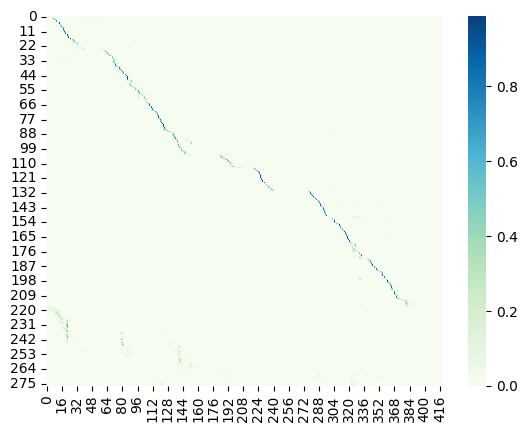

Saved best model

Epoch: 33/80


Val:   3%|▎         | 1/33 [00:02<01:28,  2.78s/it, dist=13.9400]

Ground Truth :  WELL OUR LOWER LIPS ANYWAY ANSWERED THE NYMPH
Prediction   :  WELL ARE LOWER THAT'S ANYWAY INTO THE NIMPH


Val:   6%|▌         | 2/33 [00:05<01:20,  2.59s/it, dist=15.6767]

Ground Truth :  ALL WATCHED WITH QUICKENED BREATH AND PROUD SOULS THAT LIVING WAVE BLUE BELOW AND BRIGHT WITH A STEELY GLITTER ABOVE AS IT FLOWED DOWN THE STREET AND AWAY TO JOIN THE SEA OF DAUNTLESS HEARTS THAT FOR MONTHS HAD ROLLED UP AGAINST THE SOUTH AND EBBED BACK REDDENED WITH THE BLOOD OF MEN LIKE THESE
Prediction   :  ALL WATCHED WITH QUICKENED BATH AND PROBABLY BELOW UNBY WITH THE STEALY GLITTER ABOVE AS IF FLOWED DOWN THE STREET IN AWAY TO JOIN THE STREET IN AWAY TO JOIN THE STREET IN AWAY TO JOIN THE SEA OF DOUGHTLESS HEARTS THAT FOR MONTHS HAD ROLLED UP AGAINST THE SELF AND EMPTY BACK READENS WITH THE BLOOD OF MEN LIKELIES


Val:   9%|▉         | 3/33 [00:07<01:15,  2.51s/it, dist=15.6933]

Ground Truth :  I BEGGED RUGGEDO LONG AGO TO SEND HIM AWAY BUT HE WOULD NOT DO SO
Prediction   :  I BEGGED WORK AT OH LORD NOR GO TO SEND HIM AWAY BUT HE WOULD NOT DO SO


Val:  12%|█▏        | 4/33 [00:10<01:11,  2.48s/it, dist=15.8267]

Ground Truth :  I DARE SAY IT'S QUITE TRUE THAT THERE'S NEVER BEEN ANY ONE ELSE
Prediction   :  I DIRECTLY ITS QUITE TRUTH YOUR THAT THERE'S NEVER BEEN ANY ONE ELSE


Val:  15%|█▌        | 5/33 [00:12<01:08,  2.44s/it, dist=15.7480]

Ground Truth :  HE PROTECTED HER AND SHE STRENGTHENED HIM
Prediction   :  HE PRETECTED HER AND SHE STRENGTHENED HIM


Val:  18%|█▊        | 6/33 [00:15<01:07,  2.49s/it, dist=15.8433]

Ground Truth :  GWYNPLAINE ATE UP THEIR PUBLIC
Prediction   :  WHEN PLAIN EIGHT UP THEIR PUBLIC


Val:  21%|██        | 7/33 [00:17<01:05,  2.52s/it, dist=16.6600]

Ground Truth :  I WILL SHOW YOU WHAT A GOOD JOB I DID AND SHE WENT TO A TALL CUPBOARD AND THREW OPEN THE DOORS
Prediction   :  I WISH SHOW YOU WHAT A GOOD JOB I DID AND SHE WENT TO IT ALL COVERED AND THROUGH UP IN THE DOORS


Val:  24%|██▍       | 8/33 [00:20<01:02,  2.49s/it, dist=16.4125]

Ground Truth :  I DIDN'T HAVE ANY FEARS IF I WORKED IT RIGHTLY SAID THE OLD GENTLEMAN COMPLACENTLY
Prediction   :  I DIDN'T HAVE ANY FEARS IF I WORKED TO RIGHTLY SAID THE OLD GENTLEMAN COMPLACENTLY


Val:  27%|██▋       | 9/33 [00:22<00:59,  2.47s/it, dist=16.3985]

Ground Truth :  HERE YOU STRIKE THE OLD EMIGRANT ROAD WHICH LEADS OVER THE LOW DIVIDE TO THE EASTERN SLOPES OF THE MOUNTAIN
Prediction   :  HERE HE STRIKED THE OLD EM AGREED ROAD WHICH LEADS OVER THE LOW DIVIDE TO THE EASTERN SLOPES OF THE MOUNTAIN


Val:  30%|███       | 10/33 [00:24<00:56,  2.46s/it, dist=16.3153]

Ground Truth :  THE WEEK FOLLOWING CHRISTMAS BROUGHT IN A THAW AND BY NEW YEAR'S DAY ALL THE WORLD ABOUT US WAS A BROTH OF GRAY SLUSH AND THE GUTTERED SLOPE BETWEEN THE WINDMILL AND THE BARN WAS RUNNING BLACK WATER
Prediction   :  THE WEEK FALLING CRISTENESS BROUGHT IN A THAW AND BY NEW YEARS DAY ALL THE WORLD ABOUT US WAS ABROAD OF GRACE LUSH AND THE GUTTERED SLOPE BETWEEN THE WINDOW AND THE BARN WAS RUNNING BLACK WATER


Val:  33%|███▎      | 11/33 [00:27<00:54,  2.50s/it, dist=16.6448]

Ground Truth :  IN ARISTOCRATIC COMMUNITIES THE PEOPLE READILY GIVE THEMSELVES UP TO BURSTS OF TUMULTUOUS AND BOISTEROUS GAYETY WHICH SHAKE OFF AT ONCE THE RECOLLECTION OF THEIR PRIVATIONS THE NATIVES OF DEMOCRACIES ARE NOT FOND OF BEING THUS VIOLENTLY BROKEN IN UPON AND THEY NEVER LOSE SIGHT OF THEIR OWN SELVES WITHOUT REGRET
Prediction   :  IN ARISTOCRATIC COMMUNITIES THE PEOPLE READILY GIVE THEMSELVES UP TO BIRSTS OF TOMULTUOUS EMBORSTROUS GATES WHICH SHAKE OFF AT ONCE THE RECOLLECTION OF THEIR PRIVATIONS THE NATIVES OF THE MOCRACIES ARE NOT FUNNED OF BEING DUST FILES HE BROKEN IN UPON AND THE NEVER LOOKS SIGHT OF THEIR OWN SELFS WITHOUT REGRET


Val:  36%|███▋      | 12/33 [00:29<00:51,  2.46s/it, dist=16.6256]

Ground Truth :  THE PHRASE AND THE DAY AND THE SCENE HARMONIZED IN A CHORD
Prediction   :  THE FRAZE AND THE DAY AND THE SCENE HARMONIZED IN A COURT


Val:  39%|███▉      | 13/33 [00:32<00:49,  2.47s/it, dist=16.6569]

Ground Truth :  INDEED THE LOWER LIP OF A DRAGON FLY CHILD MIGHT WELL FRIGHTEN PEOPLE FOR IT IS FASTENED ON A LONG JOINTED ARM LIKE THING AND HAS PINCERS ON IT WITH WHICH IT CATCHES AND HOLDS ITS FOOD
Prediction   :  INDEED THE LOWER LEFT OF A DIRECT INFLY CHILD MY WELL FRIGHTENED PEOPLE FOR IT IS FASTENED UNA LONG JOINTED ARE LIKE THING IN HIS PINCER'S ARM IT WITH WHICH IT KETCHES AND HOLDS ITS FOOD


Val:  42%|████▏     | 14/33 [00:34<00:45,  2.38s/it, dist=16.5048]

Ground Truth :  BUT TREVELYAN WAS OF A DIFFERENT OPINION AND HE WAS DISGUSTED AND REVOLTED MOST UNREASONABLY BY THE APPEARANCE OF HIS MINISTER'S DOMESTIC ARRANGEMENTS
Prediction   :  BUT TREVELLIEN WAS OF A DIFFERENT OPINION AND HE WAS DISGUSTED AND REVOLTED MOST ON REASONABLY BY THE APPEARANCE OF HIS MINISTERS DO MESTIC ARRANGEMENTS


Val:  45%|████▌     | 15/33 [00:37<00:44,  2.50s/it, dist=16.7262]

Ground Truth :  WISHING HIM SAID MARY IN A TONE OF INQUIRY
Prediction   :  WISHING HIM SAID MARY IN A TONE OF INCREATE


Val:  48%|████▊     | 16/33 [00:39<00:42,  2.48s/it, dist=16.7596]

Ground Truth :  SHE FELT THAT WHICH SHE HAD NEVER FELT BEFORE A SENSATION OF EXPANSION
Prediction   :  SHE FELT THAT WHICH SHE HAD NEVER FELT BEFORE A SENSATION OF EXPANSION


Val:  52%|█████▏    | 17/33 [00:42<00:39,  2.48s/it, dist=16.5067]

Ground Truth :  WHY NOT ALLOW YOUR SILVER TUFTS TO LUXURIATE IN A NATURAL MANNER
Prediction   :  MORE NOT ALLOW YOUR SILVER TOUCHED TO LOBSURIAGE AND UNNATURAL MANNER


Val:  55%|█████▍    | 18/33 [00:44<00:36,  2.44s/it, dist=16.4530]

Ground Truth :  ANOTHER ENGINEER RUSHED TOWARD THE DOOR TO SEE WHAT WAS HAPPENING OUTSIDE
Prediction   :  ANOTHER RENTINEER RUSHED OR THE DOOR TO SEE WHAT WAS HAPPENING OUTSIDE


Val:  58%|█████▊    | 19/33 [00:46<00:33,  2.42s/it, dist=16.3098]

Ground Truth :  A LOFT UNDER THE ARCH OF THE ROOF CONTAINED THE SCENES AND ON OPENING A TRAP DOOR LAMPS APPEARED PRODUCING WONDERS OF LIGHT
Prediction   :  A LOFT UNDER THE ARCH OF THE RIVE CONTAINED THE SCENES AND ON OPENING A TRAP DOOR A LAMP SAPPEARED PRODUCING WONDERS OF LIGHT


Val:  61%|██████    | 20/33 [00:49<00:30,  2.32s/it, dist=15.9960]

Ground Truth :  NO ONE BUT DEUCALION THE SON OF PROMETHEUS WAS READY FOR SUCH A STORM
Prediction   :  NO ONE BUT TO CARE IN THE SUN OF PERMISSIOUS WAS READY FOR SUCH A STORM


Val:  64%|██████▎   | 21/33 [00:51<00:27,  2.30s/it, dist=15.8692]

Ground Truth :  TOM DRINKS A LITTLE MORE COFFEE AND THEN HE GOES ON THE TROUBLE IS I CAN'T GET MARRIED ON THIS FLOWER SHOP JOB
Prediction   :  COMBANKS OF ONE COFFIN THAT HE GOES ON THE TROUBLES I CAN IMMERIED ON THIS FLOWER SHUT JUB


Val:  67%|██████▋   | 22/33 [00:53<00:25,  2.36s/it, dist=15.9112]

Ground Truth :  HIS WIFE FED HIM WITH THE FAT OF THE LAND REGARDLESS OF CONSEQUENCES HIS CHILDREN REVOLVED ABOUT HIM WITH TIRELESS CURIOSITY AND WONDER HIS NEIGHBORS FLOCKED IN TO APPLAUD ADVISE AND ADMIRE EVERY ONE TREATED HIM WITH A RESPECT MOST GRATEFUL TO HIS FEELINGS HE WAS AN OBJECT OF INTEREST AND WITH EVERY HOUR HIS IMPORTANCE INCREASED SO THAT BY NIGHT HE FELT LIKE A COMMANDER IN CHIEF AND BORE HIMSELF ACCORDINGLY
Prediction   :  IS WIFE SAID HIM WITH THE THOUGHT OF THE LAND REGULARS OF CONSEQUENCES IS CHILDRING REVOLVED ABOUT HIM LIFTIRELESS CURIOSITY IN WONDER HIS NAPOR'S FLOCKED INTO A PLOT ADVISE IN ADMIRE EVERY ONE TREATED HIM WITH THE RESPECT MOST GREAT FULL TO HIS FEELINGS HE WAS NOT JECKED OF INTEREST AND WITHEVER A HOUR HIS IMPORTANCE INCLIES SO THAT BY NIGHT HE FOUGHT LIKE A COMMANDER AND CHIEF AND BORE HIMSELF AGAINST THAT BY NIGHT HE FOUGHT LIKE A COMMANDER AND CHIEF AND BORE HIMSELF AGAINST THAT BY NIGHT HE FOUGHT LIKE A COMMANDER AND CHIEF AND BORE HIMSEL


Val:  70%|██████▉   | 23/33 [00:56<00:23,  2.36s/it, dist=15.8336]

Ground Truth :  I SUPPOSE SHE HAS BEEN CAREFULLY QUESTIONED VERY I SHOULD SAY
Prediction   :  I SUPPOSE SHE HAS BEEN CAREFULLY QUESTIONED VERY I SHOULD SAY


Val:  73%|███████▎  | 24/33 [00:58<00:21,  2.38s/it, dist=15.8250]

Ground Truth :  I BEGAN TO ENJOY THE EXHILARATING DELIGHT OF TRAVELING A LIFE OF DESIRE GRATIFICATION AND LIBERTY
Prediction   :  I BEGAN TO INTO IT EXCELLERATING TO LIGHT OF TRAVELING ALIFE OF DESIRE GREAT FOOTCASION ENLIBERTY


Val:  76%|███████▌  | 25/33 [01:00<00:18,  2.34s/it, dist=15.7472]

Ground Truth :  BEAT THE EGGS STIR TO THEM THE MILK AND POUNDED SUGAR AND PUT THE MIXTURE INTO A JUG
Prediction   :  BEAT THE EGGS SIR TO THEM THE MOUNT IMPOUNDED SHIGGER AND PUT THE MIXTURE INTO A JUCK


Val:  79%|███████▉  | 26/33 [01:03<00:16,  2.41s/it, dist=15.9472]

Ground Truth :  THE ELECTRIC LIGHT CAN SCARCELY PENETRATE THROUGH THE DENSE CURTAIN WHICH HAS DROPPED OVER THE THEATRE ON WHICH THE BATTLE OF THE ELEMENTS IS ABOUT TO BE WAGED
Prediction   :  THE ELECTRIC LIGHT CONSCARCELY PENETRATED THE DENSE CURTAIN WHICH IS DROPPED OVER THE THEATRE ON WHICH THE BATTLE OF THE ELEMENTS ISABEL TO BE WAGGED


Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.39s/it, dist=15.8956]

Ground Truth :  THIS SECOND PART IS DIVIDED INTO TWO FOR IN THE ONE I SPEAK OF THE EYES WHICH ARE THE BEGINNING OF LOVE IN THE SECOND I SPEAK OF THE MOUTH WHICH IS THE END OF LOVE
Prediction   :  THIS SECOPARTED SIVITED INTO TWO FOUR IN THE ONE I SPEAK OF THE EYES WHICH HAD BEGINNING OF LOVE IN A SECOND PARSPIC OF THE MOUTH WHICH IS THE UNDER PLEASE BECOME THE MOUTH WHICH IS THE UNDER PLEASE BECOME THE MOUTH WHICH IS THE UNDER LEFT


Val:  85%|████████▍ | 28/33 [01:08<00:12,  2.44s/it, dist=15.8781]

Ground Truth :  BUT TREVELYAN WAS OF A DIFFERENT OPINION AND HE WAS DISGUSTED AND REVOLTED MOST UNREASONABLY BY THE APPEARANCE OF HIS MINISTER'S DOMESTIC ARRANGEMENTS
Prediction   :  BUT TREVELLIEN WAS OF A DIFFERENT OPINION AND HE WAS DISGUSTED AND REVOLTED MOST ON REASONABLY BY THE APPEARANCE OF HIS MINISTERS DO MESTIC ARRANGEMENTS


Val:  88%|████████▊ | 29/33 [01:10<00:09,  2.41s/it, dist=15.8097]

Ground Truth :  ALWAYS BUT IT'S WORSE NOW
Prediction   :  HOW IS BUT IT'S WORSE NOW


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.36s/it, dist=15.8693]

Ground Truth :  SHALL I SAY THAT SHE MAY EXPECT AN EARLY VISIT FROM YOU WHEN I SEE HER TO MORROW
Prediction   :  SHELL I SAY THAT SHE MAY EXPECT AN EARLY VISIT FOR ME WHEN I SEE HER TO MORROW


Val:  94%|█████████▍| 31/33 [01:15<00:04,  2.34s/it, dist=15.7880]

Ground Truth :  THE OTHERS HAVING BEEN IN OPERATION TOO SHORT A TIME TO SHOW DEFINITE RESULTS ALTHOUGH THEY ALSO WENT QUICKLY TO A DIVIDEND BASIS
Prediction   :  THE OTHERS HAVING BEEN AN OPERATION TO SHORT A TIME TO SHORT A TIME TO SHORT DEFINITE RESULTS ALTHOUGH THEY ALSO WENT QUICKLY TO A DIVIDENT BASIS


Val:  97%|█████████▋| 32/33 [01:17<00:02,  2.35s/it, dist=15.8002]

Ground Truth :  DOST THOU REVOLT AGAINST THY MASTER AND NATURAL LORD
Prediction   :  DUST OVER REVOLT TOGETHER MASTER AND THAT TO A LORD


Ground Truth :  SUFFICIENT TO MAKE TWELVE BUNS SEASONABLE AT ANY TIME LIGHT BUNS
Prediction   :  SUFFICIENT TO MAKE TWELVE BUNDS SEASONABLE AT ANY TIME LIKE BUNDS


	Train Loss 0.2846	 Learning Rate 0.0007941
	Val Dist 15.7252	
	Teacher Forcing Ratio 1	


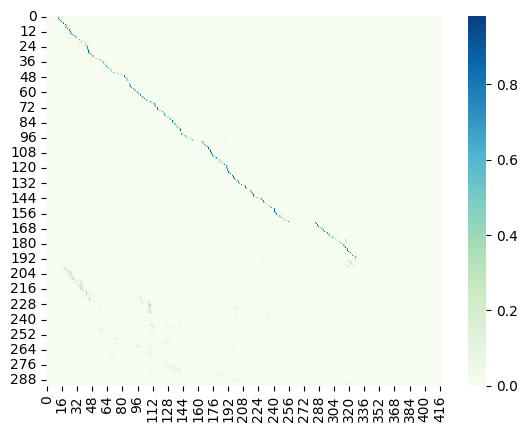

Saved best model

Epoch: 34/80


Val:   3%|▎         | 1/33 [00:03<01:36,  3.03s/it, dist=15.3467]

Ground Truth :  THE ZEAL OF CYRIL EXPOSED HIM TO THE PENALTIES OF THE JULIAN LAW BUT IN A FEEBLE GOVERNMENT AND A SUPERSTITIOUS AGE HE WAS SECURE OF IMPUNITY AND EVEN OF PRAISE
Prediction   :  THE ZEAL OF CARRIAL EXPOSED HIM TO THE PENALTIES OF THE JEWING MAW BUT IN A FEEBLE GOVERNMENT AND A SUPERSTICIOUS AGE HE WAS SECURE OF IMPUNITY AND EVEN OF PRAISE


Val:   6%|▌         | 2/33 [00:05<01:19,  2.56s/it, dist=14.5767]

Ground Truth :  SAYS HE I WOULD NOT TRUST A SECESH ON HIS WORD OATH OR BOND MARCH I SAY
Prediction   :  SOCY I WOULD NOT TRUST A CESSACH ON HIS WORD OLD OLD WAR BAND MARCH I SAY


Val:   9%|▉         | 3/33 [00:07<01:12,  2.41s/it, dist=13.4267]

Ground Truth :  WHAT EXTRAORDINARY THINGS WILL SOMETIMES OCCUR FROM MERE CHANCE OR FROM THE FORCE OF CIRCUMSTANCES
Prediction   :  WHAT EXTRAORDINARY THINGS WILL SOMETIMES OCCUR FROM MERE CHANCE OR FROM THE FORCE OF CIRCUMSTANCES


Val:  12%|█▏        | 4/33 [00:09<01:07,  2.33s/it, dist=13.2767]

Ground Truth :  I KNOW I AM JUST AWFUL JIM I WAS SO SCARED
Prediction   :  I KNOW ANXIOUS ALFRONGER SO SCARED


Val:  15%|█▌        | 5/33 [00:12<01:06,  2.39s/it, dist=13.7213]

Ground Truth :  HE LIVED AND DIED FOR THE SERVICE OF MANKIND BUT THE LIFE AND DEATH OF SOCRATES HAD LIKEWISE BEEN DEVOTED TO THE CAUSE OF RELIGION AND JUSTICE AND ALTHOUGH THE STOIC OR THE HERO MAY DISDAIN THE HUMBLE VIRTUES OF JESUS THE TEARS WHICH HE SHED OVER HIS FRIEND AND COUNTRY MAY BE ESTEEMED THE PUREST EVIDENCE OF HIS HUMANITY
Prediction   :  HE LIVED AND DIED FOR THE SERVICE OF MANKIND BUT THE LIFE AND DEATH OF SOCRATIES HAD LIKEWISE BEING DEVOTED TO THE CAUSE OF RELIGION AND JUSTICE AND ALTHOUGH THE STORY OR THE HERO MAY BE A STEAM TO THE PUREST EVIDENCE OF HIS HUMANITY


Val:  18%|█▊        | 6/33 [00:14<01:06,  2.45s/it, dist=14.0167]

Ground Truth :  SHE HAD NO SOONER TAKEN UP THE SPINDLE THAN BEING HASTY AND CARELESS SHE PIERCED HER HAND WITH THE POINT OF IT AND FAINTED AWAY
Prediction   :  SHE HAD NO SONER TAKEN UP THE SPINDAL THEN BEING HASTY IN CARELESS SHE PIERCED HER HAND WITH A QUANTIVE AND SAINTED AWAY


Val:  21%|██        | 7/33 [00:17<01:02,  2.41s/it, dist=13.8962]

Ground Truth :  BISHOPS VIRGINS AND EVEN SPOTLESS INFANTS WERE SUBJECTED TO THE DISGRACE OF A PUBLIC PENANCE BEFORE THEY COULD BE ADMITTED TO THE COMMUNION OF THE DONATISTS
Prediction   :  THISHAPS VIRGINS AND EVEN SPOTLESS INFANCE WERE SUBJECTED TO BE DISGRACE OF A PUBLIC PENNINCE BEFORE THEY COULD BE ADMITTED TO THE COMMUNION OF THE DOMINATISTS


Val:  24%|██▍       | 8/33 [00:19<00:58,  2.34s/it, dist=13.7208]

Ground Truth :  IF HE DIDN'T GO AND SEE THEM THEY WOULD SUE HIM PROMPTLY
Prediction   :  IF HE DIDN'T GO AND SEE THEM THEY WOULD SEE HIM PROMPTLY


Val:  27%|██▋       | 9/33 [00:21<00:57,  2.40s/it, dist=13.7600]

Ground Truth :  PASS THE CHARM OUT TO ME THEN SAID THE ROBBER
Prediction   :  PASSED THE CHARM OUT TO ME THEN SAID THE ROVER


Val:  30%|███       | 10/33 [00:23<00:53,  2.33s/it, dist=13.6133]

Ground Truth :  HERE YOU STRIKE THE OLD EMIGRANT ROAD WHICH LEADS OVER THE LOW DIVIDE TO THE EASTERN SLOPES OF THE MOUNTAIN
Prediction   :  HE STRIKE THE OLD EMIGRANT ROAD WHICH LEADS OVER THE LOW DIVIDE TO THE EASTERN SLOPES OF THE MOUNTAIN


Val:  33%|███▎      | 11/33 [00:26<00:51,  2.33s/it, dist=13.8030]

Ground Truth :  WITH A LONG STAINED FINGERNAIL HE MAPPED THE CONSTELLATIONS ON THE MARBLE TILED FLOOR
Prediction   :  WITH A LONG STAINED FINGER NAIL HE MAPPED THE CONSTILATIONS ON THE MARBLE TILED FLOOR


Val:  36%|███▋      | 12/33 [00:28<00:49,  2.37s/it, dist=13.8211]

Ground Truth :  THE EFFECT OF HIS APPEARANCE HAD BEEN SURPRISING
Prediction   :  THE EFFECT OF HIS APPEARANCE HAD BEEN SURPRISING


Val:  39%|███▉      | 13/33 [00:31<00:48,  2.41s/it, dist=14.0985]

Ground Truth :  IN GWYNPLAINE EVIL THOUGHTS NEVER RIPENED AND HE HAD THEREFORE NO REMORSE
Prediction   :  IN GWINGPLAINE'S EVIL THOUGHTS NEVER RIPENED AND HE HAD THEREFORE NO REMARKS


Val:  42%|████▏     | 14/33 [00:33<00:46,  2.43s/it, dist=13.9371]

Ground Truth :  ON THIS HE ROSE FROM HIS CHAIR AND GOING TO HER SAID ONCE MORE SHEW YOUR SUBMISSION BY OBEYING ME A SECOND TIME TO DAY
Prediction   :  ON THIS HE ROSE FROM HIS CHAIR AS GOING TO HER SAID ONCE MORE A SHOW YOUR SUDDEN BY OBEYING ME A SECOND TIME TO DAY


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.42s/it, dist=13.9907]

Ground Truth :  ALL NIGHT IT HAD BEEN BLOWING AND RAINING
Prediction   :  ALL NIGHT IT HAD BEEN BLOWING AND RAINING


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.38s/it, dist=13.9975]

Ground Truth :  I DELIGHT IN YOUR KITCHEN
Prediction   :  I DON'T I DO I DIDN'T YOUR KITCHEN


Val:  52%|█████▏    | 17/33 [00:40<00:38,  2.40s/it, dist=14.1169]

Ground Truth :  HE WOULD HAVE TO PAY HER THE MONEY WHICH SHE WOULD NOW REGULARLY DEMAND OR THERE WOULD BE TROUBLE IT DID NOT MATTER WHAT HE DID
Prediction   :  HE WOULD HAVE TO PAY HER THE MONEY WHICH SHE WOULD NOW REGULARLY DEMAND OR THERE WOULD BE TROUBLE IT DID NOT MATTER WHAT HE DID


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.39s/it, dist=13.9978]

Ground Truth :  THE COUNTRY WAS THE GRANDEST THAT CAN BE IMAGINED
Prediction   :  THE COUNTRY WAS THE GRANDEST THAT CAN BE IMAGINED


Val:  58%|█████▊    | 19/33 [00:45<00:33,  2.39s/it, dist=14.0309]

Ground Truth :  YOU SURELY CANNOT SUPPOSE THAT IN A NATURAL STATE YOU WOULD BE FORCED TO CLIMB REGULARLY UP ONE TALL BARE STICK SUCH AS I SEE YOU UPON NOW
Prediction   :  YOU SHORTLY CANNOT SUPPOSE THAT IN A NATURAL STATE YOU WOULD BE FORCED TO CLIMB REGULARLY UP ONE TALL BARE STICK SUCH AS I SEE YOU UPON NO ALL


Val:  61%|██████    | 20/33 [00:48<00:31,  2.40s/it, dist=14.0747]

Ground Truth :  HE SMILED GUILTILY AS HE ADDED BUT I MUST ADMIT I WAS MORE THAN A LITTLE CONCERNED MYSELF
Prediction   :  HE SMILED GUILTILY AS HE ADDED BUT I MUST ADMIT I WAS MORE THAN A LITTLE CONCERNED MYSELF


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.41s/it, dist=14.1692]

Ground Truth :  I DIDN'T PREACH WITHOUT DIRECTION
Prediction   :  I DIDN'T PREACH WITHOUT DIRECTION


Val:  67%|██████▋   | 22/33 [00:52<00:26,  2.37s/it, dist=14.0776]

Ground Truth :  WHERE ARE THEY ASKED THE BOY
Prediction   :  WE ARE THEY ESPECIALLY


Val:  70%|██████▉   | 23/33 [00:55<00:24,  2.40s/it, dist=14.0994]

Ground Truth :  I FELT THAT IN MY FIRST PROFESSION AS I WAS NOT BLESSED WITH THE VOCATION NECESSARY TO IT I SHOULD HAVE SUCCEEDED ONLY BY DINT OF HYPOCRISY AND I SHOULD HAVE BEEN DESPICABLE IN MY OWN ESTIMATION EVEN IF I HAD SEEN THE PURPLE MANTLE ON MY SHOULDERS FOR THE GREATEST DIGNITIES CANNOT SILENCE A MAN'S OWN CONSCIENCE
Prediction   :  I FELT THAT IN MY FIRST PROFESSION AS I WAS NOT BLESSED WITH THE VOCATION NECESSARY TO IT I SHOULD HAVE SUCCEEDED ONLY BY DID TO PERPOCRACY AND I SHOULD HAVE BEEN DISPICKABLE IN MY OWN ESTIMATION EVEN IF I HAD SEEN THE PURPLE MAN TO ON MY SHOULDERS FOR THE GREATEST DIGNITIES CANNOT SILENCE A MAN'S OWN CONSCIOUS


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.39s/it, dist=14.2261]

Ground Truth :  SINCE HIS BIRTH HE HAS BEEN GUARDED SO CLOSELY THAT THE CLEVEREST POISONERS OF THE EAST COULD NOT REACH HIM
Prediction   :  SINCE HIS BROTHE HE HAS BEEN GARDENED SO CLOSELY THAT THE CLEVER ASKED POISONERS OF THE EAST COULD NOT REACH HIM


Val:  76%|███████▌  | 25/33 [01:00<00:19,  2.41s/it, dist=14.2736]

Ground Truth :  IS THERE NOTHING WILD IN THE EYE CONTINUED HOLGRAVE SO EARNESTLY THAT IT EMBARRASSED PHOEBE AS DID ALSO THE QUIET FREEDOM WITH WHICH HE PRESUMED ON THEIR SO RECENT ACQUAINTANCE
Prediction   :  IS THERE NOTHING WILD IN THE EYE CONTINUED HOW RAVE SO EARNESTLY THAT EMBARRASSED FEEBY AS DID ALSO THE QUIET FREEDOM WITH WHICH HE PRESUMED ON THEIR SO RECENT ACQUAINTANCE


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.40s/it, dist=14.2731]

Ground Truth :  FOR INSTANCE LOOK AT THEIR BEHAVIOUR IN THE MATTER OF THE RING
Prediction   :  FRIENDSTANCE LOOKED AT THEIR BEHAVIOR IN THE MATTER OF THE RING


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.41s/it, dist=14.2509]

Ground Truth :  ABOUT THE TIME HE PULLED TRIGGER A STRAY BALL FROM SOME DIRECTION STRUCK HIM IN THE SIDE AND HE FELL OFF DEAD AND HIS HORSE BECOMING FRIGHTENED GALLOPED OFF DRAGGING HIM THROUGH THE CONFEDERATE LINES
Prediction   :  ABOUT THE TIME HE PULLED TREATER OF STRAY BALL FROM SOME DIRECTION STRUCK HIM IN THE SIDE AND HE FELL OFF DEAD AND HIS HORSE BECOMING FRIGHTENED AND HIS HORSE BECOMING FRIGHTENED AND THROUGH THE CONFEDERATE LINES


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.40s/it, dist=14.1764]

Ground Truth :  IF EVER HE WAS IMPELLED TO CAST SIN FROM HIM AND TO REPENT THE IMPULSE THAT MOVED HIM WAS THE WISH TO BE HER KNIGHT
Prediction   :  IF EVER HE WAS IMPELLED TO CAST SIN FROM HIM AND TO REPENT THE IMPULSE THAT MOVED HIM WAS THE WISH TO BE HER NIGHT


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.39s/it, dist=14.2184]

Ground Truth :  THROUGH THE INFLUENCE OF HON THOMAS L HAMER HE WAS ADMITTED AT WEST POINT IN EIGHTEEN THIRTY NINE
Prediction   :  THROUGH THE INFLUENCE OF HONORABLE TOMACE ELEHAMER HE WAS ADMITTED AT WEST POINT AND EIGHTEEN THIRTY NINE


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.46s/it, dist=14.4202]

Ground Truth :  TO THE LEFT HAND I TURNED WITH THAT RELIANCE WITH WHICH THE LITTLE CHILD RUNS TO HIS MOTHER WHEN HE HAS FEAR OR WHEN HE IS AFFLICTED
Prediction   :  TO THE LEFT HAND A TURNED WITH THE HAT RELIANCE WITH WHICH THE LITTLE CHILD ONCE TO HIS MOTHER WHEN HE HAS FEAR ON HE IS A FICKED


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.40s/it, dist=14.3884]

Ground Truth :  POOR DOUGLAS BEFORE HIS DEATH WHEN IT WAS IN SIGHT COMMITTED TO ME THE MANUSCRIPT THAT REACHED HIM ON THE THIRD OF THESE DAYS AND THAT ON THE SAME SPOT WITH IMMENSE EFFECT HE BEGAN TO READ TO OUR HUSHED LITTLE CIRCLE ON THE NIGHT OF THE FOURTH
Prediction   :  POOR DOG THIS BEFORE HIS DEATH WHEN IT WASN'T SIGHT COMMANDED TO ME THE MANUSCRIPT THAT REACHED HIM ON THE THIRD OF THESE DAYS AND THAT ON THE SEAM SPOT WITH A MEN'S EFFECT HE BEGAN TO READ TO A HUSHED LITTLE CIRCLE ON THE NIGHT OF THE FORTH


Val:  97%|█████████▋| 32/33 [01:17<00:02,  2.47s/it, dist=14.5131]

Ground Truth :  IT WAS ON ONE OF THESE GRAVEL BEDS THAT I MET MY ADVENTURE
Prediction   :  IT WAS ON ONE OF THESE GRAVEL BEDS THAT I MET MY ADVENTURE


Val: 100%|██████████| 33/33 [01:18<00:00,  2.04s/it, dist=14.6642]

Ground Truth :  SUFFICIENT TO SERVE WITH FIVE OR SIX MACKEREL
Prediction   :  THE SUFFICIENT TO SERVE WITH FIVE OR SIX MACKER


	Train Loss 0.2486	 Learning Rate 0.0007757
	Val Dist 14.6642	
	Teacher Forcing Ratio 1	


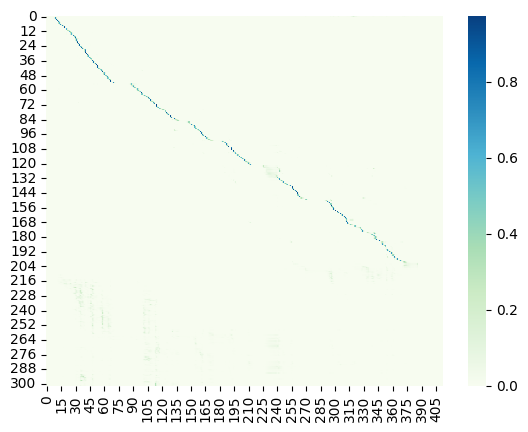

Saved best model

Epoch: 35/80


Val:   3%|▎         | 1/33 [00:03<01:39,  3.12s/it, dist=11.8467]

Ground Truth :  WE WILL HUNT WOLVES THE COUNTRY IS ALIVE WITH THEM AND THE GOVERNMENT GIVES A BOUNTY OF FIFTEEN DOLLARS FOR EVERY SCALP TAKEN
Prediction   :  MILL HUNT WOLVES THE COUNTRY IS ALIVE WITH THEM AND THE GOVERNMENT GIVES ABOUT TO FIFTEEN DOLLARS FOR EVERY SCALP TAKEN


Val:   6%|▌         | 2/33 [00:05<01:22,  2.67s/it, dist=12.2167]

Ground Truth :  FOR SOME TIME NOTHING WAS HEARD IN THAT CHAMBER BUT SOBS EXCLAMATIONS AND PRAYERS
Prediction   :  FOR SOMETIME NOTHING WAS HEARD IN THAT CHAMBER BUT SOBS EXCLAIMATIONS AND GRAYS


Val:   9%|▉         | 3/33 [00:07<01:17,  2.58s/it, dist=12.6156]

Ground Truth :  SHE WAS GOING TO REPLY BUT FOUND SHE COULD NOT WITHOUT ACCOMPANYING HER WORDS WITH TEARS THEREFORE AFTER THE FIRST ATTEMPT SHE DESISTED
Prediction   :  SHE WAS GOING TO REPLY BUT FOUND SHE COULD NOT WITHOUT ACCOMPANYING HER WORDS WITH TEARS THEREFORE AFTER THE FIRST ATTENT SHE DESISTED


Val:  12%|█▏        | 4/33 [00:10<01:12,  2.50s/it, dist=12.3717]

Ground Truth :  LATER HOWEVER HIS OLD DISCRETION ASSERTED ITSELF
Prediction   :  LATER HOWEVER HIS OLD DISCRETION ASSERTED ITSELF


Val:  15%|█▌        | 5/33 [00:12<01:07,  2.41s/it, dist=12.1880]

Ground Truth :  THE SLANT OF THE MOON PRESAGED EVIL FOR THE KING OF VENDHYA THE STARS ARE IN TURMOIL THE SERPENT IN THE HOUSE OF THE ELEPHANT
Prediction   :  THE SLANT OF THE MOON PRESSAGED EVIL FOR THE KING OF VENGEA THE STARS ARE INTERMOIL THE SURPRINT IN THE HOUSE OF THE ELEVANT


Val:  18%|█▊        | 6/33 [00:14<01:04,  2.40s/it, dist=12.1200]

Ground Truth :  TO THE PICKLE ADD TWO LARGE ONIONS CUT IN QUARTERS TWO FRESH CARROTS AND ABOUT ONE OUNCE OF MIXED WHOLE ALLSPICE BLACK PEPPERS CLOVES AND BAY LEAVES
Prediction   :  TO THE PICKLE AND TWO OUR JOURNEY AND SCUTTING QUARTERS TWO FIRST CURATES AND ABOUT ONE OUNCE OF MIXED WHOLE ALSPICE BLIKE PEPPERS CLOTHES AND DAYLIEVES


Val:  21%|██        | 7/33 [00:17<01:02,  2.41s/it, dist=12.0410]

Ground Truth :  TWO OR THREE MILES FARTHER ON IS THE MAIN STRONGHOLD OF THE MODOCS HELD BY THEM SO LONG AND DEFIANTLY AGAINST ALL THE SOLDIERS THAT COULD BE BROUGHT TO THE ATTACK
Prediction   :  TWO OR THREE MILES FARTHER ON IS THE MAIN STRONGHOLD OF THE MODE OX HELD BY THEM SO LONG AND DEFIANTLY AGAINST ALL THE SOLDIERS THAT COULD BE BROUGHT TO THE ATTACK


Val:  24%|██▍       | 8/33 [00:19<00:59,  2.40s/it, dist=12.3758]

Ground Truth :  BUT IN HIS HANDS SOLITUDE AND A VIOLIN WERE SURE TO MARRY IN MUSIC
Prediction   :  BUT IN HIS HANDS SOLITUDE AN AVILE AND WERE SURE TO MARRY IMMUSIC


Val:  27%|██▋       | 9/33 [00:22<00:57,  2.42s/it, dist=12.6467]

Ground Truth :  IT'LL BE NO USE THEIR PUTTING THEIR HEADS DOWN AND SAYING COME UP AGAIN DEAR
Prediction   :  IT'LL BE NO USE THEIR PUDDING THEIR HEADS DOWN AND SAYING COME UP OF THE EM DEAR


Val:  30%|███       | 10/33 [00:24<00:54,  2.39s/it, dist=12.6227]

Ground Truth :  BEFORE THE DAY CLOSED THE GARDENER CAME WHISTLING FROM HIS FARM WORK TO LOOK OVER HIS PRETTY CHARGES
Prediction   :  BEFORE THE DAY CLOSED THE GUARD NEAR CAME WHISTLING FROM HIS FARM WORK TO LOOK OVER HIS PRETTY CHARGES


Val:  33%|███▎      | 11/33 [00:27<00:53,  2.44s/it, dist=12.6394]

Ground Truth :  WHEN AN ARISTOCRACY CARRIES ON THE PUBLIC AFFAIRS ITS NATIONAL PRIDE NATURALLY ASSUMES THIS RESERVED INDIFFERENT AND HAUGHTY FORM WHICH IS IMITATED BY ALL THE OTHER CLASSES OF THE NATION
Prediction   :  WHEN AN ERRORS TOOK HERSELF IN THE PUBLIC OFFESS IT'S NECESSARE PRIDE NATURALLY ASSUMES THIS RESOLVED INDIFFERENT AND HOLDING FORM WHICH IS IMITATED BY ALL THE OTHER COSSIS OF THE NATION


Val:  36%|███▋      | 12/33 [00:29<00:51,  2.44s/it, dist=12.7939]

Ground Truth :  AND THE NEW BLOOD AT THE ERA OF THIS STORY WAS AT HAND
Prediction   :  AND THE NEW BLOOD AT THE EUROPE OF THE STORY WAS AT HAND


Val:  39%|███▉      | 13/33 [00:32<00:49,  2.47s/it, dist=12.7667]

Ground Truth :  HE SAYS THAT BY CUTTING THROUGH FOUR OR FIVE SLICES AT A TIME ALL THE BUTTER IS SQUEEZED OUT OF THE UPPER ONES WHILE THE BOTTOM ONE IS SWIMMING IN FAT LIQUID
Prediction   :  HE SAYS THAT BY CUTTING THROUGH FOUR FIVE SLICES AS A TIME ALL THE BUTTER IS SQUEEZED OUT OF THE UPPER ONES WHILE THE BOTTOM ONE IS SWIMMING IN FAT LIKEWIT


Val:  42%|████▏     | 14/33 [00:34<00:47,  2.51s/it, dist=12.6133]

Ground Truth :  HE LIVED AND DIED FOR THE SERVICE OF MANKIND BUT THE LIFE AND DEATH OF SOCRATES HAD LIKEWISE BEEN DEVOTED TO THE CAUSE OF RELIGION AND JUSTICE AND ALTHOUGH THE STOIC OR THE HERO MAY DISDAIN THE HUMBLE VIRTUES OF JESUS THE TEARS WHICH HE SHED OVER HIS FRIEND AND COUNTRY MAY BE ESTEEMED THE PUREST EVIDENCE OF HIS HUMANITY
Prediction   :  HE LIVED AND DIED FOR THE SERVICE OF MANKIND BUT THE LIFE AND DEATH OF SOCRITIES HAD LIKEWISE BEING DEVOTED TO THE CAUSE OF RELIGION AND JUSTICE AND ALTHOUGH THE STORY OR THE HERO MADE HIS DAY IN THE HUMBLE VIRTUES OF JESUS THE TEARS WHICH HE SHOULD OVER HIS FRIEND AND COUNTRY MAY BE A STEAM TO THE PUREST EVIDENCE OF HIS HUMANITY


Val:  45%|████▌     | 15/33 [00:37<00:45,  2.51s/it, dist=12.4933]

Ground Truth :  A MAN'S ESTIMATES OF VALUE BETRAY SOMETHING OF THE STRUCTURE OF HIS SOUL AND WHEREIN IT SEES ITS CONDITIONS OF LIFE ITS INTRINSIC NEEDS
Prediction   :  A MAN'S ESTIMATES OF VALUE BETRAY SOMETHING OF THE SPRUCK DEAR OF HIS SOUL AND WHEREIN IT SEES ITS CONDITIONS OF LIFE IT'S INTERNATIONS OF LIFE IT'S INTERNATIONS OF LIFE IT'S INTERNATIONS IT NEEDS


Val:  48%|████▊     | 16/33 [00:39<00:43,  2.54s/it, dist=12.5442]

Ground Truth :  THE METER CONTINUED IN GENERAL SERVICE DURING EIGHTEEN NINETY NINE AND PROBABLY UP TO THE CLOSE OF THE CENTURY
Prediction   :  THE METER CONTINUED IN GENERAL SERVICE DURING IT TO NIGHTY NINE AND PROBABLY UP TO THE CLOSE OF THE CENTRY


Val:  52%|█████▏    | 17/33 [00:42<00:39,  2.48s/it, dist=12.4224]

Ground Truth :  WE WERE SO DEEP IN THE GRASS THAT WE COULD SEE NOTHING BUT THE BLUE SKY OVER US AND THE GOLD TREE IN FRONT OF US
Prediction   :  WE WERE SO DEEP IN THE GRASS THAT WE COULD SEE NOTHING BUT THE BLUE SKY OVERS AND THE GOLD TREE IN FRONT OF US


Val:  55%|█████▍    | 18/33 [00:44<00:35,  2.37s/it, dist=12.2237]

Ground Truth :  ON THAT SIDE DESCENT WAS IMPOSSIBLE AND HAD IT BEEN POSSIBLE THE BOTTOM WAS SHUT IN BY THE ENORMOUS ROCK
Prediction   :  ON THAT SIDE DESCEND WITH IMPOSSIBLE BOTTOM WAS SHUT IN BY THE ENORMOUS WROG


Val:  58%|█████▊    | 19/33 [00:46<00:33,  2.39s/it, dist=12.2109]

Ground Truth :  I MADE A QUICK GLANCE OVER MY SHOULDER AND GRABBED AT MY GUN
Prediction   :  I'M IN A QUICK GLANCE OVER MY SHOULDER AND GRAVE THAT MY GONE


Val:  61%|██████    | 20/33 [00:48<00:30,  2.36s/it, dist=12.2597]

Ground Truth :  BUT CLEWS THERE ARE ABSOLUTELY NONE
Prediction   :  BUT CLOSE THEIR ABSOLUTELY NONE


Val:  64%|██████▎   | 21/33 [00:51<00:28,  2.38s/it, dist=12.1178]

Ground Truth :  THESE VAST BUILDINGS WHAT WERE THEY
Prediction   :  THESE BASKET BUILDINGS WHAT WERE THEY


Val:  67%|██████▋   | 22/33 [00:53<00:26,  2.38s/it, dist=12.0573]

Ground Truth :  THE BEST OF US ARE NOT EXEMPT FROM EGOTISTICAL THOUGHTS
Prediction   :  THE VEST OF US ARE NOT EXEMPT FROM EGOTISTICAL THOUGHTS


Val:  70%|██████▉   | 23/33 [00:56<00:23,  2.38s/it, dist=12.0319]

Ground Truth :  I SEE HIM CALLED TAD HIS VOICE SOUNDING HOLLOW AND UNNATURAL TO THOSE ABOVE
Prediction   :  I SEE HIM CALLED TEA HIS VOICE SENDING COLLOW IT IN NATURAL TO THOSE ABOVE


Val:  73%|███████▎  | 24/33 [00:58<00:20,  2.30s/it, dist=11.8825]

Ground Truth :  THEN HE CALLED HARRY THE BOY OF ALL WORK AROUND THE PLACE
Prediction   :  THEN HE GOT HERE THE BOY OF ALL WORK AROUND THE PLACE


Val:  76%|███████▌  | 25/33 [01:00<00:18,  2.32s/it, dist=11.8197]

Ground Truth :  I ONLY WISH TO BE ALONE YOU WILL EXCUSE ME WILL YOU NOT
Prediction   :  I ONLY WAS TO BE ALONE YOU WILL EXCUSE ME WILL YOU NOT


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.32s/it, dist=11.7828]

Ground Truth :  THIS IS A MISTAKE THOUGH A PERFECTLY NATURAL ONE
Prediction   :  THIS IS A MISTAKE THOUGH PERFECTLY NATURAL ONE


Val:  82%|████████▏ | 27/33 [01:05<00:13,  2.33s/it, dist=11.7017]

Ground Truth :  THEY BROUGHT BEFORE THE MINDS OF CHURCHMEN A THOUSAND NEW QUESTIONS WHICH MUST BE SOLVED UNLESS THE CHURCH WAS TO RELINQUISH FOR EVER HER CLAIMS AS THE GREAT TEACHER AND SATISFIER OF THE HUMAN SOUL
Prediction   :  THEY BROUGHT BEFORE THE MINDS OF CHURCH MEN A THOUSAND NEW QUESTIONS WHICH MUST BE SAW UNLESS THE CHURCH WAS TO RELINQUISH FOR EVER HER CLAIMS AS THE GREAT TEACHER AND SOUND HIS FIRE OF THE HUMAN SOUL


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.32s/it, dist=11.6655]

Ground Truth :  THIS WILD MOTHER HAS NOT ONLY THE EXPERIENCE OF HER MOTHER AND GRANDMOTHER AND THE ACCEPTED RULES OF HER PEOPLE FOR A GUIDE BUT SHE HUMBLY SEEKS TO LEARN A LESSON FROM ANTS BEES SPIDERS BEAVERS AND BADGERS
Prediction   :  THIS WILD MOTHER IS NOT ONLY THE EXPERIENCE OF HER MOTHER AND RAN MOTHER IN THE ACCEPTED ROSE OF HER PEOPLE FOR A GUIDE BUT SHE HUMBLY SEEKS TO LEARN ALL US IN FROM ANSWERMENTS BE A SPITERS BEAVERS AND BADGERS


Val:  88%|████████▊ | 29/33 [01:10<00:09,  2.36s/it, dist=11.7002]

Ground Truth :  AT ONE MOMENT IT SEEMED TO HIM THAT HE WAS IN THE CAVE OF MONTESINOS AND SAW DULCINEA TRANSFORMED INTO A COUNTRY WENCH SKIPPING AND MOUNTING UPON HER SHE ASS AGAIN THAT THE WORDS OF THE SAGE MERLIN WERE SOUNDING IN HIS EARS SETTING FORTH THE CONDITIONS TO BE OBSERVED AND THE EXERTIONS TO BE MADE FOR THE DISENCHANTMENT OF DULCINEA
Prediction   :  AT ONE MOMENT IT SEEMED TO HIM THAT HE WAS IN THE CAVE OF MALTESS SEAN OASE AND SAW DULSONAIA TRANSFORMED INTO A COUNTRY WENCH SKIPPING IN MOUNTING UPON HER SHE ASKS AGAIN THAT THE WORDS OF THE SAGE MERLEAN WERE SOUNDING IN HIS EARS SETTING FORTH THE CONDITIONS TO BE OBSERVED AND THE EXERTIONS TO BE OBSERVED AND THE EXERTIONS TO BE OBSERVED AND THE EXERTIONS TO BE OBSERVED AND THE EXERTIONS TO BE OBSERVED AND THE EXERTIONS TO BE OBSERVED AND THE EXERTIONS TO BE OBSERVED AND THE EXERTIONS TO BE OBSERVED AND THE EXERTIONS TO BE OBSERVED AND THE 


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.39s/it, dist=11.6829]

Ground Truth :  BUT TO HAVE A FRIEND AND TO BE TRUE UNDER ANY AND ALL TRIALS IS THE MARK OF A MAN
Prediction   :  BUT TO HAVE A FRIEND INTO BETRUE ON THEIR ANY IN ALL TRIALS AS THE MARK OF A MAN


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.40s/it, dist=11.7295]

Ground Truth :  IT WILL GROW ON POOR SOILS AND IS EXTREMELY PRODUCTIVE
Prediction   :  IT WILL GROW UNPOOR SOILS AND HIS EXTREMELY PRODUCTIVE


Val:  97%|█████████▋| 32/33 [01:17<00:02,  2.40s/it, dist=11.7242]

Ground Truth :  IT WAS THE INDIAN WHOSE DARK SILHOUETTE APPEARED SUDDENLY UPON HIS BLIND
Prediction   :  IT WAS THE INDIAN WHOSE DARK SILLOWED APPEARED SUDDENLY UPON HIS BLIND


Val: 100%|██████████| 33/33 [01:18<00:00,  2.01s/it, dist=11.8053]

Ground Truth :  I SHALL NEVER GET TO TWENTY AT THAT RATE
Prediction   :  I SHALL NEVER DID TO TWENTY OF THAT RIGHT


	Train Loss 0.2257	 Learning Rate 0.0007567
	Val Dist 11.8053	
	Teacher Forcing Ratio 1	


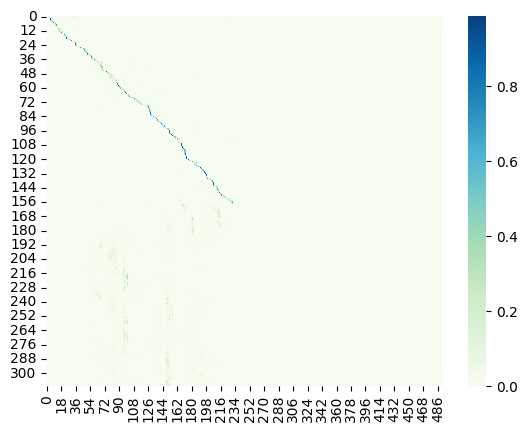

Saved best model

Epoch: 36/80


Val:   3%|▎         | 1/33 [00:02<01:32,  2.88s/it, dist=8.6200]

Ground Truth :  THEIR CHURCHES HAVE DISAPPEARED THEIR BOOKS ARE OBLITERATED THEIR OBSCURE FREEDOM MIGHT ALLOW A LATITUDE OF FAITH AND THE SOFTNESS OF THEIR INFANT CREED WOULD BE VARIOUSLY MOULDED BY THE ZEAL OR PRUDENCE OF THREE HUNDRED YEARS
Prediction   :  THEIR CHURCHES HAVE DISAPPEARED THEIR BOOKS ARE OBLITERATED THERE ABSCURE FREEDOM MIGHT ALLOW A LATITUDE OF FAITH AND THE SOFTNESS OF THEIR INFLUENT CREED WOULD BE VERIOUSLY MOLDED BY THE ZEAL OR PRITENCE OF THREE HUNDRED YEARS


Val:   6%|▌         | 2/33 [00:05<01:22,  2.65s/it, dist=10.1400]

Ground Truth :  IN FACT HE IS QUITE SEVERE ON MISTER RUSKIN FOR NOT RECOGNISING THAT A PICTURE SHOULD DENOTE THE FRAILTY OF MAN AND REMARKS WITH PLEASING COURTESY AND FELICITOUS GRACE THAT MANY PHASES OF FEELING
Prediction   :  IN FACT HE IS QUITE SEVERE ON MISTER RUSKEN FOR NOT RECOGNISING THAT A PICTURE SHOULD DO NOT THE FRIELDY OF MAN AND REMARKS WITH PLEASING COURTESY IN FULL SAID HIS GRACE THAT MANY FACES OF FEELING


Val:   9%|▉         | 3/33 [00:07<01:16,  2.56s/it, dist=10.8800]

Ground Truth :  OAKLEY COLOR BEARER OF THE FOURTH TENNESSEE REGIMENT RAN RIGHT UP IN THE MIDST OF THE YANKEE LINE WITH HIS COLORS BEGGING HIS MEN TO FOLLOW
Prediction   :  OPENLY COLORED BARE OF THE FOURTENACY REGIMENT RAN RIGHT UP IN THE MIDST OF THE ACCULARS BEGGING HIS MEN THE FOLLOW


Val:  12%|█▏        | 4/33 [00:10<01:10,  2.42s/it, dist=10.3533]

Ground Truth :  THE FIRST PART IS DIVIDED INTO FOUR
Prediction   :  THE FIRST PARTISTIVITED BEFORE


Val:  15%|█▌        | 5/33 [00:12<01:07,  2.40s/it, dist=10.3293]

Ground Truth :  HEREDITY THE CAUSE OF ALL OUR FAULTS
Prediction   :  HEREEDITY THE CAUSE OF ALL OUR FAULTS


Val:  18%|█▊        | 6/33 [00:14<01:04,  2.40s/it, dist=10.2200]

Ground Truth :  TRULY THIS SEA IS OF INFINITE WIDTH
Prediction   :  TRULY THE SEAT IS OF INFANT WITH


Val:  21%|██        | 7/33 [00:17<01:01,  2.38s/it, dist=10.3362]

Ground Truth :  THERE WAS ALSO ANOTHER CAUSE
Prediction   :  THERE WAS ALSO ANOTHER CAUSE


Val:  24%|██▍       | 8/33 [00:19<01:00,  2.40s/it, dist=10.3083]

Ground Truth :  THEY APPROACHED THE DOOR WHICH WAS OF AN ARCHED FORM AND FLANKED ON EACH SIDE BY A NARROW TOWER OR PROJECTION OF THE EDIFICE IN BOTH OF WHICH WERE LATTICE WINDOWS THE WOODEN SHUTTERS TO CLOSE OVER THEM AT NEED
Prediction   :  THEY APPROACHED THE DOOR WHICH WAS OF AN ARCHED FORM AND FLANKED ON EACH SIDE BY A NARROW TOWER OR PROJECTION OF THE ADOPHIST IN BOTH OF WHICH WERE NATIST WINDOWS THE WOODEN SHUTTERS TO CLOSE OVER THEM AT NEED


Val:  27%|██▋       | 9/33 [00:22<00:57,  2.41s/it, dist=10.4437]

Ground Truth :  HE WAS BORN LIKE THAT THE OTHERS ARE SMART
Prediction   :  HE WAS BORN LIKE THAT GET THERE'S A SMART


Val:  30%|███       | 10/33 [00:24<00:54,  2.38s/it, dist=10.4533]

Ground Truth :  WELL TOO IF HE LIKE LOVE WOULD FILCH OUR HOARD WITH PLEASURE TO OURSELVES SLUICING OUR VEIN AND VIGOUR TO PERPETUATE THE STRAIN OF LIFE BY SPILTH OF LIFE WITHIN US STORED
Prediction   :  WELL TOO WITH HE LIKE LOVE WOULD FILL CHARHORD WITH PLEASURE TO OURSELVES SLOOSING OUR VEIN AND VIGOUR TO PERPETUATE THE STRAIN OF A LIFE BY SPILT OF LIFE BY SPILT OF LIFE WICKEN A STORED


Val:  33%|███▎      | 11/33 [00:26<00:51,  2.35s/it, dist=10.3770]

Ground Truth :  HE SUFFERED ALL THE PANGS OF A MOTHER AND HE KNEW NOT WHAT IT MEANT FOR THAT GREAT AND SINGULAR MOVEMENT OF A HEART WHICH BEGINS TO LOVE IS A VERY OBSCURE AND A VERY SWEET THING
Prediction   :  HE SUFFERED ALL THE PINES OF A MOTHER AND HE KNEW NOT WHAT IT MEANT FOR THAT GREAT AND SINGULAR MOVEMENT OF A HEART WHICH BEGINS TO LOVE IS A VERY OBSCURE AND A VERY SWEET THING


Val:  36%|███▋      | 12/33 [00:28<00:49,  2.34s/it, dist=10.2567]

Ground Truth :  SHE WAS THEREFORE MOST AGREEABLY SURPRISED TO HEAR MISTER CRESSWELL EXPRESS HIMSELF SO CORDIALLY AS APPROVING OF NEGRO EDUCATION
Prediction   :  SHE WAS THEREFORE MOST AGREEABLY SURPRISED TO HEAR MISTER CRESS WELL EXPRESS HIMSELF SO CORDIALLY AS APPROVING OF NEGRO EDUCATION


Val:  39%|███▉      | 13/33 [00:31<00:47,  2.36s/it, dist=10.5595]

Ground Truth :  TONY LATTIMER THE DISCOVERER WAS BEGINNING TO CASH IN ON HIS ATTENTIONS TO GLORIA AND HIS INGRATIATION WITH SID HE WAS ALWAYS EITHER MAKING VOICE AND IMAGE TALKS FOR TELECAST OR LISTENING TO THE NEWS FROM THE HOME PLANET
Prediction   :  TONEY LATER THE DISCOVERER WAS BEGINNING TO CASH HIM ON HIS ATTENTIONS TO GLORIA AND HIS INGRATION WOULD SIT HE WAS ALWAYS EITHER MAKING VOICE AND IMAGE TALKS FOR TELECAST OR LISTENING TO THE NEWS FROM THE HOME PLANET


Val:  42%|████▏     | 14/33 [00:33<00:43,  2.31s/it, dist=10.4481]

Ground Truth :  LET ME HEAR WHAT IT IS FIRST
Prediction   :  LET ME HEAR WHAT IT IS FIRST


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.39s/it, dist=10.5484]

Ground Truth :  BUT YOU SEE A BODY NEVER KNOWS WHAT TRAITS POVERTY MIGHT BRING OUT IN EM
Prediction   :  BUT HE SEE ALIGHTY NEVER KNOWS WHAT TRAITS POVERTY MIGHT BURN OUT IN HIM


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.39s/it, dist=10.4871]

Ground Truth :  WAS THERE EVER A HAPPIER MAN THAN JOSEPH THAT NIGHT AS HE STRODE ALONG THE FOOTPATH
Prediction   :  WAS THERE EVER A HAPPY YOUR MAN THAN JOSEPH THAT NIGHT AS HE STRODE ALONG WITH FOOTPATH


Val:  52%|█████▏    | 17/33 [00:40<00:38,  2.38s/it, dist=10.4031]

Ground Truth :  WE'VE LOST THE KEY OF THE CELLAR AND THERE'S NOTHING OUT EXCEPT WATER AND I DON'T THINK YOU'D CARE FOR THAT
Prediction   :  WE VOST THE KEY OF THE CELLAR AND THERE'S NOTHING OUT EXCEPT WATER AND I DON'T THINK YOU'D CARE FOR THAT


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.37s/it, dist=10.4030]

Ground Truth :  BUT NOT MORE THAN WHAT'S IN THE BIBLE AUNT SAID DINAH
Prediction   :  BUT NOT MORE THAN WHAT IN THE BIBLE AND SAID DINAH


Val:  58%|█████▊    | 19/33 [00:45<00:34,  2.44s/it, dist=10.4509]

Ground Truth :  AS LONG AS THERE'S A BONE ON THE FLOOR THE TWO OF YOU WORRY IT
Prediction   :  AS LONG AS IT IS ABOUT ON THE FLOOR THE TWO OF YOU WORRY IT


Val:  61%|██████    | 20/33 [00:48<00:31,  2.42s/it, dist=10.4097]

Ground Truth :  IF A ROCK OR A RIVULET OR A BIT OF EARTH HARDER THAN COMMON SEVERED THE LINKS OF THE CLEW THEY FOLLOWED THE TRUE EYE OF THE SCOUT RECOVERED THEM AT A DISTANCE AND SELDOM RENDERED THE DELAY OF A SINGLE MOMENT NECESSARY
Prediction   :  IF A ROCK OR RIVEL IT OR A BIT OF EARTH HARDER THAN COMMON SEVERAL THE LINKS OF THE CLEW THEY FOLLOWED THE TRUE EYE OF THE SCOUT RECOVERED THEM AT A DISTANCE AND SELDOM RENDERED THE DELAY OF A SINGLE MOMENT NECESSARY


Val:  64%|██████▎   | 21/33 [00:50<00:29,  2.46s/it, dist=10.5943]

Ground Truth :  IT WAS THE SEASON WHEN THE ANCIENT SUN GOD HAD BEEN ACCUSTOMED TO RECEIVE HIS ANNUAL OBLATIONS AND WE CAN WELL BELIEVE THAT THOSE WHOSE HEARTS STILL TREMBLED AT THE NAME OF BEL MUST HAVE CONNECTED THE ECLIPSE AND THE PLAGUE WITH THE REVOLUTION IN THE NATIONAL WORSHIP AND THE OVERTHROW OF THE ANCIENT GODS ON THAT PLAIN OF PROSTRATION WHERE THEY HAD SO LONG RECEIVED THE HOMAGE OF AN ENTIRE PEOPLE
Prediction   :  IT WAS THE SEASON WHEN THE ANCIENT SUNGOD HAD BEEN ACCUSTOMED TO RECEIVE HIS ANGEL OBLATIONS AND WE CAN WELL BELIEVE THAT THOSE WHOSE HEART STILL TREMBLED AT THE NAME OF BELL MUST HAVE CONNECTED THE ECLIPSE AND THE PLAGUE WITH THE REVOLUTION IN THE NATIONAL WORSHIP AND THE OVERTHREW OF OF ANCIENT GODS ON THAT PLAIN OF PROSTRATION WHERE THEY HAD SO LONG RECEIVED THE HOMAGE OF ENTIRE PEOPLE


Val:  67%|██████▋   | 22/33 [00:53<00:27,  2.48s/it, dist=10.8133]

Ground Truth :  NOR EVEN THUS OUR WAY CONTINUED FAR BEFORE THE LADY WHOLLY TURNED HERSELF UNTO ME SAYING BROTHER LOOK AND LISTEN
Prediction   :  NOR EVEN LESS AWAY CONTINUED FAR BEFORE THE LADY HOLY TURNED HERSELF UNTO ME SAYING BROTHER LOOK AND LISTEN


Val:  70%|██████▉   | 23/33 [00:55<00:24,  2.44s/it, dist=10.8661]

Ground Truth :  I BELIEVE THE SERIOUSNESS OF THE AMERICANS ARISES PARTLY FROM THEIR PRIDE
Prediction   :  I BELIEVE THE SERIOUSNESS OF THE IMAGINS ARISES PAUTLY FROM THEIR PRIDE


Val:  73%|███████▎  | 24/33 [00:58<00:21,  2.43s/it, dist=10.8539]

Ground Truth :  NO I FORGOT ALL ABOUT THE BRAINS EXCLAIMED THE WOMAN
Prediction   :  NO I FORGOT UP ABOUT THE BRAINS EXCLAIMED THE WOMAN


Val:  76%|███████▌  | 25/33 [01:00<00:18,  2.35s/it, dist=10.8069]

Ground Truth :  IT WAS THE YOUNGEST ONE WHO DECEIVED ME CRIED THE ROBBER CHIEFTAIN
Prediction   :  IT WAS THE YOUNGEST ONE WHO DECEIVED ME CRIED THE ROBER CHIEFTAIN


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.41s/it, dist=10.7503]

Ground Truth :  HE COULD HARDLY REALISE HOW IT HAD ALL COME ABOUT
Prediction   :  HE COULD HARDLY REALIZE HOW IT HAD ALL COME ABOUT


Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.43s/it, dist=10.8770]

Ground Truth :  THE TRIBUTE WAS AT THIS PERIOD ENORMOUS FIFTEEN THOUSAND HEAD OF CATTLE ANNUALLY
Prediction   :  THE TRIBUTE WAS AT THIS PERIOD ENORMOUS FIFTEEN THOUSAND HEAD OF CATTLE ANGLELY


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.39s/it, dist=10.7910]

Ground Truth :  TOMATO BASKETS TOMATO BASKETS ARE CHARMING ACCESSORIES FOR HOLDING VEGETABLE SALAD CHICKEN SHRIMPS COLD BEANS ASPARAGUS TIPS SHREDDED CELERY CUCUMBERS CUT IN CUBES AND MINCED PEPPERS
Prediction   :  TO MADE A BASKETS TO MADE A BASKETS ARE CHARMING AS SUSSERIES FOR HOLDING A CESSARIES FOR HOLDING A VEGETABLE SOLID CHICKEN SHRIMPS COLD BEINGS A SPARE GISTIPS SHREADED SOLERY CUCUMBERS CUT INCUBES AND MINST PEPPERS


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.39s/it, dist=10.8345]

Ground Truth :  WE PASSED MANY CASES AND AT LAST CAME TO ONE IN WHICH THERE WERE SEVERAL CLOCKS AND TWO OR THREE OLD WATCHES
Prediction   :  WE PASSED MANY CASES AND AT LAST HIM NO ONE IN WHICH THERE WERE SUBORAL CLOCKS AND TWO OR THREE OLD WATCHES


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.36s/it, dist=10.7789]

Ground Truth :  NOW EVERY MISSIONARY THAT EVER WENT OUT FROM IONA HAD TAUGHT THAT TO REDUCE CHRISTIANS TO SLAVERY WAS WHOLLY INCONSISTENT WITH A BELIEF IN THE DOCTRINES OF THE GOSPEL
Prediction   :  NOW EVERY MISSIONARY THAT EVER WENT OUT FOR MY OWN A HAD TAUGHT THAT TO REDUCE CHRISTIANS TO SLAVERY WAS WHOLLY INCONSISTENT WITH A BELIEF IN THE DOCTRINES OF THE GOSPEL


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.38s/it, dist=10.7335]

Ground Truth :  YOU COULD GET HOME EASY TOO IT ISN'T VERY FAR
Prediction   :  YOU COULD GET HOME EASY TOO IT IS A MERRY FAR


Val:  97%|█████████▋| 32/33 [01:17<00:02,  2.41s/it, dist=10.7783]

Ground Truth :  HE LIVED AND DIED FOR THE SERVICE OF MANKIND BUT THE LIFE AND DEATH OF SOCRATES HAD LIKEWISE BEEN DEVOTED TO THE CAUSE OF RELIGION AND JUSTICE AND ALTHOUGH THE STOIC OR THE HERO MAY DISDAIN THE HUMBLE VIRTUES OF JESUS THE TEARS WHICH HE SHED OVER HIS FRIEND AND COUNTRY MAY BE ESTEEMED THE PUREST EVIDENCE OF HIS HUMANITY
Prediction   :  HE LIEUTENANT DIED FOR THE SERVICE OF MANKIND BUT THE LIFE AND DEATH OF SOCRATIES HAD LIKEWISE BEING DEVOTED TO THE CAUSE OF RELIGION AND JUSTICE AND ALTHOUGH THE STOCK OR THE HERO MAY DISDAIN THE HUMBLE VIRTUES OF JESUS THE TEARS WHICH HE SHOULD OVER HIS FRIEND AND COUNTRY MAY BE A STEAMED THE PUREST EVIDENCE OF HIS HUMANITY


Val: 100%|██████████| 33/33 [01:18<00:00,  2.02s/it, dist=10.7517]

Ground Truth :  HIS INSTANT OF PANIC WAS FOLLOWED BY A SMALL SHARP BLOW HIGH ON HIS CHEST
Prediction   :  HIS INSTANCE PANERCH WAS FOLLOWED BY A SMALL SURPLE HIGH ON HIS CHEST


	Train Loss 0.2166	 Learning Rate 0.0007372
	Val Dist 10.7517	
	Teacher Forcing Ratio 1	


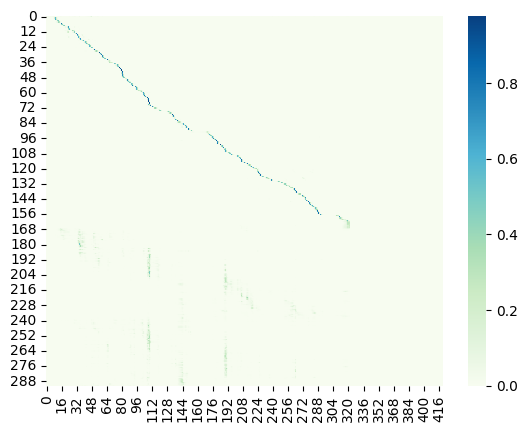

Saved best model

Epoch: 37/80


Val:   3%|▎         | 1/33 [00:02<01:35,  2.98s/it, dist=9.7067]

Ground Truth :  THERE SHE OWNS A COTTAGE OR IT MAY BE A PIGSTYE FOR ALL I KNOW
Prediction   :  THERE SHE OWNS A COTTAGE OR IT MAY BE A PIG STY FOR ALL I KNOW


Val:   6%|▌         | 2/33 [00:05<01:22,  2.67s/it, dist=9.8400]

Ground Truth :  NOW EVERY MISSIONARY THAT EVER WENT OUT FROM IONA HAD TAUGHT THAT TO REDUCE CHRISTIANS TO SLAVERY WAS WHOLLY INCONSISTENT WITH A BELIEF IN THE DOCTRINES OF THE GOSPEL
Prediction   :  NOW EVERY MISSIONARY THAT EVER WENT OUT FROM IONA HAD TAUGHT THAT TO REDUCE CHRISTIANS TO SLAVERY WITH WHOLLY INCONSISTENT WITH A BELIEF IN THE DOCTRINES OF THE GOSPEL


Val:   9%|▉         | 3/33 [00:07<01:16,  2.55s/it, dist=10.2556]

Ground Truth :  WHERE IS THAT
Prediction   :  WHERE IS THAT


Val:  12%|█▏        | 4/33 [00:10<01:11,  2.45s/it, dist=10.2217]

Ground Truth :  MODE WHISK THE EGG STIR IN THE SUGAR AND BEAT THESE INGREDIENTS WELL TOGETHER BEAT THE BUTTER TO A CREAM STIR IN THE GROUND RICE CURRANTS AND CANDIED PEEL AND AS MUCH FLOUR AS WILL MAKE IT OF SUCH A CONSISTENCY THAT IT MAY BE ROLLED INTO SEVEN OR EIGHT BALLS
Prediction   :  MODE WHISK THE EGG STIR IN THE SHOGER AND BEAT THESE INGREDIENTS WELL TOGETHER BEAT THE BUTTER TO A CREAM STIR IN THE GROUND BRICE CURRENTS AND CANDIED PIEL AND AS MUCH FLOWER AS WILL MAKE IT OF SUCH A CONSISTENCY THAT IT MAY BE ROLLED INTO SEVEN OR EIGHT BALLS


Val:  15%|█▌        | 5/33 [00:12<01:08,  2.43s/it, dist=10.6493]

Ground Truth :  I WISH HE HAD NEVER BEEN TO SCHOOL MISSUS VERLOC BEGAN AGAIN BRUSQUELY
Prediction   :  I WISH HE HAD NEVER BEEN TO SCHOOL MISSUS RELOCK BEGAN AGAIN BRUSKLY


Val:  18%|█▊        | 6/33 [00:14<01:05,  2.43s/it, dist=10.6467]

Ground Truth :  OH BARTLEY DID YOU WRITE TO ME
Prediction   :  ELEBARTLY DID YOU WRITE TO ME


Val:  21%|██        | 7/33 [00:17<01:01,  2.36s/it, dist=10.6448]

Ground Truth :  SINCE HIS BIRTH HE HAS BEEN GUARDED SO CLOSELY THAT THE CLEVEREST POISONERS OF THE EAST COULD NOT REACH HIM
Prediction   :  SINCE HIS BIRTH HE HAS BEEN GUARDED SO CLOSELY THAT THE CLEVEREST POISONERS OF THE EAST COULD NOT REACH HIM


Val:  24%|██▍       | 8/33 [00:19<00:59,  2.39s/it, dist=10.9575]

Ground Truth :  SHE STOPPED WITH HER HAND ON THE LATCH OF THE WILSONS DOOR TO STILL HER BEATING HEART AND LISTENED TO THE HUSHED QUIET WITHIN
Prediction   :  SHE STOPPED WITH HER HAND ON THE LATCH OF THE WILSON'S DOOR TO STILL HER BEATING HEART AND LISTENED TO THE HUSHED QUIET WITHIN


Val:  27%|██▋       | 9/33 [00:22<00:57,  2.40s/it, dist=10.8956]

Ground Truth :  AS FOR THE ICHTHYOSAURUS HAS HE RETURNED TO HIS SUBMARINE CAVERN
Prediction   :  AS FOR THE IFFEAR SOURCE AS HE RETURNED WHOSE SUBMERING CAVERN


Val:  30%|███       | 10/33 [00:24<00:54,  2.39s/it, dist=10.7613]

Ground Truth :  YET THAT TASK WAS NOT SO EASY AS YOU MAY SUPPOSE
Prediction   :  YET THAT TASK WAS NOT SO EASY AS YOU MAY SUPPOSE


Val:  33%|███▎      | 11/33 [00:26<00:51,  2.34s/it, dist=10.6158]

Ground Truth :  HE GAVE THANKS FOR OUR FOOD AND COMFORT AND PRAYED FOR THE POOR AND DESTITUTE IN GREAT CITIES WHERE THE STRUGGLE FOR LIFE WAS HARDER THAN IT WAS HERE WITH US
Prediction   :  HE GAVE THINKS FOR A FOOD IN COMFORT AND PRAYED FOR THE POOR INDUSTITUDE IN GREAT CITIES WHERE THE STRUGGLE FOR LIFE WAS HARDER THAN IT WAS HERE WITH US


Val:  36%|███▋      | 12/33 [00:29<00:49,  2.35s/it, dist=10.5700]

Ground Truth :  IT WAS WRITTEN IN THE UPPER RANGITATA DISTRICT OF THE CANTERBURY PROVINCE AS IT THEN WAS OF NEW ZEALAND AND APPEARED AT CHRISTCHURCH IN THE PRESS NEWSPAPER JUNE THIRTEENTH EIGHTEEN SIXTY THREE
Prediction   :  IT WAS RID IN THE UPPER RANGETS OUT A DISTRICT OF THE CANABRAY PRAVENTS AS IT THEN WAS OF NEWSELAND AT APPEARED A CRIST CHURCH IN THE PRESS NEWSPAPER JUNE THIRTEENTH EIGHTEEN SIXTY THREE


Val:  39%|███▉      | 13/33 [00:31<00:47,  2.40s/it, dist=10.9159]

Ground Truth :  IT WAS ALMOST THE TONE OF HOPE EVERYBODY WILL STAY
Prediction   :  IT WAS ALMOST THE TONE OF HOPE EVERYBODY WILL STEAD IT IN HOPE EVERYBODY WILL STEAD IT IN HOPE EVERYBODY WILL STEAD IT IN A LITTLE STEADILY AND IN THE SUBJECT OF THE SUBJECT AND HER HUNDRED AND THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE WINDOW IN THE W


Val:  42%|████▏     | 14/33 [00:33<00:45,  2.40s/it, dist=10.8652]

Ground Truth :  DOES ONE MISTER SAMUEL BOZZLE LIVE HERE ASKED TREVELYAN
Prediction   :  DOES ONE MISTER SAMUL BOZZLE LIVE HERE ASKED TREVELIAN


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.41s/it, dist=10.8560]

Ground Truth :  ANY ONE WITH THE SLIGHTEST PRETENSIONS TO REFINED COOKERY MUST IN THIS PARTICULAR IMPLICITLY FOLLOW THE EXAMPLE OF OUR FRIENDS ACROSS THE CHANNEL
Prediction   :  ANY ONE WITH THE SLIGHTEST PRETENSIONS TO REFINED COOK REMUST IN THIS PARTICULAR IMPLICITLY FOLLOWED THE EXAMPLE OF HER FRIENDS ACROSS THE CHIN


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.36s/it, dist=10.8821]

Ground Truth :  ILLUSTRATION BASIL
Prediction   :  ILLUSTRATION VASTLE


Val:  52%|█████▏    | 17/33 [00:40<00:37,  2.35s/it, dist=10.9247]

Ground Truth :  WE'VE GOT A HARD DRIVE BEFORE US AND EVERY MAN MUST BE FIT AS A FIDDLE
Prediction   :  WE'VE GOT A HARD DRIVE BEFORE SOME EVERY BAND THIS BEFORE IS A FIDDLE


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.37s/it, dist=10.9463]

Ground Truth :  NO OUR WAY IS BEST
Prediction   :  NO ARE WAY AS BEST


Val:  58%|█████▊    | 19/33 [00:45<00:33,  2.38s/it, dist=10.9691]

Ground Truth :  AS IT IS UNLESS I AM MISTAKEN SOME OF THE RENDING WILL BE ON OUR SIDE AND THEY KNOW IT
Prediction   :  AS IT IS UNLESS I AM MISTAKEN SOME OF THE RENDING WILL BE ON ARSIDE AND THEY KNOW IT


Val:  61%|██████    | 20/33 [00:48<00:30,  2.37s/it, dist=10.9697]

Ground Truth :  IT IS A NATIVE OF PORTUGAL AND WHEN ITS LEAVES ARE USED AS A SEASONING HERB THEY HAVE AN AGREEABLE AROMATIC FLAVOUR
Prediction   :  IT IS A NATIVE OF PORTUGAL AND WHEN IT'S LEAVED HER USED AS A SEASONING EARTH THEY HAVE AN AGREEABLE HEROMATIC PLAVER


Val:  64%|██████▎   | 21/33 [00:50<00:29,  2.42s/it, dist=11.1343]

Ground Truth :  THOUGH NOT VERY LARGE IT APPEARED NOT LIKELY TO BE FILLED FOR CENTURIES
Prediction   :  THE NAUTHERY LARGE IT APPEARED NOT LIKELY TO BE FILLED FOR CENTURIES


Val:  67%|██████▋   | 22/33 [00:52<00:26,  2.40s/it, dist=11.2182]

Ground Truth :  YOU TAKE THIS TO THIS ADDRESS HE SAID HANDING HIM THE ENVELOPE AND GIVE IT TO MISSUS HURSTWOOD YES SIR SAID THE BOY
Prediction   :  YOU TAKE THIS TO THIS ADDRESS HE SAID HANDING HIM THE AUNTLET AND GIVE IT TO MISSUS HURSTLYN YES THERE SAID THE BOY


Val:  70%|██████▉   | 23/33 [00:55<00:24,  2.40s/it, dist=11.2081]

Ground Truth :  IT WAS INDEED HER HANDWRITING
Prediction   :  IT WAS INDEED HER HAND GREATING


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.40s/it, dist=11.2083]

Ground Truth :  HANS STIRS NOT
Prediction   :  AND HARM STIRRES NIGHT


Val:  76%|███████▌  | 25/33 [01:00<00:19,  2.45s/it, dist=11.2451]

Ground Truth :  HIS FIRST IMPULSE WAS TO WRITE BUT FOUR WORDS IN REPLY GO TO THE DEVIL
Prediction   :  HIS FIRST IMPULSE WAS TO RAID BUT FORWARDS IN REPLY GO TO THE DEVIL


Val:  79%|███████▉  | 26/33 [01:02<00:17,  2.47s/it, dist=11.2200]

Ground Truth :  THE FACT IS THE CASTLE IS MUCH LATER THAN THE TIME OF THE HEROIC PRINCE OF DENMARK
Prediction   :  IF ACT IS THE CASTLE IS MUCH LATER THAN THE TIME OF THE HERO PRINCE OF DENWORK


Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.45s/it, dist=11.2504]

Ground Truth :  THEN SHE WALKED AND SANG TO IT UNTIL HANSON DISTURBED IN HIS READING CAME AND TOOK IT
Prediction   :  THEN SHE WALKED AND SAYING TO IT UNTIL HANDSOME DISTURBED IN HIS READING CAME AND TOOK IT


Val:  85%|████████▍ | 28/33 [01:07<00:12,  2.41s/it, dist=11.1919]

Ground Truth :  IN SPITE OF THEIR HARD COUCHES THE PONY RIDERS SLEPT SOUNDLY EVEN PROFESSOR ZEPPLIN HIMSELF NEVER WAKING THE WHOLE NIGHT THROUGH
Prediction   :  IN SPITE OF THEIR HARD COUCHES THE PONY RIGHTER SLIPPED SEVERALLY EVEN PROFESSOR SEPARATED HIMSELF NEVER WAKING THE WHOLE NIGHT THROUGH


Val:  88%|████████▊ | 29/33 [01:10<00:09,  2.48s/it, dist=11.3763]

Ground Truth :  RETURN TO YOUR PROVINCES AND MAY YOUR PRIVATE VIRTUES REPAIR THE MISCHIEF AND SCANDAL OF YOUR MEETING
Prediction   :  RETURNED YOUR PROVINCES AND BAY YOUR PRIVATE VIRTUES REPAIR THE MISCHIEF AND SCANDAL OF YOUR MEETING


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.44s/it, dist=11.3022]

Ground Truth :  THE LADIES
Prediction   :  THE LADIES


Val:  94%|█████████▍| 31/33 [01:15<00:04,  2.44s/it, dist=11.2318]

Ground Truth :  LETTY FINDING HERSELF NOT QUITE EQUAL TO THE EMERGENCY CAME IN HER TURN TO CALL MARY SHE WENT AS QUIETLY AS IF SHE WERE LEAVING A TIRESOME VISITOR
Prediction   :  LET HE FIND HERSELF NOT QUITE EQUAL TO THE IMMERSIANCY CAME IN HER TURN TO CALL MARY SHE WENT AS QUIETLY AS IF SHE WERE LEAVING A TIRE SOME VISITOR


Val:  97%|█████████▋| 32/33 [01:17<00:02,  2.36s/it, dist=11.1623]

Ground Truth :  SUCH CRIMES WOULD HAVE DESERVED THE ANIMADVERSION OF THE MAGISTRATE BUT IN THIS PROMISCUOUS OUTRAGE THE INNOCENT WERE CONFOUNDED WITH THE GUILTY AND ALEXANDRIA WAS IMPOVERISHED BY THE LOSS OF A WEALTHY AND INDUSTRIOUS COLONY
Prediction   :  SUCH CRIMES WOULD HAVE DESERVED THE ANIMADVERSION OF THE MAGISTRATE BUT IN THIS PERMISSION IS OUR AGE THE INNOCENT WERE CONFOUNDED WITH THE GUILTY AND ALEXANDRA WAS IMPOVERSED BY THE LOSS OF A WEALTHY AND INDUSTRIOUS COLONY


Val: 100%|██████████| 33/33 [01:18<00:00,  1.96s/it, dist=11.0134]

Ground Truth :  SO I BELIEVE I SHALL GO BACK AT LEAST FOR A WHILE AND SEE WHAT I CAN DO
Prediction   :  SO I BELIEVE I SHALL GO BACK AT THESE FOR A WHILE AND SEE WHAT I CAN DO


	Train Loss 0.1955	 Learning Rate 0.0007172
	Val Dist 11.0134	
	Teacher Forcing Ratio 1	


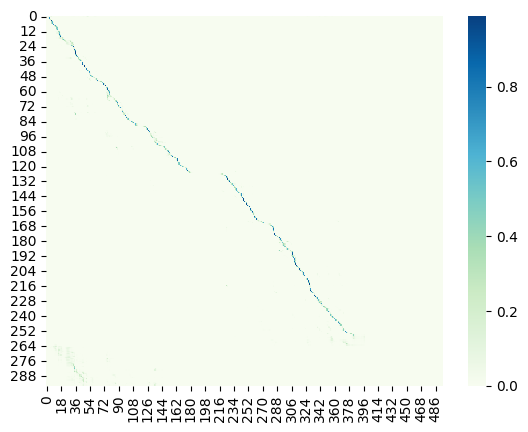


Epoch: 38/80


Val:   3%|▎         | 1/33 [00:02<01:34,  2.95s/it, dist=8.5133]

Ground Truth :  HE COUGHED DRANK HIS TEA ENDEAVOURED TO TALK BUT FOUND IT DIFFICULT SOMETIMES READ AND IN THIS MANNER NEAR TWO HOURS WERE PASSED AWAY WHEN MISS MILNER CAME INTO THE ROOM NOT DRESSED FOR A BALL BUT AS SHE HAD RISEN FROM DINNER
Prediction   :  HE COUGHED DRANK HIS TEA ENDEAVORED TO TALK BUT FOUND A DIFFICULT SOMETIMES READ AND IN THIS MANNER NEAR TWO HOURS WERE PASSED AWAY WHEN MISS MILL THERE CAME INTO THE ROOM NOT ADDRESSED FOR A BALL BUT AS SHE HAD REASON FROM DINNER


Val:   6%|▌         | 2/33 [00:05<01:22,  2.67s/it, dist=9.3800]

Ground Truth :  NOR IS MISTER QUILTER'S MANNER LESS INTERESTING THAN HIS MATTER
Prediction   :  NOR IS MISTER QUALTERS MANNER OF LESS INTERESTINGS AND HIS MATTER


Val:   9%|▉         | 3/33 [00:07<01:17,  2.57s/it, dist=9.1867]

Ground Truth :  I DON'T WANT YOU TO I LOVE TO SEE YOU SO YOUNG AND HAPPY ONLY YOU ARE NOT THE OLD DAVID AND I'VE GOT TO GET ACQUAINTED WITH THE NEW ONE
Prediction   :  I DON'T WANT YOUR TOO I LOVED TO SEE YOU SO YOUNG AND TAPPY ONLY YOU ARE NOT THE OLD DAYFORD AND OF GOT TO GET ACQUAINTED WITH THE NEW ONE


Val:  12%|█▏        | 4/33 [00:10<01:12,  2.49s/it, dist=9.0550]

Ground Truth :  PONG TELL THE YOUNG GENTLEMEN WHAT WOULD BECOME OF YOU IF YOU WERE TO SERVE BAD MEALS TO THIS OUTFIT OF COWPUNCHERS
Prediction   :  POMBETELL THE OWN GENTLEMAN WHAT WOULD BECOME A VIEW IF YOU WORE TO SERVE BAD MILLS TO THIS AT FOOT OF CALPUTERS


Val:  15%|█▌        | 5/33 [00:12<01:06,  2.38s/it, dist=8.5880]

Ground Truth :  BUT PUT IT ON THE TABLE IN THE CORNER OF THE PASSAGE
Prediction   :  BUT PUT IT ON THE TABLE IN THE CORNER OF THE PASSAGE


Val:  18%|█▊        | 6/33 [00:14<01:04,  2.40s/it, dist=8.7989]

Ground Truth :  HER ONLY LIFE WAS THAT SHE WAS LOST
Prediction   :  HER ONLY LIFE WAS BUT SHE WAS LOST


Val:  21%|██        | 7/33 [00:17<01:02,  2.40s/it, dist=8.8229]

Ground Truth :  THE BOY HASTENED AWAY AND THE MANAGER FELL TO HIS MUSINGS
Prediction   :  THE BOY HASTENED AWAY AND THE MANAGER FELT TO HIS MUSINGS


Val:  24%|██▍       | 8/33 [00:19<01:00,  2.42s/it, dist=8.8858]

Ground Truth :  PRAY HELP YOURSELF TO WINE
Prediction   :  PRAY HELP YOURSELF TO WINE


Val:  27%|██▋       | 9/33 [00:22<00:57,  2.39s/it, dist=8.9119]

Ground Truth :  ONCE THERE WAS A FATHER WHO THOUGHT HE WOULD BUILD FOR HIS CHILDREN A BEAUTIFUL HOME PUTTING INTO IT EVERY THING THEY COULD NEED OR DESIRE THROUGHOUT THEIR LIVES
Prediction   :  ONCE THAT WITH A FATHER WHO THOUGHT HE WOULD BUILD FOR HIS CHILDREN A BEAUTIFUL HOME PUTTING IN TO IT EVERYTHING THAT COULD NEED OR DESIRE THROUGHOUT THEIR LIVES


Val:  30%|███       | 10/33 [00:24<00:56,  2.45s/it, dist=9.1200]

Ground Truth :  NO ANSWER THOUGH I ALLOWED A MORE THAN DECENT INTERVAL
Prediction   :  NO ANSWER THOUGH I ALLOWED A MORE THAN DECENT INTERVAL


Val:  33%|███▎      | 11/33 [00:27<00:53,  2.44s/it, dist=9.0309]

Ground Truth :  OCCASIONALLY TOO THE WAKING CALL COMES TOO LATE THE CHANCE WHICH GIVES PERMISSION TO TAKE ACTION WHEN THEIR BEST YOUTH AND STRENGTH FOR ACTION HAVE BEEN USED UP IN SITTING STILL AND HOW MANY A ONE JUST AS HE SPRANG UP HAS FOUND WITH HORROR THAT HIS LIMBS ARE BENUMBED AND HIS SPIRITS ARE NOW TOO HEAVY
Prediction   :  OCCASIONALLY TOO THE WAKING CALL COMES TO LATE CHANCE WHICH ITS PERMISSION TO TAKE ACTION WHEN THEIR BEST YOUTH AND STRANGE FOR ACTION HAVE BEEN USED UP IN SITTING STILL AND HOW MANY AT ONE JUST AS HE SPRANG UP HIS FOUND WITH HORROR THAT HIS LIMBS ARE BENOMENT AND HIS SPIRITS ARE NOW TO A HEAVY


Val:  36%|███▋      | 12/33 [00:29<00:51,  2.47s/it, dist=9.0211]

Ground Truth :  MODE PUT THE FLOUR INTO A BASIN MIX THE SUGAR WELL WITH IT MAKE A HOLE IN THE CENTRE AND STIR IN THE YEAST AND MILK WHICH SHOULD BE LUKEWARM WITH ENOUGH OF THE FLOUR TO MAKE IT THE THICKNESS OF CREAM
Prediction   :  MODE PUT THE FLOWER INTO A BASIN MIXED THE SUGAR WELL WITH IT MAKE A WHOLE ON THE CENTER AND STIR IN THE EAST AND MILK WHICH SHOULD BE LOOK WARM WITH ENOUGH OF THE FLOWER TO MAKE IT THE THICKNESS OF CREAM


Val:  39%|███▉      | 13/33 [00:32<00:49,  2.49s/it, dist=9.0359]

Ground Truth :  THE PLAYWRIGHT GAVE MAINHALL A CURIOUS LOOK OUT OF HIS DEEP SET FADED EYES AND MADE A WRY FACE
Prediction   :  THE PLAY RIGHT GAVE ME HOLLOW CURIOUS LOOK OUT OF HIS DEEP SET FADED EYES AND MADE A RIGHT FACE


Val:  42%|████▏     | 14/33 [00:34<00:47,  2.48s/it, dist=8.9781]

Ground Truth :  THE SHADOW OF HIS EVIL GIFT CLUNG TO HIM YET LIKE THE SMELL OF A DEADLY DRUG IN AN OLD VIAL OF POISON EMPTIED NOW USELESS READY TO BE THROWN AWAY UPON THE RUBBISH HEAP OF THINGS THAT HAD SERVED THEIR TIME
Prediction   :  THE SHADOW OF HIS EVIL GIFT CLUNG TO HIM YET LIKE THE SMELL OF A DULLY DRUG AND AN OLD FILE OF PLACE AND EMPTIED NOW HE ISLAS READY TO BE THROWN AWAY UPON THE ROBISH HEEP OF THINGS THAT IT SERVED THEIR TIME


Val:  45%|████▌     | 15/33 [00:37<00:44,  2.46s/it, dist=9.1836]

Ground Truth :  SEEING THIS SANCHO GOT UP AND GRAPPLING WITH HIS MASTER HE GRIPPED HIM WITH ALL HIS MIGHT IN HIS ARMS GIVING HIM A TRIP WITH THE HEEL STRETCHED HIM ON THE GROUND ON HIS BACK AND PRESSING HIS RIGHT KNEE ON HIS CHEST HELD HIS HANDS IN HIS OWN SO THAT HE COULD NEITHER MOVE NOR BREATHE
Prediction   :  SEEING THIS SANCHO GOT UP AND GRAPPLING WITH HIS MASTER HE GRIPPED HIM WITH ALL HIS MIGHT IN HIS ARMS GIVING HIM A TRIP WITH THE HEAL STRETCHED AMONG THE GROUND ON HIS BACK AND PRESSING HIS RIGHT NEAR ON HIS CHEST HELD HIS HANDS IN HIS OWN SO THAT HE COULD NEITHER MOVE NOR BREATHE


Val:  48%|████▊     | 16/33 [00:39<00:41,  2.43s/it, dist=9.2004]

Ground Truth :  HE WAS OF A CLEAN SAVING DISPOSITION AND HAD ALREADY PAID A NUMBER OF MONTHLY INSTALMENTS ON TWO LOTS FAR OUT ON THE WEST SIDE
Prediction   :  HE WAS OF A CLEAN SAVING DISPOSITION AND HAD ARTY PAID A NUMBER OF MOMENTLY IN SOME MENS ON TWO LOTS FAR OUT ON THE WEST SIDE


Val:  52%|█████▏    | 17/33 [00:41<00:38,  2.38s/it, dist=9.1463]

Ground Truth :  ILLUSTRATION LONG PEPPER
Prediction   :  ILLUSTRATION LONG PEPPER


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.36s/it, dist=9.0596]

Ground Truth :  MY GUIDES HOWEVER WERE WELL KNOWN AND THE NATURAL POLITENESS OF THE PEOPLE PREVENTED THEM FROM PUTTING ME TO ANY INCONVENIENCE BUT THEY COULD NOT HELP EYEING ME NOR I THEM
Prediction   :  MY GUIDES HOWEVER WERE WELL KNOWN AND THE NATURAL POLITE AS THE PEOPLE PREVENTED THEM FROM PUTTING ME TO ANY INCONVENIENCE BUT THEY COULD NOT HELP I IN ME NOR I THEN


Val:  58%|█████▊    | 19/33 [00:46<00:33,  2.37s/it, dist=9.0288]

Ground Truth :  THEIR FINGERS SEAR ME LIKE FIRE
Prediction   :  THEIR FINGERS SAIR ME LIKE FIRE


Val:  61%|██████    | 20/33 [00:48<00:30,  2.37s/it, dist=9.1857]

Ground Truth :  THE THREE FRIENDS WERE ASTOUNDED
Prediction   :  THE THREE FRIENDS WERE ASTOUNDED


Val:  64%|██████▎   | 21/33 [00:51<00:28,  2.35s/it, dist=9.0803]

Ground Truth :  MARIE'S FACE FELL UNDER HIS BROODING GAZE
Prediction   :  BUT REASPACE VALUE UNDER HIS BROODING GAZE


Val:  67%|██████▋   | 22/33 [00:53<00:26,  2.41s/it, dist=9.0606]

Ground Truth :  SOMEONE ELSE TOLD A STORY NOT PARTICULARLY EFFECTIVE WHICH I SAW HE WAS NOT FOLLOWING
Prediction   :  SOMEONE ELSE TOLD A STORY NOT PARTICULARLY AFFECTIVE WHICH I SAW HE WAS NOT FOLLOWING


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.33s/it, dist=9.0446]

Ground Truth :  BUT THERE SEEMED NO REASON TO FEAR
Prediction   :  BUT THERE SEEMED NO REASON A FEAR


Val:  73%|███████▎  | 24/33 [00:58<00:21,  2.39s/it, dist=9.0786]

Ground Truth :  WE WOULD FIGHT TO THE DEATH OF COURSE BUT AFTER THAT
Prediction   :  WE WOULD FIGHT TO THE DEATH OF COURSE BUT AFTER THAT


Val:  76%|███████▌  | 25/33 [01:00<00:19,  2.42s/it, dist=9.0947]

Ground Truth :  HE NODS HIS CONSENT
Prediction   :  HE NODS HIS CONSENT


Val:  79%|███████▉  | 26/33 [01:03<00:16,  2.39s/it, dist=9.0723]

Ground Truth :  WHEN SHE OPENED THE DOOR OF IT THE BRIGHT FIRE WHICH BEENIE UNDESIRED HAD KINDLED THERE STARTLED HER THE ROOM LOOKED UNNATURAL UNCANNY BECAUSE IT WAS CHEERFUL
Prediction   :  WHEN SHE OPENED THE DOOR THAT THE BRIGHT FIRE WHICH BENEATH UNDESIRED HAD KINDLED THERE STARTLED HER THE ROOM LOOKED UNNATURAL UNCANNY BECAUSE IT WAS CHEERFUL


Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.39s/it, dist=9.1788]

Ground Truth :  I'VE BEEN UP IN CANADA WITH MY BRIDGE AND I ARRANGED NOT TO COME TO NEW YORK UNTIL AFTER YOU HAD GONE
Prediction   :  I BEEN UP AND CANNOT I WITH MY BRIDGE AND I ARRANGED NOT TO COME TO NEW YORK UNTIL AFFERIE HAD GONE


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.37s/it, dist=9.1148]

Ground Truth :  AT THAT MOMENT THE FATHER CAME OUT OF THE HOLE IN THE BANK
Prediction   :  AT THAT MOMENT THE FATHER CAME OUT OF THE WHOLE IN THE BANK


Val:  88%|████████▊ | 29/33 [01:10<00:09,  2.38s/it, dist=9.1352]

Ground Truth :  HIS INSTANT OF PANIC WAS FOLLOWED BY A SMALL SHARP BLOW HIGH ON HIS CHEST
Prediction   :  HIS INSTANCE PANIC WAS FOLLOWED BY A SMALL SURPLE HIGH ON HIS CHEST


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.41s/it, dist=9.1311]

Ground Truth :  HOW WONDERFULLY RESPONSIVE TO EVERY EMOTION OF THE HUMAN SOUL
Prediction   :  HOW WONDERFULLY RESPONSIVE TO EVERY EMOTION OF THE HUMAN SOUL


Val:  94%|█████████▍| 31/33 [01:15<00:04,  2.40s/it, dist=9.1381]

Ground Truth :  SHE CUT SQUARES OF COTTON CLOTH AND WE SEWED THEM TOGETHER INTO A BOOK
Prediction   :  SHE CUT SQUARES OF COTTON CLOTH AND WE SO THEM TOGETHER INTO A BOOK


Val:  97%|█████████▋| 32/33 [01:17<00:02,  2.39s/it, dist=9.1242]

Ground Truth :  INSTEAD OF SHOES THE OLD MAN WORE BOOTS WITH TURNOVER TOPS AND HIS BLUE COAT HAD WIDE CUFFS OF GOLD BRAID
Prediction   :  INSTEAD OF SHOES THE OLD MEN WERE BOOKS WITH TURN OVER TOPS AND HIS BLUE COAT HAD WIDE COSS OF GOLD BRAID


Ground Truth :  IT DID NOT FALL UPON THE FLOOR AROUND HER THEREFORE IT FLEW THROUGH ONE OF THOSE OPENINGS INTO THE LOBBY AND THERE IT EITHER WILL BE OR HAS BEEN FOUND
Prediction   :  IT DID NOT FALL UPON THE FLOOR AROUND HER THEREFORE IT FLEW THROUGH ONE OF THOSE OPENINGS INTO THE LOBBY AND THERE IT EITHER WILL BE OR HAS BEEN FOUND
	Train Loss 0.1943	 Learning Rate 0.0006968
	Val Dist 9.0590	
	Teacher Forcing Ratio 1	


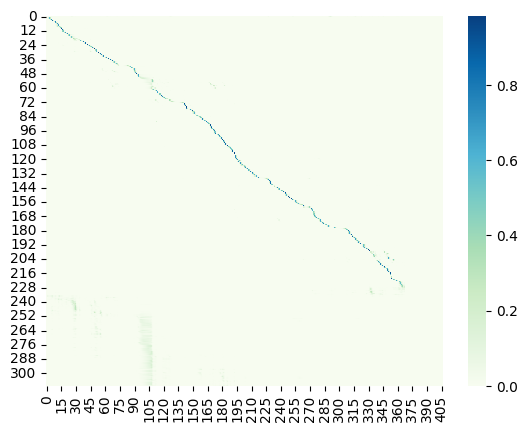

Saved best model

Epoch: 39/80


Val:   3%|▎         | 1/33 [00:03<01:38,  3.08s/it, dist=10.0533]

Ground Truth :  ONE HARDLY LIKES TO THROW SUSPICION WHERE THERE ARE NO PROOFS
Prediction   :  ONE HIGH THEY LIKES TO THROW SUSPICION WHERE THERE ARE NO PROOFS


Val:   6%|▌         | 2/33 [00:05<01:22,  2.66s/it, dist=10.0400]

Ground Truth :  HOW IT HAPPENED HE NEVER COULD TELL BUT HE BROUGHT DOWN HIS VIOLIN WITH A CRASH AGAINST THE PIANO THEN SOMEHOW STUMBLED AND ALL BUT FELL
Prediction   :  HOW IT HAPPENED HE NEVER COULD TELL BUT HE BROUGHT DOWN HIS VIOLENT WITH THE CRASH AGAINST THE PIANO THAT THEN SOMEHOW STUMBLED AND ALL BUT FELL


Val:   9%|▉         | 3/33 [00:07<01:14,  2.49s/it, dist=9.4667]

Ground Truth :  THE WANDERING SINGER
Prediction   :  THE WANDERING SINGER


Val:  12%|█▏        | 4/33 [00:10<01:12,  2.49s/it, dist=9.0683]

Ground Truth :  HILDA SAT ON THE ARM OF IT AND PUT HER HANDS LIGHTLY ON HIS SHOULDERS
Prediction   :  HILDA SAT ON THE ARM OF IT AND PUT HER HANDS LIGHTLY ON HIS SHOULDERS


Val:  15%|█▌        | 5/33 [00:12<01:10,  2.51s/it, dist=8.9493]

Ground Truth :  BUT EACH WEEK ADDED TO HIS LONELINESS AND HIS LONGINGS FOR MINNETAKI AND HIS FORESTS
Prediction   :  BUT EACH WEEK ADDED TO HIS LOWING IS AND HIS LONGS FOR MINITALKY AND HIS FORESTS


Val:  18%|█▊        | 6/33 [00:15<01:06,  2.45s/it, dist=9.8256]

Ground Truth :  THEN THEY STARTED ON AGAIN AND TWO HOURS LATER CAME IN SIGHT OF THE HOUSE OF DOCTOR PIPT
Prediction   :  THEN THEY STARTED ON AGAIN AND TWO HOURS LATER CAME IN SIGHT OF THE HOUSE OF DOCTOR PIPT


Val:  21%|██        | 7/33 [00:17<01:02,  2.41s/it, dist=9.6810]

Ground Truth :  URSUS WAS THE POET OF THESE MAGICAL REPRESENTATIONS HE WROTE THE PIECES
Prediction   :  URSUS WAS THE POET OF THESE IMAGICAL REPRESENTATIONS HE ROWED THE PIECES


Val:  24%|██▍       | 8/33 [00:19<01:01,  2.45s/it, dist=9.5183]

Ground Truth :  OF COURSE THERE ARE SOME PEOPLE WITH WHOM YOU CAN'T BE PERFECTLY PLAIN BUT I SHALL BE AS PLAIN AS I CAN THERE'S A WAY AND A MANNER OF DOING THAT KIND OF THING
Prediction   :  OF COURSE THERE ARE SOME PEOPLE WITH WHOM YOU CAN'T BE PERFECTLY PLAIN BUT I SHALL BE AS PLAIN AS I CAN THERE'S AWAY AND A MANNER OF DOING THAT KIND OF THING


Val:  27%|██▋       | 9/33 [00:22<00:57,  2.38s/it, dist=9.3193]

Ground Truth :  NOT BE IT EVER REMEMBERED THAT THE SLIGHTEST SUSPICION OF IMMORALITY ATTACHES EITHER TO THE HEROINE OF THIS BOOK OR TO THE LEADING PHILOSOPHERS OF HER SCHOOL FOR SEVERAL CENTURIES
Prediction   :  NOT BE IT EVER REMEMBERED THAT THE SLICES SUSPICION OF IMMORALITY ATTACHES EITHER TO THE HAIR ONE OF THE SPOKE OR TO THE LEADING PHILOSOPHERS OF HER SCHOOL FOR SEVERAL CENTURIES


Val:  30%|███       | 10/33 [00:24<00:55,  2.40s/it, dist=9.2373]

Ground Truth :  INSIDE A SECRET ROCKET TELEMETERING DEVICE WAS MOUNTED ON ITS TEST STAND
Prediction   :  INSIDE A SECRET ROCK AT TELEMETERING DEVICE WAS MOUNTED ON ITS TESTAND


Val:  33%|███▎      | 11/33 [00:26<00:52,  2.37s/it, dist=9.1552]

Ground Truth :  I SHALL WAIT FOR TIME TO SHOW
Prediction   :  I SHALL WAIT FOR TIME TO SHOW


Val:  36%|███▋      | 12/33 [00:29<00:49,  2.35s/it, dist=9.0367]

Ground Truth :  SHE PRESSED HIS HAND GENTLY IN GRATITUDE WEREN'T YOU HAPPY THEN AT ALL
Prediction   :  SHE PRESSED HIS HAND GENTLY IN GRATITUDE WORN YOU HAPPY THEN AT ALL


Val:  39%|███▉      | 13/33 [00:31<00:46,  2.35s/it, dist=8.9790]

Ground Truth :  THE KINGDOM OF NORTHUMBRIA AS THE NAME IMPLIES EMBRACED NEARLY ALL THE COUNTRY FROM THE HUMBER TO THE PICTISH BORDER
Prediction   :  THE KINGDOM OF NORTHUMBRIA AS THE NAME IMPLIES EMBRACED NEARLY ALL THE COUNTRY FROM THE HUMBER TO THE PICTISH BORDER


Val:  42%|████▏     | 14/33 [00:34<00:46,  2.42s/it, dist=9.0852]

Ground Truth :  THE DEWS WERE SUFFERED TO EXHALE AND THE SUN HAD DISPERSED THE MISTS AND WAS SHEDDING A STRONG AND CLEAR LIGHT IN THE FOREST WHEN THE TRAVELERS RESUMED THEIR JOURNEY
Prediction   :  THE DUES WERE SUFFERED TO EXAIL AND THE SUN HAD DISPURSED THE MISTS AND WAS SHEDDING A STRONG AND CLEAR LIGHT IN THE FOREST WHEN THE TRAVELLERS RESUMED THEIR JOURNEY


Val:  45%|████▌     | 15/33 [00:36<00:44,  2.46s/it, dist=8.9716]

Ground Truth :  NOW HIS MIDDLE HORSE WAS BEING ALMOST DRAGGED BY THE OTHER TWO
Prediction   :  NOW HIS MILL HORSE WAS BEING ALMOST DRAGGED BY THE OTHER TWO


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.37s/it, dist=8.8746]

Ground Truth :  BUT HE COMPROMISED BY TELLING THE BOY THAT THERE WOULD BE NO REPLY
Prediction   :  BUT HE COMPROMISED BY TELLING THE BOY THAT THERE WOULD BE NO REPLY


Val:  52%|█████▏    | 17/33 [00:41<00:38,  2.41s/it, dist=8.8369]

Ground Truth :  THIS HAS INDUCED SOME EDITORS OF THE VITA NUOVA TO EXPLAIN THE TITLE AS MEANING EARLY LIFE
Prediction   :  THIS HASN'T DO SOME EDITORS OF THE BEAT AND WALLAH TO EXPLAIN THE TITLE AS MEANING EARLY LIFE


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.37s/it, dist=8.7607]

Ground Truth :  I AM STILL FAIRLY WELL SATISFIED WITH THOSE PARTS OF EREWHON THAT WERE REPEATEDLY REWRITTEN BUT FROM THOSE THAT HAD ONLY A SINGLE WRITING I WOULD GLADLY CUT OUT SOME FORTY OR FIFTY PAGES IF I COULD
Prediction   :  I AM STILL FAIRLY WILL SATISFIED WITH THOSE PARTS OF ERO ON THAT WERE REPEATEDLY REWITTEN BUT FROM THOSE THAT HAD ONLY A SINGLE RIDING I WOULD GLADLY CUT OUT SOME FORTY OR FIFTY PAGES IF I COULD


Val:  58%|█████▊    | 19/33 [00:45<00:32,  2.35s/it, dist=8.7754]

Ground Truth :  YANK SAYS WHAT YOU DOING JOHNNY
Prediction   :  YET SAYS WHAT YOU BILL AND JOHNNING


Val:  61%|██████    | 20/33 [00:48<00:30,  2.32s/it, dist=8.8407]

Ground Truth :  I MADE A FEW FURTHER VERY TRIFLING ALTERATIONS BEFORE MOULDS WERE TAKEN BUT SINCE THE SUMMER OF EIGHTEEN SEVENTY TWO AS NEW EDITIONS WERE FROM TIME TO TIME WANTED THEY HAVE BEEN PRINTED FROM STEREOS THEN MADE
Prediction   :  I MADE A FEW FUTHER VERY TRIFLING ALTERATIONS BEFORE MOLTO ATTACKIN BUT SINCE THE SUMMI OF EIGHTEEN SEVENTY TWO AS NEW EDITIONS WERE FROM TIME TO TIME WANTED THEY HAVE BEEN PRINTED FROM STARIOS THAT MADE


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.38s/it, dist=8.8635]

Ground Truth :  HE GAZED UPON A WORLD FULL OF RESPONSIBILITIES AND PERILS
Prediction   :  HE GAZED UPON A WORLD FULL OF RESPONSIBILITIES IN PARALS


Val:  67%|██████▋   | 22/33 [00:53<00:26,  2.39s/it, dist=8.8364]

Ground Truth :  THE STRENGTH THAT ENABLES SOMEONE IN A TRANCE TO HOLD HIS BODY STIFF AND UNSUPPORTED EXCEPT AT TWO POINTS THE HEAD AND HEELS
Prediction   :  TO STRING THAT ENABLE SOME ONE IN A TRANSTOHOLOGIST BODY STIFF AND UNSUPPORTED EXCEPT AT TWO POINTS THE HEAD AND HEELS


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.38s/it, dist=8.9165]

Ground Truth :  HER CRIES BROUGHT HER HUSBAND DOWN TO TRY WITH HIS ACHING HEART TO COMFORT HERS
Prediction   :  HER CRIES BROUGHT HER HUSBAND DOWN TO TRY WITH HIS ACHING HEART TO COMFORT HERS


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.39s/it, dist=8.9131]

Ground Truth :  OH REJOINED THE DAGUERREOTYPIST BECAUSE LIKE AN OLD LADY'S CUP OF TEA IT IS WATER BEWITCHED
Prediction   :  OH REJOINED THAT THE GARRITYPIST BECAUSE LIKE AN OLD LADY'S CUP OF TEA IT IS WATER BEWITCHED


Val:  76%|███████▌  | 25/33 [01:00<00:18,  2.37s/it, dist=8.8883]

Ground Truth :  EVERYTHING HE HAS DONE HAS BEEN AIMED AT THE CONSERVATION OF ENERGY THE CONTRACTION OF SPACE THE INTENSIFICATION OF CULTURE
Prediction   :  EVERYTHING HE IS DONE HAS BEEN AIMED THAT THE CONSERVATION OF ENERGY THE CONTRACTION OF SPACE THE INTENSIFICATION OF CULTURE


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.31s/it, dist=8.8318]

Ground Truth :  LET ME ENTER I PRAY YOU TO PASS THE NIGHT UNDER YOUR ROOF
Prediction   :  LET ME ENTER I PRAY YOU TO PASS THE NIGHT UNDER YOUR ROOF


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.35s/it, dist=8.8509]

Ground Truth :  JOHN MANGLES THEREFORE HOPED THAT THE WRETCHED HULL WOULD REACH PORT WITHOUT ACCIDENT BUT IT GRIEVED HIM THAT HIS COMPANIONS SHOULD HAVE TO SUFFER SO MUCH DISCOMFORT FROM THE DEFECTIVE ARRANGEMENTS OF THE BRIG
Prediction   :  JOHN MANGLES THEREFORE HOPED AT THE RECONHOLE WOULD REACH PORT WITHOUT ACCIDENT BUT IT GRIEVED HIM THAT HIS COMPANIONS SHOULD HAVE TO SUFFER SO MUCH DISCOMFORT FROM THE DEFECTIVE ARRANGEMENTS OF THE BREAK


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.36s/it, dist=8.8319]

Ground Truth :  BESIDES SAYS TOM HALF THE REASON YOU AND YOUR FATHER ARE ALWAYS BICKERING IS THAT YOU'RE SO MUCH ALIKE ME LIKE HIM SURE
Prediction   :  BESIDES SAYS TOM HALF THE REASON YOU IN YOUR FATHER ARE ALWAYS BICKERING AS THAT YOU SO MUCH ALIKE ME LIKE YOU SURE


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.36s/it, dist=8.8287]

Ground Truth :  HE PUT ON HIS HAT AND LOOKED AROUND FOR HIS UMBRELLA
Prediction   :  HE PUT ON HIS HAT AND LOOKED AROUND FOR HIS UNBRELLA


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.38s/it, dist=8.8644]

Ground Truth :  WHEN THE MESSIAH WAS DELIVERED INTO THE HANDS OF THE JEWS THE CHRIST AN IMMORTAL AND IMPASSIBLE BEING FORSOOK HIS EARTHLY TABERNACLE FLEW BACK TO THE PLEROMA OR WORLD OF SPIRITS AND LEFT THE SOLITARY JESUS TO SUFFER TO COMPLAIN AND TO EXPIRE
Prediction   :  WHEN THE MESSIAH WAS DELIVERED INTO THE HANDS OF THE JEWS A CHRIST AND IMMORTAL AND IMPASSIBLE BEING FOR SUCH HIS EARTHLY TABORNACLE FLEW BACK TO THE PLARENA OR WOLD OF SPIRITS AND LEFT THE SOLITARY JESUS TO SUFFER TO COMPLAIN AND TO EXPIRE


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.34s/it, dist=8.8469]

Ground Truth :  WHAT BANKRUPTS IN THE WORLD WE FEEL WHEN DEATH LIKE SOME REMORSELESS CREDITOR SEIZES ON ALL WE FONDLY THOUGHT OUR OWN THE TWINS
Prediction   :  WHAT BANKRUPTS IN THE WORLD WE FEEL WHEN DEATH LIKE SOME REMOISTS CREDITOR CEASES ON ALL WE FONDLY THOUGHT OUR OWN THE TWINS


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.32s/it, dist=8.8285]

Ground Truth :  THE SMOKE ITSELF WHICH HAD FORMED A VAST CLOUD OVER HARBOR FORTS AND CITY WAS NOW DRIFTING OUT TO SEA LEAVING ALL THINGS ETCHED SHARPLY IN THE DAZZLING SUNLIGHT OF A SOUTHERN SPRING DAY
Prediction   :  THE SMOKE ITSELF WHICH HAD FORMED A VAST CLOUD OVER THE HARBOUR FORTUNE CITY WAS NOW DRIFTING OUT TO SEE LEAVING ALL THINGS ETCH SHARPLY IN THE DAZZLING SUNLIGHT OF US SOUTHERN SPRING DAY


Ground Truth :  THE DEVIL HE IS I HEARD SOMETHING ABOUT IT TOO
Prediction   :  THE DEVIL HE IS I ARE IT SOMETHING ABOUT IT TOO
	Train Loss 0.1768	 Learning Rate 0.0006760
	Val Dist 8.7822	
	Teacher Forcing Ratio 1	


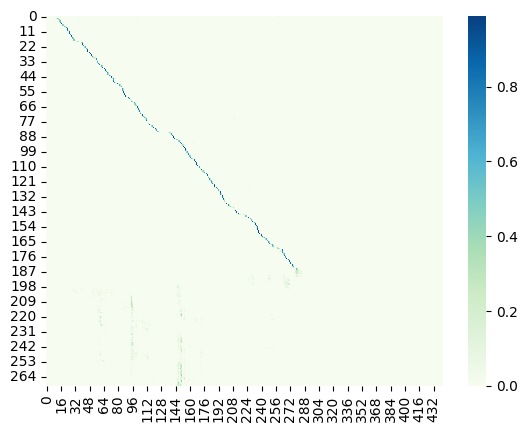

Saved best model

Epoch: 40/80


Val:   3%|▎         | 1/33 [00:02<01:32,  2.89s/it, dist=8.3933]

Ground Truth :  IT WAS ON ONE OF THESE GRAVEL BEDS THAT I MET MY ADVENTURE
Prediction   :  IT WAS ON ONE OF THESE GRAVEL BEDS THAT I MET MY ADVENTURE


Val:   6%|▌         | 2/33 [00:05<01:19,  2.56s/it, dist=8.4733]

Ground Truth :  WHAT EXTRAORDINARY THINGS WILL SOMETIMES OCCUR FROM MERE CHANCE OR FROM THE FORCE OF CIRCUMSTANCES
Prediction   :  WHAT EXTRAORDINARY THINGS WILL SOMETIMES OCCUR FROM MERE CHANCE OR FROM THE FORCE OF CIRCUMSTANCES


Val:   9%|▉         | 3/33 [00:07<01:12,  2.43s/it, dist=8.2133]

Ground Truth :  ILLUSTRATION THE CUCUMBER
Prediction   :  ILLUSTRATION THE CUCUMBER


Val:  12%|█▏        | 4/33 [00:09<01:10,  2.43s/it, dist=8.6567]

Ground Truth :  THIS DREAD LED HIM TO MAKE THE REMARK THAT STEVIE HAD DISREGARDED HIS SUGGESTION TO GO TO BED
Prediction   :  THIS DREAD LET HIM TO MAKE THE REMARK THAT STEAVY HAD DISREGARDED TO SUGGOTTEN TO SUGGESTION TO GO TO THAT


Val:  15%|█▌        | 5/33 [00:12<01:09,  2.50s/it, dist=9.6720]

Ground Truth :  NOW HELICON MUST NEEDS POUR FORTH FOR ME AND WITH HER CHOIR URANIA MUST ASSIST ME TO PUT IN VERSE THINGS DIFFICULT TO THINK
Prediction   :  NOW HELEN MUST NEEDS POOR FOURTH FOR ME AND WITH HER QUIET AROUNDIA MUST ASSIST ME TO PUT IN VIRS THINGS DIFFICULT TO THINK


Val:  18%|█▊        | 6/33 [00:14<01:05,  2.42s/it, dist=9.1478]

Ground Truth :  IT WAS THE SEASON WHEN THE ANCIENT SUN GOD HAD BEEN ACCUSTOMED TO RECEIVE HIS ANNUAL OBLATIONS AND WE CAN WELL BELIEVE THAT THOSE WHOSE HEARTS STILL TREMBLED AT THE NAME OF BEL MUST HAVE CONNECTED THE ECLIPSE AND THE PLAGUE WITH THE REVOLUTION IN THE NATIONAL WORSHIP AND THE OVERTHROW OF THE ANCIENT GODS ON THAT PLAIN OF PROSTRATION WHERE THEY HAD SO LONG RECEIVED THE HOMAGE OF AN ENTIRE PEOPLE
Prediction   :  IT WAS THE SEASON WHEN THE ANCIENT SUNGOT HAD BEEN ACCUSTOMED TO RECEIVE HIS ANGULA OBLATIONS AND WE CAN WELL BELIEVE THAT THOSE WHOSE HEART STILL TREMBLED AT THE NAME OF BELL MUST HAVE CONNECTED THE ECLIPSE AND THE PLAGUE WITH THE REVOLUTION IN THE NATIONAL WORSHIP AND THE OVERTHREW OF THE ANCIENT GODS ON THAT PLAIN OF PROSTRATION WHERE THEY HAD SO LONG RECEIVED THE HOMAGE OF AN ENTIRE PEOPLE


Val:  21%|██        | 7/33 [00:17<01:02,  2.40s/it, dist=9.1286]

Ground Truth :  BEFORE THIS CALAMITY CAME UPON US YOU COULD NOT FIND ANYWHERE A HAPPIER HOME THAN THAT CREATED BY THE INDIAN WOMAN
Prediction   :  BEFORE THE SCHOOL MAY CAME UPON US SHE COULD NOT FIND ANYWHERE HAPPY HER HOME THAN THEN CREATED BY THE ININWOMAN


Val:  24%|██▍       | 8/33 [00:19<00:59,  2.37s/it, dist=9.0058]

Ground Truth :  VERY LIKELY I MAY FIND THERE SOME MANUSCRIPTS FROM THE HAND OF SAKNUSSEMM
Prediction   :  VERY LIKELY I MAY FIND THERE'S A MANUSCRIPTS FROM THE HAND OF SUCH NEWSSIM


Val:  27%|██▋       | 9/33 [00:21<00:55,  2.33s/it, dist=8.8519]

Ground Truth :  AT THE CORNER OF MARKET AND EDDY STREETS IS THE ODEON DOWN IN A BASEMENT WITH DECORATIONS OF MOST GARISH ORDER
Prediction   :  AFTER COLOR OF MARKET AND EDISTREATS IS THE OLDIEN DOWN IN A BASEMENT WITH DECORATIONS OF MOST GARRISH ORDER


Val:  30%|███       | 10/33 [00:24<00:54,  2.36s/it, dist=9.0500]

Ground Truth :  SHOW MISTER NORTH OUT HE SAID AND GO DOWN TO THE BARRACKS AND TELL TROKE THAT KIRKLAND IS TO HAVE A HUNDRED LASHES TO MORROW
Prediction   :  JOHN MUST DO NORTH OUT HE SAID AND GO DOWN TO THE BARRICS AND DON'T TROKE THE COOKLIN IS TO HAVE ALL HUNDRED LASHES TO MORROW


Val:  33%|███▎      | 11/33 [00:26<00:53,  2.41s/it, dist=9.0588]

Ground Truth :  WHAT ARE YOU DOING HERE HE ASKED
Prediction   :  WHAT ARE YOU DOING CARE HE ASKED


Val:  36%|███▋      | 12/33 [00:29<00:50,  2.40s/it, dist=9.2000]

Ground Truth :  AND THE NEW BLOOD AT THE ERA OF THIS STORY WAS AT HAND
Prediction   :  AND THE NEW BLOOD AT THE ERRA OF THE STORY WAS AT HAND


Val:  39%|███▉      | 13/33 [00:31<00:47,  2.39s/it, dist=9.4379]

Ground Truth :  NOW IT WAS BURNED AWAY AT BOTH SIDES AND LAY STILL HOT ALONG THE EDGES ON THE FLOOR OF THE BIG OFFICE ROOM IN FRONT
Prediction   :  NOW WHICH WAS BURNED AWAY AT BOLD SIDES AND LAY STILL HOT ALONG THE EDGES ON THE FLOOR OF THE BIG OFFICE ROOM IN FRONT


Val:  42%|████▏     | 14/33 [00:34<00:46,  2.45s/it, dist=9.5833]

Ground Truth :  NOTHING CAN PART US ANY MORE NOT EVEN DEATH FOR LOVE LIKE OURS WILL LAST FOR EVER
Prediction   :  NOTHING CAME PARTIS ANY MORE NOT EVEN DEATH FOR LOVE LIKE EYES WILL LAST FOREVER


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.43s/it, dist=9.8684]

Ground Truth :  STABLES AND OTHER OFFICES OCCUPIED ANOTHER SIDE OF THE SQUARE
Prediction   :  STABLES ANOTHER OCCASIONS OCCUPIED ANOTHER SIDE OF THE SQUARE


Val:  48%|████▊     | 16/33 [00:38<00:41,  2.42s/it, dist=9.7608]

Ground Truth :  THIS OPENING LOOKED FOR ALL THE WORLD LIKE A MOUTH OF HELL IN THE WORDS OF THE ITINERANT PURITAN PREACHERS WHO TURNED AWAY FROM IT WITH HORROR
Prediction   :  THIS OPENING LOOKED FOR ALL THE WORLD LIKE A MOUTH OF HILL IN THE WORDS OF THE ICENER AND PURITAN PREACHERS WHO TURNED AWAY FROM IT WITH HORROR


Val:  52%|█████▏    | 17/33 [00:41<00:38,  2.40s/it, dist=9.9204]

Ground Truth :  I'M GLAD SHE'S HELD HER OWN SINCE
Prediction   :  I'M GLAD SHE'S HELD HER OWN SENSE


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.38s/it, dist=9.9648]

Ground Truth :  HE ROSE AND CROSSED THE ROOM QUICKLY
Prediction   :  HE ROSE AND COST THE ROOM WHICH LEAR


Val:  58%|█████▊    | 19/33 [00:45<00:32,  2.35s/it, dist=9.9635]

Ground Truth :  IN ARISTOCRATIC COUNTRIES THE GREAT POSSESS IMMENSE PRIVILEGES UPON WHICH THEIR PRIDE RESTS WITHOUT SEEKING TO RELY UPON THE LESSER ADVANTAGES WHICH ACCRUE TO THEM
Prediction   :  IN ERISTOCRATIC COUNTRIES THE GREAT POSSESS IMMENSE PRIVILEGES UPON WHICH THEIR PRIDE RESTS WITHOUT SEEKING TO RELIEUP ON THE LESSORED VONGES WHICH ACCRUES OF HIM


Val:  61%|██████    | 20/33 [00:48<00:31,  2.43s/it, dist=10.0703]

Ground Truth :  BUT HERE THE ONLY THING THAT OCCURRED TO HER WAS TO STOP AND LOOK IN ONE OF THE SHOPS TILL HE SHOULD ASK HER WHAT SHE WAS LOOKING AT
Prediction   :  BUT HERE THE ONLY THING THAT OCCURRED TO HER WAS TO STOP AND LOOK IN ONE OF THE SHOPS TILL HE SHOULD ASK HER WHAT SHE WAS LOOKING AT


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.36s/it, dist=9.9022]

Ground Truth :  IT WAS ESTABLISHED AT SOUTHWARK
Prediction   :  IT WAS ESTABLISHED ITSELF WORK


Val:  67%|██████▋   | 22/33 [00:52<00:25,  2.34s/it, dist=9.8852]

Ground Truth :  THE DELAWARE DOG HE SAID LEANING FORWARD AND PEERING THROUGH THE DIM LIGHT TO CATCH THE EXPRESSION OF THE OTHER'S FEATURES IS HE AFRAID
Prediction   :  THE DELAWARE DOG HE SAID LEANING FORWARD AND PEERING THROUGH THE DIM LIGHT TO CATCH THE EXPRESSION OF THE OTHERS FEATURES IS HE AFRAID


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.33s/it, dist=9.7736]

Ground Truth :  THEY BELIEVED THAT THROUGH ME THEY POSSESSED THE PHILOSOPHER'S STONE THE UNIVERSAL PANACEA THE INTERCOURSE WITH ALL THE ELEMENTARY HEAVENLY AND INFERNAL SPIRITS THEY HAD NO DOUBT WHATEVER THAT THANKS TO MY SUBLIME SCIENCE THEY COULD FIND OUT THE SECRETS OF EVERY GOVERNMENT IN EUROPE
Prediction   :  THEY BELIEVED THAT THROUGH ME THEY POSSESSED THE PHILOSOPHER STONE THE UNDER COURSE WITH ALL THE ELEMENTARY HEAVENLY AND INFERNAL SPIRITS AND THEY HAD NO DOUBT WHATEVER THAT THINKS TO MY SUBLIME SCIENCE THEY COULD FIND OUT THE SECRETS OF EVERY GOVERNMENT IN EUROPE


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.36s/it, dist=9.8878]

Ground Truth :  MARTHA REMEMBERED THE CLOSED DOOR ON THE FIRST SURVEY THEY HADN'T ATTEMPTED OPENING IT
Prediction   :  MARTHA REMEMBERED THE CLOTHES DOOR ON THE FIRST SURVEY THEY HADN'T ATTEMPTED OPENING IT


Val:  76%|███████▌  | 25/33 [00:59<00:18,  2.29s/it, dist=9.8085]

Ground Truth :  IN MARY IT SEEMS TO ME I FOUND BOTH WOMANHOOD AND FELLOWSHIP I FOUND WHAT MANY HAVE DREAMT OF LOVE AND FRIENDSHIP FREELY GIVEN AND I COULD DO NOTHING BUT CLUTCH AT HER TO MAKE HER MY POSSESSION
Prediction   :  IN MARY IT SEEMS TO ME I FOUND BOTH WOMANHOOD AND FELLOWSHIP I FOUND WHAT MANY HAVE DRUMPED OFF LOVE AND FRIENDSHIP FREELY GIVEN AND I COULD DO NOTHING BUT CLUTCH UP HER TO MAKE HER MY POSSESSION


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.30s/it, dist=9.7100]

Ground Truth :  EACH MUST CRY LOUDER AND WANDER FARTHER YET MAY LUCK BE WITH THEM BOTH THAT THEY MAY FIND THEIR OWN AT NIGHTFALL
Prediction   :  EACH MOST CALLOUDER AND WANDERFATHER YET MAY LOOK BEWITH THEM BOTH THAT THEY MAY FIND THEIR OWN AT NIGHTFALL


Val:  82%|████████▏ | 27/33 [01:04<00:13,  2.28s/it, dist=9.6388]

Ground Truth :  BUT WITH FULL RAVISHMENT THE HOURS OF PRIME SINGING RECEIVED THEY IN THE MIDST OF LEAVES THAT EVER BORE A BURDEN TO THEIR RHYMES
Prediction   :  BUT WITH FULL RAVISHMENT THE HOURS OF PRIME SINGING RECEIVED THEY IN THE MIDST OF LEAVES THAT EVER BORE A BURDEN TO THEIR RINES


Val:  85%|████████▍ | 28/33 [01:06<00:11,  2.33s/it, dist=9.6443]

Ground Truth :  THE REVELATION OF HIS LOVE LIGHTED AND BRIGHTENED SLOWLY TILL IT FLAMED LIKE A SUNRISE OVER HIM AND LEFT HIM IN BURNING WONDER
Prediction   :  THE REVELATION OF HIS LAW OF LIGHTED AND RIGHT AND SLOWLY TO LIT FLAMED LIKE A SUNRISE OVER HIM AND LEFT HIM IN BURNING WONDER


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.41s/it, dist=9.7306]

Ground Truth :  KNOWING THAT GOD SETS NO VALUE UPON MATERIAL THINGS HE TOOK WITH HIM NO OFFERINGS OR SACRIFICES OTHER THAN SYMBOLIC OBJECTS SUCH AS PAINTS AND TOBACCO
Prediction   :  KNOWING THEY GOD SAID SNOW VALUE UPON MATERIAL THINGS HE TOOK WITH A NO OFFERINGS OF SHACRIFICE AS OTHER THAN SIMOLOCODICS SUCH AS PAINTS AND TEMBARKA


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.41s/it, dist=9.8056]

Ground Truth :  I THOROUGHLY UNDERSTOOD AND APPRECIATED THE NECESSITY FOR WAITING BEFORE CROSSING THE FJORD FOR THAT MOMENT WHEN THE SEA AT ITS HIGHEST POINT IS IN A STATE OF SLACK WATER
Prediction   :  I THOROUGHLY UNDERSTOOD AN APPRECIATED THE NECESSITY FOR WAITING BEFORE CROSSING THE FEWERED FOR THAT MOMENT WHEN THE SEA AT ATTISED FOINT IS IN A STATE OF SLICK WATER


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.41s/it, dist=9.8417]

Ground Truth :  WALK DOWN THE SLOPING FOOT PATH NOW AND BE CAREFUL TO KEEP OUT OF THE WAY OF THE LITTLE CARS THAT ARE COMING AND GOING ON EACH SIDE OF YOU LOADED ON ONE SIDE AND EMPTY ON THE OTHER AND SEEMING TO RUN UP AND DOWN BY THEMSELVES
Prediction   :  WALKED DOWN THE SLOPING FOOT PATH NOW AND BECARE FULL TO KEEP OUT OF THE WAY OF THE LITTLE CARS OF HER COMING AND GOING ON EACH SIDE OF YOU LOADED ON ONE SIDE IN EMPTY ON THE OTHER AND SEEMING TO RUN UP AND DOWN BY THEMSELVES


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.47s/it, dist=9.8842]

Ground Truth :  OTHER SWEET HERBS ARE CULTIVATED FOR PURPOSES OF MEDICINE AND PERFUMERY THEY ARE MOST GRATEFUL BOTH TO THE ORGANS OF TASTE AND SMELLING AND TO THE AROMA DERIVED FROM THEM IS DUE IN A GREAT MEASURE THE SWEET AND EXHILARATING FRAGRANCE OF OUR FLOWERY MEADS
Prediction   :  OTHER SWEET HERBS ARE CULTIVATED FOR PURPOSES OF MEDICINE AND PERFUMERY THEY ARE MOST GRATEFUL BOTH TO THE ORGANS OF TASTE AND SMELLING AND TO THE AROMAN DERIVED FROM THEM IS DUE IN THE GREAT MEASURE THE SWEET AND EXILLARATING FRAGRANCE OF OUR FLOWERY MEANS


Val: 100%|██████████| 33/33 [01:17<00:00,  2.06s/it, dist=9.8983]

Ground Truth :  THE COUNTLESS TREASURES WHICH FIVE CENTURIES OF RAPINE HAD ACCUMULATED ROUND THE CAPITOL HAD BECOME THE PREY OF MEN CLOTHED IN SHEEPSKINS AND HORSE HIDE AND THE SISTER OF AN EMPEROR HAD FOUND HER BEAUTY VIRTUE AND PRIDE OF RACE WORTHILY MATCHED BY THOSE OF THE HARD HANDED NORTHERN HERO WHO LED HER AWAY FROM ITALY AS HIS CAPTIVE AND HIS BRIDE TO FOUND NEW KINGDOMS IN SOUTH FRANCE AND SPAIN AND TO DRIVE THE NEWLY ARRIVED VANDALS ACROSS THE STRAITS OF GIBRALTAR INTO THE THEN BLOOMING COAST LAND OF NORTHERN AFRICA
Prediction   :  THE COUNTLESS TREASURES WHICH FIVE CENTURIES OF ROPING HAD ACCUMULATED AROUND THE CAPITAL HAD BECOME THE PRAY OF MEN CLOTHES IN SHEEPSKINS AND HORSEHIDE AND THE SISTER OF AN EMPEROR HAD FOUND HER BEAUTY VIRTUE AND PRIDE OF RACE WORTHILY MATCHED BY THOSE OF THE HEART HANDED NORTHERN HERO WHO LED HER AWAY FROM ITALY AS HIS CAPTIVE AND HIS BRIDE TO FOUND NEW KINGDOMS IN SO FRANCE AND HORSEHIDE AND THE SISTER OF AN EMPEROR HAD FOUND HER BEAUTY VIRTUE A

	Train Loss 0.2202	 Learning Rate 0.0006549
	Val Dist 9.8983	
	Teacher Forcing Ratio 1	


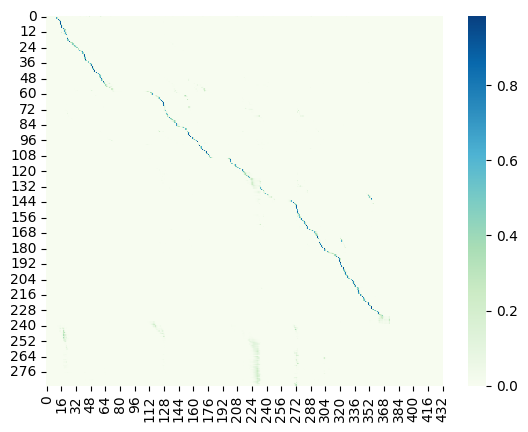


Epoch: 41/80


Val:   3%|▎         | 1/33 [00:02<01:35,  3.00s/it, dist=8.9067]

Ground Truth :  OH THAT SHE WERE ONCE MORE CLIMBING UP THE FRIENDLY FIR POLE
Prediction   :  OH THAT SHE WERE ONCE MORE CLIMBING UP THE FRIENDLY FUR POLE


Val:   6%|▌         | 2/33 [00:05<01:21,  2.63s/it, dist=8.7300]

Ground Truth :  BEWARE OF MAKING THAT MISTAKE
Prediction   :  BEWARE OF MAKING THAT MISTAKE


Val:   9%|▉         | 3/33 [00:07<01:15,  2.51s/it, dist=8.8978]

Ground Truth :  WHO WAS IT SHE WAS IN LOVE WITH THE STORY WILL TELL I TOOK UPON MYSELF TO REPLY OH I CAN'T WAIT FOR THE STORY THE STORY WON'T TELL SAID DOUGLAS NOT IN ANY LITERAL VULGAR WAY MORE'S THE PITY THEN
Prediction   :  WHOM WAS IT SHE WAS IN LOVE WITH THE STORY WILL TELL I TOOK UPON MYSELF TO REPLY OH I CONTRACT FOR THE STORY THE STORY WON'T TELL SAID DUDLESS NOT AN ANY LITTLE VULGAR WAY MORE AS THE PITY THEN


Val:  12%|█▏        | 4/33 [00:10<01:13,  2.55s/it, dist=8.7267]

Ground Truth :  IT WENT ON TO SAY THAT THE TWO MEN WHO HAD CARRIED HER OFF HAD TAKEN HER TO SUCH A PLACE WHERE THEY HAD AN HOUR LATER BEEN MET BY THE OTHER SIX AND THAT THEY HAD ALL REPAIRED TO THE TWO SWORDS WHERE THEY HAD SPENT AN HOUR IN DRINKING
Prediction   :  AND WHAT ON TO SAY THAT THE TWO MAN WHO HAD CARRIED HER OFF HAD TAKEN HER TO SUCH A PLACE WHERE THEY HAD AND OUR LATER BEEN MET BY THE OTHER SIX AND THAT THEY HAD ALREADY PARED TO THE TWO SWORDS WHERE THEY HAD SPENT AN HOUR AND DRINKING


Val:  15%|█▌        | 5/33 [00:12<01:10,  2.53s/it, dist=8.7387]

Ground Truth :  NO ONE WHO IS HIMSELF HONEST WILL DOUBT MY BEING SO
Prediction   :  NO ONE WHO IS HIMSELF HONEST WILL DOUBT MY BEING SO


Val:  18%|█▊        | 6/33 [00:15<01:07,  2.48s/it, dist=8.6522]

Ground Truth :  I NOTICED HOW WHITE AND WELL SHAPED HIS OWN HANDS WERE
Prediction   :  I NOTICED HOW WHITE AND WELL SHAPED HIS OWN HANDS WHERE


Val:  21%|██        | 7/33 [00:17<01:03,  2.46s/it, dist=8.6819]

Ground Truth :  THE OTHERS RESENTED POSTPONEMENT BUT IT WAS JUST HIS SCRUPLES THAT CHARMED ME
Prediction   :  THE OTHERS RESENTED PUSPONMENT BUT IT WAS JUST HIS SCRUPLES THE CHARMED ME


Val:  24%|██▍       | 8/33 [00:20<01:01,  2.46s/it, dist=8.9367]

Ground Truth :  IN ARISTOCRACIES EVERY MAN HAS ONE SOLE OBJECT WHICH HE UNCEASINGLY PURSUES BUT AMONGST DEMOCRATIC NATIONS THE EXISTENCE OF MAN IS MORE COMPLEX THE SAME MIND WILL ALMOST ALWAYS EMBRACE SEVERAL OBJECTS AT THE SAME TIME AND THESE OBJECTS ARE FREQUENTLY WHOLLY FOREIGN TO EACH OTHER AS IT CANNOT KNOW THEM ALL WELL THE MIND IS READILY SATISFIED WITH IMPERFECT NOTIONS OF EACH
Prediction   :  IN ARISTOCRACIES EVERY MAN AS ONE SOLE OBJECT WHICH HE UNCEASINGLY PURSUES BUT AMONGST THEM ACROSS IT NATIONS THE EXISTENCE OF MAN IS MORE COMPLICTS THE SAME MIND WILL ALMOST ALWAYS EMBRACE SEVERAL OBJECTS AT THE SAME TIME AND THESE OPPORTS ARE FREQUENTLY HONEY FOREIGN TO EACH OTHER AS IT CANNOT KNOW THEM ALL WELL THE MIND IS READILY SET AS FIVE WITH IMPERFECT NOTIONS OF EACH


Val:  27%|██▋       | 9/33 [00:22<00:58,  2.44s/it, dist=8.7222]

Ground Truth :  TEN SECONDS
Prediction   :  THEN SECONDS


Val:  30%|███       | 10/33 [00:24<00:55,  2.41s/it, dist=8.5527]

Ground Truth :  SHE WANTED TO MAKE SOME REFERENCE TO THEIR RELATIONS UPON THE TRAIN BUT WAS TOO TIMID
Prediction   :  SHE WANTED TO MAKE SOME REFERENCE TO THEIR RELATIONS UPON THE TRAIN BUT WAS TOO TIMID


Val:  33%|███▎      | 11/33 [00:27<00:52,  2.37s/it, dist=8.3636]

Ground Truth :  HE DECIDED TO WRITE HER CARE OF THE WEST SIDE POST OFFICE AND ASK FOR AN EXPLANATION AS WELL AS TO HAVE HER MEET HIM
Prediction   :  HE DECIDED TO WRITE HER CARE OF THE WEST SIDE POST OFFICE AND ASKED FOR AN EXPLANATION AS WELL AS TO HAVE HER MEET HIM


Val:  36%|███▋      | 12/33 [00:29<00:50,  2.42s/it, dist=8.5956]

Ground Truth :  FROM THAT HOUR DATED ONE OF THE MOST SANGUINARY FEUDS IN THE HISTORY OF THE GREAT TRADING COMPANY A FEUD WHICH AS WE SHALL SEE WAS DESTINED TO LIVE EVEN UNTO THE SECOND GENERATION
Prediction   :  FROM THE HOUR AT BATED ONE OF THE MOST SANGUINARY FUTURE IN THE HISTORY OF THE GREAT TRADING COMPANY AFFEID WHICH AS WE SHALL SEE WAS DESTINED TO LIVE EVEN UNTO THE SECOND GENERATION


Val:  39%|███▉      | 13/33 [00:31<00:47,  2.39s/it, dist=8.5318]

Ground Truth :  A BED QUILT MADE OF PATCHES OF DIFFERENT KINDS AND COLORS OF CLOTH ALL NEATLY SEWED TOGETHER
Prediction   :  A BED QUILT MADE OF PATCHES OF DIFFERENT KINDS AND COLOURS OF CLOTH ALL NEATLY SO TOGETHER


Val:  42%|████▏     | 14/33 [00:34<00:45,  2.41s/it, dist=8.5767]

Ground Truth :  GEORGE NODDED
Prediction   :  GEORGE NODDED


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.41s/it, dist=8.5213]

Ground Truth :  HE DOESN'T WORK AT ALL
Prediction   :  HE DOESN'T WORK IT ALL


Val:  48%|████▊     | 16/33 [00:39<00:41,  2.42s/it, dist=8.4192]

Ground Truth :  I KNOW NOW WHAT BRINGS ME TO THE PYRE
Prediction   :  I KNOW NOW WOULD BRINGS ME TO THE PIRA


Val:  52%|█████▏    | 17/33 [00:41<00:37,  2.37s/it, dist=8.5149]

Ground Truth :  KIRKLAND GHASTLY PALE BLEEDING WITH HIS WOOLLEN SHIRT TORN AND HIS BLUE EYES WIDE OPEN WITH TERROR WAS CLINGING TO THE BARS
Prediction   :  COULD GASLY PALE BLEEDING WITH THIS WILLING SHIRT TORN AND HIS BLUE EYES WIDE OPEN WITH TERROR WAS CLINGING TO THE BARS


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.39s/it, dist=8.5719]

Ground Truth :  EVEN ON THIS LEDGE OF HUMAN SOCIETY THERE WAS A STUNTED GROWTH OF SHOPLETS WHICH HAD TAKEN ROOT AND VEGETATED SOMEHOW THOUGH AS IN AN AIR MERCANTILE OF THE BLEAKEST
Prediction   :  EVEN ON THIS LEG OF HUMAN SOCIETY THERE WAS A STUNTED GROWTH OF SHOPLETS WHICH HAD TAKEN ROOT AND VEGETATED SOMEHOW THOUGH AS IN AN AIR OF MERCANTILE OF THE BLEAKEST


Val:  58%|█████▊    | 19/33 [00:46<00:32,  2.35s/it, dist=8.4498]

Ground Truth :  WHEN HE MOUNTED HIS HORSE AT THE DOOR I SAW THAT HE HAD A HATCHET SLUNG TO HIS BELT AND HE GAVE GRANDMOTHER A MEANING LOOK WHICH TOLD ME HE WAS PLANNING A SURPRISE FOR ME
Prediction   :  WHEN HE MOUNTED HIS HORSE AT THE DOOR I SAW THAT HE HAD A HATCHET SOME TO HIS BELT AND HE GAVE GRANDMOTHER A MEANING LOOK WHICH TOLD ME HE WAS PLANNING A SURPRISE FOR ME


Val:  61%|██████    | 20/33 [00:48<00:31,  2.43s/it, dist=8.4697]

Ground Truth :  I HAVE ONE GREAT PRIVILEGE
Prediction   :  I HAVE ONE GREAT PRIVILEGE


Val:  64%|██████▎   | 21/33 [00:51<00:28,  2.39s/it, dist=8.5295]

Ground Truth :  THE FAT THEY ARE FRIED IN SHOULD BE CLEAR AND THE CRUMBS SHOULD NOT HAVE THE SLIGHTEST APPEARANCE OR TASTE OF HAVING BEEN IN THE LEAST DEGREE BURNT
Prediction   :  THE FAT THEY ARE FRIEND AND SHOULD BE CLEAR AND THE CRUMBS SHOULD NOT HAVE THE SLIGHTEST APPEARANCE OR TASTE OF HAVING BEEN IN THE LEAST AGREEMENT BURNT


Val:  67%|██████▋   | 22/33 [00:53<00:25,  2.36s/it, dist=8.5379]

Ground Truth :  AN IMPULSIVE GENTLEMAN SAID MEEKIN TO MACKLEWAIN AS THE SOUND OF MISTER NORTH'S FOOTSTEPS DIED AWAY IN THE DISTANCE
Prediction   :  AN IMPULSE OF GENTLEMAN SAID MEAKING TO MACKILL WINE AS A SOUND OF MISTER NORTH'S FOOTSTEPS DIED AWAY IN THE DISTANCE


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.35s/it, dist=8.4843]

Ground Truth :  MISTER SWIFT CAME INTO THE LIVING ROOM JUST THEN AND TOLD TOM HOW WORRIED MISSUS SWIFT AND SANDY HAD BEEN
Prediction   :  MISTER SWIFT CAME INTO THE LIVING ROOM JUST THEN AND TOLD TOM HOW WORRIED MISSUS SWIFT AND SANDY HAD BEEN


Val:  73%|███████▎  | 24/33 [00:58<00:21,  2.36s/it, dist=8.4408]

Ground Truth :  JOHN YOU HAVE PROMISED MARY WHAT I PROMISED LADY HELENA WHAT IS YOUR PLAN
Prediction   :  JARN YOU HAVE PROMISED MARY WHAT I PROMISED LADY HELENA WHAT IS YOUR PLAN


Val:  76%|███████▌  | 25/33 [01:00<00:19,  2.38s/it, dist=8.3571]

Ground Truth :  DO THEY STILL INSIST THAT MISS CHALLONER WAS THE ONLY PERSON IN THE ROOM WITH THEM AT THIS TIME
Prediction   :  DO THEY STILL INSIST THAT MISS CHILLINOR WAS THE ONLY PERSON IN THE ROOM WITH THEM AT THIS TIME


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.38s/it, dist=8.3159]

Ground Truth :  FROM THE UNDER SURFACE OF THE CLOUDS THERE ARE CONTINUAL EMISSIONS OF LURID LIGHT ELECTRIC MATTER IS IN CONTINUAL EVOLUTION FROM THEIR COMPONENT MOLECULES THE GASEOUS ELEMENTS OF THE AIR NEED TO BE SLAKED WITH MOISTURE FOR INNUMERABLE COLUMNS OF WATER RUSH UPWARDS INTO THE AIR AND FALL BACK AGAIN IN WHITE FOAM
Prediction   :  FROM THE UNDERSURFACE OF THE CLOUDS THEIR CONTINUAL ADMISSIONS OF LURID LIGHT THE LETTERED MATTER IS IN CONTINUAL EVOLUTION FROM THEIR COMPONENT MILE ACCULATES THE GASHES ELEMENTS OF THE AIR NEED TO BE SLAKED WITH MOISTER FOR INNUMERABLE COLUMNS OF WATER RUSH UPWARDS INTO THE AIR AND FALL BACK AGAIN IN WHITE FOLLOW


Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.43s/it, dist=8.4644]

Ground Truth :  THERE WERE PLENTY OF PEOPLE TO HELP BUT OF COURSE THE YOUNG LADY WHO SHOULD GO DOWN AS GOVERNESS WOULD BE IN SUPREME AUTHORITY
Prediction   :  THEY WERE PLENTY OF PEOPLE TO HELP BUT OF COURSE THE YOUNG LADY WHO SHOULD GO DOWN AS GOVERNESS WOULD BE IN SUPREME AUTHORITY


Val:  85%|████████▍ | 28/33 [01:07<00:12,  2.43s/it, dist=8.3974]

Ground Truth :  SHORTLY AFTER PASSING ONE OF THESE CHAPELS WE CAME SUDDENLY UPON A VILLAGE WHICH STARTED UP OUT OF THE MIST AND I WAS ALARMED LEST I SHOULD BE MADE AN OBJECT OF CURIOSITY OR DISLIKE
Prediction   :  SHORTLY AFTER PASSING ONE OF THESE CHAPELS WE CAME SUDDENLY UPON A BILL INTO ITS STARTED UP OUT OF THE MIST AND I WAS ALARMED LESS I SHOULD BE MADE AN OBJECT OF CURIOSITY OR DISLIKE


Val:  88%|████████▊ | 29/33 [01:10<00:09,  2.40s/it, dist=8.5032]

Ground Truth :  THERE BE THE DOOR IN FRONT OF YOU YOU GO UP THREE STEPS IF YOU CAN FIND EM
Prediction   :  THERE BE THE DOOR AND FRONT OF YOU YOU GO UP THREE STEPS IF YOU CAN FIND HIM


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.34s/it, dist=8.4207]

Ground Truth :  DO YOU THINK I'M NOT SORRY NOW
Prediction   :  DO YOU THINK I'M NOT SORRY NOW


Val:  94%|█████████▍| 31/33 [01:15<00:04,  2.42s/it, dist=8.4813]

Ground Truth :  AT LENGTH THE STURDY LITTLE PONY SPREADING OUT HIS LEGS IN A STIFF AND LUDICROUS ATTITUDE GOT FROM UNDER THE PROFESSOR'S LEGS AND LEFT HIM STANDING WITH BOTH FEET ON A SEPARATE STONE LIKE THE COLOSSUS OF RHODES
Prediction   :  AT LENGTH THE STIRTY LITTLE PONY SPREADING ON HIS LEGS IN A STIFF IN A LITTLE CRESATITUDE GOT FROM UNDER THE PROFESSOR'S LEGS AND LEFT HIM STANDING WITH BOTH FEET ON A SEPARATE STONE LIKE THE COLOSSAS OF ROADS


Val:  97%|█████████▋| 32/33 [01:17<00:02,  2.38s/it, dist=8.4810]

Ground Truth :  DO NOT SUPPOSE HOWEVER THAT MISSUS POYSER WAS ELDERLY OR SHREWISH IN HER APPEARANCE SHE WAS A GOOD LOOKING WOMAN NOT MORE THAN EIGHT AND THIRTY OF FAIR COMPLEXION AND SANDY HAIR WELL SHAPEN LIGHT FOOTED
Prediction   :  DO NOT SUPPOSE HOWEVER THAT MISSUS POYSER WAS ELDERLY OR SHRUWISH AND HER APPEARANCE SHE WAS A GOOD LOOKING WOMAN NOT MORE THAN EIGHT AND THIRTY OF FEAR COMPLEXION AND SANDY HAIR WELL SHAPEN LIGHT FOOTED


Ground Truth :  IT IS A NATIVE OF PORTUGAL AND WHEN ITS LEAVES ARE USED AS A SEASONING HERB THEY HAVE AN AGREEABLE AROMATIC FLAVOUR
Prediction   :  IT IS A NATIVE OF PORTUGAL AND WHEN IT'S LEAVES TO USED AS A SEASONING ERVE THEY HAVE AN AGREEABLE ARROW MATTER PLAVER
	Train Loss 0.1776	 Learning Rate 0.0006334
	Val Dist 8.4021	
	Teacher Forcing Ratio 1	


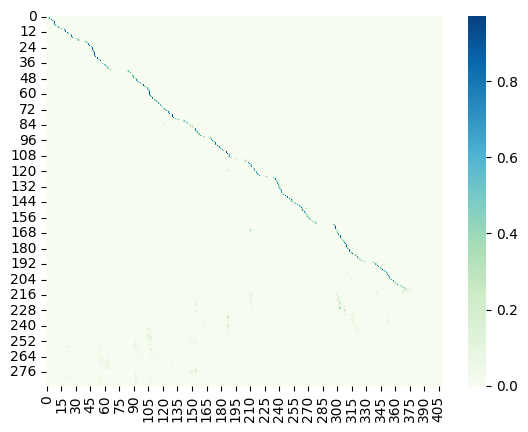

Saved best model

Epoch: 42/80


Val:   3%|▎         | 1/33 [00:02<01:30,  2.82s/it, dist=7.4067]

Ground Truth :  AND IT IS UPON THIS EFFECT OF SWEET AND BEAUTIFUL POSSIBILITIES CAUGHT IN THE NET OF ANIMAL JEALOUSIES AND THOUGHTLESS MOTIVES AND ANCIENT RIGID INSTITUTIONS THAT I WOULD END THIS WRITING
Prediction   :  AND IT IS UPON THIS EFFECT OF SWEET AND BEAUTIFUL POSSIBILITIES COCKED IN THE NET OF ANIMAL JALICIES AND THOUGHTLESS MOTIVES AND ANCIENT RICHED INSTITUTIONS THAT I WOULD END THIS RIDING


Val:   6%|▌         | 2/33 [00:05<01:19,  2.56s/it, dist=6.7733]

Ground Truth :  SUFFICIENT FOR A MODERATE SIZED HADDOCK OR PIKE
Prediction   :  BUT SUFFICIENT FOR A MODERATE SIZED HADIC OR PIKE


Val:   9%|▉         | 3/33 [00:07<01:15,  2.52s/it, dist=6.9222]

Ground Truth :  ANOTHER ENGINEER RUSHED TOWARD THE DOOR TO SEE WHAT WAS HAPPENING OUTSIDE
Prediction   :  ANOTHER RENGINEER RUSHED TOWARD THE DOOR TO SEE WHAT WAS HAPPENING OUTSIDE


Val:  12%|█▏        | 4/33 [00:10<01:12,  2.50s/it, dist=7.4483]

Ground Truth :  ILLUSTRATION BASIL
Prediction   :  ILLUSTRATION BAZZLE


Val:  15%|█▌        | 5/33 [00:12<01:10,  2.52s/it, dist=7.1560]

Ground Truth :  HERE SHE WAS TEACHING DIRTY CHILDREN AND THE SMELL OF CONFUSED ODORS AND BODILY PERSPIRATION WAS TO HER AT TIMES UNBEARABLE
Prediction   :  HERE SHE WAS TEACHING DIRTY CHILDREN AND THE SMELL OF CONFUSED ODORS AND BODILY PERSPIRATION WAS TO HER AT TIMES UNBEARABLE


Val:  18%|█▊        | 6/33 [00:15<01:07,  2.50s/it, dist=7.1400]

Ground Truth :  THREE DAYS LATER MINNETAKI BECAME NEWSOME'S WIFE AT THE HUDSON BAY POST
Prediction   :  THREE DAYS LATER MINITALKY BECAME NEWS WHOSE WIFE AT THE HUDSON BAY POST


Val:  21%|██        | 7/33 [00:17<01:05,  2.51s/it, dist=6.9848]

Ground Truth :  BRAVELY AND GENEROUSLY HAS HE BATTLED IN MY BEHALF AND THIS AND MORE WILL I DARE IN HIS SERVICE
Prediction   :  BRAVELY IN GENEROUSLY AS HE BATTLED IN MY BEHALF AND THIS AND MORE WILL I DARE IN HIS SERVICE


Val:  24%|██▍       | 8/33 [00:20<01:01,  2.46s/it, dist=7.0300]

Ground Truth :  YOU HAVE NEVER DISOBEYED ME OBEY MY LAST COMMAND
Prediction   :  YOU HAVE NEVER DISOBEYED ME OH BAY MY LAST COMMAND


Val:  27%|██▋       | 9/33 [00:22<00:57,  2.39s/it, dist=7.0800]

Ground Truth :  WHO MAY CONDEMN HIS SUPERSTITION
Prediction   :  WHO MAKE HIM DOWN HIS SUPERSTITION


Val:  30%|███       | 10/33 [00:24<00:53,  2.31s/it, dist=7.0307]

Ground Truth :  WE LOOKED ALL AROUND AND THOUGHT THAT THE COAST WAS CLEAR
Prediction   :  WE LOOKED ALL AROUND AND THOUGHT THAT THE COAST WAS CLEAR


Val:  33%|███▎      | 11/33 [00:26<00:52,  2.37s/it, dist=7.1861]

Ground Truth :  SHE OPENED THE DOOR SOFTLY THERE SAT MISSUS WILSON IN THE OLD ROCKING CHAIR WITH ONE SICK DEATH LIKE BOY LYING ON HER KNEE CRYING WITHOUT LET OR PAUSE BUT SOFTLY GENTLY AS FEARING TO DISTURB THE TROUBLED GASPING CHILD WHILE BEHIND HER OLD ALICE LET HER FAST DROPPING TEARS FALL DOWN ON THE DEAD BODY OF THE OTHER TWIN WHICH SHE WAS LAYING OUT ON A BOARD PLACED ON A SORT OF SOFA SETTEE IN A CORNER OF THE ROOM
Prediction   :  SHE OPENED THE DOOR SOFTLY THERE SAT MISSUS WILSON IN THE OLD ROCKING CHAIR WITH ONE SICK DEATH LIKE BOY LYING ON HER KNEE CRYING WITHOUT LET OR PAUSE BUT SOFTLY GENTLY AS FEARING TO DISTURB THE TROUBLED GASPING CHILD WHILE BEHIND HER OLD ALICE LET HER FAST DROPPING TEARS FALL DOWN ON THE DEAD BODY OF THE OTHER TWIN WHICH HE WAS LAYING OUT ON A BOARD PLACED ON A SORT OF SOFACITY IN THE CORNER OF THE ROOM


Val:  36%|███▋      | 12/33 [00:29<00:50,  2.42s/it, dist=7.1783]

Ground Truth :  THE HEAD OF THE PATCHWORK GIRL WAS THE MOST CURIOUS PART OF HER
Prediction   :  THE HEAD OF THE PATCHWORK GIRL WAS THE MOST CURIOUS PART OF HER


Val:  39%|███▉      | 13/33 [00:31<00:48,  2.41s/it, dist=7.0841]

Ground Truth :  I DID NOT ASK I WAS BEYOND IT
Prediction   :  I DID NOT ASK I WAS BEYOND IT


Val:  42%|████▏     | 14/33 [00:33<00:44,  2.33s/it, dist=7.0143]

Ground Truth :  MISTER SWIFT CAME INTO THE LIVING ROOM JUST THEN AND TOLD TOM HOW WORRIED MISSUS SWIFT AND SANDY HAD BEEN
Prediction   :  MISTER SWIFT CAME INTO THE LIVING ROOM JUST THEN AND TOLD HOW WORRIED MISSUS SWIFT AND SANDY HAD BEEN


Val:  45%|████▌     | 15/33 [00:36<00:42,  2.36s/it, dist=7.0569]

Ground Truth :  HE LAMENTS MOST BITTERLY THE DIVORCE THAT HAS BEEN MADE BETWEEN DECORATIVE ART AND WHAT WE USUALLY CALL PICTURES MAKES THE CUSTOMARY APPEAL TO THE LAST JUDGMENT AND REMINDS US THAT IN THE GREAT DAYS OF ART MICHAEL ANGELO WAS THE FURNISHING UPHOLSTERER
Prediction   :  HE LAMENTS MOST BRITERLY THE DEVORSE THAT HAS BEEN MADE BETWEEN DECORATIVE ART AND WHAT WE USUALLY CALL PICTURES MAKES A CUSTOMARY APPEAL TO THE LAST JUDGMENT AND REMINDS US THAT IN THE GREAT DAYS OF ART MICHAEL ANCELO WAS THE FURNISHING UPON STIRRER


Val:  48%|████▊     | 16/33 [00:38<00:39,  2.34s/it, dist=7.0400]

Ground Truth :  MASS SUICIDE THAT'S WHAT IT WAS NOTICE WHAT'S IN THE CORNERS
Prediction   :  MASS SUICIDE THAT'S WHAT IT WAS NOTICE WHAT'S IN THE CORNERS


Val:  52%|█████▏    | 17/33 [00:40<00:36,  2.29s/it, dist=6.9533]

Ground Truth :  THE ELECTRIC LIGHT CAN SCARCELY PENETRATE THROUGH THE DENSE CURTAIN WHICH HAS DROPPED OVER THE THEATRE ON WHICH THE BATTLE OF THE ELEMENTS IS ABOUT TO BE WAGED
Prediction   :  THE ELECTRIC LIGHT CAN SCARCELY PENETRATE TO THE DANCE CURTAIN WHICH IS DROPPED OVER THE THEATRE ON WHICH THE BATTLE OF THE ELEMENTS IS ABOUT TO BE WAGED


Val:  55%|█████▍    | 18/33 [00:43<00:34,  2.27s/it, dist=7.0444]

Ground Truth :  ILLUSTRATION GINGER
Prediction   :  ILLUSTRATION GINGER


Val:  58%|█████▊    | 19/33 [00:45<00:33,  2.36s/it, dist=7.2133]

Ground Truth :  THE CAPTAINS SHOWED PLAINLY THE CONCERN THEY FELT THE REGENT'S LADY WAS DOWNCAST AND THE PILGRIMS DID NOT AT ALL ENJOY SEEING THEIR PROPERTY CONFISCATED
Prediction   :  THE CAPTAIN CHILD PLAINLY THE CONCERN THEY FELT THE REGIONS LADY WAS DOWN CAST AND THE PILGRIMS DID NOT AT ALL ENJOY SEEING THEIR PROPERTY CONFISCATED


Val:  61%|██████    | 20/33 [00:47<00:30,  2.33s/it, dist=7.1230]

Ground Truth :  MIGHT LEARN SOMETHING USEFUL DOWN THERE
Prediction   :  MIGHT LEARN SOMETHING USEFUL DOWN THERE


Val:  64%|██████▎   | 21/33 [00:50<00:27,  2.31s/it, dist=7.0686]

Ground Truth :  IF MISTER SOAMES SAW THEM THE GAME WAS UP
Prediction   :  IF MISTER SOME SAW THEM THE GAME WAS UP


Val:  67%|██████▋   | 22/33 [00:52<00:25,  2.34s/it, dist=7.1433]

Ground Truth :  UNDER SUCH CIRCUMSTANCES SHE WAS HARDLY LIKELY TO BE LIVELY HERSELF BUT HER NAME WAS MADGE AND IT WAS THE ACCIDENT OF HER CHRISTIAN NAME WHICH DECIDED ME TO GO
Prediction   :  UNDER SUCH CIRCUMSTANCES SHE WAS HARDLY LIKELY TO BE ALIVELY HERSELF BUT HER NAME WAS MADGE AND IT WAS THE ACCENT OF HER CHRISTIAN NAME WHICH DECIDED ME TO GO


Val:  70%|██████▉   | 23/33 [00:54<00:22,  2.30s/it, dist=7.0881]

Ground Truth :  HE WAS THAT CHILD'S STAY AND SHE WAS HIS PROP
Prediction   :  HE WAS THAT CHILD STAY AND SHE WAS HIS PROP


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.35s/it, dist=7.1144]

Ground Truth :  LONG PEPPER THIS IS THE PRODUCE OF A DIFFERENT PLANT FROM THAT WHICH PRODUCES THE BLACK IT CONSISTING OF THE HALF RIPE FLOWER HEADS OF WHAT NATURALISTS CALL PIPER LONGUM AND CHABA
Prediction   :  LONG PEPPER THIS IS THE PRODUCE OF A DIFFERENT PLANT FROM THAT WHICH PRODUCES THE BLACK IT CONSISTING OF THE HALF RIGHT FLOWER HEADS OF WHAT NATURALISTS CALLED PIPER LONG THEM AND CHABA


Val:  76%|███████▌  | 25/33 [00:59<00:19,  2.41s/it, dist=7.2272]

Ground Truth :  ONLY AS HE WAS FIVE AND FIFTY AND COSETTE EIGHT YEARS OF AGE ALL THAT MIGHT HAVE BEEN LOVE IN THE WHOLE COURSE OF HIS LIFE FLOWED TOGETHER INTO A SORT OF INEFFABLE LIGHT
Prediction   :  ONLY AS HE WAS FIVE AND FIFTY AND COSETTE EIGHT YEARS OF AGE ALL THAT MIGHT HAVE BEEN LOVED IN THE WHOLE COURSE OF HIS LIFE FLOWED TOGETHER INTO A SORT OF ENOUGH OF A LIGHT


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.43s/it, dist=7.3179]

Ground Truth :  YOU SEEM ANXIOUS MY UNCLE I SAID SEEING HIM CONTINUALLY WITH HIS GLASS TO HIS EYE ANXIOUS
Prediction   :  YOU SEEM ANXIOUS MY UNCLE I SAID SEEING HIM CONTINUALLY WITH HIS GLASS TO HIS EYE ANXIOUS


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.39s/it, dist=7.2914]

Ground Truth :  HE WAS OF A CLEAN SAVING DISPOSITION AND HAD ALREADY PAID A NUMBER OF MONTHLY INSTALMENTS ON TWO LOTS FAR OUT ON THE WEST SIDE
Prediction   :  HE WAS OF A CLEAN SAVING DISPOSITION AND HAD ARTY PAID A NUMBER OF MOMENTLY INSULMENTS ON TWO LOTS FAR OUT ON THE WEST SIDE


Val:  85%|████████▍ | 28/33 [01:07<00:12,  2.40s/it, dist=7.2612]

Ground Truth :  THE SKY WAS VISIBLE THROUGH SEVERAL GAPING HOLES IN THE ROOF WHICH WAS SAGGING DANGEROUSLY ON ITS SUPPORTING TRUSSES
Prediction   :  THE SKY WAS VISIBLE THROUGH SEVERAL GAPING HOLES AND THE ROOF WHICH WAS SAGGING DANGEROUSLY ON ITS SUPPORTING TRUSSES


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.46s/it, dist=7.3048]

Ground Truth :  STIR THE SOAKED GELATIN IN WHILE THE CUCUMBER IS HOT
Prediction   :  STIR THE SOAKED JEALOUS AND IN WHILE THE CUCUMBERS HOT


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.39s/it, dist=7.2518]

Ground Truth :  JOHN YOU HAVE PROMISED MARY WHAT I PROMISED LADY HELENA WHAT IS YOUR PLAN
Prediction   :  JOHN YOU HAVE PROMISED MARY WHAT I PROMISED LADY HELENA WHAT IS YOUR PLAN


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.36s/it, dist=7.2189]

Ground Truth :  VERY TRULY YOURS ET CETERA COMPROMISE
Prediction   :  VERY TRULY YOURS ET CETERA COMPROMISE


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.36s/it, dist=7.3054]

Ground Truth :  IT HAS NOT BEEN RUNNING SINCE LAST NIGHT OR IT WOULD BE FULL OF CURIOUS PEOPLE ALL THE TIME HUSTLING TO GET A GLIMPSE OF THIS PLACE
Prediction   :  IT HAS NOT BEEN RUNNING SINCE LAST NIGHT OR IT WOULD BE FULL OF CURIOUS PEOPLE ALL THE TIME HUSTLING TO GET A GLIMPSE OF THIS PLACE


Val: 100%|██████████| 33/33 [01:17<00:00,  1.96s/it, dist=7.3212]

Ground Truth :  I CANNOT THINK WHAT POSSESSES ME THAT I MUST ALWAYS BE WANTING TO COMFORT HIM WHEN HE'S DOWNCAST AND THAT I MUST GO MEDDLING WI HIM TO NIGHT WHEN SURE ENOUGH IT WAS HIS AUNT'S PLACE TO SPEAK TO HIM
Prediction   :  I CANNOT THINK WHAT POSSESSES ME THAT I MUST ALWAYS BE WANTING TO COMFORT HIM WHEN HE'S DOWN CAST AND THAT I MUST ALWAYS BE WANTING TO COMFORT HIM WHEN HE'S DOWN CAST AND THAT I MUST GO MEDDLING WITH HIM TO NIGHT WHEN SURE ENOUGH IT WAS HIS AUNT'S PLACE TO SPEAK TO HIM


	Train Loss 0.1600	 Learning Rate 0.0006116
	Val Dist 7.3212	
	Teacher Forcing Ratio 1	


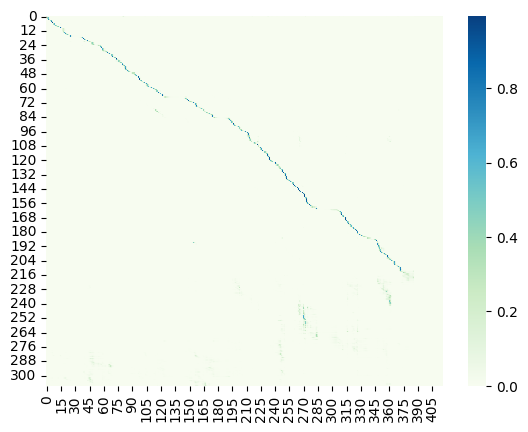

Saved best model

Epoch: 43/80


Val:   3%|▎         | 1/33 [00:02<01:28,  2.77s/it, dist=6.0600]

Ground Truth :  IT IS OBVIOUSLY UNNECESSARY FOR US TO POINT OUT HOW LUMINOUS THESE CRITICISMS ARE HOW DELICATE IN EXPRESSION
Prediction   :  IT IS OBVIOUSLY UNNECESSARY FOR US TO POINT OUT HOW LUMINOUS THESE CRITICISMS ARE HOW DELICATE IN EXPRESSION


Val:   6%|▌         | 2/33 [00:04<01:15,  2.42s/it, dist=6.5267]

Ground Truth :  STUFF IT INTO YOU HIS BELLY COUNSELLED HIM
Prediction   :  STUFFED INTO YOU HIS BELLY COUNCILED HIM


Val:   9%|▉         | 3/33 [00:07<01:13,  2.44s/it, dist=6.4578]

Ground Truth :  THE METAL FOREST IS IN THE GREAT DOMED CAVERN THE LARGEST IN ALL OUR DOMINIONS REPLIED KALIKO
Prediction   :  THE MIDDLE FOREST IS IN THE GREAT DOME TO CAVERN THOUGH LARGEST AND ALL OUR DIMINIONS REPLIED CALICO


Val:  12%|█▏        | 4/33 [00:09<01:08,  2.37s/it, dist=6.2900]

Ground Truth :  HE IS STAYING AT THIS HOTEL TO TRY THE AIR OF SYDENHAM AND HE FINDS THAT IT AGREES WITH HIM
Prediction   :  HE ESTAYING AT THIS HOTEL TO TRY THE AIR OF SIDE IN THEM AND HE FINDS THAT IT GREEZED WITH HIM


Val:  15%|█▌        | 5/33 [00:12<01:07,  2.41s/it, dist=6.4493]

Ground Truth :  IT'S UNBEARABLE IT TORTURES ME EVERY MINUTE
Prediction   :  IT'S UNBEARABLE IT TORTURES ME EVERY MINUTE


Val:  18%|█▊        | 6/33 [00:14<01:02,  2.32s/it, dist=6.3133]

Ground Truth :  I HAVE NEVER KNOWN A MADGE AND YET FROM MY BOYHOOD UPWARD I HAVE DESIRED TO MEET ONE
Prediction   :  I AM NEVER KNOWN IMAGINE AND YET FROM MY BOYHOOD UPWARD I HAVE DESIRED TO MEET ONE


Val:  21%|██        | 7/33 [00:16<01:00,  2.33s/it, dist=6.4895]

Ground Truth :  NOW YOU MAY PLAY A SERENA SINGER A DREAM OF NIGHT FOR AN APPLE GOLD LADY FOR THE FRUIT IS NOW ON THE APPLE BOUGH AND THE MOON IS UP AND THE LAWN IS SHADY SINGER SINGER WANDERING SINGER O MY HONEY SWEET SINGER
Prediction   :  NOW YOU MAY PLAY IT SO REIGN A SINGER A DREAM OF NIGHT FOR AN APPLE OLD OLD LADY FOR THE FRUIT IS NOW ON THE APPLE BOW AND THE LOON IS UP AND THE LONG IS SHADY SINGER WANDERING SINGER ALL MY HONEY SWEET SIGNOR


Val:  24%|██▍       | 8/33 [00:19<00:58,  2.35s/it, dist=6.6117]

Ground Truth :  THE TWENTIES
Prediction   :  THE TWENTIES


Val:  27%|██▋       | 9/33 [00:21<00:56,  2.36s/it, dist=6.8452]

Ground Truth :  THEN TOM WHO HAD BEEN STUNNED BY SOME FALLING DEBRIS RAISED HIMSELF TO A SITTING POSITION
Prediction   :  THEN TOM WHO HAD BEEN STUNNED BY SOME FALLING DEBRIE RAISED HIMSELF TO A SITTING POSITION


Val:  30%|███       | 10/33 [00:23<00:54,  2.37s/it, dist=7.1747]

Ground Truth :  OH I WOULD NOT VENTURE TO SAY SIR
Prediction   :  OH I WOULD NOT VENTURE TO SAY SIR


Val:  33%|███▎      | 11/33 [00:26<00:51,  2.36s/it, dist=7.0618]

Ground Truth :  THE SECOND PART BEGINS HERE I WAS A THINKING THE FIRST PART DIVIDES INTO TWO
Prediction   :  THE SECOND PART BEGINS HERE I WAS A THINKING THE FIRST PART OF ITS INTO TWO


Val:  36%|███▋      | 12/33 [00:28<00:50,  2.39s/it, dist=7.1094]

Ground Truth :  THERE WERE A GOOD MANY SHEEP WHICH I KNEW AS TWO OR THREE BLACK EWES AND A BLACK LAMB OR TWO AND SEVERAL OTHERS WHICH HAD SOME DISTINGUISHING MARK WHEREBY I COULD TELL THEM
Prediction   :  THEY WERE GOOD MANY SHEEP WHICH I KNEW AS TWO OR THREE BLACK USE AND A BLICK LAMMER TOOL AND SEVERAL OTHERS WHICH HAD SOME DISTINGUISHING MARK WHEREBY I COULD TELL THEM


Val:  39%|███▉      | 13/33 [00:31<00:48,  2.42s/it, dist=7.2815]

Ground Truth :  JUST AN EVERYDAY DETECTIVE BUT AMBITIOUS I SUPPOSE AND QUITE ALIVE TO THE IMPORTANCE OF BEING THOROUGH
Prediction   :  JUST IN EVERY DAY DEJECTIVE BUT AMBITIOUS I SUPPOSE AND QUITE ALIVE TO THE IMPORTANCE OF BEING THOROUGH


Val:  42%|████▏     | 14/33 [00:33<00:46,  2.44s/it, dist=7.3010]

Ground Truth :  THEY MADE HASTE TO OVERTAKE THEM WHICH AS THE PARTY MOVED SLOWLY THEY WERE ABLE TO DO WITH EASE
Prediction   :  THEY MADE HASTE TO OVERTAKE THEM WHICH AS THE PARTY MOVED SLOWLY THEY WERE ABLE TO DO WITH EASE


Val:  45%|████▌     | 15/33 [00:35<00:42,  2.36s/it, dist=7.1351]

Ground Truth :  BUT I DID ONCE HAVE THE LUCK TO HEAR AND SEE THE LADY PLAYED IN ENTIRETY THE CHILDREN HAD BEEN GRANTED LEAVE TO PLAY JUST ONE MORE GAME BEFORE BED TIME AND OF COURSE THEY CHOSE THE LONGEST AND PLAYED IT WITHOUT MISSING A SYLLABLE
Prediction   :  BUT I DID ONCE HAVE THE LOCK TO HEAR AND SEE THE LADY PLAYED IN ENTIRETY THE CHALKER HAD BEEN GRATITUDE LEAVE TO PLAY JUST ONE MORE GAME BEFORE BEDTIME AND OF COURSE THEY CHOSE THE LONGEST AND PLAYED IT WITHOUT MISSING A SILVER


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.37s/it, dist=7.5196]

Ground Truth :  AGAIN THERE WAS A VERY OLD CARRIAGE WHOSE WHEELS IN SPITE OF RUST AND DECAY I COULD SEE HAD BEEN DESIGNED ORIGINALLY FOR IRON RAILS
Prediction   :  AGAIN THERE WAS A VEILED CARRIAGE WHOSE WHEELS IN SPITE OF REST AND DECAY I COULD SEE HAD BEEN DESIGNED ORIGINALLY FOR IRON RAILS


Val:  52%|█████▏    | 17/33 [00:40<00:37,  2.36s/it, dist=7.5439]

Ground Truth :  THE LIFE BLOOD OF RHYTHMICAL TRANSLATION IS THIS COMMANDMENT THAT A GOOD POEM SHALL NOT BE TURNED INTO A BAD ONE
Prediction   :  THE LIFE LOOKED OF RIVEMACLE TRANSLATION IS THIS COMMANDMENTS THAT A GOOD POND SHALL NOT BE TURNED INTO A BAPON


Val:  55%|█████▍    | 18/33 [00:42<00:35,  2.34s/it, dist=7.4881]

Ground Truth :  THE GIRL IS FRETTING BUT YOU DON'T SEEM TO NOTICE IT
Prediction   :  THE GIRL IS FREDING BUT YOU DON'T SEEM TO NOTICE IT


Val:  58%|█████▊    | 19/33 [00:45<00:32,  2.31s/it, dist=7.5274]

Ground Truth :  THE BOARD NOT SO FORMIDABLE AS SHE HAD IMAGINED HAD INQUIRED INTO HER CASE AND INSTEAD OF SENDING HER TO STOKE CLAYPOLE HER HUSBAND'S BUCKINGHAMSHIRE PARISH AS SHE HAD DREADED HAD AGREED TO PAY HER RENT
Prediction   :  THE BOARD NOT SO FORMIDABLE AS SHE HAD IMAGINED HAD INQUIRED INTO HER CASE AND INSTEAD OF SENDING HER TO STILL CLAPLE HER HUSBAND'S BOOK HIM CHAIR PARISH AS SHE HAD DREADED HAD AGREED TO PAY HER RENT


Val:  61%|██████    | 20/33 [00:47<00:30,  2.32s/it, dist=7.5333]

Ground Truth :  WHEN ARE YOU GETTING RID OF THESE CATS I'M NOT FIXING TO START AN ANNEX TO KATE'S CAT HOME
Prediction   :  WHEN ARE YOU GETTING RID OF THESE CATS I'M NOT FIXING TO START AN ANNEXICATES CAT HOME


Val:  64%|██████▎   | 21/33 [00:49<00:28,  2.40s/it, dist=7.6251]

Ground Truth :  HANDLES OF WATERCRESS MAY BE ATTACHED TO THESE BASKETS
Prediction   :  HANDLES OF WATER CREST MAY BE ATTACHED TO THESE BASKETS


Val:  67%|██████▋   | 22/33 [00:52<00:26,  2.39s/it, dist=7.5576]

Ground Truth :  HAVE YOU ANY MESSAGE FOR CAPTAIN BENNYDECK
Prediction   :  HAVE YOU ANY MESSAGE FOR CAPTAIN BENEDIC


Val:  70%|██████▉   | 23/33 [00:54<00:24,  2.44s/it, dist=7.6867]

Ground Truth :  MODE CHOOSE THE GREENEST CUCUMBERS AND THOSE THAT ARE MOST FREE FROM SEEDS PUT THEM IN STRONG SALT AND WATER WITH A CABBAGE LEAF TO KEEP THEM DOWN TIE A PAPER OVER THEM AND PUT THEM IN A WARM PLACE TILL THEY ARE YELLOW THEN WASH THEM AND SET THEM OVER THE FIRE IN FRESH WATER WITH A VERY LITTLE SALT AND ANOTHER CABBAGE LEAF OVER THEM COVER VERY CLOSELY BUT TAKE CARE THEY DO NOT BOIL
Prediction   :  MODE CHOOSE THE GREENEST CUCUMBERS AND THOSE THAT HER MOST FREE FROM SEATS PUT THEM IN STRONG SALT AND WATER WITH A CABBAGE LEAF TO KEEP THEM DOWN TIE A PAPER OVER THEM AND PUT THEM IN A WARM PLACE TILL THEY ARE YELLOW THEN WASHED THEM AND SET THEM OVER THE FIRE IN FRESH WATER WITH A VERY LITTLE SALT AND ANOTHER CABBAGE LEAF OVER THEM AND PUT THEM IN A WARM PLACE TILL THEY ARE YELLOW THEN WASHED THEM AND SET THEM OVER THE FIRE IN FRESH WATER WITH A VERY LITTLE SALT AND ANOTHER CABBAGE LEAF OVER THEM AND PUT THEM IN A WARM PLACE TILL THEY ARE Y


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.41s/it, dist=7.6892]

Ground Truth :  LOMBROSO IS AN ASS
Prediction   :  LUMBROSO WAS AN ASS


Val:  76%|███████▌  | 25/33 [00:59<00:19,  2.43s/it, dist=7.6016]

Ground Truth :  IF YOU WOULD PERMIT ME SAID THE ARTIST LOOKING AT PHOEBE I SHOULD LIKE TO TRY WHETHER THE DAGUERREOTYPE CAN BRING OUT DISAGREEABLE TRAITS ON A PERFECTLY AMIABLE FACE
Prediction   :  IF YOU WOULD PERMIT ME SAID THE ARTIST LOOKING AT PHOEBE I SHOULD LIKE TO TRY WHETHER THE DEGARO TYPE CAN BRING OUT DISAGREEABLE TRAITS ON A PERFECTLY AMIABLE FACE


Val:  79%|███████▉  | 26/33 [01:02<00:17,  2.46s/it, dist=7.6256]

Ground Truth :  MOST OF MY LIKENESSES DO LOOK UNAMIABLE BUT THE VERY SUFFICIENT REASON I FANCY IS BECAUSE THE ORIGINALS ARE SO
Prediction   :  MOST OF MY LIKENESS IS DUE LOOK UNAMIABLE BUT THE VERY SUFFICIENT REASON I FANCY IS BECAUSE THE RIGINALS ARE SO


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.40s/it, dist=7.6042]

Ground Truth :  AND THE WOLVES PAVEL ASKED ENOUGH ENOUGH FOR ALL OF US
Prediction   :  AND THE WOLVES POVEL ASKED AND ELSE ENOUGH FOR ALL OF US


Val:  85%|████████▍ | 28/33 [01:06<00:12,  2.41s/it, dist=7.5631]

Ground Truth :  WE HAVE COME FROM A FAR LONELIER PLACE THAN THIS A LONELIER PLACE
Prediction   :  WE HAVE COME FROM A FIRE LONELY REPLACED IN THIS ALL ONLY YOUR PLACE


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.44s/it, dist=7.5329]

Ground Truth :  YES MISTER SLATER THE ASSISTANT MANAGER WHO WAS IN THE LOBBY AT THE TIME SAYS THAT TEN MINUTES AT LEAST MUST HAVE ELAPSED
Prediction   :  YES MISTER SLATER THE ASSISTANT MEDICIER WHO WAS IN THE LOBBY AT THE TIME SAYS THAT TEN MINUTES AT LEAST MUST HAVE ELECT


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.40s/it, dist=7.5227]

Ground Truth :  ON THE NEXT DAY BUT ONE RANDAL ARRANGED HIS DEPARTURE FOR SYDENHAM SO AS TO ARRIVE AT THE HOTEL AN HOUR BEFORE THE TIME APPOINTED FOR THE DINNER
Prediction   :  ON THE NEXT DAY BUT ONE RANDLE ARRANGED HIS DEPARTURE FOR SIDENESS SO AS TO ARRIVE AT THE HOTEL AND HOUR BEFORE THE TIME APPOINTED FOR THE DINNER


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.37s/it, dist=7.4940]

Ground Truth :  TO RIDE OVER SALT WATER UPON THE BACK OF A LITTLE HORSE SEEMED TO ME ABSURD
Prediction   :  DRIDE IT WERE SALT WATER UPON THE BACK OF A LITTLE HORSE SEEMED TO ME ABSURD


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.37s/it, dist=7.5131]

Ground Truth :  I EMPHASISED COMPLACENTLY
Prediction   :  I EMPHASIZED COMPLACENTLY


Ground Truth :  ANGRY WITH HIMSELF HE TRIED TO HIDE HIS FACE FROM THEIR EYES BY GAZING DOWN SIDEWAYS INTO THE SHALLOW SWIRLING WATER UNDER THE BRIDGE BUT HE STILL SAW A REFLECTION THEREIN OF THEIR TOP HEAVY SILK HATS AND HUMBLE TAPE LIKE COLLARS AND LOOSELY HANGING CLERICAL CLOTHES BROTHER HICKEY
Prediction   :  ANGRY WITH HIMSELF HE TRIED TO HIDE HIS FACE FROM THEIR EYES BY GAZING DOWN SIDEWAYS INTO THE SHALLOW SWIRLING WATER UNDER THE BRIDGE BUT HE STILL SAW A REFLECTION THEREIN OF THEIR TOP HEAVY SILK HATS AND HUMBLE TAPE LIKE COLLARS AND LOOSELY HANGING CLERICAL CLOTHES BROTHER HICKY


	Train Loss 0.1525	 Learning Rate 0.0005897
	Val Dist 7.4961	
	Teacher Forcing Ratio 1	


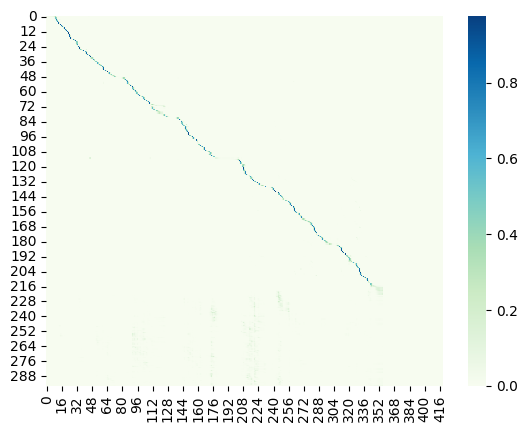


Epoch: 44/80


Val:   3%|▎         | 1/33 [00:02<01:31,  2.85s/it, dist=5.9533]

Ground Truth :  NOTHING CAN SURPRISE ME NOW I'M PREPARED FOR ANY THING EVEN THE SIGHT OF MY QUAKERISH LOVER DANCING A JIG
Prediction   :  NOTHING CAN SURPRISE ME NOW I'M PREPARED FOR ANYTHING EVEN THE SIGHT OF MY QUAKERISH LOVER DANCING A JICK


Val:   6%|▌         | 2/33 [00:05<01:20,  2.58s/it, dist=5.6667]

Ground Truth :  IN DECEMBER EIGHTEEN EIGHTY EIGHT MISTER W J JENKS READ AN INTERESTING PAPER BEFORE THE AMERICAN INSTITUTE OF ELECTRICAL ENGINEERS ON THE SIX YEARS OF PRACTICAL EXPERIENCE HAD UP TO THAT TIME WITH THE METER THEN MORE GENERALLY IN USE THAN ANY OTHER
Prediction   :  INDESCEMBER EIGHTEEN EIGHTY EIGHTHY MISTER DOBBIN YOU JENKS RED AND INTERESTING PAPER BEFORE THE AMERICAN INSTITUTE OF ELECTRICAL ENGINEERS ON THE SIX YEARS OF PRACTICAL EXPERIENCE HAD UP TO THAT TIME WITH THE METER THEN MORE GENERALLY IN USED THEN ANY OTHER


Val:   9%|▉         | 3/33 [00:07<01:13,  2.46s/it, dist=5.5911]

Ground Truth :  DON QUIXOTE GAVE HIS PROMISE AND SWORE BY THE LIFE OF HIS THOUGHTS NOT TO TOUCH SO MUCH AS A HAIR OF HIS GARMENTS AND TO LEAVE HIM ENTIRELY FREE AND TO HIS OWN DISCRETION TO WHIP HIMSELF WHENEVER HE PLEASED
Prediction   :  DON QUIXOTE GAVE HIS PROMISE AND SWORE BY THE LIFE OF HIS THOUGHTS NOT TO TOUCH SO MUCH AS A HAIR OF HIS GARMENTS AND TO LEAVE HIM ENTIRELY FREE AND TO HIS OWN DISCRETION TO WHIP HIMSELF WHENEVER HE PLEASED


Val:  12%|█▏        | 4/33 [00:09<01:09,  2.39s/it, dist=5.5433]

Ground Truth :  GRASPING THE POMMEL WITH THE LEFT HAND HE APPEARED TO DIVE HEAD FIRST TOWARD THE GROUND
Prediction   :  GRASPING THE PUMMELED WITH THE LIFT HANDING HE APPEARED TO DIVE HEAD FIRST TOWARD THE GROUND


Val:  15%|█▌        | 5/33 [00:12<01:05,  2.34s/it, dist=5.7520]

Ground Truth :  HE BEGAN PRESENTLY TO RELENT AND SPOKE TO ME IN A KINDER MANNER
Prediction   :  HE BEGAN PRESENTLY TO RELAND AND SPOKE TO ME IN A KIND OF MANNER


Val:  18%|█▊        | 6/33 [00:14<01:02,  2.33s/it, dist=5.6878]

Ground Truth :  NOR HAD THIS GOOD WOMAN'S OFFICIOUS LABOURS TAKEN THE LEAST FROM THE AWKWARDNESS OF THE SILENCE WHICH AS SOON AS THE BUSTLE SHE HAD MADE WAS OVER RETURNED IN ITS FULL FORCE
Prediction   :  NOR HAD THIS GOOD WOMAN'S OFFICIOUS LABOR AS TAKEN THE LEAST FROM THE AWKWARDNESS OF THE SILENCE WHICH AS SOON AS THE BUSTLE SHE HAD MADE WAS OVER RETURNED IN ITS FULL FORCE


Val:  21%|██        | 7/33 [00:16<01:01,  2.35s/it, dist=5.7067]

Ground Truth :  ON THE MAST ALREADY I SEE THE LIGHT PLAY OF A LAMBENT SAINT ELMO'S FIRE THE OUTSTRETCHED SAIL CATCHES NOT A BREATH OF WIND AND HANGS LIKE A SHEET OF LEAD
Prediction   :  ON THE MAST ALREADY I SEE THE LIGHT PLAY OF ALAMINESS SAINT ALMOST FIRE THE OUTSTRICT SAIL CATCHES NOT A BREATH OF WIND AND HANGS LIKE A SHEET OF LED


Val:  24%|██▍       | 8/33 [00:19<00:57,  2.32s/it, dist=6.1325]

Ground Truth :  OVER THE FIREPLACE THERE WAS A LARGE OLD FASHIONED GILT MIRROR
Prediction   :  OVER THE FIRE PLACE THERE WAS A LARGE OLD FASHIONED GUILT MIRROR


Val:  27%|██▋       | 9/33 [00:21<00:56,  2.34s/it, dist=6.1267]

Ground Truth :  I HASTENED BACK TO THE LINES
Prediction   :  I HASTENED BACK TO THE LINES


Val:  30%|███       | 10/33 [00:24<00:55,  2.42s/it, dist=6.0727]

Ground Truth :  HE HAD NEITHER A NATIONAL ARMY NOR AN ORGANIZED CHURCH
Prediction   :  HE HAD NEITHER AN ASH LARMING OR AN ARM OR AN ARMON AS CHURCH


Val:  33%|███▎      | 11/33 [00:26<00:52,  2.40s/it, dist=6.0479]

Ground Truth :  OH WHAT SHALL WE DO FOR A HOME
Prediction   :  OH WHAT SHALL WE DO FOR A WHOM


Val:  36%|███▋      | 12/33 [00:28<00:50,  2.39s/it, dist=5.9933]

Ground Truth :  AS SOON AS ON MY VISION SMOTE THE POWER SUBLIME THAT HAD ALREADY PIERCED ME THROUGH ERE FROM MY BOYHOOD I HAD YET COME FORTH
Prediction   :  AS SOON AS ON THE VISION SMOKED THE POWER SUBLIME THAT HAD ALREADY PIERCED ME THROUGH AIR FROM MY BOYHOOD I HAD YET COME FORTH


Val:  39%|███▉      | 13/33 [00:31<00:47,  2.37s/it, dist=5.9703]

Ground Truth :  MUFFINS AND CRUMPETS SHOULD ALWAYS BE SERVED ON SEPARATE DISHES AND BOTH TOASTED AND SERVED AS EXPEDITIOUSLY AS POSSIBLE
Prediction   :  MUFFINS AND CRUMPETS SHOULD ALWAYS BE SERVED ON SEPARATE DISHES AND BOTH TOASTED AND SERVED AS EXPEDITIOUSLY AS POSSIBLE


Val:  42%|████▏     | 14/33 [00:33<00:45,  2.38s/it, dist=6.0176]

Ground Truth :  THEY HAD FOUR OR FIVE SPECIES OF WHAT MIGHT LOOSELY BE CALLED BIRDS AND SOMETHING THAT COULD EASILY BE CLASSED AS A REPTILE AND A CARNIVOROUS MAMMAL THE SIZE OF A CAT WITH BIRDLIKE CLAWS AND A HERBIVORE ALMOST IDENTICAL WITH THE PIGLIKE THING IN THE BIG DARFHULVA MURAL AND ANOTHER LIKE A GAZELLE WITH A SINGLE HORN IN THE MIDDLE OF ITS FOREHEAD
Prediction   :  THEY HAD FOUR OR FIVE SPECIES OF WHAT MIGHT LOOSELY BE CALLED BIRDS AND SOMETHING THAT COULD EASILY BE CLASSED AS A REPTILE AND A CARD NIVEROUS MAMMAL THE SIZE OF A CAT WITH BIRD LIKE CLAWS AND A HERBER MORE ALMOST IDENTICAL WITH THE PIG LIKE THING IN THE BIG DARF HOLD A MIRAL AND ANOTHER LIKE A GAZEL WITH A SINGLE HORN IN THE MIDDLE OF ITS FOREHEAD


Val:  45%|████▌     | 15/33 [00:35<00:42,  2.38s/it, dist=5.9911]

Ground Truth :  NO MISTER HARDWIGG SAID THE CAPTAIN NO FEAR OF THAT
Prediction   :  NO MISTER HARDWICK SAID THE CAPTAIN NO OFFIER OF THAT


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.40s/it, dist=6.0054]

Ground Truth :  WHICH OPPRESSED THE METROPOLITANS OF EUROPE AND ASIA INVADED THE PROVINCES OF ANTIOCH AND ALEXANDRIA AND MEASURED THEIR DIOCESE BY THE LIMITS OF THE EMPIRE
Prediction   :  WHICH OPPRESSED THE METROPOLITANS OF EUROPE AND ASIA INVEDED THE PROVINCES OF ANTIACONAL EXANDRA AND MEASURED THEIR DIACES BY THE LIMITS OF THE EMPIRE


Val:  52%|█████▏    | 17/33 [00:40<00:38,  2.40s/it, dist=5.9843]

Ground Truth :  HE ENTERED THE GUARD ROOM THERE THE GUARDS STOOD DRAWN UP IN LINE WITH CARBINES AT THEIR SHOULDERS BUT THEY WERE SOUND ASLEEP
Prediction   :  HE ENTERED THE GUARD ROOM THERE THE GUARD ROOM THERE THE GUARD STOOD DRAWN UP AND LINE WAS CARBINES AT THEIR SHOULDERS BUT THEY WERE SOUND ASLEEP


Val:  55%|█████▍    | 18/33 [00:43<00:36,  2.46s/it, dist=6.0678]

Ground Truth :  MEANWHILE ALL THE REST OF THE PEOPLE IN THE CASTLE HAD BEEN WAKENED AT THE SAME MOMENT AS THE PRINCESS AND THEY WERE NOW EXTREMELY HUNGRY
Prediction   :  MEANWHILE ALL THE REST OF THE PEOPLE IN THE CASTLE HAD BEEN AWAKENED AT THE SAME MOMENT AS THE PRINCESS AND THEY WERE NOW EXTREMELY HUNGRY


Val:  58%|█████▊    | 19/33 [00:45<00:34,  2.48s/it, dist=6.1432]

Ground Truth :  IT WAS SO LONG THAT IT BUSHED OUT BEHIND HIS EARS AND MADE HIM LOOK LIKE THE OLD PORTRAITS I REMEMBERED IN VIRGINIA
Prediction   :  IT WAS SO LONG THAT IT BUSHED OUT BEHIND HIS EARS AND MADE HIM LOOK LIKE THE OLD PORTRAITS I REMEMBER IN VIRGINIA


Val:  61%|██████    | 20/33 [00:48<00:31,  2.41s/it, dist=6.1143]

Ground Truth :  BUT HER HUSBAND FELT HEAVY AT HEART AND THOUGHT IT WERE BETTER TO SHARE THE LAST CRUST WITH THE CHILDREN
Prediction   :  BUT HER HUSBAND FELT HEAVY AT HEART AND BUT IT WERE BETTER TO SURE THE LAST CRUST WITH THE CHILDREN


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.37s/it, dist=6.0432]

Ground Truth :  IT HAS NOT BEEN RUNNING SINCE LAST NIGHT OR IT WOULD BE FULL OF CURIOUS PEOPLE ALL THE TIME HUSTLING TO GET A GLIMPSE OF THIS PLACE
Prediction   :  IT HAS NOT BEEN RUNNING SINCE LAST NIGHT OR IT WOULD BE FULL OF CURIOUS PEOPLE ALL THE TIME HUSTLING TO GET A GLIMPSE OF THIS PLACE


Val:  67%|██████▋   | 22/33 [00:52<00:26,  2.41s/it, dist=6.0300]

Ground Truth :  THE FLOORS WERE COVERED WITH MATTING AND THE HALL LAID WITH A THIN RAG CARPET
Prediction   :  THE FLOORS WERE COVERED WITH MATTING AND THE HALL LAID WITH A THIN RAG CARPET


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.39s/it, dist=6.1171]

Ground Truth :  TIME WORE AWAY AND ON THE NINTH OF APRIL EIGHTEEN SIXTY FIVE GRANT CAPTURED THE CONFEDERATE ARMY UNDER LEE THUS VIRTUALLY ENDING THE WAR
Prediction   :  TIME WAR AWAY AND ON THE NINETEENTH APRIL EIGHTEEN SIXTY FIVE GRANT CAPTURED THE CONFEDERATE ARMY UNDERLY THUS FIRTUALLY AND DEED THE BORE


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.34s/it, dist=6.1561]

Ground Truth :  THE KINGDOM OF NORTHUMBRIA AS THE NAME IMPLIES EMBRACED NEARLY ALL THE COUNTRY FROM THE HUMBER TO THE PICTISH BORDER
Prediction   :  THE KINGDOM OF NORTHUMBRIA AS THE NAME IMPLIES EMBRACE NEARLY ALL THE COUNTRY FROM THE HUMBER TO THE PICTISH BORDER


Val:  76%|███████▌  | 25/33 [00:59<00:18,  2.35s/it, dist=6.1651]

Ground Truth :  THE JAILER MAY FORGET THAT HE IS ON GUARD THE PRISONER NEVER FORGETS THAT HE IS GUARDED
Prediction   :  THE JAILER MAY FORGET THAT HE IS ON GUARD THE PRISONER NEVER FORGETS THAT HE IS GUARDED


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.32s/it, dist=6.1190]

Ground Truth :  THE JAILER MAY FORGET THAT HE IS ON GUARD THE PRISONER NEVER FORGETS THAT HE IS GUARDED
Prediction   :  THE JAILER MAY FORGET THAT HE IS ON GUARD THE PRISONER NEVER FORGETS THAT HE IS GUARDED


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.36s/it, dist=6.1353]

Ground Truth :  ON MY TAKING THE ROPE OFF HE SHOOK HIMSELF AND SEEMED TO SAY YOU THINK THAT YOU ARE MIGHTY SMART FOLKS BUT YOU ARE A LEETLE TOO SMART
Prediction   :  AND I TAKE IN THE ROPE OFF HE SHOOK HIMSELF AND SEEMED TO SAY YOU THINK THAT YOU ARE MIGHTY SMART FOLKS BUT YOU WERE A LEADLE TOO SMART


Val:  85%|████████▍ | 28/33 [01:06<00:11,  2.33s/it, dist=6.1324]

Ground Truth :  DIRECTION
Prediction   :  DIRECTION


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.40s/it, dist=6.1143]

Ground Truth :  YET THE ORIGINAL WEARS TO COMMON EYES A VERY DIFFERENT EXPRESSION
Prediction   :  YET THE ORIGINAL WEARS TO COMMON EYES A VERY DIFFERENT EXPRESSION


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.43s/it, dist=6.1149]

Ground Truth :  THERE WAS NO PONIARD IN THE WOUND
Prediction   :  THERE WAS NO POINT IN THE WOUND


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.42s/it, dist=6.1127]

Ground Truth :  HE TREMBLED WITH FEAR AND MADE FOR ANOTHER TREE WHERE THE VERY SAME THING HAPPENED TO HIM AND HE FELL A SHOUTING CALLING UPON DON QUIXOTE TO COME AND PROTECT HIM
Prediction   :  HE TREMBLED WITH FEAR AND MADE FOR ANOTHER TREE WHERE THE VERY SAME THING HE HAPPENED TO HIM AND HE FELL A SHOUTING CALLING UPON DON QUIXOTE TO COME AND PROTECT HIM


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.41s/it, dist=6.0856]

Ground Truth :  HE KNOWS THEM BOTH
Prediction   :  HE KNOWS THEM BOTH


Ground Truth :  TO HIM THE PRESENCE OR ABSENCE OF HIS WIFE'S SISTER WAS A MATTER OF INDIFFERENCE
Prediction   :  TO HIM THE PRESENCE ARE ABSENCE OF HIS WIFE'S SISTER WAS A MATTER OF INDIFFERENCE
	Train Loss 0.1480	 Learning Rate 0.0005675
	Val Dist 6.0686	
	Teacher Forcing Ratio 1	


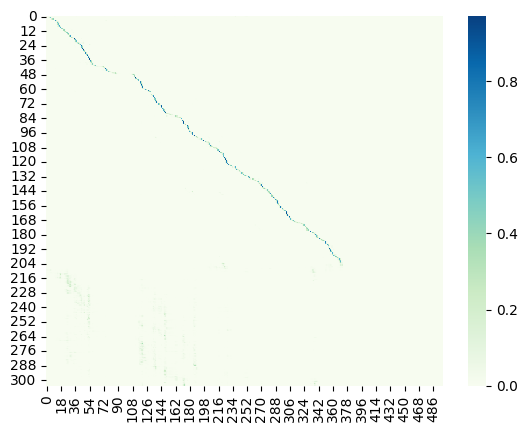

Saved best model

Epoch: 45/80


Val:   3%|▎         | 1/33 [00:02<01:34,  2.96s/it, dist=5.3333]

Ground Truth :  AND THE INCONSISTENT WOMAN FELL UPON HIS BUTTONY BREAST WEEPING COPIOUSLY
Prediction   :  AND THE INCONSISTENT WOMAN FELL UPON HIS BUTTONY BREAST WEEPING COPIOUSLY


Val:   6%|▌         | 2/33 [00:05<01:20,  2.60s/it, dist=5.3767]

Ground Truth :  IF HE DIDN'T GO AND SEE THEM THEY WOULD SUE HIM PROMPTLY
Prediction   :  IF HE DIDN'T GO AND SEE THEM THEY WOULD SOON HIM PROMPTLY


Val:   9%|▉         | 3/33 [00:07<01:13,  2.43s/it, dist=5.2644]

Ground Truth :  IF HOWEVER THEY TAKE YOUR SCALP AS I TRUST AND BELIEVE THEY WILL NOT DEPEND ON IT UNCAS AND I WILL NOT FORGET THE DEED BUT REVENGE IT AS BECOMES TRUE WARRIORS AND TRUSTY FRIENDS
Prediction   :  IF HOWEVER THEY TAKE YOUR SCALP AS I TRUST AND BELIEVE THEY WILL NOT DEPEND ON IT UNCAS AND I WILL NOT FORGET THE DEED BUT REVENGE IT AS BECOMES TRUE WARRIORS AND TRUSTY FRIENDS


Val:  12%|█▏        | 4/33 [00:09<01:09,  2.41s/it, dist=5.7067]

Ground Truth :  HE COULD EXAMINE THE PAPERS IN HIS OWN OFFICE
Prediction   :  HE COULD EXAMINE THE PAPERS IN HIS OWN OFFICE


Val:  15%|█▌        | 5/33 [00:12<01:05,  2.35s/it, dist=5.5853]

Ground Truth :  A THOUSAND PLANS WERE MADE A THOUSAND ADVENTURES PICTURED AND THE MOTHER WOULD SMILE AND LAUGH AND PLAN WITH THEM
Prediction   :  A THOUSAND PLANS WERE MADE A FOULDENT ADVENTURES PICTURED AND A MOTHER WITH SMILE AND LAUGH AND PLAN WITH THEM


Val:  18%|█▊        | 6/33 [00:14<01:03,  2.34s/it, dist=5.4067]

Ground Truth :  THIS ALTERNATIVE IN THE CAPTAIN'S PLANS TERMINATING THE VOYAGE A MONTH EARLIER THAN HIS ARRANGEMENTS HAD CONTEMPLATED PUZZLED RANDAL
Prediction   :  THIS ALL TURNED IT IN THE CAPTAIN'S PLANS TERMINATING THE VOYAGE A MONTH EARLIER THAN HIS ARRANGEMENTS HAD CONTEMPLATED PUZZLED RANDLE


Val:  21%|██        | 7/33 [00:16<01:01,  2.38s/it, dist=5.6829]

Ground Truth :  IT WAS THE AFTERNOON OF A HOLIDAY AND SHE HAD CLOSED EARLY
Prediction   :  IT WAS THE AFFORDING OF A HOLIDAY AND SHE HAD CLOSED EARLY


Val:  24%|██▍       | 8/33 [00:19<00:58,  2.36s/it, dist=5.5733]

Ground Truth :  GEORGE
Prediction   :  GEORGE


Val:  27%|██▋       | 9/33 [00:21<00:55,  2.33s/it, dist=5.5415]

Ground Truth :  MISS CLARKE STARTED AND HER SWEET FACE SHOWED A MOMENT'S PERPLEXITY DID I SHE QUERIED MUSINGLY
Prediction   :  MISS CLARK STARTED AND HER SWEET FACE SHOWED A MOMENT'S PERPLEXITY DID I SHE QUERIED MUSINGLY


Val:  30%|███       | 10/33 [00:23<00:52,  2.29s/it, dist=5.4733]

Ground Truth :  HE SEEMS TO ME TO BE TRULY PENITENT FOR HIS OFFENCES A MISGUIDED BUT NOT A HYPOCRITICAL MAN IF MY KNOWLEDGE OF HUMAN NATURE GOES FOR ANYTHING I HOPE HE IS SAID NORTH
Prediction   :  HE SEEMS TO ME TO BE TRULY PENNITENT FOR AS OFFENCES A MISGUIDED BUT NOT A HYPNOTICAL MAN IF MY KNOWLEDGE OF HUMAN NATURE GOES FOR ANYTHING I HOPE HE HAS SAID NORTH


Val:  33%|███▎      | 11/33 [00:26<00:50,  2.30s/it, dist=5.7727]

Ground Truth :  VERY LIKELY I MAY FIND THERE SOME MANUSCRIPTS FROM THE HAND OF SAKNUSSEMM
Prediction   :  VERY LIKELY A MAY FIND THERE'S A MANUSCRIPTS FROM THE HAND OF SUCH NEWSOME


Val:  36%|███▋      | 12/33 [00:28<00:49,  2.37s/it, dist=5.7922]

Ground Truth :  HE'S UP IN TOWN SIR A MINDING OF HIS PARLIAMENTARY DUTIES
Prediction   :  HE'S UP IN TOWN SIR A MINDING OF HIS PARLIAMENTARY DUTIES


Val:  39%|███▉      | 13/33 [00:30<00:47,  2.38s/it, dist=5.8077]

Ground Truth :  ONLY THERE ARE TWO SORTS OF CLOUD AND FIRE
Prediction   :  ONLY THERE ARE TWO SORTS OF CLOUD AND FIRE


Val:  42%|████▏     | 14/33 [00:33<00:46,  2.43s/it, dist=5.7795]

Ground Truth :  TO PICKLE EGGS
Prediction   :  TWO PICKLE EGGS


Val:  45%|████▌     | 15/33 [00:35<00:42,  2.36s/it, dist=5.7289]

Ground Truth :  SUMMER SQUASHES ALMOST IN THEIR GOLDEN BLOSSOM CUCUMBERS NOW EVINCING A TENDENCY TO SPREAD AWAY FROM THE MAIN STOCK AND RAMBLE FAR AND WIDE TWO OR THREE ROWS OF STRING BEANS AND AS MANY MORE THAT WERE ABOUT TO FESTOON THEMSELVES ON POLES TOMATOES OCCUPYING A SITE SO SHELTERED AND SUNNY THAT THE PLANTS WERE ALREADY GIGANTIC AND PROMISED AN EARLY AND ABUNDANT HARVEST
Prediction   :  SUMMER SQUASHES ALMOST IN THEIR GOLDEN BLOSSOM CUCUMBERS NOW EVENTSING ATTENDANCY TO SPREAD AWAY FROM THE MAIN STOCK AND RAMBLE FAR IN WIDE TWO OR THREE ROSE OF STRING BEINGS AND IF MANY MORE THAT WERE ABOUT TO FESTOON THEMSELVES UNPOLED TO MADE OATHS OCCUPYING A SIGHT SO SHELTERED IN SUNNY THAT THE PLANTS WERE ALREADY GIGANTIC AND PROMISED AN EARLY AND ABUNDANT HARVEST


Val:  48%|████▊     | 16/33 [00:38<00:39,  2.35s/it, dist=5.8279]

Ground Truth :  UNDER CERTAIN CONDITIONS YOU MAY HEAR THE ROAR OF THE WATER RUSHING FROM THE ROCK AT A DISTANCE OF HALF A MILE OR EVEN MORE OR YOU MAY NOT HEAR IT UNTIL WITHIN A FEW RODS
Prediction   :  UNDER CERTAIN CONDITIONS YOU MAY HEAR THE ROAR OF THE WATER RUSHING FROM THE ROCK AT DISTANCE OF HALF A MILE OR EVEN MORE OR YOU MAY NOT HEAR IT UNTIL WITHIN A FEW RODS


Val:  52%|█████▏    | 17/33 [00:40<00:37,  2.36s/it, dist=5.9580]

Ground Truth :  THE BUZZER'S WHIRR TRIGGERED HIS MUSCLES INTO COMPLETE RELAXATION
Prediction   :  THE BUZZERS WERE TRIGGERED HIS LUSCILS AND COMPLETE RELAXATION


Val:  55%|█████▍    | 18/33 [00:42<00:35,  2.38s/it, dist=5.8652]

Ground Truth :  YES MANY TIMES
Prediction   :  YES MANY TIMES


Val:  58%|█████▊    | 19/33 [00:45<00:34,  2.44s/it, dist=5.8414]

Ground Truth :  SHE SLID TO THE FLOOR BESIDE HIM AS IF SHE WERE TOO TIRED TO SIT UP ANY LONGER
Prediction   :  SHE SLED TO THE FLOOR BESIDE HIM AS IF SHE WERE TOO TIRED TO SIT UP ANY LONGER


Val:  61%|██████    | 20/33 [00:47<00:31,  2.39s/it, dist=5.7923]

Ground Truth :  THE BOYS BELONG TO THE GENTLEMAN WHO IS A WIDOWER
Prediction   :  THE BOYS BELONG TO THE GENTLEMAN WHO IS A WIDOWER


Val:  64%|██████▎   | 21/33 [00:50<00:29,  2.44s/it, dist=5.8622]

Ground Truth :  THIS HAD SOME EFFECT IN CALMING HIM
Prediction   :  THIS HAD SOME EFFECT IN CALMING HIM


Val:  67%|██████▋   | 22/33 [00:52<00:26,  2.42s/it, dist=5.8288]

Ground Truth :  THIS SURVEY WAS UNFAVOURABLE
Prediction   :  THE SERVANT WAS UNFAVORABLE


Val:  70%|██████▉   | 23/33 [00:55<00:24,  2.44s/it, dist=5.8861]

Ground Truth :  THE LONG PEPPER IS LESS AROMATIC THAN THE BLACK BUT ITS OIL IS MORE PUNGENT
Prediction   :  THE LONG PEPPER IS LESS ARAMATIC THAN THE BLACK BUT ITS OIL IS MORE PUNGENT


Val:  73%|███████▎  | 24/33 [00:57<00:22,  2.46s/it, dist=5.9208]

Ground Truth :  THIS ISN'T PART OF YOUR TESTING ROUTINE IS IT
Prediction   :  THIS ISN'T PART OF YOUR TESTING ROUTINE AS IT


Val:  76%|███████▌  | 25/33 [00:59<00:19,  2.43s/it, dist=5.8816]

Ground Truth :  THE COUNTLESS TREASURES WHICH FIVE CENTURIES OF RAPINE HAD ACCUMULATED ROUND THE CAPITOL HAD BECOME THE PREY OF MEN CLOTHED IN SHEEPSKINS AND HORSE HIDE AND THE SISTER OF AN EMPEROR HAD FOUND HER BEAUTY VIRTUE AND PRIDE OF RACE WORTHILY MATCHED BY THOSE OF THE HARD HANDED NORTHERN HERO WHO LED HER AWAY FROM ITALY AS HIS CAPTIVE AND HIS BRIDE TO FOUND NEW KINGDOMS IN SOUTH FRANCE AND SPAIN AND TO DRIVE THE NEWLY ARRIVED VANDALS ACROSS THE STRAITS OF GIBRALTAR INTO THE THEN BLOOMING COAST LAND OF NORTHERN AFRICA
Prediction   :  THE COUNTLESS TREASURES WHICH FIVE CENTURIES OF ROPING HAD ACCUMULATED AROUND THE CAPITAL HAD BECOME THE PRAY OF MEN CLOTHES IN SHEEP SKINS AND HORSE HIDE AND THE SISTER OF AN EMPEROR HAD FOUND HER BEAUTY VIRTUE AND PRIDE OF RACE WORTHILY MATCHED BY THOSE OF THE HARD HANDED NORTHERN HERO WHO LED HER AWAY FROM ITALY AS HIS CAPTIVE AND HIS BRIDE TO FOUND NEW KINGDOMS IN SO FRANCE AND SPAIN AND TO DRIVE THE NEWLY ARRIVED VANDALS ACROSS THE STRAIGHT OF

Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.42s/it, dist=5.8928]

Ground Truth :  NOR COULD IT SEEM STRANGE OR INCREDIBLE THAT THE FIRST OF THESE AEONS THE LOGOS OR WORD OF GOD OF THE SAME SUBSTANCE WITH THE FATHER SHOULD DESCEND UPON EARTH TO DELIVER THE HUMAN RACE FROM VICE AND ERROR AND TO CONDUCT THEM IN THE PATHS OF LIFE AND IMMORTALITY
Prediction   :  NOR COULD IT SEEM STRANGE OR INCREDIBLE BUT THE FIRST OF THESE EARNS THE LOOK OFF OR WORD OF GOD OF THE SAME SUBSENCE WITH THE FATHER SHOULD DESCEND UPON EARTH TO DELIVER THE HUMAN RACE FROM VICE AND ERROR AND TO CONDUCT THEM IN THE PATHS OF LIFE AND IMMORTALITY


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.43s/it, dist=5.9356]

Ground Truth :  NOT AT THE HOTEL JUST NOW
Prediction   :  NOT AT THE HOTEL JUST NOW


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.40s/it, dist=5.9090]

Ground Truth :  SOMETHING HAD TO BE DONE A CLIMAX WAS NEAR AND SHE WOULD NOT SIT IDLE
Prediction   :  SOMETHING HAD TO BE DONE A CLIMAX WAS NEAR AND SHE WOULD NOT SET IDLE


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.35s/it, dist=5.8901]

Ground Truth :  HE PASSED HOURS IN WATCHING HER DRESSING AND UNDRESSING HER DOLL AND IN LISTENING TO HER PRATTLE
Prediction   :  HE PASSED HOURS IN WATCHING HER DRESSING GET UNDRESSING HER DALL AND IN LISTENING TO HER PRATTLE


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.36s/it, dist=5.8936]

Ground Truth :  HESTER COULD ONLY ACCOUNT FOR THE CHILD'S CHARACTER AND EVEN THEN MOST VAGUELY AND IMPERFECTLY BY RECALLING WHAT SHE HERSELF HAD BEEN DURING THAT MOMENTOUS PERIOD WHILE PEARL WAS IMBIBING HER SOUL FROM THE SPIRITUAL WORLD AND HER BODILY FRAME FROM ITS MATERIAL OF EARTH
Prediction   :  HESTER COULD ONLY ACCOUNT FOR THE CHILD'S CHARACTER AND EVEN THEN MOST VAGUELY AND IMPERFECTLY BY RECALLING WHAT SHE HERSELF HAD BEEN DURING THAT MOMENT IS PERIOD WHILE PEARL WAS EMBIBING HER SOUL FROM THE SPIRITUAL WORLD AND HER BODILY FRAME FROM ITS MATERIAL OF EARTH


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.38s/it, dist=5.9052]

Ground Truth :  EVERY PLANT IN THE GRASS IS SET FORMALLY GROWS PERFECTLY AND MAY BE REALIZED COMPLETELY
Prediction   :  EVERY PLAN IN THE GRASS IS SET FORMILY GROWS PERFECTLY AND MAY BE REALIZED COMPLETELY


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.28s/it, dist=5.8656]

Ground Truth :  I WISH I HADN'T TAKEN THAT BRANDY HE SAID FOOL THAT I AM
Prediction   :  I WISH I HADN'T TAKEN THAT BRAND HE SAID FOOL THAT I AM


Val: 100%|██████████| 33/33 [01:17<00:00,  1.92s/it, dist=5.8227]

Ground Truth :  AND NOW IT HAD COME TO PASS THAT HIS SOLE REMAINING ALLY MISTER SAMUEL BOZZLE THE EX POLICEMAN WAS BECOMING WEARY OF HIS SERVICE
Prediction   :  AND NOW IT HAD COME TO PASS THAT HIS SOUL REMAINING ALLY MISTER SAMUL BOZZLE THE EXPOLICEMEN WAS BECOMING WEARY OF HIS SERVICE


	Train Loss 0.1382	 Learning Rate 0.0005453
	Val Dist 5.8227	
	Teacher Forcing Ratio 1	


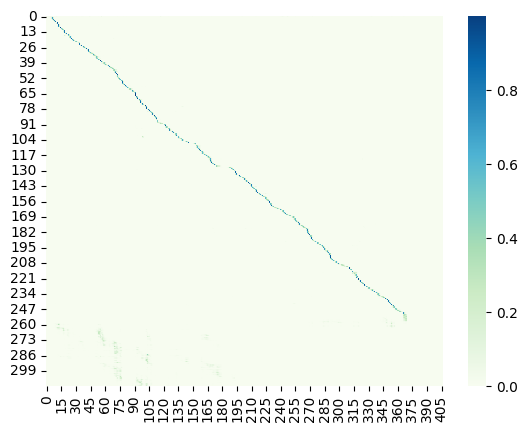

Saved best model

Epoch: 46/80


Val:   3%|▎         | 1/33 [00:02<01:27,  2.73s/it, dist=5.3200]

Ground Truth :  MISTER EDISON WAS A LEADER FAR AHEAD OF THE TIME
Prediction   :  MISTER EDISON WAS A LEADER FOR A HEAD OF THE TIME


Val:   6%|▌         | 2/33 [00:05<01:16,  2.47s/it, dist=5.0100]

Ground Truth :  VINTAGE YEARS HAVE MUCH TO DO WITH THE QUALITY OF WINES
Prediction   :  BENT A YEARS HAVE MUCH TO DO WITH THE QUALITY OF WINES


Val:   9%|▉         | 3/33 [00:07<01:10,  2.34s/it, dist=5.0133]

Ground Truth :  THE HORSES OF THE OUTFIT SAVE THOSE THAT WERE ON NIGHT DUTY AND TWO OR THREE OTHERS THAT HAD DEVELOPED A HABIT OF STRAYING HAD BEEN TURNED LOOSE EARLY IN THE EVENING FOR ANIMALS ON THE TRAIL ARE SELDOM STAKED DOWN
Prediction   :  THE HORSES OF THE UPPET SAVE THOSE THAT WERE ON NIGHT DUTY AND TWO OR THREE OTHERS THEY HAD DEVELOPED A HEAVEN OF STRAY HAD BEEN TURNED LOOKS EARLY IN THE EVENING FOR ANIMALS ON THE TRAIL OR SELDOM STAKED DIM


Val:  12%|█▏        | 4/33 [00:09<01:08,  2.36s/it, dist=5.1583]

Ground Truth :  HER CRIES BROUGHT HER HUSBAND DOWN TO TRY WITH HIS ACHING HEART TO COMFORT HERS
Prediction   :  HER CRIES BROUGHT HER HUSBAND DOWN TO TRY WITH HIS ACHING HEART TO COMFORT HERS


Val:  15%|█▌        | 5/33 [00:12<01:07,  2.39s/it, dist=5.0987]

Ground Truth :  I HAD WANTED TO GET SOME PICTURE BOOKS FOR YULKA AND ANTONIA EVEN YULKA WAS ABLE TO READ A LITTLE NOW
Prediction   :  I HAD WANTED TO GET SOME PICTURE BOOKS FOR YILK AND ANTONIA EVEN YOU'LL COSETTE WILL TO READ A LITTLE NOW


Val:  18%|█▊        | 6/33 [00:14<01:06,  2.47s/it, dist=5.3311]

Ground Truth :  GRETHEL BEGAN TO CRY BUT IT WAS ALL USELESS FOR THE OLD WITCH MADE HER DO AS SHE WANTED
Prediction   :  GRETTLE BEGAN TO CRY BUT IT WAS ALL USELESS FOR THE OLD WHICH MADE HER DO AS SHE MONTED


Val:  21%|██        | 7/33 [00:17<01:03,  2.43s/it, dist=5.4295]

Ground Truth :  BUT THIS IS A FALLACY
Prediction   :  BUT THIS IS A FALLENCY


Val:  24%|██▍       | 8/33 [00:19<01:00,  2.44s/it, dist=5.4500]

Ground Truth :  YOU ASK ME TO STAY AWAY FROM YOU BECAUSE YOU WANT ME
Prediction   :  YOU ASKED ME TO STAY AWAY FROM YOU BECAUSE YOU WANT ME


Val:  27%|██▋       | 9/33 [00:21<00:57,  2.38s/it, dist=5.4096]

Ground Truth :  PUT THE SUGAR WITH ONE QUARTER PINT OF WATER IN A SAUCEPAN OVER THE FIRE REMOVE THE SCUM AS IT RISES AND ADD THE LEMON PEEL AND GINGER WITH THE OUTSIDE SCRAPED OFF WHEN THE SYRUP IS TOLERABLY THICK TAKE IT OFF THE FIRE AND WHEN COLD WIPE THE CUCUMBERS DRY AND PUT THEM IN
Prediction   :  PUT THE SUGAR WITH ONE QUARTER PINT OF WATER IN A SAUCEPAN OVER THE FIRE REMOVED THE SCOME AS IT RISES AND ADD THE LEMON PIEL AND GINGER WITH THE OUTSIDE SCRAPED OFF WHEN THE SERVICE IS TOLERABLY THICK TAKE IT OFF THE FIRE AND WHEN COLD WHITE THE CUCUMBER'S DRY AND PUT THEM IN


Val:  30%|███       | 10/33 [00:24<00:54,  2.36s/it, dist=5.4407]

Ground Truth :  THINK OF LADY GLENARVAN THINK OF MARY GRANT
Prediction   :  THINK OF LADY CLENARVAN THINK OF MARY GRANT


Val:  33%|███▎      | 11/33 [00:26<00:52,  2.37s/it, dist=5.5182]

Ground Truth :  LOOK AT IT FROM TIME TO TIME WHEN IT HAS BEEN LAID FOR NEARLY AN HOUR AND WHEN THE YEAST HAS RISEN AND BROKEN THROUGH THE FLOUR SO THAT BUBBLES APPEAR IN IT YOU WILL KNOW THAT IT IS READY TO BE MADE UP INTO DOUGH
Prediction   :  LOOK AT IT FROM TIME TO TIME WHEN IT HAS BEEN LAID FOR NEARLY AN HOUR AND WHEN THE EAST HAS RISEN AND BROKEN THROUGH THE FLOUR SO THAT BUBBLES APPEAR IN IT YOU WILL KNOW THAT IT IS READY TO BE MADE UP INTO DO


Val:  36%|███▋      | 12/33 [00:28<00:49,  2.37s/it, dist=5.4456]

Ground Truth :  WHAT HE SAID HE LOOKED WITH SO MUCH SINCERITY THAT HAD SHE BEEN BURNING WITH RAGE AT HIS LATE BEHAVIOUR SHE MUST HAVE FORGIVEN HIM FOR THE REGRET WHICH HE SO FORCIBLY EXPREST
Prediction   :  WHAT HE SAID HE LOOKED WITH SO MUCH SINCERITY THAT HAD SHE BEEN BURNING WITH RAGE AT HIS LATE BEHAVIOUR SHE MUST HAVE FORGIVEN HIM FOR THE REGRET WHICH HE SO FORCIBLY EXPRESSED


Val:  39%|███▉      | 13/33 [00:30<00:46,  2.30s/it, dist=5.3728]

Ground Truth :  OH SIR SAID MISSUS POYSER RATHER ALARMED YOU WOULDN'T LIKE IT AT ALL
Prediction   :  OH SIR SAID MISSUS POYSER RATHER ALARMED YOU WOULDN'T LIKE IT AT ALL


Val:  42%|████▏     | 14/33 [00:33<00:45,  2.40s/it, dist=5.3633]

Ground Truth :  A VOICE INQUIRED WHO'S THERE
Prediction   :  A VOICE INQUIRED WHOSE THERE


Val:  45%|████▌     | 15/33 [00:35<00:42,  2.37s/it, dist=5.3507]

Ground Truth :  BUT I DID ONCE HAVE THE LUCK TO HEAR AND SEE THE LADY PLAYED IN ENTIRETY THE CHILDREN HAD BEEN GRANTED LEAVE TO PLAY JUST ONE MORE GAME BEFORE BED TIME AND OF COURSE THEY CHOSE THE LONGEST AND PLAYED IT WITHOUT MISSING A SYLLABLE
Prediction   :  BUT I DID ONCE HAVE THE LOCK TO HEAR AND SEE THE LADY PLAYED IN ENTIRETY THE CHILDREN HAD BEEN GRANTED LEAVE TO PLAY JUST ONE MORE GAME BEFORE BED TIME AND OF COURSE THEY CHOSE THE LONGEST AND PLAYED IT WITHOUT MISSING A SELLABLE


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.37s/it, dist=5.3275]

Ground Truth :  PUT THE SUGAR WITH ONE QUARTER PINT OF WATER IN A SAUCEPAN OVER THE FIRE REMOVE THE SCUM AS IT RISES AND ADD THE LEMON PEEL AND GINGER WITH THE OUTSIDE SCRAPED OFF WHEN THE SYRUP IS TOLERABLY THICK TAKE IT OFF THE FIRE AND WHEN COLD WIPE THE CUCUMBERS DRY AND PUT THEM IN
Prediction   :  PUT THE SUGAR WITH ONE QUARTER PINT OF WATER IN A SAUCEPAN OVER THE FIRE REMOVED THE SCOME AS IT RISES AND ADD THE LEMON PIEL AND GINGER WITH THE OUTSIDE SCRAPED OFF WHEN THE SERVICE IS TOLERABLY THICK TAKE IT OFF THE FIRE AND WHEN COLD WHITE THE CUCUMBER'S DRY AND PUT THEM IN


Val:  52%|█████▏    | 17/33 [00:40<00:37,  2.35s/it, dist=5.2988]

Ground Truth :  PRIDE AFTER SATISFACTION UPLIFTED HIM LIKE LONG SLOW WAVES
Prediction   :  PRIDE AFTER SATISFACTION UP LIFTED HIM LIKE LONG SLOW WAVES


Val:  55%|█████▍    | 18/33 [00:42<00:35,  2.35s/it, dist=5.3622]

Ground Truth :  THE SQUARES OF COTTON SHARP EDGED HEAVY WERE JUST ABOUT TO BURST TO BOLLS
Prediction   :  THE SQUARES OF COTTON SHARP EDGED HEAVY WERE JUST ABOUT TO BURST TO BOWLS


Val:  58%|█████▊    | 19/33 [00:45<00:33,  2.37s/it, dist=5.3856]

Ground Truth :  IF CARRIED ANY DISTANCE IT SHOULD BE STORED AWAY IN AIR TIGHT VESSELS
Prediction   :  IF CARRIED ANY DISTANCE IT SHOULD BE STORED AWAY IN AIR TIGHT VESSELS


Val:  61%|██████    | 20/33 [00:47<00:31,  2.41s/it, dist=5.4160]

Ground Truth :  EVEN IN MIDDLE AGE THEY WERE STILL COMELY AND THE OLD GREY HAIRED WOMEN AT THEIR COTTAGE DOORS HAD A DIGNITY NOT TO SAY MAJESTY OF THEIR OWN
Prediction   :  EVEN IN MIDDLE AGE THEY WERE STILL COMELY AND THE OLD GREAT HEART WOMEN AT THEIR CATTER'S DOORS HAD A DIGNITY NOT TO SAY MAJESTY OF THEIR OWN


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.39s/it, dist=5.4305]

Ground Truth :  SOME OF THE PREPARATIONS OF MAIZE FLOUR ARE VERY GOOD AND WHEN PARTAKEN IN MODERATION SUITABLE FOOD FOR ALMOST EVERYBODY
Prediction   :  SOME OF THE PREPARATIONS OF MAIZE FLOUR ARE VERY GOOD AND WHEN PARTAKEN IN MODERATION SUITABLE FOOD FOR ALMOST EVERYBODY


Val:  67%|██████▋   | 22/33 [00:52<00:26,  2.44s/it, dist=5.4870]

Ground Truth :  OH YOU RAVE SIR EXCLAIMED VILLEFORT IN VAIN ENDEAVORING TO ESCAPE THE NET IN WHICH HE WAS TAKEN I RAVE
Prediction   :  OH YOU RAVE SIR EXCLAIMED VILLEFORT IN VAIN ENDOWERING TO ESCAPE THE NET IN WHICH HE WAS TAKEN I RAVE


Val:  70%|██████▉   | 23/33 [00:54<00:23,  2.36s/it, dist=5.6107]

Ground Truth :  HE SEEMS TO ME TO BE TRULY PENITENT FOR HIS OFFENCES A MISGUIDED BUT NOT A HYPOCRITICAL MAN IF MY KNOWLEDGE OF HUMAN NATURE GOES FOR ANYTHING I HOPE HE IS SAID NORTH
Prediction   :  HE SEEMS TO ME TO BE TRULY PENETENT FOR AS OFFENCES A MISGUIDED BUT NOT A HYPNOTICAL MAN IF MY KNOWLEDGE OF HUMAN NATURE GOES FOR ANYTHING I HOPE HE HAS SAID NORTH


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.40s/it, dist=5.6478]

Ground Truth :  I BELIEVE SAID JOHN THAT IN THE SIGHT OF GOD I HAVE A RIGHT TO FULFILL THAT PROMISE
Prediction   :  I BELIEVE SAID JOHN THAT IN THE SIGHT OF GOD I HAVE A RIGHT TO FILL THAT PROMISE


Val:  76%|███████▌  | 25/33 [00:59<00:19,  2.39s/it, dist=5.6813]

Ground Truth :  SLEEP WHICH KEEPS ALL SORROW IN ABEYANCE SOON WEIGHED DOWN THEIR EYELIDS THEY SLEPT IN EACH OTHER'S ARMS OVERCOME BY EXHAUSTION AND PROLONGED WATCHING
Prediction   :  SLEEP WHICH KEEPS ALL SORROW IN ABANDONCE SOON WAIT DOWN THEIR EYELIDS THEY SLEPT IN EACH OTHER'S ARMS OVERCOME BY EXHAUSTION AND PROLONGED WATCHING


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.42s/it, dist=5.6785]

Ground Truth :  HE PRESSED HIS VIOLIN CASE TO HIS HEART AS IF IT WERE A LIVING THING THAT COULD KNOW THAT HE LOVED IT
Prediction   :  HE PRESSED HIS VIOLENT CASE TO HIS HEART AS IF IT WERE A LIVING THING THAT COULD KNOW THAT HE LOVED IT


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.37s/it, dist=5.6654]

Ground Truth :  THEN HE TOSSED IT DOWN AND SEIZED THE NEXT
Prediction   :  THEN HE TOSSED IT DOWN AND SEIZED THE NEXT


Val:  85%|████████▍ | 28/33 [01:06<00:12,  2.41s/it, dist=5.7231]

Ground Truth :  THE LADY IS NOT THE MOTHER OF THE BOYS BUT THEIR AUNT
Prediction   :  THE LADY IS NOT TO MOTHER OF THE BOYS BUT THEIR AUNT


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.43s/it, dist=5.7228]

Ground Truth :  NOTHING CAN PART US ANY MORE NOT EVEN DEATH FOR LOVE LIKE OURS WILL LAST FOR EVER
Prediction   :  NOTHING CAN PART US ANY MORE NOT EVEN DEATH FOR LOVE LIKE ARES WILL LAST FOREVER


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.37s/it, dist=5.6698]

Ground Truth :  ITS JAW IS ENORMOUS AND ACCORDING TO NATURALISTS IT IS ARMED WITH NO LESS THAN ONE HUNDRED AND EIGHTY TWO TEETH
Prediction   :  IT'S JAW IS ENORMOUS AND ACCORDING THE NATURALIST IT IS ARMED WITH NO LESS THAN ONE HUNDRED AND EIGHTY TWO TEETH


Val:  94%|█████████▍| 31/33 [01:13<00:04,  2.31s/it, dist=5.6237]

Ground Truth :  WE WOULD FIGHT TO THE DEATH OF COURSE BUT AFTER THAT
Prediction   :  WE WOULD FIGHT TO THE DEATH OF COURSE BUT AFTER THAT


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.33s/it, dist=5.6058]

Ground Truth :  I'M AFRAID I DON'T KNOW MUCH ABOUT THE LAND OF OZ
Prediction   :  I AM AFRAID I DON'T KNOW MUCH ABOUT THE LAND ALIZE


Ground Truth :  UNCAS OCCUPIED A DISTANT CORNER IN A RECLINING ATTITUDE BEING RIGIDLY BOUND BOTH HANDS AND FEET BY STRONG AND PAINFUL WITHES
Prediction   :  UNCAS OCCUPIED A DISTANT CORNER IN A RECLINING ATTITUDE BEING RIGIDLY BOUND BOTH HANDS AND FEET BY STRONG AND PAINFUL WITHS
	Train Loss 0.1353	 Learning Rate 0.0005229


	Val Dist 5.5678	
	Teacher Forcing Ratio 1	


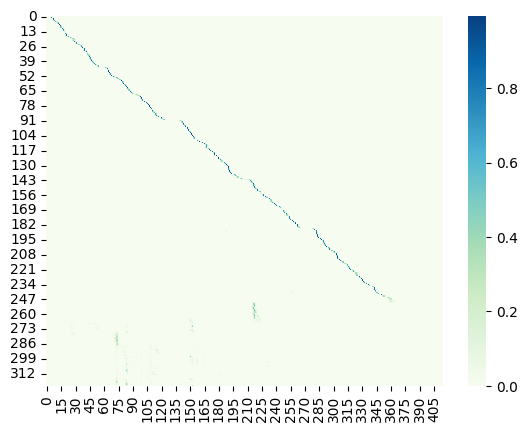

Saved best model

Epoch: 47/80


Val:   3%|▎         | 1/33 [00:02<01:31,  2.85s/it, dist=4.5333]

Ground Truth :  WHEN WE TOOK OUR SEATS AT THE BREAKFAST TABLE IT WAS WITH THE FEELING OF BEING NO LONGER LOOKED UPON AS CONNECTED IN ANY WAY WITH THIS CASE
Prediction   :  WHEN WE TOOK OUR SEATS AT THE BREAKFAST TABLE IT WAS WITH THE FEELING OF BEING NO LONGER LOOKED UPON AS CONNECTED IN ANY WAY WITH THIS CASE


Val:   6%|▌         | 2/33 [00:05<01:17,  2.51s/it, dist=4.6600]

Ground Truth :  WE LAY STILL AND DID NOT TALK
Prediction   :  WE LAY STILL AND DID NOT TALK


Val:   9%|▉         | 3/33 [00:07<01:14,  2.49s/it, dist=5.1756]

Ground Truth :  HER LITTLE FOOT TAPPED THE GRAVEL IMPATIENTLY
Prediction   :  HER LITTLE THAT TAPPED THE GRAVEL IMPATIENTLY


Val:  12%|█▏        | 4/33 [00:09<01:09,  2.40s/it, dist=5.1767]

Ground Truth :  CLAUDIA WOULD NOT ON ANY ACCOUNT ALLOW HIM TO ACCOMPANY HER AND THANKING HIM FOR HIS OFFERS AS WELL AS SHE COULD TOOK LEAVE OF HIM IN TEARS
Prediction   :  CLAUDIA WOULD NOT ON ANY ACCOUNT ALLOW HIM TO ACCOMPANY HER AND THANKING HIM FOR HIS OFFERS AS WELL AS SHE COULD TOOK LEAVE OF HIM IN TEARS


Val:  15%|█▌        | 5/33 [00:12<01:06,  2.36s/it, dist=5.2627]

Ground Truth :  A SNAKE OF HIS SIZE IN FIGHTING TRIM WOULD BE MORE THAN ANY BOY COULD HANDLE
Prediction   :  A SNAKE OF HIS SIZE IN FIGHTING TRIM WOULD BE MORE THAN NEIGHBOY COULD HANDLE


Val:  18%|█▊        | 6/33 [00:14<01:03,  2.36s/it, dist=5.3444]

Ground Truth :  AGAIN THERE WAS A VERY OLD CARRIAGE WHOSE WHEELS IN SPITE OF RUST AND DECAY I COULD SEE HAD BEEN DESIGNED ORIGINALLY FOR IRON RAILS
Prediction   :  AGAIN THERE WAS A VEIL CARRIAGE WHOSE WHEELS IN SPITE OF REST AND DECAY I COULD SEE HAD BEEN DESIGNED ORIGINALLY FOR IRON RAILS


Val:  21%|██        | 7/33 [00:16<01:01,  2.35s/it, dist=5.2124]

Ground Truth :  HE SAW A BUSY SATURDAY USHERED OUT THE SABBATH IN AND NOTHING DONE
Prediction   :  HE SAW A BUSY SATURDAY USHERED OUT THE SABBATH IN AND NOTHING DONE


Val:  24%|██▍       | 8/33 [00:19<01:00,  2.40s/it, dist=5.2183]

Ground Truth :  HE WROTE THE QUESTION AND GAVE IT TO ME I READ IT I COULD NOT UNDERSTAND EITHER THE SUBJECT OR THE MEANING OF THE WORDS BUT IT DID NOT MATTER I HAD TO GIVE AN ANSWER
Prediction   :  HE WROTE THE QUESTION AND GAVE IT TO ME I READ IT I COULD NOT UNDERSTAND EITHER THE SUBJECT OR THE MEANING OF THE WORDS BUT IT DID NOT MATTER I HAD TO GIVE AN ANSWER


Val:  27%|██▋       | 9/33 [00:21<00:58,  2.43s/it, dist=5.3356]

Ground Truth :  ILLUSTRATION BUNS
Prediction   :  ILLUSTRATION BUNS


Val:  30%|███       | 10/33 [00:24<00:54,  2.38s/it, dist=5.2473]

Ground Truth :  IT MIGHT HAVE BEEN ORDERED FOR THE GREEN BOX
Prediction   :  IT MIGHT HAVE BEEN ORDERED FOR THE GREEN BOX


Val:  33%|███▎      | 11/33 [00:26<00:52,  2.38s/it, dist=5.1352]

Ground Truth :  POUND WELL AND BIND WITH ONE OR TWO EGGS WHICH HAVE BEEN PREVIOUSLY BEATEN AND STRAINED
Prediction   :  POUND WELL AND BIND WITH ONE OR TWO EGGS WHICH HAVE BEEN PREVIOUSLY BEATEN AND STRAINED


Val:  36%|███▋      | 12/33 [00:28<00:49,  2.37s/it, dist=5.1033]

Ground Truth :  STACY BROWN PROVED THE ONLY GRUMBLER IN THE LOT DECLARING THAT HE COULD NOT SLEEP A WINK ON SUCH A BED AS THAT
Prediction   :  SACY BROWN PROVED THE ONLY CRUMBLER IN THE LOT CLEARING THAT HE COULD NOT SLEEP A WEEK OF SUCH A BED IS THAT


Val:  39%|███▉      | 13/33 [00:31<00:48,  2.40s/it, dist=5.2913]

Ground Truth :  BUT HOW TO GET HIM OUT WAS THE UNSOLVED PROBLEM
Prediction   :  BUT HOW TO GET HIM OUT WAS THE UNSOLE PROBLEM


Val:  42%|████▏     | 14/33 [00:33<00:44,  2.36s/it, dist=5.2438]

Ground Truth :  THEN SHE WALKED AND SANG TO IT UNTIL HANSON DISTURBED IN HIS READING CAME AND TOOK IT
Prediction   :  THAN SHE WALKED AND SANG TO IT UNTIL HANDSOME DISTURBED IN HIS READING CAME AND TOOK IT


Val:  45%|████▌     | 15/33 [00:35<00:42,  2.34s/it, dist=5.2262]

Ground Truth :  ONE BLANKET WILL BE ENOUGH TO CARRY OR YOU MAY FOREGO THE PLEASURE AND BURDEN ALTOGETHER AS WOOD FOR FIRES IS EVERYWHERE ABUNDANT
Prediction   :  ONE BLANK IT WILL BE ENOUGH TO CARRY OR YOU MAY FORGO THE PLEASURE AND BURDEN ALTOGETHER AS WOULD FOR FIRES AS EVERYWHERE ABUNDANT


Val:  48%|████▊     | 16/33 [00:38<00:39,  2.34s/it, dist=5.3367]

Ground Truth :  IT IS VERY MUCH EASIER FOR SUCH MEN AS MISTER BOZZLE TO CARRY DECENCY OF APPEARANCE ABOUT WITH THEM THAN TO KEEP IT AT HOME
Prediction   :  IT IS VERY MUCH EASIER FOR SUCH MEN AS MISTER BOZZLE TO CARRY DECENCY OF APPEARANCE ABOUT WITH THEM THAN TO KEEP IT AT HOME


Val:  52%|█████▏    | 17/33 [00:40<00:37,  2.33s/it, dist=5.2890]

Ground Truth :  THIS IS MORE ESPECIALLY THE CASE AMONGST THOSE FREE NATIONS WHICH FORM DEMOCRATIC COMMUNITIES
Prediction   :  THIS IS MORE ESPECIALLY THE CASE AMONGST THOSE FREE NATIONS WHICH FORMED THEM A CRETIC COMMUNITIES


Val:  55%|█████▍    | 18/33 [00:42<00:35,  2.34s/it, dist=5.3248]

Ground Truth :  IT WAS THE INDIAN WHOSE DARK SILHOUETTE APPEARED SUDDENLY UPON HIS BLIND
Prediction   :  IT WAS THE INDIAN WHOSE DARK SILLOW ADD APPEARED SUDDENLY UPON HIS BLIND


Val:  58%|█████▊    | 19/33 [00:45<00:32,  2.35s/it, dist=5.3821]

Ground Truth :  ALL THE SAME HE LIFTED HIS GLASS HERE'S TO YOU LITTLE HILDA
Prediction   :  ALL THE SAME HE LIFTED HIS GLASS HERE'S TO YOU LITTLE HILDA


Val:  61%|██████    | 20/33 [00:47<00:31,  2.38s/it, dist=5.3517]

Ground Truth :  AUSTRIAN BURGUNDY IS ONE OF THE FINEST WINES POSSESSING RICH FLAVOR AND FINE PERFUME OTHER BURGUNDIES ARE
Prediction   :  AUSTRY AND BURGANDY IS ONE OF THE FINEST WINES POSSESSING RICH GLAVER AND FINE PERFUME OTHER BURGUNDIES ARE


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.39s/it, dist=5.3587]

Ground Truth :  MISS TAYLOR DID NOT KNOW MUCH ABOUT COTTON BUT AT LEAST ONE MORE REMARK SEEMED CALLED FOR
Prediction   :  MISS TAYLOR DID NOT KNOW MUCH ABOUT COTTON BUT AT LEAST ONE MORE REMARKED SEEMED CALLED FOR


Val:  67%|██████▋   | 22/33 [00:52<00:26,  2.37s/it, dist=5.3503]

Ground Truth :  IT SEEMED AS IF HIS FAMILY TROUBLES WERE JUST BEGINNING
Prediction   :  IT SEEMED AS IF HIS VAMINAL TROUBLES WERE JUST BEGINNING


Val:  70%|██████▉   | 23/33 [00:54<00:23,  2.33s/it, dist=5.3565]

Ground Truth :  I HAVE THESE ATTACKS AT TIMES
Prediction   :  I HAVE THESE ATTACKS OF TIMES


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.37s/it, dist=5.3772]

Ground Truth :  WHILE THUS DISMISSING HER THE MAIDEN LADY STEPT FORWARD KISSED PHOEBE AND PRESSED HER TO HER HEART WHICH BEAT AGAINST THE GIRL'S BOSOM WITH A STRONG HIGH AND TUMULTUOUS SWELL
Prediction   :  WHILE THUS DISMISSING HER THE MAIDEN LADY STEPPED FORWARD KISSED PHOEBE AND PRESSED HER TO HER HEART WHICH BEAT AGAINST THE GIRL'S BOSOM WITH A STRONG HIGH AND TO MULTIUS SWELL


Val:  76%|███████▌  | 25/33 [00:59<00:18,  2.37s/it, dist=5.4085]

Ground Truth :  AT ABOUT FOUR O'CLOCK A VISITOR APPEARED MISTER SHIMERDA WEARING HIS RABBIT SKIN CAP AND COLLAR AND NEW MITTENS HIS WIFE HAD KNITTED
Prediction   :  AT ABOUT FOUR O'CLOCK A VISITOR APPEARED MISTER SHIMERDA WEARING HIS RABBITS CAN CAP IN COLOR AND NEW MINDS HIS WIFE HAD KNITTED


Val:  79%|███████▉  | 26/33 [01:01<00:16,  2.39s/it, dist=5.3656]

Ground Truth :  INDEED NOT A FLOWER ESCAPED HIS MISCHIEVOUS SUGGESTIONS
Prediction   :  INDEED NOT A FLOWER ESCAPED HIS MISCHIEF AS SUGGESTIONS


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.36s/it, dist=5.3654]

Ground Truth :  IT'S EXCITING TO SEE EVERYTHING GROWING SO FAST AND TO GET THE GRASS CUT
Prediction   :  IT'S EXCITING TO SEE EVERYTHING GROWING SO FAST AND TO GET THE GRASS CUT


Val:  85%|████████▍ | 28/33 [01:06<00:11,  2.36s/it, dist=5.4257]

Ground Truth :  SHE WAS ONE OF A LARGE COMPANY AT A HOUSE WHERE SHE HAD NEVER BEEN BEFORE A BEAUTIFUL HOUSE WITH A LARGE GARDEN BEHIND
Prediction   :  SHE WAS ONE OF A LARGE COMPANY AT A HOUSE FOR SHE HAD NEVER BEEN BEFORE A BEAUTIFUL HOUSE WITH A LARGE GUARDING BEHIND


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.39s/it, dist=5.4085]

Ground Truth :  WHAT HE SAID HE LOOKED WITH SO MUCH SINCERITY THAT HAD SHE BEEN BURNING WITH RAGE AT HIS LATE BEHAVIOUR SHE MUST HAVE FORGIVEN HIM FOR THE REGRET WHICH HE SO FORCIBLY EXPREST
Prediction   :  WHAT HE SAID HE LOOKED WITH SO MUCH SINCERITY THAT HAD SHE BEEN BURNING WITH RAGE AT HIS LATE BEHAVIOUR SHE MUST HAVE FORGIVEN HIM FOR THE REGRET WHICH HE SO FORCIBLY EXPRESSED


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.40s/it, dist=5.3809]

Ground Truth :  SOMETHING OF THEIR TROUBLING SWEETNESS CAME BACK TO ALEXANDER TOO
Prediction   :  SOMETHING OF THEIR TROUBLING SWEETNESS CAME BACK TO ALEXANDER TWO


Val:  94%|█████████▍| 31/33 [01:13<00:04,  2.39s/it, dist=5.3615]

Ground Truth :  I'M HERE BECAUSE THE MATTER IS OF UTMOST IMPORTANCE AND BRANDD IS THE ONE I MUST SEE NOW STAND ASIDE
Prediction   :  I'M HERE BECAUSE THE MATTER IS OF UTMOST IMPORTANCE AND BRAND IS TO WHEN I MUST SEE NO STANDASIDE


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.35s/it, dist=5.3277]

Ground Truth :  YOU SEE JIM KNOWED THE LAW
Prediction   :  YOU SAY JIM KNOWED THOUGH


Val: 100%|██████████| 33/33 [01:17<00:00,  1.98s/it, dist=5.3890]

Ground Truth :  HE BOWED AS THE WARNING BELL RANG AND MAINHALL WHISPERED YOU KNOW LORD WESTMERE OF COURSE THE STOOPED MAN WITH THE LONG GRAY MUSTACHE TALKING TO LADY DOWLE
Prediction   :  HE BOWED AS THE WARNING BELL RANG AND MAINHOW WHISPERED YOU KNOW LORD WESTMARE OF COURSE THE STUPED MAN WITH THE LONG GRAY MUSTACHE TALKING TO LADY DOWL


	Train Loss 0.1276	 Learning Rate 0.0005005
	Val Dist 5.3890	
	Teacher Forcing Ratio 1	


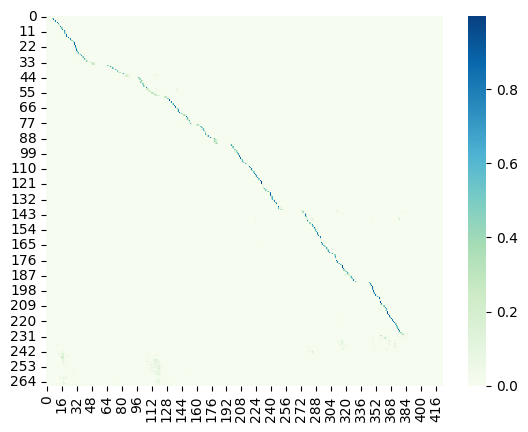

Saved best model

Epoch: 48/80


Val:   3%|▎         | 1/33 [00:03<01:36,  3.02s/it, dist=4.3467]

Ground Truth :  WHEN AT LAST I REACHED CROFTON MY JOURNEY'S END IT TURNED OUT THAT THE STATION STAFF CONSISTED OF A HALF WITTED INDIVIDUAL WHO WAS STATIONMASTER PORTER AND CLERK COMBINED AND A HULKING LAD WHO DID WHATEVER ELSE THERE WAS TO DO
Prediction   :  WHEN AT LAST I REACHED CROFT IN MY JOURNEY'S END IT TURNED OUT THAT THE STATION STAFF CONSISTED OF A HALF WITTED INDIVIDUAL WHO WAS STATION MASTER PORTER AND CLERK COMBINED AND A HALKING LAD WHO DID WHATEVER ELSE THERE WAS TO DO


Val:   6%|▌         | 2/33 [00:05<01:22,  2.65s/it, dist=5.3700]

Ground Truth :  KEEP YOUR APPOINTMENT AND BE ASSURED THAT I SHALL ISSUE MY COMMANDS WITH MORE CIRCUMSPECTION FOR THE FUTURE AS I FIND HOW STRICTLY THEY ARE COMPLIED WITH
Prediction   :  KEEP YOUR APPOINTMENT AND BE ASSURED THAT I SHALL ISSUE MY COMMANDS WITH MORE CIRCUMSPECTION FOR THE FUTURE AS I FIND HOW STRICT ME THEY ARE COMPLIED WITH


Val:   9%|▉         | 3/33 [00:07<01:15,  2.53s/it, dist=5.1044]

Ground Truth :  WHAT IS HE MORE THAN ANYBODY ELSE SAID THE WRETCHED MAN TO HIMSELF AS HE HUGGED HIS MISERY CLOSE
Prediction   :  WHAT IS HE MORE THAN ANYBODY ELSE SAID THE WRETCHED MAN TO HIMSELF AS HE HUGGED HIS MISERY CLOSE


Val:  12%|█▏        | 4/33 [00:10<01:11,  2.47s/it, dist=5.0033]

Ground Truth :  THIS WILD MOTHER HAS NOT ONLY THE EXPERIENCE OF HER MOTHER AND GRANDMOTHER AND THE ACCEPTED RULES OF HER PEOPLE FOR A GUIDE BUT SHE HUMBLY SEEKS TO LEARN A LESSON FROM ANTS BEES SPIDERS BEAVERS AND BADGERS
Prediction   :  THE SWILED MOTHER HAS NOT ONLY THE EXPERIENCE OF HER MOTHER ANGRANDMOTHER AND ACCEPTED RULES OF HER PEOPLE FOR A GUIDE BUT SHE HUMBLY SEEKS TO LEARN A LESSON FROM ANSWER THESE SPIDERS BEAVERS AND BADGERS


Val:  15%|█▌        | 5/33 [00:12<01:09,  2.49s/it, dist=5.0853]

Ground Truth :  WE WERE INURED TO PRIVATIONS AND HARDSHIPS HAD BEEN UPON EVERY MARCH IN EVERY BATTLE IN EVERY SKIRMISH IN EVERY ADVANCE IN EVERY RETREAT IN EVERY VICTORY IN EVERY DEFEAT
Prediction   :  WE WERE A NORT TO PRIVATIONS AND HARDSHIPS HAD BEEN UPON EVERY MARCH IN EVERY BATTLE IN EVERY STARLISH IN EVERY ADVANCE AND EVERY RETREAT IN EVERY VICTORY AND EVERY DEFEAT


Val:  18%|█▊        | 6/33 [00:15<01:06,  2.46s/it, dist=5.0289]

Ground Truth :  AT THE SOLEMN HOUR OF SUNRISE OR SUNSET HE TOOK UP HIS POSITION OVERLOOKING THE GLORIES OF EARTH AND FACING THE GREAT MYSTERY AND THERE HE REMAINED NAKED ERECT SILENT AND MOTIONLESS EXPOSED TO THE ELEMENTS AND FORCES OF HIS ARMING FOR A NIGHT AND A DAY TO TWO DAYS AND NIGHTS BUT RARELY LONGER
Prediction   :  AT THE SALAMOUR OF SUNRISER SHUNS AT HE TOOK UP HIS POSITION OVERLOOKING THEM GLORIES A WORK AND FACE IN THE GREY MYSTERY AND THERE HE REMAINED NAKED ERECT SILENT AND MOTIONLESS EXPOSED TO THE ELEMENTS AND FORCES OF HIS ARMING FOR A NIGHT IN THE DAY TO TWO DAYS AND NIGHTS BUT RARELY LONGER


Val:  21%|██        | 7/33 [00:17<01:05,  2.51s/it, dist=5.1229]

Ground Truth :  HE DECIDED TO WRITE HER CARE OF THE WEST SIDE POST OFFICE AND ASK FOR AN EXPLANATION AS WELL AS TO HAVE HER MEET HIM
Prediction   :  HE DECIDED TO WRITE HER CARE OF THE WEST SIDE POST OFFICE AND ASKED FOR AN EXPLANATION AS WELL AS TO HAVE HER MEET HIM


Val:  24%|██▍       | 8/33 [00:20<01:03,  2.52s/it, dist=5.4508]

Ground Truth :  I HAVE REMAINED A PRISONER ONLY BECAUSE I WISHED TO BE ONE AND WITH THIS HE STEPPED FORWARD AND BURST THE STOUT CHAINS AS EASILY AS IF THEY HAD BEEN THREADS
Prediction   :  I HAVE REMAINED THEIR PRESENTER ONLY BECAUSE I WISHED TO BE ONE AND WITH THIS HE STEPPED FORWARD AND BURST THE STOUT CHAINS AS EASILY AS IF THEY HAD BEEN THREADS


Val:  27%|██▋       | 9/33 [00:22<00:58,  2.45s/it, dist=5.2630]

Ground Truth :  WHEREVER SHE PLEASES ONLY I CAN'T WALK FAR
Prediction   :  WHEREVER SHE PLEASES ONLY I CAN'T WALK FAR


Val:  30%|███       | 10/33 [00:24<00:54,  2.39s/it, dist=5.2047]

Ground Truth :  IT'S THE FIRST TIME HILDA HAS BEEN TO OUR HOUSE AND TOM INTRODUCES HER AROUND
Prediction   :  IT'S THE FIRST TIME HILDA HAS BEEN TO OUR HOUSE AND TOM INTRODUCES HER AROUND


Val:  33%|███▎      | 11/33 [00:27<00:51,  2.35s/it, dist=5.1891]

Ground Truth :  WHAT SHOULD WE HAVE DONE IF EVERYBODY HAD KEPT ON BURNING WOOD TO THIS DAY
Prediction   :  WHAT SHOULD WE HAVE DONE IF EVERYBODY HAD CAPTUMBURGHTING WOOD TO THIS DAY


Val:  36%|███▋      | 12/33 [00:29<00:49,  2.36s/it, dist=5.1967]

Ground Truth :  THE MISTRESS HAD RETURNED AND THE YOUNG LADY WAS WITH HER AND HURRIED AT ONCE TO HER FAVOURITE GARDEN
Prediction   :  THE MISTRESS HAD RETURNED AND THE YOUNG LADY WAS WITH HER AND HURRIED AT ONCE TO HER FAVOURITE GARDEN


Val:  39%|███▉      | 13/33 [00:32<00:48,  2.41s/it, dist=5.1892]

Ground Truth :  WE WANT YOU TO HELP US PUBLISH SOME LEADING WORK OF LUTHER'S FOR THE GENERAL AMERICAN MARKET WILL YOU DO IT
Prediction   :  WE WANT YOU TO HELP US PUBLISH SOME LEADING WORK OF LUTHER'S FOR THE GENERAL AMERICAN MARKET WILL YOU DO IT


Val:  42%|████▏     | 14/33 [00:34<00:45,  2.38s/it, dist=5.1738]

Ground Truth :  I DECLARED MYSELF QUITE WILLING FOR IT WAS NECESSARY TO BRAZEN IT OUT AFTER HAVING VENTURED AS FAR AS I HAD DONE
Prediction   :  I DECLARED MYSELF QUITE WILLING FOR IT WAS NECESSARY TO BRAZEN IT OUT AFTER HAVING VENTURED AS FAR AS I HAD DONE


Val:  45%|████▌     | 15/33 [00:36<00:42,  2.35s/it, dist=5.0916]

Ground Truth :  ANOTHER ENGINEER RUSHED TOWARD THE DOOR TO SEE WHAT WAS HAPPENING OUTSIDE
Prediction   :  ANOTHER ENGINEER RUSHED TOWARD THE DOOR TO SEE WHAT WAS HAPPENING OUTSIDE


Val:  48%|████▊     | 16/33 [00:39<00:40,  2.39s/it, dist=5.1742]

Ground Truth :  AT LAST HE CAME OUT OF THEM AND WIPED HIS FACE VIGOROUSLY
Prediction   :  AT LAST HE CAME OUT OF THEM AND WIPED HIS FACE VIGOROUSLY


Val:  52%|█████▏    | 17/33 [00:41<00:38,  2.39s/it, dist=5.1420]

Ground Truth :  THE THREE FRIENDS WERE ASTOUNDED
Prediction   :  THE THREE FRIENDS WERE ASTOUNDED


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.35s/it, dist=5.1207]

Ground Truth :  LARGE FLOCKS DWELL HERE FROM YEAR TO YEAR WINTER AND SUMMER DESCENDING OCCASIONALLY INTO THE ADJACENT SAGE PLAINS AND LAVA BEDS TO FEED BUT EVER READY TO TAKE REFUGE IN THE JAGGED CRAGS OF THEIR MOUNTAIN AT EVERY ALARM
Prediction   :  LARGE FLOCKS DO ALL HERE FROM YEAR TO YOUR WINTER AND SUMMER DESCENDING OCCASIONALLY INTO THE ADJACENT SAGE PLAINS AND LOVE A BEDS TO FEED BUT EVER READY TO TAKE REFUGE IN THE JAGGED CRAGS OF THEIR MOUNTAIN AT EVERY ALARM


Val:  58%|█████▊    | 19/33 [00:46<00:33,  2.37s/it, dist=5.1523]

Ground Truth :  SHE HAD NO COMPANION NEAR HER
Prediction   :  SHE HAD NO COMPANION NEAR HER


Val:  61%|██████    | 20/33 [00:48<00:31,  2.39s/it, dist=5.1303]

Ground Truth :  BUT AS TO GETTING ALONGSIDE THE DUNCAN GOD FORBID
Prediction   :  BUT ASKED TO GETTING A LONG SIDE THE DANKING GOD FOR BID


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.37s/it, dist=5.2206]

Ground Truth :  HER HANDS SHOULD HAVE BEEN FULL OF BLUEBELLS AND SHE SHOULD HAVE HELD THEM UP TO HIS FACE IN MAIDENLY DEFENCE AS HE SPRANG FORWARD TO TAKE HER IN HIS ARMS
Prediction   :  HER HANDS SHOULD HAVE BEEN FULL OF BLUE BELLS AND SHE SHOULD HAVE HELD THEM UP TO HIS FACE AND MADE HIMLY DEVENTS AS HE SPRANG A BORE TO TAKE HER IN HIS ARMS


Val:  67%|██████▋   | 22/33 [00:53<00:26,  2.41s/it, dist=5.1776]

Ground Truth :  IT IS A VERY FINE OLD PLACE OF RED BRICK SOFTENED BY A PALE POWDERY LICHEN WHICH HAS DISPERSED ITSELF WITH HAPPY IRREGULARITY SO AS TO BRING THE RED BRICK INTO TERMS OF FRIENDLY COMPANIONSHIP WITH THE LIMESTONE ORNAMENTS SURROUNDING THE THREE GABLES THE WINDOWS AND THE DOOR PLACE
Prediction   :  IT IS A VERY FINE OLD PLACE OF RED BRICK SOFTENED BY A PEEL POWDERY LIKEN WHICH HAS DISPURSED ITSELF WITH HAPPY IRREGULARITY SO AS TO BRING THE RED BRICK INTO TERMS OF FRIENDLY COMPANIONSHIP WITH A LINE STONE ORNAMENTS SURROUNDING THE THREE GABLES THE WINDOWS AND THE DOOR PLACE


Val:  70%|██████▉   | 23/33 [00:55<00:24,  2.46s/it, dist=5.2322]

Ground Truth :  THAT EXTRAORDINARY REFORM IN MORALS WHICH ACCORDING TO SALVIAN AND HIS CONTEMPORARIES THE VANDAL CONQUERORS WORKED IN NORTH AFRICA AVAILED THEM NOTHING THEY LOST MORE THAN THEY GAVE
Prediction   :  THAT EXTRAORDINARY REFORM IN MORALS WHICH ACCORDING TO SALVION AND HIS CONTEMPORARIES THE VANDAL CONQUERORS WORKED IN NORTH AFRICA AVAILED THEM NOTHING THEY LOST MORE THAN THEY GAVE


Val:  73%|███████▎  | 24/33 [00:58<00:21,  2.42s/it, dist=5.2161]

Ground Truth :  IT WASN'T SIMPLY THAT SHE SAID SO BUT THAT I KNEW SHE HADN'T I WAS SURE I COULD SEE
Prediction   :  I SENT SIMPLY THAT SHE SAID SO BUT THAT I KNEW SHE HADN'T I WAS SURE I COULD SEE


Val:  76%|███████▌  | 25/33 [01:00<00:18,  2.37s/it, dist=5.2573]

Ground Truth :  AND IN HIS SPEECH HE LAUGH'D AND LAUGH'D AGAIN THEN WHILE IT WAS HIS PLEASURE TO REMAIN I CHANCED TO LOOK THE WAY HE HAD DRAWN NEAR AND SAW THE LADIES JOAN AND BEATRICE APPROACH ME THIS THE OTHER FOLLOWING ONE AND A SECOND MARVEL INSTANTLY
Prediction   :  INTO HIS SPEECH HE LAUGHED AND LAUGHED AGAIN THEM WHILE IT WAS HIS PLEASURED REMAIN I CHANCED TO LOOK AWAY HE HAD DRAWN NEAR AND SAW THE LADIES JONE AND BEATRICE APPROACHED ME THIS THE OTHER FOLLOWING ONE IN A SECOND MARBLE INSTANTLY


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.37s/it, dist=5.2295]

Ground Truth :  I AM LOOKING AT HIM NOW
Prediction   :  I AM LOOKING AT HIM NOW


Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.33s/it, dist=5.2279]

Ground Truth :  AN INSTANT LATER IT CRASHED OVER PINNING MARK FABER BENEATH IT
Prediction   :  AN INSTANT LATER IT CRASHED OVER PENING MARK FABER BENEATH IT


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.28s/it, dist=5.1552]

Ground Truth :  IF I SAY TO AN AMERICAN THAT THE COUNTRY HE LIVES IN IS A FINE ONE AY HE REPLIES THERE IS NOT ITS FELLOW IN THE WORLD
Prediction   :  IF I SAY TO AN AMERICAN THAT THE COUNTRY LIVES IN IS A FINE ONE I HE REPLIES THERE IS NOT ITS FELLOW IN THE WORLD


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.27s/it, dist=5.1499]

Ground Truth :  FRANK READ ENGLISH SLOWLY AND THE MORE HE READ ABOUT THIS DIVORCE CASE THE ANGRIER HE GREW
Prediction   :  FRANK RED ENGLISH SPOTY AND THE MORE HE READ ABOUT THIS DIVORCE CASE THE ANGRIER HE GREW


Val:  91%|█████████ | 30/33 [01:11<00:06,  2.32s/it, dist=5.1727]

Ground Truth :  EVERY TIME HE BEHELD THE OBJECT OF HIS PASSION FOR HE STILL CONTINUED HIS VISITS THOUGH NOT SO FREQUENTLY AS HERETOFORE HE PLEADED HIS CAUSE WITH SUCH ARDOUR THAT MISS WOODLEY WHO WAS SOMETIMES PRESENT AND EVER COMPASSIONATE COULD NOT RESIST WISHING HIM SUCCESS
Prediction   :  EVERY TIME HE BEHELD THE OBJECT OF HIS PASSION FOR HE STILL CONTINUED HIS VISITS THOUGH NOT SO FREQUENTLY AS HERE TO FOUR HE PLEADED HIS CAUSE WITH SUCH ARDOUR THAT MISS WOODLEY WHO WAS SOMETIMES PRESENT AND EVER COMPASSIONATE COULD NOT RESIST WISHING HIM SUCCESS


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.27s/it, dist=5.1467]

Ground Truth :  NOTHING CAN SURPRISE ME NOW I'M PREPARED FOR ANY THING EVEN THE SIGHT OF MY QUAKERISH LOVER DANCING A JIG
Prediction   :  NOTHING CAN SURPRISE ME NOW I'M PREPARED FOR ANYTHING EVEN THE SIGHT OF MY QUAKERISH LOVER DANCING A JAKE


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.35s/it, dist=5.1654]

Ground Truth :  I REACHED MY DESTINATION IN ONE OF THE LAST MONTHS OF EIGHTEEN SIXTY EIGHT BUT I DARE NOT MENTION THE SEASON LEST THE READER SHOULD GATHER IN WHICH HEMISPHERE I WAS
Prediction   :  I REACHED MY DESINATION IN ONE OF THE LAST MONTHS OF EIGHTEEN SIXTY EIGHT BUT I DARE NOT MENTION THE SEASON LEST THE READER SHOULD GATHER IN WHICH HEMISPHERE I WAS


Val: 100%|██████████| 33/33 [01:17<00:00,  1.98s/it, dist=5.1771]

Ground Truth :  AND WHAT ALLUREMENTS OR WHAT VANTAGES UPON THE FOREHEAD OF THE OTHERS SHOWED THAT THOU SHOULDST TURN THY FOOTSTEPS UNTO THEM
Prediction   :  AND WHAT A LORMANCE OR WHAT VANTAGES UPON THE FOUR HEAD OF THE OTHER SHOWED THAT THOU SHOULD TURN THY FOOT'S TEPS UNTO THEM


	Train Loss 0.1259	 Learning Rate 0.0004781
	Val Dist 5.1771	
	Teacher Forcing Ratio 1	


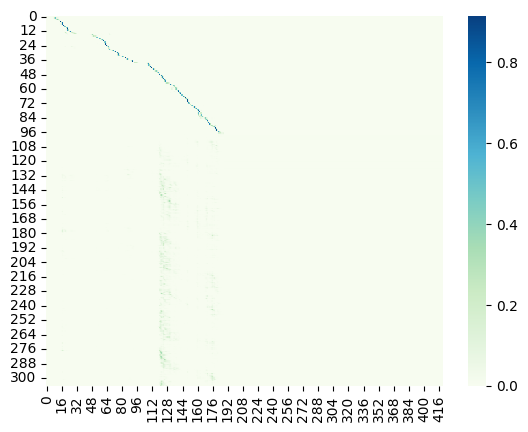

Saved best model

Epoch: 49/80


Val:   3%|▎         | 1/33 [00:02<01:34,  2.96s/it, dist=4.5267]

Ground Truth :  HE PROTECTED HER AND SHE STRENGTHENED HIM
Prediction   :  HE PROTECTED HER AND SHE STRENGTHENED HIM


Val:   6%|▌         | 2/33 [00:05<01:24,  2.71s/it, dist=5.1133]

Ground Truth :  THE DEPARTING LADIES WHO HAD SAID THEY WOULD STAY DIDN'T OF COURSE THANK HEAVEN STAY THEY DEPARTED IN CONSEQUENCE OF ARRANGEMENTS MADE IN A RAGE OF CURIOSITY AS THEY PROFESSED PRODUCED BY THE TOUCHES WITH WHICH HE HAD ALREADY WORKED US UP
Prediction   :  THE DEPARTING LADIES WHO HAD SAID THEY WOULD STAY DIDN'T OF COURSE THANK HEAVEN STAY THEY DEPARTED IN CONSEQUENCE OF ARRANGEMENTS MADE IN A RAGE OF CURIOSITY AS THEY PROFESSED PRODUCED BY THE TOUCHES WITH WHICH HE HAD ALREADY WORKED US UP


Val:   9%|▉         | 3/33 [00:07<01:14,  2.49s/it, dist=4.8289]

Ground Truth :  WHEN THEY ENTERED THE STAGE BOX ON THE LEFT THE FIRST ACT WAS WELL UNDER WAY THE SCENE BEING THE INTERIOR OF A CABIN IN THE SOUTH OF IRELAND
Prediction   :  WHEN THEY ENTERED THE STAGE BOX ON THE LEFT THE FIRST ACT WAS WELL UNDER WAY THE SCENE BEING THE INTERIOR OF A CABIN IN THE SOUTH OF IRELAND


Val:  12%|█▏        | 4/33 [00:09<01:09,  2.39s/it, dist=4.4883]

Ground Truth :  HE PUT HIS SHOES ON THE TABLE
Prediction   :  HE PUT HIS SHOES ON THE TABLE


Val:  15%|█▌        | 5/33 [00:12<01:05,  2.34s/it, dist=4.5187]

Ground Truth :  TEN SECONDS
Prediction   :  THEN SECONDS


Val:  18%|█▊        | 6/33 [00:14<01:02,  2.31s/it, dist=4.5256]

Ground Truth :  FOR A MOMENT GILCHRIST WITH UPRAISED HAND TRIED TO CONTROL HIS WRITHING FEATURES
Prediction   :  FOR A MOMENT GUILCRESSED WITH UPRAISED HAND TRIED TO CONTROL HIS WRITHING FEATURES


Val:  21%|██        | 7/33 [00:16<01:00,  2.32s/it, dist=4.8000]

Ground Truth :  THEY WERE ALL TAKEN ABACK AND NOT ONE OF THEM DARED TO UTTER A WORD SUCH DEFERENCE DID THEY PAY HIM
Prediction   :  THEY WERE ALL TAKEN ABACK AND NOT ONE OF THEM DARED TO UTTER A WORD SUCH DEFERENCE DID THEY PAY HIM


Val:  24%|██▍       | 8/33 [00:19<00:57,  2.31s/it, dist=4.7850]

Ground Truth :  THE DESIGN WAS DIFFERENT BUT THE THING WAS CLEARLY THE SAME
Prediction   :  THE DESIGN WAS DIFFERENT BUT THE THING WAS CLEARLY THE SAME


Val:  27%|██▋       | 9/33 [00:21<00:55,  2.33s/it, dist=4.7222]

Ground Truth :  NOTE THE WINE IN THIS SAUCE MAY BE OMITTED AND AN ONION SLICED AND FRIED OF A NICE BROWN SUBSTITUTED FOR IT
Prediction   :  NOTE THE WINE IN THIS SAUCE MAY BE OMITTED AND AN ONION SLICED AND FRIED OF A NICE BROWN SUBSTITUTED FOR IT


Val:  30%|███       | 10/33 [00:24<00:55,  2.43s/it, dist=5.0167]

Ground Truth :  I DON'T THINK HIS GUN WAS LOADED THOUGH BECAUSE WE DID NOT HEAR THE BALL WHISTLE
Prediction   :  I DON'T THINK HIS GUN WAS LOADED THOUGH BUT AS WE DID NOT HEAR THE BALL WHISTLE


Val:  33%|███▎      | 11/33 [00:26<00:53,  2.44s/it, dist=4.9988]

Ground Truth :  SANCHO SAID THEY HAD BUT THAT THREE KERCHIEFS THAT WERE WORTH THREE CITIES WERE MISSING
Prediction   :  SANCHO SAID THEY HAD BUT THAT THREE CURCHIEFS THAT WERE WORTH THREE CITIES WERE MISSING


Val:  36%|███▋      | 12/33 [00:29<00:51,  2.46s/it, dist=5.0956]

Ground Truth :  LONG PEPPER THIS IS THE PRODUCE OF A DIFFERENT PLANT FROM THAT WHICH PRODUCES THE BLACK IT CONSISTING OF THE HALF RIPE FLOWER HEADS OF WHAT NATURALISTS CALL PIPER LONGUM AND CHABA
Prediction   :  LONG PEPPER THIS IS THE PRODUCE OF A DIFFERENT PLANT FROM THAT WHICH PRODUCES THE BLACK IT CONSISTING OF THE HALF RIGHT FLOWER HEADS OF WHAT NATURALISTS CALLED PIPER LONGUM AND CHABA


Val:  39%|███▉      | 13/33 [00:31<00:48,  2.42s/it, dist=5.0374]

Ground Truth :  HE HAD WRITTEN A NUMBER OF BOOKS HIMSELF AMONG THEM A HISTORY OF DANCING A HISTORY OF COSTUME A KEY TO SHAKESPEARE'S SONNETS A STUDY OF THE POETRY OF ERNEST DOWSON ET CETERA
Prediction   :  HE HAD WRITTEN A NUMBER OF BOOKS HIMSELF AMONG THEM A HISTORY OF DANCING A HISTORY OF COSTUME A KEY TO SHAKESPEARE SONNETS A STUDY OF THE POETRY OF EARNEST DOUBTSON ET CETERA


Val:  42%|████▏     | 14/33 [00:33<00:44,  2.36s/it, dist=4.9952]

Ground Truth :  BED TIME CHILDREN
Prediction   :  BENTIME CHILDREN


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.43s/it, dist=5.0311]

Ground Truth :  SHE ASKED IMPULSIVELY I DIDN'T BELIEVE YOU COULD PERSUADE HER FATHER
Prediction   :  SHE ASKED IMPULSIVELY I DIDN'T BELIEVE YOU COULD PERSUADE HER FATHER


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.40s/it, dist=4.9500]

Ground Truth :  OTHER SWEET HERBS ARE CULTIVATED FOR PURPOSES OF MEDICINE AND PERFUMERY THEY ARE MOST GRATEFUL BOTH TO THE ORGANS OF TASTE AND SMELLING AND TO THE AROMA DERIVED FROM THEM IS DUE IN A GREAT MEASURE THE SWEET AND EXHILARATING FRAGRANCE OF OUR FLOWERY MEADS
Prediction   :  OTHER SWEET HERBS ARE CULTIVATED FOR PURPOSES OF MEDICINE AND PERFUMERY THEY ARE MOST GRATEFUL BOTH TO THE ORGANS OF TASTE AND SMELLING AND TO THE AROMA DERIVED FROM THEM IS DUE IN A GREAT MEASURE THE SWEET AND EXILERATING FRAGRANCE OF OUR FLOWERY MEADS


Val:  52%|█████▏    | 17/33 [00:40<00:38,  2.39s/it, dist=4.9686]

Ground Truth :  IT WAS THE WHITE RABBIT RETURNING SPLENDIDLY DRESSED WITH A PAIR OF WHITE KID GLOVES IN ONE HAND AND A LARGE FAN IN THE OTHER HE CAME TROTTING ALONG IN A GREAT HURRY MUTTERING TO HIMSELF AS HE CAME OH THE DUCHESS THE DUCHESS
Prediction   :  IT WAS THE WHITE RABBIT RETURNING SPLENDIDLY DRESSED THE PAIR WHITE KID GLOVES IN ONE HAND AND A LARGE FAN IN THE OTHER HE CAME TROTTING ALONG IN A GREAT HURRY MUTTERING TO HIMSELF AS HE CAME OH THE DUTCHES THE DUCHESS


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.38s/it, dist=4.9163]

Ground Truth :  THE PLACARD GWYNPLAINE THE LAUGHING MAN TAKEN FROM ITS NAIL IN THE GREEN BOX WAS HUNG UP CLOSE TO THE SIGN OF THE INN
Prediction   :  THE PLACKERED WHEN PLAIN THE LAPPING MAN TAKEN FROM ITS NAIL IN THE GREENBOX WAS HUNG UP CLOSE TO THE SIGN OF THE INN


Val:  58%|█████▊    | 19/33 [00:45<00:33,  2.37s/it, dist=4.8870]

Ground Truth :  HE INTENDED TO LEAVE EARLY IN THE MORNING BUT FIRST HE SOUGHT HIS FRIENDS AND TOLD THEM GOOD BYE
Prediction   :  HE INTENDED TO LEAVE EARLY IN THE MORNING THAT FIRST HE SAW THIS FRIENDS AND TOLD THEM GOOD BYE


Val:  61%|██████    | 20/33 [00:47<00:30,  2.33s/it, dist=4.8543]

Ground Truth :  HIS FACE HAD A LOOK OF WEARINESS AND PLEASURE LIKE THAT OF SICK PEOPLE WHEN THEY FEEL RELIEF FROM PAIN
Prediction   :  HIS FACE HAD A LOOK OF WEARINESS AND PLEASURE LIKE THAT OF SICK PEOPLE WHEN THEY FEEL RELIEF FROM PAIN


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.37s/it, dist=4.9514]

Ground Truth :  A FEW STRAY COWS AND SHEEP WERE ONLY SEEN OCCASIONALLY
Prediction   :  A FEW STRAIGHT COWS AND SHEEP WERE ONLY SOME OCCASIONALLY


Val:  67%|██████▋   | 22/33 [00:53<00:27,  2.46s/it, dist=5.0079]

Ground Truth :  AGAIN THERE WAS A VERY OLD CARRIAGE WHOSE WHEELS IN SPITE OF RUST AND DECAY I COULD SEE HAD BEEN DESIGNED ORIGINALLY FOR IRON RAILS
Prediction   :  AGAIN THOSE OF AILED CARRIAGE WHOSE WHEELS IN SPITE OF REST AND DECAY I COULD SEE HAD BEEN DESIGNED ORIGINALLY FOR IRON RAILS


Val:  70%|██████▉   | 23/33 [00:55<00:24,  2.49s/it, dist=5.0313]

Ground Truth :  A MAN WAS LOOKING IN FROM THE CORRIDOR BEHIND AT THE FOUR PERSONS WE WERE JUST DISCUSSING
Prediction   :  A MAN WAS LOOKING IN FROM THE CORDOR BEHIND AT THE FOUR PERSONS WE WERE JUST DISCUSSING


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.43s/it, dist=4.9783]

Ground Truth :  I WAS DELIGHTED WITH THE COUNTRY AND THE MANNER OF LIFE
Prediction   :  I WAS DELIGHTED WITH THE COUNTRY AND THE MANNER OF LIFE


Val:  76%|███████▌  | 25/33 [01:00<00:19,  2.43s/it, dist=5.0085]

Ground Truth :  A FAINT FETID SMELL CAME FROM HIM AND A THREAD OF GREEN LIQUID OOZED FROM HIS CRUSHED HEAD
Prediction   :  A FAINT FEDENT SMELL CAME FROM HIM AND A THREAD OF GREEN LIQUID OOZED FROM HIS CRUSHED HEAD


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.38s/it, dist=4.9826]

Ground Truth :  I DON'T WANT YOU TO I LOVE TO SEE YOU SO YOUNG AND HAPPY ONLY YOU ARE NOT THE OLD DAVID AND I'VE GOT TO GET ACQUAINTED WITH THE NEW ONE
Prediction   :  I DON'T WANT YOU'RE TOO I LOVED TO SEE YOU SO A YOUNG AND TAPPY ONLY YOU ARE NOT THE OLD DAYFORD AND OF GOT TO GET ACQUAINTED WITH THE NEW ONE


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.39s/it, dist=4.9736]

Ground Truth :  MISTER SOAMES WAS SOMEWHAT OVERWHELMED BY THIS FLOOD OF INFORMATION
Prediction   :  MISTER SONGS WAS SOMEWHAT OVERWHELMED BY THIS FLET OF INFORMATION


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.34s/it, dist=4.9993]

Ground Truth :  AY ME
Prediction   :  I ME


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.32s/it, dist=4.9685]

Ground Truth :  SO TO THE ROAD THOU SHALT BE RECONCILED AND FIND THE LADY AND WITH THE LADY LOVE
Prediction   :  SO TO THE ROAD THOU SHALT BE RECONCILED AND FIND THE LADY AND WITH THE LADY LOVE


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.38s/it, dist=4.9884]

Ground Truth :  SUPPOSING THE REPORT HAD BEEN TRUE
Prediction   :  SUPPOSING THE REPORT HAD BEEN TRUE


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.38s/it, dist=5.0361]

Ground Truth :  FOR AMBROSCH MY MAMA COME HERE
Prediction   :  FOR AMBRUSH MY MAMMA COME HERE


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.35s/it, dist=5.0027]

Ground Truth :  ONE EVENING URSUS WAS IN THE SIDE SCENE WHICH WAS THE KITCHEN DOOR OF THE GREEN BOX SEEING MASTER NICLESS STANDING BY HIM SHOWED HIM THIS MAN IN THE CROWD AND ASKED HIM
Prediction   :  ONE EVENING ERSIS WAS IN THE SIDE SCENE WHICH WAS THE KITCHEN DOOR OF THE GREEN BOX SEEING MASTER NICHOLAS DANDING BY HIM SHOWED HIM THIS MEN IN THE CROWD AND ASKED HIM


Val: 100%|██████████| 33/33 [01:17<00:00,  1.98s/it, dist=4.9913]

Ground Truth :  WHEN A MARRIED WOMAN HAS FOLLOWERS AND THE HUSBAND DON'T GO THE WRONG SIDE OF THE POST TOO OR IT AIN'T PROVED AGAIN HIM THAT HE DO THEY'LL NEVER LET HER HAVE NOTHING TO DO WITH THE CHILDREN
Prediction   :  WHEN A MARRIED WOMAN HAS FOLLOWERS AND THE HUSBAND DON'T GO THE WRONG SIDE OF THE POST TOO OR ANYTHER PROVED AGAIN HIM THAT HE DO THOUGH NEVER LET HER HAVE NOTHING TO DO WITH THE CHILDREN


	Train Loss 0.1195	 Learning Rate 0.0004557
	Val Dist 4.9913	
	Teacher Forcing Ratio 1	


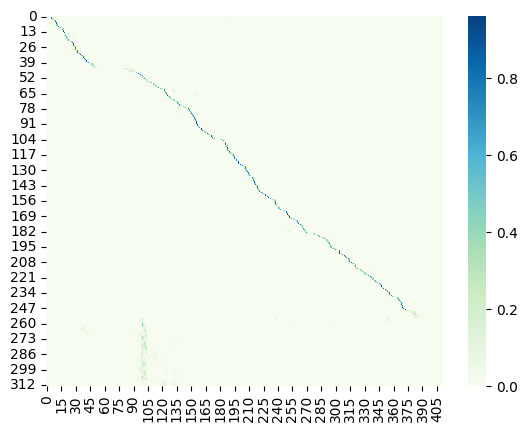

Saved best model

Epoch: 50/80


Val:   3%|▎         | 1/33 [00:02<01:31,  2.85s/it, dist=3.7600]

Ground Truth :  GLOVES SAID THE YOUNG MAN
Prediction   :  GLOVES SAID THE YOUNG MAN


Val:   6%|▌         | 2/33 [00:05<01:16,  2.48s/it, dist=4.3333]

Ground Truth :  HE ENTERED A LARGE FORECOURT AND STOOD STILL WITH AMAZEMENT AND AWE
Prediction   :  HE ENTERED A LARGE FOUR CORDIALS STOOD STILL WITH AMAZEMENT AND AWE


Val:   9%|▉         | 3/33 [00:07<01:11,  2.39s/it, dist=4.3689]

Ground Truth :  ILLUSTRATION GINGER
Prediction   :  ILLUSTRATION GINGER


Val:  12%|█▏        | 4/33 [00:09<01:09,  2.39s/it, dist=4.5417]

Ground Truth :  AFTER THE CEREMONY AT THE CHURCH THE PARTY WENT TO A DINNER GIVEN BY THE PARENTS OF THE BRIDE
Prediction   :  AFTER THE CEREMONY AT THE CHURCH THE PARTY WENT TO A DINNER GIVEN BY THE PARENTS OF THE BRIDE


Val:  15%|█▌        | 5/33 [00:12<01:07,  2.42s/it, dist=4.4520]

Ground Truth :  THIS OUTWARD MUTABILITY INDICATED AND DID NOT MORE THAN FAIRLY EXPRESS THE VARIOUS PROPERTIES OF HER INNER LIFE
Prediction   :  THIS OUTWARD MUTIBILITY INDICATED AND DID NOT MORE THAN FAIRLY EXPRESSED THE VARIOUS PROPERTIES OF HER INNER LIFE


Val:  18%|█▊        | 6/33 [00:14<01:04,  2.38s/it, dist=4.3600]

Ground Truth :  THEN ALL THE OTHER BIRDS CHIRPED EAGERLY YES YES LET US ASK HER TO TEACH US
Prediction   :  THEN ALL THE OTHER BIRDS TURKED EAGERLY YES YES WAS ASKED HER TO DATE JUST


Val:  21%|██        | 7/33 [00:16<01:01,  2.38s/it, dist=4.2486]

Ground Truth :  I TOLD MYSELF THAT IF I WERE REALLY THINKING OF YOU AND NOT OF MYSELF A LETTER WOULD BE BETTER THAN NOTHING
Prediction   :  I TOLD MYSELF THAT IF I WERE REALLY THINKING OF YOU AND NOT OF MYSELF A LETTER WOULD BE BETTER THAN NOTHING


Val:  24%|██▍       | 8/33 [00:19<00:59,  2.38s/it, dist=4.2592]

Ground Truth :  WHATEVER HER SWEET EYES ARE TURNED UPON SPIRITS OF LOVE DO ISSUE THENCE IN FLAME WHICH THROUGH THEIR EYES WHO THEN MAY LOOK ON THEM PIERCE TO THE HEART'S DEEP CHAMBER EVERY ONE
Prediction   :  WHATEVER HER SWEET EYES ARE TURNED UPON SPIRITS OF LOVE TO ISSUE THEMSELVES FLAME WHICH THROUGH THEIR EYES WHO THEN MAY LOOK ON THEM PIERCED TO THE HEART STEEP CHAMBER EVERYONE


Val:  27%|██▋       | 9/33 [00:21<00:58,  2.42s/it, dist=4.2526]

Ground Truth :  SHEEP AND CATTLE WERE INTRODUCED AND BRED WITH EXTREME RAPIDITY MEN TOOK UP THEIR FIFTY THOUSAND OR ONE HUNDRED THOUSAND ACRES OF COUNTRY GOING INLAND ONE BEHIND THE OTHER TILL IN A FEW YEARS THERE WAS NOT AN ACRE BETWEEN THE SEA AND THE FRONT RANGES WHICH WAS NOT TAKEN UP AND STATIONS EITHER FOR SHEEP OR CATTLE WERE SPOTTED ABOUT AT INTERVALS OF SOME TWENTY OR THIRTY MILES OVER THE WHOLE COUNTRY
Prediction   :  SHEEP AND CATTLE WERE INTRODUCED AND BREAD WITH EXTREME REPITITY MEN TOOK UP THEIR FIFTY THOUSAND OR ONE HUNDRED THOUSAND ACRES OF COUNTRY GOING INLAND ONE BEHIND THE OTHER TILL IN A FEW YEARS THERE WAS NOT AN ACRE BETWEEN THE SEA AND THE FRONT RANGES WHICH WAS NOT TAKEN UP AND STATIONS EITHER FOR SHEEP OF CATTLE WERE SPOTTED ABOUT AT INTERVALS OF SOME TWENTY OR THIRTY MILES OVER THE WHOLE COUNTRY


Val:  30%|███       | 10/33 [00:24<00:56,  2.44s/it, dist=4.2940]

Ground Truth :  BUT IN REALITY HANSEL WAS NOT LOOKING AT A CAT BUT EVERY TIME HE STOPPED HE DROPPED A PEBBLE OUT OF HIS POCKET UPON THE PATH
Prediction   :  BUT IN REALITY HENCER WAS NOT LOOKING AT A CAT BUT EVERY TIME HE STOPPED HE JUCKED A PEBBLE OUT OF HIS POCKET UPON THE PATH


Val:  33%|███▎      | 11/33 [00:26<00:54,  2.47s/it, dist=4.2939]

Ground Truth :  SHE HAS LIFTED HER EYES OFF HER MANUSCRIPT SHE IS LOOKING OUT WITH KINDLING COUNTENANCE OVER THE GARDENS OF THE MUSEUM HER RIPE CURLING GREEK LIPS SUCH AS WE NEVER SEE NOW EVEN AMONG HER OWN WIVES AND SISTERS OPEN
Prediction   :  SHE HAS LEFT IT HER EYES OFF HER MANUSCRIPT SHE IS LOOKING OUT WITH KINDLING COUNTENANCE OVER THE GARDENS OF THE MUSIUM HER RIPE CURLING GREEK LIPS SUCH AS WE NEVER SEE NOW EVEN AMONG HER OWN WIVES AND SISTERS OPEN


Val:  36%|███▋      | 12/33 [00:29<00:51,  2.45s/it, dist=4.3622]

Ground Truth :  THEREAFTER THIS SONNET BRED IN ME DESIRE TO WRITE DOWN IN VERSE FOUR OTHER THINGS TOUCHING MY CONDITION THE WHICH THINGS IT SEEMED TO ME THAT I HAD NOT YET MADE MANIFEST
Prediction   :  THEREAFTER THE SON IT BREAD AND ME DESIRE TO RIGHT NOW INVERSE FOR OTHER THINGS TOUCHING MY CONDITION THE WHICH THINGS IT SEEMED TO ME THAT I HAD NOT YET MADE MANIFEST


Val:  39%|███▉      | 13/33 [00:31<00:48,  2.40s/it, dist=4.3687]

Ground Truth :  TO MORROW IS THE EXAMINATION
Prediction   :  TO MORROW AS THE EXAMINATION


Val:  42%|████▏     | 14/33 [00:33<00:45,  2.39s/it, dist=4.3986]

Ground Truth :  HE BEGAN PRESENTLY TO RELENT AND SPOKE TO ME IN A KINDER MANNER
Prediction   :  HE BEGAN PRESENTLY TO RELAND AND SPOKE TO ME IN A KINDER MANNER


Val:  45%|████▌     | 15/33 [00:36<00:42,  2.38s/it, dist=4.4689]

Ground Truth :  THE SWEETEST PERFUMES FLOATED THROUGH THE AIR WHILE THOUSANDS OF BIRDS ANSWERED THE MUSIC OF FOUNTAINS WITH THEIR SONGS
Prediction   :  THE SWEETEST PERFUMES FLOATED THROUGH THE AIR WHILE THOUSANDS OF BIRDS ANSWERED THE MUSIC OF FOUNTAINS WITH THEIR SONGS


Val:  48%|████▊     | 16/33 [00:38<00:39,  2.33s/it, dist=4.5096]

Ground Truth :  MY GUIDES HOWEVER WERE WELL KNOWN AND THE NATURAL POLITENESS OF THE PEOPLE PREVENTED THEM FROM PUTTING ME TO ANY INCONVENIENCE BUT THEY COULD NOT HELP EYEING ME NOR I THEM
Prediction   :  MY GUIDES HOWEVER WERE WELL KNOWN AND THE NATURAL POLITENESS OF THE PEOPLE PREVENTED THEM FROM PUTTING ME TO ANY INCONVENIENCE BUT THEY COULD NOT HELP I IN ME NOR I THEM


Val:  52%|█████▏    | 17/33 [00:40<00:38,  2.38s/it, dist=4.6325]

Ground Truth :  THE DELAWARES ARE CHILDREN OF THE TORTOISE AND THEY OUTSTRIP THE DEER
Prediction   :  THE DELAWARES ARE CHILDREN OF THE TORTUS AND THEY OUTSTRIP THE DEAR


Val:  55%|█████▍    | 18/33 [00:43<00:36,  2.40s/it, dist=4.6152]

Ground Truth :  YES
Prediction   :  YES


Val:  58%|█████▊    | 19/33 [00:45<00:33,  2.39s/it, dist=4.5867]

Ground Truth :  TO MEET WAS TO FIND EACH OTHER
Prediction   :  TWO MEAT WAS TO FIND EACH OTHER


Val:  61%|██████    | 20/33 [00:48<00:30,  2.36s/it, dist=4.7247]

Ground Truth :  SO LEAVING KIND MESSAGES TO GEORGE AND JANE WILSON AND HESITATING WHETHER SHE MIGHT DARE TO SEND A FEW KIND WORDS TO JEM AND DECIDING THAT SHE HAD BETTER NOT SHE STEPPED OUT INTO THE BRIGHT MORNING LIGHT SO FRESH A CONTRAST TO THE DARKENED ROOM WHERE DEATH HAD BEEN
Prediction   :  SO LEAVING KIND MESSAGES TO GEORGE IN JANE WILSON AND HESITATING WHETHER SHE MIGHT DARE TO SEND A FEW KIND WORDS TO JIM AND DECIDING THAT SHE HAD BETTER NOT SHE STEPPED OUT INTO THE BRIGHT MORNING LIGHT SO FRESH A CONTRAST TO THE DARKENED ROOM WHERE DEATH HAD BEEN


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.36s/it, dist=4.6794]

Ground Truth :  I DON'T KNOW WHAT I OUGHT TO SAY BUT I DON'T BELIEVE YOU'D BE HAPPY TRULY I DON'T AREN'T YOU TRYING TO FRIGHTEN ME
Prediction   :  I DON'T KNOW WHAT I OUGHT TO SAY BUT I DON'T BELIEVE YOU'D BE HAPPY TRULY I DON'T AREN'T YOU TRYING TO FRIGHTEN ME


Val:  67%|██████▋   | 22/33 [00:52<00:26,  2.37s/it, dist=4.6836]

Ground Truth :  THERE APPEARED TO BE AN IMMEDIATE ASSOCIATION WITH THE DEATH TRAUMA AS IF THE TWO WERE INEXTRICABLY LINKED INTO ONE
Prediction   :  THERE APPEARED TO BE AN IMMEDIATE ASSOCIATION WHAT'S THE DEATH TRAMA AS IF THE TWO WERE INEXTRICABLY LINCT INTO ONE


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.37s/it, dist=4.6872]

Ground Truth :  AS FOR ETCHINGS THEY ARE OF TWO KINDS BRITISH AND FOREIGN
Prediction   :  AS FOR ETCHINGS THERE OF TWO KINDS BRITISH AND FOREIGN


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.38s/it, dist=4.6464]

Ground Truth :  HE SMILED GUILTILY AS HE ADDED BUT I MUST ADMIT I WAS MORE THAN A LITTLE CONCERNED MYSELF
Prediction   :  HE SMILED GUILTILY AS HE ADDED BUT I MUST ADMIT I WAS MORE THAN A LITTLE CONCERNED MYSELF


Val:  76%|███████▌  | 25/33 [01:00<00:19,  2.42s/it, dist=4.6949]

Ground Truth :  HESTER COULD ONLY ACCOUNT FOR THE CHILD'S CHARACTER AND EVEN THEN MOST VAGUELY AND IMPERFECTLY BY RECALLING WHAT SHE HERSELF HAD BEEN DURING THAT MOMENTOUS PERIOD WHILE PEARL WAS IMBIBING HER SOUL FROM THE SPIRITUAL WORLD AND HER BODILY FRAME FROM ITS MATERIAL OF EARTH
Prediction   :  HESTER COULD ONLY ACCOUNT FOR THE CHILD'S CHARACTER AND EVEN THEN MOST MAGULIAND IMPERFECTLY BY RECALLING WHAT SHE HERSELF HAD BEEN DURING THAT MOMENT IS PERIOD WHILE PEARL WAS IMBIBING HER SOUL FROM THE SPIRITUAL WORLD AND HER BODILY FRAME FROM ITS MATERIAL OF EARTH


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.42s/it, dist=4.6359]

Ground Truth :  THE DISTINCTIONS OF MORAL VALUES HAVE EITHER ORIGINATED IN A RULING CASTE PLEASANTLY CONSCIOUS OF BEING DIFFERENT FROM THE RULED OR AMONG THE RULED CLASS THE SLAVES AND DEPENDENTS OF ALL SORTS
Prediction   :  THE DISTINCTIONS OF MORAL VALUES HAVE EITHER ORIGINATED IN A RULING CAST PLEASANTLY CONSCIOUS OF BEING DIFFERENT FROM THE RULE OR AMONG THE RULED CLASS THE SLAVES AND DEPENDENCE OF ALL SORTS


Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.46s/it, dist=4.6272]

Ground Truth :  NOR COULD IT SEEM STRANGE OR INCREDIBLE THAT THE FIRST OF THESE AEONS THE LOGOS OR WORD OF GOD OF THE SAME SUBSTANCE WITH THE FATHER SHOULD DESCEND UPON EARTH TO DELIVER THE HUMAN RACE FROM VICE AND ERROR AND TO CONDUCT THEM IN THE PATHS OF LIFE AND IMMORTALITY
Prediction   :  NOR COULD IT SEEM STRANGE OR INCREDIBLE THAT THE FIRST OF THESE IONS THE LOGAS OR WORD OF GOD OF THE SAME SUBSIDENCE WITH THE FATHER SHOULD DESCEND UPON EARTH TO DELIVER THE HUMAN RACE FROM VICE AND ERROR AND TO CONDUCT THEM IN THE PATHS OF LIFE AND IMMORTALITY


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.37s/it, dist=4.6638]

Ground Truth :  SHE WANTED TO MAKE SOME REFERENCE TO THEIR RELATIONS UPON THE TRAIN BUT WAS TOO TIMID
Prediction   :  SHE WANTED TO MAKE SOME REFERENCE TO THEIR RELATIONS UPON THE TRAIN BUT WAS TWO TIMID


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.38s/it, dist=4.6894]

Ground Truth :  IT IS OBVIOUSLY UNNECESSARY FOR US TO POINT OUT HOW LUMINOUS THESE CRITICISMS ARE HOW DELICATE IN EXPRESSION
Prediction   :  IT IS OBVIOUSLY UNNECESSARY FOR US TO POINT OUT HOW LUMINOUS THESE CRITICISMS ARE HOW DELICATE IN EXPRESSION


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.42s/it, dist=4.6851]

Ground Truth :  HE TOOK THE CASH BOX OUT OF THE DRAWER AND TURNING TO LEAVE THE SHOP BECAME AWARE THAT STEVIE WAS STILL DOWNSTAIRS
Prediction   :  HE TOOK THE CASH BOX OUT OF THE DOOR AND TURNING TO LEAVE THE SHOP THEY CAME OR THAT STAYED HE WAS STILL DOWNSTAIRS


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.36s/it, dist=4.6462]

Ground Truth :  BUT JOHN THERE'S NO SOCIETY JUST ELEMENTARY WORK
Prediction   :  BUT JOHN THERE'S NO SOCIETY JUST ELEMENTARY WORK


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.35s/it, dist=4.6379]

Ground Truth :  AS HOLMES DREW THE CURTAIN I WAS AWARE FROM SOME LITTLE RIGIDITY AND ALERTNESS OF HIS ATTITUDE THAT HE WAS PREPARED FOR AN EMERGENCY
Prediction   :  AS HOLMES DREW THE CURTAIN I WAS AWARE FROM SOME LITTLE RIGIDITY AND A LEARNNESS OF HIS ATTITUDE THAT HE WAS PREPARED FOR AN EMERGENCY


Val: 100%|██████████| 33/33 [01:17<00:00,  1.98s/it, dist=4.5875]

Ground Truth :  BUT IF YOU ASK ME MY OPINION WHY IN COURSE THEY'VE BEEN TOGETHER SOMEWHERE
Prediction   :  BUT IF YOU ASKED ME MY OPINION WHY IN COURSE THEY'VE BEEN TOGETHER SOMEWHERE


	Train Loss 0.1179	 Learning Rate 0.0004335
	Val Dist 4.5875	
	Teacher Forcing Ratio 1	


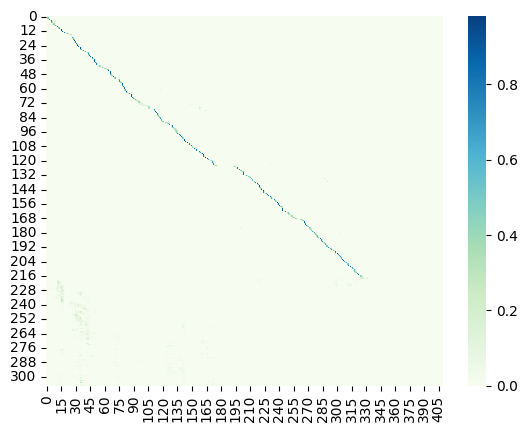

Saved best model

Epoch: 51/80


Val:   3%|▎         | 1/33 [00:02<01:34,  2.97s/it, dist=4.8867]

Ground Truth :  NATURALLY THEY REACHED HER FIRST
Prediction   :  NATURALLY THEY REACHED HER FIRST


Val:   6%|▌         | 2/33 [00:05<01:17,  2.49s/it, dist=4.1500]

Ground Truth :  ALL NIGHT IT HAD BEEN BLOWING AND RAINING
Prediction   :  ALL NIGHT IT HAD BEEN BLOWING AND RAINING


Val:   9%|▉         | 3/33 [00:07<01:11,  2.39s/it, dist=4.0822]

Ground Truth :  SCARED DAH WHO'S AFRAID ANSWERED HE
Prediction   :  SPEAK HEARD DOT WHOSE AFRAID ANSWERED HE


Val:  12%|█▏        | 4/33 [00:09<01:07,  2.33s/it, dist=4.1650]

Ground Truth :  IT WAS IDLE FOR HIM TO MOVE HIMSELF TO BE GENEROUS TOWARDS THEM TO TELL HIMSELF THAT IF HE EVER CAME TO THEIR GATES STRIPPED OF HIS PRIDE BEATEN AND IN BEGGAR'S WEEDS THAT THEY WOULD BE GENEROUS TOWARDS HIM LOVING HIM AS THEMSELVES
Prediction   :  IT WAS IDLE FOR HIM TO MOVE HIMSELF TO BE GENEROUS TOWARDS THEM TO TELL HIMSELF THAT IF HE EVER CAME TO THEIR GATES STRIPPED OF HIS PRIDE BEATEN THEN DIDN'T BEGGER'S WEEDS THAT THEY WOULD BE GENEROUS TOWARDS HIM LOVING HIM AS THEMSELVES


Val:  15%|█▌        | 5/33 [00:12<01:05,  2.35s/it, dist=4.2187]

Ground Truth :  IT NOW CONTAINED ONLY CHANTICLEER HIS TWO WIVES AND A SOLITARY CHICKEN
Prediction   :  IT NOW CONTAINED ONLY SHOUTED CLEAR HIS TWO WIVES AND A SOLITARY CHICKEN


Val:  18%|█▊        | 6/33 [00:14<01:04,  2.38s/it, dist=4.3233]

Ground Truth :  WHEN THEREFORE HE ADDRESSED HIMSELF TO ME IN THE LANGUAGE OF HORACE WE AT ONCE CAME TO UNDERSTAND ONE ANOTHER
Prediction   :  WHEN THEREFORE HE ADDRESSED HIMSELF TO ME IN THE LANGUAGE OF HORSE WE AT ONCE CAME TO UNDERSTAND ONE ANOTHER


Val:  21%|██        | 7/33 [00:16<01:02,  2.39s/it, dist=4.2305]

Ground Truth :  IT WOULD SERVE YOU ALL RIGHT IF SHE WALKED OFF WITH CARL
Prediction   :  IT WOULD SERVE YOU ALL RIGHT IF SHE WALKED OFF WITH CARL


Val:  24%|██▍       | 8/33 [00:19<01:00,  2.42s/it, dist=4.2342]

Ground Truth :  I SUPPOSE SEVERITY IS NECESSARY RETURNED MEEKIN THOUGH TO MY EARS A FLOGGING SOUNDS A LITTLE DISTASTEFUL
Prediction   :  I SUPPOSE SEVERITY IS NECESSARY RETURNED MEACHEN THOUGH TO MY EARS OF FLOGGING SOUNDS A LITTLE DISTASTEFUL


Val:  27%|██▋       | 9/33 [00:21<00:57,  2.42s/it, dist=4.1889]

Ground Truth :  LOOKS LIKE A CLUMP OF BUSHES DOWN THERE BUT I AIN'T SURE CAN YOU MAKE IT OUT
Prediction   :  LOOKS LIKE A TRUMP OF BUSHES DOWN THEIR BEDINATES SURE CAN YOU MAKE IT OUT


Val:  30%|███       | 10/33 [00:24<00:55,  2.41s/it, dist=4.2000]

Ground Truth :  I HAVE ONE GREAT PRIVILEGE
Prediction   :  I HAVE ONE GREAT PRIVILEGE


Val:  33%|███▎      | 11/33 [00:26<00:52,  2.38s/it, dist=4.2333]

Ground Truth :  YES
Prediction   :  YES


Val:  36%|███▋      | 12/33 [00:28<00:49,  2.35s/it, dist=4.2756]

Ground Truth :  BY THIS TIME THE TWO GENTLEMEN HAD REACHED THE PALINGS AND HAD GOT DOWN FROM THEIR HORSES IT WAS PLAIN THEY MEANT TO COME IN
Prediction   :  BY THIS TIME THE TWO GENTLEMEN HAD REACHED THE PALINGS AND HAD GOT DOWN FROM THEIR HORSES IT WAS PLAIN THEY MEANT TO COME IN


Val:  39%|███▉      | 13/33 [00:31<00:46,  2.34s/it, dist=4.2426]

Ground Truth :  HE SMILED GUILTILY AS HE ADDED BUT I MUST ADMIT I WAS MORE THAN A LITTLE CONCERNED MYSELF
Prediction   :  HE SMILED GUILTILY AS HE ADDED BUT I MUST ADMIT I WAS MORE THAN A LITTLE CONCERNED MYSELF


Val:  42%|████▏     | 14/33 [00:33<00:44,  2.32s/it, dist=4.2910]

Ground Truth :  IF YOU PLEASE SAID MEEKIN GRAVELY
Prediction   :  IF YOU PLEASE SAID MAKING GRAVELY


Val:  45%|████▌     | 15/33 [00:35<00:42,  2.33s/it, dist=4.3400]

Ground Truth :  NO ONE HAD COME TO MEET ME THE VILLAGE WAS ABOUT HALF A MILE AND HANGAR DENE THE HOUSE FOR WHICH MY STEPS WERE BENT ABOUT FOUR MILES BY THE ROAD HOW FAR IT WAS ACROSS PLOUGHED FIELDS MY INFORMANT DID NOT MENTION
Prediction   :  NO ONE HAD COME TO MEET ME THE VILLAGE WAS ABOUT A HALF A MILE AND HANG OUR DEEM THE HOUSE FOR WHICH MY STEPS WERE BENT ABOUT FOUR MILES BY THE ROAD HOW FAR IT WAS ACROSS PLOUGHED FIELDS MY INFORMANT DID NOT MENTION


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.40s/it, dist=4.3396]

Ground Truth :  OWING TO HIS INSISTENCE ON LOW PRESSURE DIRECT CURRENT FOR USE IN DENSELY POPULATED DISTRICTS AS THE ONLY SAFE AND TRULY UNIVERSAL PROFITABLE WAY OF DELIVERING ELECTRICAL ENERGY TO THE CONSUMERS EDISON HAS BEEN FREQUENTLY SPOKEN OF AS AN OPPONENT OF THE ALTERNATING CURRENT
Prediction   :  OWING TO HIS INSISTENCE ON LOW PRESSURE DIRECT CURRENT FOR USE IN DENSELY POPULATED DISTRICTS AS THE ONLY SAFE AND TRULY UNIVERSAL PROFITABLE WAY OF DELIVERING ELECTRICAL ENERGY TO THE CONSUMERS EDITION HAS BEEN FREQUENTLY SPOKEN OF AS AN OPPONENT OF THE ALTERNATING CURRENT


Val:  52%|█████▏    | 17/33 [00:40<00:37,  2.37s/it, dist=4.3914]

Ground Truth :  I NEVER SAW PEOPLE LIKE THE SNELLINGS FOR POSSESSING RELATIVES IN ALL SORTS OF LINES
Prediction   :  I NEVER SAW A PEOPLE LIKE THE SNELLINGS FOR POSSESSING RELATIVES IN ALL SORTS OF LINES


Val:  55%|█████▍    | 18/33 [00:42<00:35,  2.39s/it, dist=4.4241]

Ground Truth :  THE TOP FLOOR BELONGS TO MILES MC LAREN
Prediction   :  THE TOP FLOOR BELONGS TO MILES MC CLEREN


Val:  58%|█████▊    | 19/33 [00:45<00:32,  2.35s/it, dist=4.5316]

Ground Truth :  A BIRD IN THE HAND IS WORTH TWO IN A BUSH' AND IT WILL BE SOMETHING TO HAVE BY US
Prediction   :  A BIRD IN THE HAND IS WORTH TO IN A BUSH AND IT WILL BE SOMETHING TO HAVE BY US


Val:  61%|██████    | 20/33 [00:47<00:30,  2.33s/it, dist=4.4843]

Ground Truth :  OLD DAYS DON'T RETURN FOR THE ASKING
Prediction   :  OLD DAYS DON'T RETURN FOR THE ASKING


Val:  64%|██████▎   | 21/33 [00:49<00:27,  2.33s/it, dist=4.4740]

Ground Truth :  THEY TALKED FOR FOUR HOURS AND HAD NOT THEN SAID HALF THAT WAS IN THEIR HEADS TO SAY
Prediction   :  THEY TALKED FOR FOUR HOURS AND HAD NOT THEN SAID HALF THAT WAS IN THEIR HEADS TO SAY


Val:  67%|██████▋   | 22/33 [00:52<00:25,  2.33s/it, dist=4.5258]

Ground Truth :  ILLUSTRATION LONG PEPPER
Prediction   :  ILLUSTRATION LONG PEPPER


Val:  70%|██████▉   | 23/33 [00:54<00:23,  2.38s/it, dist=4.5075]

Ground Truth :  IT NOW CONTAINED ONLY CHANTICLEER HIS TWO WIVES AND A SOLITARY CHICKEN
Prediction   :  IT NOW CONTAINED ONLY SHOUTED CLEAR HIS TWO WIVES AND A SOLITARY CHICKEN


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.42s/it, dist=4.4789]

Ground Truth :  WITH A LONG STAINED FINGERNAIL HE MAPPED THE CONSTELLATIONS ON THE MARBLE TILED FLOOR
Prediction   :  WITH A LONG STAINED FINGER NAIL HE MAPPED THE CONSTELLATIONS ON THE MARBLE TILED FLOOR


Val:  76%|███████▌  | 25/33 [00:59<00:19,  2.46s/it, dist=4.4851]

Ground Truth :  HOW NOW TRAITOR EXCLAIMED DON QUIXOTE
Prediction   :  HOW DRATER EXCLAIMED DON KIODA


Val:  79%|███████▉  | 26/33 [01:02<00:17,  2.45s/it, dist=4.4618]

Ground Truth :  THREE MAIDENS AT THE RIGHT WHEEL IN A CIRCLE CAME ONWARD DANCING ONE SO VERY RED THAT IN THE FIRE SHE HARDLY HAD BEEN NOTED
Prediction   :  THREE MAIDENS AT THE RIGHT WHEEL IN A CIRCLE CAME ON WERE DANCING ONE SO VERY READ THAT IN THE FIRE SHE HARDLY HAD BEEN NOTED


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.41s/it, dist=4.4523]

Ground Truth :  AS FOR HIS FRIENDS THE FUTURE MUST PROVE HIS GRATITUDE TO THEM
Prediction   :  AS FOR HIS FRIENDS THE FUTURE MUST PROVE HIS GRATITUDE TO THEM


Val:  85%|████████▍ | 28/33 [01:06<00:12,  2.43s/it, dist=4.4574]

Ground Truth :  THEY SAT DOWN AND LISTENED IN SILENCE
Prediction   :  THEY SAT DOWN ENLISTENED IN SILENCE


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.38s/it, dist=4.4343]

Ground Truth :  RUN BACK UNCAS AND BRING ME THE SIZE OF THE SINGER'S FOOT
Prediction   :  RUN BACK UNCAS AND BRING ME THE SIZE OF THE SINGER'S FOOT


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.35s/it, dist=4.4136]

Ground Truth :  WHEN IT WAS EVENING HE LED HIS BAND INTO A NEARBY STREET AND IN HIS DISGUISE APPROACHED THE MERCHANT'S HOUSE HE KNOCKED AT THE DOOR
Prediction   :  WHEN IT WAS EVENING HE LED HIS BAND INTO A NEAR BY STREET AND IN HIS DISGUISE APPROACHED THE MERCHANT'S HOUSE HE KNOCKED AT THE DOOR


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.39s/it, dist=4.4574]

Ground Truth :  THE OTHER VOICE SNAPPED WITH A HARSH URGENCY CLEARLY USED TO COMMAND
Prediction   :  THE OTHER VOICE SNAPPED WITH A HARSH URGENCY CLEARLY USED TO COMMAND


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.37s/it, dist=4.4917]

Ground Truth :  THE FOUL MOUTHED FELLOW AT THE TOP
Prediction   :  THE FOUL MOUTHED FELLOW AT THE TOP


Ground Truth :  HILDA'S FACE QUIVERED BUT SHE WHISPERED YES I THINK IT MUST HAVE BEEN
Prediction   :  HILDA'S FACE QUIVERED BUT SHE WHISPERED YES I THINK IT MUST HAVE BEEN
	Train Loss 0.1151	 Learning Rate 0.0004113
	Val Dist 4.4790	
	Teacher Forcing Ratio 1	


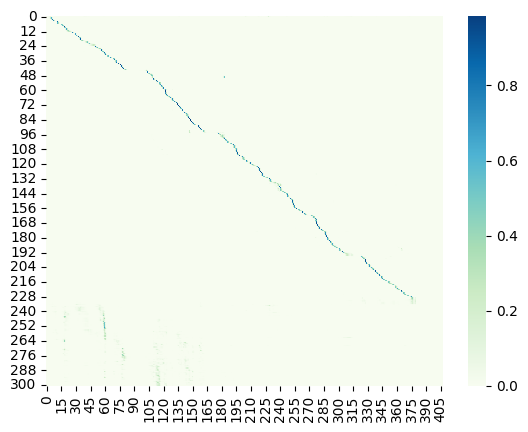

Saved best model

Epoch: 52/80


Val:   3%|▎         | 1/33 [00:02<01:30,  2.83s/it, dist=3.9867]

Ground Truth :  MOUNT BREMER IS THE MOST NOTED STRONGHOLD OF THE SHEEP IN THE WHOLE SHASTA REGION
Prediction   :  MOUNT BRUMMER IS THE MOST NOTED STRONGHOLD OF THE SHEEP IN THE WHOLE SHASTA REGION


Val:   6%|▌         | 2/33 [00:05<01:22,  2.66s/it, dist=3.7067]

Ground Truth :  PRESIDENT BROWN I WITHDRAW MY CRITICISM I OFFER YOU MY HUMBLE APOLOGIES
Prediction   :  PRESIDENT BRAM I WITHDRAW MY CRITICISM BY OFFER YOU MY HUMBLE APOLOGIES


Val:   9%|▉         | 3/33 [00:07<01:15,  2.52s/it, dist=3.7978]

Ground Truth :  DON'T CRY DON'T CRY HE WHISPERED
Prediction   :  DON'T CRY DON'T CRY HE WHISPERED


Val:  12%|█▏        | 4/33 [00:10<01:11,  2.48s/it, dist=3.7767]

Ground Truth :  THE KINGDOM OF NORTHUMBRIA AS THE NAME IMPLIES EMBRACED NEARLY ALL THE COUNTRY FROM THE HUMBER TO THE PICTISH BORDER
Prediction   :  THE KINGDOM OF NORTHUMBRIA AS THE NAME IMPLIES EMBRACED NEARLY ALL THE COUNTRY FROM THE HUMBER TO THE PICTISH BORDER


Val:  15%|█▌        | 5/33 [00:12<01:06,  2.38s/it, dist=4.3040]

Ground Truth :  HOT ROLLS
Prediction   :  HOT ROLLS


Val:  18%|█▊        | 6/33 [00:14<01:04,  2.39s/it, dist=4.1489]

Ground Truth :  THE JOYOUS CONVULSION OF LAUGHTER WAS AS A TRIBUTE PAID THEY SUBMITTED TO IT GLADLY BUT ALMOST MECHANICALLY
Prediction   :  THE JOYOUS CONVULSION OF LAUGHTER WAS AS IT TRIBUTE PAID THEY SUBMITTED TO IT GLADLY BUT ALMOST MC CANICALLY


Val:  21%|██        | 7/33 [00:17<01:01,  2.35s/it, dist=4.1390]

Ground Truth :  FERDINAND FELT HIS FREEDOM AS WELL AS HIS HAPPINESS
Prediction   :  FORTUNATE FELT HIS FREEDOM AS WELL AS HIS HAPPINESS


Val:  24%|██▍       | 8/33 [00:19<00:58,  2.33s/it, dist=4.1983]

Ground Truth :  TO MORROW IS THE EXAMINATION
Prediction   :  TO MORROW AS THE EXAMINATION


Val:  27%|██▋       | 9/33 [00:21<00:56,  2.35s/it, dist=4.1563]

Ground Truth :  TRIBE AFTER TRIBE WAS CROWDING DOWN TO THE ALPS AND TRAMPLING UPON EACH OTHER ON THE FRONTIERS OF THE EMPIRE
Prediction   :  TRIBE AFTER TRIBE WAS CROWDING DOWN TO THE ALTS AND TRAVELLING UPON EACH OTHER OF THE FRONTIERS OF THE EMPIRE


Val:  30%|███       | 10/33 [00:24<00:54,  2.36s/it, dist=4.0687]

Ground Truth :  WE NEED KENTUCKY AND I UNDERSTAND THAT A VERY LITTLE MORE MAY BRING THE STATE TO US GO WITH YOUR FATHER I UNDERSTAND THAT YOU HAVE BEEN A BRAVE YOUNG SOLDIER HERE AND MAY YOU DO AS WELL UP THERE
Prediction   :  WE NEED CONTACTION I UNDERSTAND THAT A VERY LITTLE MORE MAY BRING THE STATE TO US GO WITH YOUR FATHER I UNDERSTAND THAT YOU HAVE BEEN ABRAVE YOUNG SOLDIER HERE AND MAY YOU DO AS WELL UP THERE


Val:  33%|███▎      | 11/33 [00:26<00:50,  2.30s/it, dist=4.0709]

Ground Truth :  IT IS NOT TRUE THEN SAID CLAUDIA THAT THOU WERT GOING THIS MORNING TO MARRY LEONORA THE DAUGHTER OF THE RICH BALVASTRO
Prediction   :  IT IS NOT TRUE THEN SAID CLAUDIA THAT THOU WERE GOING THIS MORNING TO MARRY LEONORA THE DAUGHTER OF THE RICH BOW VASTABLE


Val:  36%|███▋      | 12/33 [00:28<00:49,  2.34s/it, dist=4.0456]

Ground Truth :  WHATEVER REVIVING EFFECT IT MIGHT OTHERWISE HAVE PRODUCED ON HIM IT MADE NO CHANGE IN THE THREATENING GLOOM OF HIS MANNER
Prediction   :  WHATEVER REVIVING AFFECTED MIGHT OTHERWISE HAVE PRODUCED ON HIM IT MADE NO CHANGE IN THE THREATENING GLOOM OF THIS MANNER


Val:  39%|███▉      | 13/33 [00:31<00:47,  2.35s/it, dist=4.0072]

Ground Truth :  THEN THEY BEGAN TO RUN AND RUSHING INTO THE HOUSE THEY FELL UPON THEIR FATHER'S NECK
Prediction   :  THEN THEY BEGAN TO RUN AND RUSHING INTO THE HOUSE THEY FELL UPON THEIR FATHER'S NECK


Val:  42%|████▏     | 14/33 [00:33<00:45,  2.37s/it, dist=3.9943]

Ground Truth :  WAS THERE EVER A HAPPIER MAN THAN JOSEPH THAT NIGHT AS HE STRODE ALONG THE FOOTPATH
Prediction   :  WAS THERE EVER A HAPPY YOUR MAN THAN JOSEPH THAT NIGHT IS HE STRODE ALONG THE FOOTPATH


Val:  45%|████▌     | 15/33 [00:35<00:41,  2.28s/it, dist=3.9831]

Ground Truth :  I SUPPOSE IT'S THE WET SEASON WILL YOU HAVE TO CUT THEM TOO
Prediction   :  I SUPPOSE IT'S THE WET SEASON WILL YOU HAVE TO CUT THEM TOO


Val:  48%|████▊     | 16/33 [00:37<00:38,  2.27s/it, dist=3.9958]

Ground Truth :  BEHOLDING IT HESTER WAS CONSTRAINED TO RUSH TOWARDS THE CHILD TO PURSUE THE LITTLE ELF IN THE FLIGHT WHICH SHE INVARIABLY BEGAN TO SNATCH HER TO HER BOSOM WITH A CLOSE PRESSURE AND EARNEST KISSES NOT SO MUCH FROM OVERFLOWING LOVE AS TO ASSURE HERSELF THAT PEARL WAS FLESH AND BLOOD AND NOT UTTERLY DELUSIVE
Prediction   :  BEHOLDING IT HESTER WAS CONSTRAINED TO RUSH TOWARDS THE CHILD TO PURSUE THE LITTLE ELF IN THE FLIGHT WHICH SHE INVARIABLY BEGAN TO SNATCH HER TO HER BOSOM WITH A CLOSE PRESSURE AND EARNEST KISSES NOT SO MUCH FROM OVERFLOWING LOVE AS TO ASSURE HERSELF THAT PEARL WAS FLESH AND BLOOD AND NOT UTTERLY DELUCIVE


Val:  52%|█████▏    | 17/33 [00:40<00:36,  2.29s/it, dist=4.0820]

Ground Truth :  YOU WANT ME TO SAY IT SHE WHISPERED
Prediction   :  YOU WANT ME TO SAY IT SHE WHISPERED


Val:  55%|█████▍    | 18/33 [00:42<00:34,  2.30s/it, dist=4.1044]

Ground Truth :  ALICE TOOK UP THE FAN AND GLOVES AND AS THE HALL WAS VERY HOT SHE KEPT FANNING HERSELF ALL THE TIME SHE WENT ON TALKING DEAR DEAR HOW QUEER EVERYTHING IS TO DAY
Prediction   :  ALICE TOOK UP THE FAN AND GLOVES AND AS THE HALL WAS VERY HOT SHE KEPT FANNING HERSELF ALL THE TIME SHE WENT ON TALKY DEAR DEAR HOW QUEER EVERYTHING IS TO DAY


Val:  58%|█████▊    | 19/33 [00:44<00:33,  2.36s/it, dist=4.1611]

Ground Truth :  THIS IS THE AMUSING ADVENTURE WHICH CLOSED OUR EXPLOITS
Prediction   :  THIS IS THE AMUSING ADVENTURE WHICH CLOSED OUR EXPLOITS


Val:  61%|██████    | 20/33 [00:47<00:31,  2.43s/it, dist=4.1333]

Ground Truth :  WHAT THAT LITTLE CABIN
Prediction   :  WHAT THAT LITTLE CAVIN


Val:  64%|██████▎   | 21/33 [00:50<00:29,  2.45s/it, dist=4.1730]

Ground Truth :  THE BIG MEADOWS LIE NEAR THE FOOT OF LASSEN'S BUTTE A BEAUTIFUL SPACIOUS BASIN SET IN THE HEART OF THE RICHLY FORESTED MOUNTAINS SCARCELY SURPASSED IN THE GRANDEUR OF ITS SURROUNDINGS BY TAHOE
Prediction   :  THE BIG MEADOWS LIE NEAR THE FOOT OF LASTEN'S BUTTE A BEAUTIFUL SPACIOUS BASIN SAID IN THE HEART OF THE RICHLY FORESTED MOUNTAINS SCARCELY SURPASSED IN THE GRANDEUR OF ITS SURROUNDINGS BY TOW


Val:  67%|██████▋   | 22/33 [00:52<00:26,  2.40s/it, dist=4.1506]

Ground Truth :  SIR EDWARD NOT WHOLLY DISCOURAGED BY THE DENIAL WITH WHICH DORRIFORTH HAD WITH DELICACY ACQUAINTED HIM STILL HOPED FOR A KIND RECEPTION AND WAS SO OFTEN AT THE HOUSE OF MISSUS HORTON THAT LORD FREDERICK'S JEALOUSY WAS EXCITED AND THE TORTURES HE SUFFERED IN CONSEQUENCE CONVINCED HIM BEYOND A DOUBT OF THE SINCERITY OF HIS AFFECTION
Prediction   :  SIR EDWARD NOT WHOLLY DISCOURAGED BY THE DENIAL WITH WHICH DOOR FORTH HAD WITH DELICACY ACQUAINTED HIM STILL HOPED FOR A KIND RECEPTION AND WAS SO OFTEN AT THE HOUSE OF MISSUS HORDEN THAT LORD FREDERICK'S JEALOUSY WAS EXCITED AND THE TORTURES HE SUFFERED IN CONSEQUENCE CONVINCED HIM BEYOND TO DOUBT OF THE SINCERITY OF HIS AFFECTION


Val:  70%|██████▉   | 23/33 [00:54<00:24,  2.41s/it, dist=4.1820]

Ground Truth :  I'LL WAIT HERE TILL YOU'RE READY EXPLAIN YOURSELF TO THE LADY TELL HER I'M AN OLD AND RHEUMATIC INVALID WHO HAS BEEN USED TO ASKING HIS OWN QUESTIONS
Prediction   :  I'LL WAIT HERE TILL YOU'RE READY EXPLAIN YOURSELF TO THE LADY TELL HER I'M AN OLD AND ROMANTIC INVILLED WHO HAS BEEN USED TO ASKING HIS OWN QUESTIONS


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.42s/it, dist=4.2200]

Ground Truth :  IN THIS SAME DISTRICT IS THE MINT IN COMMERCIAL STREET BETWEEN MONTGOMERY AND KEARNY STREETS
Prediction   :  IN THE SAME DISTRICT IS THE MIND IN COMMERCIAL STREET BETWEEN MUCH GUMERIAN CARENEY STREETS


Val:  76%|███████▌  | 25/33 [00:59<00:18,  2.36s/it, dist=4.1808]

Ground Truth :  THAT WON'T LAST IT WILL GO AWAY AND THINGS WILL BE JUST AS THEY USED TO
Prediction   :  THAT WON'T LAST IT WILL GO AWAY AND THINGS WILL BE JUST AS THEY USED TO


Val:  79%|███████▉  | 26/33 [01:01<00:16,  2.38s/it, dist=4.1854]

Ground Truth :  HE WAS MOUNTED UPON A POWERFUL HORSE AND HAD ON A COAT OF MAIL WITH FOUR OF THE PISTOLS THEY CALL PETRONELS IN THAT COUNTRY AT HIS WAIST
Prediction   :  HE WAS MOUNTED UPON A POWERFUL HORSE AND HAD ON A COAT OF MAIL WITH FOUR OF THE PISTOLS THEY CALLED PETRONELS IN THAT COUNTRY AT HIS WAIST


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.39s/it, dist=4.2059]

Ground Truth :  HOW ASKED TAD
Prediction   :  HELL ASKED PED


Val:  85%|████████▍ | 28/33 [01:06<00:11,  2.36s/it, dist=4.2188]

Ground Truth :  A SUDDEN IMPULSE CAME OVER HIM TO ENTER AND SEE IF THEY WERE INDEED THE PROOFS
Prediction   :  A SUDDEN IMPULSE CAME OVER HIM TO ENTER AND SEE IF THEY WERE INDEED THE PROOFS


Val:  88%|████████▊ | 29/33 [01:08<00:09,  2.36s/it, dist=4.2483]

Ground Truth :  PERHAPS YOU COULD PUT ON YOUR COAT AND WALK OUT WITH ME FOR A FEW MINUTES SAID TREVELYAN
Prediction   :  PERHAPS YOU COULD PUT ON YOUR COAT AND WALK OUT WITH ME FOR A FEW MINUTES SAID TREVELYAN


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.35s/it, dist=4.3002]

Ground Truth :  OTTO WINKED AT ME
Prediction   :  I DON'T WINK AT ME


Val:  94%|█████████▍| 31/33 [01:13<00:04,  2.35s/it, dist=4.3034]

Ground Truth :  THEN TAKE IT OUT OF THE ROASTING PAN AND PUT IT INTO A CASSEROLE AFTER SPRINKLING IT WITH TWO OUNCES OF FLOUR
Prediction   :  THEN TAKE IT OUT OF THE ROSTING PAN AND PUT IT INTO A CASTLE ROLL AFTER SPRINKLING IT WITH TWO ARMS AS A FLOWER


Val:  97%|█████████▋| 32/33 [01:15<00:02,  2.29s/it, dist=4.2923]

Ground Truth :  HE HAD GAMBLED AND LOST A GREAT DEAL AND HIS BROTHER WAS HIS MOST BITTER ENEMY BECAUSE HE WAS INFATUATED WITH THE IDEA THAT HE HAD TRIED TO POISON HIM
Prediction   :  HE HAD GAMBLED AND LOST A GREAT DEAL AND HIS BROTHER WAS AS MOST BITTER ENEMY BECAUSE HE WAS INFATUATED WITH THE IDEA THAT HE HAD TRIED TO POISON HIM


Val: 100%|██████████| 33/33 [01:16<00:00,  1.93s/it, dist=4.3145]

Ground Truth :  I GASPED POSITIVELY GASPED
Prediction   :  I GASPED POSITIVELY GASPED


	Train Loss 0.1086	 Learning Rate 0.0003894
	Val Dist 4.3145	
	Teacher Forcing Ratio 1	


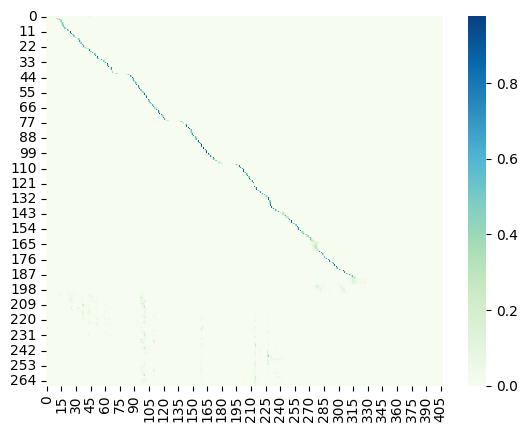

Saved best model

Epoch: 53/80


Val:   3%|▎         | 1/33 [00:02<01:35,  2.98s/it, dist=3.8667]

Ground Truth :  WHEN SHE USED TO TELL ME ABOUT HIM I ALWAYS WONDERED WHETHER SHE WASN'T A LITTLE IN LOVE WITH HIM
Prediction   :  WHEN SHE USED TO TELL ME ABOUT HIM I ALWAYS WONDERED WHETHER SHE WASN'T A LITTLE IN LOVE WITH HIM


Val:   6%|▌         | 2/33 [00:05<01:19,  2.55s/it, dist=3.7633]

Ground Truth :  ANOTHER FLOGGING TO MORROW SAID HE GRUMBLINGLY
Prediction   :  ANOTHER FLOGGING TO MORROW SAID HE DRUMPLINGLY


Val:   9%|▉         | 3/33 [00:07<01:14,  2.49s/it, dist=3.8333]

Ground Truth :  THEN THE PRINCE TOOK THE PRINCESS BY THE HAND SHE WAS DRESSED IN GREAT SPLENDOUR BUT HE DID NOT HINT THAT SHE LOOKED AS HE HAD SEEN PICTURES OF HIS GREAT GRANDMOTHER LOOK HE THOUGHT HER ALL THE MORE CHARMING FOR THAT
Prediction   :  THEN THE PRINCE TOOK THE PRINCESS BY THE HAND SHE WAS DRESSED IN GREAT SPLENDOUR BUT HE DID NOT HINT THAT SHE LOOKED AS HE HAD SEEN PICTURES OF HIS GREAT GRANDMOTHER LOOK HE THOUGHT HER ALL THE MORE CHARMING FOR THAT


Val:  12%|█▏        | 4/33 [00:09<01:09,  2.39s/it, dist=4.1800]

Ground Truth :  IT WAS THE FIRST TIME MISSUS SHIMERDA HAD BEEN TO OUR HOUSE AND SHE RAN ABOUT EXAMINING OUR CARPETS AND CURTAINS AND FURNITURE ALL THE WHILE COMMENTING UPON THEM TO HER DAUGHTER IN AN ENVIOUS COMPLAINING TONE
Prediction   :  IT WAS THE FIRST TIME MISSUS SHIMERDA HAD BEEN TO OUR HOUSE AND SHE RAN ABOUT EXAMINING OUR CARPETS AND CURTAINS IN FURNITURE ALL THE WHILE COMMENTING UPON THEM TO HER DAUGHTER IN AN ENVIOUS COMPLAINING TONE


Val:  15%|█▌        | 5/33 [00:12<01:04,  2.32s/it, dist=4.5293]

Ground Truth :  WHETHER HE GOT ANYTHING ELSE IT WOULD BE IMPOSSIBLE TO SAY FROM HIS MANNER AS HE FINALLY SANK INTO A CHAIR BY ONE OF THE OPENINGS AND LOOKED DOWN ON THE LOBBY BELOW
Prediction   :  WHETHER HE GOT ANYTHING ELSE IT WOULD BE IMPOSSIBLE TO SAY FROM HIS MANNER AS HE FINALLY SANK INTO A CHAIR BY ONE OF THE OPENINGS AND LOOKED DOWN ON THE LOBBY BELOW


Val:  18%|█▊        | 6/33 [00:14<01:02,  2.33s/it, dist=4.3444]

Ground Truth :  THAT'S IT ON YOUR ACCOUNT
Prediction   :  THAT'S IT ON YOUR ACCOUNT


Val:  21%|██        | 7/33 [00:16<01:01,  2.38s/it, dist=4.2657]

Ground Truth :  A YANKEE ALWAYS SAYS NAGER
Prediction   :  BY ACCU ALWAYS SAYS NAGGER


Val:  24%|██▍       | 8/33 [00:19<00:57,  2.32s/it, dist=4.1433]

Ground Truth :  THE LITTLE HOUSE ON THE HILLSIDE WAS SO MUCH THE COLOR OF THE NIGHT THAT WE COULD NOT SEE IT AS WE CAME UP THE DRAW
Prediction   :  THE LITTLE HOUSE ON THE HILLSIDE WAS SO MUCH THE COLOR OF THE NIGHT THAT WE COULD NOT SEE IT AS WE CAME UP THE DRAW


Val:  27%|██▋       | 9/33 [00:21<00:56,  2.37s/it, dist=4.2178]

Ground Truth :  HE ISN'T FIT TO HEAR WHAT'S SAID HERE HE BELIEVES IT'S ALL TRUE
Prediction   :  HE'S IT FIT TO HEAR WHAT SAID TO HEAR HE BELIEVES IT'S ALL TRUE


Val:  30%|███       | 10/33 [00:24<00:56,  2.45s/it, dist=4.2213]

Ground Truth :  I CAN SEE THEM NOW EXACTLY AS THEY LOOKED WORKING ABOUT THE TABLE IN THE LAMPLIGHT JAKE WITH HIS HEAVY FEATURES SO RUDELY MOULDED THAT HIS FACE SEEMED SOMEHOW UNFINISHED OTTO WITH HIS HALF EAR AND THE SAVAGE SCAR THAT MADE HIS UPPER LIP CURL SO FEROCIOUSLY UNDER HIS TWISTED MUSTACHE
Prediction   :  I CAN SEE THEM NOW EXACTLY AS THEY LOOKED WORKING ABOUT THE TABLE IN THE LAMPLIGHT JAKE WITH HIS HEAVY FEATURES SO RUDELY MOULDED THAT HIS FACE SEEMED SOMEHOW UNFINISHED OTTO WITH HIS HALF EAR AND THE SAVAGE SCAR THAT MADE HIS UPPER LIP CURL SO FEROCIOUSLY UNDER HIS TWISTED MUSTACHE


Val:  33%|███▎      | 11/33 [00:26<00:52,  2.40s/it, dist=4.1836]

Ground Truth :  SHE STOPPED WITH HER HAND ON THE LATCH OF THE WILSONS DOOR TO STILL HER BEATING HEART AND LISTENED TO THE HUSHED QUIET WITHIN
Prediction   :  SHE STOPPED WITH HER HAND ON THE LATCH OF THE WILSON'S DOOR TO STILL HER BEATING HEART AND LISTENED TO THE HUSHED QUIET WITHIN


Val:  36%|███▋      | 12/33 [00:28<00:49,  2.37s/it, dist=4.1511]

Ground Truth :  IT WAS ONE WHICH GAVE ME A SMALL TRIUMPH OVER GEORGE
Prediction   :  IT WAS ONE WHICH GAVE ME A SMALL TRIUMPH OVER GEORGE


Val:  39%|███▉      | 13/33 [00:31<00:47,  2.39s/it, dist=4.1779]

Ground Truth :  HOW CAN HE WHOSE SPHERE LIES ABOVE THE STARS STOOP EVERY MOMENT TO EARTH
Prediction   :  HOW CAN HE WHOSE SPHERE LIES ABOVE THE STARS STOOP EVERY MOMENT TO EARTH


Val:  42%|████▏     | 14/33 [00:33<00:45,  2.38s/it, dist=4.1938]

Ground Truth :  AND SHE SPEAKS OF NO WEAPON
Prediction   :  AND SHE SPEAKS OF NO WEAPON


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.42s/it, dist=4.1587]

Ground Truth :  EMERGING AT EUSTON AT HALF PAST THREE O'CLOCK IN THE AFTERNOON ALEXANDER HAD HIS LUGGAGE SENT TO THE SAVOY AND DROVE AT ONCE TO BEDFORD SQUARE
Prediction   :  EMERGING AT EUSTON AT HALF PAST THREE O'CLOCK IN THE AFTERNOON ALEXANDER HAD HIS LUGGAGE SENT TO THE SAVOY AND DROVE AT ONCE TO BEDFORD SQUARE


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.38s/it, dist=4.1396]

Ground Truth :  IT WAS WRITTEN IN THE UPPER RANGITATA DISTRICT OF THE CANTERBURY PROVINCE AS IT THEN WAS OF NEW ZEALAND AND APPEARED AT CHRISTCHURCH IN THE PRESS NEWSPAPER JUNE THIRTEENTH EIGHTEEN SIXTY THREE
Prediction   :  IT WAS WRITTEN IN THE UPPER RANGETS HOW TO DISTRICT OF THE CANABRAY PROVINCE AS IT THEN WAS OF NEW ZEALAND AND APPEARED AT CHRIST CHURCH IN THE PRESS NEWSPAPER JUNE THIRTEENTH EIGHTEEN SIXTY THREE


Val:  52%|█████▏    | 17/33 [00:40<00:38,  2.39s/it, dist=4.1404]

Ground Truth :  GOD WHO READS OUR HEARTS KNOWS THAT WE HAD A NOBLE END IN VIEW
Prediction   :  GOD WHO READS OUR HEARTS KNOWS THAT WE HAD A NOBLE END IN VIEW


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.36s/it, dist=4.1148]

Ground Truth :  BRION SAW SOMETHING CLOSE TO PANIC ON HIS OPPONENT'S FACE WHEN THE MAN FINALLY RECOGNIZED HIS ERROR
Prediction   :  BRION SAW SOMETHING CLOSE TO PANIC ON HIS OPPONENT'S FACE WHEN THE MAN FINALLY RECOGNIZED HIS ERROR


Val:  58%|█████▊    | 19/33 [00:45<00:33,  2.36s/it, dist=4.1558]

Ground Truth :  AT THE EDGE OF THIS BOX THERE LIES A GREAT WOODEN DOLL WHICH SO FAR AS MUTILATION IS CONCERNED BEARS A STRONG RESEMBLANCE TO THE FINEST GREEK SCULPTURE AND ESPECIALLY IN THE TOTAL LOSS OF ITS NOSE
Prediction   :  AT THE EDGE OF THIS BOX THERE LIES A GREAT WOODEN DALL WHICH SO PARS MUTILATION IS CONCERNED BEARS A STRONG RESEMBLANCE TO THE FINEST GREEK SCULPTURE AND ESPECIALLY IN THE TOTAL LOSS OF ITS NOSE


Val:  61%|██████    | 20/33 [00:47<00:30,  2.38s/it, dist=4.1343]

Ground Truth :  MISTER SWIFT CAME INTO THE LIVING ROOM JUST THEN AND TOLD TOM HOW WORRIED MISSUS SWIFT AND SANDY HAD BEEN
Prediction   :  MISTER SWIFT CAME INTO THE LIVING ROOM JUST THEN AND TOLD TOM HOW WORRIED MISSUS SWIFT AND SANDY HAD BEEN


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.34s/it, dist=4.0971]

Ground Truth :  SAID MORREL SADLY YES REPLIED NOIRTIER
Prediction   :  SAID MIRAL SADLY YES REPLIED NOT HEIGH


Val:  67%|██████▋   | 22/33 [00:52<00:26,  2.38s/it, dist=4.0824]

Ground Truth :  I COULD NOT TAKE MY EYES OFF THE MAN IN THE BED
Prediction   :  I COULD NOT TAKE MY EYES OFF THE MAN IN THE BED


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.39s/it, dist=4.0977]

Ground Truth :  HE ALSO THOUGHT OF HIS MANAGERIAL POSITION
Prediction   :  HE ALSO THOUGHT OF HIS MANAGERIAL POSITION


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.41s/it, dist=4.1292]

Ground Truth :  I ATTRIBUTE ITS UNLOOKED FOR SUCCESS MAINLY TO TWO EARLY FAVOURABLE REVIEWS THE FIRST IN THE PALL MALL GAZETTE OF APRIL TWELFTH AND THE SECOND IN THE SPECTATOR OF APRIL TWENTIETH
Prediction   :  I ATTRIBUTE ITS UNLOOKED FOR SUCCESS MAINLY TO TWO EARLY FAVOURABLE REVIEWS THE FIRST IN THE PALM ALL GAZETTE OF APRIL TWELFTH AND THE SECOND IN THE SPECTATOR OF APRIL TWENTIETH


Val:  76%|███████▌  | 25/33 [00:59<00:19,  2.43s/it, dist=4.1064]

Ground Truth :  THEREFORE MY ANSWER IS WITH GREATER CARE THAT HE MAY HEAR ME WHO IS WEEPING YONDER SO THAT THE SIN AND DOLE BE OF ONE MEASURE
Prediction   :  THEREFORE MY ANSWER IS WITH GREATER CARE THAT HE MAY HEAR ME WHOSE WEEPING YONDER SO THAT THE SIN AND DULL BE OF ONE MEASURE


Val:  79%|███████▉  | 26/33 [01:02<00:17,  2.46s/it, dist=4.1023]

Ground Truth :  THE FIRST THING EITHER OF THEM NOTICED WAS A NEW SOUND THAT BROKE INTO THE CLEAR AIR LOUDER THAN THEY HAD EVER HEARD IT BEFORE THE BELL OF THE MONASTERY OF THEIR OWN VILLAGE RINGING FOR EARLY PRAYERS
Prediction   :  THE FIRST THING EITHER OF THEM NOTICED WAS A NEW SOUND THAT BROKE INTO THE CLEAN AIR LOUDER THAN DAY HAD EVER HEARD IT BEFORE THE BELL OF THE MONASTERY OF THEIR OWN VILLAGE RINGING FOR EARLY PRAYERS


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.40s/it, dist=4.0891]

Ground Truth :  HIS FACE HAD A LOOK OF WEARINESS AND PLEASURE LIKE THAT OF SICK PEOPLE WHEN THEY FEEL RELIEF FROM PAIN
Prediction   :  HIS FACE HAD A LOOK OF WEARINESS AND PLEASURE LIKE THAT OF SICK PEOPLE WHEN THEY FEEL RELIEF FROM PAIN


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.36s/it, dist=4.0686]

Ground Truth :  THE LOYAL FRENZY FELL UPON THE THREE QUIET WOMEN AND THEY COULD NOT DO TOO MUCH FOR THEIR COUNTRY
Prediction   :  THE LOYAL FRIENDS HE FELL UPON THE THREE QUIET WOMEN AND THEY COULD NOT DO TOO MUCH FOR THEIR COUNTRY


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.32s/it, dist=4.0770]

Ground Truth :  BUT FROM THE CAUTIOUS MOVEMENTS OF THE LIGHT FAR BELOW THEM THE GUIDE UNDERSTOOD THAT THE LAD WAS AT WORK CARRYING OUT HIS PART OF THE TASK OF RESCUE TO THE BEST OF HIS ABILITY
Prediction   :  BUT FROM THE CAUTIOUS MOVEMENTS OF THE LIGHT FAR BELOVED THEM THE GUIDE UNDERSTOOD THAT THE LAD WAS IT WORK CARRYING YOU UP HIS PART OF THE TASK OF RESCUE TO THE BEST OF HIS ABILITY


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.35s/it, dist=4.0984]

Ground Truth :  HE WAS GETTING SOME VAGUE COMFORT OUT OF A GOOD CIGAR BUT IT WAS NO PANACEA FOR THE ILL WHICH AFFECTED HIM
Prediction   :  HE WAS GETTING SOME BAG COMFORT OUT OF A GOOD CIVIL BUT IT WAS NEPANACE EFFORT THE ILL WHICH AFFECTED HIM


Val:  94%|█████████▍| 31/33 [01:13<00:04,  2.29s/it, dist=4.0953]

Ground Truth :  I DARE SAY IT'S QUITE TRUE THAT THERE'S NEVER BEEN ANY ONE ELSE
Prediction   :  I DARESAY IT'S QUITE TRUE THAT THERE'S NEVER BEEN ANYONE ELSE


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.31s/it, dist=4.1340]

Ground Truth :  ASKED PHRONSIE IN INTENSE INTEREST SLIPPING DOWN OUT OF POLLY'S ARMS AND CROWDING UP CLOSE TO JASPER'S SIDE
Prediction   :  ASKED PHRONSIE IN INTENSE INTEREST SLIPPING DOWN OUT OF POLLY'S ARMS AND CROWDING UP CLOTHES TO JASPER'S SIDE


Val: 100%|██████████| 33/33 [01:17<00:00,  1.94s/it, dist=4.1261]

Ground Truth :  THE LADIES
Prediction   :  THE LADIES


	Train Loss 0.1061	 Learning Rate 0.0003676
	Val Dist 4.1261	
	Teacher Forcing Ratio 1	


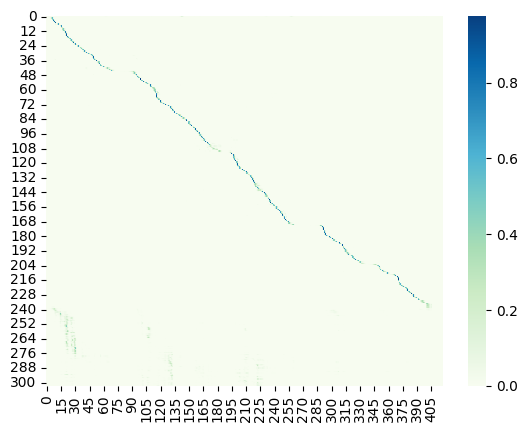

Saved best model

Epoch: 54/80


Val:   3%|▎         | 1/33 [00:03<01:39,  3.11s/it, dist=6.4133]

Ground Truth :  THERE HAD BEEN ANOTHER BLACK FROST THE NIGHT BEFORE AND THE AIR WAS CLEAR AND HEADY AS WINE
Prediction   :  THERE HAD BEEN ANOTHER BLACK FROST THE NIGHT BEFORE AND THE AIR WAS CLEAR AND HEADY AS WINE


Val:   6%|▌         | 2/33 [00:05<01:22,  2.66s/it, dist=5.4033]

Ground Truth :  HANS STIRS NOT
Prediction   :  HARM STIRS NOD


Val:   9%|▉         | 3/33 [00:07<01:15,  2.50s/it, dist=5.1933]

Ground Truth :  AND AWAY SHE FLEW TO HER OWN COSY NEST IN THE ELM TREE WHERE SHE WAS SOON FAST ASLEEP FORGETTING ALL ABOUT THE MATTER
Prediction   :  AND AWAY SHE FLEW TO HER OWN COASINESS IN THE OWN TREE WHERE SHE WAS SOON FAST TO SLEEP FORGETTING ALL ABOUT THE MATTER


Val:  12%|█▏        | 4/33 [00:10<01:10,  2.42s/it, dist=4.9050]

Ground Truth :  IT WAS SILENT AND GLOOMY BEING TENANTED SOLELY BY THE CAPTIVE AND LIGHTED BY THE DYING EMBERS OF A FIRE WHICH HAD BEEN USED FOR THE PURPOSED OF COOKERY
Prediction   :  IT WAS SILENT AND GLOOMY BEING TENANTED SOLELY BY THE CAPTIVE AND LIGHTED BY THE DYING EMBERS OF A FIRE WHICH HAD BEEN USED FOR THE PURPOSE OF COOKERY


Val:  15%|█▌        | 5/33 [00:12<01:06,  2.36s/it, dist=4.6373]

Ground Truth :  MISSUS GREY HAD MET SOUTHERNERS BEFORE BUT NOT INTIMATELY AND SHE ALWAYS HAD IN MIND VIVIDLY THEIR CRUELTY TO POOR NEGROES A SUBJECT SHE MADE A POINT OF INTRODUCING FORTHWITH
Prediction   :  MISSUS GREY HAD MET SOUTHERNERS BEFORE BUT NOT INTIMATELY AND SHE ALWAYS HAD IN MIND VIVIDLY THEIR CRUELTY TO POOR NEGROES A SUBJECT SHE MADE A POINT OF INTRODUCING FORTHWITH


Val:  18%|█▊        | 6/33 [00:14<01:03,  2.34s/it, dist=4.5044]

Ground Truth :  THERE THEY STROVE TO BREAK THE SILVER CORD OF LIFE AND THRUST MY SOUL INTO THE BODY OF A FOUL NIGHT WEIRD THEIR SORCERY SUMMONED UP FROM HELL AH
Prediction   :  THERE THEY STROVE TO BREAK THE SILVER COURT OF LIFE AND THRUST MY SOUL INTO THE BODY OF A FOUL NIGHT WE ARE THEIR SOURCERY SUMMONED UP FROM HELL AH


Val:  21%|██        | 7/33 [00:17<01:01,  2.36s/it, dist=4.3295]

Ground Truth :  IT WAS PLAIN THAT TOGETHER WE SHOULD MANAGE MOST COMFORTABLY DELIGHTFULLY IN FACT
Prediction   :  IT WAS PLAIN THAT TOGETHER WE SHOULD MANAGE MOST COMFORTABLY DELIGHTFULLY IN FACT


Val:  24%|██▍       | 8/33 [00:19<00:58,  2.33s/it, dist=4.2192]

Ground Truth :  FERDINAND MEDITATES OVER HIS GOOD FORTUNE
Prediction   :  FOR DINAM MEDITATES OVER HIS GOOD FORTUNE


Val:  27%|██▋       | 9/33 [00:21<00:57,  2.38s/it, dist=4.1341]

Ground Truth :  I NOTICE THAT THEY ARE GENERALLY PERSONS WHO HAVE ALREADY TENDERED THEIR OFFERINGS
Prediction   :  I NOTICED THAT THEY ARE GENERALLY PERSONS WHO HAVE ALREADY TENDERED THEIR OFFERINGS


Val:  30%|███       | 10/33 [00:24<00:55,  2.41s/it, dist=4.0787]

Ground Truth :  ANOTHER ADVANTAGE THE RED WHEATS POSSESS IS THEIR COMPARATIVE IMMUNITY FROM THE ATTACKS OF MILDEW AND FLY
Prediction   :  ANOTHER ADVANTAGE THE RED WHEATS POSSESS IS THEIR COMPARATIVE IMMUNITY FROM THE ATTACKS OF MILL DO AND FLY


Val:  33%|███▎      | 11/33 [00:26<00:53,  2.42s/it, dist=4.0091]

Ground Truth :  WE SHOULD LIKE ABOVE ALL THINGS SAID DEUCALION TO SEE THIS LAND FULL OF PEOPLE ONCE MORE FOR WITHOUT NEIGHBORS AND FRIENDS THE WORLD IS A VERY LONELY PLACE INDEED
Prediction   :  WE SHOULD LIKE ABOVE ALL THINGS SAID DO CANYON TO SEE THIS LANDFUL OF PEOPLE ONCE MORE FOR WITHOUT NEIGHBOURS AND FRIENDS THE WORLD IS A VERY LONELY PLACE INDEED


Val:  36%|███▋      | 12/33 [00:29<00:51,  2.45s/it, dist=3.9978]

Ground Truth :  WHEN THE TRAP DID APPEAR IT LOOKED TO ME UNCOMMONLY LIKE AN OPEN SPRING CART
Prediction   :  WHEN THE TRAP DID APPEAR IT LOOKED TO ME UNCOMMONLY LIKE AN OPEN SPRING CART


Val:  39%|███▉      | 13/33 [00:31<00:48,  2.45s/it, dist=4.0190]

Ground Truth :  LOOK AT ME WELL IN SOOTH I'M BEATRICE
Prediction   :  LOOK AT ME WELL IN SOUS I'M THE ATTRACE


Val:  42%|████▏     | 14/33 [00:33<00:45,  2.37s/it, dist=4.0038]

Ground Truth :  I CALLED LIEUTENANT COLONEL FRIERSON'S ATTENTION TO THE YANKEES AND HE REMARKED WELL I DON'T KNOW WHETHER THEY ARE YANKEES OR NOT BUT IF THEY ARE THEY WILL COME OUT OF THERE MIGHTY QUICK
Prediction   :  I GO LITTLE DELICATELY FRIERSON'S ATTENTION TO THE YANKEYS AND HE REMARKED WHILE I DON'T KNOW WHAT THEY ARE YANKES ARE NOT BUT IF THEY ARE THEY WILL COME AT OUT OF THEIR MODEY QUICK


Val:  45%|████▌     | 15/33 [00:36<00:42,  2.38s/it, dist=4.0231]

Ground Truth :  ALL THE SAME HE LIFTED HIS GLASS HERE'S TO YOU LITTLE HILDA
Prediction   :  ALL THE SAME HE LIFTED HIS GLASS HERE'S TO YOU LITTLE HILDA


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.36s/it, dist=3.9883]

Ground Truth :  HOTEL A PLACE WHERE A GUEST OFTEN GIVES UP GOOD DOLLARS FOR POOR QUARTERS
Prediction   :  HOTEL A PLACE WHERE A GUEST OFTEN GIVES UP A GOOD DOLLARS FOR POOR QUARTERS


Val:  52%|█████▏    | 17/33 [00:40<00:38,  2.38s/it, dist=4.0173]

Ground Truth :  SUFFICIENT HALF THIS QUANTITY FOR TWO SLICES OF SALMON
Prediction   :  SUFFICIENT HALF THIS QUANTITY FOR TWO SLICES OF SAM


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.39s/it, dist=4.0089]

Ground Truth :  THERE COULD BE LITTLE ART IN THIS LAST AND FINAL ROUND OF FENCING
Prediction   :  THERE COULD BE LITTLE ART IN THIS LAST AND FINAL ROUND OF FENCING


Val:  58%|█████▊    | 19/33 [00:45<00:34,  2.43s/it, dist=3.9881]

Ground Truth :  SOMETHING HAPPENED TO THE HINDMOST SLEDGE THE DRIVER LOST CONTROL HE WAS PROBABLY VERY DRUNK THE HORSES LEFT THE ROAD THE SLEDGE WAS CAUGHT IN A CLUMP OF TREES AND OVERTURNED
Prediction   :  SOMETHING HAPPENED TO THE HIGH MOST SLEDGE THE DRIVER LOST CONTROL HE WAS PROBABLY VERY DRUNK THE HORSES LEFT THE ROAD THE SLEDGE WAS CAUGHT IN A CLUMP OF TREES AND OVERTURNED


Val:  61%|██████    | 20/33 [00:48<00:30,  2.38s/it, dist=3.9793]

Ground Truth :  BOTH LIPS ASKED THE LARVAE
Prediction   :  BORE FLIPS ASKED THE LARBY


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.39s/it, dist=3.9800]

Ground Truth :  A LITTLE ATTACK OF NERVES POSSIBLY
Prediction   :  A LITTLE ATTACK OF NERVES POSSIBLY


Val:  67%|██████▋   | 22/33 [00:52<00:26,  2.37s/it, dist=4.0194]

Ground Truth :  PHOEBE WONDERED WHOSE CARE AND TOIL IT COULD HAVE BEEN THAT HAD PLANTED THESE VEGETABLES AND KEPT THE SOIL SO CLEAN AND ORDERLY
Prediction   :  PHOEBE WONDERED WHOSE CARE AND TOIL IT COULD HAVE BEEN THAT HAD PLANTED THESE VEGETABLES AND KEPT THE SOIL SO CLEAN AND ORDERLY


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.31s/it, dist=3.9965]

Ground Truth :  WHERE IS MY BROTHER NOW
Prediction   :  WHERE IS MY BROTHER NOW


Val:  73%|███████▎  | 24/33 [00:57<00:20,  2.29s/it, dist=3.9819]

Ground Truth :  WHILE TRAVELING WITH A COMPANY OF HUNTERS I SAW ABOUT FIFTY IN ONE FLOCK
Prediction   :  WHILE TRAVELING WITH A COMPANY OF HUNTERS I SAW ABOUT FIFTY IN ONE FLOCK


Val:  76%|███████▌  | 25/33 [00:59<00:18,  2.30s/it, dist=3.9699]

Ground Truth :  YOU SEE JIM KNOWED THE LAW
Prediction   :  YOU SAY JIM KNOW THOUGH


Val:  79%|███████▉  | 26/33 [01:01<00:16,  2.29s/it, dist=3.9887]

Ground Truth :  THE SMOKE ITSELF WHICH HAD FORMED A VAST CLOUD OVER HARBOR FORTS AND CITY WAS NOW DRIFTING OUT TO SEA LEAVING ALL THINGS ETCHED SHARPLY IN THE DAZZLING SUNLIGHT OF A SOUTHERN SPRING DAY
Prediction   :  THE SMOKE ITSELF WHICH HAD FORMED A VAST CLOUD OVER THE HARBOUR FORTS AND CITY WAS NOW DRIFTING OUT TO SEA LEAVING ALL THINGS ET SHARPLY IN THE DAZZLING SUNLIGHT OF A SOUTHERN SPRING DAY


Val:  82%|████████▏ | 27/33 [01:04<00:13,  2.33s/it, dist=3.9807]

Ground Truth :  I SAY SIR HARRY THE LITTLE GIRL'S GOING FAMOUSLY TO NIGHT ISN'T SHE
Prediction   :  I SAY SIR HARRY THE LITTLE GIRL'S GOING FAMOUSLY TO NIGHT ISN'T SHE


Val:  85%|████████▍ | 28/33 [01:06<00:11,  2.35s/it, dist=3.9879]

Ground Truth :  I NOTICED HOW WHITE AND WELL SHAPED HIS OWN HANDS WERE
Prediction   :  I NOTICED HOW WHITE AND WELL SHAPED HIS OWN HANDS WHERE


Val:  88%|████████▊ | 29/33 [01:08<00:09,  2.31s/it, dist=3.9823]

Ground Truth :  INSIDE A SECRET ROCKET TELEMETERING DEVICE WAS MOUNTED ON ITS TEST STAND
Prediction   :  INSIDE A SECRET ROCK AT TELEMETERING DEVICE WAS MOUNTED ON ITS TESTAND


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.40s/it, dist=4.0436]

Ground Truth :  WHO CAME NEXT ON THE SCENE SOME PEOPLE FROM THE LOBBY
Prediction   :  WHO CAME NEXT ON THE SCENE SOME PEOPLE FROM THE LOBBY


Val:  94%|█████████▍| 31/33 [01:13<00:04,  2.36s/it, dist=4.0570]

Ground Truth :  I TOLD MYSELF THAT IF I WERE REALLY THINKING OF YOU AND NOT OF MYSELF A LETTER WOULD BE BETTER THAN NOTHING
Prediction   :  I TOLD MYSELF THAT IF I WERE REALLY THINKING OF YOU AND NOT OF MYSELF A LETTER WOULD BE BETTER THAN NOTHING


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.40s/it, dist=4.0460]

Ground Truth :  BUT HERE THE ONLY THING THAT OCCURRED TO HER WAS TO STOP AND LOOK IN ONE OF THE SHOPS TILL HE SHOULD ASK HER WHAT SHE WAS LOOKING AT
Prediction   :  BUT HERE THE ONLY THING THAT OCCURRED TO HER WAS TO STOP AND LOOK IN ONE OF THE SHOPS TILL HE SHOULD ASK HOW AS SHE WAS LOOKING AT


Ground Truth :  THE AUTHOR HAS CONSIDERED IT HARDLY WORTH HIS WHILE THEREFORE RELENTLESSLY TO IMPALE THE STORY WITH ITS MORAL AS WITH AN IRON ROD OR RATHER AS BY STICKING A PIN THROUGH A BUTTERFLY THUS AT ONCE DEPRIVING IT OF LIFE AND CAUSING IT TO STIFFEN IN AN UNGAINLY AND UNNATURAL ATTITUDE
Prediction   :  THE AUTHOR HAS CONSIDERED IT HARDLY WORTH HIS WHILE THEREFORE RELENTLESSLY TO IMPALE THE STORY WITH ITS MORAL AS WITH AN IRON ROD OR RATHER AS BY STICKING APPEN THROUGH A BUTTERFLY THUS AT ONCE DEPRIVING IT OF LIFE AND CAUSING IT TO STIFFEN IN AN UNGAINLY AND UNNATURAL ATTITUDE
	Train Loss 0.1062	 Learning Rate 0.0003461
	Val Dist 4.0681	
	Teacher Forcing Ratio 1	


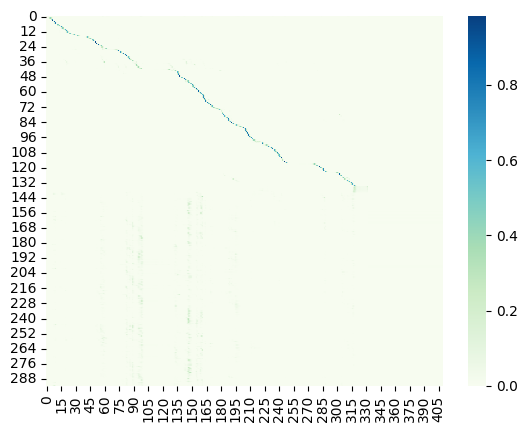

Saved best model

Epoch: 55/80


Val:   3%|▎         | 1/33 [00:02<01:35,  2.98s/it, dist=3.5267]

Ground Truth :  SEE BENEATH YOUR FEET IS THE MARKING OF GREAT TREE TRUNKS LYING ASLANT ACROSS THE FLOOR AND THE FORMS OF GIGANTIC PALM LEAVES STREWED AMONG THEM
Prediction   :  SEE BENEATH YOUR FEET IF THE MARKING OF GREAT TREE TRUNKS LINE AS FLANT ACROSS THE FLOOR AND THE FORMS OF GIGANTIC PALM LEAVES STREWED AMONG THEM


Val:   6%|▌         | 2/33 [00:05<01:21,  2.64s/it, dist=3.9900]

Ground Truth :  THEN YOU DON'T KNOW WHAT YOU'RE TALKING ABOUT
Prediction   :  THEN YOU DON'T KNOW WHAT YOU'RE TALKING ABOUT


Val:   9%|▉         | 3/33 [00:07<01:12,  2.40s/it, dist=3.6756]

Ground Truth :  NOT ONLY ROME WITH NO SUCH SPLENDID CAR E'ER GLADDENED AFRICANUS OR AUGUSTUS BUT POOR TO IT THAT OF THE SUN WOULD BE
Prediction   :  NOT ONLY ROME WITH NO SUCH SPLENDID CAR AIR GLADDENED AFRICANES OR AUGUSTICE BUT POOR TO IT THAT OF THE SUN WOULD BE


Val:  12%|█▏        | 4/33 [00:09<01:10,  2.42s/it, dist=3.9617]

Ground Truth :  ON FRIDAY CONFESSION WILL BE HEARD ALL THE AFTERNOON AFTER BEADS
Prediction   :  ON FRIDAY CONFESSION WILL BE HEARD ALL THE AFTERNOON AFTER BEADS


Val:  15%|█▌        | 5/33 [00:12<01:06,  2.39s/it, dist=4.0640]

Ground Truth :  REINCARNATION AND THE CONVERSE OF SPIRITS
Prediction   :  ME INCORNATION IN THE CONVERSION SPIRITS


Val:  18%|█▊        | 6/33 [00:14<01:04,  2.40s/it, dist=3.9356]

Ground Truth :  I FOUND THAT AS A WOMAN OF BUSINESS SHE WAS BEYOND ALL MY EXPECTATIONS
Prediction   :  I FOUND THAT IS A WOMAN OF BUSINESS SHE WAS BEYOND ALL MY EXPECTATIONS


Val:  21%|██        | 7/33 [00:17<01:03,  2.44s/it, dist=3.9686]

Ground Truth :  WHATEVER HER SWEET EYES ARE TURNED UPON SPIRITS OF LOVE DO ISSUE THENCE IN FLAME WHICH THROUGH THEIR EYES WHO THEN MAY LOOK ON THEM PIERCE TO THE HEART'S DEEP CHAMBER EVERY ONE
Prediction   :  WHATEVER HER SWEET EYES ARE TURNED UPON SPIRITS OF LOVE TO ISSUE THEM SOME FLAME WHICH THROUGH THEIR EYES WHO BEEN MAY LOOK ON THEM PIERCED TO THE HEART STEEP CHAMBER EVERYONE


Val:  24%|██▍       | 8/33 [00:19<01:02,  2.48s/it, dist=4.0033]

Ground Truth :  TONY'S FOUND THE MARTIANS
Prediction   :  TOTIES FOUND THE MARTIANS


Val:  27%|██▋       | 9/33 [00:22<00:59,  2.48s/it, dist=4.0519]

Ground Truth :  THEY OUGHT TO BE TAKEN UP IN THE AUTUMN AND WHEN DRIED IN THE HOUSE WILL KEEP TILL SPRING
Prediction   :  THEY OUGHT TO BE TAKEN UP IN THE AUTUMN AND WHEN DRIED IN THE HOUSE WILL KEEP TILL SPRING


Val:  30%|███       | 10/33 [00:24<00:55,  2.42s/it, dist=3.9580]

Ground Truth :  ANGRY WITH HIMSELF HE TRIED TO HIDE HIS FACE FROM THEIR EYES BY GAZING DOWN SIDEWAYS INTO THE SHALLOW SWIRLING WATER UNDER THE BRIDGE BUT HE STILL SAW A REFLECTION THEREIN OF THEIR TOP HEAVY SILK HATS AND HUMBLE TAPE LIKE COLLARS AND LOOSELY HANGING CLERICAL CLOTHES BROTHER HICKEY
Prediction   :  ANGRY WITH HIMSELF HE TRIED TO HIDE HIS FACE FROM THEIR EYES BY GAZING DOWN SIDEWAYS INTO THE SHALLOW SWIRLING WATER UNDER THE BRIDGE BUT HE STILL SAW A REFLECTION THEREIN OF THEIR TOP HEAVY SILK HATS AND HUMBLE TAPE LIKE COLLARS AND LOOSELY HANGING CLERICAL CLOTHES BROTHER HICKY


Val:  33%|███▎      | 11/33 [00:26<00:52,  2.38s/it, dist=3.9000]

Ground Truth :  WELL WELL THAT'S HONEST AT ALL EVENTS
Prediction   :  WELL WELL THAT'S HONEST AT ALL EVENTS


Val:  36%|███▋      | 12/33 [00:29<00:50,  2.39s/it, dist=3.8789]

Ground Truth :  SHASTA RAMBLES AND MODOC MEMORIES
Prediction   :  SHASTA RAMBLES AND MODOC MEMORIES


Val:  39%|███▉      | 13/33 [00:31<00:47,  2.36s/it, dist=3.8554]

Ground Truth :  THE GLORY OF GWYNPLAINE HAD NOT PASSED LONDON BRIDGE
Prediction   :  THE GLORY OF GWYNPLAINE HAD NOT PASSED LONDON BRIDGE


Val:  42%|████▏     | 14/33 [00:33<00:45,  2.37s/it, dist=3.8119]

Ground Truth :  HE HAD RETURNED TO PRISON THIS TIME FOR HAVING DONE RIGHT HE HAD QUAFFED FRESH BITTERNESS DISGUST AND LASSITUDE WERE OVERPOWERING HIM EVEN THE MEMORY OF THE BISHOP PROBABLY SUFFERED A TEMPORARY ECLIPSE THOUGH SURE TO REAPPEAR LATER ON LUMINOUS AND TRIUMPHANT BUT AFTER ALL THAT SACRED MEMORY WAS GROWING DIM
Prediction   :  HE HAD RETURNED TO PRISON THIS TIME FOR HAVING DONE RIGHT HE HAD QUAFFED FRESH BITTERNESS DISGUST AND LASTITUDE WERE OVERPOWERING HIM EVEN THE MEMORY OF THE BISHOP PROBABLY SUFFERED A TEMPORARY ECLIPSE THOUGH SURE TO REAPPEAR LATER ON LUMINOUS AND TRIUMPHANT BUT AFTER ALL THAT SACRED MEMORY WAS ROWING DIM


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.41s/it, dist=3.7964]

Ground Truth :  THAT WONDERFUL METAPHYSIC SUBTLETY WHICH IN PHRASES AND DEFINITIONS TOO OFTEN UNMEANING TO OUR GROSSER INTELLECT SAW THE SYMBOLS OF THE MOST IMPORTANT SPIRITUAL REALITIES AND FELT THAT ON THE DISTINCTION BETWEEN HOMOOUSIOS AND HOMOIOUSIOS MIGHT HANG THE SOLUTION OF THE WHOLE PROBLEM OF HUMANITY WAS SET TO BATTLE IN ALEXANDRIA THE ANCIENT STRONGHOLD OF GREEK PHILOSOPHY WITH THE EFFETE REMAINS OF THE VERY SCIENTIFIC THOUGHT TO WHICH IT OWED ITS EXTRAORDINARY CULTURE
Prediction   :  THAT WONDERFUL METAPHYSIC SUBTLETY WHICH IN PHRASES AND DEFINITIONS TOO OFTEN UNMEANING TO OUR GROSSER INTELLECT SAW THE SYMBOLS OF THE MOST IMPORTANT SPIRITUAL REALITIES AND FELT THAT ON THE DISTINCTION BETWEEN HOMO USIOUS AND HOMO IOSIUS MIGHT HANG THE SOLUTION OF THE WHOLE PROBLEM OF HUMANITY WAS SAT TO BATTLE IN ALEXANDRIA THE ANCIENT STRONGHOLD OF GREEK PHILOSOPHY WITH THE EFFEET REMAINS OF THE VERY SCIENTIFIC THOUGHT TO WHICH IT OWED ITS EXTRAORDINARY CULTURE


Val:  48%|████▊     | 16/33 [00:38<00:41,  2.42s/it, dist=3.7904]

Ground Truth :  BUT HER HUSBAND FELT HEAVY AT HEART AND THOUGHT IT WERE BETTER TO SHARE THE LAST CRUST WITH THE CHILDREN
Prediction   :  BUT HER HUSBAND FELT HEAVY AT HEART AND BUT IT WERE BETTER TO SHEER THE LAST CRUST WITH THE CHILDREN


Val:  52%|█████▏    | 17/33 [00:41<00:38,  2.39s/it, dist=3.7620]

Ground Truth :  HE SUFFERED ALL THE PANGS OF A MOTHER AND HE KNEW NOT WHAT IT MEANT FOR THAT GREAT AND SINGULAR MOVEMENT OF A HEART WHICH BEGINS TO LOVE IS A VERY OBSCURE AND A VERY SWEET THING
Prediction   :  HE SUFFERED ALL THE PANGS OF A MOTHER AND HE KNEW NOT WHAT IT MEANT FOR THAT GREAT AND SINGULAR MOVEMENT OF A HEART WHICH BEGINS TO LOVE IS A VERY OBSCURE AND A VERY SWEET THING


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.38s/it, dist=3.7681]

Ground Truth :  MYSELF I ALWAYS KNEW SHE HAD IT IN HER
Prediction   :  MYSELF I ALWAYS KNEW SHE HAD IT IN HER


Val:  58%|█████▊    | 19/33 [00:45<00:32,  2.33s/it, dist=3.7502]

Ground Truth :  SHE WAS QUICK AND VERY EAGER
Prediction   :  SHE WAS QUICK AND VERY EAGER


Val:  61%|██████    | 20/33 [00:48<00:30,  2.35s/it, dist=3.7603]

Ground Truth :  THERE APPEARED TO BE AN IMMEDIATE ASSOCIATION WITH THE DEATH TRAUMA AS IF THE TWO WERE INEXTRICABLY LINKED INTO ONE
Prediction   :  THERE APPEARED TO BE AN IMMEDIATE ASSOCIATION WHAT'S THE DEATH TRAMA AS IF THE TWO WERE INEXTRICABLY LINKED INTO ONE


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.40s/it, dist=3.7629]

Ground Truth :  HE ENTERED THE GUARD ROOM THERE THE GUARDS STOOD DRAWN UP IN LINE WITH CARBINES AT THEIR SHOULDERS BUT THEY WERE SOUND ASLEEP
Prediction   :  HE ENTERED THE GUARD ROOM THERE THE GUARD STOOD DRAWN UP AND LINE WITH CARBINES AT THEIR SHOULDERS BUT THEY WERE SOUND ASLEEP


Val:  67%|██████▋   | 22/33 [00:53<00:26,  2.42s/it, dist=3.7355]

Ground Truth :  YOUR MAMA I SAID ANGRILY WANTS OTHER PEOPLE'S THINGS
Prediction   :  YOUR MAMMA I SAID ANGRILY ONCE OTHER PEOPLE'S THINGS


Val:  70%|██████▉   | 23/33 [00:55<00:24,  2.46s/it, dist=3.7614]

Ground Truth :  AND THERE'S LINEN IN THE HOUSE AS I COULD WELL SPARE YOU FOR I'VE GOT LOTS O SHEETING AND TABLE CLOTHING AND TOWELLING AS ISN'T MADE UP
Prediction   :  AND THERE'S LINEN IN THE HOUSE AS I COULD WELL SPARE YOU FOR I GOT LOTS A SHEETING AND TABLE CLOTHING AND TOWELING AS ISN'T MADE UP


Val:  73%|███████▎  | 24/33 [00:58<00:22,  2.46s/it, dist=3.8456]

Ground Truth :  I KNEW YOU WOULD GO I SAW YOU GETTING READY AND I MADE UP MY MIND TO FOLLOW
Prediction   :  I KNEW YOU WOULD BELLE I SAW YOU GETTING MEDIAN I MADE UP MY MIND FELLOW


Val:  76%|███████▌  | 25/33 [01:00<00:19,  2.46s/it, dist=3.8477]

Ground Truth :  YOU'LL GET FIXED UP COMFORTABLE AFTER WHILE MISSUS SHIMERDA MAKE GOOD HOUSE
Prediction   :  YOU'LL GET FIXED UP COMFORTABLE AFTER WHILE MISSUS SHIMERDA MAKE GOOD HOUSE


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.38s/it, dist=3.8197]

Ground Truth :  AFTER A VAST AMOUNT OF UNFASTENING THE DOOR WAS OPENED AND ON THE THRESHOLD THERE STOOD A GIRL WITH A LIGHTED CANDLE IN HER HAND
Prediction   :  AFTER A VAST AMOUNT OF UNFASTENING THE DOOR WAS OPENED AND ON THE THRESHOLD THERE STOOD A GIRL WITH A LIGHTED CANDLE IN HER HAND


Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.34s/it, dist=3.7916]

Ground Truth :  THE KINGDOM OF NORTHUMBRIA AS THE NAME IMPLIES EMBRACED NEARLY ALL THE COUNTRY FROM THE HUMBER TO THE PICTISH BORDER
Prediction   :  THE KINGDOM OF NORTHUMBRIA AS THE NAME IMPLIES EMBRACED NEARLY ALL THE COUNTRY FROM THE HUMBER TO THE PICTISH BORDER


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.33s/it, dist=3.8000]

Ground Truth :  WE CAN'T AFFORD NO NICE VITTLES NOW WHEN OUR MEN ARE SUFFERIN SO
Prediction   :  WE CAN'T A FORWARD NO NICE FIDDLES NOW WHEN OUR MEN ARE SUFFERING SO


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.38s/it, dist=3.7938]

Ground Truth :  ITALIAN RUSKS
Prediction   :  ITALIAN RUSKS


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.34s/it, dist=3.7896]

Ground Truth :  SUFFICE IT THAT I FOUND MYSELF TAKEN BEFORE THE CHIEF MAGISTRATE AND BY HIS ORDERS WAS PLACED IN AN APARTMENT WITH TWO OTHER PEOPLE WHO WERE THE FIRST I HAD SEEN LOOKING ANYTHING BUT WELL AND HANDSOME
Prediction   :  SUFFICE IT THAT I FOUND MYSELF TAKEN BEFORE THE CHIEF MAGISTRATE AND BY HIS ORDERS WAS PLACED IN AN APARTMENT WITH TWO OTHER PEOPLE WHO WERE THE FIRST I HAD SEEN LOOKING ANYTHING BUT WELL IN HANDSOME


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.37s/it, dist=3.7882]

Ground Truth :  AND THE POOR SILLY THINGS RUFFLED UP THEIR FEATHERS AND LOOKED MISERABLE AS ONLY A LITTLE BIRD CAN LOOK WHEN IT IS UNHAPPY
Prediction   :  AND THE POOR SILLY THINGS ROUGHLED UP THEIR FEATHERS AND LOOKS MISERABLE AS ONLY A LITTLE BIRK AND LOOK WHEN IT IS UNHAPPY


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.35s/it, dist=3.7871]

Ground Truth :  THE COUNTRY WAS HIGHLY CULTIVATED EVERY LEDGE BEING PLANTED WITH CHESTNUTS WALNUTS AND APPLE TREES FROM WHICH THE APPLES WERE NOW GATHERING
Prediction   :  THE COUNTRY WAS HIGHLY CULTIVATED EVERY LEDGE BEING PLANTED WITH CHESTNUTS WALNUTS AND APPLE TREES FROM WHICH THE ABBLES WERE NOW GATHERING


Ground Truth :  THE FIRST LOT WE TESTED ON OUR GLASS CAT WHICH NOT ONLY BEGAN TO LIVE BUT HAS LIVED EVER SINCE
Prediction   :  THE FIRST LOT WE TESTED ON OUR GLASS CAT WHICH NOT ONLY BEGAN TO LIVE BUT HAS LEAVED EVER SINCE
	Train Loss 0.1019	 Learning Rate 0.0003250
	Val Dist 4.0291	
	Teacher Forcing Ratio 1	


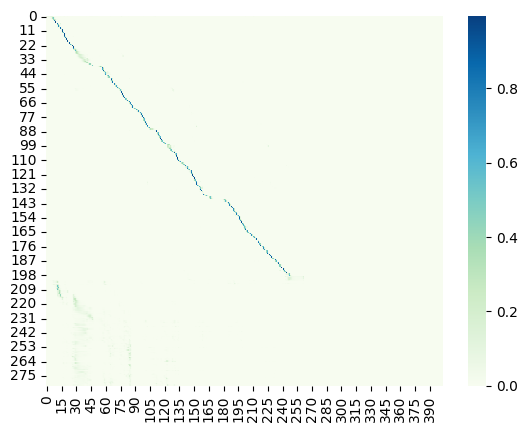

Saved best model

Epoch: 56/80


Val:   3%|▎         | 1/33 [00:02<01:31,  2.86s/it, dist=4.7333]

Ground Truth :  PRIDE AFTER SATISFACTION UPLIFTED HIM LIKE LONG SLOW WAVES
Prediction   :  PRIDE AFTER SATISFACTION UP LIFTED HIM LIKE LONG SLOW WAVES


Val:   6%|▌         | 2/33 [00:05<01:21,  2.63s/it, dist=4.1400]

Ground Truth :  I BEGGED RUGGEDO LONG AGO TO SEND HIM AWAY BUT HE WOULD NOT DO SO
Prediction   :  I BEGGED RUGGEDO LONG AGO TO SEND HIM AWAY BUT HE WOULD NOT DO SO


Val:   9%|▉         | 3/33 [00:07<01:17,  2.59s/it, dist=3.9200]

Ground Truth :  AS I WENT BACK TO THE FIELD HOSPITAL I OVERTOOK ANOTHER MAN WALKING ALONG
Prediction   :  AS I WENT BACK TO THE FIELD HOSPITAL I OVERTOOK ANOTHER MAN WALKING ALONG


Val:  12%|█▏        | 4/33 [00:10<01:14,  2.58s/it, dist=3.9850]

Ground Truth :  AND THE CAPTAIN OF COURSE CONCLUDED AFTER HAVING BEEN INTRODUCED TO KITTY THAT MISSUS NORMAN WAS A WIDOW
Prediction   :  AND THE CAPTAIN OF COURSE CONCLUDED AFTER HAVING BEEN INTRODUCED TO KITTY THAT MISSUS NORMAN WAS A WIDOW


Val:  15%|█▌        | 5/33 [00:12<01:11,  2.55s/it, dist=3.8813]

Ground Truth :  DOST THOU RISE AGAINST HIM WHO GIVES THEE HIS BREAD
Prediction   :  DOES THOU RISE AGAINST HIM WHO GIVES THEE HIS BREAD


Val:  18%|█▊        | 6/33 [00:15<01:07,  2.49s/it, dist=3.8767]

Ground Truth :  THE LOSS OF HIS TWO FRIENDS HAD A DEPRESSING EFFECT UPON OLD MISTER SHIMERDA
Prediction   :  THE LOSS OF HIS TWO FRIENDS HAD A DEPRESSING EFFECT UPON OLD MISTER SHIMERDA


Val:  21%|██        | 7/33 [00:17<01:03,  2.43s/it, dist=3.8886]

Ground Truth :  WHOSE FEET ARE AS THE FEET OF HARTS AND UNDERNEATH THE EVERLASTING ARMS
Prediction   :  WHOSE FEET ARE AS THE FEET OF HEARTS AND UNDERNEATH THE EVERLASTING ARMS


Val:  24%|██▍       | 8/33 [00:20<01:01,  2.47s/it, dist=4.0325]

Ground Truth :  SURE THING ANSWERED THE BOY
Prediction   :  SURE THING ANSWERED THE BOY


Val:  27%|██▋       | 9/33 [00:22<00:57,  2.41s/it, dist=3.9356]

Ground Truth :  PRAY HELP YOURSELF TO WINE
Prediction   :  PRAY HELP YOURSELF TO WINE


Val:  30%|███       | 10/33 [00:24<00:54,  2.38s/it, dist=3.9000]

Ground Truth :  THEN AS IF SATISFIED OF THEIR SAFETY THE SCOUT LEFT HIS POSITION AND SLOWLY ENTERED THE PLACE
Prediction   :  THEN AS IF SATISFIED OF THEIR SAFETY THE SCOUT LEFT HIS POSITION AND SLOWLY ENTERED THE PLACE


Val:  33%|███▎      | 11/33 [00:27<00:52,  2.38s/it, dist=3.8764]

Ground Truth :  IF THE QUESTION WAS SO OBSCURE THAT I COULD NOT MAKE OUT THE SENSE OF IT IT WAS NATURAL THAT I SHOULD NOT UNDERSTAND THE ANSWER
Prediction   :  IF THE QUESTION WAS SO OBSCURED THAT I COULD NOT MAKE OUT THE SENSE OF IT IT WAS NATURAL THAT I SHOULD NOT UNDERSTAND THE ANSWER


Val:  36%|███▋      | 12/33 [00:29<00:48,  2.33s/it, dist=3.8700]

Ground Truth :  LEMON JUICE MAY BE ADDED AT PLEASURE
Prediction   :  LEMON JUICE MAY BE ADDED AT PLEASURE


Val:  39%|███▉      | 13/33 [00:31<00:45,  2.27s/it, dist=3.8769]

Ground Truth :  I'M ALONE DO YOU HEAR THAT ALONE
Prediction   :  I'M ALONE DO YOU HEAR THAT ALONE


Val:  42%|████▏     | 14/33 [00:33<00:43,  2.30s/it, dist=3.8362]

Ground Truth :  ONE COULD SEE THAT HE WAS VERY MUCH WRAPPED UP IN HIS OFFSPRING
Prediction   :  ONE COULD SEE THAT HE WAS VERY MUCH WRAPPED UP IN HIS OFF SPRING


Val:  45%|████▌     | 15/33 [00:36<00:41,  2.33s/it, dist=3.8098]

Ground Truth :  A VERY SIMPLE LITTLE MARRIAGE FEAST BUT MORE LOVE GOOD WILL AND TENDER WISHES ADORNED THE PLAIN TABLE THAN IS OFTEN FOUND AT WEDDING BREAKFASTS AND BETTER THAN ANY SPEECH OR SONG WAS LETTY'S BROKEN WHISPER AS SHE FOLDED HER ARMS ROUND DAVID'S EMPTY CHAIR WHEN NO ONE SAW HER HEAVEN BLESS AND KEEP AND BRING HIM BACK TO US
Prediction   :  A VERY SIMPLE LITTLE MARRIAGE FEAST BUT MORE LOVE GOOD WILL AND TENDER WISHES AND DORING THE PLAIN TABLE THAN HIS OFTEN FOUND AT WEDDING BREAKFASTS AND BETTER THAN ANY SPEECH HER SONG WAS LET HIS BOKEN WHISPER AS SHE FOLLOWED HER ARMS ROUND DEVIDS AND THENCHER WHEN NO ONE SAW HER HEAVEN BLESSING KEEP AND BUNG WHOM BACK TO US


Val:  48%|████▊     | 16/33 [00:38<00:41,  2.43s/it, dist=3.7762]

Ground Truth :  THE ANCESTORS OF THE PRESENT PRETENDER CONGAL SURNAMED THE SQUINT EYED HAD TWICE RECEIVED AND CHERISHED THE LICENTIOUS BARDS WHEN UNDER THE BAN OF TARA AND HIS POPULARITY WITH THAT STILL POWERFUL ORDER WAS ONE PROP OF HIS AMBITION
Prediction   :  THE ANCESTORS OF THE PRESENT PRETENDER CONGOL SURNAMED THE SQUINT EYED HAD TWICE RECEIVED AND CHERISHED THE LISTENSIOUS BARDS WHEN UNDER THE BAN OF TARA AND HIS POPULARITY WITH THAT STILL POWERFUL ORDER WAS ONE PROP OF HIS AMBITION


Val:  52%|█████▏    | 17/33 [00:41<00:38,  2.39s/it, dist=3.7624]

Ground Truth :  HE HELD A HOE IN HIS HAND AND WHILE PHOEBE WAS GONE IN QUEST OF THE CRUMBS HAD BEGUN TO BUSY HIMSELF WITH DRAWING UP FRESH EARTH ABOUT THE ROOTS OF THE TOMATOES
Prediction   :  HE HELD A HOW IN HIS HAND AND WHILE PHOEBE WAS GONE IN QUEST OF THE CRUMBS HAD BEGUN TO BUSY HIMSELF WITHDRAWING UP FRESH EARTH ABOUT THE ROOTS OF THE TOMATOES


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.39s/it, dist=3.7900]

Ground Truth :  WHEREBY OTHER LADIES WHO WERE ABOUT THE ROOM BECOMING AWARE OF MY DISCOMFORT BY REASON OF THE MOAN THAT SHE MADE WHO INDEED WAS OF MY VERY NEAR KINDRED LED HER AWAY FROM WHERE I WAS AND THEN SET THEMSELVES TO AWAKEN ME THINKING THAT I DREAMED AND SAYING SLEEP NO LONGER AND BE NOT DISQUIETED
Prediction   :  WHEREBY OTHER LADIES WHO WERE ABOUT THE ROOM BECOMING AWARE OF MY DISCOMFORT BY REASON OF THE MOAN THAT SHE MADE WHO INDEED WAS OF MY VERY YOUR KINDRED LET HER AWAY FROM WHERE I WAS AND UNSET FROMSELVES TO AWAKEN ME THINKING THAT I DREAMED AND SANG SLEEPING A LONGER AND BE NOT DISQUIETED


Val:  58%|█████▊    | 19/33 [00:46<00:33,  2.41s/it, dist=3.8088]

Ground Truth :  WE LAY STILL AND DID NOT TALK
Prediction   :  WE LAY STILL AND DID NOT TALK


Val:  61%|██████    | 20/33 [00:48<00:30,  2.35s/it, dist=3.7973]

Ground Truth :  WHAT A FUSS IS MADE ABOUT YOU MY DEAR LITTLE FRIENDS
Prediction   :  WATAH FASTES MADE ABOUT YOU MY DEAR LITTLE FRIENDS


Val:  64%|██████▎   | 21/33 [00:50<00:27,  2.31s/it, dist=3.7975]

Ground Truth :  THEIR CHURCHES HAVE DISAPPEARED THEIR BOOKS ARE OBLITERATED THEIR OBSCURE FREEDOM MIGHT ALLOW A LATITUDE OF FAITH AND THE SOFTNESS OF THEIR INFANT CREED WOULD BE VARIOUSLY MOULDED BY THE ZEAL OR PRUDENCE OF THREE HUNDRED YEARS
Prediction   :  THEIR CHURCHES HAVE DISAPPEARED THEIR BOOKS ARE OBLITERATED THEIR OBSCURE FREEDOM MIGHT ALLOW A LATITUDE OF FAITH AND THE SOFTNESS OF THEIR INFANT CREED WOULD BE VARIOUSLY MOULDED BY THE ZEAL OR PRUDENCE OF THREE HUNDRED YEARS


Val:  67%|██████▋   | 22/33 [00:52<00:25,  2.31s/it, dist=3.8118]

Ground Truth :  I BELIEVE IN THE TRAINING OF PEOPLE TO THEIR HIGHEST CAPACITY THE ENGLISHMAN HERE HEARTILY SECONDED HIM
Prediction   :  I BELIEVE IN THE TRAIN IN OF PEOPLE TO THEIR HIGHEST CAPACITY THE ENGLISHMAN HERE HEARTILY SECONDED HIM


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.34s/it, dist=3.7852]

Ground Truth :  IT WAS UNDER SUCH AUSPICIOUS CIRCUMSTANCES THAT SHE STARTED OUT THIS MORNING TO LOOK FOR WORK
Prediction   :  IT WAS UNDER SUCH AUSPICIOUS CIRCUMSTANCES THAT SHE STARTED OUT THIS MORNING TO LOOK FOR WORK


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.37s/it, dist=3.7400]

Ground Truth :  MY SCHOLAR HAS BEEN LEFT VERY POOR BUT HE IS HARD WORKING AND INDUSTRIOUS HE WILL DO WELL
Prediction   :  MY SCHOLAR HAS BEEN LEFT VERY POOR BUT HE IS HARD WORKING AND INDUSTRIOUS HE WILL DO WELL


Val:  76%|███████▌  | 25/33 [00:59<00:18,  2.31s/it, dist=3.7389]

Ground Truth :  YOU WON'T BE SO FAST TO WAKE UP HARD WORKING COWBOYS AFTER THAT I RECKON
Prediction   :  YOU WON'T BE SO FAST AWAKE UP HARDLY AND CALBOLIES AFTER THAT I RECKON


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.35s/it, dist=3.7749]

Ground Truth :  AT THE END OF IT SHE WAS IN A PLACE OF TOMBS
Prediction   :  AT THE END OF IT SHE WAS IN A PLACE OF TOMBS


Val:  82%|████████▏ | 27/33 [01:04<00:13,  2.33s/it, dist=3.7696]

Ground Truth :  BY THE TIME WE HAD PLACED THE COLD FRESH SMELLING LITTLE TREE IN A CORNER OF THE SITTING ROOM IT WAS ALREADY CHRISTMAS EVE
Prediction   :  BY THE TIME WE HAD PLACED THE COLD FRESH SMELLING LITTLE TREE IN A CORNER OF THE SITTING ROOM IT WAS ALREADY CHRISTMAS EVE


Val:  85%|████████▍ | 28/33 [01:06<00:11,  2.34s/it, dist=3.7652]

Ground Truth :  NO ONE WHO IS HIMSELF HONEST WILL DOUBT MY BEING SO
Prediction   :  NO ONE WHO IS HIMSELF HONEST WILL DOUBT MY BEING SO


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.34s/it, dist=3.7499]

Ground Truth :  THEIR PIETY WOULD BE LIKE THEIR NAMES LIKE THEIR FACES LIKE THEIR CLOTHES AND IT WAS IDLE FOR HIM TO TELL HIMSELF THAT THEIR HUMBLE AND CONTRITE HEARTS IT MIGHT BE PAID A FAR RICHER TRIBUTE OF DEVOTION THAN HIS HAD EVER BEEN A GIFT TENFOLD MORE ACCEPTABLE THAN HIS ELABORATE ADORATION
Prediction   :  THEIR PIETY WOULD BE LIKE THEIR NAMES LIKE THEIR FACES LIKE THEIR CLOTHES AND IT WAS IDLE FOR HIM TO TELL HIMSELF THAT THEIR HUMBLE AND CONTRITE HEARTS IT MIGHT BE PAID A FAR RICHER TRIBUTE OF DEVOTION THAN HIS HAD EVER BEEN A GIFT TENFOLD MORE ACCEPTABLE THAN HIS ELABORATE ADORATION


Val:  91%|█████████ | 30/33 [01:11<00:06,  2.29s/it, dist=3.7198]

Ground Truth :  AFTER THE CEREMONY AT THE CHURCH THE PARTY WENT TO A DINNER GIVEN BY THE PARENTS OF THE BRIDE
Prediction   :  AFTER THE CEREMONY AT THE CHURCH THE PARTY WENT TO A DINNER GIVEN BY THE PARENTS OF THE BRIDE


Val:  94%|█████████▍| 31/33 [01:13<00:04,  2.30s/it, dist=3.7163]

Ground Truth :  WHAT DO YOU MAKE OF IT GRYCE
Prediction   :  WHAT DO YOU MAKE OF IT GRICE


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.29s/it, dist=3.7042]

Ground Truth :  THEY BELIEVED THAT THROUGH ME THEY POSSESSED THE PHILOSOPHER'S STONE THE UNIVERSAL PANACEA THE INTERCOURSE WITH ALL THE ELEMENTARY HEAVENLY AND INFERNAL SPIRITS THEY HAD NO DOUBT WHATEVER THAT THANKS TO MY SUBLIME SCIENCE THEY COULD FIND OUT THE SECRETS OF EVERY GOVERNMENT IN EUROPE
Prediction   :  THEY BELIEVE THAT THROUGH ME THEY POSSESSED THE PHILOSOPHER STONE THE UNIVERSAL PANACEA THE INTERCOURSE WITH ALL THE ELEMENTARY HEAVENLY AND INFERNAL SPIRITS AND THEY HAD NO DOUBT WHATEVER THAT THANKS TO MY SUBLIME SCIENCE THEY COULD FIND OUT THE SECRETS OF EVERY GOVERNMENT IN EUROPE


Ground Truth :  IT HAS BEEN INTRODUCED INTO ITALY WHERE THEY MAKE A COARSE BREAD FROM IT AND IT IS ALSO EMPLOYED IN PASTRY AND PUDDINGS THEY ALSO USE IT FOR FEEDING HORSES AND DOMESTIC FOWLS
Prediction   :  IT HAS BEEN INTRODUCED INTO ITALY WHERE THEY MAKE A COURSE BREAD FROM IT AND IT IS ALSO EMPLOYED IN PASTRY AND PUDDINGS THEY ALSO USE IT FOR FEEDING HORSES AND DOMESTIC FOWLS


	Train Loss 0.0971	 Learning Rate 0.0003042
	Val Dist 3.7040	
	Teacher Forcing Ratio 1	


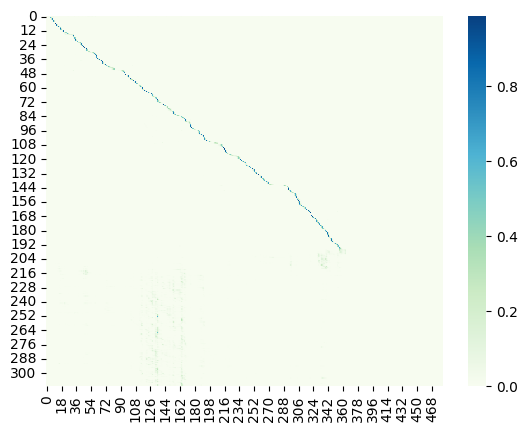

Saved best model

Epoch: 57/80


Val:   3%|▎         | 1/33 [00:02<01:33,  2.92s/it, dist=3.5600]

Ground Truth :  ONLY FOR A MINUTE OR SO
Prediction   :  ONLY FOR A MINUTE OR SO


Val:   6%|▌         | 2/33 [00:05<01:22,  2.65s/it, dist=3.8433]

Ground Truth :  SHE SLID TO THE FLOOR BESIDE HIM AS IF SHE WERE TOO TIRED TO SIT UP ANY LONGER
Prediction   :  SHE SLED TO THE FLOOR BESIDE HIM AS IF SHE WERE TOO TIRED TO SIT UP ANY LONGER


Val:   9%|▉         | 3/33 [00:07<01:18,  2.60s/it, dist=3.8956]

Ground Truth :  ROUND HIS BODY WAS ROLLED A LONG COIL OF FLAX ROPE
Prediction   :  ROUND HIS BODY WAS ROLLED ALONG COIL OF FLAX ROPE


Val:  12%|█▏        | 4/33 [00:10<01:13,  2.53s/it, dist=3.7650]

Ground Truth :  DON'T YOU SEE HOW MANY USES WE HAVE FOUND FOR THIS REFUSE COAL TAR
Prediction   :  DON'T YOU SEE HOW MANY USES WE HAVE FOUND FOR THIS REFUSE COAL TAR


Val:  15%|█▌        | 5/33 [00:12<01:08,  2.46s/it, dist=3.6333]

Ground Truth :  THIS IS A MISTAKE THOUGH A PERFECTLY NATURAL ONE
Prediction   :  THIS IS A MISTAKE THOUGH A PERFECTLY NATURAL ONE


Val:  18%|█▊        | 6/33 [00:14<01:04,  2.40s/it, dist=3.6378]

Ground Truth :  PUT THE UDDER INTO A STEWPAN WITH SUFFICIENT WATER TO COVER IT LET IT STEW GENTLY TILL QUITE DONE WHEN TAKE IT OUT TO COOL
Prediction   :  PUT THE UTTER INTO A STEWPEN WITH SUFFICIENT WATER TO COVER IT LET IT STEW GENTLY TILL QUITE DONE WHEN TAKE IT OUT TO COOL


Val:  21%|██        | 7/33 [00:17<01:03,  2.44s/it, dist=3.6914]

Ground Truth :  HE ALSO THOUGHT OF HIS MANAGERIAL POSITION
Prediction   :  HE ALSO THOUGHT OF HIS MANAGERIAL POSITION


Val:  24%|██▍       | 8/33 [00:19<01:00,  2.42s/it, dist=3.6025]

Ground Truth :  MARK SOWERBY AND CLAUS HENNERBERG
Prediction   :  MARK SOURBY AND CLOUDS HINTERBURG


Val:  27%|██▋       | 9/33 [00:22<00:58,  2.45s/it, dist=3.6770]

Ground Truth :  IT'S DELIGHTFUL TO HEAR IT IN A LONDON THEATRE
Prediction   :  IS DELIGHTFUL TO HEAR IT IN A LONDON THEATRE


Val:  30%|███       | 10/33 [00:24<00:57,  2.48s/it, dist=3.6920]

Ground Truth :  WANTS TO COME OUT MISTER NORTH
Prediction   :  ONCE TO COME OUT MISTER NORTH


Val:  33%|███▎      | 11/33 [00:27<00:53,  2.45s/it, dist=3.5855]

Ground Truth :  I'M ALONE DO YOU HEAR THAT ALONE
Prediction   :  I'M ALONE DO YOU HEAR THAT ALONE


Val:  36%|███▋      | 12/33 [00:29<00:50,  2.42s/it, dist=3.6211]

Ground Truth :  A MINUTE IS NOT A VERY LARGE MEASURE OF TIME AND HIS BODY NEEDED EVERY FRACTION OF IT
Prediction   :  A MINUTE IS NOT A VERY LARGE MEASURE OF TIME AND HIS BODY NEEDED EVERY FRACTION OF IT


Val:  39%|███▉      | 13/33 [00:32<00:48,  2.42s/it, dist=3.6154]

Ground Truth :  IT'LL BE NO USE THEIR PUTTING THEIR HEADS DOWN AND SAYING COME UP AGAIN DEAR
Prediction   :  IT'LL BE NO USE THEIR PUDDING THEIR HEADS DOWN AND SAYING COME UP AGAIN DEAR


Val:  42%|████▏     | 14/33 [00:34<00:44,  2.34s/it, dist=3.5452]

Ground Truth :  IT MUST REMEMBER BE ONE OR THE OTHER
Prediction   :  IT MUST REMEMBER BE ONE OR THE OTHER


Val:  45%|████▌     | 15/33 [00:36<00:42,  2.34s/it, dist=3.5151]

Ground Truth :  WE RANGE WIDER LAST LONGER AND ESCAPE MORE AND MORE FROM INTENSITY TOWARDS UNDERSTANDING
Prediction   :  WE RANGE WIDER LAST LONGER AND ESCAPE MORE AND MORE FROM INTENSITY TOWARDS UNDERSTANDING


Val:  48%|████▊     | 16/33 [00:38<00:39,  2.33s/it, dist=3.4467]

Ground Truth :  I HAVE DRAWN UP A LIST OF ALL THE PEOPLE WHO OUGHT TO GIVE US A PRESENT AND I SHALL TELL THEM WHAT THEY OUGHT TO GIVE IT WON'T BE MY FAULT IF I DON'T GET IT
Prediction   :  I HAVE DRAWN UP A LIST OF ALL THE PEOPLE WHO OUGHT TO GIVE US A PRESENT AND I SHALL TELL THEM WHAT THEY OUGHT TO GIVE IT WON'T BE MY FAULT IF I DON'T GET IT


Val:  52%|█████▏    | 17/33 [00:41<00:37,  2.34s/it, dist=3.4647]

Ground Truth :  FOR HIM THE CRIMINAL IS THE PRISONER SIMPLE IS IT NOT
Prediction   :  FOR HIM THAT THE CRIMINAL IS PRISONER SIMPLE IS A NOT


Val:  55%|█████▍    | 18/33 [00:43<00:34,  2.33s/it, dist=3.5104]

Ground Truth :  IT'S THE MOST INEXPLICABLE THERE
Prediction   :  IT'S THE MOST INEXPLICABLE THERE


Val:  58%|█████▊    | 19/33 [00:46<00:33,  2.41s/it, dist=3.5407]

Ground Truth :  NIGHT AFTER NIGHT HIS SLEEP HAD BEEN DISTURBED BY FEARS FOR HER WHEN ABROAD MORNING AFTER MORNING IT HAD BEEN BROKEN BY THE CLAMOUR OF HER RETURN
Prediction   :  NIGHT AFTER NIGHT HIS SLEEP HAD BEEN DISTURBED BY FEARS FOR HER WHEN ABROAD MORNING AFTER MORNING IT HAD BEEN BROKEN BY THE CLAMOUR OF HER RETURN


Val:  61%|██████    | 20/33 [00:48<00:31,  2.43s/it, dist=3.5177]

Ground Truth :  AND I WILL SEE THAT THERE IS NO SHIRKING ABOUT THE BOYS OR ABOUT THE GIRLS EITHER
Prediction   :  AND I WILL SEE THAT THERE IS NO SHIRKING ABOUT THE BOYS OR ABOUT THE GIRLS EITHER


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.41s/it, dist=3.4886]

Ground Truth :  I THINK WE MUST HAVE KILLED A GOOD MANY IN THE OLD FIELD BECAUSE WE WERE FIRING ALL THE TIME AT THE SOLID LINE AS THEY ADVANCED UPON US
Prediction   :  I THINK WE WAS TO KILL THE GOOD MANY IN THE OLD FIELD BECAUSE WE WERE FIRING ALL THE TIME AT THE SOLID LINE AS THEY ADVANCED UPON US


Val:  67%|██████▋   | 22/33 [00:53<00:26,  2.38s/it, dist=3.5215]

Ground Truth :  THE CAPTURE OF LEE WAS A FAR MORE DIFFICULT UNDERTAKING
Prediction   :  THE CAPTURE OF LEAVE WAS A FARM MORE DIFFICULT UNDERTAKING


Val:  70%|██████▉   | 23/33 [00:55<00:24,  2.42s/it, dist=3.5293]

Ground Truth :  AND TO CHOOSE FOR COMPANY THAT ROGUISH AND CHEERFUL VICE POLITENESS
Prediction   :  AND TO CHOOSE FOR COMPANY THAT ROGISH AND CHEERFUL VICE POLITENESS


Val:  73%|███████▎  | 24/33 [00:58<00:21,  2.40s/it, dist=3.5714]

Ground Truth :  THE GHOUL LIKE FEVER WAS NOT TO BE BRAVED WITH IMPUNITY AND BAULKED OF ITS PREY
Prediction   :  THE GHOOL LIKE FEVER WAS NOT TO BE BRAVED WITH IMPUNITY AND BOCKED OF ITS PRAY


Val:  76%|███████▌  | 25/33 [01:00<00:18,  2.35s/it, dist=3.5565]

Ground Truth :  THAT WILL BE SAFEST NO NO NEVER
Prediction   :  THAT WILL BE THE SAFEST NO NO NEVER


Val:  79%|███████▉  | 26/33 [01:03<00:17,  2.43s/it, dist=3.5685]

Ground Truth :  THE MEN APPEARED ROBUST BUT HEAVY FAIR HAIRED LIKE GERMANS BUT OF PENSIVE MIEN EXILES OF A HIGHER SCALE IN THE LADDER OF HUMANITY THAN THE ESKIMOS BUT I THOUGHT MUCH MORE UNHAPPY SINCE WITH SUPERIOR PERCEPTIONS THEY ARE COMPELLED TO LIVE WITHIN THE LIMITS OF THE POLAR CIRCLE
Prediction   :  THE MEN APPEARED ROBUST BUT HEAVY FAIR HAIRED LIKE GERMANS BUT OF PENCIVE MEAN EXILES OF A HIGHER SCALE IN THE LATTER OF HUMANITY IN THE ESCAMOS BUT I THOUGHT MUCH MORE UNHAPPY SINCE WITH SUPERIOR PERCEPTIONS THEY ARE COMPELLED TO LIVE WITHIN THE LIMITS OF THE POOR CIRCLE


Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.33s/it, dist=3.5738]

Ground Truth :  DEAR ME EJACULATED THE OLD GENTLEMAN IN THE UTMOST AMAZEMENT AND SUCH A TIME AS I'VE HAD TO GET HER HERE TOO
Prediction   :  DEAR ME EJACULATED THE OLD GENTLEMAN AND THE UTMOST AMAZEMENT AND SUCH A TIME AS I'VE HAD TO GET HER HERE TOO


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.34s/it, dist=3.6355]

Ground Truth :  WHAT COULD BE THE OBJECT
Prediction   :  WHAT COULD BE THE OBJECT


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.39s/it, dist=3.6122]

Ground Truth :  IF YOU'VE GOT PISTOLS JUST YOU THINK ONCE BEFORE YOU SHOOT SAID COLLINS
Prediction   :  IF YOU'VE GOT PISTOLS JUST YOU THINK ONCE BEFORE IT ISSUED SAID COLUMNS


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.41s/it, dist=3.6089]

Ground Truth :  THESE BUNS MAY BE VARIED BY ADDING A FEW CURRANTS CANDIED PEEL OR CARAWAY SEEDS TO THE OTHER INGREDIENTS AND THE ABOVE MIXTURE ANSWERS FOR HOT CROSS BUNS BY PUTTING IN A LITTLE GROUND ALLSPICE AND BY PRESSING A TIN MOULD IN THE FORM OF A CROSS IN THE CENTRE OF THE BUN
Prediction   :  THESE BUNS MAY BE BURIED BY ADDING A FEW CURRENTS CANDIED PEEL OR CARAWAY SEEDS TO THE OTHER INGREDIENTS AND THE ABOVE MIXTURE ANSWERS FOR HOT CROSS BUNS BY PUTTING IN A LITTLE GROUND ALL SPICE AND BY PRESSING A TIN MOULD IN THE FORM OF A CROSS IN THE CENTER OF THE BUN


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.36s/it, dist=3.5895]

Ground Truth :  I CAN'T PRAY TO HAVE THE THINGS I WANT HE SAID SLOWLY AND I WON'T PRAY NOT TO HAVE THEM NOT IF I'M DAMNED FOR IT
Prediction   :  I CAN'T PRAY TO HAVE THE THINGS I WANT HE SAID SLOWLY AND I WON'T PRAY NOT TO HAVE THEM NOT IF I'M DAMNED FOR IT


Val:  97%|█████████▋| 32/33 [01:17<00:02,  2.37s/it, dist=3.5963]

Ground Truth :  BOTH LIPS ASKED THE LARVAE
Prediction   :  BOOL FLIPS ASKED THE LARBY


Ground Truth :  THEN SHE WALKED AND SANG TO IT UNTIL HANSON DISTURBED IN HIS READING CAME AND TOOK IT
Prediction   :  THAN SHE WALKED AND SANG TO IT UNTIL HANDSOME DISTURBED IN HIS READING CAME AND TOOK IT
	Train Loss 0.0940	 Learning Rate 0.0002838
	Val Dist 3.5820	
	Teacher Forcing Ratio 1	


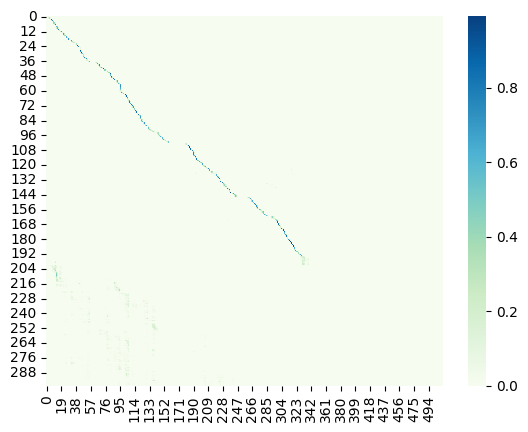

Saved best model

Epoch: 58/80


Val:   3%|▎         | 1/33 [00:02<01:28,  2.76s/it, dist=3.9600]

Ground Truth :  I SHALL NEVER GET TO TWENTY AT THAT RATE
Prediction   :  I SHALL NEVER GET TO TWENTY AT THAT RIGHT


Val:   6%|▌         | 2/33 [00:05<01:16,  2.46s/it, dist=3.6333]

Ground Truth :  THE SUGGESTION HE HAD LAUGHED AT WAS NOT SO ENTIRELY FOOLISH AS HE HAD BEEN PLEASED TO CONSIDER IT
Prediction   :  THE SUGGESTION HE HAD LAUGHED AT WAS NOT SO ENTIRELY FOOLISH AS HE HAD BEEN PLEASED TO CONSIDER IT


Val:   9%|▉         | 3/33 [00:07<01:13,  2.46s/it, dist=3.5956]

Ground Truth :  THERE'S A KNOCKER IF NONE OF EM HAVEN'T TWISTED IT OFF
Prediction   :  THERE'S A KNOCKER IF NONE OF EM HAVEN'T TWISTED IT OFF


Val:  12%|█▏        | 4/33 [00:09<01:10,  2.43s/it, dist=3.7417]

Ground Truth :  VERY TRULY YOURS ET CETERA COMPROMISE
Prediction   :  VERY TRULY YOURS ET CETERA COMPROMISE


Val:  15%|█▌        | 5/33 [00:12<01:07,  2.42s/it, dist=3.7320]

Ground Truth :  ORGAN OF RUT NOT REASON IS THE LORD WHO FROM THE BODY POLITIC DOTH DRAIN LUST FOR HIMSELF INSTEAD OF TOIL AND PAIN LEAVING US LEAN AS CRICKETS ON DRY SWARD
Prediction   :  ORGAN OF WROUGHT NOT REASON IS THE LORD WHO FROM THE BODY POLITIC DOTH DRAIN LUST FOR HIMSELF INSTEAD OF TOIL AND PAIN LEAVING OFF SLEEMEST CRICKETS UNDRY SWARD


Val:  18%|█▊        | 6/33 [00:14<01:06,  2.45s/it, dist=3.6300]

Ground Truth :  HERE SAID ONE OF THEIR GUIDES AS THE PROCESSION HALTED BEFORE THE LITTLE STONE BUILDING IS THE PALACE OF TOURMALINE WHO IS OUR QUEEN
Prediction   :  HERE SAID ONE OF THEIR GRIDES AS THE PROCESSION HALTED BEFORE THE LITTLE STONE BUILDING IS THE PALACE OF TORMELY WHO IS OUR QUEEN


Val:  21%|██        | 7/33 [00:17<01:04,  2.46s/it, dist=3.6048]

Ground Truth :  HERS HAS BEEN PRODIGIOUS
Prediction   :  HERS HAS BEEN PRODIGIOUS


Val:  24%|██▍       | 8/33 [00:19<01:01,  2.45s/it, dist=3.6550]

Ground Truth :  AFTER THE CEREMONY AT THE CHURCH THE PARTY WENT TO A DINNER GIVEN BY THE PARENTS OF THE BRIDE
Prediction   :  AFTER THE CEREMONY AT THE CHURCH THE PARTY WENT TO A DINNER GIVEN BY THE PARENTS OF THE BRIDE


Val:  27%|██▋       | 9/33 [00:22<00:58,  2.44s/it, dist=3.8800]

Ground Truth :  EVERY ONE SAID PETER KISSED THE COW BEFORE SHE WAS LED AWAY BY HER NEW OWNER
Prediction   :  EVERY ONE SAID PETER KISSED THE COW BEFORE SHE WAS LED AWAY BY HER NEW HONOUR


Val:  30%|███       | 10/33 [00:24<00:57,  2.50s/it, dist=3.8507]

Ground Truth :  I DON'T WANT YOU TO I LOVE TO SEE YOU SO YOUNG AND HAPPY ONLY YOU ARE NOT THE OLD DAVID AND I'VE GOT TO GET ACQUAINTED WITH THE NEW ONE
Prediction   :  I DON'T WANT YOUR TOO I LOVED TO SEE YOU SO A YOUNG AND TAPPY ONLY YOU ARE NOT THE OLD DAYFORD AND I'VE GOT TO GET ACQUAINTED WITH THE NEW ONE


Val:  33%|███▎      | 11/33 [00:27<00:54,  2.49s/it, dist=3.8097]

Ground Truth :  HOLMES HELD OUT A SMALL CHIP WITH THE LETTERS N N AND A SPACE OF CLEAR WOOD AFTER THEM YOU SEE
Prediction   :  HOLMES HELD OUT A SMALL CHIP WITH THE LETTERS AND AND A SPACE OF CLEAR WOOD AFTER THEM YOU SEE


Val:  36%|███▋      | 12/33 [00:29<00:51,  2.46s/it, dist=3.8533]

Ground Truth :  THEY STAND UNMOVED IN THEIR SOLITARY GREATNESS WELL ASSURED THAT THEY ARE SEEN OF ALL THE WORLD WITHOUT ANY EFFORT TO SHOW THEMSELVES OFF AND THAT NO ONE WILL ATTEMPT TO DRIVE THEM FROM THAT POSITION
Prediction   :  THEY STAND UNMOVED IN THEIR SOLITARY GREATNESS WELL ASSURED THAT THEY ARE SEEN OF ALL THE WORLD WITHOUT ANY EFFORT TO SHOW THEMSELVES OFF AND THAT NO ONE WILL ATTEMPT TO DRIVE THEM FROM THAT POSITION


Val:  39%|███▉      | 13/33 [00:31<00:48,  2.42s/it, dist=3.8010]

Ground Truth :  HE COULD WAIT NO LONGER
Prediction   :  HE COULD WAIT NO LONGER


Val:  42%|████▏     | 14/33 [00:34<00:44,  2.34s/it, dist=3.7295]

Ground Truth :  AND THE WOLVES PAVEL ASKED ENOUGH ENOUGH FOR ALL OF US
Prediction   :  AND THE WOLVES POVEL ASKED ENOUGH ENOUGH FOR ALL OF US


Val:  45%|████▌     | 15/33 [00:36<00:42,  2.39s/it, dist=3.7400]

Ground Truth :  I DON'T THINK HIS GUN WAS LOADED THOUGH BECAUSE WE DID NOT HEAR THE BALL WHISTLE
Prediction   :  I DON'T THINK HIS GUN WAS LOADED THOUGH BUT AS WE DID NOT HEAR THE BALL WHISTLE


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.40s/it, dist=3.6700]

Ground Truth :  THEY HAD FOUR OR FIVE SPECIES OF WHAT MIGHT LOOSELY BE CALLED BIRDS AND SOMETHING THAT COULD EASILY BE CLASSED AS A REPTILE AND A CARNIVOROUS MAMMAL THE SIZE OF A CAT WITH BIRDLIKE CLAWS AND A HERBIVORE ALMOST IDENTICAL WITH THE PIGLIKE THING IN THE BIG DARFHULVA MURAL AND ANOTHER LIKE A GAZELLE WITH A SINGLE HORN IN THE MIDDLE OF ITS FOREHEAD
Prediction   :  THEY HAD FOUR FIVE SPECIES OF WHAT MIGHT LOOSELY BE CALLED BIRDS AND SOMETHING THAT COULD EASILY BE CLASSED AS A REPTILE AND A CARNIVEROUS MAMMAL THE SIZE OF A CAT WITH BIRD LIKE CLAWS AND A HERBER WAR ALMOST IDENTICAL WITH A PIG LIKE THING IN THE BIG DARF HOLD A MIRAL AND ANOTHER LIKE A GAZELLE WITH A SINGLE HORN IN THE MIDDLE OF ITS FOREHEAD


Val:  52%|█████▏    | 17/33 [00:41<00:37,  2.37s/it, dist=3.6639]

Ground Truth :  THE BEST OF US ARE NOT EXEMPT FROM EGOTISTICAL THOUGHTS
Prediction   :  THE BEST OF US ARE NOT EXEMPT FROM EGOTISTICAL THOUGHTS


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.35s/it, dist=3.6770]

Ground Truth :  WHILE THE LIBERATED EXILES REJOICED ON THE PLAIN OF MEATH THE TENT OF THE ABBOT OF IONA WAS PITCHED ON THE RATH OF TARA A FACT WHICH WOULD SEEM TO INDICATE THAT ALREADY IN LITTLE MORE THAN A CENTURY SINCE THE INTERDICT HAD FALLEN ON IT THE EDIFICES WHICH MADE SO FINE A SHOW IN THE DAYS OF PATRICK WERE RUINED AND UNINHABITABLE
Prediction   :  WHILE THE LIBERATED EXILES REJOICED ON THE PLAIN OF MEET THE TENT OF THE ABBOT OF IONA WAS PITCHED ON THE RATH OF TARA A FACT WHICH WOULD SEEM TO INDICATE THAT ALREADY IN LITTLE MORE THAN A CENTURY SINCE THE INTERDECTED FALLEN ON IT THE EDIFICES WHICH MADE SO FINE A SHOW IN THE DAYS OF PATRICK WERE RUINED AND UNINHABITABLE


Val:  58%|█████▊    | 19/33 [00:46<00:33,  2.37s/it, dist=3.6442]

Ground Truth :  THE LEMON THIS FRUIT IS A NATIVE OF ASIA AND IS MENTIONED BY VIRGIL AS AN ANTIDOTE TO POISON
Prediction   :  THE LEMON THIS FRUIT IS A NATIVE OF ASIA AND IS MENTIONED BY VIRGIL AS AN ANTIDOTE TO POISON


Val:  61%|██████    | 20/33 [00:48<00:30,  2.37s/it, dist=3.6313]

Ground Truth :  IT WAS SPECIALLY SUITED FOR A TRIAL PLANT ALSO IN THE EARLY DAYS WHEN A YIELD OF SIX OR EIGHT LAMPS TO THE HORSE POWER WAS CONSIDERED SUBJECT FOR CONGRATULATION
Prediction   :  IT WAS SPECIALLY SUITED FOR A TRIAL PLANT ALSO IN THE EARLY DAYS WHEN A YIELD OF SIX OR EIGHT LAMPS TO THE HORSE POWER WAS CONSIDERED SUBJECT FOR CONGRATULATION


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.40s/it, dist=3.6337]

Ground Truth :  PUT THE PULP INTO A BASIN WITH TWO OUNCES OF MELTED BUTTER TWO TABLESPOONFULS OF LEMON JUICE HALF A POUND OF CHESTNUTS BOILED AND GRATED AND SEASONING OF SALT AND WHITE PEPPER TO TASTE
Prediction   :  PUT THE PALP INTO A BASIN WITH TWO HOUNDSES OF MELTED BUTTER TWO TABLESPOONFULS OF LEMON JEWS HALF APPOUND OF JUST NUTS BOILED AND GREATED AND SEIZED INTO SALT AND WHITE PEPPER TO TASTE


Val:  67%|██████▋   | 22/33 [00:53<00:26,  2.38s/it, dist=3.5667]

Ground Truth :  I TOLD HIM AND HE INSISTED UPON MY COMING WITH HIM IN THE GONDOLA SAYING THAT HE WOULD LEAVE ME AT MY HOUSE
Prediction   :  I TOLD HIM AND HE INSISTED UPON MY COMING WITH HIM IN THE GONDOLA SAYING THAT HE WOULD LEAVE ME AT MY HOUSE


Val:  70%|██████▉   | 23/33 [00:55<00:24,  2.41s/it, dist=3.5568]

Ground Truth :  I BEGAN TO ENJOY THE EXHILARATING DELIGHT OF TRAVELING A LIFE OF DESIRE GRATIFICATION AND LIBERTY
Prediction   :  I BEGAN TO ENJOY THE EXHILARATING DELAY OF TRAVELING A LIFE OF DESIRE GRATIFICATION AND LIBERTY


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.36s/it, dist=3.5417]

Ground Truth :  NOW IT WAS BURNED AWAY AT BOTH SIDES AND LAY STILL HOT ALONG THE EDGES ON THE FLOOR OF THE BIG OFFICE ROOM IN FRONT
Prediction   :  NOW IT WAS BURNED AWAY AT BOTH SIDES AND LAY STILL HOT ALONG THE EDGES ON THE FLOOR OF THE BIG OFFICE ROOM IN FRONT


Val:  76%|███████▌  | 25/33 [01:00<00:19,  2.39s/it, dist=3.5320]

Ground Truth :  I SAY SIR HARRY THE LITTLE GIRL'S GOING FAMOUSLY TO NIGHT ISN'T SHE
Prediction   :  I SAY SIR HARRY THE LITTLE GIRLS GOING FAMOUSLY TO NIGHT ISN'T SHE


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.40s/it, dist=3.5418]

Ground Truth :  HE WAS THAT CHILD'S STAY AND SHE WAS HIS PROP
Prediction   :  HE WAS THAT CHILD'S STAY AND SHE WAS HIS PROP


Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.42s/it, dist=3.5523]

Ground Truth :  THEY ARE NOURISHING THEIR GREED ON THE QUIVERING FLESH AND THE WARM BLOOD OF THE PEOPLE NOTHING ELSE
Prediction   :  THEY ARE NOURISHING THEIR GREET ON THE QUIVERING FLESH IN THE WARM BLOOD OF THE PEOPLE NOTHING ELSE


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.39s/it, dist=3.5467]

Ground Truth :  THE LADIES IN YELLOW DRESSES STAND AGAIN IN A RING ABOUT THE EMPEROR'S DAUGHTER AND ARE FOR THE LAST TIME ACCOSTED BY THE SINGER WITH HIS LUTE
Prediction   :  THE LADIES IN YELLOW DRESSES STAND AGAIN IN A RING ABOUT THE EMPEROR'S DAUGHTER AND ARE FOR THE LAST TIME ACCOSTED BY THE SIGNOR WITH HIS LUDE


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.36s/it, dist=3.5538]

Ground Truth :  MARIE'S FACE FELL UNDER HIS BROODING GAZE
Prediction   :  MARIE'S FACE FELL UNDER HIS BROODING GAZE


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.40s/it, dist=3.5351]

Ground Truth :  OUTSIDE OF THESE OCCASIONAL REMINDERS WE COULD SEE NO EVIDENCE OF THE DESOLATION OF THE TRACK OF AN INVADING ARMY
Prediction   :  OUTSIDE OF THESE OCCASIONAL REMINDERS WE COULD SEE NO EVIDENCE OF THE DESOLATION OF THE TRACK OF AN INVADING ARMY


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.42s/it, dist=3.5232]

Ground Truth :  HE COULD HARDLY REALISE HOW IT HAD ALL COME ABOUT
Prediction   :  HE COULD HARDLY REALIZE HOW IT HAD ALL COME ABOUT


Val:  97%|█████████▋| 32/33 [01:17<00:02,  2.38s/it, dist=3.5342]

Ground Truth :  IF A LAYMAN IN GIVING BAPTISM POUR THE WATER BEFORE SAYING THE WORDS IS THE CHILD BAPTIZED
Prediction   :  IF A LAYMAN IN GIVING BAPTISM POOR THE WATER BEFORE SAYING THE WORDS IS THE CHILD BAPTIZED


Val: 100%|██████████| 33/33 [01:18<00:00,  1.96s/it, dist=3.5180]

Ground Truth :  AND EVER SINCE HE HAD NEVER MANAGED TO GET HIS WEIGHT DOWN AS MUCH AS AN OUNCE
Prediction   :  AND EVER SINCE HE HAD NEVER MANAGED TO GET HIS WAKED OUT AS MUCH AS ANNOUNCE


	Train Loss 0.0888	 Learning Rate 0.0002638
	Val Dist 3.5180	
	Teacher Forcing Ratio 1	


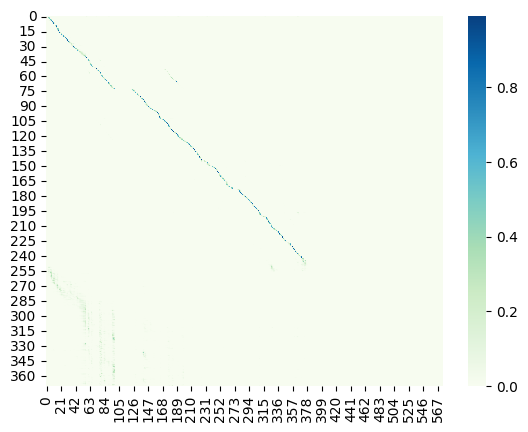

Saved best model

Epoch: 59/80


Val:   3%|▎         | 1/33 [00:02<01:34,  2.96s/it, dist=2.9267]

Ground Truth :  THEIR EXPRESSION WAS DIVINE AND AS THEY GLANCED AT ME TIMIDLY BUT WITH PARTED LIPS IN GREAT BEWILDERMENT I FORGOT ALL THOUGHTS OF THEIR CONVERSION IN FEELINGS THAT WERE FAR MORE EARTHLY
Prediction   :  THEIR EXPRESSION WAS DIVINE AND AS THEY GLANCED AT ME TIMIDLY BUT WITH PARTED LIPS AND GREAT BEWILDERMENT I FORGOT ALL THOUGHTS OF THEIR CONVERSION IN FEELINGS THAT WERE FAR MORE EARTHLY


Val:   6%|▌         | 2/33 [00:05<01:19,  2.57s/it, dist=2.9867]

Ground Truth :  HE CAN'T SUCKLE EM CAN HE
Prediction   :  HE CAN'T SUCKLE EM CANNY


Val:   9%|▉         | 3/33 [00:07<01:12,  2.43s/it, dist=3.0356]

Ground Truth :  I WANT TO BE DOING SOMETHING ON MY OWN ACCOUNT
Prediction   :  I WANT TO BE DOING SOMETHING ON MY OWN ACCOUNT


Val:  12%|█▏        | 4/33 [00:09<01:09,  2.39s/it, dist=3.0067]

Ground Truth :  WE CAN'T AFFORD NO NICE VITTLES NOW WHEN OUR MEN ARE SUFFERIN SO
Prediction   :  WE CAN'T A FORWARD NO NICE FIDDLES NOW WHEN OUR MEN ARE SUFFERING SO


Val:  15%|█▌        | 5/33 [00:12<01:06,  2.38s/it, dist=2.9413]

Ground Truth :  SHALL I POUR OUT MY SOUL INTO THE EAR OF A MIST A FUME FROM MY OWN BRAIN
Prediction   :  SHALL I POOR OUT MY SOUL INTO THE EAR OF A MIST A FUME FROM MY OWN BRAIN


Val:  18%|█▊        | 6/33 [00:14<01:05,  2.42s/it, dist=3.1567]

Ground Truth :  NO DOUBT MANY PREDICTIONS HAVE BEEN COLORED TO SUIT THE NEW AGE AND UNQUESTIONABLY FALSE PROPHETS FAKIRS AND CONJURERS HAVE BECOME THE PEST OF THE TRIBES DURING THE TRANSITION PERIOD
Prediction   :  NO DOUBT MANY PREDICTIONS HAVE BEEN COTHERED TO SUIT THE NEW AGE AND IN QUESTIONABLY FALSE PROPHETS FACERS AND CONGRESS AND BECAME THE PAST OF THE TRIBES DURING A TRANSITION PERIOD


Val:  21%|██        | 7/33 [00:16<01:01,  2.38s/it, dist=3.2533]

Ground Truth :  THE DISTINGUISHING MARK OF THE HENS WAS A CREST OF LAMENTABLY SCANTY GROWTH IN THESE LATTER DAYS BUT SO ODDLY AND WICKEDLY ANALOGOUS TO HEPZIBAH'S TURBAN THAT PHOEBE TO THE POIGNANT DISTRESS OF HER CONSCIENCE BUT INEVITABLY WAS LED TO FANCY A GENERAL RESEMBLANCE BETWIXT THESE FORLORN BIPEDS AND HER RESPECTABLE RELATIVE
Prediction   :  THE DISTINGUISHING MARK OF THE HENS WAS A CREST OF LAMENTABLY SCANTY GROWTH AND THESE LATTER DAYS BUT SO ODDLY AND WICKEDLY ANALOGOUS TO HEPSE OF HIS TURBAN THAT PHOEBE TO THE POINT IN DISTRESS OF HER CONSCIENCE BUT INEVITABLY WAS LED TO FANCY A GENERAL RESEMBLANCE BETWIXT THESE FORLORN BIPEDS AND HER RESPECTABLE RELATIVE


Val:  24%|██▍       | 8/33 [00:19<00:58,  2.33s/it, dist=3.2250]

Ground Truth :  YOU COULD GET HOME EASY TOO IT ISN'T VERY FAR
Prediction   :  YOU COULD GET HOME EASY TOO IT ISN'T VERY FAR


Val:  27%|██▋       | 9/33 [00:21<00:56,  2.35s/it, dist=3.3570]

Ground Truth :  THIS IS VERY GOOD OF YOU HE BEGAN GLANCING DOWN AT THE AGED DETECTIVE'S BUNDLED UP LEGS AND GENTLY PUSHING A CHAIR TOWARDS HIM
Prediction   :  THIS IS VERY GOOD OF YOU HE BEGAN GLANCING DOWN AT THE AGED DETECTIVE SPUNDLED UP LAKES AND GENTLY PUSHING A CHAIR TOWARDS HIM


Val:  30%|███       | 10/33 [00:24<00:55,  2.43s/it, dist=3.3867]

Ground Truth :  WE WERE RIGHT UPON THE YANKEE LINE ON THE WILKERSON TURNPIKE
Prediction   :  WE WERE RIGHT UPON THE YANKEY LINE ON THE WOOKERS AND TURN PIPE


Val:  33%|███▎      | 11/33 [00:26<00:52,  2.37s/it, dist=3.3491]

Ground Truth :  IT IS OBVIOUSLY UNNECESSARY FOR US TO POINT OUT HOW LUMINOUS THESE CRITICISMS ARE HOW DELICATE IN EXPRESSION
Prediction   :  IT IS OBVIOUSLY UNNECESSARY FOR US TO POINT OUT HOW LUMINOUS THESE CRITICISMS ARE HOW DELICATE IN EXPRESSION


Val:  36%|███▋      | 12/33 [00:28<00:50,  2.39s/it, dist=3.3106]

Ground Truth :  DIRECTION
Prediction   :  DIRECTION


Val:  39%|███▉      | 13/33 [00:31<00:48,  2.42s/it, dist=3.2959]

Ground Truth :  HE WAS GETTING SOME VAGUE COMFORT OUT OF A GOOD CIGAR BUT IT WAS NO PANACEA FOR THE ILL WHICH AFFECTED HIM
Prediction   :  HE WAS GETTING SOME BAG COMFORT OUT OF A GOOD SIGNA THAT IT WAS NO PANACEA FOR THE ILL WHICH AFFECTED HIM


Val:  42%|████▏     | 14/33 [00:33<00:44,  2.32s/it, dist=3.2800]

Ground Truth :  YOU HAVE NEVER DISOBEYED ME OBEY MY LAST COMMAND
Prediction   :  YOU HAVE NEVER DISOBEYED ME OBEY MY LAST COMMAND


Val:  45%|████▌     | 15/33 [00:35<00:41,  2.33s/it, dist=3.2573]

Ground Truth :  SOMETHING HAD TO BE DONE A CLIMAX WAS NEAR AND SHE WOULD NOT SIT IDLE
Prediction   :  SOMETHING HAD TO BE DONE A CLIMAX WAS NEAR AND SHE WOULD NOT SIT IDLE


Val:  48%|████▊     | 16/33 [00:38<00:39,  2.30s/it, dist=3.2083]

Ground Truth :  I GET NOTHING BUT MISERY OUT OF EITHER
Prediction   :  I GET NOTHING BUT MISERY OUT OF EITHER


Val:  52%|█████▏    | 17/33 [00:40<00:38,  2.38s/it, dist=3.2255]

Ground Truth :  THERE'S ONE AND THERE'S ANOTHER THE DUDLEY AND THE FLINT
Prediction   :  THERE'S ONE AND THERE'S ANOTHER THE DUDLEY AND THE FLINT


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.39s/it, dist=3.2426]

Ground Truth :  WE HAVE BOTH SEEN THE SAME NEWSPAPER OF COURSE AND YOU HAVE BEEN THE FIRST TO CLEAR THE THING UP THAT'S IT ISN'T IT
Prediction   :  WE HAVE BOTH SEEN THE SAME NEWSPAPER OF COURSE AND YOU HAVE BEEN THE FIRST TO CLEAR THE THING UP THAT'S IT HIS IN IT


Val:  58%|█████▊    | 19/33 [00:45<00:33,  2.42s/it, dist=3.2568]

Ground Truth :  THOSE HUGE CREATURES ATTACKED EACH OTHER WITH THE GREATEST ANIMOSITY
Prediction   :  THOSE HUGE CREATURES ATTACKED EACH OTHER WITH A GREATEST ANIMOSITY


Val:  61%|██████    | 20/33 [00:48<00:32,  2.46s/it, dist=3.2873]

Ground Truth :  AT THIS TURNING POINT OF HISTORY THERE MANIFEST THEMSELVES SIDE BY SIDE AND OFTEN MIXED AND ENTANGLED TOGETHER A MAGNIFICENT MANIFOLD VIRGIN FOREST LIKE UP GROWTH AND UP STRIVING A KIND OF TROPICAL TEMPO IN THE RIVALRY OF GROWTH AND AN EXTRAORDINARY DECAY AND SELF DESTRUCTION OWING TO THE SAVAGELY OPPOSING AND SEEMINGLY EXPLODING EGOISMS WHICH STRIVE WITH ONE ANOTHER FOR SUN AND LIGHT AND CAN NO LONGER ASSIGN ANY LIMIT RESTRAINT OR FORBEARANCE FOR THEMSELVES BY MEANS OF THE HITHERTO EXISTING MORALITY
Prediction   :  AT THIS TURNING TWITE OF HISTORY THEIR MANIFEST THEMSELVES SIDE BY SIDE AND OFTEN MIXED AND ENTANGLED TOGETHER A MAGNIFICENT MANIFOLD VERGING FOREST LIKE UP GROWTH AND UPSTRIVING A KIND OF TROPICAL TEMPO IN THE RIVALRY OF GROWTH AND AN EXTRAORDINARY DECAY HIMSELF DESTRUCTION OWING TO THE SAVAGELY OPPOSING AND SEEMINGLY EXPLODING EGOISMS WHICH STRIVE WITH ONE ANOTHER FOR SUN AND LIGHT AND CAN NO LONGER A SIGN AND ENLIMIT RESTRAINED OR FORBEARANCE FOR THEMSELV

Val:  64%|██████▎   | 21/33 [00:50<00:30,  2.51s/it, dist=3.3914]

Ground Truth :  ONE WINTER EVENING AS SOON AS HIS WORK WAS OVER FOR THE DAY JOSEPH LOCKED THE DOOR OF HIS SMITHY WASHED HIMSELF WELL PUT ON CLEAN CLOTHES AND TAKING HIS VIOLIN SET OUT FOR TESTBRIDGE MARY WAS EXPECTING HIM TO TEA
Prediction   :  WHEN WENT HER EVENING AS SOON AS HIS WORK WAS OVER FOR THE DAY JOSEPH LOCKED THE DOOR OF HIS SMITHY WASHED HIMSELF WELL PUT ON CLEAN CLOTHES AND TAKING HIS VIOLENT SET OUT FOR TEST BRIDGE MARY WAS EXPECTING HIM TO TEA


Val:  67%|██████▋   | 22/33 [00:53<00:27,  2.49s/it, dist=3.3861]

Ground Truth :  HELLO STEPHANOS HERE COMES THE DEDALUS
Prediction   :  HELLO STEPHANOS HERE COMES THE DEADLESS


Val:  70%|██████▉   | 23/33 [00:55<00:24,  2.50s/it, dist=3.3965]

Ground Truth :  I INQUIRED OF GEORGE WITH MY EYES STILL ON THIS FURTIVE WATCHER
Prediction   :  I INQUIRED OF GEORGE WITH MY EYES STILL ON THIS FURTIVE WATCHER


Val:  73%|███████▎  | 24/33 [00:58<00:22,  2.45s/it, dist=3.4689]

Ground Truth :  LOOK AT ME WELL IN SOOTH I'M BEATRICE
Prediction   :  LOOK AT ME WELL IN SOUTH I'M THE ATTRICE


Val:  76%|███████▌  | 25/33 [01:00<00:19,  2.44s/it, dist=3.4957]

Ground Truth :  WHENCE SHE TO ME IN THOSE DESIRES OF MINE WHICH LED THEE TO THE LOVING OF THAT GOOD BEYOND WHICH THERE IS NOTHING TO ASPIRE TO
Prediction   :  WHENCE SHE TO ME IN THOSE DESIRES OF MINE WHICH LED THEE TO THE LOVING OF THAT GOOD BEYOND WHICH THERE IS NOTHING TO ASPIRE TOO


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.42s/it, dist=3.4654]

Ground Truth :  WHEN HE MOUNTED HIS HORSE AT THE DOOR I SAW THAT HE HAD A HATCHET SLUNG TO HIS BELT AND HE GAVE GRANDMOTHER A MEANING LOOK WHICH TOLD ME HE WAS PLANNING A SURPRISE FOR ME
Prediction   :  WHEN HE MOUNTED HIS HORSE AT THE DOOR I SAW THAT HE HAD A HATCHET SUNG TO HIS BELT AND HE GAVE GRANDMOTHER A MEANING LOOK WHICH TOLD ME HE WAS PLANNING A SURPRISE FOR ME


Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.39s/it, dist=3.4462]

Ground Truth :  NONE MIGHT EXHORT OR CONFESS OR IN ANY WAY MEDDLE WITH THE RELIGIOUS EXPERIENCE OF ANOTHER
Prediction   :  NONE MIGHT EXHORT OR CONFESS OR IN ANY WAY METAL WITH THE RELIGIOUS EXPERIENCE OF ANOTHER


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.40s/it, dist=3.4962]

Ground Truth :  IF YOU THINK SO MADAM I SEE NOTHING THAT SHOULD PREVENT ME NOW
Prediction   :  IF YOU THINK SO MADAM I SEE NOTHING THAT SHOULD PREVENT ME NOW


Val:  88%|████████▊ | 29/33 [01:10<00:09,  2.42s/it, dist=3.4722]

Ground Truth :  SAYS HE I WOULD NOT TRUST A SECESH ON HIS WORD OATH OR BOND MARCH I SAY
Prediction   :  SAYS HE I WOULD NOT TRUST A SUSSESSION HIS WORD OATH OR BOND MARCH I SAY


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.37s/it, dist=3.4731]

Ground Truth :  LATER HOWEVER HIS OLD DISCRETION ASSERTED ITSELF
Prediction   :  LATER HOWEVER HIS OLD DISCRETION ASSERTED ITSELF


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.38s/it, dist=3.4583]

Ground Truth :  HE WAS IN REVERIE SLIDING ALONG THE BORDERS OF CONSCIOUSNESS
Prediction   :  HE WAS IN REVERY SLIDING ALONG THE BORDERS OF CONSCIOUSNESS


Val:  97%|█████████▋| 32/33 [01:17<00:02,  2.38s/it, dist=3.4490]

Ground Truth :  AND I WILL SEE THAT THERE IS NO SHIRKING ABOUT THE BOYS OR ABOUT THE GIRLS EITHER
Prediction   :  AND I WILL SEE THAT THERE IS NO SHIRKING ABOUT THE BOYS OR ABOUT THE GIRLS EITHER


Val: 100%|██████████| 33/33 [01:18<00:00,  1.98s/it, dist=3.4376]

Ground Truth :  OF COURSE IT AIN'T SAID MISSUS BOZZLE
Prediction   :  OF COURSE IT AIN'T SAID MISSUS BOZZLE


	Train Loss 0.0924	 Learning Rate 0.0002443
	Val Dist 3.4376	
	Teacher Forcing Ratio 1	


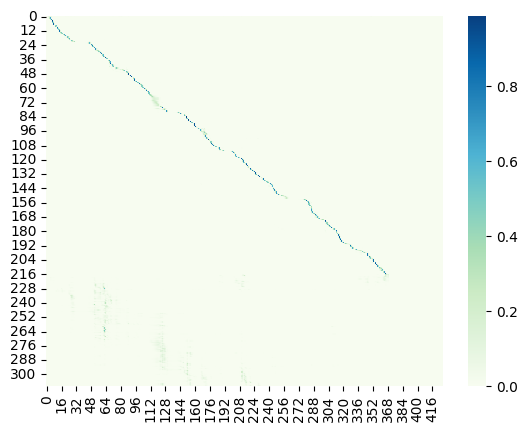

Saved best model

Epoch: 60/80


Val:   3%|▎         | 1/33 [00:03<01:38,  3.09s/it, dist=3.5267]

Ground Truth :  WE NEVER PLANNED TO MEET AND WHEN WE MET
Prediction   :  WE NEVER PLANNED TO MEET AND WHEN WE MET


Val:   6%|▌         | 2/33 [00:05<01:23,  2.70s/it, dist=3.0967]

Ground Truth :  HE CLASPED HIS HANDS ON THE DESK AND SAID
Prediction   :  HE CLASPED HIS HANDS ON THE DESK AND SAID


Val:   9%|▉         | 3/33 [00:08<01:19,  2.66s/it, dist=3.1689]

Ground Truth :  WE'VE GOT A HARD DRIVE BEFORE US AND EVERY MAN MUST BE FIT AS A FIDDLE
Prediction   :  WE'VE GOT A HARD DRIVE BEFORE SOME EVERY BAND THUS BEFORE IT IS A FIDDLE


Val:  12%|█▏        | 4/33 [00:10<01:13,  2.52s/it, dist=3.2900]

Ground Truth :  THE ROOM HAD NEITHER CARPET NOR FIREPLACE AND THE ONLY MOVABLES IN IT WERE A SOFA BED A TABLE AND AN ARM CHAIR ALL OF SUCH DELICATE AND GRACEFUL FORMS AS MAY BE SEEN ON ANCIENT VASES OF A FAR EARLIER PERIOD THAN THAT WHEREOF WE WRITE
Prediction   :  THE ROOM HAD NEITHER CARPET NOR FIREPLACE AND THE ONLY MOVABLES IN IT WERE A SOFA BED A TABLE AND AN ARMCHAIR ALL OF SUCH DELICATE AND GRACEFUL FORMS AS MAY BE SEEN ON ANCIENT VAUSES OF AFAR EARLIER PERIOD THAN THAT WHEREOF WE WRITE


Val:  15%|█▌        | 5/33 [00:12<01:08,  2.46s/it, dist=3.3107]

Ground Truth :  THE POETS OF SUCCEEDING AGES HAVE DWELT MUCH IN DETAIL ON THE OCCURRENCES OF THIS MEMORABLE DAY
Prediction   :  THE POETS OF SUCCEEDING AGES HAVE DWELT MUCH IN DETAIL ON THE OCCURRENCES OF THIS MEMORABLE DAY


Val:  18%|█▊        | 6/33 [00:15<01:04,  2.38s/it, dist=3.4144]

Ground Truth :  AS FOR ETCHINGS THEY ARE OF TWO KINDS BRITISH AND FOREIGN
Prediction   :  AS FOR ETCHINGS THEY ARE OF TWO KINDS BRITISH AND FOREIGN


Val:  21%|██        | 7/33 [00:17<01:01,  2.36s/it, dist=3.3619]

Ground Truth :  INQUIRED SHAGGY IN THE METAL FOREST
Prediction   :  INQUIRED SHAGGY IN THE METAL FOREST


Val:  24%|██▍       | 8/33 [00:19<00:59,  2.37s/it, dist=3.3992]

Ground Truth :  NOW BEAT AND STRAIN THE EGGS WORK THESE UP WITH THE OTHER INGREDIENTS AND THE FORCEMEAT WILL BE READY FOR USE
Prediction   :  NOW BEAT AND STRAIN THE EGGS WORK THESE UP WITH THE OTHER INGREDIENTS AND THE FORCEMEAT WILL BE READY FOR USE


Val:  27%|██▋       | 9/33 [00:21<00:55,  2.33s/it, dist=3.3615]

Ground Truth :  I WANT TO BE DOING SOMETHING ON MY OWN ACCOUNT
Prediction   :  I WANT TO BE DOING SOMETHING ON MY OWN ACCOUNT


Val:  30%|███       | 10/33 [00:24<00:53,  2.33s/it, dist=3.3447]

Ground Truth :  DURING HIS WATCH I SLEPT
Prediction   :  DEARING HIS WATCH I SLEPT


Val:  33%|███▎      | 11/33 [00:26<00:53,  2.43s/it, dist=3.3333]

Ground Truth :  GEOGRAPHERS HAVE DIVIDED IT INTO FOUR PARTS AND WE HAD TO CROSS THE SOUTHWEST QUARTER WHICH IN THE VERNACULAR IS CALLED SUDVESTR FJORDUNGR
Prediction   :  GEOGRAPHERS OF DIVIDED INTO FOUR PARTS AND WE HAD ACROSS THE SOUTH WEST QUARTER WHICH IN THE NACULAR IS CALLED SUIT VEST FURTINGER


Val:  36%|███▋      | 12/33 [00:29<00:51,  2.44s/it, dist=3.4156]

Ground Truth :  HE WAS LATE OF COURSE BUT WHEN HE DID APPEAR I ALMOST FORGOT OUR USUAL GREETING IN MY HURRY TO ASK HIM IF HE HAD SEEN THE EVENING PAPERS
Prediction   :  HE WAS LATE OF COURSE BUT WHEN HE DID APPEAR I ALMOST FORGOT OUR USUAL GREETING IN MY HURRY TO ASK HIM IF HE HAD SEEN THE EVENING PAPERS


Val:  39%|███▉      | 13/33 [00:31<00:48,  2.40s/it, dist=3.3738]

Ground Truth :  THE BOYS LOOK WIDE AWAKE ENOUGH BUT WHO CAN TELL I WOULD SOONER BELIEVE THAT
Prediction   :  THE BOYS LOOKED WIDE AWAKE ENOUGH BUT WHO CAN TELL I WOULD SOONER BELIEVE THAT


Val:  42%|████▏     | 14/33 [00:34<00:45,  2.37s/it, dist=3.3367]

Ground Truth :  WE'VE LOST THE KEY OF THE CELLAR AND THERE'S NOTHING OUT EXCEPT WATER AND I DON'T THINK YOU'D CARE FOR THAT
Prediction   :  WE'VE LOST THE KEY OF THE CELLAR AND THERE'S NOTHING OUT EXCEPT WATER AND I DON'T THINK YOU'D CARE FOR THAT


Val:  45%|████▌     | 15/33 [00:36<00:42,  2.34s/it, dist=3.3516]

Ground Truth :  NOR EVEN THUS OUR WAY CONTINUED FAR BEFORE THE LADY WHOLLY TURNED HERSELF UNTO ME SAYING BROTHER LOOK AND LISTEN
Prediction   :  NOR EVEN THUS ARE WAY CONTINUED FAR BEFORE THE LADY WHOLLY TURNED HERSELF UNTO ME SAYING BROTHER LOOK AND LISTEN


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.41s/it, dist=3.3579]

Ground Truth :  IT SEEMED AS IF HIS FAMILY TROUBLES WERE JUST BEGINNING
Prediction   :  IT SEEMED AS IF HIS FAMILY TROUBLES WERE JUST BEGINNING


Val:  52%|█████▏    | 17/33 [00:41<00:37,  2.37s/it, dist=3.3478]

Ground Truth :  THEN THE WIND TOOK ANOTHER FROLIC ROUND THE GARDEN AND MADE UP TO THE LARGE WHITE LILY INTO WHOSE REFINED EAR HE WHISPERED A DOUBT AS TO THE NECESSITY OR ADVANTAGE OF HER THICK POWERFUL STEM BEING PROPPED UP AGAINST A STUPID UGLY STICK
Prediction   :  THEN THE WIND TOOK ANOTHER FROLIC ROUND THE GARDEN AND MADE UP TO THE LARGE WHITE LILY INTO WHOSE REFINED YEAR HE WHISPERED A DOUBT IS TO THE NECESSITY OR ADVANTAGE OF HER THICK POWERFUL STEM BEING PROPPED UP AGAINST A STUPID UGLY STICK


Val:  55%|█████▍    | 18/33 [00:43<00:34,  2.33s/it, dist=3.3556]

Ground Truth :  SCARCELY HAD HE COME TO THE WOOD WHEN ALL THE TREES AND THORNS WHICH HAD MADE SUCH AN IMPENETRABLE THICKET OPENED ON ONE SIDE AND THE OTHER TO OFFER HIM A PATH
Prediction   :  SCARCELY HAD HE COME TO THE WOOD WHEN ALL THE TREES AND SORTS WHICH HAD MADE SUCH AN IMPENERABLE THICKET OPENED ON ONE SIDE IN THE OTHER TO OFFER IN THE PATH


Val:  58%|█████▊    | 19/33 [00:45<00:32,  2.31s/it, dist=3.3382]

Ground Truth :  AT THE SAME TIME EVERY AVENUE OF THE THRONE WAS ASSAULTED WITH GOLD
Prediction   :  AT THE SAME TIME EVERY AVENUE OF THE THRONE WAS ASSAULTED WITH GOLD


Val:  61%|██████    | 20/33 [00:48<00:30,  2.33s/it, dist=3.4197]

Ground Truth :  ABANDONED INDEED BY GOD AND MAN ALMOST
Prediction   :  ABANDONED INDEED BY GOD AND MAN ALMOST


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.35s/it, dist=3.4210]

Ground Truth :  GOD WHO READS OUR HEARTS KNOWS THAT WE HAD A NOBLE END IN VIEW
Prediction   :  GOD WHO READS OUR HEARTS KNOWS THAT WE HAD A NOBLE END IN VIEW


Val:  67%|██████▋   | 22/33 [00:52<00:25,  2.34s/it, dist=3.4155]

Ground Truth :  HE PASSED HOURS IN WATCHING HER DRESSING AND UNDRESSING HER DOLL AND IN LISTENING TO HER PRATTLE
Prediction   :  HE PASSED HOURS IN WATCHING HER DRESSING GET UNDRESSING HER DOLL AND IN LISTENING TO HER PRATTLE


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.36s/it, dist=3.4000]

Ground Truth :  THE STRENGTH THAT ENABLES SOMEONE IN A TRANCE TO HOLD HIS BODY STIFF AND UNSUPPORTED EXCEPT AT TWO POINTS THE HEAD AND HEELS
Prediction   :  THE STRENGTH HAD ENABLES SOMEONE IN A TRANST TO HOLD HIS BODY STIFF AND UNSUPPORTED EXCEPT AT TWO POINTS THE HEAD AND HEELS


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.37s/it, dist=3.4097]

Ground Truth :  YOU ARE KIND SHE SAID FOR THE THIRD TIME AND REACHED HER HAND OUT TO HIM HE DID NOT KISS IT THEN ONLY TOOK IT IN HIS AND FELT HOW SMALL AND COLD IT WAS THEN IT WAS TAKEN AWAY
Prediction   :  YOU ARE KIND SHE SAID FOR THE THIRD TIME IN REACHED HER HAND OUT TO HIM HE DID NOT KISS IT THAT ONLY TOOK IT IN HIS AND FELL HOW SLAW AND COLD IT WAS THEN IT WAS TAKEN AWAY


Val:  76%|███████▌  | 25/33 [00:59<00:18,  2.37s/it, dist=3.4043]

Ground Truth :  MISTER QUILTER HAS MISSED HIS CHANCE FOR HE HAS FAILED EVEN TO MAKE HIMSELF THE TUPPER OF PAINTING
Prediction   :  MISTER QUILTER HAS MISSED HIS CHANCE FOR HE HAS FAILED EVEN TO MAKE HIMSELF THE TUPPER OF PAINTING


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.37s/it, dist=3.3762]

Ground Truth :  OH NO THIS KIND OF A WRANGLER ISN'T LAUGHED THE FOREMAN
Prediction   :  OH NO THIS KIND OF A RANGER ISN'T LAUGHED THE FORMEN


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.34s/it, dist=3.3679]

Ground Truth :  GWYNPLAINE ATE UP THEIR PUBLIC
Prediction   :  WHEN PLAIN EIGHT UP THEIR PUBLIC


Val:  85%|████████▍ | 28/33 [01:06<00:11,  2.34s/it, dist=3.3774]

Ground Truth :  BUT ALTHOUGH BELIEVING FULLY IN MY ORACLES THEY WERE TOO KIND HEARTED TO THINK THEM THE WORK OF THE DEVIL AND IT SUITED THEIR NATURAL GOODNESS BETTER TO BELIEVE MY ANSWERS INSPIRED BY SOME HEAVENLY SPIRIT
Prediction   :  BUT ALTHOUGH BELIEVING FULLY IN MY ORACLES THEY WERE TOO KIND HEARTED TO THINK THEM THE WORK OF THE DOUBLE AND IT SUITED THEIR NATURAL GOODNESS BETTER TO BELIEVE MY ANSWERS INSPIRED BY SOME HEAVENLY SPIRIT


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.34s/it, dist=3.4336]

Ground Truth :  NOW EVERY MISSIONARY THAT EVER WENT OUT FROM IONA HAD TAUGHT THAT TO REDUCE CHRISTIANS TO SLAVERY WAS WHOLLY INCONSISTENT WITH A BELIEF IN THE DOCTRINES OF THE GOSPEL
Prediction   :  NOW EVERY MISSIONARY THAT EVER WENT OUT FROM IONA HAD TAUGHT THAT TO REDUCE CHRISTIANS TO SLAVERY WAS WHOLLY INCONSISTENT WITH A BELIEF IN THE DOCTRINES OF THE GOSPEL


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.35s/it, dist=3.4404]

Ground Truth :  KALIKO HESITATED
Prediction   :  KELICO HESITATED


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.38s/it, dist=3.4269]

Ground Truth :  WE'D BETTER NOT TRY TO MOVE HIM TOM DECIDED WE'LL GET AN AMBULANCE
Prediction   :  WE'D BETTER NOT TRY TO MOVE HIM TOM DECIDED WE'LL GET AN AMBULANCE


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.39s/it, dist=3.4208]

Ground Truth :  THIS OPENING LOOKED FOR ALL THE WORLD LIKE A MOUTH OF HELL IN THE WORDS OF THE ITINERANT PURITAN PREACHERS WHO TURNED AWAY FROM IT WITH HORROR
Prediction   :  THIS OPENING LOOKED FOR ALL THE WORLD LIKE A MOUTH OF HILL IN THE WORDS OF THE ICE TINNER AND PURITAN PREACHERS WHO TURNED AWAY FROM IT WITH HORROR


Val: 100%|██████████| 33/33 [01:17<00:00,  1.96s/it, dist=3.4035]

Ground Truth :  I THOUGHT IT HAD BEEN TORN FROM MY SHOULDER
Prediction   :  I THOUGHT IT HAD BEEN TORN FROM MY SHOULDER


	Train Loss 0.0904	 Learning Rate 0.0002253
	Val Dist 3.4035	
	Teacher Forcing Ratio 1	


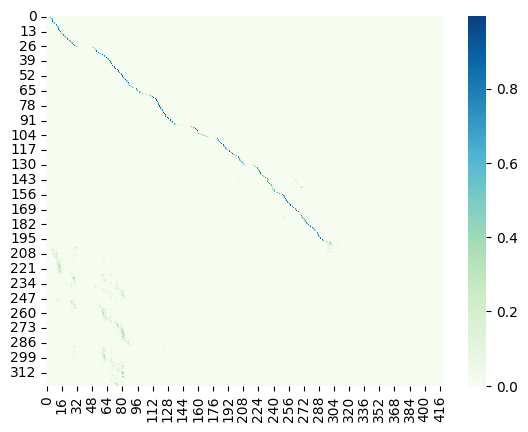

Saved best model

Epoch: 61/80


Val:   3%|▎         | 1/33 [00:03<01:37,  3.04s/it, dist=3.2133]

Ground Truth :  THE BEST OF US ARE NOT EXEMPT FROM EGOTISTICAL THOUGHTS
Prediction   :  THE BEST OF US ARE NOT EXEMPT FROM EGOTISTICAL THOUGHTS


Val:   6%|▌         | 2/33 [00:05<01:21,  2.63s/it, dist=3.0667]

Ground Truth :  IT TRULY IS ASSERTED THE MAGICIAN
Prediction   :  IT TRULY IS ASSERTED THE MAGICIAN


Val:   9%|▉         | 3/33 [00:07<01:12,  2.43s/it, dist=2.8956]

Ground Truth :  GALLOPING INTO CAMP THE BOY FETCHED HIS SOMBRERO WHICH HE CARRIED WELL OUT INTO THE FIELD AND TOSSED AWAY
Prediction   :  GALLOPING IT TO CAMP THE BOY FITCHED TO SOMEBOROUGH WHICH YOU CARRIED WELL OUT INTO THE FIELD AND TOSSED AWAY


Val:  12%|█▏        | 4/33 [00:09<01:08,  2.36s/it, dist=2.9817]

Ground Truth :  YOU SEE I'VE LIVED ALL MY LIFE WITH UNC NUNKIE THE SILENT ONE AND THERE WAS NO ONE TO TELL ME ANYTHING
Prediction   :  YOU SEE I'VE LIVED ALL MY LIFE WITHOUT NONEKEY THE SILENT ONE AND THERE WAS NO ONE TO TELL ME ANYTHING


Val:  15%|█▌        | 5/33 [00:12<01:06,  2.38s/it, dist=3.1560]

Ground Truth :  TO SAY UNTO VIRGILIUS NOT A DRACHM OF BLOOD REMAINS IN ME THAT DOES NOT TREMBLE I KNOW THE TRACES OF THE ANCIENT FLAME
Prediction   :  TO SAND TO VIRGILIUS NOT A DRAWHOME OF BLOOD REMAINS IN ME THAT DOES NOT TREMBLE I KNOW THE TRACES OF THE ANCIENT FLAME


Val:  18%|█▊        | 6/33 [00:14<01:03,  2.36s/it, dist=3.0544]

Ground Truth :  HE WAS NOT AS UNMOVED AS HE SEEMED BY THE GENERAL EXCITEMENT AND HAD FELT SUNDRY MANLY IMPULSES TO UP AND AT EM WHEN HIS COMRADES IN THE SHOP DISCUSSED THE CRISIS WITH IREFUL BRANDISHING OF AWLS AND VENGEFUL POUNDING OF SOLE LEATHER AS IF THE REBELS WERE UNDER THE HAMMER
Prediction   :  HE WAS NOT AS A MOVED AS HE SEEMED BY THE GENERAL EXCITEMENT AND HAD FELT SUNDRY MANLY AND PULSES TO UP AND ADAM WHEN HIS COMMANDS IN THE SHOP DISCUSSED THE CRISIS WITH IROFUL BRANDISHING OF ALLS AND VENGEFUL POUNDING OF SOLE LEATHER AS IF THE RUBBLES WERE UNDER THE HAMMER


Val:  21%|██        | 7/33 [00:16<00:59,  2.27s/it, dist=3.1600]

Ground Truth :  IF THE ORIGINAL IS STILL IN THE WORLD I THINK HE MIGHT DEFY THE SUN TO MAKE HIM LOOK STERN AND HARD
Prediction   :  IF THE ORIGINAL IS STILL IN THE WORLD I THINK HE MIGHT DEFY THE SUN TO MAKE HIM LOOK STERN AND HARD


Val:  24%|██▍       | 8/33 [00:19<00:57,  2.32s/it, dist=3.2067]

Ground Truth :  HE SOON FORESAW THAT STILL GREATER ECONOMY WOULD BE NECESSARY FOR COMMERCIAL SUCCESS NOT ALONE FOR THE LARGER TERRITORY OPENING BUT FOR THE COMPACT DISTRICTS OF LARGE CITIES
Prediction   :  HE SOON FORESAW THAT STILL GREATER ECONOMY WOULD BE NECESSARY FOR COMMERCIAL SUCCESS NOT ALONE FOR THE LARGER TERRITORY OPENING BUT FOR THE COMPACT DISTRICT OF LARGE CITIES


Val:  27%|██▋       | 9/33 [00:21<00:57,  2.38s/it, dist=3.1681]

Ground Truth :  AFTER HER DANCE SHE WITHDREW FROM THE DIALOGUE AND RETREATED TO THE DITCH WALL BACK OF PHILLY'S BURROW WHERE SHE SAT SINGING THE RISING OF THE MOON AND MAKING A WREATH OF PRIMROSES FOR HER DONKEY
Prediction   :  AFTER HER DANCE SHE WITHDREW FROM THE DIALOGUE AND RETREATED TO THE DITCH WALL BACK OF PHILLY'S BURROW WHERE SHE SAT SINGING THE RISING OF THE MOON AND MAKING A REASON OF PRIMOSES FOR HER DONKEY


Val:  30%|███       | 10/33 [00:23<00:54,  2.38s/it, dist=3.1540]

Ground Truth :  BUT YOU SEE A BODY NEVER KNOWS WHAT TRAITS POVERTY MIGHT BRING OUT IN EM
Prediction   :  BUT YOU SEE A BODY NEVER KNOWS WHAT TRAITS POVERTY MIGHT BRING OUT IN HIM


Val:  33%|███▎      | 11/33 [00:26<00:52,  2.36s/it, dist=3.1212]

Ground Truth :  FOR A MOMENT GILCHRIST WITH UPRAISED HAND TRIED TO CONTROL HIS WRITHING FEATURES
Prediction   :  FOR A MOMENT GILCHRIST WITH UPRAISED HAND TRIED TO CONTROL HIS WRITHING FEATURES


Val:  36%|███▋      | 12/33 [00:28<00:48,  2.31s/it, dist=3.1311]

Ground Truth :  YOU HAVE BEEN TO THE HOTEL HE BURST OUT YOU HAVE SEEN CATHERINE
Prediction   :  YOU HAVE BEEN TO THE HOTEL HE BURST OUT YOU HAVE SEEN CATHERINE


Val:  39%|███▉      | 13/33 [00:30<00:46,  2.35s/it, dist=3.2062]

Ground Truth :  OCCASIONALLY INDEED WHEN SUCH A CONSUMMATION SEEMED INEVITABLE A WATCHFUL OLD GRANDAM WITH HER CLOSE CAP DISTAFF AND SPINDLE RUSHED LIKE A SIBYL IN FRENZY OUT OF ONE OF THESE MISERABLE CELLS DASHED INTO THE MIDDLE OF THE PATH AND SNATCHING UP HER OWN CHARGE FROM AMONG THE SUNBURNT LOITERERS SALUTED HIM WITH A SOUND CUFF AND TRANSPORTED HIM BACK TO HIS DUNGEON THE LITTLE WHITE HEADED VARLET SCREAMING ALL THE WHILE FROM THE VERY TOP OF HIS LUNGS A SHRILLY TREBLE TO THE GROWLING REMONSTRANCES OF THE ENRAGED MATRON
Prediction   :  OCCASIONALLY INDEED WHEN SUCH A CONSUMMATION SEEMED AN AVIDABLE A WATCHFUL GRANDAM WITH HER CLOSE CAPTIVE AND SPINDLE RUSH LIKE A SIBYL IN FRIENDS A OUT OF ONE OF THESE MISERABLESELLS DASHED INTO THE MIDDLE OF THE PATH AND SNATCHING UP HER OWN CHARGE FROM AMONG THE SUN BURNT LOITERERS SALUTED HIM WITH THE SOUND CUFF AND TRANSPORTED HIM BACK TO HIS DONE JAN THE LITTLE WHITE HEADED VARLETS SCREAMING ALL THE WHILE FROM THE VERY TOP OF HIS LONGS A SHR

Val:  42%|████▏     | 14/33 [00:33<00:44,  2.35s/it, dist=3.1871]

Ground Truth :  SHE MERELY BRUSHED HIS CHEEK WITH HER LIPS AND PUT A HAND LIGHTLY AND JOYOUSLY ON EITHER SHOULDER
Prediction   :  SHE MERELY BRUSHED HIS CHEEK WITH HER LIPS AND PUT A HAND LIGHTLY AND JOYOUSLY ON EITHER SHOULDER


Val:  45%|████▌     | 15/33 [00:35<00:42,  2.37s/it, dist=3.2271]

Ground Truth :  HE DOESN'T WORK AT ALL
Prediction   :  HE DOESN'T WORK IT ALL


Val:  48%|████▊     | 16/33 [00:37<00:39,  2.34s/it, dist=3.2388]

Ground Truth :  PEOPLE WERE COOLER HERE AND THEY WERE MORE PRONE TO LOOK AT THE TWO SIDES OF A QUESTION
Prediction   :  PEOPLE WERE COOLER HERE AND THEY WERE MORE PROWNED TO LOOK AT THE TWO SIDES OF A QUESTION


Val:  52%|█████▏    | 17/33 [00:40<00:36,  2.30s/it, dist=3.3620]

Ground Truth :  THE WORLD WAS WATER VEILED IN MISTS
Prediction   :  THE WORLD WAS WATER VEILED IN MISTS


Val:  55%|█████▍    | 18/33 [00:42<00:35,  2.34s/it, dist=3.3711]

Ground Truth :  THERE'S ONE AND THERE'S ANOTHER THE DUDLEY AND THE FLINT
Prediction   :  THERE'S ONE AND THERE'S ANOTHER THE DUDLEY AND THE FLINT


Val:  58%|█████▊    | 19/33 [00:44<00:32,  2.34s/it, dist=3.3344]

Ground Truth :  IT WAS THAT IDEA OF WASTE THAT DOMINATED MY MIND IN A STRANGE INTERVIEW I HAD WITH JUSTIN
Prediction   :  IT WAS THAT IDEA OF WASTE THAT DOMINATED MY MIND IN A STRANGE INTERVIEW I HAD WITH JUSTIN


Val:  61%|██████    | 20/33 [00:47<00:30,  2.37s/it, dist=3.3447]

Ground Truth :  I'LL TEACH MY PRISONERS TO ATTEMPT SUICIDE
Prediction   :  I'LL TEACH MY PRISONERS TO ATTEMPT TO ASIDE


Val:  64%|██████▎   | 21/33 [00:49<00:28,  2.42s/it, dist=3.3422]

Ground Truth :  THE PLACE SEEMED FRAGRANT WITH ALL THE RICHES OF GREEK THOUGHT AND SONG SINCE THE DAYS WHEN PTOLEMY PHILADELPHUS WALKED THERE WITH EUCLID AND THEOCRITUS CALLIMACHUS AND LYCOPHRON
Prediction   :  THE PLACE SEEMED FRAGRANT WITH ALL THE RICHES OF GREEK THOUGHT AND SONG SINCE THE DAYS WHEN TOLEMY PHILADELPHUS WALKED THERE WITH EUCLID AND THEOCRATICE CALIMACHUS AND LIKE A FRANC


Val:  67%|██████▋   | 22/33 [00:52<00:26,  2.38s/it, dist=3.3100]

Ground Truth :  BUT HE LOOKED BACK AT CHARLESTON THE GAY THE VOLATILE AND THE BEAUTIFUL WITH REAL AFFECTION
Prediction   :  BUT HE LOOKED BACK AT CHARLESTON THE GAY THE VALLES ON THE BEAUTIFUL WAS REAL AFFECTION


Val:  70%|██████▉   | 23/33 [00:54<00:24,  2.41s/it, dist=3.3223]

Ground Truth :  ASKED MORREL YES
Prediction   :  AS MARILLE YES


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.39s/it, dist=3.3414]

Ground Truth :  AFTER HER DANCE SHE WITHDREW FROM THE DIALOGUE AND RETREATED TO THE DITCH WALL BACK OF PHILLY'S BURROW WHERE SHE SAT SINGING THE RISING OF THE MOON AND MAKING A WREATH OF PRIMROSES FOR HER DONKEY
Prediction   :  AFTER HER DANCE SHE WITHDREW FROM THE DIALOGUE AND RETREATED TO THE DITCH WALL BACK OF PHILLY'S BURROW WHERE SHE SAT SINGING THE RISING OF THE MOON AND MAKING A REASON OF PRIMOSES FOR HER DONKEY


Val:  76%|███████▌  | 25/33 [00:59<00:19,  2.42s/it, dist=3.3597]

Ground Truth :  LATER HOWEVER HIS OLD DISCRETION ASSERTED ITSELF
Prediction   :  LATER HOWEVER HIS OLD DISCRETION ASSERTED ITSELF


Val:  79%|███████▉  | 26/33 [01:01<00:16,  2.41s/it, dist=3.3587]

Ground Truth :  SEE BENEATH YOUR FEET IS THE MARKING OF GREAT TREE TRUNKS LYING ASLANT ACROSS THE FLOOR AND THE FORMS OF GIGANTIC PALM LEAVES STREWED AMONG THEM
Prediction   :  SEE BENEATH YOUR FEET IS THE MARKING OF GREAT TREE TRUNKS LYING ASLANT ACROSS THE FLOOR AND THE FORMS OF GIGANTIC PALM LEAVES STREWED AMONG THEM


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.46s/it, dist=3.3686]

Ground Truth :  WHO KNOWS WHETHER JEAN VALJEAN HAD NOT BEEN ON THE EVE OF GROWING DISCOURAGED AND OF FALLING ONCE MORE
Prediction   :  WHO KNOWS WHETHER JEAN VALJEAN HAD NOT BEEN ON THE EVE OF GROWING DISCOURAGED AND OF FALLING ONCE MORE


Val:  85%|████████▍ | 28/33 [01:06<00:11,  2.40s/it, dist=3.3455]

Ground Truth :  HE GREW RESTLESS AS HE RUMINATED AND THEN DECIDED THAT PERHAPS IT WAS NOTHING
Prediction   :  HE GREW RESTLESS AS HE RUMINATED AND THEN DECIDED THAT PERHAPS IT WAS NOTHING


Val:  88%|████████▊ | 29/33 [01:08<00:09,  2.36s/it, dist=3.3411]

Ground Truth :  HE KNEW THE SILVER FLEECE HIS AND ZORA'S MUST BE RUINED
Prediction   :  HE KNEW THE SILVER FLEECE HIS AND ZORA'S MUST BE RUINED


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.35s/it, dist=3.3387]

Ground Truth :  THE DISDAINFUL POUT OF COMRADE OSSIPON'S THICK LIPS ACCENTUATED THE NEGRO TYPE OF HIS FACE
Prediction   :  THE THIS DAINTFUL POUNT OF COMMON OCCAPANT'S THICK LIPS EXENTUATED THE NEGRO TYPE OF HIS FACE


Val:  94%|█████████▍| 31/33 [01:13<00:04,  2.38s/it, dist=3.3191]

Ground Truth :  IROLG LOOKED AMAZED AT THE SUDDEN FURY OF THE ATTACK THEN SMILED
Prediction   :  IROLLED LOOKED AMAZED AT THE SUDDEN FURY OF THE ATTACK THEN SMILED


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.38s/it, dist=3.2954]

Ground Truth :  WE LAY STILL AND DID NOT TALK
Prediction   :  WE LAY STILL AND DID NOT TALK


Val: 100%|██████████| 33/33 [01:17<00:00,  1.98s/it, dist=3.2675]

Ground Truth :  THE BIG MEADOWS LIE NEAR THE FOOT OF LASSEN'S BUTTE A BEAUTIFUL SPACIOUS BASIN SET IN THE HEART OF THE RICHLY FORESTED MOUNTAINS SCARCELY SURPASSED IN THE GRANDEUR OF ITS SURROUNDINGS BY TAHOE
Prediction   :  THE BIG MEADOWS LIE NEAR THE FOOT OF LASTEN'S BUTTE A BEAUTIFUL SPACIOUS BASIN SENT IN THE HEART OF THE RICHLY FORESTED MOUNTAINS SCARCELY SURPASSED IN THE GRANDEUR OF ITS SURROUNDINGS BY TOW


	Train Loss 0.0882	 Learning Rate 0.0002069
	Val Dist 3.2675	
	Teacher Forcing Ratio 1	


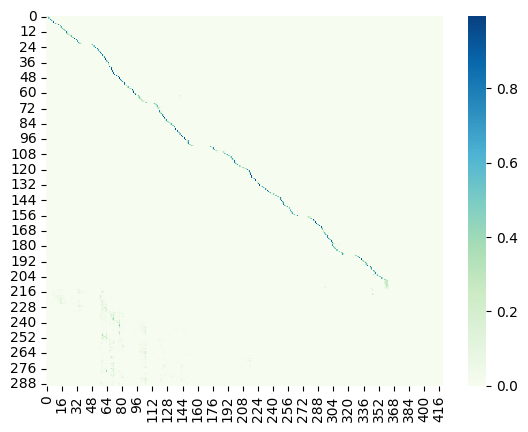

Saved best model

Epoch: 62/80


Val:   3%|▎         | 1/33 [00:02<01:33,  2.92s/it, dist=2.8533]

Ground Truth :  IF HE ONLY HAD THAT LETTER BACK HE WOULDN'T SEND IT
Prediction   :  IF HE ONLY HAD THAT LETTER BACK HE WOULDN'T SEND IT


Val:   6%|▌         | 2/33 [00:05<01:20,  2.59s/it, dist=3.2233]

Ground Truth :  BUT NEITHER THE GLORIFIED WOODS ON THE ONE HAND NOR THE LAKE ON THE OTHER COULD AT FIRST HOLD THE EYE
Prediction   :  BUT NEITHER THE GLORIFIED WOODS ON THE ONE HAND NOR THE LAKE ON THE OTHER COULD AT FIRST HOLD THE EYE


Val:   9%|▉         | 3/33 [00:07<01:11,  2.39s/it, dist=3.0400]

Ground Truth :  BOZZLE AWAY FROM HIS OWN HOME OUT ON BUSINESS WITH HIS COAT BUTTONED OVER HIS BREAST AND HIS BEST HAT IN HIS HAND WAS AWARE THAT HE COMMANDED RESPECT AND HE COULD CARRY HIMSELF ACCORDINGLY
Prediction   :  BOZZLE AWAY FROM HIS OWN HOME OUT ON BUSINESS WITH HIS COAT BUTTONED OVER HIS BREAST AND HIS BEST HAT IN HIS HAND WAS AWARE THAT HE COMMANDED RESPECT AND HE COULD CARRY HIMSELF ACCORDINGLY


Val:  12%|█▏        | 4/33 [00:09<01:08,  2.35s/it, dist=2.9467]

Ground Truth :  PUT THE PULP INTO A BASIN WITH TWO OUNCES OF MELTED BUTTER TWO TABLESPOONFULS OF LEMON JUICE HALF A POUND OF CHESTNUTS BOILED AND GRATED AND SEASONING OF SALT AND WHITE PEPPER TO TASTE
Prediction   :  PUT THE PALP INTO A BASIN WITH TWO WOUNDSES OF MELTED BUTTER TWO TABLESPOONFULS OF LEMON JEWS HALF A POUND OF JUST NUTS BOILED AND GREATED AND SEASONING OF SALT AND WHITE PEPPER TO TASTE


Val:  15%|█▌        | 5/33 [00:12<01:05,  2.34s/it, dist=3.0867]

Ground Truth :  HOW INIQUITOUS WAS THE CONDUCT OF THE SONS OF THEODOSIUS IN REFUSING THE USUAL BOUNTY BY WHICH THE GOTHS WERE BRIBED NOT TO ATTACK THE EMPIRE THE WHOLE PENT UP DELUGE BURST OVER THE PLAINS OF ITALY AND THE WESTERN EMPIRE BECAME FROM THAT DAY FORTH A DYING IDIOT WHILE THE NEW INVADERS DIVIDED EUROPE AMONG THEMSELVES
Prediction   :  HOW INIQUITOUS WAS THE CONDUCT OF THE SUNS OF THEODOSIUS IN REFUSING THE USUAL BOUNTY BY WHICH THE GOTHS WERE BRIBED NOT TO ATTACK THE EMPIRE THE WHOLE PENT UP DE LUGE BURST OVER THE PLAINS OF ITALY AND THE WESTERN EMPIRE BECAME FROM THAT DAY FORTH A DYING IDIOT WHILE THE NEW INVADERS DIVIDED EUROPE AMONG THEMSELVES


Val:  18%|█▊        | 6/33 [00:14<01:03,  2.33s/it, dist=3.0067]

Ground Truth :  THE CUT ON HIS CHEST STILL DRIPPING BLOOD THE ACHE OF HIS OVERSTRAINED EYES EVEN THE SOARING ARENA AROUND HIM WITH THE THOUSANDS OF SPECTATORS WERE TRIVIALITIES NOT WORTH THINKING ABOUT
Prediction   :  THE CUT ON HIS CHEST STILL DRIPPING BLOOD THE ACHE OF HIS OVERSTRAINED EYES EVEN THE SOARING ARENA AROUND HIM WITH THE THOUSANDS OF SPECTATORS WERE TRIVIALITIES NOT WORTH THINKING ABOUT


Val:  21%|██        | 7/33 [00:16<01:01,  2.36s/it, dist=3.0333]

Ground Truth :  NEVER FEAR YOU SHALL SEE HIM AGAIN TO MORROW
Prediction   :  NEVER FEAR YOU SHALL SEE HIM AGAIN TO MORROW


Val:  24%|██▍       | 8/33 [00:19<00:59,  2.37s/it, dist=2.9883]

Ground Truth :  ORESTES COMPLAINED BUT HIS JUST COMPLAINTS WERE TOO QUICKLY FORGOTTEN BY THE MINISTERS OF THEODOSIUS AND TOO DEEPLY REMEMBERED BY A PRIEST WHO AFFECTED TO PARDON AND CONTINUED TO HATE THE PRAEFECT OF EGYPT
Prediction   :  ARRESTY'S COMPLAINED BUT HIS JUST COMPLAINTS WERE TOO QUICKLY FORGOTTEN BY THE MINISTERS OF THEODOSIUS AND TWO DEEPLY REMEMBERED BY A PRIEST WHO AFFECTED TO PARDON AND CONTINUED TO HATE THE PREFECT OF EGYPT


Val:  27%|██▋       | 9/33 [00:21<00:57,  2.38s/it, dist=3.1963]

Ground Truth :  STACY BROWN PROVED THE ONLY GRUMBLER IN THE LOT DECLARING THAT HE COULD NOT SLEEP A WINK ON SUCH A BED AS THAT
Prediction   :  SACY BROWN PROVED THE ONLY GRUMBLER IN THE LOT CLEARING THAT HE COULD NOT SLEEP A WEEK ON SUCH A BED IS THAT


Val:  30%|███       | 10/33 [00:23<00:52,  2.30s/it, dist=3.0807]

Ground Truth :  THEN HE SAT DOWN IN HIS CHAIR AND GAZED WITHOUT SEEING CONTEMPLATING THE RESULT OF HIS WORK
Prediction   :  THEN HE SAT DOWN IN HIS CHAIR AND GAZED WITHOUT SEEING CONTEMPLATING THE RESULT OF HIS WORK


Val:  33%|███▎      | 11/33 [00:26<00:51,  2.32s/it, dist=3.0630]

Ground Truth :  THEN THE SHINING OF THE WET LEAVES IS DELIGHTFUL AND THE STEAMY FRAGRANCE AND THE BURST OF BIRD SONG FROM A MULTITUDE OF THRUSHES AND FINCHES AND WARBLERS THAT HAVE NESTS IN THE CHAPARRAL
Prediction   :  THEN THE SHINING OF THE WET LEAVES IS DELIGHTFUL AND THE STEAMY FRAGRANCE AND THE BURST OF BIRD SONG FROM A MULTITUDE OF THRUSHES AND FINCHES AND WARBLERS THAT HAVE NESTS IN THE CHAPARRAL


Val:  36%|███▋      | 12/33 [00:28<00:48,  2.33s/it, dist=3.0383]

Ground Truth :  SOLID ROCKS OF SALT ARE ALSO FOUND IN VARIOUS PARTS OF THE WORLD AND THE COUNTY OF CHESTER CONTAINS MANY OF THESE MINES AND IT IS FROM THERE THAT MUCH OF OUR SALT COMES
Prediction   :  SOLID ROCKS OF SALT ARE ALSO FOUND IN VARIOUS PARTS OF THE WORLD AND IN THE COUNTRY OF CHESTER CONTAINS MANY OF THESE MINDS AND IT IS FROM THERE THAT MUCH OF OUR SALT COMES


Val:  39%|███▉      | 13/33 [00:30<00:48,  2.40s/it, dist=3.0979]

Ground Truth :  ILLUSTRATION PESTLE AND MORTAR
Prediction   :  ILLUSTRATION PESTLE AND MORNER


Val:  42%|████▏     | 14/33 [00:33<00:46,  2.47s/it, dist=3.2548]

Ground Truth :  LET'S SEE ABOUT GETTING HELP FOR MISTER FABER
Prediction   :  LET'S SEE ABOUT GETTING HELP FOR MISTER FAVOUR


Val:  45%|████▌     | 15/33 [00:35<00:43,  2.40s/it, dist=3.2573]

Ground Truth :  WHAT LED ME INTO IT WAS A CERTAIN THIRST FOR VENGEANCE WHICH IS STRONG ENOUGH TO DISTURB THE QUIETEST HEARTS
Prediction   :  WHAT LED ME INTO IT WAS A CERTAIN THIRST FOR VENGEANCE WHICH IS STRONG ENOUGH TO DISTURB THE QUIETEST HEARTS


Val:  48%|████▊     | 16/33 [00:38<00:41,  2.42s/it, dist=3.2929]

Ground Truth :  THAT DIVINE WORD WHO IS THE LIGHT WHO LIGHTETH EVERY MAN WHICH COMETH INTO THE WORLD HAD AWAKENED IN THE HEART OF MANKIND A MORAL CRAVING NEVER BEFORE FELT IN ANY STRENGTH EXCEPT BY A FEW ISOLATED PHILOSOPHERS OR PROPHETS
Prediction   :  THAT DIVINE WORD WHO IS THE LIGHT WHO LIGHTETH EVERY MAN WHICH COMETH INTO THE WORLD HOW DEWAKENED IN THE HEART OF MANKIND A MORAL CRAVING NEVER BEFORE FELT IN ANY STRENGTH EXCEPT BY A FEW ISOLATED PHILOSOPHERS OR PROPHETS


Val:  52%|█████▏    | 17/33 [00:40<00:39,  2.44s/it, dist=3.2447]

Ground Truth :  BUT YOU BELIEVE IN SOME EDUCATION ASKED MARY TAYLOR
Prediction   :  DO YOU BELIEVE IN SOME EDUCATION ASKED MARY TAYLOR


Val:  55%|█████▍    | 18/33 [00:42<00:35,  2.36s/it, dist=3.2226]

Ground Truth :  I'M GLAD SHE'S HELD HER OWN SINCE
Prediction   :  I'M GLAD SHE'S HELD HER OWN SINCE


Val:  58%|█████▊    | 19/33 [00:45<00:33,  2.41s/it, dist=3.2649]

Ground Truth :  BUT HE SAW NOTHING THAT MOVED THERE NO SIGNAL LIGHTS TWINKLED
Prediction   :  BUT HE SAW NOTHING THE MOVED THERE NO SIGNAL LIGHTS TWINKLED


Val:  61%|██████    | 20/33 [00:47<00:31,  2.40s/it, dist=3.2473]

Ground Truth :  THIS AT ONCE COMPELS YOU TO UNDERSTAND THAT THE WORK IS TO BE IMAGINATIVE AND DECORATIVE THAT IT REPRESENTS BEAUTIFUL THINGS IN THE CLEAREST WAY BUT NOT UNDER EXISTING CONDITIONS AND THAT IN FACT YOU ARE PRODUCING JEWELER'S WORK RATHER THAN PICTURES
Prediction   :  THIS AT ONCE COMPELS YOU TO UNDERSTAND THAT THE WORK IS TO BE IMAGINATIVE INDECORATIVE THAT IT REPRESENTS BEAUTIFUL THINGS IN THE CLEAREST WAY BUT NOT UNDER EXISTING CONDITIONS AND THAT IN FACT YOU ARE PRODUCING JEWELLER'S WORK RATHER THAN PICTURES


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.38s/it, dist=3.2860]

Ground Truth :  PAINTING HE TELLS US IS OF A DIFFERENT QUALITY TO MATHEMATICS AND FINISH IN ART IS ADDING MORE FACT
Prediction   :  PAINTING HE TELLS US IS OF A DIFFERENT QUALITY TO MATHEMATICS AND FINISH IN ART IS ADDING MORE FACT


Val:  67%|██████▋   | 22/33 [00:52<00:26,  2.40s/it, dist=3.2597]

Ground Truth :  WE RANGE WIDER LAST LONGER AND ESCAPE MORE AND MORE FROM INTENSITY TOWARDS UNDERSTANDING
Prediction   :  WE RANGE WIDER LAST LONGER AND ESCAPE MORE AND MORE FROM INTENSITY TOWARDS UNDERSTANDING


Val:  70%|██████▉   | 23/33 [00:55<00:24,  2.44s/it, dist=3.2316]

Ground Truth :  EACH FEATURE WAS FINISHED EYELIDS EYELASHES AND EARS BEING ALMOST INVARIABLY PERFECT
Prediction   :  EACH FEATURE WAS FINISHED EYELIDS EYELASHES AND EARS BEING ALMOST INVARIABLY PERFECT


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.41s/it, dist=3.2208]

Ground Truth :  FROM THE SUN AS THE UNIVERSAL FATHER PROCEEDS THE QUICKENING PRINCIPLE IN NATURE AND IN THE PATIENT AND FRUITFUL WOMB OF OUR MOTHER THE EARTH ARE HIDDEN EMBRYOS OF PLANTS AND MEN
Prediction   :  FROM THE SON AS THE UNIVERSAL FATHER PERCEIVES THE QUICKENING PRINCE BALL IN NATURE IN INDIPATION AND FOODFUL WOME OF HER MOTHER THE EARTH ARE HIDDEN IMREALS OF PLANTS AND MEN


Val:  76%|███████▌  | 25/33 [01:00<00:19,  2.44s/it, dist=3.2461]

Ground Truth :  SHE WAS DESTROYED NOT MERELY BY THE UNCONSIDERED UNDISCIPLINED PASSIONS OF HER HUSBAND AND HER LOVER BUT BY THE VAST TRADITION THAT SUSTAINS AND ENFORCES THE SUBJUGATION OF HER SEX
Prediction   :  SHE WAS DESTROYED NOT MERELY BY THE UNCONSIDERED UNDISCIPLINED PASSIONS OF HER HUSBAND AND HER LOVER BUT BY THE VAST TRADITION THAT SUSTAINS AND ENFORCES THE SUBJUGATION OF HER SEX


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.35s/it, dist=3.2210]

Ground Truth :  A WANDERING TRIBE OF THE BLEMMYES OR NUBIANS INVADED HIS SOLITARY PRISON IN THEIR RETREAT THEY DISMISSED A CROWD OF USELESS CAPTIVES BUT NO SOONER HAD NESTORIUS REACHED THE BANKS OF THE NILE THAN HE WOULD GLADLY HAVE ESCAPED FROM A ROMAN AND ORTHODOX CITY TO THE MILDER SERVITUDE OF THE SAVAGES
Prediction   :  A WANDERING TRIBE OF THE BLAMISE OR NUBIANS INVADED HIS SOLITARY PRISON IN THEIR RETREAT THEY DISMISSED A CROWD OF USELESS CAPTIVES BUT NO SOONER HAD NESTORIOUS REACHED THE BANKS OF THE NILE AND HE WOULD GLADLY HAVE ESCAPED FROM A ROMAN AND ORTHODOX CITY TO THE MILDER SERVITUDE OF THE SAVAGES


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.35s/it, dist=3.1919]

Ground Truth :  WHY WAS THE SACRAMENT OF THE EUCHARIST INSTITUTED UNDER THE TWO SPECIES OF BREAD AND WINE IF JESUS CHRIST BE PRESENT BODY AND BLOOD SOUL AND DIVINITY IN THE BREAD ALONE AND IN THE WINE ALONE
Prediction   :  WHY WAS THE SACRAMENT OF THE EUCHARIST INSTITUTED UNDER THE TWO SPECIES OF BREAD AND WINE IF JESUS CHRIST BE PRESENT BODY AND BLOOD SOUL AND DIVINITY IN THE BREAD ALONE AND IN THE WINE ALONE


Val:  85%|████████▍ | 28/33 [01:06<00:11,  2.39s/it, dist=3.2105]

Ground Truth :  HE WAS THAT CHILD'S STAY AND SHE WAS HIS PROP
Prediction   :  HE WAS THAT CHILD STAY AND SHE WAS HIS PROP


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.40s/it, dist=3.2345]

Ground Truth :  IT WAS THE BEAUTY OF IT
Prediction   :  IT WAS THE BEAUTY OF IT


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.34s/it, dist=3.2280]

Ground Truth :  I DON'T KNOW WHAT I OUGHT TO SAY BUT I DON'T BELIEVE YOU'D BE HAPPY TRULY I DON'T AREN'T YOU TRYING TO FRIGHTEN ME
Prediction   :  I DON'T KNOW WHAT I OUGHT TO SAY BUT I DON'T BELIEVE YOU'D BE HAPPY TRULY I DON'T AREN'T YOU TRYING TO FRIGHTEN ME


Val:  94%|█████████▍| 31/33 [01:13<00:04,  2.34s/it, dist=3.2299]

Ground Truth :  TO MORROW IS THE EXAMINATION
Prediction   :  TO MORROW IS THE EXAMINATION


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.37s/it, dist=3.2321]

Ground Truth :  I CAN SEE THEM NOW EXACTLY AS THEY LOOKED WORKING ABOUT THE TABLE IN THE LAMPLIGHT JAKE WITH HIS HEAVY FEATURES SO RUDELY MOULDED THAT HIS FACE SEEMED SOMEHOW UNFINISHED OTTO WITH HIS HALF EAR AND THE SAVAGE SCAR THAT MADE HIS UPPER LIP CURL SO FEROCIOUSLY UNDER HIS TWISTED MUSTACHE
Prediction   :  I CAN SEE THEM NOW EXACTLY AS THEY LOOKED WORKING ABOUT THE TABLE IN THE LAMPLIGHT JAKE WITH HIS HEAVY FEATURES SO RUDELY MOULDED THAT HIS FACE SEEMED SOMEHOW UNFINISHED OTTO WITH HIS HALF EAR AND THE SAVAGE SCAR THAT MADE HIS UPPER LIP CURL SO FEROCIOUSLY UNDER HIS TWISTED MUSTACHE


Ground Truth :  SHASTA RAMBLES AND MODOC MEMORIES
Prediction   :  SHASTA RAMBLES AND MODOC MEMORIES
	Train Loss 0.0864	 Learning Rate 0.0001891


	Val Dist 3.2341	
	Teacher Forcing Ratio 1	


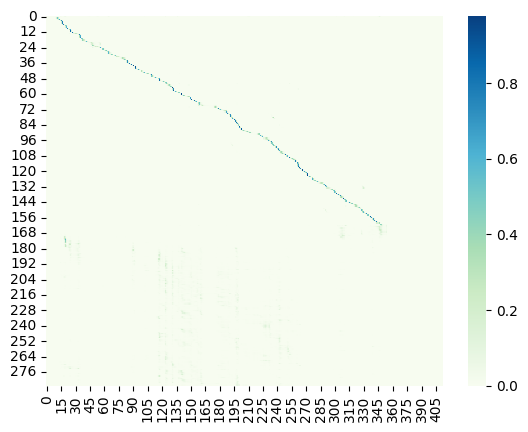

Saved best model

Epoch: 63/80


Val:   3%|▎         | 1/33 [00:03<01:37,  3.06s/it, dist=2.7133]

Ground Truth :  THEN WHEN YOUR MANAGER ADDED TWO MORE WEEKS I WAS ALREADY COMMITTED
Prediction   :  THEN WHEN YOUR MANAGER ADDED TWO MORE WEEKS I WAS ALREADY COMMITTED


Val:   6%|▌         | 2/33 [00:05<01:21,  2.64s/it, dist=3.2533]

Ground Truth :  LACRIMA CHRISTI A STILL WINE OF EXCELLENT FLAVOR AND BOUQUET
Prediction   :  LOOK REMARKED YOU STEE A STILL WINE OF EXCELLENT FLAVOUR IN BOCAE


Val:   9%|▉         | 3/33 [00:07<01:15,  2.51s/it, dist=3.1978]

Ground Truth :  LODGED IN THE BRANCHES OF A PINYON TREE I THINK IT IS BUT HE DOESN'T ANSWER ME
Prediction   :  LAUGHED IN THE BREDGES OF OPINION TREE I THINK IT IS BUT HE DOES OF ANSWER ME


Val:  12%|█▏        | 4/33 [00:10<01:10,  2.42s/it, dist=3.0267]

Ground Truth :  ALL THE SAME HE ADDED IRRELEVANTLY YOU SHALL HAVE THE LATCH KEY
Prediction   :  ALL THE SAME HE ADDED A RELIEF AT LAME YOU SHALL HAVE THE LATCHKY


Val:  15%|█▌        | 5/33 [00:12<01:06,  2.37s/it, dist=3.0653]

Ground Truth :  WHO KNOWS WHETHER JEAN VALJEAN HAD NOT BEEN ON THE EVE OF GROWING DISCOURAGED AND OF FALLING ONCE MORE
Prediction   :  WHO KNOWS WHETHER JEAN VALJEAN HAD NOT BEEN ON THE EVE OF GROWING DISCOURAGED AND OF FALLING ONCE MORE


Val:  18%|█▊        | 6/33 [00:14<01:04,  2.40s/it, dist=3.0656]

Ground Truth :  THE LITTLE GIRL HAD BEEN ASLEEP BUT SHE HEARD THE RAPS AND OPENED THE DOOR
Prediction   :  THE LITTLE GIRL HAD BEEN ASLEEP BUT SHE HEARD THE RAPS AND OPENED THE DOOR


Val:  21%|██        | 7/33 [00:17<01:02,  2.42s/it, dist=3.0133]

Ground Truth :  BRING IT TO THE PUBLIC ATTENTION DRAMATIZE IT
Prediction   :  BRING IT TO THE PUBLIC ATTENTION DRAMATIZE IT


Val:  24%|██▍       | 8/33 [00:19<00:59,  2.38s/it, dist=2.9500]

Ground Truth :  THEREFORE MY ANSWER IS WITH GREATER CARE THAT HE MAY HEAR ME WHO IS WEEPING YONDER SO THAT THE SIN AND DOLE BE OF ONE MEASURE
Prediction   :  THEREFORE MY ANSWER IS WITH GREATER CARE THAT HE MAY HEAR ME WHOSE WEEPING YONDER SO THAT THE SIN AND DOLL BE OF ONE MEASURE


Val:  27%|██▋       | 9/33 [00:22<00:58,  2.46s/it, dist=3.0844]

Ground Truth :  ON THE MAST ALREADY I SEE THE LIGHT PLAY OF A LAMBENT SAINT ELMO'S FIRE THE OUTSTRETCHED SAIL CATCHES NOT A BREATH OF WIND AND HANGS LIKE A SHEET OF LEAD
Prediction   :  ON THE MAST ALREADY I SEE THE LIGHT PLAY OF A LAMINENCE SAINT ELMO'S FIRE THE OUTSTRETCHED SAIL CATCHES NOT A BREATH OF WIND AND HANGS LIKE A SHEET OF LED


Val:  30%|███       | 10/33 [00:24<00:57,  2.48s/it, dist=3.0513]

Ground Truth :  ELECTRONIC EQUIPMENT CASCADED FROM THE WALL SHELVES AND A HEAVY DUTY CHAIN HOIST CAME LOOSE FROM ITS OVERHEAD TRACK PLUNGING TO THE FLOOR WITH A TERRIFYING CRASH
Prediction   :  ELECTRONIC EQUIPMENT CASCADED FROM THE WALL SHELVES AND A HEAVY DUTY CHAIN HOIST CAME LOOSE FROM ITS OVERHEAD TRACK PLUNGING TO THE FLOOR WITH A TERRIFYING CRASH


Val:  33%|███▎      | 11/33 [00:27<00:53,  2.45s/it, dist=3.0309]

Ground Truth :  I DID NOT KNOW WHAT HE MEANT
Prediction   :  I DID NOT KNOW WHAT HE MEANT


Val:  36%|███▋      | 12/33 [00:29<00:49,  2.36s/it, dist=3.0178]

Ground Truth :  WHEN IT WAS EVENING HE LED HIS BAND INTO A NEARBY STREET AND IN HIS DISGUISE APPROACHED THE MERCHANT'S HOUSE HE KNOCKED AT THE DOOR
Prediction   :  WHEN IT WAS EVENING HE LED HIS BAND INTO A NEAR BY STREET AND IN HIS DISGUISE APPROACHED THE MERCHANT'S HOUSE HE KNOCKED AT THE DOOR


Val:  39%|███▉      | 13/33 [00:31<00:47,  2.35s/it, dist=3.0697]

Ground Truth :  SHE SMILED A LITTLE SADLY AT TROT SEEMED TO APPROVE BUTTON BRIGHT'S OPEN FRANK FACE AND WAS QUITE SURPRISED BECAUSE CAP'N BILL WAS SO MUCH BIGGER THAN HER OWN PEOPLE
Prediction   :  SHE SMILED A LITTLE SADLY IT TROT SEEMED HER PROVE OF BUTTON BRIGHT OPEN FRANK FACE AND WAS QUITE SURPRISED BECAUSE CAPTAIN DOE WAS SO MUCH BIGGER THAN HER OWN PEOPLE


Val:  42%|████▏     | 14/33 [00:33<00:44,  2.32s/it, dist=3.1162]

Ground Truth :  I REMAINED AWAKE ALL NIGHT TALKING WITH A COMRADE WHO SHARED MY BLANKET WITH ME POOR JIMMY KING
Prediction   :  I REMAINED AWAKE ALL NIGHT TALKING WITH A COMMON WHO SHERED MY BLACK GIRL WITH A COMMON WHO SHERED MY BLACK GIRL WITH ME POOR JIMMY KING


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.40s/it, dist=3.0867]

Ground Truth :  THIS FORTUNE HAD ALLOWED URSUS WHO WAS THE ADMINISTRATOR OF GWYNPLAINE'S SUCCESS TO HAVE THE CHARIOT OF HIS DREAMS CONSTRUCTED THAT IS TO SAY A CARAVAN LARGE ENOUGH TO CARRY A THEATRE AND TO SOW SCIENCE AND ART IN THE HIGHWAYS
Prediction   :  THIS FORTUNE HAD ALLOWED URSUS WHO WAS THE ADMINISTRATIVE GWYNPLAINE SUCCESS TO HAVE THE CHARIOT OF HIS DREAMS CONSTRUCTED THAT IS TO SAY A CARAVAN LARGE ENOUGH TO CARRY AT THE AITOR AND TO SO SCIENCE AND ART IN THE HIGHWAYS


Val:  48%|████▊     | 16/33 [00:38<00:41,  2.43s/it, dist=3.1679]

Ground Truth :  IN A FEW HOURS THE EXAMINATION WOULD COMMENCE AND HE WAS STILL IN THE DILEMMA BETWEEN MAKING THE FACTS PUBLIC AND ALLOWING THE CULPRIT TO COMPETE FOR THE VALUABLE SCHOLARSHIP
Prediction   :  IN A FEW HOURS THE EXAMINATION WOULD COMMENCE AND HE WAS STILL IN THE DELEMON BETWEEN MAKING THE FACTS PUBLIC AND ALLOWING THE CULPRIT TO COMPETE FOR THE VALUABLE SCHOLARSHIP


Val:  52%|█████▏    | 17/33 [00:41<00:39,  2.44s/it, dist=3.1161]

Ground Truth :  HE WOULD HAVE TO PAY HER THE MONEY WHICH SHE WOULD NOW REGULARLY DEMAND OR THERE WOULD BE TROUBLE IT DID NOT MATTER WHAT HE DID
Prediction   :  HE WOULD HAVE TO PAY HER THE MONEY WHICH SHE WOULD NOW REGULARLY DEMAND OR THERE WOULD BE TROUBLE IT DID NOT MATTER WHAT HE DID


Val:  55%|█████▍    | 18/33 [00:43<00:36,  2.44s/it, dist=3.1126]

Ground Truth :  A BROKEN TIP OF LEAD WAS LYING THERE ALSO
Prediction   :  A BROKEN TIP OF LEAD WAS LYING THERE ALSO


Val:  58%|█████▊    | 19/33 [00:46<00:34,  2.43s/it, dist=3.0842]

Ground Truth :  THUS THE SHASTA RIVER ISSUES FROM A LARGE LAKE LIKE SPRING IN SHASTA VALLEY AND ABOUT TWO THIRDS OF THE VOLUME OF THE MC CLOUD GUSHES FORTH IN A GRAND SPRING ON THE EAST SIDE OF THE MOUNTAIN A FEW MILES BACK FROM ITS IMMEDIATE BASE
Prediction   :  THUS THE SHASTA RIVER ISSUES FROM A LARGE LAKE LIKE SPRING IN SHASTA VALLEY AND ABOUT TWO THIRDS OF THE VOLUME OF THE MC CLOUD GUSHES FORTH IN A GRAND SPRING ON THE EAST SIDE OF THE MOUNTAIN A FEW MILES BACK FROM ITS IMMEDIATE BASE


Val:  61%|██████    | 20/33 [00:48<00:31,  2.41s/it, dist=3.0993]

Ground Truth :  IN BOTH THESE HIGH MYTHICAL SUBJECTS THE SURROUNDING NATURE THOUGH SUFFERING IS STILL DIGNIFIED AND BEAUTIFUL
Prediction   :  IN BOTH THESE HIGH MYTHICAL SUBJECTS THE SURROUNDING NATURE THOUGH SUFFERING IS STILL DIGNIFIED AND BEAUTIFUL


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.36s/it, dist=3.1181]

Ground Truth :  THE SCOUT WHO HAD LEFT DAVID AT THE DOOR TO ASCERTAIN THEY WERE NOT OBSERVED THOUGHT IT PRUDENT TO PRESERVE HIS DISGUISE UNTIL ASSURED OF THEIR PRIVACY
Prediction   :  THE SCOUT WHO HAD LEFT DAVID AT THE DOOR TO ASCERTAIN THEY WERE NOT OBSERVED THOUGHT IT PRUDENT TO PRESERVE HIS DISGUISE UNTIL ASSURED OF THEIR PRIVACY


Val:  67%|██████▋   | 22/33 [00:53<00:25,  2.33s/it, dist=3.1300]

Ground Truth :  NATURE A DIFFERENCE OF FIFTY YEARS HAD SET A PROFOUND GULF BETWEEN JEAN VALJEAN AND COSETTE DESTINY FILLED IN THIS GULF
Prediction   :  NATURE A DIFFERENCE OF FIFTY YEARS HAD SET A PROFOUND GULF BETWEEN JEAN VALJEAN AND COSETTE DESTINY FILLED IN THIS GULF


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.34s/it, dist=3.1322]

Ground Truth :  THE OTHERS HAVING BEEN IN OPERATION TOO SHORT A TIME TO SHOW DEFINITE RESULTS ALTHOUGH THEY ALSO WENT QUICKLY TO A DIVIDEND BASIS
Prediction   :  THE OTHERS HAVING BEEN IN OPERATION TOO SHORT AT TIME TO SHOW DEFINITE RESULTS ALTHOUGH THEY ALSO WENT QUICKLY TO A DIVIDENT BASIS


Val:  73%|███████▎  | 24/33 [00:58<00:21,  2.43s/it, dist=3.1306]

Ground Truth :  WE CAN'T AFFORD NO NICE VITTLES NOW WHEN OUR MEN ARE SUFFERIN SO
Prediction   :  WE CAN'T HAVE THOUGHT NO NICE FIDDLES NOW WHEN OUR MEN ARE SUFFERING SO


Val:  76%|███████▌  | 25/33 [01:00<00:18,  2.37s/it, dist=3.1379]

Ground Truth :  BUT VIGOUR RETURNED TO HIM BEFORE HE HAD WELL REACHED THE DOOR AND HE SHOWED SOME OF HIS OLD SPIRIT AS HE THANKED MISS CLARKE AND TURNED TO TAKE THE ELEVATOR
Prediction   :  BUT VIGOUR RETURNED TO HIM BEFORE HE HAD WELL REACHED THE DOOR AND HE SHOWED SOME OF HIS OLD SPIRIT AS HE THANKED MISS CLARKE AND TURNED TO TAKE THE ELEVATOR


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.36s/it, dist=3.1228]

Ground Truth :  I DON'T THINK HIS GUN WAS LOADED THOUGH BECAUSE WE DID NOT HEAR THE BALL WHISTLE
Prediction   :  I DON'T THINK HIS GUN WAS LOADED THOUGH BUT AS WE DID NOT HEAR THE BALL WHISTLE


Val:  82%|████████▏ | 27/33 [01:04<00:13,  2.31s/it, dist=3.1042]

Ground Truth :  THE SETTING OF THE SCENE SEEMED TO HER ALL IMPORTANT
Prediction   :  THE SETTING OF THE SCENE SEEMED TO HER ALL IMPORTANT


Val:  85%|████████▍ | 28/33 [01:06<00:11,  2.23s/it, dist=3.0795]

Ground Truth :  AFTER READING ONE OR TWO OF THE POLITICAL ARTICLES HE ARRIVED AT THE COLUMNS SPECIALLY DEVOTED TO FASHIONABLE INTELLIGENCE
Prediction   :  AFTER READING ONE OR TWO OF THE POLITICAL MIRTICLES HE ARRIVED AT THE COLUMNS SPECIALLY DEVOTED TOO FASHIONABLE INTELLIGENCE


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.29s/it, dist=3.1060]

Ground Truth :  I LOVE THEE I LOVE THEE CRIED THE VIOLIN AND THE WORSHIP WAS ENTREATY THAT KNEW NOT ITSELF
Prediction   :  I LOVE THE IDLE OF THEE CRIED THE VIOLENT AND THE WORSHIP WAS IN TREATY THAT KNEW NOT ITSELF


Val:  91%|█████████ | 30/33 [01:11<00:06,  2.29s/it, dist=3.1182]

Ground Truth :  GIVE ME MY HORSE AND ARMS AND WAIT FOR ME HERE I WILL GO IN QUEST OF THIS KNIGHT AND DEAD OR ALIVE I WILL MAKE HIM KEEP HIS WORD PLIGHTED TO SO GREAT BEAUTY
Prediction   :  GIVE ME MY HORSE AND ARMS AND WAIT FOR ME HERE I WILL GO IN QUEST OF THIS NIGHT AND DEAD OR ALIVE I WILL MAKE HIM KEEP HIS WORD PLIGHTED TO SO GREAT BEAUTY


Val:  94%|█████████▍| 31/33 [01:13<00:04,  2.29s/it, dist=3.1140]

Ground Truth :  IT WAS YOUTH AND POVERTY AND PROXIMITY AND EVERYTHING WAS YOUNG AND KINDLY
Prediction   :  IT WAS YOUTH AND POVERTY AND PROXIMITY AND EVERYTHING WAS YOUNG AND KINDLY


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.32s/it, dist=3.1110]

Ground Truth :  WITH A FEW LANTERNS OUR MEN THEN WENT ABOUT AND TRIED TO GATHER UP THE WOUNDED THE DEAD WERE LEFT TILL MORNING
Prediction   :  WITH A FEW LANTERNS ARE MEN THEN WENT ABOUT AND TRY TO GATHER UP AWOUNDED THE DEAD WERE LEFT TILL MORNING


Ground Truth :  AND HAD THE CASE BEEN BROUGHT BEFORE THE JUDGE ORDINARY BY MEANS OF HER HUSBAND'S EXERTIONS SHE WOULD HAVE TAKEN PLEASURE IN READING EVERY WORD OF THE EVIDENCE EVEN THOUGH HER HUSBAND SHOULD HAVE BEEN EVER SO ROUGHLY HANDLED BY THE LAWYERS
Prediction   :  AND HAD THE CASE BEEN BROUGHT BEFORE THE JUDGE ORDINARY BY MEANS OF HER HUSBAND'S EXERTIONS SHE WOULD HAVE TAKEN PLEASURE IN READING EVERY WORD OF THE EVIDENCE EVEN THOUGH HER HUSBAND SHOULD HAVE BEEN EVER SO ROUGHLY HANDLED BY THE LAWYERS
	Train Loss 0.0831	 Learning Rate 0.0001719


	Val Dist 3.0781	
	Teacher Forcing Ratio 1	


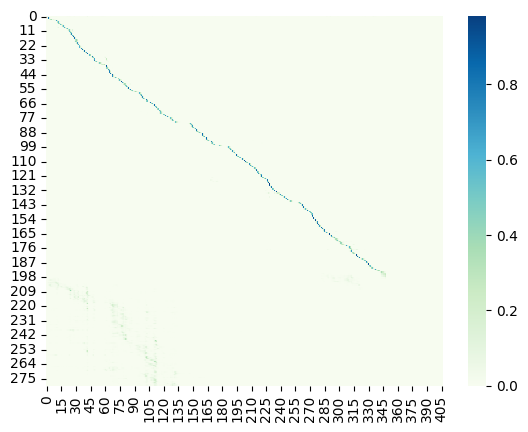

Saved best model

Epoch: 64/80


Val:   3%|▎         | 1/33 [00:02<01:32,  2.88s/it, dist=2.7133]

Ground Truth :  AGAIN THERE WAS A VERY OLD CARRIAGE WHOSE WHEELS IN SPITE OF RUST AND DECAY I COULD SEE HAD BEEN DESIGNED ORIGINALLY FOR IRON RAILS
Prediction   :  AGAIN THERE WAS A VERY OLD CARRIAGE WHOSE WHEELS IN SPITE OF RUST AND DECAY I COULD SEE HAD BEEN DESIGNED ORIGINALLY FOR IRON RAILS


Val:   6%|▌         | 2/33 [00:05<01:22,  2.67s/it, dist=2.8267]

Ground Truth :  WHEN THE THREE INGREDIENTS ARE PROPERLY PREPARED POUND THEM ALTOGETHER IN A MORTAR FOR SOME TIME FOR THE MORE QUENELLES ARE POUNDED THE MORE DELICATE THEY ARE
Prediction   :  WHEN THE THREE INGREDIENTS ARE PROPERLY PREPARED POUND THEM ALTOGETHER IN A MORTAR FOR SOME TIME FOR THE MORE QUENELLES ARE POUNDED THE MORE DELICATE THEY ARE


Val:   9%|▉         | 3/33 [00:07<01:17,  2.59s/it, dist=2.9200]

Ground Truth :  I LOOKED AT IT PRETTY CLOSE AND I SAID GREAT GOD
Prediction   :  I LOOKED AT A PRETTY CLOSE AND I SAID GREAT GOD


Val:  12%|█▏        | 4/33 [00:10<01:14,  2.58s/it, dist=3.0067]

Ground Truth :  WHAT HE SAID HE LOOKED WITH SO MUCH SINCERITY THAT HAD SHE BEEN BURNING WITH RAGE AT HIS LATE BEHAVIOUR SHE MUST HAVE FORGIVEN HIM FOR THE REGRET WHICH HE SO FORCIBLY EXPREST
Prediction   :  WHAT HE SAID HE LOOKED WITH SO MUCH SINCERITY THAT HAD SHE BEEN BURNING WITH RAGE AT HIS LATE BEHAVIOUR SHE MUST HAVE FORGIVEN HIM FOR THE REGRET WHICH HE SO FORCIBLY EXPRESSED


Val:  15%|█▌        | 5/33 [00:12<01:10,  2.51s/it, dist=3.1573]

Ground Truth :  WHILE THE ATTACK WAS SUCCESSFUL IN A WAY ITS MAIN PURPOSE FAILED
Prediction   :  WHILE THE ATTACK WAS SUCCESSFUL IN AWAY ITS MAIN PURPOSE FAILED


Val:  18%|█▊        | 6/33 [00:15<01:05,  2.43s/it, dist=3.3122]

Ground Truth :  AS FOR THE EUCHARIST TRANSUBSTANTIATION THE REAL PRESENCE IT WAS ALL NO MYSTERY TO THEM BUT PALPABLE EVIDENCE AND YET THEY WERE NOT JESUITS
Prediction   :  AS FOR THE EUCHARIST TRANSUBSTANTIATION THE REAL PRESENCE IT WAS ALL NO MYSTERY TO THEM BUT PALPABLE EVIDENCE AND YET THEY WERE NOT JESUITS


Val:  21%|██        | 7/33 [00:17<01:03,  2.43s/it, dist=3.2771]

Ground Truth :  INDEED IT IS NOT A NEST AT ALL ONLY THE BEGINNING OF ONE
Prediction   :  INDEED IT IS NOT A NEST AT ALL ONLY THE BEGINNING OF ONE


Val:  24%|██▍       | 8/33 [00:19<01:00,  2.43s/it, dist=3.3492]

Ground Truth :  YES
Prediction   :  YES


Val:  27%|██▋       | 9/33 [00:22<00:57,  2.38s/it, dist=3.2341]

Ground Truth :  A DISTINCT PROMISE OF A HUNDRED POUNDS WAS MADE TO HIM IF HE WOULD HAVE THE CHILD READY TO HAND OVER TO TREVELYAN ON TREVELYAN'S ARRIVAL IN ENGLAND
Prediction   :  A DISTINCT PROMISE OF A HUNDRED POUNDS WAS MADE TO HIM IF HE WOULD HAVE THE CHILD READY TO HAND OVER TO TREVELYAN ON TREVELYAN'S ARRIVAL IN ENGLAND


Val:  30%|███       | 10/33 [00:24<00:54,  2.36s/it, dist=3.1693]

Ground Truth :  THEREFORE MY ANSWER IS WITH GREATER CARE THAT HE MAY HEAR ME WHO IS WEEPING YONDER SO THAT THE SIN AND DOLE BE OF ONE MEASURE
Prediction   :  THEREFORE MY ANSWER IS WITH GREATER CARE THAT HE MAY HEAR ME WHOSE WEEPING YONDER SO THAT THE SIN AND DOLL BE OF ONE MEASURE


Val:  33%|███▎      | 11/33 [00:26<00:51,  2.36s/it, dist=3.1806]

Ground Truth :  WHAT EXTRAORDINARY THINGS WILL SOMETIMES OCCUR FROM MERE CHANCE OR FROM THE FORCE OF CIRCUMSTANCES
Prediction   :  WHAT EXTRAORDINARY THINGS WILL SOMETIMES OCCUR FROM MERE CHANCE OR FROM THE FORCE OF CIRCUMSTANCES


Val:  36%|███▋      | 12/33 [00:29<00:49,  2.37s/it, dist=3.1489]

Ground Truth :  IMPERTINENT YOUNG BEGGAR SAID BURGESS
Prediction   :  IMPERTINENT YOUNG BEGGAR SAID BURGESS


Val:  39%|███▉      | 13/33 [00:31<00:47,  2.37s/it, dist=3.1215]

Ground Truth :  DELIGHTED WITH SUCH A FORTUNATE RESULT WE LAY DOWN AGAIN
Prediction   :  DELIGHTED WITH SUCH A FORTUNATE RESULT WE LAY DOWN AGAIN


Val:  42%|████▏     | 14/33 [00:34<00:45,  2.38s/it, dist=3.0605]

Ground Truth :  OUR HONOR IS THE GUARANTEE FOR HIS SAFETY SO LONG AS HE IS WITHIN THE CAMP
Prediction   :  OUR HONOUR IS THE GUARANTEE FOR HIS SAFETY SO LONG AS HE IS WITHIN THE CAMP


Val:  45%|████▌     | 15/33 [00:36<00:42,  2.38s/it, dist=3.0227]

Ground Truth :  THEY ALSO FOUND A MARTIAN CALENDAR THE YEAR HAD BEEN DIVIDED INTO TEN MORE OR LESS EQUAL MONTHS AND ONE OF THEM HAD BEEN DOMA
Prediction   :  THEY ALSO FOUND A MARTIAN CALENDAR THE YEAR HAD BEEN DIVIDED INTO TEN MORE OR LESS EQUAL MONTHS AND ONE OF THEM HAD BEEN DOMA


Val:  48%|████▊     | 16/33 [00:38<00:39,  2.35s/it, dist=3.0125]

Ground Truth :  EXTERMINATE WITH ME THE HERETICS AND WITH YOU I WILL EXTERMINATE THE PERSIANS
Prediction   :  EXTERMINATE WITH ME THE HERETICS AND WITH YOU I WILL EXTERMINATE THE PERSIANS


Val:  52%|█████▏    | 17/33 [00:41<00:37,  2.34s/it, dist=3.0016]

Ground Truth :  BUT SOFTLY AS THE NAME WAS BREATHED MARY GRANT ALREADY AWAKENED BY THE SOUNDS IN THE HUT SLIPPED OVER TOWARD GLENARVAN AND SEIZING THE HAND ALL STAINED WITH EARTH SHE COVERED IT WITH KISSES
Prediction   :  BUT SOFTLY AS THE NAME WAS BREATHED MARY GRANT ALREADY AWAKENED BY THE SOUNDS IN THE HUT SLIPPED OVER TOWARD GLENARVAN AND SEIZING THE HAND ALL STAINED WITH EARTH SHE COVERED IT WITH KISSES


Val:  55%|█████▍    | 18/33 [00:43<00:34,  2.33s/it, dist=2.9574]

Ground Truth :  THE AMERICANS IN THEIR INTERCOURSE WITH STRANGERS APPEAR IMPATIENT OF THE SMALLEST CENSURE AND INSATIABLE OF PRAISE
Prediction   :  THE AMERICANS IN THEIR INTERCOURSE WITH STRANGERS APPEAR IMPATIENT OF THE SMALLEST CENSURE AND INSATIABLE OF PRAISE


Val:  58%|█████▊    | 19/33 [00:45<00:33,  2.36s/it, dist=2.9663]

Ground Truth :  HE HELD A HOE IN HIS HAND AND WHILE PHOEBE WAS GONE IN QUEST OF THE CRUMBS HAD BEGUN TO BUSY HIMSELF WITH DRAWING UP FRESH EARTH ABOUT THE ROOTS OF THE TOMATOES
Prediction   :  HE HELD A HOE IN HIS HAND AND WHILE PHOEBE WAS GONE IN QUEST OF THE CRUMBS HAD BEGUN TO BUSY HIMSELF WITHDRAWING UP FRESH EARTH ABOUT THE ROOTS OF THE TOMATOES


Val:  61%|██████    | 20/33 [00:48<00:30,  2.35s/it, dist=2.9627]

Ground Truth :  FRENCH FORCEMEAT
Prediction   :  FRENCH FORCEMEAT


Val:  64%|██████▎   | 21/33 [00:50<00:27,  2.32s/it, dist=2.9492]

Ground Truth :  NOW HARRY SAID MY UNCLE RUBBING HIS HANDS AN GOES WELL THE WORSE DIFFICULTY IS NOW OVER
Prediction   :  NOW HARRY SAID MY UNCLE RUBBING HIS HANDS ON GOES WELL THE WORST DIFFICULTY IS NOW OVER


Val:  67%|██████▋   | 22/33 [00:52<00:26,  2.38s/it, dist=2.9961]

Ground Truth :  HE FANCIED AS HE SAT AT HIS DESK THAT NOTHING WOULD BE DONE FOR A WEEK OR TWO MEANWHILE HE WOULD HAVE TIME TO THINK
Prediction   :  HE FANCIED AS HE SAT AT HIS DESK THAT NOTHING WOULD BE DONE FOR A WEEK OR TWO MEANWHILE HE WOULD HAVE TIME TO THINK


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.33s/it, dist=2.9835]

Ground Truth :  NOR IS MISTER QUILTER'S MANNER LESS INTERESTING THAN HIS MATTER
Prediction   :  NOR IS MISTER QUILTER'S MANNER LESS INTERESTING THAN HIS MATTER


Val:  73%|███████▎  | 24/33 [00:57<00:20,  2.30s/it, dist=2.9644]

Ground Truth :  IT WAS NOT FROM ANY REAL CAUSE OF GRIEF THAT SHE WEPT BUT THERE WAS A MAGNETIC QUALITY IN TEARS WHICH ALWAYS ATTRACTED HER'S
Prediction   :  IT WAS NOT FROM ANY REAL CAUSE OF GRIEF THAT SHE WEPT BUT THERE WAS A MAGNETIC QUALITY IN TEARS WHICH ALWAYS ATTRACTED HERS


Val:  76%|███████▌  | 25/33 [00:59<00:18,  2.37s/it, dist=2.9747]

Ground Truth :  YET AS THE PROFOUND DOCTOR HAD BEEN TERRIFIED AT HIS OWN RASHNESS APOLLINARIS WAS HEARD TO MUTTER SOME FAINT ACCENTS OF EXCUSE AND EXPLANATION
Prediction   :  YET AS THE PROFOUND DOCTOR HAD BEEN TERRIFIED AT HIS OWN RASHNESS APOLLINARIS WAS HEARD TO MUTTER SOME FAINT ACCENTS OF EXCUSE AND EXPLANATION


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.40s/it, dist=2.9651]

Ground Truth :  THERE THEY STROVE TO BREAK THE SILVER CORD OF LIFE AND THRUST MY SOUL INTO THE BODY OF A FOUL NIGHT WEIRD THEIR SORCERY SUMMONED UP FROM HELL AH
Prediction   :  THERE THEY STROVE TO BREAK THE SILVER COURT OF LIFE AND THRUST MY SOUL INTO THE BODY OF A FOUL NIGHT WEIRD THEIR SOURCERY SUMMONED UP FROM HELL AH


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.45s/it, dist=2.9610]

Ground Truth :  BRION SAW SOMETHING CLOSE TO PANIC ON HIS OPPONENT'S FACE WHEN THE MAN FINALLY RECOGNIZED HIS ERROR
Prediction   :  BRION SAW SOMETHING CLOSE TO PANIC ON HIS OPPONENT'S FACE WHEN THE MAN FINALLY RECOGNIZED HIS ERROR


Val:  85%|████████▍ | 28/33 [01:07<00:12,  2.46s/it, dist=2.9836]

Ground Truth :  THESE PERSONS THEN DISPLAYED TOWARDS EACH OTHER PRECISELY THE SAME PUERILE JEALOUSIES WHICH ANIMATE THE MEN OF DEMOCRACIES THE SAME EAGERNESS TO SNATCH THE SMALLEST ADVANTAGES WHICH THEIR EQUALS CONTESTED AND THE SAME DESIRE TO PARADE OSTENTATIOUSLY THOSE OF WHICH THEY WERE IN POSSESSION
Prediction   :  THESE PERSONS THEN DISPLAYED TOWARDS EACH OTHER PRECISELY THE SAME PURE ALL JEALOUSIES WHICH ANIMATE THE MEN OF DEMOCRACIES THE SAME EAGERNESS TO SNUTCH THE SMALLEST ADVANTAGES WHICH THEIR EQUALS CONTESTED AND THE SAME DESIRE TO PARADE OSTENTATIOUSLY THOSE OF WHICH THEY WERE IN POSSESSION


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.44s/it, dist=3.0021]

Ground Truth :  FOR SOME REASON THE DEAD AT HATCHIE BRIDGE WERE NOT BURIED
Prediction   :  FOR SOME REASON THE DEAD AND HATCHY BRIDGE WERE NOT BURIED


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.45s/it, dist=3.0113]

Ground Truth :  THE FLOORS WERE COVERED WITH MATTING AND THE HALL LAID WITH A THIN RAG CARPET
Prediction   :  THE FLOORS WERE COVERED WITH MATTING AND THE HALL LAID WITH A THIN RAG CARPET


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.40s/it, dist=3.0135]

Ground Truth :  BRAVELY AND GENEROUSLY HAS HE BATTLED IN MY BEHALF AND THIS AND MORE WILL I DARE IN HIS SERVICE
Prediction   :  BRAVELY AND GENEROUSLY AS HE BATTLED IN MY BEHALF AND THIS AND MORE WILL I DARE IN HIS SERVICE


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.42s/it, dist=3.0827]

Ground Truth :  MISSUS HORTON TOO IN THE SELF APPROVING REFLECTION THAT SHE WAS NOT IN A QUARREL OR ALTERCATION OF ANY KIND FELT HERSELF AT THIS MOMENT REMARKABLY PEACEFUL AND CHARITABLE
Prediction   :  MISSUS HORTON TOO IN THE SELF APPROVING REFLECTION THAT SHE WAS NOT IN A QUARREL OR ALTERCATION OF ANY KIND FELT HERSELF AT THIS MOMENT REMARKABLY PEACEFUL AND CHARITABLE


Val: 100%|██████████| 33/33 [01:18<00:00,  2.00s/it, dist=3.0544]

Ground Truth :  I FREQUENTLY THOUGHT IT WOULD BE PLEASANT TO SPLIT THE DIFFERENCE WITH THAT MULE AND I WOULD GLADLY HAVE DONE SO IF I COULD HAVE GOTTEN ONE HALF OF HIS NO
Prediction   :  I FREE ONLY THOUGHT IT WOULD BE PLEASANT TO SPLIT A DIFFERENCE WITH THAT MULE AND I WOULD GLADLY HAVE DONE SO IF I COULD HAVE GOTTEN ONE HALF OF HIS NO


	Train Loss 0.0828	 Learning Rate 0.0001553
	Val Dist 3.0544	
	Teacher Forcing Ratio 1	


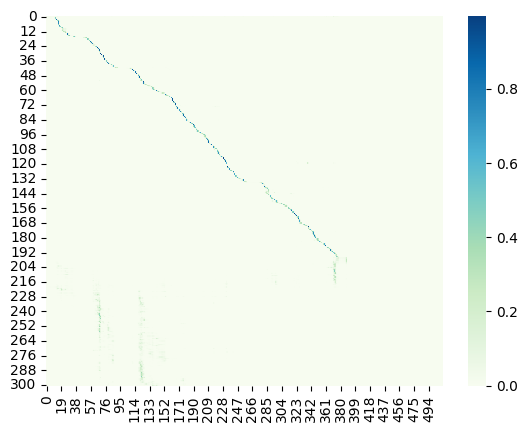

Saved best model

Epoch: 65/80


Val:   3%|▎         | 1/33 [00:02<01:26,  2.70s/it, dist=2.9400]

Ground Truth :  WORSE STORIES HAVE BEEN PRINTED I DO ASSURE YOU WORSE STORIES HAVE BEEN PRINTED
Prediction   :  WERE STORIES HAVE BEEN PRINTED I DO ASSURE YOU WORSE STORIES HAVE BEEN PRINTED


Val:   6%|▌         | 2/33 [00:05<01:17,  2.49s/it, dist=3.2800]

Ground Truth :  HE HOPED THERE WOULD BE STEW FOR DINNER TURNIPS AND CARROTS AND BRUISED POTATOES AND FAT MUTTON PIECES TO BE LADLED OUT IN THICK PEPPERED FLOUR FATTENED SAUCE
Prediction   :  HE HOPED THERE WOULD BE STEW FOR DINNER TURNIPS AND CARROTS AND BRUISED POTATOES AND FAT MUTTON PIECES TO BE LADLED OUT IN THICK PEPPERED FLOWER FATTENED SAUCE


Val:   9%|▉         | 3/33 [00:07<01:15,  2.52s/it, dist=3.1867]

Ground Truth :  THE JOYOUS CONVULSION OF LAUGHTER WAS AS A TRIBUTE PAID THEY SUBMITTED TO IT GLADLY BUT ALMOST MECHANICALLY
Prediction   :  THE JOYOUS CONVULSION OF LAUGHTER WAS AS IT TRIBUTE PAID THEY SUBMITTED TO IT GLADLY BUT ALMOST MECHANICALLY


Val:  12%|█▏        | 4/33 [00:09<01:11,  2.46s/it, dist=3.3767]

Ground Truth :  BUT RECKONING TIME WHOSE MILLION'D ACCIDENTS CREEP IN TWIXT VOWS AND CHANGE DECREES OF KINGS TAN SACRED BEAUTY BLUNT THE SHARP'ST INTENTS DIVERT STRONG MINDS TO THE COURSE OF ALTERING THINGS ALAS WHY FEARING OF TIME'S TYRANNY MIGHT I NOT THEN SAY NOW I LOVE YOU BEST WHEN I WAS CERTAIN O'ER INCERTAINTY CROWNING THE PRESENT DOUBTING OF THE REST
Prediction   :  BUT RECKONING TIME WHOSE MULIAN TO ACCIDENTS CREEP IN TWIXT VOWS AND CHANGE DECREES OF KINGS TAN SACRED BEAUTY BLUNT THE SHARPEST INTENSE DIVERT STRONG MINDS TO THE COURSE OF ALTERING THINGS ALAS WHY FEARING OF TIME'S TYRANNY MIGHT I NOT THEN SAY NOW I LOVE YOU BEST WHEN I WAS CERTAIN OR INCERTAINTY CROWNING THE PRESENT DOUBTING OF THE REST


Val:  15%|█▌        | 5/33 [00:12<01:08,  2.44s/it, dist=3.2387]

Ground Truth :  THEY BELIEVED THAT THROUGH ME THEY POSSESSED THE PHILOSOPHER'S STONE THE UNIVERSAL PANACEA THE INTERCOURSE WITH ALL THE ELEMENTARY HEAVENLY AND INFERNAL SPIRITS THEY HAD NO DOUBT WHATEVER THAT THANKS TO MY SUBLIME SCIENCE THEY COULD FIND OUT THE SECRETS OF EVERY GOVERNMENT IN EUROPE
Prediction   :  THEY BELIEVED THAT THROUGH ME THEY POSSESSED THE PHILOSOPHER STONE THE UNIVERSAL PANACEA THE INTERCOURSE WITH ALL THE ELEMENTARY HEAVENLY AND INFERNAL SPIRITS AND THEY HAD NO DOUBT WHATEVER THAT THANKS TO MY SUBLIME SCIENCE THEY COULD FIND OUT THE SECRETS OF EVERY GOVERNMENT IN EUROPE


Val:  18%|█▊        | 6/33 [00:14<01:05,  2.44s/it, dist=3.1378]

Ground Truth :  AREN'T YOU SPLASHED LOOK AT THE SPIDER WEBS ALL OVER THE GRASS
Prediction   :  AREN'T YOU SPLASHED LOOK AT THE SPIDER WEBS ALL OVER THE GRASS


Val:  21%|██        | 7/33 [00:17<01:02,  2.41s/it, dist=3.1819]

Ground Truth :  NOW BEAT AND STRAIN THE EGGS WORK THESE UP WITH THE OTHER INGREDIENTS AND THE FORCEMEAT WILL BE READY FOR USE
Prediction   :  NOW BEAT AND STRAIN THE EGGS WORK THESE UP WITH THE OTHER INGREDIENTS AND THE FORCEMEAT WILL BE READY FOR USE


Val:  24%|██▍       | 8/33 [00:19<01:00,  2.43s/it, dist=3.2000]

Ground Truth :  THE VOICE APPEARED TO BE OVERHEAD
Prediction   :  THE LOYAL APPEARED TO BE OVERHEAD


Val:  27%|██▋       | 9/33 [00:21<00:57,  2.40s/it, dist=3.1437]

Ground Truth :  TO NO HOME IN THE LAND DID THE GREAT TROUBLE BRING A MORE SUDDEN CHANGE THAN THE LITTLE COTTAGE IN THE LANE
Prediction   :  TO KNOW HOME IN THE LAND TO DID THE GREAT TROUBLE BRING A MORE SUDDEN CHANGE THAN THE LITTLE COTTAGE IN THE LANE


Val:  30%|███       | 10/33 [00:24<00:56,  2.45s/it, dist=3.1407]

Ground Truth :  IT WAS A MONOTONOUS LIFE BUT IT WAS VERY HEALTHY AND ONE DOES NOT MUCH MIND ANYTHING WHEN ONE IS WELL
Prediction   :  IT WAS A MONOTONOUS LIFE BUT IT WAS VERY HEALTHY AND ONE DOES NOT MUCH MIND ANYTHING WHEN ONE IS WELL


Val:  33%|███▎      | 11/33 [00:26<00:53,  2.44s/it, dist=3.1188]

Ground Truth :  TO SAY UNTO VIRGILIUS NOT A DRACHM OF BLOOD REMAINS IN ME THAT DOES NOT TREMBLE I KNOW THE TRACES OF THE ANCIENT FLAME
Prediction   :  TO SAND TO VIRGILIUS NOT A DRAWHOME OF BLOOD REMAINS IN ME THAT DOES NOT TREMBLE I KNOW THE TRACES OF THE ANCIENT FLAME


Val:  36%|███▋      | 12/33 [00:29<00:52,  2.48s/it, dist=3.0689]

Ground Truth :  NOTHING COULD BE MORE NATURAL THAN SUCH AN ASSEMBLY IN SUCH A PLACE AT SUCH A PERIOD
Prediction   :  NOTHING COULD BE MORE NATURAL THAN SUCH AN ASSEMBLY IN SUCH A PLACE AT SUCH A PERIOD


Val:  39%|███▉      | 13/33 [00:31<00:47,  2.39s/it, dist=3.0364]

Ground Truth :  THE SLANT OF THE MOON PRESAGED EVIL FOR THE KING OF VENDHYA THE STARS ARE IN TURMOIL THE SERPENT IN THE HOUSE OF THE ELEPHANT
Prediction   :  THE SLANT OF THE MOON PRESAGED EVIL FOR THE KING OF VENDIA THE STARS ARE IN TURMOIL THE SERPENT IN THE HOUSE OF THE ELEPHANT


Val:  42%|████▏     | 14/33 [00:33<00:44,  2.33s/it, dist=2.9810]

Ground Truth :  WEEK FOLLOWED WEEK THESE TWO BEINGS LED A HAPPY LIFE IN THAT HOVEL
Prediction   :  WEAK FOLLOWED WEEK THESE TWO BEINGS LET A HAPPY LIFE IN THAT HOVEL


Val:  45%|████▌     | 15/33 [00:35<00:40,  2.25s/it, dist=2.9258]

Ground Truth :  HE MADE THE SIGN OF THE CROSS OVER ME PUT ON HIS CAP AND WENT OFF IN THE DARK
Prediction   :  HE MADE THE SIGN OF THE CROSS OVER ME PUT ON HIS CAP AND WENT OFF IN THE DARK


Val:  48%|████▊     | 16/33 [00:38<00:38,  2.25s/it, dist=2.8854]

Ground Truth :  EVERY CHANCE SHE COULD STEAL AFTER PRACTICE HOURS WERE OVER AND AFTER THE CLAMOROUS DEMANDS OF THE BOYS UPON HER TIME WERE FULLY SATISFIED WAS SEIZED TO FLY ON THE WINGS OF THE WIND TO THE FLOWERS
Prediction   :  EVERY CHANCE SHE COULD STEAL AFTER PRACTICE HOURS WERE OVER AND AFTER THE CLAMOROUS DEMANDS OF THE BOYS UPON HER TIME WERE FULLY SATISFIED WAS SEIZED TO FLY ON THE WINGS OF THE WIND TO THE FLOWERS


Val:  52%|█████▏    | 17/33 [00:40<00:36,  2.30s/it, dist=2.8808]

Ground Truth :  HOW CHEERFULLY HE SEEMS TO GRIN HOW NEATLY SPREAD HIS CLAWS AND WELCOME LITTLE FISHES IN WITH GENTLY SMILING JAWS
Prediction   :  HOW CHEERFULLY HE SEEMS TO GRIN HOW NEATLY SPREAD HIS CLAWS AND WELCOME LITTLE FISHES IN WITH GENTLY SMILING JAWS


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.34s/it, dist=2.8900]

Ground Truth :  I FEEL FOR YOU HERBERT HE SAID WARMLY
Prediction   :  I FEEL FOR YOU HER HURT HE SAID WARMLY


Val:  58%|█████▊    | 19/33 [00:45<00:32,  2.36s/it, dist=2.9063]

Ground Truth :  LACRIMA CHRISTI A STILL WINE OF EXCELLENT FLAVOR AND BOUQUET
Prediction   :  LOOK REMARKED YOU STEE A STILL WINE OF EXCELLENT FLAVOUR IN BOCAE


Val:  61%|██████    | 20/33 [00:47<00:30,  2.36s/it, dist=2.9053]

Ground Truth :  I EVEN BOUGHT SOMETHING FOR MADGE I MEAN MISSUS WILSON
Prediction   :  I EVEN BOUGHT SOMETHING FOR MADGE I MEAN MISSUS WILSON


Val:  64%|██████▎   | 21/33 [00:50<00:29,  2.42s/it, dist=2.9568]

Ground Truth :  THERE WERE A GOOD MANY SHEEP WHICH I KNEW AS TWO OR THREE BLACK EWES AND A BLACK LAMB OR TWO AND SEVERAL OTHERS WHICH HAD SOME DISTINGUISHING MARK WHEREBY I COULD TELL THEM
Prediction   :  THERE WERE A GOOD MANY SHEEP WHICH I KNEW AS TWO OR THREE BLACK EWES AND A BLACK LAMB OR TWO AND SEVERAL OTHERS WHICH HAD SOME DISTINGUISHING MARK WHEREBY I COULD TELL THEM


Val:  67%|██████▋   | 22/33 [00:52<00:26,  2.41s/it, dist=2.9179]

Ground Truth :  MISSUS GRIFFIN HOWEVER EXPRESSED THE NEED FOR A LITTLE MORE LIGHT
Prediction   :  MISSUS GRIFFIN HOWEVER EXPRESSED THE NEED FOR A LITTLE MORE LIGHT


Val:  70%|██████▉   | 23/33 [00:55<00:24,  2.40s/it, dist=2.9559]

Ground Truth :  ANY ONE WITH THE SLIGHTEST PRETENSIONS TO REFINED COOKERY MUST IN THIS PARTICULAR IMPLICITLY FOLLOW THE EXAMPLE OF OUR FRIENDS ACROSS THE CHANNEL
Prediction   :  ANYONE WITH THE SLIGHTEST PRETENSIONS TO REFINED COOKERY MUST IN THIS PARTICULAR IMPLICITLY FOLLOW THE EXAMPLE OF OUR FRIENDS ACROSS THE CHANNEL


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.40s/it, dist=2.9431]

Ground Truth :  PERHAPS YOU COULD PUT ON YOUR COAT AND WALK OUT WITH ME FOR A FEW MINUTES SAID TREVELYAN
Prediction   :  PERHAPS YOU COULD PUT ON YOUR COAT AND WALK OUT WITH ME FOR A FEW MINUTES SAID TREVELYAN


Val:  76%|███████▌  | 25/33 [00:59<00:19,  2.41s/it, dist=2.9144]

Ground Truth :  HE WAS YOUNG NO SPEAR HAD TOUCHED HIM NO POISON LURKED IN HIS WINE
Prediction   :  HE WAS YOUNG NO SPEAR HAD TOUCHED HIM NO POISON LURKED IN HIS WINE


Val:  79%|███████▉  | 26/33 [01:02<00:17,  2.47s/it, dist=2.9254]

Ground Truth :  WHEN HE RETURNED TO THE CAMP HE MUST REMAIN AT A DISTANCE UNTIL HE HAD AGAIN ENTERED THE VAPOR BATH AND PREPARED HIMSELF FOR INTERCOURSE WITH HIS FELLOWS
Prediction   :  WHEN HE RETURNED TO THE CAMP HE MUST REMAIN AT A DISTANCE UNTIL HE HAD AGAIN ENTERED THE VAPOR BATH AND PREPARED HIMSELF FOR ANTROCOURSE WITH HIS FELLOWS


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.44s/it, dist=2.9798]

Ground Truth :  THE ORDEAL IS BEST MET ALONE WHERE NO CURIOUS OR PITYING EYES EMBARRASS HER WHERE ALL NATURE SAYS TO HER SPIRIT TIS LOVE TIS LOVE THE FULFILLING OF LIFE
Prediction   :  THE ORDIAL IS BEST MET ALONE WERE NO CURIOUS OR PITYING EYES EMBARRASSED HER WHERE ALL NATURE SAYS TO HER SPIRIT TIS LOVED HIS LOVE THE FULFILLING OF LIFE


Val:  85%|████████▍ | 28/33 [01:07<00:12,  2.46s/it, dist=2.9955]

Ground Truth :  SHE DID NOT ALTOGETHER LIKE HIM
Prediction   :  SHE DID NOT ALTOGETHER LIKE HIM


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.44s/it, dist=3.0136]

Ground Truth :  THE ACCIDENT IN QUESTION OCCURRED UPON THE SUNDAY EVENING
Prediction   :  THE ACCIDENT IN QUESTION OCCURRED UPON THE SUNDAY EVENING


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.49s/it, dist=3.0233]

Ground Truth :  IT WAS ABOUT NOON WHEN CAPTAIN WAVERLEY ENTERED THE STRAGGLING VILLAGE OR RATHER HAMLET OF TULLY VEOLAN CLOSE TO WHICH WAS SITUATED THE MANSION OF THE PROPRIETOR
Prediction   :  IT WAS ABOUT NOON WHEN CAPTAIN WAVERLY ENTERED THE STRAGGLING VILLAGE OR BROTHER HAMLET OF TWOLY BALE ON CLISTER WHICH WAS ITUATED THE MATCH AND OF THE PROPRIETOR


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.43s/it, dist=3.0032]

Ground Truth :  TRACING RIVERS TO THEIR FOUNTAINS MAKES THE MOST CHARMING OF TRAVELS
Prediction   :  TRACING RIVERS TO THEIR FOUNTAINS MAKES THE MOST CHARMING OF TRAVELS


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.35s/it, dist=3.0027]

Ground Truth :  THEN THERE WAS SILENCE THEN A SIGH AND THE SOUND OF LIGHT MOVING FEET ON THE GRAVEL
Prediction   :  THEN THERE WAS SILENCE THEM ASIDE AND THE SOUND OF LIGHT MOVING FEET ON THE GRAVEL


Ground Truth :  A SNAKE OF HIS SIZE IN FIGHTING TRIM WOULD BE MORE THAN ANY BOY COULD HANDLE
Prediction   :  A SNAKE OF HIS SIZE IN FIGHTING TRIM WOULD BE MORE THAN NEIGH BOY COULD HANDLE
	Train Loss 0.0806	 Learning Rate 0.0001395
	Val Dist 2.9981	


	Teacher Forcing Ratio 1	


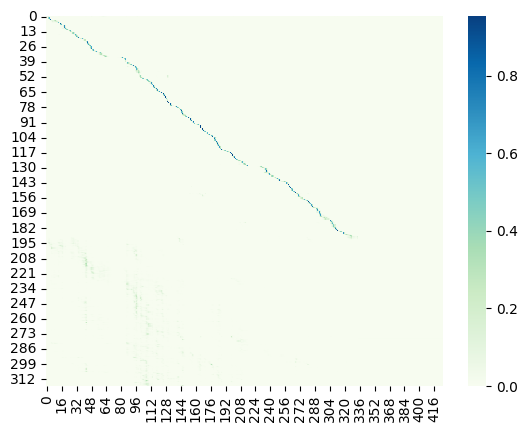

Saved best model

Epoch: 66/80


Val:   3%|▎         | 1/33 [00:02<01:34,  2.95s/it, dist=2.5267]

Ground Truth :  THEIR CONTENTS HAD ALL BOILED AWAY LEAVING IN THE BOTTOM OF EACH KETTLE A FEW GRAINS OF FINE WHITE POWDER
Prediction   :  THEIR CONTENTS HAD ALL BOILED AWAY LEAVING IN THE BOTTOM OF EACH KETTLE A FEW GRAINS OF FINE WHITE POWDER


Val:   6%|▌         | 2/33 [00:05<01:21,  2.64s/it, dist=3.0500]

Ground Truth :  THE LONDON PLANT WAS LESS TEMPORARY BUT NOT PERMANENT SUPPLYING BEFORE IT WAS TORN OUT NO FEWER THAN THREE THOUSAND LAMPS IN HOTELS CHURCHES STORES AND DWELLINGS IN THE VICINITY OF HOLBORN VIADUCT
Prediction   :  THE LONDON PLANT WAS LESS TEMPORARY BUT NOT PERMANENT SUPPLYING BEFORE IT WAS TORN OUT NO FEWER THAN THREE THOUSAND LAMPS IN HOTELS CHURCHES STORES AND DWELLINGS IN THE VICINITY OF HOLBORN VIADUCK


Val:   9%|▉         | 3/33 [00:07<01:12,  2.43s/it, dist=3.0022]

Ground Truth :  SAID CAPTAIN DONNITHORNE SEATING HIMSELF WHERE HE COULD SEE ALONG THE SHORT PASSAGE TO THE OPEN DAIRY DOOR
Prediction   :  SAID KEPT IN DONNITHORNE SEATING HIMSELF WHERE HE COULD SEE ALONG THE SHORT PASSAGE TO THE OPEN DAIRY DOOR


Val:  12%|█▏        | 4/33 [00:10<01:11,  2.46s/it, dist=3.0783]

Ground Truth :  THE BOYS LOOK WIDE AWAKE ENOUGH BUT WHO CAN TELL I WOULD SOONER BELIEVE THAT
Prediction   :  THE BOYS LOOK WIDE AWAKE ENOUGH BUT WHO CAN TELL I WOULD SOONER BELIEVE THAT


Val:  15%|█▌        | 5/33 [00:12<01:09,  2.47s/it, dist=3.0253]

Ground Truth :  THE MAN NO LONGER PRODUCED ON HER THE EFFECT OF BEING OLD OR POOR SHE THOUGHT JEAN VALJEAN HANDSOME JUST AS SHE THOUGHT THE HOVEL PRETTY
Prediction   :  SAMAN NO LONGER PRODUCED ON HER THE EFFECT OF BEING OLD OR POOR SHE THOUGHT JOHN VALJEAN HANDSOME JUST AS SHE THOUGHT THE HOVEL PRETTY


Val:  18%|█▊        | 6/33 [00:14<01:04,  2.40s/it, dist=2.8911]

Ground Truth :  BUT MY UNCLE WAS IN NO HUMOR TO WAIT
Prediction   :  BUT MY UNCLE WAS AND NO HUMOUR TO WAIT


Val:  21%|██        | 7/33 [00:17<01:00,  2.34s/it, dist=2.9171]

Ground Truth :  THE POETS OF SUCCEEDING AGES HAVE DWELT MUCH IN DETAIL ON THE OCCURRENCES OF THIS MEMORABLE DAY
Prediction   :  THE POETS OF SUCCEEDING AGES HAVE DWELT MUCH IN DETAIL ON THE OCCURRENCES OF THIS MEMORABLE DAY


Val:  24%|██▍       | 8/33 [00:19<00:59,  2.37s/it, dist=2.8767]

Ground Truth :  HE HAD RETURNED TO PRISON THIS TIME FOR HAVING DONE RIGHT HE HAD QUAFFED FRESH BITTERNESS DISGUST AND LASSITUDE WERE OVERPOWERING HIM EVEN THE MEMORY OF THE BISHOP PROBABLY SUFFERED A TEMPORARY ECLIPSE THOUGH SURE TO REAPPEAR LATER ON LUMINOUS AND TRIUMPHANT BUT AFTER ALL THAT SACRED MEMORY WAS GROWING DIM
Prediction   :  HE HAD RETURNED TO PRISON THIS TIME FOR HAVING DONE RIGHT HE HAD QUAFFED FRESH BITTERNESS DISGUST AND LASSITUDE WERE OVERPOWERING HIM EVEN THE MEMORY OF THE BISHOP PROBABLY SUFFERED A TEMPORARY ECLIPSE THOUGH SURE TO REAPPEAR LATER ON LUMINOUS AND TRIUMPHANT BUT AFTER ALL THAT SACRED MEMORY WAS GROWING DIM


Val:  27%|██▋       | 9/33 [00:21<00:56,  2.37s/it, dist=2.9259]

Ground Truth :  THE WORLD WAS WATER VEILED IN MISTS
Prediction   :  THE WORLD WAS WATER VEILED IN MISTS


Val:  30%|███       | 10/33 [00:24<00:55,  2.40s/it, dist=2.9400]

Ground Truth :  SOMEONE SNIGGERED
Prediction   :  SOMEONE SNIGGERED


Val:  33%|███▎      | 11/33 [00:26<00:50,  2.31s/it, dist=2.9152]

Ground Truth :  I HAD WANTED TO GET SOME PICTURE BOOKS FOR YULKA AND ANTONIA EVEN YULKA WAS ABLE TO READ A LITTLE NOW
Prediction   :  I HAD WANTED TO GET SOME PICTURE BOOKS FOR YIELD GOOD AND ANTONIA EVEN YULKA WAS ABLE TO READ A LITTLE NOW


Val:  36%|███▋      | 12/33 [00:28<00:48,  2.29s/it, dist=2.9306]

Ground Truth :  WHILE HE WAS WALKING UP AND DOWN THE PLATFORM WITH A MIND DOUBLY DISTRESSED BY ANXIETY ABOUT HIS BROTHER AND ANXIETY ABOUT SYDNEY THE TRAIN FROM LONDON CAME IN
Prediction   :  WHILE HE WAS WALKING UP AND DOWN THE PLATFORM WITH A MIND DOUBLY DISTRESSED BYING SIDE ABOUT HIS BROTHER AND ANXIETY ABOUT SIDNEY THE TRAIN FROM LONDON CAME IN


Val:  39%|███▉      | 13/33 [00:31<00:46,  2.33s/it, dist=2.9533]

Ground Truth :  SHE CALLED HIS NAME ON THE THRESHOLD BUT IN HER SWIFT FLIGHT ACROSS THE ROOM SHE FELT A CHANGE IN HIM AND CAUGHT HERSELF UP SO DEFTLY THAT HE COULD NOT TELL JUST WHEN SHE DID IT
Prediction   :  SHE CALLED HIS NAME ON THE THRESHOLD BUT IN HER SWIFT FLIGHT ACROSS THE ROOM SHE FELT A CHANGE IN HIM AND CAUGHT HERSELF UP SO DEAFLY THAT HE COULD NOT TELL JUST WHEN SHE DID IT


Val:  42%|████▏     | 14/33 [00:33<00:45,  2.39s/it, dist=2.9305]

Ground Truth :  SHE DOESN'T PICK THEM UP BUT JUST HAVING THEM IN THE ROOM SURE DOESN'T GIVE HER ASTHMA
Prediction   :  SHE DOESN'T PICK THEM UP BUT JUST HAVING THEM IN THE ROOM SHER DOESN'T GIVE HER ASKMA


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.40s/it, dist=2.9182]

Ground Truth :  NOW IT WAS BURNED AWAY AT BOTH SIDES AND LAY STILL HOT ALONG THE EDGES ON THE FLOOR OF THE BIG OFFICE ROOM IN FRONT
Prediction   :  NOW IT WAS BURNED AWAY AT BOTH SIDES AND LAY STILL HOT ALONG THE EDGES ON THE FLOOR OF THE BIG OFFICE ROOM IN FRONT


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.36s/it, dist=2.9529]

Ground Truth :  WHEN WE TOOK OUR SEATS AT THE BREAKFAST TABLE IT WAS WITH THE FEELING OF BEING NO LONGER LOOKED UPON AS CONNECTED IN ANY WAY WITH THIS CASE
Prediction   :  WHEN WE TOOK OUR SEATS AT THE BREAKFAST TABLE IT WAS WITH THE FEELING OF BEING NO LONGER LOOKED UPON AS CONNECTED IN ANY WAY WITH THIS CASE


Val:  52%|█████▏    | 17/33 [00:40<00:37,  2.35s/it, dist=2.9957]

Ground Truth :  ON THE LAST SATURDAY IN APRIL THE NEW YORK TIMES PUBLISHED AN ACCOUNT OF THE STRIKE COMPLICATIONS WHICH WERE DELAYING ALEXANDER'S NEW JERSEY BRIDGE AND STATED THAT THE ENGINEER HIMSELF WAS IN TOWN AND AT HIS OFFICE ON WEST TENTH STREET
Prediction   :  ON THE LAST SATURDAY IN APRIL THE NEW YORK TIMES PUBLISHED AN ACCOUNT OF THE STRIKE COMPLICATIONS WHICH WERE DELAYING ALEXANDER'S NEW JERSEY BRIDGE AND STATED THAT THE ENGINEER HIMSELF WAS IN TOWN AND AT HIS OFFICE ON WEST TENTH STREET


Val:  55%|█████▍    | 18/33 [00:42<00:35,  2.35s/it, dist=3.0519]

Ground Truth :  I'M HERE BECAUSE THE MATTER IS OF UTMOST IMPORTANCE AND BRANDD IS THE ONE I MUST SEE NOW STAND ASIDE
Prediction   :  I'M HERE BECAUSE THE MATTER IS OF UTMOST IMPORTANCE AND BRAND IS THE WHAT I MUST SEE NOW STAND ASIDE


Val:  58%|█████▊    | 19/33 [00:45<00:32,  2.33s/it, dist=3.0291]

Ground Truth :  WHEN A MARRIED WOMAN HAS FOLLOWERS AND THE HUSBAND DON'T GO THE WRONG SIDE OF THE POST TOO OR IT AIN'T PROVED AGAIN HIM THAT HE DO THEY'LL NEVER LET HER HAVE NOTHING TO DO WITH THE CHILDREN
Prediction   :  WHEN A MARRIED WOMAN HAS FOLLOWERS AND THE HUSBAND DON'T GO THE WRONG SIDE OF THE POST TWO OR IT AIN'T PROVED AGAIN HIM THAT HE DO THEY'LL NEVER LET HER HAVE NOTHING TO DO WITH THE CHILDREN


Val:  61%|██████    | 20/33 [00:47<00:30,  2.36s/it, dist=3.0193]

Ground Truth :  YOU DON'T MEAN TO SAY HE'S GOING TO FLOG KIRKLAND
Prediction   :  YOU DON'T MEAN TO SAY HE'S GOING TO FLOG COOKLIN


Val:  64%|██████▎   | 21/33 [00:49<00:27,  2.28s/it, dist=2.9724]

Ground Truth :  WILL THE HURONS HEAR HIS GROANS
Prediction   :  WILL THE HURONS HERE HIS GROANS


Val:  67%|██████▋   | 22/33 [00:52<00:25,  2.31s/it, dist=2.9785]

Ground Truth :  OF COURSE THERE ARE SOME PEOPLE WITH WHOM YOU CAN'T BE PERFECTLY PLAIN BUT I SHALL BE AS PLAIN AS I CAN THERE'S A WAY AND A MANNER OF DOING THAT KIND OF THING
Prediction   :  OF COURSE THERE ARE SOME PEOPLE WITH WHOM YOU CAN'T BE PERFECTLY PLAIN BUT I SHALL BE AS PLAIN AS I CAN THERE'S A WAY AND A MANNER OF DOING THAT KIND OF THING


Val:  70%|██████▉   | 23/33 [00:54<00:23,  2.36s/it, dist=2.9725]

Ground Truth :  ARDENT IN THE PROSECUTION OF HERESY CYRIL AUSPICIOUSLY OPENED HIS REIGN BY OPPRESSING THE NOVATIANS THE MOST INNOCENT AND HARMLESS OF THE SECTARIES
Prediction   :  ARDENT IN THE PROSECUTION OF HERESY CURAL AUSPICIOUSLY OPENED HIS REIGN BY OPPRESSING THE NOVATIONS THE MOST INNOCENT AND HARMLESS OF THE SECTARIES


Val:  73%|███████▎  | 24/33 [00:56<00:21,  2.35s/it, dist=2.9517]

Ground Truth :  THE FIRST BAMBEDAY OR RELIGIOUS RETREAT MARKED AN EPOCH IN THE LIFE OF THE YOUTH WHICH MAY BE COMPARED TO THAT OF CONFIRMATION OR CONVERSION IN CHRISTIAN EXPERIENCE
Prediction   :  THE FIRST BEND DAY OR RELIGIOUS RETREAT MARTIN EPOCH IN A LIFE OF THE YOUTH WHICH MAY BE COMPARED TO THAT OF CONFORMATION OR CONVERSION IN THE CHRISTIAN EXPERIENCE


Val:  76%|███████▌  | 25/33 [00:59<00:18,  2.30s/it, dist=2.9392]

Ground Truth :  WHY NOT ALLOW YOUR SILVER TUFTS TO LUXURIATE IN A NATURAL MANNER
Prediction   :  WHY NOT ALLOW YOUR SIDLE VERTUFTS TO LUXURIATE IN A NATURAL MANNER


Val:  79%|███████▉  | 26/33 [01:01<00:16,  2.31s/it, dist=2.9482]

Ground Truth :  IF THE ORIGINAL IS STILL IN THE WORLD I THINK HE MIGHT DEFY THE SUN TO MAKE HIM LOOK STERN AND HARD
Prediction   :  IF THE ORIGINAL IS STILL IN THE WORLD I THINK HE MIGHT DEFY THE SUN TO MAKE HIM LOOK STERN AND HARD


Val:  82%|████████▏ | 27/33 [01:03<00:13,  2.30s/it, dist=2.9328]

Ground Truth :  POETRY NOT BEING AN EXACT SCIENCE LITERALITY OF RENDERING IS ALTOGETHER SECONDARY TO THIS CHIEF LAW
Prediction   :  POETRY NOT BINGLING'S EXCITEMENTS LITERALITY OF RENDERING IS ALTOGETHER SECONDARY TO THIS CHIEF LAW


Val:  85%|████████▍ | 28/33 [01:06<00:11,  2.33s/it, dist=2.9455]

Ground Truth :  WE CAN'T DO ANYTHING WITHOUT EVIDENCE COMPLAIN
Prediction   :  WE CAN'T DO ANYTHING WITHOUT EVIDENCE COME PLAIN


Val:  88%|████████▊ | 29/33 [01:08<00:09,  2.37s/it, dist=2.9370]

Ground Truth :  WELL OUR LOWER LIPS ANYWAY ANSWERED THE NYMPH
Prediction   :  WELL ARE LOWERED LIPS ANYWAY ANSWERED THE NIMP


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.37s/it, dist=2.9262]

Ground Truth :  IT WAS A MONOTONOUS LIFE BUT IT WAS VERY HEALTHY AND ONE DOES NOT MUCH MIND ANYTHING WHEN ONE IS WELL
Prediction   :  IT WAS A MONOTONOUS LIFE BUT IT WAS VERY HEALTHY AND ONE DOES NOT MUCH MIND ANYTHING WHEN ONE IS WELL


Val:  94%|█████████▍| 31/33 [01:13<00:04,  2.48s/it, dist=2.9239]

Ground Truth :  MULE DID NOT DESIRE TO CROSS WHILE I WAS TRYING TO PERSUADE HIM WITH A BIG STICK A ROCK IN HIS EAR AND A TWISTER ON HIS NOSE
Prediction   :  MULE DID NOT DESIRE TO CROSS WHILE I WAS TRYING TO PERSUADE HIM WITH A MIGHT STICK THE ROCK IN HIS EAR AND OUT TWISTER ON HIS NOSE


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.46s/it, dist=2.9810]

Ground Truth :  THE COURT WAS SPACIOUS WELL PAVED AND PERFECTLY CLEAN THERE BEING PROBABLY ANOTHER ENTRANCE BEHIND THE STABLES FOR REMOVING THE LITTER
Prediction   :  THE QUARTERLESS SPACIOUS WELL PAVED AND PERFECTLY CLEAN THERE BEING PROBABLY ANOTHER ENTRANCE BEHIND THE STABLES FOR A MOVING MILLETTER


Ground Truth :  IT IS MOST DELIGHTFUL
Prediction   :  IT IS MOST DELIGHTFUL
	Train Loss 0.0783	 Learning Rate 0.0001243
	Val Dist 2.9710	
	Teacher Forcing Ratio 1	


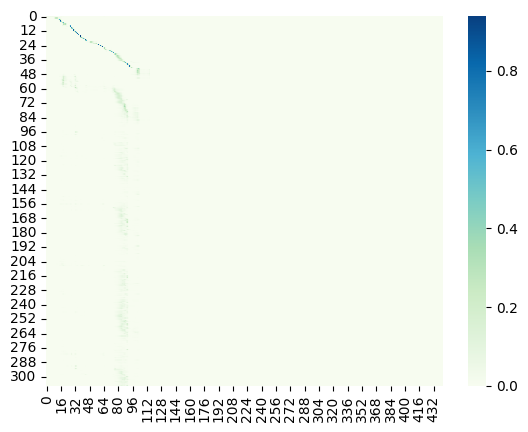

Saved best model

Epoch: 67/80


Val:   3%|▎         | 1/33 [00:02<01:30,  2.83s/it, dist=2.3267]

Ground Truth :  A LOUD LAUGH FOLLOWED AT CHUNKY'S EXPENSE
Prediction   :  A LOUD LAUGH FOLLOWED A CHUMPY'S EXPENSE


Val:   6%|▌         | 2/33 [00:04<01:14,  2.41s/it, dist=2.3900]

Ground Truth :  FOR THE GREAT BARN DOORS ARE THROWN WIDE OPEN AND MEN ARE BUSY THERE MENDING THE HARNESS UNDER THE SUPERINTENDENCE OF MISTER GOBY THE WHITTAW OTHERWISE SADDLER WHO ENTERTAINS THEM WITH THE LATEST TREDDLESTON GOSSIP
Prediction   :  FOR THE GREAT BARN DOORS ARE THROWN WIDE OPEN AND MEN ARE BUSY THERE MENDING THE HARNESS UNDER THE SUPERINTENDENCE OF MISTER GOBY THE WHITTAW OTHERWISE SADDLER WHO ENTERTAINS THEM WITH A LATEST TREDDLESTON GOSSIP


Val:   9%|▉         | 3/33 [00:07<01:11,  2.39s/it, dist=2.5178]

Ground Truth :  THE ZEAL OF CYRIL EXPOSED HIM TO THE PENALTIES OF THE JULIAN LAW BUT IN A FEEBLE GOVERNMENT AND A SUPERSTITIOUS AGE HE WAS SECURE OF IMPUNITY AND EVEN OF PRAISE
Prediction   :  THE ZEAL OF CURAL EXPOSED HIM TO THE PENALTIES OF THE JULIAN LAW BUT IN A FEEBLE GOVERNMENT AND A SUPERSTITIOUS AGE HE WAS SECURE OF IMPUNITY AND EVEN OF PRAISE


Val:  12%|█▏        | 4/33 [00:09<01:11,  2.47s/it, dist=2.4233]

Ground Truth :  THE PEOPLE MUST WAIT OUTSIDE FOR THERE IS NO ROOM FOR THEM IN THE PALACE
Prediction   :  THE PEOPLE MUST WE OUTSIDE FOR THERE IS NO ROOM FOR THEM IN THE PALACE


Val:  15%|█▌        | 5/33 [00:12<01:06,  2.39s/it, dist=2.3667]

Ground Truth :  WILSON AND OLBINETT JOINED THEIR COMPANIONS AND ALL UNITED TO DIG THROUGH THE WALL JOHN WITH HIS DAGGER THE OTHERS WITH STONES TAKEN FROM THE GROUND OR WITH THEIR NAILS WHILE MULRADY STRETCHED ALONG THE GROUND WATCHED THE NATIVE GUARD THROUGH A CREVICE OF THE MATTING
Prediction   :  WILSON AND OLD BANETTE JOINED THEIR COMPANIONS AND ALL UNITED TO DIG THROUGH THE WALL JOHN WITH HIS DAGGER THE OTHERS WITH STONES TAKEN FROM THE GROUND OR WITH THEIR NAILS WHILE MORE RADIE STRETCHED ALONG THE GROUND WATCHED THE NATIVE GUARD THROUGH A CREVICE OF THE MATTING


Val:  18%|█▊        | 6/33 [00:14<01:03,  2.37s/it, dist=2.4244]

Ground Truth :  I MUST NOT CONCLUDE WITHOUT EXPRESSING MY MOST SINCERE THANKS TO MY CRITICS AND TO THE PUBLIC FOR THE LENIENCY AND CONSIDERATION WITH WHICH THEY HAVE TREATED MY ADVENTURES
Prediction   :  I MUST NOT CONCLUDE WITHOUT EXPRESSING MY MOST SINCERE THANKS TO MY CRITICS AND TO THE PUBLIC FOR THE LENIENCY AND CONSIDERATION WITH WHICH THEY HAVE TREATED MY ADVENTURES


Val:  21%|██        | 7/33 [00:16<01:00,  2.34s/it, dist=2.4171]

Ground Truth :  I'LL TRY IF I KNOW ALL THE THINGS I USED TO KNOW
Prediction   :  I'LL TRY IF I KNEW ALL THE THINGS I USED TO KNOW


Val:  24%|██▍       | 8/33 [00:19<00:58,  2.33s/it, dist=2.5692]

Ground Truth :  HOLMES HELD OUT A SMALL CHIP WITH THE LETTERS N N AND A SPACE OF CLEAR WOOD AFTER THEM YOU SEE
Prediction   :  HOLMES HELD OUT A SMALL CHIP WITH THE LETTERS AND AND A SPACE OF CLEAR WOOD AFTER THEM YOU SEE


Val:  27%|██▋       | 9/33 [00:21<00:58,  2.43s/it, dist=2.7481]

Ground Truth :  IF THE WINE CHANGE INTO VINEGAR AND THE HOST CRUMBLE INTO CORRUPTION AFTER THEY HAVE BEEN CONSECRATED IS JESUS CHRIST STILL PRESENT UNDER THEIR SPECIES AS GOD AND AS MAN
Prediction   :  IF THE WINE CHANGE INTO VINEGAR AND THE HOST CRUMBLE INTO CORRUPTION AFTER THEY HAVE BEEN CONSECRATED IS JESUS CHRIST STILL PRESENT UNDER THEIR SPECIES AS GOD AND AS MAN


Val:  30%|███       | 10/33 [00:24<00:55,  2.39s/it, dist=2.7307]

Ground Truth :  AMONG US ALL MEN WERE CREATED SONS OF GOD AND STOOD ERECT AS CONSCIOUS OF THEIR DIVINITY
Prediction   :  AMONG A SOLEMN WERE CREATED SONS OF GOD AND STOOD IT RECKON'S CONSCIOUS OF THEIR DIVINITY


Val:  33%|███▎      | 11/33 [00:26<00:53,  2.44s/it, dist=2.7909]

Ground Truth :  SPINNING INDEED
Prediction   :  SPINNING INDEED


Val:  36%|███▋      | 12/33 [00:28<00:50,  2.40s/it, dist=2.7767]

Ground Truth :  HE DECIDED TO WRITE HER CARE OF THE WEST SIDE POST OFFICE AND ASK FOR AN EXPLANATION AS WELL AS TO HAVE HER MEET HIM
Prediction   :  HE DECIDED TO WRITE HER CARE OF THE WEST SIDE POST OFFICE AND ASKED FOR AN EXPLANATION AS WELL AS TO HAVE HER MEET HIM


Val:  39%|███▉      | 13/33 [00:31<00:47,  2.38s/it, dist=2.7969]

Ground Truth :  THE GREAT WILDS OF OUR COUNTRY ONCE HELD TO BE BOUNDLESS AND INEXHAUSTIBLE ARE BEING RAPIDLY INVADED AND OVERRUN IN EVERY DIRECTION AND EVERYTHING DESTRUCTIBLE IN THEM IS BEING DESTROYED
Prediction   :  THE GREAT WILDS OF OUR COUNTRY ONCE HELD TO BE BOUNDLESS AND INEXHAUSTIBLE ARE BEING RAPIDLY INVADED AND OVERRUN IN EVERY DIRECTION AND EVERYTHING DESTRUCTIBLE IN THEM IS BEING DESTROYED


Val:  42%|████▏     | 14/33 [00:33<00:45,  2.41s/it, dist=2.7514]

Ground Truth :  THEY PICKED THEIR WAY THROUGH THE WRECKAGE AND EMERGED ON A SCENE OF FRIGHTFUL DESTRUCTION
Prediction   :  THEY PICKED THEIR WAY THROUGH THE WRECKAGE AND EMERGED ON A SCENE OF FRIGHTFUL DESTRUCTION


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.42s/it, dist=2.8031]

Ground Truth :  NOT ONLY THIS BUT ON THE TABLE I FOUND A SMALL BALL OF BLACK DOUGH OR CLAY WITH SPECKS OF SOMETHING WHICH LOOKS LIKE SAWDUST IN IT
Prediction   :  NOT ONLY THIS BUT ON THE TABLE I FOUND A SMALL BALL OF BLACK DOOR OR CLAY WITH SPECKS OF SOMETHING WHICH LOOKS LIKE SAWDEST IN IT


Val:  48%|████▊     | 16/33 [00:38<00:41,  2.42s/it, dist=2.9062]

Ground Truth :  MISSUS GRIFFIN HOWEVER EXPRESSED THE NEED FOR A LITTLE MORE LIGHT
Prediction   :  MISSUS GRIFFIN HOWEVER EXPRESSED THE NEED FOR A LITTLE MORE LIGHT


Val:  52%|█████▏    | 17/33 [00:40<00:38,  2.39s/it, dist=2.8616]

Ground Truth :  ALL MY DANGER AND SUFFERINGS WERE NEEDED TO STRIKE A SPARK OF HUMAN FEELING OUT OF HIM BUT NOW THAT I AM WELL HIS NATURE HAS RESUMED ITS SWAY
Prediction   :  ALL MY DANGER AND SUFFERINGS WERE NEEDED TO STRIKE A SPARK OF HUMAN FEELING OUT OF HIM BUT NOW THAT I AM WELL HIS NATURE HAS RESUMED ITS SWAY


Val:  55%|█████▍    | 18/33 [00:43<00:37,  2.47s/it, dist=2.9030]

Ground Truth :  AY ME
Prediction   :  I ME


Val:  58%|█████▊    | 19/33 [00:45<00:34,  2.45s/it, dist=2.9067]

Ground Truth :  I'LL LOOK IN THE GREAT BOOK FIRST
Prediction   :  I'LL LOOK IN THE GREAT BOOK FIRST


Val:  61%|██████    | 20/33 [00:48<00:31,  2.42s/it, dist=2.8647]

Ground Truth :  DON QUIXOTE DID SO AND ASKED HIM WHAT HAD HAPPENED TO HIM AND WHAT HE WAS AFRAID OF
Prediction   :  DON QUIXOTE DID SO AND ASKED HIM WHAT HAD HAPPENED TO HIM AND WHAT HE WAS AFRAID OF


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.37s/it, dist=2.9413]

Ground Truth :  NOW NOW HE SAID WALKING THERE THERE AND THERE WAS A CERTAIN SWEDISH ACCENT NOTICEABLE IN HIS VOICE
Prediction   :  NOW NOW HE SAID WALKING THERE THERE AND THERE WAS A CERTAIN SWEDISH ACCENT NOTICEABLE IN HIS VOICE


Val:  67%|██████▋   | 22/33 [00:52<00:25,  2.35s/it, dist=2.9373]

Ground Truth :  THE TRIBUTE WAS AT THIS PERIOD ENORMOUS FIFTEEN THOUSAND HEAD OF CATTLE ANNUALLY
Prediction   :  THE TRIBUTE WAS AT THIS PERIOD ENORMOUS FIFTEEN THOUSAND HEAD OF CATTLE ANNUALLY


Val:  70%|██████▉   | 23/33 [00:55<00:24,  2.41s/it, dist=2.9380]

Ground Truth :  IF SHE COULD ONLY SEE PHRONSIE FOR JUST ONE MOMENT
Prediction   :  IF SHE COULD ONLY SEE PHRONSIE FOR JUST ONE MOMENT


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.38s/it, dist=2.9178]

Ground Truth :  BUT THE PROPRIETOR APPEARED ALREADY TO HAVE RELINQUISHED AS HOPELESS THE EFFORT TO PERPETUATE ON THIS SIDE OF THE ATLANTIC IN A HARD SOIL AND AMID THE CLOSE STRUGGLE FOR SUBSISTENCE THE NATIVE ENGLISH TASTE FOR ORNAMENTAL GARDENING
Prediction   :  BUT THE PROPRIETOR APPEARED ALREADY TO HAVE RELINQUISHED AS HOPELESS THE EFFORT TO PERPETUATE ON THIS SIDE OF THE ATLANTIC IN A HARD SOIL AND AMID THE CLOSE STRUGGLE FOR SUBSISTENCE THE NATIVE ENGLISH TASTE FOR ORNAMENTAL GARDENING


Val:  76%|███████▌  | 25/33 [01:00<00:18,  2.35s/it, dist=2.8987]

Ground Truth :  IN EVERY ONE OF THE SEVENTY TWO PARISHES OF THE CITY OF VENICE THERE IS A LARGE PUBLIC HOUSE CALLED MAGAZZINO
Prediction   :  IN EVERY ONE OF THE SEVENTY TWO PARISHES OF THE CITY OF VENICE THERE IS A LARGE PUBLIC HOUSE CALLED MAGAZINA


Val:  79%|███████▉  | 26/33 [01:02<00:15,  2.27s/it, dist=2.8708]

Ground Truth :  THESE WERE BUT FEW AND FOR THE FIRST TIME SINCE HE OPENED HIS SHOP HE TOOK A COMMERCIAL SURVEY OF ITS VALUE
Prediction   :  THESE ARE BUT A FEW AND FOR THE FIRST TIMES IN THE OPEN THEIR SHOP HE TOOK A COMMERCIAL SERVANT OF ITS VALUE


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.36s/it, dist=2.8904]

Ground Truth :  THEREFORE I AM A MERE AGENT TO DIRECT THE LAWS WHICH ARE THE WILL OF THE PEOPLE AND AM ONLY A PUBLIC SERVANT OBLIGED CONSTANTLY TO GUARD THE WELFARE OF MY SUBJECTS
Prediction   :  THEREFORE I AM A MERE AGENT TO DIRECT THE LAWS WHICH ARE THE WILL OF THE PEOPLE AND I'M ONLY A PUBLIC SERVANT OBLIGED CONSTANTLY TO GUARD THE WELL THERE OF MY SUBJECTS


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.35s/it, dist=2.8883]

Ground Truth :  BUT WHEN IT CAME TO BE A QUESTION OF LIGHTING A SCATTERED SUBURB A GROUP OF DWELLINGS ON THE OUTSKIRTS A REMOTE COUNTRY RESIDENCE OR A FARM HOUSE THE ALTERNATING CURRENT IN ALL ELEMENTS SAVE ITS DANGER WAS AND IS IDEAL
Prediction   :  BUT WHEN IT CAME TO BE A QUESTION OF LIGHTING A SCATTERED SUBURB A GROUP OF DWELLINGS ON THE OUTSKIRTS A REMOTE COUNTRY RESIDENCE OR A FAR MOUSE THE ALTERNATING CURRENT IN ALL ELEMENTS SAVE ITS DANGER WAS AND HIS IDEAL


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.34s/it, dist=2.8885]

Ground Truth :  HE TELLS US THAT AT THIS FESTIVE SEASON OF THE YEAR WITH CHRISTMAS AND ROAST BEEF LOOMING BEFORE US SIMILES DRAWN FROM EATING AND ITS RESULTS OCCUR MOST READILY TO THE MIND
Prediction   :  HE TELLS US THAT AT THIS FESTIVE SEASON OF THE YEAR WITH CHRISTMAS AND ROAST BEIFF LOOMING BEFORE US SIMILARIES DRAWN FROM EATING AND ITS RESULTS OCCUR MOST READILY TO THE MIND


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.37s/it, dist=2.9060]

Ground Truth :  BUT TO HAVE A FRIEND AND TO BE TRUE UNDER ANY AND ALL TRIALS IS THE MARK OF A MAN
Prediction   :  BUT TO HAVE A FRIEND AND BETREW UNDER ANY IN ALL TRIALS AS THE MARK OF A MAN


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.35s/it, dist=2.9120]

Ground Truth :  HE DROPPED BACK HEAVILY INTO HIS CHAIR BY THE FIRE
Prediction   :  HE DROPPED BACK HEAVILY INTO HIS CHAIR BY THE FIRE


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.34s/it, dist=2.9175]

Ground Truth :  THE HON CHARLES SMITH MISS SARAH'S BROTHER WAS WALKING SWIFTLY UPTOWN FROM MISTER EASTERLY'S WALL STREET OFFICE AND HIS FACE WAS PALE
Prediction   :  THE HONOURABLE CHARLES SMITH MISS SARAH'S BROTHER WAS WALKING SWIFTLY UP TOWN FROM MISTER EASTERLY'S WALL STREET OFFICE AND HIS FACE WAS PALE


Val: 100%|██████████| 33/33 [01:17<00:00,  1.93s/it, dist=2.9344]

Ground Truth :  I COULD NOT LOVE THEE DEAR SO MUCH LOVED I NOT HONOR MORE
Prediction   :  I COULD NOT LOVE THEE VERY SO MUCH LOVE THY NOT ALL HER MORE


	Train Loss 0.0770	 Learning Rate 0.0001100
	Val Dist 2.9344	
	Teacher Forcing Ratio 1	


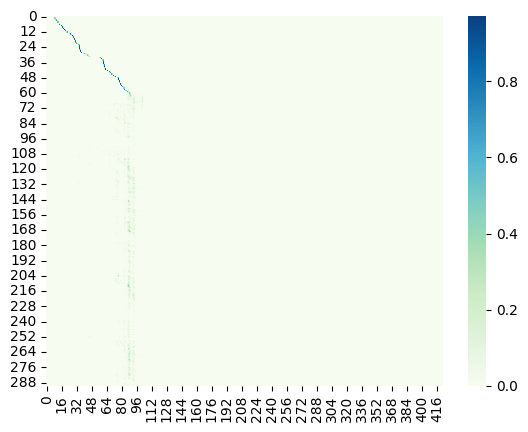

Saved best model

Epoch: 68/80


Val:   3%|▎         | 1/33 [00:02<01:31,  2.84s/it, dist=4.3800]

Ground Truth :  I ORDER YOU SIR NORTH CRIED INDIGNANT
Prediction   :  I ORDER YOU SERVE NORTH CRIED INDIGNANT


Val:   6%|▌         | 2/33 [00:05<01:16,  2.47s/it, dist=3.8033]

Ground Truth :  I EXPRESSED BY SIGNS MY ADMIRATION AND PLEASURE TO MY GUIDES AND THEY WERE GREATLY PLEASED
Prediction   :  I EXPRESSED BY SIGNS MY ADMIRATION AND PLEASURE TO MY GUIDES AND THEY WERE GREATLY PLEASED


Val:   9%|▉         | 3/33 [00:07<01:10,  2.36s/it, dist=3.4489]

Ground Truth :  P S THE CARDS ARE OUT FOR THE WEDDING
Prediction   :  PIERCE THE CARDS ARE OUT FOR THE WEDDING


Val:  12%|█▏        | 4/33 [00:09<01:07,  2.31s/it, dist=3.0933]

Ground Truth :  A COUNTER ATTACK WAS MADE UPON WOONGA AND HE WAS DRIVEN DEEP INTO THE WILDERNESS WITH GREAT LOSS
Prediction   :  A COUNTER ATTACK WAS MADE UPON WOUNDA AND HE WAS DRIVEN DEEP INTO THE WILDERNESS WITH GREAT LOSS


Val:  15%|█▌        | 5/33 [00:11<01:06,  2.36s/it, dist=3.0173]

Ground Truth :  TO SYNESIUS'S MOST CHARMING LETTERS AS WELL AS TO THOSE OF ISIDORE THE GOOD ABBOT OF PELUSIUM I BEG LEAVE TO REFER THOSE READERS WHO WISH FOR FURTHER INFORMATION ABOUT THE PRIVATE LIFE OF THE FIFTH CENTURY
Prediction   :  TWO SIGNESIUS'S MOST CHARMING LETTERS AS WELL AS TO THOSE OF ISADORE THE GOOD ABBOT OF PALUSIUM I BEG LEAVE TO REFER THOSE READERS WHO WISH FOR FURTHER INFORMATION ABOUT THE PRIVATE LIFE OF THE FIFTH CENTURY


Val:  18%|█▊        | 6/33 [00:14<01:04,  2.39s/it, dist=3.0067]

Ground Truth :  I DECLARED MYSELF QUITE WILLING FOR IT WAS NECESSARY TO BRAZEN IT OUT AFTER HAVING VENTURED AS FAR AS I HAD DONE
Prediction   :  I DECLARED MYSELF QUITE WILLING FOR IT WAS NECESSARY TO BRAZEN IT OUT AFTER HAVING VENTURED AS FAR AS I HAD DONE


Val:  21%|██        | 7/33 [00:16<01:03,  2.43s/it, dist=3.1057]

Ground Truth :  AND THE NEW BLOOD AT THE ERA OF THIS STORY WAS AT HAND
Prediction   :  AND THE NEW BLOOD AT THE ERA OF THIS STORY WAS AT HAND


Val:  24%|██▍       | 8/33 [00:19<00:59,  2.40s/it, dist=3.0825]

Ground Truth :  UNDER THE TUITION OF THE ABBOT SERAPION HE APPLIED HIMSELF TO ECCLESIASTICAL STUDIES WITH SUCH INDEFATIGABLE ARDOR THAT IN THE COURSE OF ONE SLEEPLESS NIGHT HE HAS PERUSED THE FOUR GOSPELS THE CATHOLIC EPISTLES AND THE EPISTLE TO THE ROMANS
Prediction   :  UNDER THE TUITION OF THE ABBOT SERAPION HE APPLIED HIMSELF TO ECCLESIASTICAL STUDIES WITH SUCH INDEFATIGABLE ARDOUR THAT IN THE COURSE OF ONE SLEEPLESS NIGHT HE HAS PERUSED THE FOUR GOSPELS THE CATHOLIC OPISIONS AND THE APISTLE TO THE ROMANS


Val:  27%|██▋       | 9/33 [00:21<00:55,  2.33s/it, dist=2.9963]

Ground Truth :  STRUGGLE WARFARE WAS THE CONDITION OF PRIVATE OWNERSHIP IT WAS FATAL
Prediction   :  STRUGGLE WARFARE WAS THE CONDITION OF PRIVATE OWNERSHIP IT WAS FATAL


Val:  30%|███       | 10/33 [00:23<00:54,  2.36s/it, dist=3.0540]

Ground Truth :  IN EVERY ONE OF THE SEVENTY TWO PARISHES OF THE CITY OF VENICE THERE IS A LARGE PUBLIC HOUSE CALLED MAGAZZINO
Prediction   :  IN EVERY ONE OF THE SEVENTY TWO PARISHES OF THE CITY OF VENICE THERE IS A LARGE PUBLIC HOUSE CALLED MAGAZZINO


Val:  33%|███▎      | 11/33 [00:26<00:50,  2.29s/it, dist=3.0182]

Ground Truth :  WHAT DOES HE CARE CARE
Prediction   :  WHAT IS HE CARE CARE


Val:  36%|███▋      | 12/33 [00:28<00:49,  2.35s/it, dist=3.0083]

Ground Truth :  YOU WANT ME TO SAY IT SHE WHISPERED
Prediction   :  YOU WANT ME TO SAY IT SHE WHISPERED


Val:  39%|███▉      | 13/33 [00:31<00:48,  2.42s/it, dist=3.0277]

Ground Truth :  AT THE SAME TIME EVERY AVENUE OF THE THRONE WAS ASSAULTED WITH GOLD
Prediction   :  AT THE SAME TIME EVERY AVENUE OF THE THRONE WAS ASSAULTED WITH GOLD


Val:  42%|████▏     | 14/33 [00:33<00:46,  2.43s/it, dist=3.0310]

Ground Truth :  UNDER THE SAME QUIET MOONLIGHT AND ONLY SIX HUNDRED YARDS AWAY FROM US ALSO LAY THE VICTORIOUS REBEL ARMY
Prediction   :  UNDER THE SAME QUIET MOONLIGHT AND ONLY SIX HUNDRED YARDS AWAY FROM US ALSO LAY THE VICTORIOUS RUBBLE ARMY


Val:  45%|████▌     | 15/33 [00:35<00:43,  2.40s/it, dist=2.9996]

Ground Truth :  HOW EVERY PULSE DID BEAT AND LEAP AND HOW EVERY HEART DID THROB WITH EMOTIONS OF JOY WHICH SEEMED NEARLY AKIN TO HEAVEN WHEN WE RECEIVED THE GLAD INTELLIGENCE OF OUR ONWARD MARCH TOWARD THE LAND OF PROMISE AND OF OUR LOVED ONES
Prediction   :  HOWEVERY PULSE TO BEAT AND LEAP AND HOWEVER HEART TO THROB WITH EMOTIONS OF JOY WHICH SEEMED NEARLY A KIND HEAVEN WHEN WE RECEIVED THE GLAD INTELLIGENCE OF OUR OWN WORD MARCH TOWARD THE LAND OF PROMISE AND OF OUR LOVED ONES


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.40s/it, dist=3.0096]

Ground Truth :  THE SLANT OF THE MOON PRESAGED EVIL FOR THE KING OF VENDHYA THE STARS ARE IN TURMOIL THE SERPENT IN THE HOUSE OF THE ELEPHANT
Prediction   :  THE SLANT OF THE MOON PRESAGED EVIL FOR THE KING OF VENDIA THE STARS ARE IN TURMOIL THE SERPENT IN THE HOUSE OF THE ELEPHANT


Val:  52%|█████▏    | 17/33 [00:40<00:39,  2.45s/it, dist=3.0722]

Ground Truth :  IN THE ACT OF RECOVERING HIMSELF HE HEARD THE NECK OF HIS INSTRUMENT PART FROM THE BODY WITH A TEARING DISCORDANT CRY LIKE THE SOUND OF THE RUIN OF A LIVING WORLD
Prediction   :  IN THE ACTIVE OR COVERING HIMSELF HE HEARD THE NECK OF HIS INSTRUMENT PART FROM THE BODY WITH A TEARING DISCORDANT CRY LIKE A SOUND OF THE RUIN OF A LIVING WORLD


Val:  55%|█████▍    | 18/33 [00:43<00:36,  2.42s/it, dist=3.0700]

Ground Truth :  THAT'S MACKLEWAIN'S BUSINESS
Prediction   :  THAT'S MANICAL WAYMEN'S BUSINESS


Val:  58%|█████▊    | 19/33 [00:45<00:33,  2.41s/it, dist=3.1337]

Ground Truth :  IT WAS WRITTEN IN THE UPPER RANGITATA DISTRICT OF THE CANTERBURY PROVINCE AS IT THEN WAS OF NEW ZEALAND AND APPEARED AT CHRISTCHURCH IN THE PRESS NEWSPAPER JUNE THIRTEENTH EIGHTEEN SIXTY THREE
Prediction   :  IT WAS WRITTEN IN THE UPPER RANGETS OUT A DISTRICT OF THE CANNOBERY PROVINCE AS IT THEN WAS OF NEW ZEALAND AND APPEARED AT CHRIST CHURCH IN THE PRESS NEWSPAPER JUNE THIRTEENTH EIGHTEEN SIXTY THREE


Val:  61%|██████    | 20/33 [00:47<00:30,  2.33s/it, dist=3.0953]

Ground Truth :  AT SOME UNCERTAIN PERIOD IN THE DEPTHS OF NIGHT AND AS IT WERE THROUGH THE THIN VEIL OF A DREAM SHE WAS CONSCIOUS OF A FOOTSTEP MOUNTING THE STAIRS HEAVILY BUT NOT WITH FORCE AND DECISION
Prediction   :  AT SOME UNCERTAIN PERIOD IN THE DEPTHS OF NIGHT AND AS IT WERE THROUGH THE THIN VEIL OF A DREAM SHE WAS CONSCIOUS OF A FOOTSTEP MOUNTING THE STAIRS HEAVILY BUT NOT WITH FORCE AND DECISION


Val:  64%|██████▎   | 21/33 [00:49<00:27,  2.29s/it, dist=3.0540]

Ground Truth :  THE WEEK FOLLOWING CHRISTMAS BROUGHT IN A THAW AND BY NEW YEAR'S DAY ALL THE WORLD ABOUT US WAS A BROTH OF GRAY SLUSH AND THE GUTTERED SLOPE BETWEEN THE WINDMILL AND THE BARN WAS RUNNING BLACK WATER
Prediction   :  THE WEEK FOLLOWING CHRISTMAS BROUGHT IN A THAW AND BY NEW YEARS DAY ALL THE WORLD ABOUT US WAS A BROTH OF GRAY SLUSH AND THE GUTTERED SLOPE BETWEEN THE WINDMILL AND THE BARN WAS RUNNING BLACK WATER


Val:  67%|██████▋   | 22/33 [00:52<00:24,  2.27s/it, dist=3.0118]

Ground Truth :  THAT BOY HEARS TOO MUCH OF WHAT IS TALKED ABOUT HERE
Prediction   :  THAT BOY HERE'S TOO MUCH WHAT IS TALKED ABOUT HERE


Val:  70%|██████▉   | 23/33 [00:54<00:22,  2.25s/it, dist=2.9667]

Ground Truth :  IT WAS SIMPLE ENOUGH SIR IF YOU ONLY HAD KNOWN BUT WITH ALL YOUR CLEVERNESS IT WAS IMPOSSIBLE THAT YOU COULD KNOW
Prediction   :  IT WAS SIMPLE ENOUGH SIR IF YOU ONLY HAD KNOWN BUT WITH ALL YOUR CLEVERNESS IT WAS IMPOSSIBLE THAT YOU COULD KNOW


Val:  73%|███████▎  | 24/33 [00:56<00:20,  2.31s/it, dist=2.9608]

Ground Truth :  MODE BOIL THE RICE IN WATER UNTIL IT IS QUITE TENDER POUR OFF THE WATER AND PUT THE RICE BEFORE IT IS COLD TO THE FLOUR
Prediction   :  MODE BOIL THE RICE AND WATER UNTIL IT IS QUITE TENDER POOR OFF THE WATER AND PUT THE RICE BEFORE IT IS COLD TO THE FLOUR


Val:  76%|███████▌  | 25/33 [00:59<00:18,  2.32s/it, dist=2.9581]

Ground Truth :  HER THOUGHTS RAN ON JEM'S MANNER AND WORDS NOT BUT WHAT SHE HAD KNOWN THE TALE THEY TOLD FOR MANY A DAY BUT STILL SHE WISHED HE HAD NOT PUT IT SO PLAINLY
Prediction   :  HER THOUGHT THREN ON JIM'S MANNER AND WORDS NOT BUT WHAT SHE HAD KNOWN THE TAIL THEY TOLD FOR MANY A DAY BUT STILL SHE WISHED HE HAD NOT PUT IT SO PLAINLY


Val:  79%|███████▉  | 26/33 [01:01<00:16,  2.31s/it, dist=2.9421]

Ground Truth :  OH WHY DID I ENGAGE THAT GOVERNESS
Prediction   :  OH WHY DID I ENGAGE THAT GOVERNESS


Val:  82%|████████▏ | 27/33 [01:03<00:14,  2.35s/it, dist=2.9331]

Ground Truth :  SO I RETURN REBUK'D TO MY CONTENT AND GAIN BY ILL THRICE MORE THAN I HAVE SPENT
Prediction   :  SO I RETURN REBUKED TO MY CONTENT AND GAINED BY ILL THRICE MORE THAN I HAVE SPENT


Val:  85%|████████▍ | 28/33 [01:06<00:11,  2.39s/it, dist=2.9298]

Ground Truth :  PROBABLY BUT FORTUNATELY NOTHING FOR MY OWN TEETH PERHAPS IT BETRAYS THE SPECIES TO WHICH I BELONG BUT NOT TO MYSELF AS IS SUFFICIENTLY AGREEABLE TO ME BUT WHAT HAS HAPPENED TO YOU
Prediction   :  PROBABLY BUT FORTUNATELY NOTHING FOR MY OWN TEETH PERHAPS IT BETRAYS THE SPECIES TO WHICH I BELONG BUT NOT TO MYSELF AS IT IS SUFFICIENTLY AGREEABLE TO ME BUT WHAT HAS HAPPENED TO YOU


Val:  88%|████████▊ | 29/33 [01:08<00:09,  2.41s/it, dist=2.9179]

Ground Truth :  THEY WERE WITHIN A FEW MILES OF THEIR VILLAGE NOW
Prediction   :  THEY WERE WITHIN A FEW MILES OF THEIR VILLAGE NOW


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.46s/it, dist=2.9398]

Ground Truth :  THAT INVITATION DECIDED HER
Prediction   :  THAT INVITATION DECIDED HER


Val:  94%|█████████▍| 31/33 [01:13<00:04,  2.47s/it, dist=2.9303]

Ground Truth :  IF I SAY TO AN AMERICAN THAT THE COUNTRY HE LIVES IN IS A FINE ONE AY HE REPLIES THERE IS NOT ITS FELLOW IN THE WORLD
Prediction   :  IF I SAY TO AN AMERICAN THAT THE COUNTRY HE LIVES IN IS A FINE ONE I HE REPLIES THERE IS NOT ITS FELLOW IN THE WORLD


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.49s/it, dist=2.9385]

Ground Truth :  THEY PICKED THEIR WAY THROUGH THE WRECKAGE AND EMERGED ON A SCENE OF FRIGHTFUL DESTRUCTION
Prediction   :  THEY PICKED THEIR WAY THROUGH THE WRECKAGE AND EMERGED ON A SCENE OF FRIGHTFUL DESTRUCTION


Val: 100%|██████████| 33/33 [01:17<00:00,  2.07s/it, dist=2.9268]

Ground Truth :  THEIR CHURCHES HAVE DISAPPEARED THEIR BOOKS ARE OBLITERATED THEIR OBSCURE FREEDOM MIGHT ALLOW A LATITUDE OF FAITH AND THE SOFTNESS OF THEIR INFANT CREED WOULD BE VARIOUSLY MOULDED BY THE ZEAL OR PRUDENCE OF THREE HUNDRED YEARS
Prediction   :  THEIR CHURCHES HAVE DISAPPEARED THEIR BOOKS ARE OBLITERATED THEIR OBSCURE FREEDOM MIGHT ALLOW A LATITUDE OF FAITH AND THE SOFTNESS OF THEIR INFANT CREED WOULD BE VARIOUSLY MOULDED BY THE ZEAL OR PRUDENCE OF THREE HUNDRED YEARS


	Train Loss 0.0733	 Learning Rate 0.0000964
	Val Dist 2.9268	
	Teacher Forcing Ratio 1	


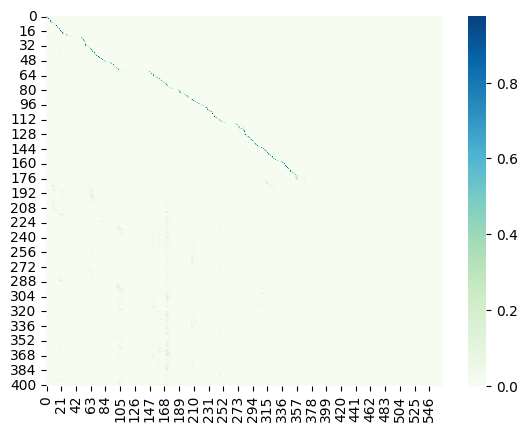

Saved best model

Epoch: 69/80


Val:   3%|▎         | 1/33 [00:03<01:36,  3.01s/it, dist=2.7267]

Ground Truth :  I HOPE MISS MILNER YOU PASS THIS EVENING AT HOME
Prediction   :  I HOPE MISS MILNER YOU PASS THIS EVENING AT HOME


Val:   6%|▌         | 2/33 [00:05<01:18,  2.55s/it, dist=2.9867]

Ground Truth :  PEARL SEEING THE ROSE BUSHES BEGAN TO CRY FOR A RED ROSE AND WOULD NOT BE PACIFIED
Prediction   :  PEARL SEEING THE ROSE BUSHES BEGAN TO CRY FOR A RED ROSE AND WOULD NOT BE PASSIFIED


Val:   9%|▉         | 3/33 [00:07<01:15,  2.52s/it, dist=3.1911]

Ground Truth :  AND THE CAPTAIN OF COURSE CONCLUDED AFTER HAVING BEEN INTRODUCED TO KITTY THAT MISSUS NORMAN WAS A WIDOW
Prediction   :  AND THE CAPTAIN OF COURSE CONCLUDED AFTER HAVING BEEN INTRODUCED TO KITTY THAT MISSUS NORMAN WAS A WIDOW


Val:  12%|█▏        | 4/33 [00:10<01:13,  2.52s/it, dist=3.2667]

Ground Truth :  NO THANK YOU I'LL JUST LOOK AT THE WHELPS AND LEAVE A MESSAGE ABOUT THEM WITH YOUR SHEPHERD
Prediction   :  NO THANK YOU I'LL JUST LOOK AT THE WELPS AND LEAVE A MESSAGE ABOUT THEM WITH YOUR SHEPHERD


Val:  15%|█▌        | 5/33 [00:12<01:07,  2.40s/it, dist=3.0787]

Ground Truth :  I HAVE ONE GREAT PRIVILEGE
Prediction   :  I HAVE ONE GREAT PRIVILEGE


Val:  18%|█▊        | 6/33 [00:14<01:03,  2.36s/it, dist=3.0622]

Ground Truth :  ASPLENIUM EPILOBIUM HEUCHERA HAZEL DOGWOOD AND ALDER MAKE A LUXURIOUS FRINGE AND SETTING AND THE FORESTS OF DOUGLAS SPRUCE ALONG THE BANKS ARE THE FINEST I HAVE EVER SEEN IN THE SIERRA
Prediction   :  ASPLENIUM EPILOBIUM WHO CHERA HAZEL DOGWOOD AND ALDER MAKE A LUXURIOUS FRINGE AND SETTING AND THE FORESTS OF DUGLESS SPRUCE ALONG THE BANKS ARE THE FINEST I HAVE EVER SEEN IN THE SIERRA


Val:  21%|██        | 7/33 [00:17<01:01,  2.38s/it, dist=2.9733]

Ground Truth :  THE DEPARTING LADIES WHO HAD SAID THEY WOULD STAY DIDN'T OF COURSE THANK HEAVEN STAY THEY DEPARTED IN CONSEQUENCE OF ARRANGEMENTS MADE IN A RAGE OF CURIOSITY AS THEY PROFESSED PRODUCED BY THE TOUCHES WITH WHICH HE HAD ALREADY WORKED US UP
Prediction   :  THE DEPARTING LADIES WHO HAD SAID THEY WOULD STAY DIDN'T OF COURSE THANK HEAVEN STAY THEY DEPARTED IN CONSEQUENCE OF ARRANGEMENTS MADE IN A RAGE OF CURIOSITY AS THEY PROFESSED PRODUCED BY THE TOUCHES WITH WHICH HE HAD ALREADY WORKED US UP


Val:  24%|██▍       | 8/33 [00:19<00:59,  2.40s/it, dist=2.9383]

Ground Truth :  IT WHIPPED HIS BLOOD AS IT BLEW DOWN FROM THE SLOPES AND CRESTS
Prediction   :  IT WIPPED HIS BLOOD AS IT BLEW DOWN FROM THE SLOPES AND CRESTS


Val:  27%|██▋       | 9/33 [00:22<00:57,  2.42s/it, dist=2.9452]

Ground Truth :  YOU'VE GOT A BIRTHDAY PRESENT THIS TIME JIM AND NO MISTAKE
Prediction   :  YOU'VE GOT A BIRTHDAY PRESENT THIS TIME JIM AND NO MISTAKE


Val:  30%|███       | 10/33 [00:24<00:55,  2.42s/it, dist=2.9213]

Ground Truth :  BUT TREVELYAN WAS OF A DIFFERENT OPINION AND HE WAS DISGUSTED AND REVOLTED MOST UNREASONABLY BY THE APPEARANCE OF HIS MINISTER'S DOMESTIC ARRANGEMENTS
Prediction   :  BUT TREVELYAN WAS OF A DIFFERENT OPINION AND HE WAS DISGUSTED AND REVOLTED MOST UNREASONABLY BY THE APPEARANCE OF HIS MINISTER'S DOMESTIC ARRANGEMENTS


Val:  33%|███▎      | 11/33 [00:26<00:52,  2.39s/it, dist=2.8442]

Ground Truth :  I HAD THE PLEASURE OF MEETING HIM IN SOCIETY
Prediction   :  I HAD THE PLEASURE OF MEETING HIM IN SOCIETY


Val:  36%|███▋      | 12/33 [00:28<00:48,  2.29s/it, dist=2.8567]

Ground Truth :  HERE IT COMES THERE IT GLIDES NOW IT IS UP THE RAGGED STUMP OF THE MAST THENCE IT LIGHTLY LEAPS ON THE PROVISION BAG DESCENDS WITH A LIGHT BOUND AND JUST SKIMS THE POWDER MAGAZINE HORRIBLE
Prediction   :  HERE IT COMES THERE IT GLIDES NOW IT IS UP THE RAGGED STUMP OF THE MAST THENCE IT LIGHTLY LEAPS ON THE PROVISION BAG DESCENDS WITH A LIGHT BOUND AND JUST SKIMS THE POWDER MAGAZINE HORRIBLE


Val:  39%|███▉      | 13/33 [00:30<00:44,  2.24s/it, dist=2.8749]

Ground Truth :  BUT DEUCALION AND PYRRHA WERE VERY SAD FOR THEY KNEW THAT THEY WERE THE ONLY PERSONS WHO WERE LEFT ALIVE IN ALL THE LAND
Prediction   :  BUT TO KALIAN AND PARA WERE VERY SAD FOR THEY KNEW THAT THEY WERE THE ONLY PERSONS WHO WERE LEFT ALIVE IN ALL THE LAND


Val:  42%|████▏     | 14/33 [00:33<00:43,  2.30s/it, dist=2.8662]

Ground Truth :  I WILL TROUBLE YOU NO FURTHER
Prediction   :  I WILL TROUBLE YOU NO FURTHER


Val:  45%|████▌     | 15/33 [00:35<00:41,  2.33s/it, dist=2.9120]

Ground Truth :  IN MOMENTS OF DEEP FEELING ALIKE SUDDEN BURSTS OF PROSPERITY AS IN DARKER HOURS MAN MUST BE ALONE
Prediction   :  IN MOMENTS OF DEEP FEELING ALIKE SUDDEN BURSTS OF PROSPERITY AS IN DARKER HOURS MAN MUST BE ALONE


Val:  48%|████▊     | 16/33 [00:38<00:39,  2.34s/it, dist=2.9075]

Ground Truth :  ANYHOW WE WANT TO HELP GOT A JOB FOR US
Prediction   :  ANYHOW WE WANT TO HELP GOT A JOB FOR US


Val:  52%|█████▏    | 17/33 [00:40<00:37,  2.35s/it, dist=2.8765]

Ground Truth :  WHAT DOES HE WANT
Prediction   :  WHAT DOES HE WANT


Val:  55%|█████▍    | 18/33 [00:43<00:36,  2.41s/it, dist=2.8515]

Ground Truth :  SHE FELT THAT WHICH SHE HAD NEVER FELT BEFORE A SENSATION OF EXPANSION
Prediction   :  SHE FELT THAT WHICH SHE HAD NEVER FELT BEFORE A SENSATION OF EXPANSION


Val:  58%|█████▊    | 19/33 [00:45<00:33,  2.41s/it, dist=2.8702]

Ground Truth :  TRUE AGREED KALIKO
Prediction   :  TRUE AGREED KALIKO


Val:  61%|██████    | 20/33 [00:47<00:31,  2.41s/it, dist=2.8507]

Ground Truth :  AND THEN HE TALKED OF HER MOTHER AND HE MADE HER PRAY
Prediction   :  AND THEN HE TALKED OF HER MOTHER AND HE MADE HER PRAY


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.40s/it, dist=2.8425]

Ground Truth :  THE HELPLESS MANAGER PACED THE FLOOR AND GRIMLY ENDURED THE GLOOM OF DEFEAT
Prediction   :  THE HELPLESS MANAGER PACED THE FLOOR AND GRIMLY ENDURED THE GLIMME OF DEFEAT


Val:  67%|██████▋   | 22/33 [00:52<00:26,  2.39s/it, dist=2.8224]

Ground Truth :  I TURN UP THE EARTH BY WAY OF PASTIME
Prediction   :  I TURN UP THE EARTH BY A WAY OF PASTIME


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.39s/it, dist=2.8368]

Ground Truth :  HER THOUGHTS RAN ON JEM'S MANNER AND WORDS NOT BUT WHAT SHE HAD KNOWN THE TALE THEY TOLD FOR MANY A DAY BUT STILL SHE WISHED HE HAD NOT PUT IT SO PLAINLY
Prediction   :  HER THOUGHT THREN ON JEM'S MANNER AND WORDS NOT BUT WHAT SHE HAD KNOWN THE TAIL THEY TOLD FOR MANY A DAY BUT STILL SHE WISHED HE HAD NOT PUT IT SO PLAINLY


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.34s/it, dist=2.8317]

Ground Truth :  NIGHT AFTER NIGHT HIS SLEEP HAD BEEN DISTURBED BY FEARS FOR HER WHEN ABROAD MORNING AFTER MORNING IT HAD BEEN BROKEN BY THE CLAMOUR OF HER RETURN
Prediction   :  NIGHT AFTER NIGHT HIS SLEEP HAD BEEN DISTURBED BY FEARS FOR HER WHEN ABROAD MORNING AFTER MORNING IT HAD BEEN BROKEN BY THE CLAMOUR OF HER RETURN


Val:  76%|███████▌  | 25/33 [00:59<00:18,  2.37s/it, dist=2.8264]

Ground Truth :  I PRAY FOR YOU BUT THAT'S NOT THE SAME AS IF YOU PRAYED YOURSELF
Prediction   :  I PRAY FOR YOU BUT THAT'S NOT THE SAME AS IF YOU PRAYED YOURSELF


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.35s/it, dist=2.8159]

Ground Truth :  IF SHE COULD ONLY SEE PHRONSIE FOR JUST ONE MOMENT
Prediction   :  IF SHE COULD ONLY SEE PHRONSIE FOR JUST ONE MOMENT


Val:  82%|████████▏ | 27/33 [01:04<00:13,  2.30s/it, dist=2.8188]

Ground Truth :  THERE IS A WONDERFUL INSIGHT IN HEAVEN'S BROAD AND SIMPLE SUNSHINE
Prediction   :  THERE IS A WONDERFUL INSIGHT IN HEAVEN'S BROAD AND SIMPLE SUNSHINE


Val:  85%|████████▍ | 28/33 [01:06<00:11,  2.32s/it, dist=2.8117]

Ground Truth :  THERE THEY STROVE TO BREAK THE SILVER CORD OF LIFE AND THRUST MY SOUL INTO THE BODY OF A FOUL NIGHT WEIRD THEIR SORCERY SUMMONED UP FROM HELL AH
Prediction   :  THERE THEY STROVE TO BREAK THE SILVER COURT OF LIFE AND THRUST MY SOUL INTO THE BODY OF A FOUL NIGHT WEIRD THEIR SOURCERY SUMMONED UP FROM HELL AH


Val:  88%|████████▊ | 29/33 [01:08<00:09,  2.32s/it, dist=2.8179]

Ground Truth :  LINE OF BATTLE WAS FORMED ON THE NORTH BANK OF STONE'S RIVER ON THE YANKEE SIDE
Prediction   :  LYING A BATTLE WAS FORMED ON THE NORTH BANK OF STONES RIVER ON THE YANKEY SIDE


Val:  91%|█████████ | 30/33 [01:11<00:06,  2.31s/it, dist=2.8387]

Ground Truth :  HE HAD FOR HIS OWN TOWN RESIDENCE A BIG HOUSE FILLED WITH THE SPOILS OF TRAVEL AND THE TROPHIES OF THE CHASE BUT IT WAS TO HIS COUNTRY HOME AN OLD FAMILY PLACE IN ESSEX THAT HE WISHED HER IMMEDIATELY TO PROCEED
Prediction   :  HE HAD FOR HIS OWN TOWN RESIDENCE A BIG HOUSE FILLED WITH THE SPOILS OF TRAVEL AND THE TROPHIES OF THE CHASE BUT IT WAS TO HIS COUNTRY HOME AN OLD FAMILY PLACE IN ESSEX THAT HE WISHED HER IMMEDIATELY TO PROCEED


Val:  94%|█████████▍| 31/33 [01:13<00:04,  2.31s/it, dist=2.8353]

Ground Truth :  WHEN SHE HAD THAT BAD ILLNESS AND I WAS ONLY ELEVEN YEARS OLD SHE USED TO SAY YOU'LL HAVE A FRIEND ON EARTH IN YOUR AUNT RACHEL IF I'M TAKEN FROM YOU FOR SHE HAS A KIND HEART AND I'M SURE I'VE FOUND IT SO
Prediction   :  WHEN SHE HAD THAT BAD ILLNESS AND I WAS ONLY ELEVEN YEARS OLD SHE USED TO SAY YOU'LL HAVE A FRIEND ON EARTH IN YOUR AUNT RACHEL IF I'M TAKEN FROM YOU FOR SHE HAS A KIND HEART AND I'M SURE I'VE FOUND IT SO


Val:  97%|█████████▋| 32/33 [01:15<00:02,  2.31s/it, dist=2.8348]

Ground Truth :  HE GAZED UPON A WORLD FULL OF RESPONSIBILITIES AND PERILS
Prediction   :  HE GAZED UPON A WORLD FULL OF RESPONSIBILITIES AND PERILS


Ground Truth :  MISTER MORTON THEN MADE A CAREFUL MEMORANDUM OF THE VARIOUS PARTICULARS OF WAVERLEY'S INTERVIEW WITH DONALD BEAN LEAN AND THE OTHER CIRCUMSTANCES WHICH HE HAD COMMUNICATED
Prediction   :  MISTER MORTON THEN MADE A CAREFUL MEMORANDUM OF THE VARIOUS PARTICULARS OF WAY RELEASE INTERVIEW WITH JOHN OLD BEING LEANED AND THE OTHER CIRCUMSTANCES WHICH HE HAD COMMUNICATED
	Train Loss 0.0725	 Learning Rate 0.0000836
	Val Dist 2.8103	
	Teacher Forcing Ratio 1	


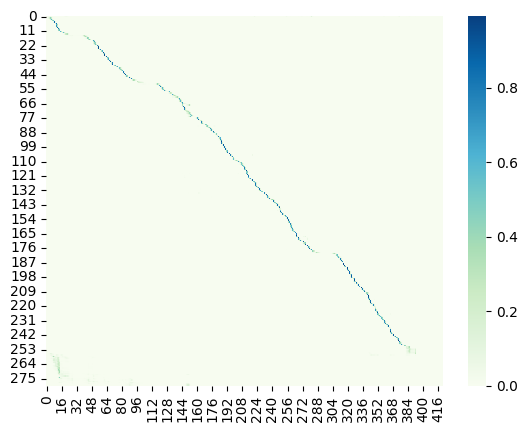

Saved best model

Epoch: 70/80


Val:   3%|▎         | 1/33 [00:02<01:33,  2.93s/it, dist=2.3733]

Ground Truth :  HE WOULD HAVE TO PAY HER THE MONEY WHICH SHE WOULD NOW REGULARLY DEMAND OR THERE WOULD BE TROUBLE IT DID NOT MATTER WHAT HE DID
Prediction   :  HE WOULD HAVE TO PAY HER THE MONEY WHICH SHE WOULD NOW REGULARLY DEMAND OR THERE WOULD BE TROUBLE IT DID NOT MATTER WHAT HE DID


Val:   6%|▌         | 2/33 [00:05<01:21,  2.64s/it, dist=2.7700]

Ground Truth :  GALLOPING INTO CAMP THE BOY FETCHED HIS SOMBRERO WHICH HE CARRIED WELL OUT INTO THE FIELD AND TOSSED AWAY
Prediction   :  GALIPINE DE CAMP THE BOY FITCHED TO SOMEBORROW WHICH YOU CARRIED WELL OUT INTO THE FIELD AND TOSSED AWAY


Val:   9%|▉         | 3/33 [00:07<01:13,  2.47s/it, dist=2.8511]

Ground Truth :  THE THREE FRIENDS WERE ASTOUNDED
Prediction   :  THE THREE FRIENDS WERE ASTOUNDED


Val:  12%|█▏        | 4/33 [00:10<01:10,  2.44s/it, dist=2.6717]

Ground Truth :  I NEVER KNOW YOU WAS SO BRAVE JIM SHE WENT ON COMFORTINGLY
Prediction   :  I NEVER KNOW YOU WAS SO BRAVE JIM SHE WENT ON COMFORTINGLY


Val:  15%|█▌        | 5/33 [00:12<01:08,  2.45s/it, dist=2.6573]

Ground Truth :  SUCH CRIMES WOULD HAVE DESERVED THE ANIMADVERSION OF THE MAGISTRATE BUT IN THIS PROMISCUOUS OUTRAGE THE INNOCENT WERE CONFOUNDED WITH THE GUILTY AND ALEXANDRIA WAS IMPOVERISHED BY THE LOSS OF A WEALTHY AND INDUSTRIOUS COLONY
Prediction   :  SUCH CRIMES WOULD HAVE DESERVED THE ANIMADVERSION OF THE MAGISTRATE BUT IN THIS PROMISCUOUS OUTRAGE THE INNOCENT WERE CONFOUNDED WITH THE GUILTY AND ALEXANDRIA WAS IMPOVERISHED BY THE LOSS OF A WEALTHY AND INDUSTRIOUS COLONY


Val:  18%|█▊        | 6/33 [00:14<01:05,  2.43s/it, dist=3.0067]

Ground Truth :  HOW INFINITE THE WEALTH OF LOVE AND HOPE GARNERED IN THESE SAME TINY TREASURE HOUSES AND OH
Prediction   :  HOW INFINITE THE WEALTH OF LOVE AND HOPE GARNERED IN THESE SAME TINY TREASURE HOUSES AND OH


Val:  21%|██        | 7/33 [00:17<01:03,  2.44s/it, dist=2.8257]

Ground Truth :  THE EUROPE THEY HAD COME FROM LAY OUT THERE BEYOND THE IRISH SEA EUROPE OF STRANGE TONGUES AND VALLEYED AND WOODBEGIRT AND CITADELLED AND OF ENTRENCHED AND MARSHALLED RACES
Prediction   :  THE EUROPE THEY HAD COME FROM LAY OUT THERE BEYOND THE IROSE SEA EUROPE OF STRANGE TONGUES AND VALLEYED AND WOOD BEGIRT AND CITADELLED AND OF ENTRENCHED AND MARSHALLED RACES


Val:  24%|██▍       | 8/33 [00:19<01:01,  2.45s/it, dist=2.7717]

Ground Truth :  WELL NOW SAID MEEKIN WITH ASPERITY I DON'T AGREE WITH YOU
Prediction   :  WELL NOW SAID MEEKIN WITH A SPIRITY I DON'T AGREE WITH YOU


Val:  27%|██▋       | 9/33 [00:22<00:59,  2.48s/it, dist=2.7867]

Ground Truth :  IT IS NONSENSE SAID PHOEBE A LITTLE IMPATIENTLY FOR US TO TALK ABOUT A PICTURE WHICH YOU HAVE NEVER SEEN
Prediction   :  IT IS NONSENSE SAID PHOEBE A LITTLE IMPATIENTLY FOR US TO TALK ABOUT A PICTURE WHICH YOU HAVE NEVER SEEN


Val:  30%|███       | 10/33 [00:24<00:56,  2.46s/it, dist=2.7780]

Ground Truth :  IS THERE NOTHING WILD IN THE EYE CONTINUED HOLGRAVE SO EARNESTLY THAT IT EMBARRASSED PHOEBE AS DID ALSO THE QUIET FREEDOM WITH WHICH HE PRESUMED ON THEIR SO RECENT ACQUAINTANCE
Prediction   :  IS THERE NOTHING WILD IN THE EYE CONTINUED HOLGRAVE SO EARNESTLY THAT IN BARREST PHOEBE AS DID ALSO THE QUIET FREEDOM WITH WHICH HE PRESUMED ON THEIR SO RECENT ACQUAINTANCE


Val:  33%|███▎      | 11/33 [00:27<00:53,  2.44s/it, dist=2.7539]

Ground Truth :  THEN THERE ARE IN ALL CLASSES A VERY LARGE NUMBER OF MEN CONSTANTLY OCCUPIED WITH THE SERIOUS AFFAIRS OF THE GOVERNMENT AND THOSE WHOSE THOUGHTS ARE NOT ENGAGED IN THE DIRECTION OF THE COMMONWEALTH ARE WHOLLY ENGROSSED BY THE ACQUISITION OF A PRIVATE FORTUNE
Prediction   :  THEN THERE ARE IN ALL CLOSES A VERY LARGE NUMBER OF MEN CONSTANTLY OCCUPIED WITH THE SERIOUS AFFAIRS OF THE GOVERNMENT AND THOSE WHOSE THOUGHTS ARE NOT ENGAGED IN THE DIRECTION OF THE COMMONWEALTH ARE WHOLLY ENGROSSED BY THE ACQUISITION OF A PRIVATE FORTUNE


Val:  36%|███▋      | 12/33 [00:29<00:51,  2.45s/it, dist=2.7789]

Ground Truth :  CHAPTER SIXTEEN WHY THE NATIONAL VANITY OF THE AMERICANS IS MORE RESTLESS AND CAPTIOUS THAN THAT OF THE ENGLISH
Prediction   :  TEPTO SIXTEEN WHY THE NATIONAL VANITY OF THE AMERICANS IS MORE RESTLESS AND CAPTIOUS THAN THAT OF THE ENGLISH


Val:  39%|███▉      | 13/33 [00:32<00:49,  2.46s/it, dist=2.7959]

Ground Truth :  PRIDE AFTER SATISFACTION UPLIFTED HIM LIKE LONG SLOW WAVES
Prediction   :  PRIDE AFTER SATISFACTION UPLIFTED HIM LIKE LONG SLOW WAVES


Val:  42%|████▏     | 14/33 [00:34<00:46,  2.44s/it, dist=2.8276]

Ground Truth :  ONE COULD HARDLY HOPE FOR ANY UPON SO DRY A DAY
Prediction   :  ONE COULD HARDLY HOPE FOR ANY UPON SO DRY A DAY


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.41s/it, dist=2.8018]

Ground Truth :  GEORGE NODDED
Prediction   :  GEORGE NODDED


Val:  48%|████▊     | 16/33 [00:39<00:41,  2.42s/it, dist=2.7862]

Ground Truth :  THEN FELL THE GLOAMING MAKING EVERYTHING STILL MORE FORBIDDING AND MYSTERIOUS
Prediction   :  THEN FELL THE GLOAMING MAKING EVERYTHING STILL MORE FORBIDDING IN MYSTERIOUS


Val:  52%|█████▏    | 17/33 [00:41<00:38,  2.43s/it, dist=2.7784]

Ground Truth :  THE GREAT GREEN FIELD SURROUNDED ON ALL SIDES BY TALL TREES MADE THE PLACE AN IDEAL ONE FOR THEIR PURPOSE
Prediction   :  THE GREAT GREEN FILLED SURRENDERED ON ALL SIDES BY TOLD TREES MADE THE PLACE AN IDEAL ONE FOR THEIR PURPOSE


Val:  55%|█████▍    | 18/33 [00:44<00:36,  2.44s/it, dist=2.7937]

Ground Truth :  I DO NOT BELIEVE IN SUCH REPUBLICS ANY MORE THAN IN THAT OF PLATO OR IF THE THINGS WE READ OF REALLY HAPPENED I DO NOT HESITATE TO AFFIRM THAT THESE SUPPOSED DEMOCRACIES WERE COMPOSED OF VERY DIFFERENT ELEMENTS FROM OURS AND THAT THEY HAD NOTHING IN COMMON WITH THE LATTER EXCEPT THEIR NAME
Prediction   :  I DO NOT BELIEVE IN SUCH REPUBLICS ANY MORE THAN IN THAT OF PLATO OR IF THE THINGS WE READ OFF REALLY HAPPENED I DO NOT HESITATE TO AFFUM THAT THESE SUPPOSED DEMOCRACIES WERE COMPOSED OF VERY DIFFERENT ELEMENTS FROM OURS AND THAT THEY HAD NOTHING IN COMMON WITH THE LETTER EXCEPT THEIR NAME


Val:  58%|█████▊    | 19/33 [00:46<00:34,  2.46s/it, dist=2.7698]

Ground Truth :  SEND MY SOUL CLEAN TO ASURA
Prediction   :  SEND MY SOUL CLEAN TO ASSURA


Val:  61%|██████    | 20/33 [00:48<00:31,  2.40s/it, dist=2.7783]

Ground Truth :  WE SAW THE UNITED STATES FLAG FLYING FROM THE RAMPARTS AND THOUGHT THAT YANK WOULD PROBABLY BE ASLEEP OR CATCHING LICE OR MAYBE ENGAGED IN A GAME OF SEVEN UP
Prediction   :  WE SAW THE UNITED STATES FLAG FLYING FROM THE RAMPARTS AND THOUGHT THE YANK WOULD PROBABLY BE A SLEEP OR CATCHING WICE OR MAY BE ENGAGED IN A GAME OF SEVEN UP


Val:  64%|██████▎   | 21/33 [00:51<00:28,  2.38s/it, dist=2.7860]

Ground Truth :  THIS WORK OF ART WAS THE WONDER OF THE COUNTRY TEN MILES ROUND
Prediction   :  THIS WORK OF HEART WAS THE WONDER OF THE COUNTRY TEN MILES ROUND


Val:  67%|██████▋   | 22/33 [00:53<00:26,  2.39s/it, dist=2.8273]

Ground Truth :  SO LOW HE FELL THAT ALL APPLIANCES FOR HIS SALVATION WERE ALREADY SHORT SAVE SHOWING HIM THE PEOPLE OF PERDITION
Prediction   :  SO LOW HE FELT THAT ALL A PLIANCES FOR HIS SALVATION WERE ALREADY SHORT SAVE SHOWING HIM THE PEOPLE OF PREDITION


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.35s/it, dist=2.8397]

Ground Truth :  THEN HE SAT DOWN IN HIS CHAIR AND GAZED WITHOUT SEEING CONTEMPLATING THE RESULT OF HIS WORK
Prediction   :  THEN HE SAT DOWN IN HIS CHAIR AND GAZED WITHOUT SEEING CONTEMPLATING THE RESULT OF HIS WORK


Val:  73%|███████▎  | 24/33 [00:58<00:21,  2.36s/it, dist=2.8803]

Ground Truth :  YOU'LL EASILY JUDGE WHY WHEN YOU HEAR BECAUSE THE THING HAD BEEN SUCH A SCARE HE CONTINUED TO FIX ME
Prediction   :  YOU'LL EASILY JUDGE WHY WHEN YOU HEAR BECAUSE THE THING HAD BEEN SUCH A SCARE HE CONTINUED TO FIX ME


Val:  76%|███████▌  | 25/33 [01:00<00:19,  2.38s/it, dist=2.8779]

Ground Truth :  WE RANGE WIDER LAST LONGER AND ESCAPE MORE AND MORE FROM INTENSITY TOWARDS UNDERSTANDING
Prediction   :  WE RANGE WIDER LAST LONGER AND ESCAPE MORE AND MORE FROM INTENSITY TOWARDS UNDERSTANDING


Val:  79%|███████▉  | 26/33 [01:03<00:16,  2.41s/it, dist=2.8810]

Ground Truth :  BUT AFTER AWHILE JIM SAYS GENTLEMEN AY GANNY THE LAW
Prediction   :  BUT AFTER A WHILE JIM SAYS GENTLEMEN I GANNING THE LAW


Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.39s/it, dist=2.8805]

Ground Truth :  I SHOULD LIKE TO SEE THE DESK YOU SPEAK OF AND THE SPOT WHERE SHE FELL
Prediction   :  I SHOULD LIKE TO SEE THE DESK YOU SPEAK OF AND THE SPOT WHERE SHE FELL


Val:  85%|████████▍ | 28/33 [01:08<00:12,  2.40s/it, dist=2.8838]

Ground Truth :  NOT EXACTLY RETURNED KALIKO
Prediction   :  NOT EXACTLY RETURNED KALIKO


Val:  88%|████████▊ | 29/33 [01:10<00:09,  2.40s/it, dist=2.8680]

Ground Truth :  HE HAD BEEN LATE HE HAD OFFERED NO EXCUSE NO EXPLANATION
Prediction   :  HE HAD BEEN LATE HE HAD OFFERED NO EXCUSE NO EXPLANATION


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.41s/it, dist=2.8609]

Ground Truth :  IT'S UNBEARABLE IT TORTURES ME EVERY MINUTE
Prediction   :  IT'S UNBEARABLE IT TORTURES ME EVERY MINUTE


Val:  94%|█████████▍| 31/33 [01:15<00:04,  2.34s/it, dist=2.8400]

Ground Truth :  WHOEVER YOU MAY BE I AM INDEBTED TO YOU FOR MY LIFE
Prediction   :  WHOEVER YOU MAY BE I AM INDEBTED TO YOU FOR MY LIFE


Val:  97%|█████████▋| 32/33 [01:17<00:02,  2.38s/it, dist=2.8333]

Ground Truth :  THE AIR AND THE EARTH ARE CURIOUSLY MATED AND INTERMINGLED AS IF THE ONE WERE THE BREATH OF THE OTHER
Prediction   :  THE AIR AND THE EARTH ARE CURIOUSLY MATED AND INTERMINGLED AS IF THE ONE WERE THE BREATH OF THE OTHER


Ground Truth :  THE LADY IS NOT THE MOTHER OF THE BOYS BUT THEIR AUNT
Prediction   :  THE LADY IS NOT THE MOTHER OF THE BOYS BUT THEIR AUNT
	Train Loss 0.0715	 Learning Rate 0.0000717
	Val Dist 2.8247	
	Teacher Forcing Ratio 1	


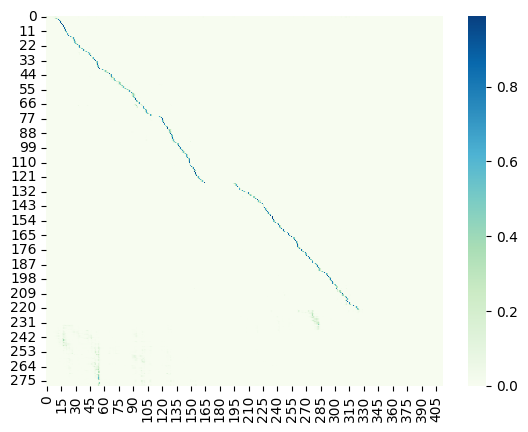


Epoch: 71/80


Val:   3%|▎         | 1/33 [00:03<01:37,  3.03s/it, dist=2.6067]

Ground Truth :  CLAUDIA TOLD HIM SHE MEANT TO GO TO A MONASTERY OF WHICH AN AUNT OF HERS WAS ABBESS WHERE SHE INTENDED TO PASS HER LIFE WITH A BETTER AND EVERLASTING SPOUSE
Prediction   :  CLAUDIA TOLD HIM SHE MEANT TO GO TO A MONASTERY OF WHICH AN AUNT OF HERS WAS ABBESS WHERE SHE INTENDED TO PASS HER LIFE WITH A BETTER AND EVERLASTING SPOUSE


Val:   6%|▌         | 2/33 [00:05<01:20,  2.58s/it, dist=2.5167]

Ground Truth :  A VOICE INQUIRED WHO'S THERE
Prediction   :  A VOICE INQUIRED WHOSE THERE


Val:   9%|▉         | 3/33 [00:07<01:12,  2.40s/it, dist=2.3444]

Ground Truth :  HER MEETING WITH LETTY WAS INDESCRIBABLY TENDER AND THE DAYS THAT FOLLOWED WERE PRETTY EQUALLY DIVIDED BETWEEN HER AND HER BROTHER IN NURSING THE ONE AND LOVING THE OTHER
Prediction   :  HER MEETING WITH LETTER WAS IN DESCRIBABLY TENDER AND THE DAYS THAT FOLLOWED OR PRETTY EQUALLY DIVIDED BETWEEN HER AND HER BROTHER IN NURSING THE ONE AND LOVING THE OTHER


Val:  12%|█▏        | 4/33 [00:10<01:11,  2.46s/it, dist=2.3533]

Ground Truth :  NOR EVEN THUS OUR WAY CONTINUED FAR BEFORE THE LADY WHOLLY TURNED HERSELF UNTO ME SAYING BROTHER LOOK AND LISTEN
Prediction   :  NOR EVEN THUS ARE WAY CONTINUED FAR BEFORE THE LADY WHOLLY TURNED HERSELF UNTO ME SAYING BROTHER LOOK AND LISTEN


Val:  15%|█▌        | 5/33 [00:12<01:08,  2.45s/it, dist=2.5227]

Ground Truth :  WHAT'S THAT FOR DEMANDED NED WONDERINGLY
Prediction   :  WHAT SAT FOUR DEMANDED NED WONDERINGLY


Val:  18%|█▊        | 6/33 [00:14<01:05,  2.43s/it, dist=2.9200]

Ground Truth :  KIRKLEATHAM YEAST
Prediction   :  KIRKLEATHAM YEAST


Val:  21%|██        | 7/33 [00:17<01:03,  2.44s/it, dist=2.9162]

Ground Truth :  SHE WAS FOUR YEARS OLDER THAN I TO BE SURE AND HAD SEEN MORE OF THE WORLD BUT I WAS A BOY AND SHE WAS A GIRL AND I RESENTED HER PROTECTING MANNER
Prediction   :  SHE WAS FOUR YEARS OLDER THAN I TO BE SURE AND HAD SEEN MORE OF THE WORLD BUT I WAS A BOY AND SHE WAS A GIRL AND I RESENTED HER PROTECTING MANNER


Val:  24%|██▍       | 8/33 [00:19<00:58,  2.36s/it, dist=2.9900]

Ground Truth :  ON MONDAY MORNING I TOO CAPTURED ME A MULE
Prediction   :  I MONDEY MORNING I TOOK CAPTURED ME MULE


Val:  27%|██▋       | 9/33 [00:21<00:56,  2.35s/it, dist=2.9719]

Ground Truth :  OH WON'T SHE BE SAVAGE IF I'VE KEPT HER WAITING
Prediction   :  OH WON'T SHE BE SAVAGE IF I'VE KEPT HER WAITING


Val:  30%|███       | 10/33 [00:24<00:55,  2.40s/it, dist=2.9373]

Ground Truth :  NO ONE HAD COME TO MEET ME THE VILLAGE WAS ABOUT HALF A MILE AND HANGAR DENE THE HOUSE FOR WHICH MY STEPS WERE BENT ABOUT FOUR MILES BY THE ROAD HOW FAR IT WAS ACROSS PLOUGHED FIELDS MY INFORMANT DID NOT MENTION
Prediction   :  NO ONE HAD COME TO MEET ME THE VILLAGE WAS ABOUT HALF A MILE AND HANG OUR DEEN THE HOUSE FOR WHICH MY STEPS WERE BENT ABOUT FOUR MILES BY THE ROAD HOW FAR IT WAS ACROSS PLOUGHED FIELDS MY INFORMANT DID NOT MENTION


Val:  33%|███▎      | 11/33 [00:26<00:51,  2.36s/it, dist=2.8794]

Ground Truth :  LOOK AT IT FROM TIME TO TIME WHEN IT HAS BEEN LAID FOR NEARLY AN HOUR AND WHEN THE YEAST HAS RISEN AND BROKEN THROUGH THE FLOUR SO THAT BUBBLES APPEAR IN IT YOU WILL KNOW THAT IT IS READY TO BE MADE UP INTO DOUGH
Prediction   :  LOOK AT IT FROM TIME TO TIME WHEN IT HAS BEEN LAID FOR NEARLY AN HOUR AND WHEN THE YEAST HAS RISEN AND BROKEN THROUGH THE FLOUR SO THAT BUBBLES APPEAR IN IT YOU WILL KNOW THAT IT IS READY TO BE MADE UP INTO DOUGH


Val:  36%|███▋      | 12/33 [00:28<00:49,  2.34s/it, dist=2.8033]

Ground Truth :  HE CAN'T SUCKLE EM CAN HE
Prediction   :  HE CAN'T SUCKLE EM CANNY


Val:  39%|███▉      | 13/33 [00:31<00:46,  2.31s/it, dist=2.7113]

Ground Truth :  THEY THINK YOU'RE PROUD BECAUSE YOU'VE BEEN AWAY TO SCHOOL OR SOMETHING
Prediction   :  THEY THINK YOU'RE PROUD BECAUSE YOU'VE BEEN AWAY TO SCHOOL OR SOMETHING


Val:  42%|████▏     | 14/33 [00:33<00:45,  2.40s/it, dist=2.7048]

Ground Truth :  IT RELIEVED HIM FOR A WHILE
Prediction   :  IT WE LEAVED HIM FOR A WHILE


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.41s/it, dist=2.6916]

Ground Truth :  THE COUNTLESS TREASURES WHICH FIVE CENTURIES OF RAPINE HAD ACCUMULATED ROUND THE CAPITOL HAD BECOME THE PREY OF MEN CLOTHED IN SHEEPSKINS AND HORSE HIDE AND THE SISTER OF AN EMPEROR HAD FOUND HER BEAUTY VIRTUE AND PRIDE OF RACE WORTHILY MATCHED BY THOSE OF THE HARD HANDED NORTHERN HERO WHO LED HER AWAY FROM ITALY AS HIS CAPTIVE AND HIS BRIDE TO FOUND NEW KINGDOMS IN SOUTH FRANCE AND SPAIN AND TO DRIVE THE NEWLY ARRIVED VANDALS ACROSS THE STRAITS OF GIBRALTAR INTO THE THEN BLOOMING COAST LAND OF NORTHERN AFRICA
Prediction   :  THE COUNTLESS TREASURES WHICH FIVE CENTURIES OF RAPINE HAD ACCUMULATED ROUND THE CAPITOL HAD BECOME THE PRAY OF MEN CLOTHED IN SHEEP SKINS AND HORSE HIDE AND THE SISTER OF AN EMPEROR HAD FOUND HER BEAUTY VIRTUE AND PRIDE OF RACE WORTHILY MATCHED BY THOSE OF THE HARD HANDED NORTHERN HERO WHO LED HER AWAY FROM ITALY AS HIS CAPTIVE AND HIS BRIDE TO FOUND NEW KINGDOMS IN SOUTH FRANCE AND SPAIN AND TO DRIVE THE NEWLY ARRIVED VANDALS ACROSS THE STRAITS O

Val:  48%|████▊     | 16/33 [00:38<00:40,  2.41s/it, dist=2.6546]

Ground Truth :  GWYNPLAINE HAD YELLOW HAIR
Prediction   :  WHEN PLAIN HAD YELLOW HAIR


Val:  52%|█████▏    | 17/33 [00:40<00:37,  2.34s/it, dist=2.6576]

Ground Truth :  THE ENTRANCE IS LIGHT BECAUSE IT OPENS SO WIDE BUT WE CAN SEE THAT THE FLOOR SLOPES DOWNWARD AND THE WAY LOOKS DARK AND NARROW BEFORE US
Prediction   :  THE ENTRANCE IS LIGHT BECAUSE IT OPENS SO WIDE BUT WE CAN SEE THAT THE FLOOR SLOPES DOWN WORD AND THE WAY LOOKS DARK AND NARROW BEFORE US


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.39s/it, dist=2.6589]

Ground Truth :  I ATTRIBUTE ITS UNLOOKED FOR SUCCESS MAINLY TO TWO EARLY FAVOURABLE REVIEWS THE FIRST IN THE PALL MALL GAZETTE OF APRIL TWELFTH AND THE SECOND IN THE SPECTATOR OF APRIL TWENTIETH
Prediction   :  I ATTRIBUTE ITS UNLOOKED FOR SUCCESS MAINLY TO TWO EARLY FAVOURABLE REVIEWS THE FIRST IN THE PALM ALL GOES THAT OF APRIL TWELFTH AND THE SECOND IN THE SPECTATOR OF APRIL TWENTIETH


Val:  58%|█████▊    | 19/33 [00:45<00:32,  2.33s/it, dist=2.6537]

Ground Truth :  SHE WAS QUICK AND VERY EAGER
Prediction   :  SHE WAS QUICK AND VERY EAGER


Val:  61%|██████    | 20/33 [00:47<00:30,  2.31s/it, dist=2.6590]

Ground Truth :  AND WHY SHOULD THAT DISTURB ME LET HIM ENTER
Prediction   :  AND WHY SHOULD THAT DISTURB ME LET HIM ENTER


Val:  64%|██████▎   | 21/33 [00:49<00:27,  2.27s/it, dist=2.7381]

Ground Truth :  HE HAD BEEN LATE HE HAD OFFERED NO EXCUSE NO EXPLANATION
Prediction   :  HE HAD BEEN LATE HE HAD OFFERED NO EXCUSE NO EXPLANATION


Val:  67%|██████▋   | 22/33 [00:52<00:25,  2.32s/it, dist=2.7288]

Ground Truth :  MY ARMS ARE RIGHT BUT MY LEGS ARE GETTING A LITTLE STIFF
Prediction   :  MY ARMS ARIGHT BUT MY LEGS ARE GETTING A LITTLE STIFF


Val:  70%|██████▉   | 23/33 [00:54<00:23,  2.35s/it, dist=2.7609]

Ground Truth :  MY OWN REGIMENT WAS IN THE ADVANCE
Prediction   :  MY OWN REGIMENT WAS IN THE ADVANCE


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.36s/it, dist=2.7919]

Ground Truth :  PERHAPS YOU CAN OUTWIT HER YET CRIED ANOTHER
Prediction   :  PERHAPS WE CAN OUTLIT HER YET CRIED ANOTHER


Val:  76%|███████▌  | 25/33 [00:59<00:18,  2.37s/it, dist=2.7736]

Ground Truth :  IT WAS UNDER SUCH AUSPICIOUS CIRCUMSTANCES THAT SHE STARTED OUT THIS MORNING TO LOOK FOR WORK
Prediction   :  IT WAS UNDER SUCH AUSPICIOUS CIRCUMSTANCES THAT SHE STARTED OUT THIS MORNING TO LOOK FOR WORK


Val:  79%|███████▉  | 26/33 [01:01<00:16,  2.33s/it, dist=2.7659]

Ground Truth :  SUFFICIENT HALF THIS QUANTITY FOR TWO SLICES OF SALMON
Prediction   :  SUFFICIENT HALF THIS QUANTITY FOR TWO SLICES OF SALMON


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.36s/it, dist=2.7607]

Ground Truth :  THE SECOND BEGINS HERE AN ANGEL THE THIRD HERE DEAR SONG I KNOW
Prediction   :  THE SECOND BEGINS HERE AN ANGEL THE THIRD HERE D'ARTAGNAN THE THIRD HERE D'ARTAGNAN


Val:  85%|████████▍ | 28/33 [01:06<00:11,  2.39s/it, dist=2.7964]

Ground Truth :  WELL THEN I WENT INTO LODGINGS THAT WICKED WOMAN HAD LEFT ME ONE STREET SUIT AND TO DAY THEY TURNED ME OUT BECAUSE MY MONEY WAS ALL GONE
Prediction   :  WELL THEN I WENT INTO LODGINGS THAT WICKED WOMAN LEFT ME ONE STREET SUIT AND TODAY THEY TURNED ME OUT BE AS MY MONEY WAS ALL GONE


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.43s/it, dist=2.7940]

Ground Truth :  BUT SOMETIMES HE STRAIGHTENS THE JOINT AND HOLDS HIS LIP OUT BEFORE HIM AND THEN ITS PINCERS CATCH HOLD OF THINGS HE DOES THIS WHEN HE IS HUNGRY
Prediction   :  BUT SOMETIMES HE STRAIGHTENS THE JOINT AND HOLDS AS LIP OUT BEFORE HIM AND MANAGED PINCERS KEPT HOLD OF THINGS HE DOES THIS WHEN HE IS HULBORY


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.49s/it, dist=2.8058]

Ground Truth :  AS A SPECIAL MARK OF RESPECT THE BODY OF A YOUNG WOMAN OR A WARRIOR WAS SOMETIMES LAID OUT IN STATE IN A NEW TEEPEE WITH THE USUAL HOUSEHOLD ARTICLES AND EVEN WITH A DISH OF FOOD LEFT BESIDE IT NOT THAT THEY SUPPOSED THE SPIRIT COULD USE THE IMPLEMENTS OR EAT THE FOOD BUT MERELY AS A LAST TRIBUTE
Prediction   :  AS A SPECIAL MARK OF RESPECT THE BODY OF A YOUNG WOMAN OR A MORE MORE YOUR MORE YOUR MORE YOUR MORE YOUR MORE YOUR WAS SOMETIMES LIGHT OUT IN STATE IN A NEW CHAPY WITH THE UNUSUAL HOUSEHOLD ARTICLES AND EVEN WITH A DISH OF FOOL LEFT BESIDE IT NOT THAT THEY SUPPOSED THE SPIRIT COULD USE THE IMPLEMENTS OR EAT THE FOOD THAT MERELY AS A LAST TRIBUTE


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.49s/it, dist=2.8017]

Ground Truth :  JOHN MANGLES THEREFORE HOPED THAT THE WRETCHED HULL WOULD REACH PORT WITHOUT ACCIDENT BUT IT GRIEVED HIM THAT HIS COMPANIONS SHOULD HAVE TO SUFFER SO MUCH DISCOMFORT FROM THE DEFECTIVE ARRANGEMENTS OF THE BRIG
Prediction   :  JOHN MANGLES THEREFORE HOPED THAT THE WRETCHED HOLE WOULD REACH PORT WITHOUT ACCIDENT BUT IT GRIEVED HIM THAT HIS COMPANIONS SHOULD HAVE TO SUFFER SO MUCH DISCOMFORT FROM THE DEFECTIVE ARRANGEMENTS OF THE BRIG


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.44s/it, dist=2.8037]

Ground Truth :  WHAT BANKRUPTS IN THE WORLD WE FEEL WHEN DEATH LIKE SOME REMORSELESS CREDITOR SEIZES ON ALL WE FONDLY THOUGHT OUR OWN THE TWINS
Prediction   :  WHAT BANKRUPTS IN THE WORLD WE FEEL WHEN DEATH LIKE SOME REMOISTLESS CREDITOR SEIZES ON ALL WE FONDLY THOUGHT OUR OWN THE TWINS


Ground Truth :  MODE LET THE TARTARIC ACID AND SALT BE REDUCED TO THE FINEST POSSIBLE POWDER THEN MIX THEM WELL WITH THE FLOUR
Prediction   :  MODE LET THE TERTORIC ACID AND SALT BE REDUCED TO THE FINEST POSSIBLE POWDER THEN MIX THEM WELL WITH THE FLOUR
	Train Loss 0.0711	 Learning Rate 0.0000606
	Val Dist 2.8211	


	Teacher Forcing Ratio 1	


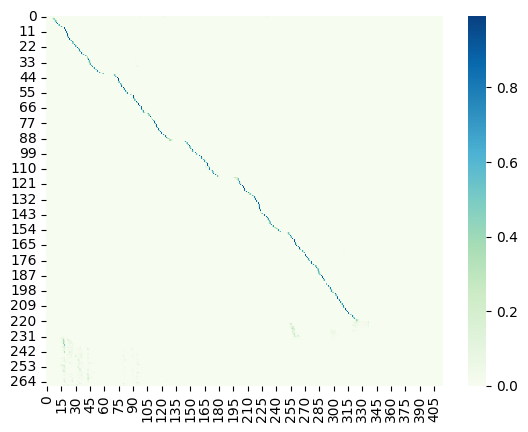


Epoch: 72/80


Val:   3%|▎         | 1/33 [00:02<01:32,  2.90s/it, dist=2.6200]

Ground Truth :  I HAVEN'T COURAGE ENOUGH TO DO IT FOR MYSELF
Prediction   :  I HAVE ENCOURAGED ENOUGH TO DO IT FOR MYSELF


Val:   6%|▌         | 2/33 [00:05<01:20,  2.61s/it, dist=2.2367]

Ground Truth :  THIS WAS CARRIED OUT TO THE LETTER
Prediction   :  THIS WAS CARRIED OUT TO THE LETTER


Val:   9%|▉         | 3/33 [00:07<01:15,  2.51s/it, dist=2.5400]

Ground Truth :  THEN ADD THE YOLKS OF THE EGGS WELL BEATEN STIR THEM TO THE SAUCE BUT DO NOT ALLOW IT TO BOIL AND SERVE VERY HOT
Prediction   :  THEN ADD THE YOLKS OF THE EGGS WELL BEATEN STIR THEM TO THE SAUCE BUT DO NOT ALLOW IT TO BOIL AND SERVE VERY HOT


Val:  12%|█▏        | 4/33 [00:10<01:13,  2.55s/it, dist=2.5700]

Ground Truth :  IT IS AN IDEA THAT IS WORTH WHILE BUT UNFORTUNATELY THE PROPRIETORS DEPEND TOO MUCH ON THE DECORATIVE FEATURE AND TOO LITTLE ON THE FOOD AND HOW THEY SERVE IT
Prediction   :  IT IS AN IDEA THAT IS WORTH WHILE BUT UNFORTUNATELY THE PROPRIETORS DEPEND TOO MUCH ON THE DECORATIVE FEATURE AND TOO LITTLE ON THE FOOD AND HOW THEY SERVE IT


Val:  15%|█▌        | 5/33 [00:12<01:08,  2.45s/it, dist=2.4053]

Ground Truth :  THE MUSIC WAS BROKEN AND JOSEPH LEFT ALONE WITH THE DUMB INSTRUMENTS
Prediction   :  THE MUSIC WAS BROKEN AND JOSEPH LEFT ALONE WITH THE DUMB INSTRUMENTS


Val:  18%|█▊        | 6/33 [00:14<01:04,  2.40s/it, dist=2.7967]

Ground Truth :  A YELLOW VARIETY CALLED GOLDEN MILLET IS SOLD IN THE GROCERS SHOPS FOR MAKING PUDDINGS AND IS VERY DELICATE AND WHOLESOME
Prediction   :  A YELLOW VARIETY CALLED GOLDEN MILLET IS SOLD IN THE GROCER'S SHOPS FOR MAKING PUDDINGS AND IS VERY DELICATE AND WHOLESOME


Val:  21%|██        | 7/33 [00:17<01:00,  2.34s/it, dist=2.8400]

Ground Truth :  I DON'T KNOW WHAT BECOMES OF THE LADIES
Prediction   :  I DON'T KNOW WHAT BECOMES OF THE LADIES


Val:  24%|██▍       | 8/33 [00:19<00:59,  2.37s/it, dist=2.8058]

Ground Truth :  I ASKED AS SOON AS GEORGE HAD RETURNED TO MY SIDE
Prediction   :  I ASKED AS SOON AS GEORGE HAD RETURNED TO MY SIDE


Val:  27%|██▋       | 9/33 [00:21<00:57,  2.38s/it, dist=2.8793]

Ground Truth :  I SEE FROM MY SECOND PREFACE THAT I TOOK THE BOOK TO MESSRS CHAPMAN AND HALL MAY FIRST EIGHTEEN SEVENTY ONE AND ON THEIR REJECTION OF IT UNDER THE ADVICE OF ONE WHO HAS ATTAINED THE HIGHEST RANK AMONG LIVING WRITERS I LET IT SLEEP TILL I TOOK IT TO MISTER TRUBNER EARLY IN EIGHTEEN SEVENTY TWO
Prediction   :  I SEE FROM MY SECOND PREFACE THAT I TOOK THE BOOK TO MESSER'S CHAPMAN AND HALL MAY FIRST EIGHTEEN SEVENTY ONE AND ON THEIR REJECTION OF IT UNDER THE ADVICE OF ONE WHO HAS ATTAINED THE HIGHEST RANK AMONG LIVING WRITERS I LET IT SLEEP TILL I TOOK IT TO MISTER TRUBNER EARLY IN EIGHTEEN SEVENTY TWO


Val:  30%|███       | 10/33 [00:24<00:53,  2.35s/it, dist=2.8913]

Ground Truth :  GIVE ME MY HORSE AND ARMS AND WAIT FOR ME HERE I WILL GO IN QUEST OF THIS KNIGHT AND DEAD OR ALIVE I WILL MAKE HIM KEEP HIS WORD PLIGHTED TO SO GREAT BEAUTY
Prediction   :  GIVE ME MY HORSE AND ARMS AND WAIT FOR ME HERE I WILL GO IN QUEST OF THIS NIGHT AND DEAD OR ALIVE I WILL MAKE HIM KEEP HIS WORD PLIGHTED TO SO GREAT BEAUTY


Val:  33%|███▎      | 11/33 [00:26<00:51,  2.34s/it, dist=2.8370]

Ground Truth :  THIS ISN'T PART OF YOUR TESTING ROUTINE IS IT
Prediction   :  THIS ISN'T PART OF YOUR TESTING ROUTINE IS IT


Val:  36%|███▋      | 12/33 [00:29<00:51,  2.45s/it, dist=2.8783]

Ground Truth :  HE DID NOT SAY THE LAST AS A BOAST BUT MERELY AS AN ASSURANCE TO THE LIVERYMAN WHO HE SAW WAS ANXIOUS ON HIS ACCOUNT
Prediction   :  HE DID NOT SAY THE LAST AS A BOAST BUT MERELY AS AN ASSURANCE TO THE LIVERY MAN WHO HE SAW WAS ANXIOUS ON HIS ACCOUNT


Val:  39%|███▉      | 13/33 [00:31<00:49,  2.47s/it, dist=2.9554]

Ground Truth :  HE KNEW IT WOULD TAKE THEM TO THE HOUSE OF THE CROOKED MAGICIAN WHOM HE HAD NEVER SEEN BUT WHO WAS THEIR NEAREST NEIGHBOR
Prediction   :  HE KNEW IT WOULD TAKE THEM TO THE HOUSE OF THE CROOKED MAGICIAN WHOM HE HAD NEVER SEEN BUT WHO WAS THEIR NEAREST NEIGHBOR


Val:  42%|████▏     | 14/33 [00:34<00:47,  2.48s/it, dist=2.8910]

Ground Truth :  AND THE OLD GENTLEMAN WAS SO DELIGHTED WITH HIS SUCCESS THAT HE HAD TO BURST OUT INTO A SERIES OF SHORT HAPPY BITS OF LAUGHTER THAT OCCUPIED QUITE A SPACE OF TIME
Prediction   :  AND THE OLD GENTLEMAN WAS SO DELIGHTED WITH HIS SUCCESS THAT HE HAD TO BURST OUT INTO A SERIES OF SHORT HAPPY BITS OF LAUGHTER THAT OCCUPIED QUITE A SPACE OF TIME


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.41s/it, dist=2.8627]

Ground Truth :  MISTER VERLOC WAS FULLY RESPONSIVE NOW
Prediction   :  MISTER RELUCK WAS FULLY RESPONSIVE NOW


Val:  48%|████▊     | 16/33 [00:38<00:39,  2.35s/it, dist=2.8188]

Ground Truth :  WE WERE NOT TWENTY YARDS OFF FROM THE YANKEES AND THEY WERE POURING THE HOT SHOT AND SHELLS RIGHT INTO OUR RANKS AND EVERY MAN WAS YELLING AT THE TOP OF HIS VOICE CEASE FIRING YOU ARE FIRING ON YOUR OWN MEN CEASE FIRING YOU ARE FIRING ON YOUR OWN MEN
Prediction   :  WE WERE NOT TWENTY YARDS OFF FROM THE ANKEYS AND THEY WERE POURING THE HOT SHOT AND SHOWS RIGHT IN HER ARRANGS AND EVERY MAN WAS YELLING AT THE TOP OF HIS VOICE SEES FIRING YOU WERE FIRING ON YOUR OWN MEN SEES FIRING YOU WERE FIRING ON YOUR OWN MEN


Val:  52%|█████▏    | 17/33 [00:41<00:38,  2.39s/it, dist=2.7933]

Ground Truth :  IT'S A CASE IN A THOUSAND GRYCE
Prediction   :  IT'S A CASE IN A THOUSAND GRYCE


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.34s/it, dist=2.8078]

Ground Truth :  SUFFICIENT FOR A MODERATE SIZED HADDOCK OR PIKE
Prediction   :  SUFFICIENT FOR A MODERATE SIZED HADDOCK OR PIKE


Val:  58%|█████▊    | 19/33 [00:45<00:33,  2.37s/it, dist=2.7618]

Ground Truth :  WHEN THE THREE INGREDIENTS ARE PROPERLY PREPARED POUND THEM ALTOGETHER IN A MORTAR FOR SOME TIME FOR THE MORE QUENELLES ARE POUNDED THE MORE DELICATE THEY ARE
Prediction   :  WHEN THE THREE INGREDIENTS ARE PROPERLY PREPARED POUND THEM ALTOGETHER IN A MORTAR FOR SOME TIME FOR THE MORE QUENELLES ARE POUNDED THE MORE DELICATE THEY ARE


Val:  61%|██████    | 20/33 [00:48<00:30,  2.35s/it, dist=2.7757]

Ground Truth :  HE DRANK THE WINE GREEDILY
Prediction   :  HE DRANK THE ONE GREATLY


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.34s/it, dist=2.7613]

Ground Truth :  AMONG US ALL MEN WERE CREATED SONS OF GOD AND STOOD ERECT AS CONSCIOUS OF THEIR DIVINITY
Prediction   :  AMONG A SALMAN WERE CREATED SONS OF GOD AND STOOD IT RECKON'S CONSCIOUS OF THEIR DIVINITY


Val:  67%|██████▋   | 22/33 [00:52<00:25,  2.30s/it, dist=2.7794]

Ground Truth :  FOUR AND TWENTY HOURS AGO AND HE DEEMED HIMSELF THE MOST MISERABLE AND FORLORN OF HUMAN BEINGS AND NOW ALL THE BLESSINGS OF THE WORLD SEEMED SHOWERED AT HIS FEET
Prediction   :  FOR AND TWENTY HOURS AGO AND HE DEEMED HIMSELF THE MOST MISERABLE AND FORT LORD OF HUMAN BEANS AND NOW ALL THE BLUSSINS OF THE WORLD SEEMED SHOWERED AS HIS FEET


Val:  70%|██████▉   | 23/33 [00:54<00:22,  2.27s/it, dist=2.7629]

Ground Truth :  THAT WON'T LAST IT WILL GO AWAY AND THINGS WILL BE JUST AS THEY USED TO
Prediction   :  THAT WON'T LAST IT WILL GO AWAY AND THINGS WILL BE JUST AS THEY USED TO


Val:  73%|███████▎  | 24/33 [00:57<00:20,  2.23s/it, dist=2.7414]

Ground Truth :  FOR INSTANCE LOOK AT THEIR BEHAVIOUR IN THE MATTER OF THE RING
Prediction   :  FOR INSTANCE LOOK AT THEIR BEHAVIOUR IN THE MATTER OF THE RING


Val:  76%|███████▌  | 25/33 [00:59<00:18,  2.30s/it, dist=2.7768]

Ground Truth :  WANTS TO COME OUT MISTER NORTH
Prediction   :  ONCE TO COME OUT MISTER NORTH


Val:  79%|███████▉  | 26/33 [01:01<00:16,  2.30s/it, dist=2.7726]

Ground Truth :  IT'S YOUR FAULT MOP IT UP YOURSELF
Prediction   :  IT'S YOUR FALL MOP IT UP YOURSELF


Val:  82%|████████▏ | 27/33 [01:04<00:13,  2.32s/it, dist=2.7802]

Ground Truth :  DID ANYONE KNOW THAT THESE PROOFS WOULD BE THERE NO ONE SAVE THE PRINTER
Prediction   :  DID ANYONE KNOW THAT THESE PROOFS WOULD BE THERE NO ONE SAVE THE PRINTER


Val:  85%|████████▍ | 28/33 [01:06<00:11,  2.28s/it, dist=2.7683]

Ground Truth :  DULCINEA IS PERISHING THOU ART LIVING ON REGARDLESS I AM DYING OF HOPE DEFERRED THEREFORE UNTRUSS THYSELF WITH A GOOD WILL FOR MINE IT IS HERE IN THIS RETIRED SPOT TO GIVE THEE AT LEAST TWO THOUSAND LASHES
Prediction   :  DULCINEA IS PERISHING THOU ART LIVING ON REGARDLESS I AM DYING OF HOPE DEFERRED THEREFORE UNTRUSS THYSELF WITH A GOOD WILL FOR MINE IT IS HERE IN THIS RETIRED SPOT TO GIVE THEE AT LEAST TWO THOUSAND LASHES


Val:  88%|████████▊ | 29/33 [01:08<00:09,  2.34s/it, dist=2.7701]

Ground Truth :  EVERY LANDSCAPE LOW AND HIGH SEEMS DOOMED TO BE TRAMPLED AND HARRIED
Prediction   :  EVERY LANDSCAPE LOW AND HIGH SEEMS DOOMED TO BE TRAMPLED AND HARRIED


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.40s/it, dist=2.7767]

Ground Truth :  WHAT SHALL WE DO WITH THE MINGOES AT THE DOOR THEY COUNT SIX AND THIS SINGER IS AS GOOD AS NOTHING
Prediction   :  WHAT SHALL WE DO WITH THE MINGOES AT THE DOOR THEY COUNT SIX AND THIS SINGER IS AS GOOD AS NOTHING


Val:  94%|█████████▍| 31/33 [01:13<00:04,  2.46s/it, dist=2.7789]

Ground Truth :  ONE OF HIS WAITERS PHIL TYSON WAS ONE OF THE EARLIER ONES TO GO BACK INTO THE BURNED DISTRICT TO BEGIN BUSINESS AND HE OPENED A RESTAURANT CALLED THE DEL MONTE IN POWELL STREET NEAR MARKET BUT IT WAS TOO EARLY FOR SUCCESS AND CLOSED AFTER A SHORT CAREER
Prediction   :  ONE OF HIS WAITERS FILLED TICESON WAS ONE OF THE EARLIER ONES TO GO BACK INTO THE BURN DISTRICT TO BEGIN BUSINESS AND HE OPENED A REST ROUND CALLED THE DOMANTI AND POLESTRIED NEAR MARKET BUT IT WAS TOO EARLY FOR SUCCESS AND CLOSED AFTER A SHORT CAREER


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.40s/it, dist=2.7654]

Ground Truth :  AFTER READING ONE OR TWO OF THE POLITICAL ARTICLES HE ARRIVED AT THE COLUMNS SPECIALLY DEVOTED TO FASHIONABLE INTELLIGENCE
Prediction   :  AFTER READING ONE OR TWO OF THE POLITICAL ARTICLES HE ARRIVED AT THE COLUMNS SPECIALLY DEVOTED TOO FASHIONABLE INTELLIGENCE


Ground Truth :  SHE POINTED INTO THE GOLD COTTONWOOD TREE BEHIND WHOSE TOP WE STOOD AND SAID AGAIN WHAT NAME
Prediction   :  SHE POINTED INTO THE GOLD COTTONWOOD TREE BEHIND WHOSE TOP WE STOOD AND SAID AGAIN WHAT NAME
	Train Loss 0.0759	 Learning Rate 0.0000505
	Val Dist 2.7437	
	Teacher Forcing Ratio 1	


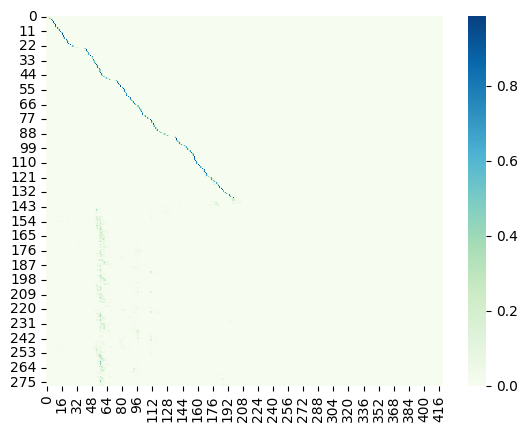

Saved best model

Epoch: 73/80


Val:   3%|▎         | 1/33 [00:02<01:33,  2.92s/it, dist=2.5800]

Ground Truth :  MODE PARE AND SLICE THE CUCUMBERS AS FOR THE TABLE SPRINKLE WELL WITH SALT AND LET THEM REMAIN FOR TWENTY FOUR HOURS STRAIN OFF THE LIQUOR PACK IN JARS A THICK LAYER OF CUCUMBERS AND SALT ALTERNATELY TIE DOWN CLOSELY AND WHEN WANTED FOR USE TAKE OUT THE QUANTITY REQUIRED
Prediction   :  MODE PARENT SLICE A CUCUMBERS AS FOR THE TABLE SPRINKLE WELL WITH SALT AND LET THEM REMAIN FOR TWENTY FOUR HOURS STRAIN OFF THE LIQUOR PACK IN JARS A THICK LAYER OF CUCUMBERS AND SALT ALTERNATELY TIE DOWN CLOSELY AND WHEN WANTED FOR USE TAKE OUT THE QUANTITY REQUIRED


Val:   6%|▌         | 2/33 [00:05<01:18,  2.55s/it, dist=2.4167]

Ground Truth :  AS LONG AS THERE'S A BONE ON THE FLOOR THE TWO OF YOU WORRY IT
Prediction   :  AS LONG AS THERE'S A BONE ON THE FLOOR THE TWO OF YOU WORRY IT


Val:   9%|▉         | 3/33 [00:07<01:16,  2.54s/it, dist=2.4333]

Ground Truth :  BY WHICH A SOUL IS DRAWN FROM ITS BODY AND ACROSS GULFS OF ECHOING SPACE RETURNED THE MAN ON THE MAT
Prediction   :  BY WHICH A SOUL IS DRAWN FROM ITS BODY AND ACROSS GULFS OF ECHOING SPACE RETURNED THE MAN ON THE MAT


Val:  12%|█▏        | 4/33 [00:10<01:13,  2.55s/it, dist=2.5483]

Ground Truth :  EVEN IF I CAN'T SING I CAN BEAT THAT
Prediction   :  EVEN IF I CAN'T SAYING I CAN BE THAT


Val:  15%|█▌        | 5/33 [00:12<01:09,  2.48s/it, dist=2.5427]

Ground Truth :  TEN SECONDS
Prediction   :  TEN SECONDS


Val:  18%|█▊        | 6/33 [00:14<01:05,  2.42s/it, dist=2.5311]

Ground Truth :  DEAR ME WHAT A CHATTERBOX YOU'RE GETTING TO BE UNC REMARKED THE MAGICIAN WHO WAS PLEASED WITH THE COMPLIMENT
Prediction   :  DEAR ME WHAT A CHATTERBOX YOU'RE GETTING TO BE UNC REMARKED THE MAGICIAN WHO WAS PLEASED WITH THE COMPLIMENT


Val:  21%|██        | 7/33 [00:17<01:02,  2.41s/it, dist=2.5714]

Ground Truth :  AT THESE BLASPHEMOUS SOUNDS THE PILLARS OF THE SANCTUARY WERE SHAKEN
Prediction   :  AT THESE BLASPHERMOUS SOUNDS THE PILLARS OF THE SANCTUARY WERE SHAKEN


Val:  24%|██▍       | 8/33 [00:19<00:59,  2.40s/it, dist=2.5700]

Ground Truth :  YOU SEE THE TREATMENT IS A TRIFLE FANCIFUL
Prediction   :  YOU SEE THE TREATMENT IS A TRIFLE FANCIFUL


Val:  27%|██▋       | 9/33 [00:22<00:56,  2.37s/it, dist=2.6030]

Ground Truth :  MASTER AND MAN DISMOUNTED FROM THEIR BEASTS AND AS SOON AS THEY HAD SETTLED THEMSELVES AT THE FOOT OF THE TREES SANCHO WHO HAD HAD A GOOD NOONTIDE MEAL THAT DAY LET HIMSELF WITHOUT MORE ADO PASS THE GATES OF SLEEP
Prediction   :  MASTER AND MAN DISMOUNTED FROM THEIR BEASTS AND AS SOON AS THEY HAD SETTLED THEMSELVES AT THE FOOT OF THE TREES SANCHO WHO HAD HAD A GOOD NOONTIME MEAL THAT DAY LET HIMSELF WITHOUT MORE ADO PAST THE GATES OF SLEEP


Val:  30%|███       | 10/33 [00:24<00:54,  2.36s/it, dist=2.5953]

Ground Truth :  THEN DARKNESS LIKE DEATH
Prediction   :  THEN DARKNESS LIKE DEATH


Val:  33%|███▎      | 11/33 [00:26<00:52,  2.37s/it, dist=2.6388]

Ground Truth :  BUT IF THE EMPERORS HAD BECOME CHRISTIAN THE EMPIRE HAD NOT
Prediction   :  BUT IF THE EMPERORS HAD BECOME CHRISTIAN THE EMPIRE HAD NOT


Val:  36%|███▋      | 12/33 [00:29<00:49,  2.35s/it, dist=2.6094]

Ground Truth :  AT THE CORNER OF MARKET AND EDDY STREETS IS THE ODEON DOWN IN A BASEMENT WITH DECORATIONS OF MOST GARISH ORDER
Prediction   :  AT THE CORNER OF MARKET AND EDDY STREETS IS THE ODION DOWN IN ABASEMENT WITH DECORATIONS OF MOST GARRISH ORDER


Val:  39%|███▉      | 13/33 [00:31<00:46,  2.34s/it, dist=2.5810]

Ground Truth :  AT LAST SO DARING DID HE BECOME THAT THE PROVINCIAL GOVERNMENT PLACED A PRICE UPON HIS HEAD AND UPON THOSE OF A NUMBER OF HIS MOST NOTORIOUS FOLLOWERS
Prediction   :  AT LAST SO DARING DID HE BECOME THAT THE PROVENTIAL GOVERNMENT PLACED THE PRICE UPON HIS HEAD AND UPON THOSE OF A NUMBER OF HIS MOST NOTORIOUS FOLLOWERS


Val:  42%|████▏     | 14/33 [00:33<00:45,  2.39s/it, dist=2.6248]

Ground Truth :  SHE MADE MISSUS SHIMERDA UNDERSTAND THE FRIENDLY INTENTION OF OUR VISIT AND THE BOHEMIAN WOMAN HANDLED THE LOAVES OF BREAD AND EVEN SMELLED THEM AND EXAMINED THE PIES WITH LIVELY CURIOSITY EXCLAIMING MUCH GOOD MUCH THANK
Prediction   :  SHE MADE MISSUS SHAMERE TO UNDERSTAND THE FRIENDLY INTENTION OF OUR VISIT AND THE BOHEMIAN WOMAN HANDLED THE LOAVES OF BREAD AND EVEN SMELLED THEM AND EXAMINED THE PIES WITH LIVELY CURIOSITY EXCLAIMING MUCH GOOD MUCH THANK


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.40s/it, dist=2.6533]

Ground Truth :  KNOWING THAT GOD SETS NO VALUE UPON MATERIAL THINGS HE TOOK WITH HIM NO OFFERINGS OR SACRIFICES OTHER THAN SYMBOLIC OBJECTS SUCH AS PAINTS AND TOBACCO
Prediction   :  KNOWING THE GOD SET SNOW VALUE UPON MATERIAL THINGS HE TOOK WITH A NO OFFERINGS OR SACRIFICE AS OTHER THAN SYNVOLOCH OBJECTS SUCH AS PAINTS AND TOMACCO


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.40s/it, dist=2.6246]

Ground Truth :  SANCHO SAID THEY HAD BUT THAT THREE KERCHIEFS THAT WERE WORTH THREE CITIES WERE MISSING
Prediction   :  SANCHO SAID THEY HAD BUT THAT THREE KERCHIEFS THAT WERE WORTH THREE CITIES WERE MISSING


Val:  52%|█████▏    | 17/33 [00:41<00:38,  2.38s/it, dist=2.6345]

Ground Truth :  WE ARE GOING INTO THE FOREST TO HEW WOOD AND IN THE EVENING WHEN WE ARE READY WE WILL COME AND FETCH YOU AGAIN
Prediction   :  WE ARE GOING INTO THE FOREST TO HEW WOOD AND IN THE EVENING ONE WHO ARE READY WE WILL COME INFECTUAL AGAIN


Val:  55%|█████▍    | 18/33 [00:43<00:36,  2.43s/it, dist=2.7293]

Ground Truth :  HIS AMBITION WAS SOME DAY TO BUILD A HOUSE ON THEM
Prediction   :  HIS AMBITION WAS SOME DAY TO BUILD A HOUSE ON THEM


Val:  58%|█████▊    | 19/33 [00:45<00:33,  2.39s/it, dist=2.7291]

Ground Truth :  THE VERY EMPERORS HAD ARRAYED THEMSELVES ON HER SIDE
Prediction   :  THE VERY EMPERORS HAD ARRAYED THEMSELVES ON HER SIDE


Val:  61%|██████    | 20/33 [00:48<00:30,  2.38s/it, dist=2.7073]

Ground Truth :  I FELT THAT IN MY FIRST PROFESSION AS I WAS NOT BLESSED WITH THE VOCATION NECESSARY TO IT I SHOULD HAVE SUCCEEDED ONLY BY DINT OF HYPOCRISY AND I SHOULD HAVE BEEN DESPICABLE IN MY OWN ESTIMATION EVEN IF I HAD SEEN THE PURPLE MANTLE ON MY SHOULDERS FOR THE GREATEST DIGNITIES CANNOT SILENCE A MAN'S OWN CONSCIENCE
Prediction   :  I FELT THAT IN MY FIRST PROFESSION AS I WAS NOT BLESSED WITH THE VOCATION NECESSARY TO IT I SHOULD HAVE SUCCEEDED ONLY BY DINT OF HYPOCRISY AND I SHOULD HAVE BEEN DESPICABLE IN MY OWN ESTIMATION EVEN IF I HAD SEEN THE PURPLE MANTLE ON MY SHOULDERS FOR THE GREATEST DIGNITIES CANNOT SILENCE A MAN'S OWN CONSCIOUS


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.38s/it, dist=2.7010]

Ground Truth :  HE WATCHED HIM GESTICULATING AND MURMURING IN THE KITCHEN
Prediction   :  HE WATCHED AND TESTICULATED A MURMURING IN THE KETCHEN


Val:  67%|██████▋   | 22/33 [00:53<00:26,  2.39s/it, dist=2.6870]

Ground Truth :  AND I SHE WHISPERED I FELT THAT YOU WERE FEELING THAT
Prediction   :  AND I SHE WHISPERED I FELT THAT YOU WERE FEELING THAT


Val:  70%|██████▉   | 23/33 [00:55<00:24,  2.43s/it, dist=2.7536]

Ground Truth :  SHE WOULD HAVE SHARED HIS SORROW AND SHOWN HERSELF HALF WIFE HALF ANGEL FROM HEAVEN IN THIS DARK HOUR
Prediction   :  SHE WOULD HAVE SHARED HIS SORROW AND SHOWN HERSELF HALF LIFE HALF ANGEL FROM HEAVEN IN THIS DARK HOUR


Val:  73%|███████▎  | 24/33 [00:58<00:22,  2.45s/it, dist=2.8064]

Ground Truth :  WE DO NOT HATE YOU AS YOU SAY THE BLUESKINS DO NOR ARE WE SAVAGE OR CRUEL BUT WE DO NOT WANT YOU HERE AND I AM REALLY PUZZLED WHAT TO DO WITH YOU
Prediction   :  WE DO NOT HAY YOU AS YOU SAY THE BLUE SKINS DO NOR ALWAYS SAVAGE OR CRUEL BUT WE DO NOT WANT YOU HERE AND I'M REALLY PUZZLED WHAT TO DO WITH YOU


Val:  76%|███████▌  | 25/33 [01:00<00:19,  2.46s/it, dist=2.7963]

Ground Truth :  TWO OR THREE MILES FARTHER ON IS THE MAIN STRONGHOLD OF THE MODOCS HELD BY THEM SO LONG AND DEFIANTLY AGAINST ALL THE SOLDIERS THAT COULD BE BROUGHT TO THE ATTACK
Prediction   :  TWO OR THREE MILES FARTHER ON IS THE MAIN STRONGHOLD OF THE MODOCS HELD BY THEM SO LONG AND DEFIANTLY AGAINST ALL THE SOLDIERS THAT COULD BE BROUGHT TO THE ATTACK


Val:  79%|███████▉  | 26/33 [01:02<00:17,  2.44s/it, dist=2.7867]

Ground Truth :  HURSTWOOD ALMOST EXCLAIMED OUT LOUD AT THE INSISTENCY OF THIS THING
Prediction   :  HURSTWOOD ALMOST EXCLAIMED OUTLOUD AT THE INSISTENCY OF THIS THING


Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.41s/it, dist=2.7536]

Ground Truth :  YOU WANT ME TO SAY IT SHE WHISPERED
Prediction   :  YOU WANT ME TO SAY IT SHE WHISPERED


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.39s/it, dist=2.7295]

Ground Truth :  AT THIS TIME GRANT WAS NOT TAKEN WITH WAR AND PROBABLY EVINCED LITTLE INTEREST IN ARMY TACTICS
Prediction   :  AT THIS TIME GRANT WAS NOT TAKEN WITH MORE AND PUBLICLY EVEN SLITTLE INTEREST IN ARMY TACTICS


Val:  88%|████████▊ | 29/33 [01:10<00:09,  2.41s/it, dist=2.7425]

Ground Truth :  JUST AN EVERYDAY DETECTIVE BUT AMBITIOUS I SUPPOSE AND QUITE ALIVE TO THE IMPORTANCE OF BEING THOROUGH
Prediction   :  JUST AN EVERY DAY DETECTIVE BUT AMBITIOUS I SUPPOSE AND QUITE ALIVE TO THE IMPORTANCE OF BEING THOROUGH


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.43s/it, dist=2.7624]

Ground Truth :  THAT SOLITARY COMMUNION WITH THE UNSEEN WHICH WAS THE HIGHEST EXPRESSION OF OUR RELIGIOUS LIFE IS PARTLY DESCRIBED IN THE WORD BAMBEDAY LITERALLY MYSTERIOUS FEELING WHICH HAS BEEN VARIOUSLY TRANSLATED FASTING AND DREAMING
Prediction   :  THAT SOLITARY COMMUNION WITH THE YOUNG SCENE WHICH WAS THE HIGHEST EXPRESSION OF OUR RELIGIOUS LIFE HIS PARTLY DESCRIBED IN THE WORD BANDAY LITERALLY MYSTERIOUS FEWING WHICH HAS BEEN THERE AS THE TRANSITED FASTING IN DREAMING


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.35s/it, dist=2.7533]

Ground Truth :  BUT BY THE LARGESS OF CELESTIAL GRACES WHICH HAVE SUCH LOFTY VAPOURS FOR THEIR RAIN THAT NEAR TO THEM OUR SIGHT APPROACHES NOT
Prediction   :  BUT BY THE LARGEST OF CELESTIAL GRACES WHICH HAVE SUCH LOFTY VAPOURS FOR THEIR REIGN THAT NEAR TO THEM OUR SIGHT APPROACHES NOT


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.32s/it, dist=2.7517]

Ground Truth :  SHE POINTED INTO THE GOLD COTTONWOOD TREE BEHIND WHOSE TOP WE STOOD AND SAID AGAIN WHAT NAME
Prediction   :  SHE POINTED INTO THE GOLD COTTONWOOD TREE BEHIND WHOSE TOP WE STOOD AND SAID AGAIN WHAT NAME


Val: 100%|██████████| 33/33 [01:18<00:00,  1.95s/it, dist=2.7562]

Ground Truth :  THUS THE SHASTA RIVER ISSUES FROM A LARGE LAKE LIKE SPRING IN SHASTA VALLEY AND ABOUT TWO THIRDS OF THE VOLUME OF THE MC CLOUD GUSHES FORTH IN A GRAND SPRING ON THE EAST SIDE OF THE MOUNTAIN A FEW MILES BACK FROM ITS IMMEDIATE BASE
Prediction   :  THUS THE SHASTA RIVER ISSUES FROM A LARGE LAKE LIKE SPRING IN SHASTA VALLEY AND ABOUT TWO THIRDS OF THE VOLUME OF THE MC CLOUD GUSHES FORTH IN A GRAND SPRING ON THE EAST SIDE OF THE MOUNTAIN A FEW MILES BACK FROM ITS IMMEDIATE BASE


	Train Loss 0.0727	 Learning Rate 0.0000412
	Val Dist 2.7562	
	Teacher Forcing Ratio 1	


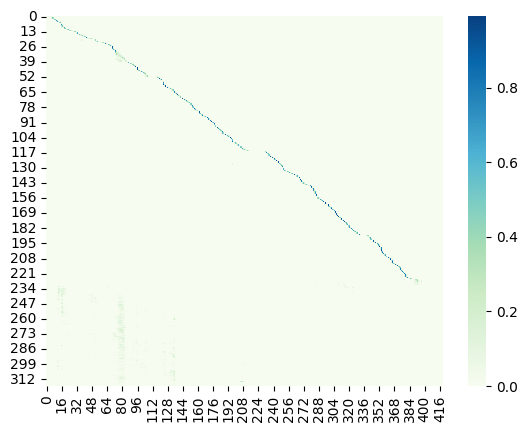


Epoch: 74/80


Val:   3%|▎         | 1/33 [00:02<01:31,  2.84s/it, dist=3.2133]

Ground Truth :  ARE YOU REALLY GOING TO THROW ME OVER FOR A THING LIKE THIS
Prediction   :  I REALLY GOING TO THROW ME OVER FOR THING LIKE THIS


Val:   6%|▌         | 2/33 [00:05<01:19,  2.57s/it, dist=2.9800]

Ground Truth :  THE MOST GIFTED INDIVIDUALS IN THE LAND EMULATED EACH OTHER IN PROVING WHICH ENTERTAINED FOR HIM THE MOST SINCERE AFFECTION
Prediction   :  THE MOST SKIFFED INDIVIDUALS IN THE LAND AMULATED EACH OTHER IMPROVING WHICH ENTERTAINED FOR HIM THE MOST SINCERE AFFECTION


Val:   9%|▉         | 3/33 [00:07<01:14,  2.49s/it, dist=2.8978]

Ground Truth :  AT THAT EPOCH OF PRISTINE SIMPLICITY HOWEVER MATTERS OF EVEN SLIGHTER PUBLIC INTEREST AND OF FAR LESS INTRINSIC WEIGHT THAN THE WELFARE OF HESTER AND HER CHILD WERE STRANGELY MIXED UP WITH THE DELIBERATIONS OF LEGISLATORS AND ACTS OF STATE
Prediction   :  AT THAT EPOCH OF PRISTINE SIMPLICITY HOWEVER MATTERS OF EVEN SLIGHTER PUBLIC INTEREST AND OF FAR LESS INTRINSIC WEIGHT THAN THE WELFARE OF HESTER AND HER CHILD WERE STRANGELY MIXED UP WITH THE DELIBERATIONS OF LEGISLATORS AND ACTS OF STATE


Val:  12%|█▏        | 4/33 [00:10<01:11,  2.47s/it, dist=2.7100]

Ground Truth :  IN THE PRESENT UNSETTLED THOUGH HOPEFUL STATE OF AFFAIRS FERDINAND WOULD NOT GO HOME
Prediction   :  IN THE PRESENT UNSETTLED THOUGH HOPEFUL STATE OF AFFAIRS FERDINAND WOULD NOT GO HOME


Val:  15%|█▌        | 5/33 [00:12<01:07,  2.42s/it, dist=3.0653]

Ground Truth :  ALL DAY THE BAR BEING CLOSED HE BROODED ALONE SHUT OUT FROM HOME FROM THE EXCITEMENT OF HIS RESORT FROM CARRIE AND WITHOUT THE ABILITY TO ALTER HIS CONDITION ONE IOTA
Prediction   :  ALL DAY THE BAR BEING CLOSED HE RUDED ALONE SHUT OUT FROM HOME FROM THE EXCITEMENT OF HIS RESORT FROM CARRY AND WITHOUT THE ABILITY TO ALTER HIS CONDITION ONE IODA


Val:  18%|█▊        | 6/33 [00:14<01:04,  2.40s/it, dist=2.8156]

Ground Truth :  ILLUSTRATION SAGE
Prediction   :  ILLUSTRATION SAGE


Val:  21%|██        | 7/33 [00:17<01:02,  2.40s/it, dist=2.7771]

Ground Truth :  SURELY YOU ARE NOT THINKING OF GOING OFF THERE
Prediction   :  SURELY YOU ARE NOT THINKING OF GOING OFF THERE


Val:  24%|██▍       | 8/33 [00:19<01:00,  2.43s/it, dist=2.7250]

Ground Truth :  THE OLD TERRORIST TURNED SLOWLY HIS HEAD ON HIS SKINNY NECK FROM SIDE TO SIDE
Prediction   :  THE OLD TERRORS TURNED SLOWLY HIS HEAD ON HIS SKINNY NECK FROM SIDE TO SIDE


Val:  27%|██▋       | 9/33 [00:22<00:58,  2.43s/it, dist=2.7770]

Ground Truth :  I LIKE TO TALK TO CARL ABOUT NEW YORK AND WHAT A FELLOW CAN DO THERE
Prediction   :  I LIKED TO TALK TO CARL ABOUT NEW YORK AND WHAT A FELLOW CAN DO THERE


Val:  30%|███       | 10/33 [00:24<00:55,  2.42s/it, dist=2.8453]

Ground Truth :  NOW MISTER SOAMES AT YOUR DISPOSAL
Prediction   :  NOW MISTER SOAMES AT YOUR DISPOSAL


Val:  33%|███▎      | 11/33 [00:26<00:53,  2.41s/it, dist=2.8448]

Ground Truth :  ALL THE SAME HE LIFTED HIS GLASS HERE'S TO YOU LITTLE HILDA
Prediction   :  ALL THE SAME HE LIFTED HIS GLASS HERE'S TO YOU LITTLE HILDA


Val:  36%|███▋      | 12/33 [00:29<00:50,  2.40s/it, dist=2.8067]

Ground Truth :  AND THE ONLY TRUCK WE HAD AVAILABLE WAS IN THAT BURNING SHED THE SUPERINTENDENT ADDED BITTERLY
Prediction   :  AND THE ONLY TRUCK WE HAD AVAILABLE WAS IN THAT BURNING SHED THE SUPERINTENDENT ADDED BITTERLY


Val:  39%|███▉      | 13/33 [00:31<00:48,  2.41s/it, dist=2.8538]

Ground Truth :  HELLO BERTIE ANY GOOD IN YOUR MIND
Prediction   :  HELLO BURTY AND HE GOOD IN YOUR MIND


Val:  42%|████▏     | 14/33 [00:33<00:45,  2.37s/it, dist=2.8495]

Ground Truth :  AH BUT THESE HENS ANSWERED THE YOUNG MAN THESE HENS OF ARISTOCRATIC LINEAGE WOULD SCORN TO UNDERSTAND THE VULGAR LANGUAGE OF A BARN YARD FOWL
Prediction   :  AH BUT THESE HENS ANSWERED THE YOUNG MAN THESE HENS OF ARISTOCRATIC LINEAGE WOULD SCORN TO UNDERSTAND THE VULGAR LANGUAGE OF A BARN YARD FOWL


Val:  45%|████▌     | 15/33 [00:36<00:42,  2.36s/it, dist=2.8973]

Ground Truth :  HE PUT ON HIS HAT AND LOOKED AROUND FOR HIS UMBRELLA
Prediction   :  HE PUT ON HIS HAT AND LOOKED AROUND FOR HIS UMBRELLA


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.38s/it, dist=2.9217]

Ground Truth :  CAN THESE THINGS BE RETURNED DAVID BREATHING MORE FREELY AS THE TRUTH BEGAN TO DAWN UPON HIM
Prediction   :  CAN THESE THINGS BE RETURNED DAVID BREATHING MORE FREELY AS THE TRUTH BEGAN TO DAWN UPON HIM


Val:  52%|█████▏    | 17/33 [00:41<00:38,  2.38s/it, dist=2.8992]

Ground Truth :  THEN TOM WHO HAD BEEN STUNNED BY SOME FALLING DEBRIS RAISED HIMSELF TO A SITTING POSITION
Prediction   :  THEN TOM WHO HAD BEEN STUNNED BY SOME FALLING DEBRIS RAISED HIMSELF TO A SITTING POSITION


Val:  55%|█████▍    | 18/33 [00:43<00:36,  2.41s/it, dist=2.8756]

Ground Truth :  ONLY NAME IT WHATEVER I HAVE I OFFER THEE
Prediction   :  ONLY NAME AT WHATEVER I HAVE I OFFER THEE


Val:  58%|█████▊    | 19/33 [00:46<00:34,  2.46s/it, dist=2.8793]

Ground Truth :  IT WAS INDEED DANCING ON A VOLCANO
Prediction   :  IT WAS INDEED DANCING ON OUR BOCK HINO


Val:  61%|██████    | 20/33 [00:48<00:32,  2.49s/it, dist=2.8530]

Ground Truth :  NO MISTER HARDWIGG SAID THE CAPTAIN NO FEAR OF THAT
Prediction   :  NO MISTER HARDWIG SAID THE CAPTAIN NO FEAR OF THAT


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.39s/it, dist=2.8092]

Ground Truth :  AT THE SAME TIME EVERY AVENUE OF THE THRONE WAS ASSAULTED WITH GOLD
Prediction   :  AT THE SAME TIME EVERY AVENUE OF THE THRONE WAS ASSAULTED WITH GOLD


Val:  67%|██████▋   | 22/33 [00:53<00:26,  2.40s/it, dist=2.8209]

Ground Truth :  NOW HELICON MUST NEEDS POUR FORTH FOR ME AND WITH HER CHOIR URANIA MUST ASSIST ME TO PUT IN VERSE THINGS DIFFICULT TO THINK
Prediction   :  NOW HELEQUIN MUST NEEDS POOR FORTH FOR ME AND WITH HER QUIET EUROPEANIA MUST ASSIST ME TO PUT INVERSE THINGS DIFFICULT TO THINK


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.34s/it, dist=2.8003]

Ground Truth :  AND YET IF YOU COULD ONLY SEE THE BENIGN SMILE OF THE ORIGINAL
Prediction   :  AND YET IF YOU COULD ONLY SEE THE BENIGN SMILE OF THE ORIGINAL


Val:  73%|███████▎  | 24/33 [00:57<00:20,  2.33s/it, dist=2.8642]

Ground Truth :  WE CAN ALL BE SERVANTS OF GOD WHEREVER OUR LOT IS CAST BUT HE GIVES US DIFFERENT SORTS OF WORK ACCORDING AS HE FITS US FOR IT AND CALLS US TO IT
Prediction   :  WE CAN ALL BE SERVANTS OF GOD WHEREVER OUR LOT IS CAST BUT HE GIVES US DIFFERENT SORTS OF WORK ACCORDING AS HE FITS US FOR IT AND CALLS US TO IT


Val:  76%|███████▌  | 25/33 [01:00<00:18,  2.37s/it, dist=2.8752]

Ground Truth :  I THOUGHT MISS MILNER YOU GAVE ME YOUR WORD THAT YOU WOULD PASS THIS EVENING AT HOME
Prediction   :  I THOUGHT MISS MILNER YOU GAVE ME YOUR WORD THAT YOU WOULD PASS THIS EVENING AT HOME


Val:  79%|███████▉  | 26/33 [01:02<00:17,  2.43s/it, dist=2.8421]

Ground Truth :  BUT IF I PLAY YOU A ROUNDEL LADY GET ME A GIFT FROM THE EMPEROR'S DAUGHTER HER FINGER RING FOR MY FINGER BRING THOUGH SHE'S PLEDGED A THOUSAND LEAGUES OVER THE WATER LADY LADY MY FAIR LADY O MY ROSE WHITE LADY
Prediction   :  BUT IF I PLAY YOU A ROUNDEL LADY GET ME A GIFT FROM THE EMPEROR'S DAUGHTER HER FINGER RING FOR MY FINGER BRING THOUGH SHE'S PLEDGED A THOUSAND LEAGUES OVER THE WATER LADY LADY MY FAIR LADY OH MY ROSE WHITE LADY


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.34s/it, dist=2.8365]

Ground Truth :  ONE OR TWO OF THE MUSICIANS FROM THE END OF THE HALL
Prediction   :  ONE OR TWO OF THE MUSICIANS FROM THE END OF THE HALL


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.32s/it, dist=2.8286]

Ground Truth :  BUT WILL HE THANK ME FOR IT
Prediction   :  BUT WILL HE THANK ME FOR IT


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.36s/it, dist=2.8368]

Ground Truth :  THE MAN SHRUGGED HIS BROAD SHOULDERS AND TURNED BACK INTO THE ARABESQUE CHAMBER
Prediction   :  THE MAN SHRUGGED HIS BROAD SHOULDERS AND TURNED BACK INTO THE ARABESQUE CHAMBER


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.40s/it, dist=2.8416]

Ground Truth :  WHAT DO YOU MAKE OF IT GRYCE
Prediction   :  WHAT DO YOU MAKE OF IT GRYCE


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.40s/it, dist=2.8553]

Ground Truth :  NO A VERY NATURAL ONE I SHOULD SAY
Prediction   :  NO A VERY NATURAL ONE I WISH SHOULD SAY


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.35s/it, dist=2.8402]

Ground Truth :  IT IS A VERY FINE OLD PLACE OF RED BRICK SOFTENED BY A PALE POWDERY LICHEN WHICH HAS DISPERSED ITSELF WITH HAPPY IRREGULARITY SO AS TO BRING THE RED BRICK INTO TERMS OF FRIENDLY COMPANIONSHIP WITH THE LIMESTONE ORNAMENTS SURROUNDING THE THREE GABLES THE WINDOWS AND THE DOOR PLACE
Prediction   :  IT IS A VERY FINE OLD PLACE OF RED BRICK SOFTENED BY A PALE POWDERY LICHEN WHICH HAS DISPERSED ITSELF WITH HAPPY IRREGULARITY SO AS TO BRING THE RED BRICK INTO TERMS OF FRIENDLY COMPANIONSHIP WITH THE LIMESTONE ORNAMENTS SURROUNDING THE THREE GABLES THE WINDOWS AND THE DOORPLACE


Val: 100%|██████████| 33/33 [01:17<00:00,  1.96s/it, dist=2.8231]

Ground Truth :  I SHOULD LIKE TO SEE THE DESK YOU SPEAK OF AND THE SPOT WHERE SHE FELL
Prediction   :  I SHOULD LIKE TO SEE THE DESK YOU SPEAK OF AND THE SPOT WHERE SHE FELL


	Train Loss 0.0716	 Learning Rate 0.0000329
	Val Dist 2.8231	
	Teacher Forcing Ratio 1	


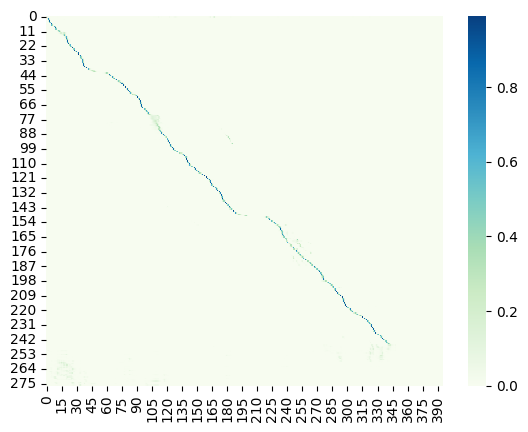


Epoch: 75/80


Val:   3%|▎         | 1/33 [00:03<01:36,  3.01s/it, dist=2.6600]

Ground Truth :  WHAT DOES HE WANT
Prediction   :  WHAT DOES HE WANT


Val:   6%|▌         | 2/33 [00:05<01:22,  2.65s/it, dist=2.3267]

Ground Truth :  AS TO ANY OTHER KIND OF DISCIPLINE WHETHER ADDRESSED TO HER MIND OR HEART LITTLE PEARL MIGHT OR MIGHT NOT BE WITHIN ITS REACH IN ACCORDANCE WITH THE CAPRICE THAT RULED THE MOMENT
Prediction   :  AS TO ANY OTHER KIND OF DISCIPLINE WHETHER ADDRESSED TO HER MIND OR HEART LITTLE PEARL MIGHT OR MIGHT NOT BE WITHIN ITS REACH IN ACCORDANCE WITH THE CAPRICE THAT RULED THE MOMENT


Val:   9%|▉         | 3/33 [00:07<01:16,  2.54s/it, dist=2.3311]

Ground Truth :  A MOMENT BEFORE THE GHOST OF THE ANCIENT KINGDOM OF THE DANES HAD LOOKED FORTH THROUGH THE VESTURE OF THE HAZEWRAPPED CITY
Prediction   :  A MOMENT BEFORE THE GHOST OF THE ANCIENT KINGDOM OF THE DAINS HAD LOOKED FORTH THROUGH THE VESTURE OF THE HAZEWRAPPED CITY


Val:  12%|█▏        | 4/33 [00:10<01:11,  2.47s/it, dist=2.5183]

Ground Truth :  THEY TALKED FOR FOUR HOURS AND HAD NOT THEN SAID HALF THAT WAS IN THEIR HEADS TO SAY
Prediction   :  THEY TALKED FOR FOUR HOURS AND HAD NOT THEN SAID HALF THAT WAS IN THEIR HEADS TO SAY


Val:  15%|█▌        | 5/33 [00:12<01:08,  2.43s/it, dist=2.7467]

Ground Truth :  ARE YOU REALLY GOING TO THROW ME OVER FOR A THING LIKE THIS
Prediction   :  I REALLY GOING TO THROW ME OVER FOR THING LIKE THIS


Val:  18%|█▊        | 6/33 [00:14<01:05,  2.44s/it, dist=2.7622]

Ground Truth :  THE FLOORS WERE COVERED WITH MATTING AND THE HALL LAID WITH A THIN RAG CARPET
Prediction   :  THE FLOORS WERE COVERED WITH MATTING AND THE HALL LAID WITH A THIN RAG CARPET


Val:  21%|██        | 7/33 [00:17<01:03,  2.45s/it, dist=2.8124]

Ground Truth :  IF YOU'D SENT ME A NOTE OR TELEPHONED ME OR ANYTHING
Prediction   :  IF YOU'D SENT ME A NOTE OR TELEPHONED ME OR ANYTHING


Val:  24%|██▍       | 8/33 [00:19<01:00,  2.42s/it, dist=2.7208]

Ground Truth :  THE STORY'S WRITTEN
Prediction   :  THE STORY'S WRITTEN


Val:  27%|██▋       | 9/33 [00:22<00:57,  2.39s/it, dist=2.7511]

Ground Truth :  WELL TOO IF HE LIKE LOVE WOULD FILCH OUR HOARD WITH PLEASURE TO OURSELVES SLUICING OUR VEIN AND VIGOUR TO PERPETUATE THE STRAIN OF LIFE BY SPILTH OF LIFE WITHIN US STORED
Prediction   :  WELL TOO IF HE LIKE LOVE WOULD FILL CHARHORD WITH PLEASURE TO OURSELVES SLOOSING OUR VEIN AND VIGOUR TO PERPETUATE THE STRAIN OF A LIFE BY SPILT OF LIFE WITHIN US STORED


Val:  30%|███       | 10/33 [00:24<00:55,  2.43s/it, dist=2.7227]

Ground Truth :  AND BOZZLE AS HE SAID THIS SMILED ALMOST ALOUD
Prediction   :  AND BOZZLE AS HE SAID THIS SMILED ALMOST ALOUD


Val:  33%|███▎      | 11/33 [00:27<00:53,  2.45s/it, dist=2.7230]

Ground Truth :  YES
Prediction   :  YES


Val:  36%|███▋      | 12/33 [00:29<00:50,  2.43s/it, dist=2.7017]

Ground Truth :  LARGE FLOCKS DWELL HERE FROM YEAR TO YEAR WINTER AND SUMMER DESCENDING OCCASIONALLY INTO THE ADJACENT SAGE PLAINS AND LAVA BEDS TO FEED BUT EVER READY TO TAKE REFUGE IN THE JAGGED CRAGS OF THEIR MOUNTAIN AT EVERY ALARM
Prediction   :  LARGE FLOCKS DWELL HERE FROM YEAR TO YEAR WINTER AND SUMMER DESCENDING OCCASIONALLY INTO THE ADJACENT SAGE PLAINS AND LAVA BEDS TO FEED BUT EVER READY TO TAKE REFUGE IN THE JAGGED CRAGS OF THEIR MOUNTAIN AT EVERY ALARM


Val:  39%|███▉      | 13/33 [00:31<00:48,  2.40s/it, dist=2.6708]

Ground Truth :  A LOW CONFUSED MOAN WANED FROM HIS MOUTH
Prediction   :  A LOW CONFUSED MOAN WANED FROM HIS MOUTH


Val:  42%|████▏     | 14/33 [00:34<00:44,  2.36s/it, dist=2.8095]

Ground Truth :  THEN SHE TURNED TOWARDS THE QUARTER INDICATED AND DISAPPEARED ROUND THE LAUREL BUSHES
Prediction   :  THEN SHE TURNED TOWARDS THE QUARTER INDICATED IN DISAPPEARED ROUND THE LORABUSHES


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.39s/it, dist=2.8049]

Ground Truth :  HER THOUGHTS RAN ON JEM'S MANNER AND WORDS NOT BUT WHAT SHE HAD KNOWN THE TALE THEY TOLD FOR MANY A DAY BUT STILL SHE WISHED HE HAD NOT PUT IT SO PLAINLY
Prediction   :  HER THOUGHT THREN ON JEM'S MANNER AND WORDS NOT BUT WHAT SHE HAD KNOWN THE TAIL THEY TOLD FOR MANY A DAY BUT STILL SHE WISHED HE HAD NOT PUT IT SO PLAINLY


Val:  48%|████▊     | 16/33 [00:38<00:39,  2.35s/it, dist=2.7687]

Ground Truth :  THEY STAND UNMOVED IN THEIR SOLITARY GREATNESS WELL ASSURED THAT THEY ARE SEEN OF ALL THE WORLD WITHOUT ANY EFFORT TO SHOW THEMSELVES OFF AND THAT NO ONE WILL ATTEMPT TO DRIVE THEM FROM THAT POSITION
Prediction   :  THEY STAND UNMOVED IN THEIR SOLITARY GREATNESS WELL ASSURED THAT THEY ARE SEEN OF ALL THE WORLD WITHOUT ANY EFFORT TO SHOW THEMSELVES OFF AND THAT NO ONE WILL ATTEMPT TO DRIVE THEM FROM THAT POSITION


Val:  52%|█████▏    | 17/33 [00:41<00:37,  2.34s/it, dist=2.7251]

Ground Truth :  HE HAS GRAVE DOUBTS WHETHER SIR FREDERICK LEIGHTON'S WORK IS REALLY GREEK AFTER ALL AND CAN DISCOVER IN IT BUT LITTLE OF ROCKY ITHACA
Prediction   :  HE HAS GRAVE DOUBTS WHETHER SIR FREDERICK LATEN'S WORK IS REALLY GREEK AFTER ALL AND CAN DISCOVER IN IT BUT LITTLE OF ROCKY ITHACA


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.34s/it, dist=2.7100]

Ground Truth :  HE WAS IN REVERIE SLIDING ALONG THE BORDERS OF CONSCIOUSNESS
Prediction   :  HE WAS IN REVERY SLIDING ALONG THE BORDERS OF CONSCIOUSNESS


Val:  58%|█████▊    | 19/33 [00:45<00:32,  2.34s/it, dist=2.7193]

Ground Truth :  LOOK AT ME WELL IN SOOTH I'M BEATRICE
Prediction   :  LOOK AT ME WELL IN SOUTH I'M THE ATTRACE


Val:  61%|██████    | 20/33 [00:48<00:31,  2.39s/it, dist=2.7157]

Ground Truth :  THE ONLY DUPLICATE WHICH EXISTED SO FAR AS I KNEW WAS THAT WHICH BELONGED TO MY SERVANT BANNISTER A MAN WHO HAS LOOKED AFTER MY ROOM FOR TEN YEARS AND WHOSE HONESTY IS ABSOLUTELY ABOVE SUSPICION
Prediction   :  THE ONLY DUPLICATE WHICH EXISTED SO FAR AS I KNEW WAS THAT WHICH BELONGED TO MY SERVANT BANISTER A MAN WHO HAS LOOKED AFTER MY ROOM FOR TEN YEARS AND WHOSE HONESTY IS ABSOLUTELY ABOVE SUSPICION


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.40s/it, dist=2.7648]

Ground Truth :  I TOLD TOM WE SHOULDN'T COME SO LATE SAYS HILDA
Prediction   :  I TOLD TOM WE SHOULDN'T COME SO LATE SAYS HILDA


Val:  67%|██████▋   | 22/33 [00:52<00:25,  2.33s/it, dist=2.7245]

Ground Truth :  FOR WHEN I WAS A LITTLE GIRL WE ALWAYS HAD LOGS OF WOOD BLAZING IN AN OPEN FIREPLACE AND SO DID MANY OTHER PEOPLE AND COAL WAS JUST COMING INTO USE FOR FUEL
Prediction   :  FOR WHEN I WAS A LITTLE GIRL WE ALWAYS HAD LOGS OF WOOD BLAZING IN AN OPEN FIREPLACE AND SO DID MANY OTHER PEOPLE AND COAL WAS JUST COMING INTO USE FOR FUEL


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.36s/it, dist=2.7104]

Ground Truth :  JOHN TAIT IS THE PRESIDING SPIRIT HERE HE HAVING MADE REPUTATION AS CLUB MANAGER AND THEN AS MANAGER OF THE CLIFF HOUSE
Prediction   :  JOHN TATE IS THE PRESIDING SPIRIT HERE HE HAVING MADE REPUTATION AS CLUB MANAGER AND THEN AS MANAGER OF THE CLIFF HOUSE


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.37s/it, dist=2.7561]

Ground Truth :  BUT IN THIS AWFUL MOMENT OF THE DANGER OF THE CHURCH THEIR VOW WAS SUPERSEDED BY A MORE SUBLIME AND INDISPENSABLE DUTY
Prediction   :  BUT IN THIS AWFUL MOMENT OF THE DANGER OF THE CHURCH THEIR VOW WAS SUPERSEDED BY A MORE SUBLIME AND INDISPENSABLE DUTY


Val:  76%|███████▌  | 25/33 [01:00<00:19,  2.40s/it, dist=2.7456]

Ground Truth :  HE HELD A HOE IN HIS HAND AND WHILE PHOEBE WAS GONE IN QUEST OF THE CRUMBS HAD BEGUN TO BUSY HIMSELF WITH DRAWING UP FRESH EARTH ABOUT THE ROOTS OF THE TOMATOES
Prediction   :  HE HELD A HOE IN HIS HAND AND WHILE PHOEBE WAS GONE IN QUEST OF THE CRUMBS HAD BEGUN TO BUSY HIMSELF WITHDRAWING UP FRESH EARTH ABOUT THE ROOTS OF THE TOMATOES


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.42s/it, dist=2.7838]

Ground Truth :  CLAUDIA WOULD NOT ON ANY ACCOUNT ALLOW HIM TO ACCOMPANY HER AND THANKING HIM FOR HIS OFFERS AS WELL AS SHE COULD TOOK LEAVE OF HIM IN TEARS
Prediction   :  CLAUDIA WOULD NOT ON ANY ACCOUNT ALLOW HIM TO ACCOMPANY HER AND THANKING HIM FOR HIS OFFERS AS WELL AS SHE COULD TOOK LEAVE OF HIM IN TEARS


Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.42s/it, dist=2.7785]

Ground Truth :  GALLOPING INTO CAMP THE BOY FETCHED HIS SOMBRERO WHICH HE CARRIED WELL OUT INTO THE FIELD AND TOSSED AWAY
Prediction   :  GALLOPING IT TO CAMP THE BOY FITCHED TO SOMEBORROW WHICH YOU CARRIED WELL OUT INTO THE FILLED AND TOSSED AWAY


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.39s/it, dist=2.7600]

Ground Truth :  THE WALLS OF THE ROOMS WERE DISCORDANTLY PAPERED
Prediction   :  THE WALLS OF THE ROOMS WERE DISCORDANTLY PAPERED


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.35s/it, dist=2.7526]

Ground Truth :  THERE WAS A TRAP AT THE BOY AND BLUNDERBUSS BUT THAT REQUIRED FETCHING
Prediction   :  THERE WAS A TRAP AT THE BOY AND BLUNDERBUSS BUT THAT REQUIRED FETCHING


Val:  91%|█████████ | 30/33 [01:11<00:06,  2.28s/it, dist=2.7253]

Ground Truth :  AFTER JUPITER HAD BOUND PROMETHEUS ON MOUNT CAUCASUS AND HAD SENT DISEASES AND CARES INTO THE WORLD MEN BECAME VERY VERY WICKED
Prediction   :  AFTER JUPITER HAD BOUND PROMETHIUS ON MOUNT COCCASES AND HAD SENT DISEASES AND CARES AND THE WORLD MEN BECAME VERY VERY WICKED


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.31s/it, dist=2.7585]

Ground Truth :  THE LONG PEPPER IS LESS AROMATIC THAN THE BLACK BUT ITS OIL IS MORE PUNGENT
Prediction   :  THE LONG PEPPER IS LESS AROMATIC THAN THE BLACK BUT ITS OIL IS MORE PUNGENT


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.38s/it, dist=2.7542]

Ground Truth :  ALL WATERS THAT ON EARTH MOST LIMPID ARE WOULD SEEM TO HAVE WITHIN THEMSELVES SOME MIXTURE COMPARED WITH THAT WHICH NOTHING DOTH CONCEAL
Prediction   :  ALL WATERS THAT AN EARTH MOST LIMBID ARE WOULD SEEM TO HAVE WITHIN THEMSELVES SOME MIXTURE COMPARED WITH THAT WHICH NOTHING DOTH CONCEAL


Val: 100%|██████████| 33/33 [01:17<00:00,  1.96s/it, dist=2.7616]

Ground Truth :  LET BUT A MOOD BE STRONG ENOUGH AND THE SOUL CLOTHING ITSELF IN THAT MOOD AS WITH A GARMENT CAN WALK ABROAD AND HAUNT THE WORLD
Prediction   :  LET BUT A MOOD BE STRONG ENOUGH IN A SOUL CLOTHING ITSELF IN THAT MOOD IS WITH A GARMENT CAN WALK ABROAD AND HAUNT THE WORLD


	Train Loss 0.0697	 Learning Rate 0.0000254
	Val Dist 2.7616	
	Teacher Forcing Ratio 1	


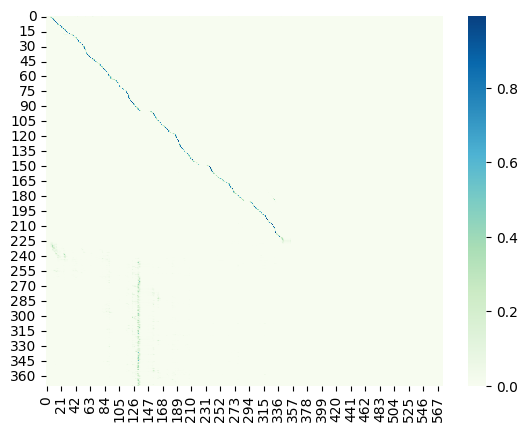


Epoch: 76/80


Val:   3%|▎         | 1/33 [00:03<01:36,  3.01s/it, dist=3.0667]

Ground Truth :  I KNOW WHAT MAMMA CAN AFFORD TO GIVE AND I WILL SEE SHE GIVES IT
Prediction   :  I KNOW WHAT MAMMA CAN AFFORD TO GIVE AND I WILL SEE IF SHE GIVES IT


Val:   6%|▌         | 2/33 [00:05<01:18,  2.52s/it, dist=2.5633]

Ground Truth :  HE WANTS ME TO STAND READY TO OBEY ANY SUMMONS THE POLICE MAY SEND ME
Prediction   :  HE WANTS ME TO STAND READY TO OBEY ANY SUMMONS THE POLICE MAY SEND ME


Val:   9%|▉         | 3/33 [00:07<01:11,  2.38s/it, dist=2.2800]

Ground Truth :  UNDER THE SAME QUIET MOONLIGHT AND ONLY SIX HUNDRED YARDS AWAY FROM US ALSO LAY THE VICTORIOUS REBEL ARMY
Prediction   :  UNDER THE SAME QUIET MOONLIGHT AND ONLY SIX HUNDRED YARDS AWAY FROM US ALSO LADIVITORIOUS REBEL ARMY


Val:  12%|█▏        | 4/33 [00:09<01:10,  2.43s/it, dist=2.4200]

Ground Truth :  I COULD NOT TAKE MY EYES OFF THE MAN IN THE BED
Prediction   :  I COULD NOT TAKE MY EYES OFF THE MAN IN THE BED


Val:  15%|█▌        | 5/33 [00:12<01:08,  2.44s/it, dist=2.3667]

Ground Truth :  WHEN THEY ARE QUITE HOT DIVIDE THEM LENGTHWISE INTO THREE PUT SOME THIN FLAKES OF GOOD BUTTER BETWEEN THE SLICES PRESS THE ROLLS TOGETHER AND PUT THEM IN THE OVEN FOR A MINUTE OR TWO BUT NOT LONGER OR THE BUTTER WOULD OIL TAKE THEM OUT OF THE OVEN SPREAD THE BUTTER EQUALLY OVER DIVIDE THE ROLLS IN HALF AND PUT THEM ON TO A VERY HOT CLEAN DISH AND SEND THEM INSTANTLY TO TABLE
Prediction   :  WHEN THEY ARE QUITE HOT DIVIDE THEM LENGTHWISE INTO THREE PUT SOME THIN FLAKES OF GOOD BUTTER BETWEEN THE SLICES PRESS THE ROLLS TOGETHER AND PUT THEM IN THE OVEN FOR A MINUTE OR TWO BUT NOT LONGER OR THE BUTTER WOULD OIL TAKE THEM OUT OF THE OVEN SPREAD THE BUTTER EQUALLY OVER DIVIDE THE ROLLS IN HALF AND PUT THEM ON TO A VERY HOT CLEAN DISH AND SEND THEM INSTANTLY TO TABLE


Val:  18%|█▊        | 6/33 [00:14<01:06,  2.45s/it, dist=2.3200]

Ground Truth :  NOTHING CAN SURPRISE ME NOW I'M PREPARED FOR ANY THING EVEN THE SIGHT OF MY QUAKERISH LOVER DANCING A JIG
Prediction   :  NOTHING CAN SURPRISE ME NOW I'M PREPARED FOR ANYTHING EVEN THE SIGHT OF MY QUAKERISH LOVER DANCING A JECK


Val:  21%|██        | 7/33 [00:17<01:02,  2.38s/it, dist=2.3381]

Ground Truth :  DORRIFORTH READ ON AND SEEMED AFRAID OF LOOKING UP LEST HE SHOULD SEE WHAT HE COULD NOT HAVE PARDONED
Prediction   :  DORRIFORTH READ ON AND SEEMED AFRAID OF LOOKING UP LEST HE SHOULD SEE WHAT HE COULD NOT HAVE PARDONED


Val:  24%|██▍       | 8/33 [00:19<01:00,  2.43s/it, dist=2.4533]

Ground Truth :  ONE OR TWO OF THE MUSICIANS FROM THE END OF THE HALL
Prediction   :  ONE OR TWO OF THE MUSICIANS FROM THE END OF THE HALL


Val:  27%|██▋       | 9/33 [00:21<00:57,  2.40s/it, dist=2.4319]

Ground Truth :  HE TRUSTS NOT TO BE CONSIDERED AS UNPARDONABLY OFFENDING BY LAYING OUT A STREET THAT INFRINGES UPON NOBODY'S PRIVATE RIGHTS AND APPROPRIATING A LOT OF LAND WHICH HAD NO VISIBLE OWNER AND BUILDING A HOUSE OF MATERIALS LONG IN USE FOR CONSTRUCTING CASTLES IN THE AIR
Prediction   :  HE TRUSTS NOT TO BE CONSIDERED AS UNPARDONABLY OFFENDING BY LAYING OUT A STREET THAT INFRINGES UPON NOBODY'S PRIVATE RIGHTS AND APPROPRIATING A LOT OF LAND WHICH HAD NO VISIBLE OWNER AND BUILDING A HOUSE OF MATERIALS LONG IN USE FOR CONSTRUCTING CASTLES IN THE AIR


Val:  30%|███       | 10/33 [00:24<00:54,  2.36s/it, dist=2.5047]

Ground Truth :  THIS IS THE AMUSING ADVENTURE WHICH CLOSED OUR EXPLOITS
Prediction   :  THIS IS THE AMUSING ADVENTURE WHICH CLOSED OUR EXPLOITS


Val:  33%|███▎      | 11/33 [00:26<00:51,  2.34s/it, dist=2.4976]

Ground Truth :  THE POSSESSORS OF PROPERTY HAD NOT ONLY TO FACE THE AWAKENED PROLETARIAT BUT THEY HAD ALSO TO FIGHT AMONGST THEMSELVES YES
Prediction   :  THEY POSSESSES OF PROPERTY HAD NOT ONLY TO FAITH THEIR WAKEN POLITARY IT BUT THEY HAD ALSO DEFINED A MONTH THEMSELVES YES


Val:  36%|███▋      | 12/33 [00:28<00:48,  2.30s/it, dist=2.5278]

Ground Truth :  HIS INSTANT OF PANIC WAS FOLLOWED BY A SMALL SHARP BLOW HIGH ON HIS CHEST
Prediction   :  HIS INSTANT OF PANIC WAS FOLLOWED BY A SMALL SHARP BLOW HIGH ON HIS CHEST


Val:  39%|███▉      | 13/33 [00:30<00:45,  2.29s/it, dist=2.5538]

Ground Truth :  I ALSO WROTE ABOUT THIS TIME THE SUBSTANCE OF WHAT ULTIMATELY BECAME THE MUSICAL BANKS AND THE TRIAL OF A MAN FOR BEING IN A CONSUMPTION
Prediction   :  I ALSO WROTE ABOUT THIS TIME THE SUBSTANCE OF WHAT ULTIMATELY BECAME THE MUSICAL BANKS AND THE TRIAL OF A MAN FOR BEING IN A CONSUMPTION


Val:  42%|████▏     | 14/33 [00:33<00:45,  2.37s/it, dist=2.5743]

Ground Truth :  HE NODDED CURTLY AND MADE FOR THE DOOR DODGING ACQUAINTANCES AS HE WENT
Prediction   :  HE NODDED CURTLY AND MADE FOR THE DOOR DODGING ACQUAINTANCES AS HE WENT


Val:  45%|████▌     | 15/33 [00:35<00:42,  2.35s/it, dist=2.7436]

Ground Truth :  THE MULE DEER ARE NEARLY AS HEAVY
Prediction   :  THE MULE DEAR ARE NEARLY AS HEAVY


Val:  48%|████▊     | 16/33 [00:38<00:41,  2.43s/it, dist=2.7067]

Ground Truth :  I THINK HE WAS PERHAPS MORE APPRECIATIVE THAN I WAS OF THE DISCIPLINE OF THE EDISON CONSTRUCTION DEPARTMENT AND THOUGHT IT WOULD BE WELL FOR US TO WAIT UNTIL THE MORNING OF THE FOURTH BEFORE WE STARTED UP
Prediction   :  I THINK HE WAS PERHAPS MORE APPRECIATIVE THAN I WAS OF THE DISCIPLINE OF THE EDISON CONSTRUCTION DEPARTMENT AND THOUGHT IT WOULD BE WELL FOR US TO WAIT UNTIL THE MORNING OF THE FOURTH BEFORE WE STARTED UP


Val:  52%|█████▏    | 17/33 [00:40<00:39,  2.45s/it, dist=2.7059]

Ground Truth :  BUT EVEN WHILE SHE ENJOYED EVERY HOUR OF LIFE AND BEGRUDGED THE TIME GIVEN TO SLEEP SHE FELT AS IF THE DREAM WAS TOO BEAUTIFUL TO LAST AND OFTEN SAID
Prediction   :  BUT EVEN WHILE SHE ENJOYED EVERY HOUR OF LIFE AND BEGRUDGED THE TIME GIVEN TO SLEEP SHE FELT AS IF THE DREAM WAS TOO BEAUTIFUL TO LAST AND OFTEN SAID


Val:  55%|█████▍    | 18/33 [00:43<00:36,  2.44s/it, dist=2.6959]

Ground Truth :  TIED TO A WOMAN
Prediction   :  TIED TO A WOMAN


Val:  58%|█████▊    | 19/33 [00:45<00:34,  2.46s/it, dist=2.7214]

Ground Truth :  SO THEY WENT ON TO THE VERANDAH AND LOOKED DOWN UPON THE LIGHTS OF THE PRISON AND LISTENED TO THE SEA LAPPING THE SHORE
Prediction   :  SO THEY WENT ON TO THE VERANDA AND LOOKED DOWN UPON THE LIGHTS OF THE PRISON AND LISTENED TO THE SEA LAPPING THE SHORE


Val:  61%|██████    | 20/33 [00:48<00:32,  2.47s/it, dist=2.8440]

Ground Truth :  ORGAN OF RUT NOT REASON IS THE LORD WHO FROM THE BODY POLITIC DOTH DRAIN LUST FOR HIMSELF INSTEAD OF TOIL AND PAIN LEAVING US LEAN AS CRICKETS ON DRY SWARD
Prediction   :  ORGAN OF WROUGHT NOT REASON IS THE LORD WHO FROM THE BODY POLITIC DOTH DRAIN LUST FOR HIMSELF INSTEAD OF TOIL AND PAIN LEAVING OFF SMEANEST CRICKETS UNDRY SWARD


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.40s/it, dist=2.8184]

Ground Truth :  POINT OF CONTACT INQUIRED THE OTHER
Prediction   :  POINT OF CONTACT INQUIRED THE OTHER


Val:  67%|██████▋   | 22/33 [00:53<00:26,  2.42s/it, dist=2.8464]

Ground Truth :  OCCASIONALLY ONE OF THE HORSES WOULD TEAR OFF WITH HIS TEETH A PLANT FULL OF BLOSSOMS AND WALK ALONG MUNCHING IT THE FLOWERS NODDING IN TIME TO HIS BITES AS HE ATE DOWN TOWARD THEM
Prediction   :  OCCASIONALLY ONE OF THE HORSES WOULD TEAR OFF WITH HIS TEETH A PLANT FULL OF BLOSSOMS AND WALK ALONG MUNCHING IT THE FLOWERS NODDING IN TIME TO HIS BITES AS HE ATE DOWN TOWARD THEM


Val:  70%|██████▉   | 23/33 [00:55<00:24,  2.41s/it, dist=2.8104]

Ground Truth :  BUT I'M IN NO POSITION TO MAKE PROMISES
Prediction   :  BUT I AM IN NO POSITION TO MAKE PROMISES


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.41s/it, dist=2.8281]

Ground Truth :  WISHING HIM SAID MARY IN A TONE OF INQUIRY
Prediction   :  WISHING HIM SAID MARY IN A TONE OF INQUIRY


Val:  76%|███████▌  | 25/33 [01:00<00:19,  2.40s/it, dist=2.8621]

Ground Truth :  BUT THIS INESTIMABLE PRIVILEGE WAS SOON VIOLATED WITH THE KNOWLEDGE OF TRUTH THE EMPEROR IMBIBED THE MAXIMS OF PERSECUTION AND THE SECTS WHICH DISSENTED FROM THE CATHOLIC CHURCH WERE AFFLICTED AND OPPRESSED BY THE TRIUMPH OF CHRISTIANITY
Prediction   :  BUT THIS INESTIMABLE PRIVILEGE WAS SOON VIOLATED WITH THE KNOWLEDGE OF TRUTH THE EMPEROR IMBIBED THE MAXIMS OF PERSECUTION AND THE SEX WHICH DISSENTED FROM THE CATHOLIC CHURCH WERE AFFLICTED AND OPPRESSED BY THE TRIUMPH OF CHRISTIANITY


Val:  79%|███████▉  | 26/33 [01:02<00:17,  2.45s/it, dist=2.8821]

Ground Truth :  WILL HALLEY IS A BRUTE BUT I AM KEEPING MY EYES OPEN AND IF THE COAST LOOKS DANGEROUS I WILL PUT THE SHIP'S HEAD TO SEA AGAIN
Prediction   :  WILL HALLEY IS A BRUTE BUT I AM KEEPING MY EYES OPEN AND IF THE COAST LOOKS DANGEROUS I WILL PUT THE SHIP'S HEAD TO SEE AGAIN


Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.38s/it, dist=2.8459]

Ground Truth :  PLAIN BUNS SEVENTEEN TWENTY NINE
Prediction   :  PLAIN BUNS SEVENTEEN TWENTY NINE


Val:  85%|████████▍ | 28/33 [01:07<00:11,  2.36s/it, dist=2.8567]

Ground Truth :  I TURN OFF THE TELEVISION SET I'VE LOST TRACK OF WHAT'S HAPPENING AND IT DOESN'T SEEM TO BE THE GRANDFATHER WHO'S THE SPOOK AFTER ALL
Prediction   :  I TURN OFF THE TELEVISION SET I'VE LOST TRACK OF WHAT'S HAPPENING AND IT DOESN'T SEEM TO BE THE GRANDFATHER WHO'S A SPOOK AFTER ALL


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.33s/it, dist=2.8352]

Ground Truth :  THE FLOORS WERE COVERED WITH MATTING AND THE HALL LAID WITH A THIN RAG CARPET
Prediction   :  THE FLOORS WERE COVERED WITH MATTING AND THE HALL LAID WITH A THIN RAG CARPET


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.35s/it, dist=2.8200]

Ground Truth :  WE HAD METERS IN WHICH THERE WERE TWO BOTTLES OF LIQUID
Prediction   :  WE HAD METERS IN WHICH THERE WERE TWO BOTTLES OF LIQUID


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.27s/it, dist=2.8153]

Ground Truth :  THE WAITER OF THE MAGAZZINO CAME TO BE PAID AND OUR CHIEF GAVE HIM WHAT WAS DUE ENJOINING SILENCE UNDER PENALTY OF DEATH
Prediction   :  THE WAITER OF THE MAGAZZINO CAME TO BE PAID AND OUR CHIEF GAVE HIM WHAT WAS DUE ENJOINING SILENCE UNDER PENALTY OF DEATH


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.26s/it, dist=2.8125]

Ground Truth :  A FLOODLIGHT WAS ON IN THE ROOM INSIDE AND LATTIMER WAS GOING AROUND LOOKING AT THINGS WHILE A SPACE FORCE OFFICER STOOD BY THE DOOR
Prediction   :  A FLOODLIGHT WAS ON IN THE ROOM INSIDE AND LATTIMER WAS GOING AROUND LOOKING AT THINGS WHILE A SPACE FORCE OFFICER STOOD BY THE DOOR


Ground Truth :  BUT THE EMOTIONS OF HARRY AND HIS COMRADES WERE FOR THE MOMENT THOSE OF VICTORY ONLY
Prediction   :  BUT EMOTIONS OF HARRY IN HIS COMRADES WERE FOR THE MOMENT THOSE OF VICTORY ONLY
	Train Loss 0.0696	 Learning Rate 0.0000190
	Val Dist 2.7803	
	Teacher Forcing Ratio 1	


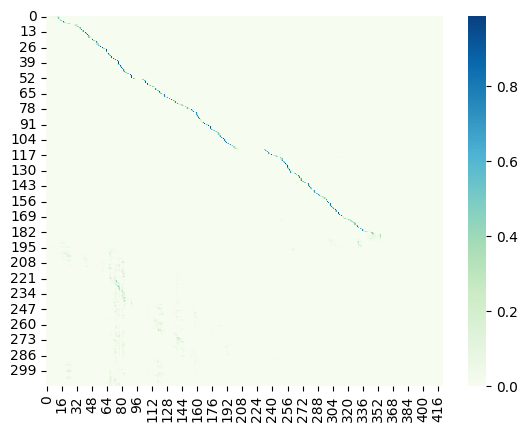


Epoch: 77/80


Val:   3%|▎         | 1/33 [00:03<01:38,  3.09s/it, dist=2.7067]

Ground Truth :  SHE GOT UP ON HER KNEES AND WRUNG HER HANDS
Prediction   :  SHE GOT UP ON HER KNEES AND WRUNG HER HANDS


Val:   6%|▌         | 2/33 [00:05<01:24,  2.71s/it, dist=2.8900]

Ground Truth :  TO ALL APPEARANCE MOLLY HAD GOT THROUGH HER AFTER DINNER WORK IN AN EXEMPLARY MANNER HAD CLEANED HERSELF WITH GREAT DISPATCH AND NOW CAME TO ASK SUBMISSIVELY IF SHE SHOULD SIT DOWN TO HER SPINNING TILL MILKING TIME
Prediction   :  TO ALL APPEARANCE MOLLY HAD GOT THROUGH HER AFTER DINNER WORK IN AN EXEMPLARY MANNER HAD CLEANED HERSELF WITH GREAT DISPATCH AND NOW CAME TO ASK SUBMISSIVELY IF SHE SHOULD SIT DOWN TO HER SPINNING TILL MILKING TIME


Val:   9%|▉         | 3/33 [00:07<01:14,  2.49s/it, dist=2.5822]

Ground Truth :  AND NOW IT HAD COME TO PASS THAT HIS SOLE REMAINING ALLY MISTER SAMUEL BOZZLE THE EX POLICEMAN WAS BECOMING WEARY OF HIS SERVICE
Prediction   :  AND NOW IT HAD COME TO PASS THAT HIS SOUL REMAINING ALLY MISTER SAMUEL BOZZLE THE EX POLICEMAN WAS BECOMING WEARY OF HIS SERVICE


Val:  12%|█▏        | 4/33 [00:10<01:11,  2.47s/it, dist=2.7217]

Ground Truth :  YES HOW MANY
Prediction   :  YES HOW MANY


Val:  15%|█▌        | 5/33 [00:12<01:09,  2.48s/it, dist=2.7267]

Ground Truth :  HE ALSO THOUGHT OF HIS MANAGERIAL POSITION
Prediction   :  HE ALSO THOUGHT OF HIS MANAGERIAL POSITION


Val:  18%|█▊        | 6/33 [00:14<01:04,  2.40s/it, dist=2.8233]

Ground Truth :  SO THEY FOLLOWED HER THROUGH THE LOW ARCHWAY AND IN A ROOM BEYOND VERY SIMPLY FURNISHED SAT A YOUNG GIRL ENGAGED IN DARNING A PAIR OF PINK STOCKINGS
Prediction   :  SAID HE FALLEN HER THROUGH THE LOW ARCHWAY AND IN A ROOM BEYOND VERY SIMPLY FURNISHED SAID A YOUNG GIRL ENGAGED AND DARNING A PAIR OF PINK STOCKINGS


Val:  21%|██        | 7/33 [00:17<01:02,  2.39s/it, dist=2.7629]

Ground Truth :  I BELIEVE THE SERIOUSNESS OF THE AMERICANS ARISES PARTLY FROM THEIR PRIDE
Prediction   :  I BELIEVE THE SERIOUSNESS OF THE AMERICANS ARISES PARTLY FROM THEIR PRIDE


Val:  24%|██▍       | 8/33 [00:19<01:00,  2.43s/it, dist=2.7792]

Ground Truth :  A THOUSAND PLANS WERE MADE A THOUSAND ADVENTURES PICTURED AND THE MOTHER WOULD SMILE AND LAUGH AND PLAN WITH THEM
Prediction   :  A THOUSAND PLANS WERE MADE A THOUSAND ADVENTURES PICTURED AND THE MOTHER WITH SMILE AND LAUGH AND PLAN WITH THEM


Val:  27%|██▋       | 9/33 [00:22<00:57,  2.39s/it, dist=2.6719]

Ground Truth :  PEARL SAW AND GAZED INTENTLY BUT NEVER SOUGHT TO MAKE ACQUAINTANCE
Prediction   :  PEARL SAW AND GAZED INTENTLY BUT NEVER SOUGHT TO MAKE ACQUAINTANCE


Val:  30%|███       | 10/33 [00:24<00:55,  2.41s/it, dist=2.6947]

Ground Truth :  I PICKED IT UP AND COMING UP TO HIM JUST AS HE WAS GOING DOWN THE STEPS I HANDED IT TO HIM
Prediction   :  I PICKED IT UP AND COMING UP TO HIM JUST AS HE WAS GOING DOWN THE STEPS I HANDED IT TO HIM


Val:  33%|███▎      | 11/33 [00:26<00:53,  2.41s/it, dist=2.7139]

Ground Truth :  WHY NOT ALLOW YOUR SILVER TUFTS TO LUXURIATE IN A NATURAL MANNER
Prediction   :  WHY NOT A LOW YOUR SIDLE VERTUFTS TO LUXURIATE IN A NATURAL MANNER


Val:  36%|███▋      | 12/33 [00:29<00:49,  2.34s/it, dist=2.6633]

Ground Truth :  HE WAS INTRODUCED TO MISSUS NORMAN AND TO MISSUS NORMAN'S LITTLE GIRL AND WE WERE ALL CHARMED WITH HIM
Prediction   :  HE WAS INTRODUCED TO MISSUS NORMAN AND TO MISSUS NORMAN'S LITTLE GIRL AND WE WERE ALL CHARMED WITH HIM


Val:  39%|███▉      | 13/33 [00:31<00:46,  2.31s/it, dist=2.6656]

Ground Truth :  MISS WOODLEY THOUGHT IT HER DUTY TO BE MUTE AND NOW THE GINGLE OF A TEA SPOON WAS LIKE A DEEP TONED BELL ALL WAS SO QUIET
Prediction   :  MISS WOODLEY THOUGHT IT HER DUTY TO BE MUTE AND NOW THE GINGLE OF A TEA SPOON WAS LIKE A DEEP TONED BELL ALL WAS SO QUIET


Val:  42%|████▏     | 14/33 [00:33<00:44,  2.34s/it, dist=2.6638]

Ground Truth :  MISTER SOAMES WAS SOMEWHAT OVERWHELMED BY THIS FLOOD OF INFORMATION
Prediction   :  MISTER SOAMES WAS SOMEWHAT OVERWHELMED BY THIS FLOOD OF INFORMATION


Val:  45%|████▌     | 15/33 [00:36<00:42,  2.34s/it, dist=2.6742]

Ground Truth :  WHILE THE LIBERATED EXILES REJOICED ON THE PLAIN OF MEATH THE TENT OF THE ABBOT OF IONA WAS PITCHED ON THE RATH OF TARA A FACT WHICH WOULD SEEM TO INDICATE THAT ALREADY IN LITTLE MORE THAN A CENTURY SINCE THE INTERDICT HAD FALLEN ON IT THE EDIFICES WHICH MADE SO FINE A SHOW IN THE DAYS OF PATRICK WERE RUINED AND UNINHABITABLE
Prediction   :  WHILE THE LIBERATED EXILES REJOICED ON THE PLAIN OF MEATH THE TENT OF THE ABBOT OF IONA WAS PITCHED ON THE RATH OF TARA A FACT WHICH WOULD SEEM TO INDICATE THAT ALREADY IN LITTLE MORE THAN A CENTURY SINCE THE INTERDICT HAD FALLEN ON IT THE EDIFICES WHICH MADE SO FINE A SHOW IN THE DAYS OF PATRICK WERE RUINED AND UNINHABITABLE


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.39s/it, dist=2.6996]

Ground Truth :  THIS CABIN WAS HIS HERMITAGE UNTIL THE WINTER SNOWS PENNED HIM IN HIS CAVE
Prediction   :  THIS CABIN WAS HIS HERMITAGE UNTIL THE WINTER SNOW IS PENNED HIM IN HIS CAVE


Val:  52%|█████▏    | 17/33 [00:41<00:39,  2.45s/it, dist=2.6898]

Ground Truth :  HE OFTEN STOPPED TO EXAMINE THE TREES NOR DID HE CROSS A RIVULET WITHOUT ATTENTIVELY CONSIDERING THE QUANTITY THE VELOCITY AND THE COLOR OF ITS WATERS
Prediction   :  HE OFTEN STOPPED TO EXAMINE THE TREES NOR DID HE CROSS A RIVULET WITHOUT ATTENTIVELY CONSIDERING THE QUANTITY THE VELOCITY AND THE COLOR OF ITS WATERS


Val:  55%|█████▍    | 18/33 [00:43<00:36,  2.43s/it, dist=2.6611]

Ground Truth :  TUESDAY AUGUST EIGHTEENTH
Prediction   :  TUESDAY AUGUST EIGHTEENTH


Val:  58%|█████▊    | 19/33 [00:46<00:34,  2.44s/it, dist=2.6421]

Ground Truth :  WITH A LONG STAINED FINGERNAIL HE MAPPED THE CONSTELLATIONS ON THE MARBLE TILED FLOOR
Prediction   :  WITH A LONG STAINED FINGER NAIL HE MAPPED THE CONSTELLATIONS ON THE MARBLE TILED FLOOR


Val:  61%|██████    | 20/33 [00:48<00:30,  2.35s/it, dist=2.6707]

Ground Truth :  TAKING EVERYTHING UPON MYSELF I ORDERED A SERVANT TO HURRY OUT FOR A PHYSICIAN WHO CAME IN A SHORT TIME AND ORDERED THE PATIENT TO BE BLED AGAIN THUS APPROVING THE FIRST BLEEDING PRESCRIBED BY ME
Prediction   :  TAKING EVERYTHING UPON MYSELF I ORDERED A SERVANT TO HURRY OUT FOR A PHYSICIAN WHO CAME IN A SHORT TIME AND ORDERED THE PATIENT TO BE BLED AGAIN THUS APPROVING THE FIRST BLEEDING PRESCRIBED BY ME


Val:  64%|██████▎   | 21/33 [00:50<00:27,  2.33s/it, dist=2.6562]

Ground Truth :  ILLUSTRATION BUNS
Prediction   :  ILLUSTRATION BUNS


Val:  67%|██████▋   | 22/33 [00:52<00:25,  2.35s/it, dist=2.6230]

Ground Truth :  HOW DELIGHTFUL THE GRASS SMELLS
Prediction   :  HOW DELIGHTFUL THE GRASS SMELLS


Val:  70%|██████▉   | 23/33 [00:55<00:23,  2.31s/it, dist=2.6183]

Ground Truth :  AT LAST SO DARING DID HE BECOME THAT THE PROVINCIAL GOVERNMENT PLACED A PRICE UPON HIS HEAD AND UPON THOSE OF A NUMBER OF HIS MOST NOTORIOUS FOLLOWERS
Prediction   :  AT LAST SO DARING DID HE BECOME THAT THE PROVENTIAL GOVERNMENT PLACED A PRICE UPON HIS HEAD AND UPON THOSE OF A NUMBER OF HIS MOST NOTORIOUS FOLLOWERS


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.34s/it, dist=2.6053]

Ground Truth :  WHAT TRUE THINGS ARE TOLD IN STORIES
Prediction   :  WHAT TRUE THINGS ARE TOLD IN STORIES


Val:  76%|███████▌  | 25/33 [00:59<00:18,  2.37s/it, dist=2.6605]

Ground Truth :  WHATEVER REVIVING EFFECT IT MIGHT OTHERWISE HAVE PRODUCED ON HIM IT MADE NO CHANGE IN THE THREATENING GLOOM OF HIS MANNER
Prediction   :  WHATEVER REVIVING AFFECTED MIGHT OTHERWISE HAVE PRODUCED ON HIM IT MADE NO CHANGE IN THE THREATENING GLOOM OF THIS MANNER


Val:  79%|███████▉  | 26/33 [01:02<00:17,  2.46s/it, dist=2.6885]

Ground Truth :  REGAINING THE LOW GROUND AT THE BASE OF THE MOUNTAIN AND HOLDING ON IN YOUR GRAND ORBIT YOU PASS THROUGH A BELT OF JUNIPER WOODS CALLED THE CEDARS TO SHEEP ROCK AT THE FOOT OF THE SHASTA PASS
Prediction   :  REGAINING THE LOW GROUND AT THE BASE OF THE MOUNTAIN AND HOLDING ON IN YOUR GRAND ORBIT YOU PASS THROUGH A BELT OF JUNIPER WOODS CALLED THE CEDARS TO SHEEP BROUGHT AT THE FOOT OF THE SHASTA PASS


Val:  82%|████████▏ | 27/33 [01:05<00:14,  2.46s/it, dist=2.6869]

Ground Truth :  THOUGHT KILLS ME THAT I AM NOT THOUGHT TO LEAP LARGE LENGTHS OF MILES WHEN THOU ART GONE BUT THAT SO MUCH OF EARTH AND WATER WROUGHT I MUST ATTEND TIME'S LEISURE WITH MY MOAN RECEIVING NOUGHT BY ELEMENTS SO SLOW BUT HEAVY TEARS BADGES OF EITHER'S WOE
Prediction   :  THOUGHT KILLS ME THAT I AM NOT THOUGHT TO LEAP LARGE LENGTHS OF MILES WHEN THOU ART GONE BUT THAT'S SO MUCH OF EARTH AND WATER WROUGHT I MUST ATTEND TIME'S LEISURE WITH MY MOAN RECEIVING NOT BY ELEMENTS SO SLOW BUT HEAVY TEARS BADGES OF EITHER'S WOE


Val:  85%|████████▍ | 28/33 [01:07<00:12,  2.43s/it, dist=2.7114]

Ground Truth :  WITHOUT A WORD PETER GOT UP AND LIT HIS LANTERN
Prediction   :  WITHOUT A WORD PETER GOT UP AND LIT HIS LANTERN


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.39s/it, dist=2.7184]

Ground Truth :  AT THIS INSTANT ONE OR TWO OF THOSE SQUIRES WHO WERE POSTED AS SENTINELS ON THE ROADS TO WATCH WHO CAME ALONG THEM AND REPORT WHAT PASSED TO THEIR CHIEF CAME UP AND SAID SENOR THERE IS A GREAT TROOP OF PEOPLE NOT FAR OFF COMING ALONG THE ROAD TO BARCELONA
Prediction   :  AT THIS INSTANT ONE OR TWO OF THOSE SQUIRES WHO WERE POSTED AS SENTINELS ON THE ROADS TO WATCH WHO CAME ALONG THEM AND REPORT WHAT PASSED TO THEIR CHIEF CAME UP AND SAID SENOR THERE IS A GREAT TROOP OF PEOPLE NOT FAR OFF COMING ALONG THE ROAD TO BARCELONA


Val:  91%|█████████ | 30/33 [01:12<00:07,  2.35s/it, dist=2.7227]

Ground Truth :  MISTER MORTON THEN MADE A CAREFUL MEMORANDUM OF THE VARIOUS PARTICULARS OF WAVERLEY'S INTERVIEW WITH DONALD BEAN LEAN AND THE OTHER CIRCUMSTANCES WHICH HE HAD COMMUNICATED
Prediction   :  MISTER MORTON THEN MADE A CAREFUL MEMORANDUM OF THE VARIOUS PARTICULARS OF WAY RELEASE INTERVIEW WITH JOHN OLD BEING LEAN AND THE OTHER CIRCUMSTANCES WHICH HE HAD COMMUNICATED


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.37s/it, dist=2.7329]

Ground Truth :  ONE COULD HARDLY HOPE FOR ANY UPON SO DRY A DAY
Prediction   :  ONE COULD HARDLY HOPE FOR ANY UPON SO DRY A DAY


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.35s/it, dist=2.7304]

Ground Truth :  WHEN IT WAS EVENING HE LED HIS BAND INTO A NEARBY STREET AND IN HIS DISGUISE APPROACHED THE MERCHANT'S HOUSE HE KNOCKED AT THE DOOR
Prediction   :  WHEN IT WAS EVENING HE LED HIS BAND INTO A NEAR BY STREET AND IN HIS DISGUISE APPROACHED THE MERCHANT'S HOUSE HE KNOCKED AT THE DOOR


Val: 100%|██████████| 33/33 [01:17<00:00,  1.96s/it, dist=2.7371]

Ground Truth :  WITH HIS OWN SUSPICIONS STEADILY CONTRADICTING HIM HE ARRIVED AT THE HOTEL OBSTINATELY BELIEVING THAT THE CHARMING WIDOW WOULD PROVE TO BE A STRANGER
Prediction   :  WITH HIS OWN SUSPICIONS STEADILY CONTRADICTING HIM HE ARRIVED AT THE HOTEL OBSTINATELY BELIEVING THAT THE CHARMING WIDOW WOULD PROVE TO BE A STRANGER


	Train Loss 0.0701	 Learning Rate 0.0000135
	Val Dist 2.7371	
	Teacher Forcing Ratio 1	


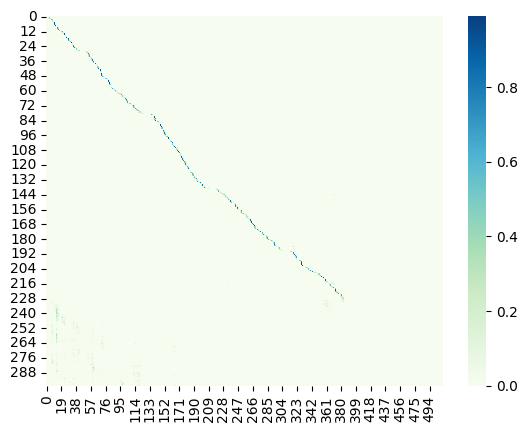

Saved best model

Epoch: 78/80


Val:   3%|▎         | 1/33 [00:02<01:31,  2.85s/it, dist=3.0533]

Ground Truth :  BLESSED AM I HERE NOW MY GOD AND BLESSED SHALL I BE THERE THEN
Prediction   :  BLESSED AM I HERE NOW MY GOD EMBLESSED SHELL I BE THERE THEN


Val:   6%|▌         | 2/33 [00:05<01:20,  2.61s/it, dist=3.0900]

Ground Truth :  NO ONE HAD COME TO MEET ME THE VILLAGE WAS ABOUT HALF A MILE AND HANGAR DENE THE HOUSE FOR WHICH MY STEPS WERE BENT ABOUT FOUR MILES BY THE ROAD HOW FAR IT WAS ACROSS PLOUGHED FIELDS MY INFORMANT DID NOT MENTION
Prediction   :  NO ONE HAD COME TO MEET ME THE VILLAGE WAS ABOUT HALF A MILE AND HANG OUR DEEN THE HOUSE FOR WHICH MY STEPS WERE BENT ABOUT FOUR MILES BY THE ROAD HOW FAR IT WAS ACROSS PLOUGHED FIELDS MY INFORMANT DID NOT MENTION


Val:   9%|▉         | 3/33 [00:07<01:15,  2.51s/it, dist=2.8289]

Ground Truth :  HE USED TO HELP MY FATHER CUT CHRISTMAS TREES FOR ME IN VIRGINIA AND HE HAD NOT FORGOTTEN HOW MUCH I LIKED THEM
Prediction   :  HE USED TO HELP MY FATHER CUT CHRISTMAS TREES FOR ME IN VIRGINIA AND HE HAD NOT FORGOTTEN HOW MUCH I LIKED THEM


Val:  12%|█▏        | 4/33 [00:09<01:08,  2.38s/it, dist=2.9433]

Ground Truth :  I SHALL WAIT FOR TIME TO SHOW
Prediction   :  I SHALL WAIT FOR TIME TO SHOW


Val:  15%|█▌        | 5/33 [00:12<01:07,  2.42s/it, dist=2.9773]

Ground Truth :  THE SETTING OF THE SCENE SEEMED TO HER ALL IMPORTANT
Prediction   :  THE SETTING OF THE SCENE SEEMED TO HER ALL IMPORTANT


Val:  18%|█▊        | 6/33 [00:14<01:04,  2.41s/it, dist=2.9056]

Ground Truth :  HE REMAINED UP STAIRS UNTIL AFTER THE EARLY DAWN SHOWED MARY THAT SHE NEED HAVE NO FEAR OF GOING HOME THROUGH THE DESERTED AND QUIET STREETS TO TRY AND GET A LITTLE SLEEP BEFORE WORK HOUR
Prediction   :  HE REMAINED UP STAIRS UNTIL AFTER THE EARLY DAWN SHOWED MARY THAT SHE NEED HAVE NO FEAR OF GOING HOME THROUGH THE DESERTED AND QUIET STREETS TO TRYING IT A LITTLE SLEEP BEFORE WORK HOUR


Val:  21%|██        | 7/33 [00:17<01:01,  2.38s/it, dist=2.8095]

Ground Truth :  A MINUTE IS NOT A VERY LARGE MEASURE OF TIME AND HIS BODY NEEDED EVERY FRACTION OF IT
Prediction   :  A MINUTE IS NOT A VERY LARGE MEASURE OF TIME AND HIS BODY NEEDED EVERY FRACTION OF IT


Val:  24%|██▍       | 8/33 [00:19<00:59,  2.40s/it, dist=2.9300]

Ground Truth :  I BECAME GROTESQUELY ANXIOUS TO ASSURE HIM THAT INDEED SHE AND I HAD BEEN AS THEY SAY INNOCENT THROUGHOUT OUR LAST DAY TOGETHER
Prediction   :  I BECAME GROTESQUELY ANXIOUS TO ASSURE HIM THAT INDEED SHE AND I HAD BEEN AS THEY SAY INNOCENT THROUGHOUT OUR LAST DAY TOGETHER


Val:  27%|██▋       | 9/33 [00:21<00:56,  2.37s/it, dist=2.8733]

Ground Truth :  ON ALL SIDES WERE TO BE SEEN WHOLE SCHOOLS OF WHALES AND SHARKS
Prediction   :  ON ALL SIDES WERE TO BE SEEN WHOLE SCHOOLS OF WHALES AND SHARKS


Val:  30%|███       | 10/33 [00:24<00:53,  2.32s/it, dist=2.8433]

Ground Truth :  HE'S A TROUBLE CURER NOT A TROUBLEMAKER EXCEPT FOR HIMSELF
Prediction   :  HE'S A TROUBLE CURE NOT A TROUBLE MAKER I SET FOR HIMSELF


Val:  33%|███▎      | 11/33 [00:26<00:52,  2.37s/it, dist=2.8291]

Ground Truth :  MISTER OTTLEY'S INDEED
Prediction   :  MISTER OUTLEY'S INDEED


Val:  36%|███▋      | 12/33 [00:28<00:50,  2.39s/it, dist=2.8428]

Ground Truth :  THERE WAS NO PONIARD IN THE WOUND
Prediction   :  THERE WAS NO POINTER IN THE WOUND


Val:  39%|███▉      | 13/33 [00:31<00:46,  2.35s/it, dist=2.8179]

Ground Truth :  I DON'T WONDER YOU WERE AFRAID TO TELL ME SHE BEGAN YOU DON'T LOVE ME YOU'VE NEVER LOVED ME I WAS AN IDIOT TO BELIEVE YOU DID
Prediction   :  I DON'T WONDER YOU WERE AFRAID TO TELL ME SHE BEGAN YOU DON'T LOVE ME YOU'VE NEVER LOVED ME AS THE INNET TO BLADE YOU DEAD


Val:  42%|████▏     | 14/33 [00:33<00:44,  2.36s/it, dist=2.8143]

Ground Truth :  THE SHEET OF PAPER COVERED WITH CIRCLES DROPPED OUT OF HIS FINGERS AND HE REMAINED STARING AT THE OLD TERRORIST AS IF ROOTED SUDDENLY TO THE SPOT BY HIS MORBID HORROR AND DREAD OF PHYSICAL PAIN
Prediction   :  THE SHEET OF PAPER COVERED WITH CIRCLES DROPPED OUT OF HIS FINGERS AND HER REMAIN STIRRING AT THE OLD TUREST AS IF RUDED SUDDENLY TO THE SPOT BY HIS MORBID HARD AND DREADED OF PHYSICAL PAIN


Val:  45%|████▌     | 15/33 [00:36<00:42,  2.38s/it, dist=2.7933]

Ground Truth :  AND THEN YOU CAME BACK NOT CARING VERY MUCH BUT IT MADE NO DIFFERENCE
Prediction   :  AND THEN YOU CAME BACK NOT CARON VERY MUCH BUT IT MADE NO DIFFERENCE


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.39s/it, dist=2.7758]

Ground Truth :  OTHERS HAD DIED BEFORE DURING THE TWENTIES AND DEATH DURING THE LAST ROUND WAS IN SOME WAYS EASIER THAN DEFEAT
Prediction   :  OTHERS HAD DIED BEFORE DURING THE TWENTIES AND DEATH DURING THE LAST ROUND WAS IN SOME WAYS EASIER THAN DEFEAT


Val:  52%|█████▏    | 17/33 [00:40<00:37,  2.35s/it, dist=2.7533]

Ground Truth :  THE EUROPE THEY HAD COME FROM LAY OUT THERE BEYOND THE IRISH SEA EUROPE OF STRANGE TONGUES AND VALLEYED AND WOODBEGIRT AND CITADELLED AND OF ENTRENCHED AND MARSHALLED RACES
Prediction   :  THE EUROPE THEY HAD COME FROM LAY OUT THERE BEYOND THE IROS SEA EUROPE OF STRANGE TONGUES AND VALLEYED AND WOOD BEGIRT AND CITADELLED AND OF ENTRENCHED AND MARSHALLED RACES


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.35s/it, dist=2.7496]

Ground Truth :  I SUPPOSE SHE HAS BEEN CAREFULLY QUESTIONED VERY I SHOULD SAY
Prediction   :  I SUPPOSE SHE HAS BEEN CAREFULLY QUESTIONED VERY I SHOULD SAY


Val:  58%|█████▊    | 19/33 [00:45<00:33,  2.39s/it, dist=2.7344]

Ground Truth :  I WAS COMPELLED BY POVERTY TO BECOME A MEMBER OF A MUSICAL BAND IN WHICH I COULD EXPECT NEITHER ESTEEM NOR CONSIDERATION AND I WAS WELL AWARE THAT I SHOULD BE THE LAUGHING STOCK OF THE PERSONS WHO HAD KNOWN ME AS A DOCTOR IN DIVINITY AS AN ECCLESIASTIC AND AS AN OFFICER IN THE ARMY AND HAD WELCOMED ME IN THE HIGHEST SOCIETY
Prediction   :  I WAS COMPELLED BY POVERTY TO BECOME A MEMBER OF A MUSICAL BAND IN WHICH I COULD EXPECT NEITHER ESTEEM NOR CONSIDERATION AND I WAS WELL AWARE THAT I SHOULD BE THE LAUGHING STOCK OF THE PERSONS WHO HAD KNOWN ME AS A DOCTOR IN DIVINITY AS AN ECCLESIASTIC AND AS AN OFFICER IN THE ARMY AND HAD WELCOME ME IN THE HIGHEST SOCIETY


Val:  61%|██████    | 20/33 [00:47<00:30,  2.38s/it, dist=2.7067]

Ground Truth :  TONY'S FOUND THE MARTIANS
Prediction   :  TONY'S FOUND THE MARTIANS


Val:  64%|██████▎   | 21/33 [00:49<00:27,  2.28s/it, dist=2.6730]

Ground Truth :  THERE WERE NO BREASTWORKS YET THAT ONE LITTLE BRIGADE OF HAMILTON'S DIVISION STOOD THERE IN THE OPEN AND REPULSED ASSAULT AFTER ASSAULT
Prediction   :  THERE WERE NO BREAST WORKS YET THAT ONE LITTLE BREAD OF HAMILTON'S DIVISION STOOD THERE IN THE OPEN AND REPULSED A SALT AFTER A SALT


Val:  67%|██████▋   | 22/33 [00:52<00:25,  2.28s/it, dist=2.6779]

Ground Truth :  IMPERTINENT YOUNG BEGGAR SAID BURGESS
Prediction   :  IMPERTINENT YOUNG BEGGAR SAID BURGESS


Val:  70%|██████▉   | 23/33 [00:54<00:22,  2.24s/it, dist=2.6783]

Ground Truth :  THIS ALTERNATIVE IN THE CAPTAIN'S PLANS TERMINATING THE VOYAGE A MONTH EARLIER THAN HIS ARRANGEMENTS HAD CONTEMPLATED PUZZLED RANDAL
Prediction   :  THIS ALL TURNED IT IN THE CAPTAIN'S PLANS TERMINATING THE VOYAGE A MONTH EARLIER THAN HIS ARRANGEMENTS HAD CONTEMPLATED PUZZLED RANDLE


Val:  73%|███████▎  | 24/33 [00:56<00:20,  2.31s/it, dist=2.6725]

Ground Truth :  I NOTICE THAT THEY ARE GENERALLY PERSONS WHO HAVE ALREADY TENDERED THEIR OFFERINGS
Prediction   :  I NOTICED THAT THEY ARE GENERALLY PERSONS WHO HAVE ALREADY TENDERED THEIR OFFERINGS


Val:  76%|███████▌  | 25/33 [00:59<00:18,  2.34s/it, dist=2.6664]

Ground Truth :  IT WAS LOCKED FROM THE INSIDE AND WE HAD TO BURN IT DOWN WITH A TORCH THAT'S WHERE THEY ARE
Prediction   :  IT WAS LOCKED FROM THE INSIDE AND WE HAD TO BURN IT DOWN WITH THE TORCH THAT'S WHERE THEY ARE


Val:  79%|███████▉  | 26/33 [01:01<00:16,  2.38s/it, dist=2.6554]

Ground Truth :  AY ME
Prediction   :  I ME


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.37s/it, dist=2.6637]

Ground Truth :  I AM MY DEAR AND ALL STRANGERS ARE WELCOME TO MY HOME
Prediction   :  I AM MY DEAR AND ALL STRANGERS ARE WELCOMED TO MY HOME


Val:  85%|████████▍ | 28/33 [01:06<00:11,  2.38s/it, dist=2.6607]

Ground Truth :  WATCH THE SAVAGES OUTSIDE SAID ROBERT
Prediction   :  WATCHED THE SAVAGES OUTSIDE SAID ROBERT


Val:  88%|████████▊ | 29/33 [01:08<00:09,  2.42s/it, dist=2.6825]

Ground Truth :  THEREAFTER THIS SONNET BRED IN ME DESIRE TO WRITE DOWN IN VERSE FOUR OTHER THINGS TOUCHING MY CONDITION THE WHICH THINGS IT SEEMED TO ME THAT I HAD NOT YET MADE MANIFEST
Prediction   :  THEREAFTER THE SON IT BREAD IN ME DESIRE TO WRITE DOWN INVERSE FOR OTHER THINGS TOUCHING MY CONDITION THE WHICH THINGS IT SEEMED TO ME THAT I HAD NOT YET MADE MANIFEST


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.44s/it, dist=2.7380]

Ground Truth :  ASPLENIUM EPILOBIUM HEUCHERA HAZEL DOGWOOD AND ALDER MAKE A LUXURIOUS FRINGE AND SETTING AND THE FORESTS OF DOUGLAS SPRUCE ALONG THE BANKS ARE THE FINEST I HAVE EVER SEEN IN THE SIERRA
Prediction   :  ASPLENIUM EPILOBIUM WHO CHERA HAZEL DOGWOOD AND ALDER MAKE A LUXURIOUS FRINGE AND SETTING AND THE FORESTS OF DUGLESS SPRUCE ALONG THE BANKS ARE THE FINEST I HAVE EVER SEEN IN THE SIERRA


Val:  94%|█████████▍| 31/33 [01:13<00:04,  2.40s/it, dist=2.7329]

Ground Truth :  WHEN HE ROSE PAINFULLY THE THRUSTING FORWARD OF A SKINNY GROPING HAND DEFORMED BY GOUTY SWELLINGS SUGGESTED THE EFFORT OF A MORIBUND MURDERER SUMMONING ALL HIS REMAINING STRENGTH FOR A LAST STAB
Prediction   :  WHEN HE ROSE PAINFULLY THE THRUSTING FORT OF A SKINNY GROPING HAND DEFORMED BY GUILTY SWINGS SUGGESTED THE EFFORT OF A MORBID MURDERER SUMMONING ALL HIS REMAINING STRENGTH FERRAL LAST STAB


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.45s/it, dist=2.7596]

Ground Truth :  THE YOUNG INVENTOR HAD JUST NOTICED HIS FRIEND LYING PINNED BENEATH A HEAVY BEAM NEARBY
Prediction   :  THE YOUNG INVENTOR HAD JUST NOTICED HIS FRIEND LYING PIN BENEATH A HEAVY BEAM NEAR BY


Val: 100%|██████████| 33/33 [01:17<00:00,  2.05s/it, dist=2.7419]

Ground Truth :  OUTSIDE OF THESE OCCASIONAL REMINDERS WE COULD SEE NO EVIDENCE OF THE DESOLATION OF THE TRACK OF AN INVADING ARMY
Prediction   :  OUTSIDE OF THESE OCCASIONAL REMINDERS WE COULD SEE NO EVIDENCE OF THE DESOLATION OF THE TRACK OF AN INVADING ARMY


	Train Loss 0.0699	 Learning Rate 0.0000090
	Val Dist 2.7419	
	Teacher Forcing Ratio 1	


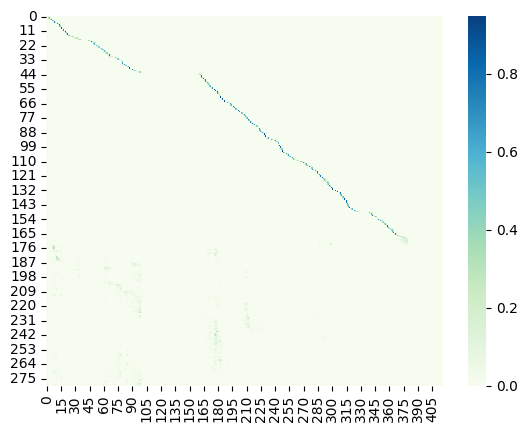


Epoch: 79/80


Val:   3%|▎         | 1/33 [00:02<01:33,  2.92s/it, dist=3.3667]

Ground Truth :  IT WAS A DIFFERENT HARRY WHO STARTED HOME LATE IN APRIL
Prediction   :  IT WAS A DIFFERENT HAIRY WHO STARTED HOME LATE AN APRIL


Val:   6%|▌         | 2/33 [00:05<01:19,  2.58s/it, dist=2.8867]

Ground Truth :  THEY WORKED IN CHICAGO DES MOINES FORT WAYNE BUT THEY WERE ALWAYS UNFORTUNATE
Prediction   :  THEY WORKED IN CHICAGO DE MOINE FOURTH WAYNE BUT THEY WERE ALWAYS UNFORTUNATE


Val:   9%|▉         | 3/33 [00:07<01:16,  2.54s/it, dist=2.7289]

Ground Truth :  HIS SUCCESS SEEMS TO HAVE BEEN THE OUTGROWTH OF HARD STUDY AND ABILITY TO PERFORM THE MOST EXHAUSTIVE LABOR WITHOUT FATIGUE
Prediction   :  HIS SUCCESS SEEMS TO HAVE BEEN THE OUTGROWTH OF HARD STUDY AND ABILITY TO REFORM THE MOST EXHAUSTIVE LABOR WITHOUT FATIGUE


Val:  12%|█▏        | 4/33 [00:09<01:09,  2.39s/it, dist=2.7650]

Ground Truth :  BOIL THEM BEFORE THEY ARE PUT INTO THE SOUP OR OTHER DISH THEY MAY BE INTENDED FOR
Prediction   :  BOIL THEM BEFORE THEY ARE PUT INTO THE SOUP OR OTHER DISH THEY MAY BE INTENDED FOR


Val:  15%|█▌        | 5/33 [00:12<01:06,  2.38s/it, dist=2.6640]

Ground Truth :  I OBEYED IMPLICITLY AND MET YOUR EXCELLENCY
Prediction   :  I OBEYED IMPLICITLY AND MET YOUR EXCELLENCY


Val:  18%|█▊        | 6/33 [00:14<01:04,  2.38s/it, dist=2.9556]

Ground Truth :  AS YET THEY HAD BEEN UNABLE TO ATTEMPT ANY FANCY RIDING WITH THEIR PONIES OWING TO THE RUGGED NATURE OF THE COUNTRY THROUGH WHICH THEY HAD BEEN JOURNEYING
Prediction   :  AS YET THEY HAD BEEN UNABLE TO A TIMP YE FANCY WRITING WITH THEIR PONIES OWING TO THE RUGGED NATURE OF THE COUNTRY THROUGH WHICH THEY HAD BEEN JURITYING


Val:  21%|██        | 7/33 [00:16<01:00,  2.34s/it, dist=2.8543]

Ground Truth :  THE STREET CONDUCTORS WERE OF THE OVERHEAD POLE LINE CONSTRUCTION AND WERE INSTALLED BY THE CONSTRUCTION COMPANY THAT HAD BEEN ORGANIZED BY EDISON TO BUILD AND EQUIP CENTRAL STATIONS
Prediction   :  THE STREET CONDUCTORS WERE OF THE OVERHEAD POLE LINE CONSTRUCTION AND WERE INSTALLED BY THE CONSTRUCTION COMPANY THAT HAD BEEN ORGANIZED BY EDISON TO BUILD AND EQUIP CENTRAL STATIONS


Val:  24%|██▍       | 8/33 [00:19<00:57,  2.32s/it, dist=2.7742]

Ground Truth :  I FOUND THAT AS A WOMAN OF BUSINESS SHE WAS BEYOND ALL MY EXPECTATIONS
Prediction   :  I FOUND THAT IS A WOMAN OF BUSINESS SHE WAS BEYOND ALL MY EXPECTATIONS


Val:  27%|██▋       | 9/33 [00:21<00:57,  2.38s/it, dist=2.7926]

Ground Truth :  BRING IT TO THE PUBLIC ATTENTION DRAMATIZE IT
Prediction   :  BRING IT TO THE PUBLIC ATTENTION DRAMATIZE IT


Val:  30%|███       | 10/33 [00:24<00:55,  2.39s/it, dist=2.7487]

Ground Truth :  I TURN OFF THE TELEVISION SET I'VE LOST TRACK OF WHAT'S HAPPENING AND IT DOESN'T SEEM TO BE THE GRANDFATHER WHO'S THE SPOOK AFTER ALL
Prediction   :  I TURN OFF THE TELEVISION SET I'VE LOST TRACK OF WHAT'S HAPPENING IN IT DOESN'T SEEM TO BE THE GRANDFATHER WHO'S A SPOOK AFTER ALL


Val:  33%|███▎      | 11/33 [00:26<00:52,  2.39s/it, dist=2.7473]

Ground Truth :  THAT'S MACKLEWAIN'S BUSINESS
Prediction   :  THAT'S MANICAL WAYMEN'S BUSINESS


Val:  36%|███▋      | 12/33 [00:29<00:51,  2.44s/it, dist=2.7378]

Ground Truth :  THE LITTLE HOUSE ON THE HILLSIDE WAS SO MUCH THE COLOR OF THE NIGHT THAT WE COULD NOT SEE IT AS WE CAME UP THE DRAW
Prediction   :  THE LITTLE HOUSE ON THE HILLSIDE WAS SO MUCH THE COLOR OF THE NIGHT THAT WE COULD NOT SEE IT AS WE CAME UP THE DRAW


Val:  39%|███▉      | 13/33 [00:31<00:47,  2.38s/it, dist=2.6954]

Ground Truth :  HOW INFINITE THE WEALTH OF LOVE AND HOPE GARNERED IN THESE SAME TINY TREASURE HOUSES AND OH
Prediction   :  HOW INFINITE THE WEALTH OF LOVE AND HOPE GARNERED IN THESE SAME TINY TREASURE HOUSES AND OH


Val:  42%|████▏     | 14/33 [00:33<00:45,  2.40s/it, dist=2.6738]

Ground Truth :  I GAVE HIM A LITTLE BRANDY AND LEFT HIM COLLAPSED IN A CHAIR WHILE I MADE A MOST CAREFUL EXAMINATION OF THE ROOM
Prediction   :  I GAVE HIM A LITTLE BRANDY AND LEFT HIM COLLAPSED IN A CHAIR WHILE I MADE A MOST CAREFUL EXAMINATION OF THE ROOM


Val:  45%|████▌     | 15/33 [00:36<00:43,  2.42s/it, dist=2.6604]

Ground Truth :  YOU ARE TO UNDERSTAND THAT CATHERINE IS A WIDOW
Prediction   :  YOU ARE TO UNDERSTAND THAT CATHERINE IS A WIDOW


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.37s/it, dist=2.6638]

Ground Truth :  THE TWO STRAY KITTENS GRADUALLY MAKE THEMSELVES AT HOME
Prediction   :  THE TWO STRAY KITTENS GRADUALLY MAKE THEMSELVES AT HOME


Val:  52%|█████▏    | 17/33 [00:40<00:37,  2.37s/it, dist=2.6906]

Ground Truth :  THEY ARE BROAD RUGGED CREVASSED CLOUDLIKE MASSES OF DOWN GRINDING ICE POURING FORTH STREAMS OF MUDDY WATER AS MEASURES OF THE WORK THEY ARE DOING IN SCULPTURING THE ROCKS BENEATH THEM VERY UNLIKE THE LONG MAJESTIC GLACIERS OF ALASKA THAT RIVERLIKE GO WINDING DOWN THE VALLEYS THROUGH THE FORESTS TO THE SEA
Prediction   :  THEY ARE BROAD RUGGED CREVASSED CLOUDLIKE MASSES OF DOWN GRINDING ICE POURING FORTH STREAMS OF MUDDY WATER AS MEASURES OF THE WORK THEY ARE DOING IN SCULPTURING THE ROCKS BENEATH THEM VERY UNLIKE THE LONG MAJESTIC GLACIERS OF ALASKA THAT RIVER LIKE GO WINDING DOWN THE VALLEYS THROUGH THE FORESTS TO THE SEA


Val:  55%|█████▍    | 18/33 [00:43<00:36,  2.44s/it, dist=2.7707]

Ground Truth :  HANSEL THOUGHT THE ROOF TASTED VERY NICE AND SO HE TORE OFF A GREAT PIECE WHILE GRETHEL BROKE A LARGE ROUND PANE OUT OF THE WINDOW AND SAT DOWN QUITE CONTENTEDLY
Prediction   :  HASTLE THOUGHT THE ROOF TASTED VERY NICE AND SO HE TORE OFF A GREAT PEACE WHILE REHHELD BROKE A LARGE ROUND PAIN OUT OF THE WINDOW AND SAT DOWN QUITE CONTENTEDLY


Val:  58%|█████▊    | 19/33 [00:45<00:33,  2.39s/it, dist=2.7502]

Ground Truth :  THE TWO ELDEST ATE THEIR APPLES BUT THE YOUNGEST COULD NOT EAT THAT NIGHT SHE THREW THE APPLE AWAY
Prediction   :  THE TWO ELDEST ATE THEIR APPLES BUT THE YOUNGEST COULD NOT EAT THAT MIGHT SHE THREW THE APPLE AWAY


Val:  61%|██████    | 20/33 [00:48<00:31,  2.40s/it, dist=2.7443]

Ground Truth :  THEY SEEK TO SNAP THE SILVER CORD THAT BINDS ME TO MY DYING BODY
Prediction   :  THEY SEEK TO SNAP THE SILVER CORD THAT BINDS ME TO MY DYING BODY


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.38s/it, dist=2.7444]

Ground Truth :  ILLUSTRATION MARJORAM
Prediction   :  ILLUSTRATION MARGUERIM


Val:  67%|██████▋   | 22/33 [00:52<00:25,  2.36s/it, dist=2.7273]

Ground Truth :  THERE WAS AN EXTRAORDINARY FORCE OF SUGGESTION IN THIS POSTURING
Prediction   :  THERE WAS NEXT OR NOR A FORCE OF SUGGESTION IN THIS POSTURING


Val:  70%|██████▉   | 23/33 [00:55<00:24,  2.41s/it, dist=2.7325]

Ground Truth :  PLACE THE JUG IN A SAUCEPAN OF BOILING WATER KEEP STIRRING WELL UNTIL IT THICKENS BUT DO NOT ALLOW IT TO BOIL OR IT WILL CURDLE
Prediction   :  PLACE THE JUG IN A SAUCEPAN OF BOILING WATER KEEP STIRRING WELL UNTIL IT THICKENS BUT DO NOT ALLOW IT TO BOIL OR IT WILL CURTLE


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.37s/it, dist=2.7256]

Ground Truth :  AH FATHER SAID HANSEL I AM LOOKING AT MY WHITE CAT SITTING UPON THE ROOF OF THE HOUSE AND TRYING TO SAY GOOD BYE
Prediction   :  AH FATHER SAID HANDSOME I AM LOOKING AT MY WHITE CAT SITTING UPON THE ROOF OF THE HOUSE AND TRYING TO SAY GOOD BY


Val:  76%|███████▌  | 25/33 [00:59<00:18,  2.36s/it, dist=2.7219]

Ground Truth :  IF THE READER WILL EXCUSE ME I WILL SAY NOTHING OF MY ANTECEDENTS NOR OF THE CIRCUMSTANCES WHICH LED ME TO LEAVE MY NATIVE COUNTRY THE NARRATIVE WOULD BE TEDIOUS TO HIM AND PAINFUL TO MYSELF
Prediction   :  IF THE READER WILL EXCUSE ME I WILL SAY NOTHING OF MY ANTECEDENTS NOR OF THE CIRCUMSTANCES WHICH LED ME TO LEAVE MY NATIVE COUNTRY THE NARRATIVE WOULD BE TEDIOUS TO HIM AND PAINFUL TO MYSELF


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.36s/it, dist=2.7433]

Ground Truth :  OJO EXAMINED THIS CURIOUS CONTRIVANCE WITH WONDER
Prediction   :  OJO EXAMINED THIS CURIOUS CONTRIVANCE WITH WONDER


Val:  82%|████████▏ | 27/33 [01:04<00:14,  2.40s/it, dist=2.7383]

Ground Truth :  YES INDEED AND I BELIEVE IT IS RIGHT THAT I SHOULD KEEP MY FIRST PROMISE IS IT NOT
Prediction   :  YES INDEED AND I BELIEVE IT IS RIGHT THAT I SHOULD KEEP MY FIRST PROMISE IS IT NOT


Val:  85%|████████▍ | 28/33 [01:07<00:12,  2.42s/it, dist=2.7438]

Ground Truth :  TUESDAY AUGUST EIGHTEENTH
Prediction   :  TUESDAY AUGUST EIGHTEENTH


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.43s/it, dist=2.7890]

Ground Truth :  IF THIS MATTER IS NOT TO BECOME PUBLIC WE MUST GIVE OURSELVES CERTAIN POWERS AND RESOLVE OURSELVES INTO A SMALL PRIVATE COURT MARTIAL
Prediction   :  IF THIS MATTER IS NOT TO BECOME PUBLIC WE MUST GIVE OURSELVES CERTAIN POWERS AND RESOLVE OURSELVES INTO A SMALL PRIVATE COURT MARTIAL


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.38s/it, dist=2.7624]

Ground Truth :  HANS STIRS NOT
Prediction   :  HANS STIRS NOT


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.34s/it, dist=2.7417]

Ground Truth :  THE TIME IS NARROWED DOWN TO ONE AND IN THAT ONE MISS CLARKE WAS THE ONLY PERSON TO TOUCH HER
Prediction   :  THE TIME IS NARROWED DOWN TO ONE AND IN THAT ONE MISS CLARKE WAS THE ONLY PERSON TO TOUCH HER


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.32s/it, dist=2.7171]

Ground Truth :  HERE AND THERE COULD BE SEEN AN ISOLATED FARM SOME SOLITARY BUR OR ICELANDIC HOUSE BUILT OF WOOD EARTH FRAGMENTS OF LAVA LOOKING LIKE BEGGARS ON THE HIGHWAY OF LIFE
Prediction   :  HERE AND THERE COULD BE SUITAN ISOLATED FARM SOME SOLITARY BUR OR ICE ON THE COWS BUILT OF WOOD EARTH FRAGMENTS OF LAVA LOODING LIKE BEGGARS IN THE HIGHWAY OF LIFE


Val: 100%|██████████| 33/33 [01:17<00:00,  1.94s/it, dist=2.7302]

Ground Truth :  AND I BEHELD THE FLAMELETS ONWARD GO LEAVING BEHIND THEMSELVES THE AIR DEPICTED AND THEY OF TRAILING PENNONS HAD THE SEMBLANCE SO THAT IT OVERHEAD REMAINED DISTINCT WITH SEVENFOLD LISTS ALL OF THEM OF THE COLOURS WHENCE THE SUN'S BOW IS MADE AND DELIA'S GIRDLE
Prediction   :  AND I BEHELD THE FLAMELETS ONWARD GO LEAVING BEHIND THEMSELVES THE AIR DEPICTED AND THEY OF TRAILING PENNINS HAD THE SEMBLANCE SO THAT IT OVERHEAD REMAINED DISTINCT WITH SEVEN FOLD LISTS ALL OF THEM OF THE COLOURS WENT THE SUN'S BOW IS MADE AND DEAL HIS GIRDLE


	Train Loss 0.0753	 Learning Rate 0.0000055
	Val Dist 2.7302	
	Teacher Forcing Ratio 1	


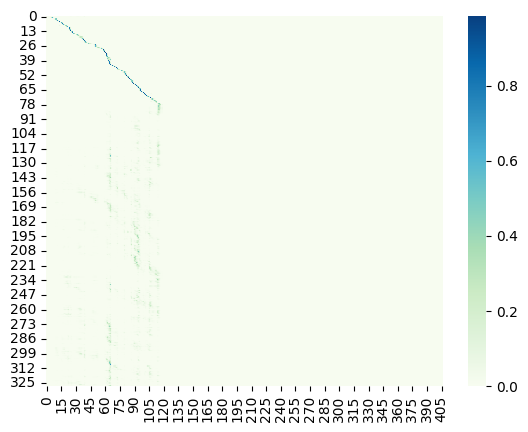

Saved best model

Epoch: 80/80


Val:   3%|▎         | 1/33 [00:02<01:35,  2.98s/it, dist=4.1467]

Ground Truth :  DAVID HELD IT CLOSE IN BOTH OF HIS SAYING GRATEFULLY THANK YOU MOTHER THEN FIXING HIS EYES ON THE YOUNGER YET NOT DEARER WOMEN HE ADDED WITH A RING IN HIS VOICE THAT MADE THEIR HEARTS ANSWER WITH A PROMPT AY AY IN SPITE OF LOVE OR FEAR
Prediction   :  DAVID HELD A CLOSE AND BOTH OF HIS SAYING GRATEFULLY THANK YOU MOTHER THEN FIXING HIS EYES ON THE YOUNGER YET NOT DEARER WOMEN HE ADDED WITH A RING IN HIS VOICE THAT MADE THEIR HEARTS AND SIR WITH A PROMPT EYE I AND SPITE OF LOVE OR FEAR


Val:   6%|▌         | 2/33 [00:05<01:22,  2.67s/it, dist=3.3967]

Ground Truth :  NO ONE COULD ESCAPE FROM THIS RICTUS
Prediction   :  NO ONE COULD ESCAPE FROM THIS WRICKNESS


Val:   9%|▉         | 3/33 [00:07<01:16,  2.55s/it, dist=3.2889]

Ground Truth :  SO LITTLE DID HE CONSIDER DROUET THAT IT NEVER ONCE OCCURRED TO HIM TO WORRY ABOUT HIS FINDING OUT
Prediction   :  SO LITTLE DID HE CONSIDER DREW THAT IT NEVER ONCE OCCURRED TO HIM TO WORRY ABOUT HIS FINDING OUT


Val:  12%|█▏        | 4/33 [00:10<01:09,  2.41s/it, dist=3.2033]

Ground Truth :  VERY CAREFULLY THE MAGICIAN REMOVED THIS POWDER PLACING IT ALL TOGETHER IN A GOLDEN DISH WHERE HE MIXED IT WITH A GOLDEN SPOON
Prediction   :  VERY CAREFULLY THE MAGICIAN REMOVED THIS POWDER PLACING IT ALTOGETHER IN A GOLDEN DISH WHERE HE MIXED IT WITH A GOLDEN SPOON


Val:  15%|█▌        | 5/33 [00:12<01:07,  2.40s/it, dist=2.9627]

Ground Truth :  THE SQUARES OF COTTON SHARP EDGED HEAVY WERE JUST ABOUT TO BURST TO BOLLS
Prediction   :  THE SQUARES OF COTTON SHARP EDGED HEAVY WERE JUST ABOUT TO BURST TO BOWLS


Val:  18%|█▊        | 6/33 [00:14<01:05,  2.43s/it, dist=2.8822]

Ground Truth :  OH REJOINED THE DAGUERREOTYPIST BECAUSE LIKE AN OLD LADY'S CUP OF TEA IT IS WATER BEWITCHED
Prediction   :  OH REJOINED THE DAGUERROTYPIST BECAUSE LIKE AN OLD LADY'S CUP OF TEA IT IS WATER BEWITCHED


Val:  21%|██        | 7/33 [00:17<01:02,  2.39s/it, dist=2.8371]

Ground Truth :  YOU DON'T SEEM TO REALIZE THE POSITION
Prediction   :  YOU DON'T SEEM TO REALIZE THE POSITION


Val:  24%|██▍       | 8/33 [00:19<00:59,  2.38s/it, dist=2.8300]

Ground Truth :  MAYBE THEY'RE UP TO SOME OF THEIR GAMES AND WANTS ROUSING
Prediction   :  MAYBE THEREUPT IS SOME OF THEIR GAMES AND WANTS ROUSING


Val:  27%|██▋       | 9/33 [00:21<00:56,  2.36s/it, dist=2.8000]

Ground Truth :  ALWAYS BUT IT'S WORSE NOW
Prediction   :  ALWAYS BUT ITS WORSE NOW


Val:  30%|███       | 10/33 [00:24<00:53,  2.33s/it, dist=2.8587]

Ground Truth :  HI THERE HISSED LUMPY FILLED WITH INDIGNATION THAT ANYONE SHOULD ATTEMPT TO MOUNT A PONY FROM THE RIGHT SIDE
Prediction   :  HIGH THERE HIS SLUMPY FILLED WITH THICK NATION THAT ANYONE SHOULD ATTEMPT TO MOUNT A PONY FROM THE RIGHT SIDE


Val:  33%|███▎      | 11/33 [00:26<00:52,  2.38s/it, dist=2.8406]

Ground Truth :  NOR COULD IT SEEM STRANGE OR INCREDIBLE THAT THE FIRST OF THESE AEONS THE LOGOS OR WORD OF GOD OF THE SAME SUBSTANCE WITH THE FATHER SHOULD DESCEND UPON EARTH TO DELIVER THE HUMAN RACE FROM VICE AND ERROR AND TO CONDUCT THEM IN THE PATHS OF LIFE AND IMMORTALITY
Prediction   :  NOR COULD IT SEEM STRANGE OR INCREDIBLE THAT THE FIRST OF THESE IONS THE LOGOS OR WORD OF GOD OF THE SAME SUBSTANCE WITH THE FATHER SHOULD DESCEND UPON EARTH TO DELIVER THE HUMAN RACE FROM VICE AND ERROR AND TO CONDUCT THEM IN THE PATHS OF LIFE AND IMMORTALITY


Val:  36%|███▋      | 12/33 [00:28<00:49,  2.35s/it, dist=2.7928]

Ground Truth :  I BECAME SOMEWHAT EMBARRASSED FOR I WAS USED TO BEING TAKEN FOR GRANTED BY MY ELDERS
Prediction   :  I BECAME SOMEWHAT EMBARRASSED FOR I WAS USED TO BEING TAKEN FOR GRANTED BY MY ELDERS


Val:  39%|███▉      | 13/33 [00:31<00:48,  2.41s/it, dist=2.7703]

Ground Truth :  THEY LAY IN HEAPS OF DOZENS EVEN CLOSE UP TO THE WORKS
Prediction   :  THEY LAY IN HEAPS OF DOZENS EVEN CLOSE UP TO THE WORKS


Val:  42%|████▏     | 14/33 [00:33<00:44,  2.35s/it, dist=2.7186]

Ground Truth :  THE YOUNG INVENTOR HAD JUST NOTICED HIS FRIEND LYING PINNED BENEATH A HEAVY BEAM NEARBY
Prediction   :  THE YOUNG INVENTOR HAD JUST NOTICED HIS FRIEND LYING PIN BENEATH A HEAVY BEAM NEAR BY


Val:  45%|████▌     | 15/33 [00:35<00:42,  2.34s/it, dist=2.7191]

Ground Truth :  AFORE CHRISTMAS TIME I WAS AS FULL AS FULL COULD BE OF GOING HOME FOR GOOD AND ALL YO HAN HEARD HOW I'VE WISHED IT THIS TERRIBLE LONG TIME
Prediction   :  AFORE CHRISTMAS TIME I WAS AS FULL AS FULL COULD BE OF GOING HOME FOR GOOD NO YOU AND HEARD HOW I'VE WISHED IT THIS TERRIBLE LONG TIME


Val:  48%|████▊     | 16/33 [00:38<00:40,  2.36s/it, dist=2.7021]

Ground Truth :  THE REGENT'S LADY ORDERED ONE OF HER SERVANTS TO GIVE THE EIGHTY CROWNS THAT HAD BEEN ASSESSED AS HER SHARE AT ONCE FOR THE CAPTAINS HAD ALREADY PAID DOWN THEIR SIXTY
Prediction   :  THE REGENT'S LADY ORDERED ONE OF HER SERVANTS TO GIVE THE EIGHTY CROWNS THAT HAD BEEN ASSESSED AS HER SHARE AT ONCE FOR THE CAPTAINS HAD ALREADY PAID DOWN THEIR SIXTY


Val:  52%|█████▏    | 17/33 [00:40<00:38,  2.39s/it, dist=2.7129]

Ground Truth :  BUT EVEN WHILE SHE ENJOYED EVERY HOUR OF LIFE AND BEGRUDGED THE TIME GIVEN TO SLEEP SHE FELT AS IF THE DREAM WAS TOO BEAUTIFUL TO LAST AND OFTEN SAID
Prediction   :  BUT EVEN WHILE SHE ENJOYED EVERY HOUR OF LIFE AND BEGRUDGED THE TIME GIVEN TO SLEEP SHE FELT AS IF THE DREAM WAS TOO BEAUTIFUL TO LAST AND OFTEN SAID


Val:  55%|█████▍    | 18/33 [00:43<00:35,  2.39s/it, dist=2.7300]

Ground Truth :  POP GOES RIGHT ON TUNING HIS CHANNEL
Prediction   :  POP GOES RIGHT ON TUNING HIS CHANNEL


Val:  58%|█████▊    | 19/33 [00:45<00:33,  2.37s/it, dist=2.6958]

Ground Truth :  IN THE HALF LIGHT HE LOOKED ABOUT AT THE STALLS AND BOXES AND SMILED A LITTLE CONSCIOUSLY RECALLING WITH AMUSEMENT SIR HARRY'S JUDICIAL FROWN
Prediction   :  IN THE HALF LIGHT HE LOOKED ABOUT AT THE STALLS AND BOXES AND SMILED A LITTLE CONSCIOUSLY RECALLING WITH AMUSEMENT SIR HARRY'S JUDICIAL FROWN


Val:  61%|██████    | 20/33 [00:48<00:31,  2.42s/it, dist=2.7050]

Ground Truth :  HE HAD NEITHER SYMPATHY WITH MY INNOCENCE NOR WITH MY WRETCHEDNESS AND THE PETRIFYING ACCURACY WITH WHICH HE ATTENDED TO EVERY FORM OF CIVILITY WHILE HE TORTURED ME BY HIS QUESTIONS HIS SUSPICIONS AND HIS INFERENCES WAS AS TORMENTING AS THE RACKS OF THE INQUISITION
Prediction   :  HE HAD NEITHER SYMPATHY WITH MY INNOCENCE NOR WITH MY WRETCHEDNESS AND THE PATROFYING ACCURACY WITH WHICH HE ATTENDED TO EVERY FORM OF SABILITY WHILE HE TORTURED ME BY HIS QUESTIONS HIS SUSPICIONS AND HIS INFERRENCES WAS AS TORMENTING AS THE RACKS OF THE INQUISITION


Val:  64%|██████▎   | 21/33 [00:50<00:28,  2.35s/it, dist=2.6794]

Ground Truth :  THERE ARE NATURES TOO TO WHOSE SENSE OF JUSTICE THE PRICE EXACTED LOOMS UP MONSTROUSLY ENORMOUS ODIOUS OPPRESSIVE WORRYING HUMILIATING EXTORTIONATE INTOLERABLE THOSE ARE THE FANATICS
Prediction   :  THERE ARE NATURES TOO TO WHOSE SENSE OF JUSTICE THE PRESEX ACTED LOOMS UP MARCHESLY ENORMOUS ODIOUS OPPRESSIVE WORRYING HUMILIATING EXTORTIONATE IN TOLERABLE THOSE OF THE PHINATICS


Val:  67%|██████▋   | 22/33 [00:52<00:25,  2.29s/it, dist=2.6712]

Ground Truth :  SO LEAVING KIND MESSAGES TO GEORGE AND JANE WILSON AND HESITATING WHETHER SHE MIGHT DARE TO SEND A FEW KIND WORDS TO JEM AND DECIDING THAT SHE HAD BETTER NOT SHE STEPPED OUT INTO THE BRIGHT MORNING LIGHT SO FRESH A CONTRAST TO THE DARKENED ROOM WHERE DEATH HAD BEEN
Prediction   :  SO LEAVING KIND MESSAGES TO GEORGE AND JANE WILSON AND HESITATING WHETHER SHE MIGHT DARE TO SEND A FEW KIND WORDS TO JIM AND DECIDING THAT SHE HAD BETTER NOT SHE STEPPED OUT INTO THE BRIGHT MORNING LIGHT SO FRESH A CONTRAST TO THE DARKENED ROOM WHERE DEATH HAD BEEN


Val:  70%|██████▉   | 23/33 [00:54<00:23,  2.34s/it, dist=2.7038]

Ground Truth :  I'LL BE GLAD TO TRY SIR HE REPLIED
Prediction   :  I'LL BE GLAD TO TRY SIR HE REPLIED


Val:  73%|███████▎  | 24/33 [00:57<00:21,  2.35s/it, dist=2.6917]

Ground Truth :  A LOAF OF HOUSEHOLD BREAD ABOUT TWO DAYS OLD ANSWERS FOR MAKING TOAST BETTER THAN COTTAGE BREAD THE LATTER NOT BEING A GOOD SHAPE AND TOO CRUSTY FOR THE PURPOSE
Prediction   :  A LOAF OF HOUSEHOLD BREAD ABOUT TWO DAYS OLD ANSWERS FOR MAKING TOAST BETTER THAN COTTAGE BREAD THE LATTER NOT BEING A GOOD SHAPE AND TWO CRUSTY FOR THE PURPOSE


Val:  76%|███████▌  | 25/33 [00:59<00:18,  2.37s/it, dist=2.6963]

Ground Truth :  ONLY NAME IT WHATEVER I HAVE I OFFER THEE
Prediction   :  ONLY NAME AT WHATEVER I HAVE I OFFER THEE


Val:  79%|███████▉  | 26/33 [01:02<00:16,  2.42s/it, dist=2.7313]

Ground Truth :  IF MISTER SOAMES SAW THEM THE GAME WAS UP
Prediction   :  IF MISTER SOAMES SAW THEM THE GAME WAS UP


Val:  82%|████████▏ | 27/33 [01:04<00:13,  2.33s/it, dist=2.7299]

Ground Truth :  SOME SPRINGS ARE SO HIGHLY IMPREGNATED WITH SALT AS TO HAVE RECEIVED THE NAME OF BRINE SPRINGS AND ARE SUPPOSED TO HAVE BECOME SO BY PASSING THROUGH THE SALT ROCKS BELOW GROUND AND THUS DISSOLVING A PORTION OF THIS MINERAL SUBSTANCE
Prediction   :  SOME SPRINGS ARE SO HIGHLY IMPREGNATED WITH SALT AS TO HAVE RECEIVED THE NAME OF BRINE SPRINGS AND ARE SUPPOSED TO HAVE BECOME SO BY PASSING THROUGH THE SALT ROCKS BELOW GROUND AND THUS DISSOLVING A PORTION OF THIS MINERAL SUBSTANCE


Val:  85%|████████▍ | 28/33 [01:06<00:11,  2.34s/it, dist=2.7255]

Ground Truth :  NATURE A DIFFERENCE OF FIFTY YEARS HAD SET A PROFOUND GULF BETWEEN JEAN VALJEAN AND COSETTE DESTINY FILLED IN THIS GULF
Prediction   :  NATURE A DIFFERENCE OF FIFTY YEARS HAD SET A PROFOUND GULF BETWEEN JEAN VALJEAN AND COSETTE DESTINY FILLED IN THIS GULF


Val:  88%|████████▊ | 29/33 [01:09<00:09,  2.38s/it, dist=2.7320]

Ground Truth :  HE CUTS OFF THE CHOICEST MORSEL OF THE MEAT AND CASTS IT INTO THE FIRE THE PUREST AND MOST ETHEREAL ELEMENT
Prediction   :  HE CUTS OFF THE CHOICEST MORTAL OF THE MEAT AND CAST THAT INTO THE FIRE THE PUREST AND MOST AT THE REAL ELEMENT


Val:  91%|█████████ | 30/33 [01:11<00:07,  2.43s/it, dist=2.7358]

Ground Truth :  IT WAS ABOUT NOON WHEN CAPTAIN WAVERLEY ENTERED THE STRAGGLING VILLAGE OR RATHER HAMLET OF TULLY VEOLAN CLOSE TO WHICH WAS SITUATED THE MANSION OF THE PROPRIETOR
Prediction   :  IT WAS ABOUT NOON WHEN CAPTAIN WAVERLY ENTERED THE STRAGGLING VILLAGE OR BROTHER HAMLET OF TWOLY BALE ON CLISTER WHICH WAS ITUATED THE MATCH AND OF THE PROPRIETOR


Val:  94%|█████████▍| 31/33 [01:14<00:04,  2.46s/it, dist=2.7439]

Ground Truth :  OF COURSE HILDA IS IRISH THE BURGOYNES HAVE BEEN STAGE PEOPLE FOR GENERATIONS AND SHE HAS THE IRISH VOICE
Prediction   :  OF COURSE HILDA IS IRISH THE BROGOINS HAVE BEEN STAGE PEOPLE FOR GENERATIONS AND SHE HAS THE IRISH VOICE


Val:  97%|█████████▋| 32/33 [01:16<00:02,  2.46s/it, dist=2.7358]

Ground Truth :  BUT THE WINDOWS ARE PATCHED WITH WOODEN PANES AND THE DOOR I THINK IS LIKE THE GATE IT IS NEVER OPENED
Prediction   :  BUT THE WINDOWS ARE PATCHED WITH WOODEN PAINS AND THE DOOR I THINK IS LIKE THE GATE IT IS NEVER OPENED


Val: 100%|██████████| 33/33 [01:17<00:00,  2.06s/it, dist=2.7393]

Ground Truth :  OUR ROADS LIE TOGETHER DOCTOR
Prediction   :  OUR ROADS LIE TOGETHER DOCTOR


	Train Loss 0.0685	 Learning Rate 0.0000030
	Val Dist 2.7393	
	Teacher Forcing Ratio 1	


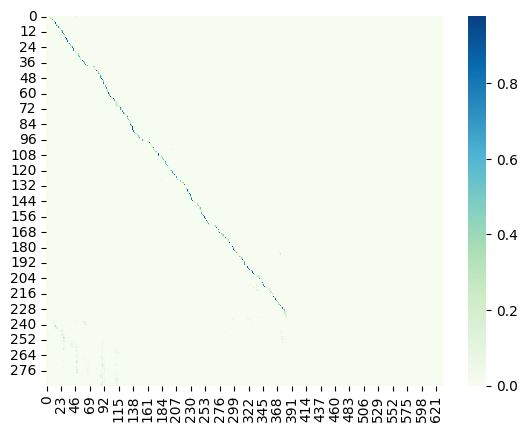

In [ ]:
gc.collect()
torch.cuda.empty_cache()

best_lev_dist = float("inf")
tf_rate = 1

for epoch in range(0, config['epochs']):
    
    print("\nEpoch: {}/{}".format(epoch+1, config['epochs']))

    curr_lr = float(optimizer.param_groups[0]['lr'])

    # Call train and validate, get attention weights from training

    # model, dataloader, criterion, optimizer, teacher_forcing_rate
    train_loss, running_perplexity, attention_plot = train(model,train_loader, criterion, optimizer,tf_rate)
    valid_dist = validate(model, val_loader)

    # Print your metrics
    print("\tTrain Loss {:.04f}\t Learning Rate {:.07f}".format(train_loss, curr_lr))
    print("\tVal Dist {:.04f}\t".format(valid_dist))
    print("\tTeacher Forcing Ratio {}\t".format(tf_rate))

    wandb.log({
        'train_loss': train_loss,  
        'valid_dist': valid_dist, 
        'lr'        : curr_lr,
        'tf_ratio'  : tf_rate
    })
    # Plot Attention for a single item in the batch
    plot_attention(attention_plot[0].cpu().detach().numpy())

    # Log metrics to Wandb

    # Optional: Scheduler Step / Teacher Force Schedule Step
    if epoch > 10:
      scheduler.step()
    # if (valid_dist < 30 or epoch >15) and tf_rate > 0.6:
    #   tf_rate*=0.985
    
    if valid_dist <= best_lev_dist:
        best_lev_dist = valid_dist
        save_path = "Run3_model_{0}_{1}_{2}.pth".format(config['lr'],config['batch_size'],model.name)
        save_model(model, optimizer, scheduler, ['valid_dist', valid_dist], epoch, save_path)
        wandb.save(save_path)
        print("Saved best model")
        # Save your model checkpoint here

# Testing

In [ ]:
def testing(model, dataloader):

    results = []
    model.eval()

    # batch_bar = tqdm(total=len(dataloader), dynamic_ncols=True, position=0, leave=False, desc="Testing")

    running_lev_dist = 0.0

    for i, (x,lx) in enumerate(dataloader):

        x, lx = x.to(DEVICE), lx

        with torch.inference_mode():
            raw_predictions, attentions = model(x, lx, y = None)

        greedy_predictions   = torch.argmax(raw_predictions, dim=2) # TODO: How do you get the most likely character from each distribution in the batch?

        del x, lx
        results.extend(greedy_predictions)
    return results

In [ ]:
checkpoint = torch.load("/content/Run3_model_0.001_150_LAS.pth")
model_dict = checkpoint["model_state_dict"]
# opt_dict = checkpoint["optimizer_state_dict"]
# sched_dict = checkpoint["scheduler_state_dict"]
model.load_state_dict(model_dict)
# optimizer.load_state_dict(opt_dict)
# scheduler.load_state_dict(sched_dict)


<All keys matched successfully>

In [ ]:
ep = checkpoint["epoch"]

In [ ]:
ep

78

In [ ]:
results = testing(model, test_loader)
results

[tensor([ 1, 10,  7, 30, 10, 17, 18,  7,  6, 30, 22, 10,  7, 20,  7, 30, 25, 17,
         23, 14,  6, 30,  4,  7, 30, 21, 22,  7, 25, 30,  8, 17, 20, 30,  6, 11,
         16, 16,  7, 20, 30, 22, 23, 20, 16, 11, 18, 21, 30,  3, 16,  6, 30,  5,
          3, 20, 20, 17, 22, 21, 30,  3, 16,  6, 30,  4, 20, 23, 11, 21,  7,  6,
         30, 18, 17, 22,  3, 22, 17,  7, 21, 30,  3, 16,  6, 30,  8,  3, 22, 30,
         15, 23, 22, 22, 17, 16, 30, 18, 11,  7,  5,  7, 21, 30, 22, 17, 30,  4,
          7, 30, 14,  3,  6, 14,  7,  6, 30, 17, 23, 22, 30, 11, 16, 30, 22, 10,
         11,  5, 13, 30, 18,  7, 18, 18,  7, 20,  7,  6, 30,  8, 14, 17, 23, 20,
         30,  8,  3, 22, 22,  7, 16,  7,  6, 30, 21,  3, 23,  5,  7,  2,  2,  2,
          2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2, 21,  2,  3,
         16,  6, 30, 21,  3, 23,  5,  7,  2,  2,  2,  2,  2, 21,  2,  3, 20,  6,
         30,  3, 16,  6, 30, 22, 10,  7, 30, 30,  3, 30, 22, 10,  7, 30, 14,  7,
         30,  3, 30,  3, 30,

In [ ]:
valid_dist = validate(model, val_loader)

Val:   4%|▍         | 1/24 [00:02<00:56,  2.44s/it, dist=10.8133]

Ground Truth :  WISHING HIM SAID MARY IN A TONE OF INQUIRY
Prediction   :  WISHING HIM SAID MARY IN A TONE OF INGRY


Val:   8%|▊         | 2/24 [00:05<00:55,  2.53s/it, dist=11.1233]

Ground Truth :  MAYBE THEY'RE UP TO SOME OF THEIR GAMES AND WANTS ROUSING
Prediction   :  MAYBE THEREUP TO SOME OF THEIR GAMES AND WANTS ROUSING


Val:  12%|█▎        | 3/24 [00:07<00:52,  2.49s/it, dist=11.0844]

Ground Truth :  BUT NOW IT DOESN'T SEEM TO MATTER VERY MUCH
Prediction   :  BUT NOW WE DOESN'T SEEM TO MOTER VERY MUCH


Val:  17%|█▋        | 4/24 [00:09<00:49,  2.45s/it, dist=10.9467]

Ground Truth :  SHOULD YOU DESIRE TO FIND OUT MORE ABOUT THE BATTLE I REFER YOU TO HISTORY
Prediction   :  SHOULD YOU DESIRE TO FIND OUT MORE ABOUT THE BATTLE I REFER YOU TO HISTORY


Val:  21%|██        | 5/24 [00:12<00:45,  2.37s/it, dist=10.7547]

Ground Truth :  THEN THERE WAS SILENCE THEN A SIGH AND THE SOUND OF LIGHT MOVING FEET ON THE GRAVEL
Prediction   :  THEIR NOSE SILENCE THE DESIGH AND THE SOUND OF LIGHT MOVING FEET ON THE GRAVEL


Val:  25%|██▌       | 6/24 [00:14<00:42,  2.37s/it, dist=10.7756]

Ground Truth :  MEANWHILE HOW FARED IT WITH THE FLOWERS
Prediction   :  MEANWHILE HOW FARED IT WITH THE FLOWERS


Val:  29%|██▉       | 7/24 [00:16<00:39,  2.34s/it, dist=10.4943]

Ground Truth :  AND THE CAPTAIN OF COURSE CONCLUDED AFTER HAVING BEEN INTRODUCED TO KITTY THAT MISSUS NORMAN WAS A WIDOW
Prediction   :  THEN THE CAPTAIN OF COURSE CONCLUDED AFTER HAVING BEEN INTRODUCED TO KITTY THAT MISSUS DORMAN WAS A WIDOW


Val:  33%|███▎      | 8/24 [00:19<00:37,  2.32s/it, dist=10.6058]

Ground Truth :  THE FLY TRAP AND CHARLIE'S FASHION THE FIRST IN SUTTER STREET NEAR KEARNY AND THE OTHER IN MARKET NEAR SUTTER SERVE WELL COOKED FOODS ESPECIALLY SOUP SALADS AND FISH
Prediction   :  THE FLY TRAP AND CHARLEY'S FASHION THE VERSE CONSIDERESTREET NEW CARRIING AND THE OTHER IN MARKET NEAR SUTTER SERVE WELCOUT THE WOODS ESPECIALLY SUPP SALADS AND FISH


Val:  38%|███▊      | 9/24 [00:21<00:35,  2.35s/it, dist=10.8104]

Ground Truth :  SEE SAID UNCAS POINTING NORTH AND SOUTH AT THE EVIDENT MARKS OF THE BROAD TRAIL ON EITHER SIDE OF HIM THE DARK HAIR HAS GONE TOWARD THE FOREST
Prediction   :  SEE SAID UNCAS POINTING NORTH AND SOUTH AT THE EVIDENT MARKS OF THE BROAD TRAIL ON EITHER SIDE OF HIM THE DARK HAIR HAS GONE TOWARD THE FOREST


Val:  42%|████▏     | 10/24 [00:23<00:33,  2.36s/it, dist=10.7073]

Ground Truth :  HE REMAINED UP STAIRS UNTIL AFTER THE EARLY DAWN SHOWED MARY THAT SHE NEED HAVE NO FEAR OF GOING HOME THROUGH THE DESERTED AND QUIET STREETS TO TRY AND GET A LITTLE SLEEP BEFORE WORK HOUR
Prediction   :  HE REMAINED UP STAIRS UNTIL AFTER THE EARLY DAN SHOWED MERRY THAT SHE NEED HAVE NO FEAR OF GOING HOME TO THE DESERTED INQUIET STREETS TRANGED A LITTLE SLEEP BEFORE WORK OUT


Val:  46%|████▌     | 11/24 [00:26<00:30,  2.36s/it, dist=10.7018]

Ground Truth :  YOU'RE A RARE UN FOR SITTING DOWN TO YOUR WORK A LITTLE WHILE AFTER IT'S TIME TO PUT BY
Prediction   :  YOU'RE A RARE UN FOR SITTING DOWN TO YOUR WORK A LITTLE WHILE AFTER IT'S TIME TO PUT BY


Val:  50%|█████     | 12/24 [00:28<00:27,  2.33s/it, dist=10.5761]

Ground Truth :  HYPOCRITE A HORSE DEALER
Prediction   :  HYPOCRITE A HORSE DEALER


Val:  54%|█████▍    | 13/24 [00:30<00:26,  2.36s/it, dist=10.7036]

Ground Truth :  BUT MEN KEPT ON FIGHTING AND ROBBING EVEN WHILE THE RAIN WAS POURING DOWN AND THE SEA WAS COMING UP OVER THE LAND
Prediction   :  BUT MEN KEPT ON FIGHTING AND ROBBING EVEN WHILE THE RAIN WAS POURING DOWN AND THE SEA WAS COMING UP OVER THE LAND


Val:  58%|█████▊    | 14/24 [00:33<00:23,  2.35s/it, dist=10.7438]

Ground Truth :  POYSER IS NOT AT HOME IS HE
Prediction   :  POYSER IS NOT AT HOME IS HE


Val:  62%|██████▎   | 15/24 [00:35<00:21,  2.34s/it, dist=10.7164]

Ground Truth :  WHAT LED ME INTO IT WAS A CERTAIN THIRST FOR VENGEANCE WHICH IS STRONG ENOUGH TO DISTURB THE QUIETEST HEARTS
Prediction   :  WHAT LED ME INTO IT WAS A CERTAIN THURSD FOR VENGEANCE WHICH IS STRONG ENOUGH TO DISTURB THE QUIET IS TARTS


Val:  67%|██████▋   | 16/24 [00:38<00:19,  2.39s/it, dist=11.0617]

Ground Truth :  THE PEOPLE IS A BEAST OF MUDDY BRAIN THAT KNOWS NOT ITS OWN FORCE AND THEREFORE STANDS LOADED WITH WOOD AND STONE THE POWERLESS HANDS OF A MERE CHILD GUIDE IT WITH BIT AND REIN ONE KICK WOULD BE ENOUGH TO BREAK THE CHAIN BUT THE BEAST FEARS AND WHAT THE CHILD DEMANDS IT DOES NOR ITS OWN TERROR UNDERSTANDS CONFUSED AND STUPEFIED BY BUGBEARS VAIN
Prediction   :  THE PEOPLE IS A BEAST OF MONEY BRAIN BUT NOSE NOT IT SOUND FORCE AND THEREFORE STANDS THOUGH IT WOULD WORD AND STONE THE POWERLESS HANDS OF A MERE CHILD GUIDE IT WITH BIT AND REIGN ONE KICK WOULD BE ENOUGH TO BREAK THE CHAIN BUT THE BEAST FEARS AND WHAT THE CHILD AMANDS IT DOES NOR ITS OWN TERROR UNDERSTANDS CONFUSED IN STUPIFIED BY BUD BEARS VAIN


Val:  71%|███████   | 17/24 [00:40<00:17,  2.43s/it, dist=11.2106]

Ground Truth :  THIS WAS CARRIED OUT TO THE LETTER
Prediction   :  THIS WAS CARRIED OUT TO THE LETTER


Val:  75%|███████▌  | 18/24 [00:42<00:14,  2.38s/it, dist=11.1222]

Ground Truth :  THEY TALKED FOR FOUR HOURS AND HAD NOT THEN SAID HALF THAT WAS IN THEIR HEADS TO SAY
Prediction   :  A TOP FOR FOUR HOURS AND IT NOT THEN SAID HOUSE THAT WAS IN THEIR HEADS TO SAY


Val:  79%|███████▉  | 19/24 [00:45<00:11,  2.34s/it, dist=11.0084]

Ground Truth :  THOMPSON OPENED A LARGE RESTAURANT IN O'FARRELL STREET JUST ABOVE FILLMORE AND FOR TWO YEARS OR MORE DID A THRIVING BUSINESS HIS PLACE BEING NOTED FOR ITS GOOD COOKING AND ITS SPLENDID SERVICE
Prediction   :  TOM SOME OPENED A LARGE RESTAURANT IN A FARRIL STREET JUST ABOVE THOMORE AND FOR TWO YEARS OR MORE JUDITH RIVING BOSNESS HIS PLACE BEING NOTED FOR ITS GOOD COOKING AND ITS SPLENDID SERVICE


Val:  83%|████████▎ | 20/24 [00:47<00:09,  2.36s/it, dist=11.0257]

Ground Truth :  HE HADN'T SEEN ANYTHING TO SHOOT AT BUT HE BLAZED AWAY HE LOADED AND FIRED THE SECOND TIME WHEN THEY WERE ORDERED TO RETREAT
Prediction   :  HENCE IN A THING SHOOT AT BUT HE BLAZED AWAY HE LOADED AND FIRED THE SECOND TIME WHEN THEY WERE ORDERED TO ATTRATE


Val:  88%|████████▊ | 21/24 [00:49<00:07,  2.35s/it, dist=11.0010]

Ground Truth :  THE OTHER LOOKED PALE AND ILL BUT HE WAS MARVELLOUSLY SELF CONTAINED AND IT WAS IMPOSSIBLE TO SAY WHAT WAS THE MATTER WITH HIM
Prediction   :  THE ADOLET PALE AND ILL BUT HE WAS MARVELOUSLY SELF CONTAINED AND IT WAS IMPOSSIBLE THAT A SAILOR WAS THE MATTER WITH HIM


Val:  92%|█████████▏| 22/24 [00:52<00:04,  2.34s/it, dist=10.9452]

Ground Truth :  IN A FEW HOURS THE EXAMINATION WOULD COMMENCE AND HE WAS STILL IN THE DILEMMA BETWEEN MAKING THE FACTS PUBLIC AND ALLOWING THE CULPRIT TO COMPETE FOR THE VALUABLE SCHOLARSHIP
Prediction   :  IN A FEW HOURS THE EXAMINATION WOULD COMMENCE AND HE WAS STILL IN THE DILEMMA BETWEEN MAKING THE FACTS PUBLIC AND ALLOWING THE CULPRIT TO COMPETE FOR THE VALUABLE SCHOLARSHIP


Val:  96%|█████████▌| 23/24 [00:54<00:02,  2.32s/it, dist=10.9835]

Ground Truth :  THE WOMAN SEEMED THOUGHTFUL
Prediction   :  THE WOMAN SEEMED THOUGHTFUL


Ground Truth :  BUT I'M IN NO POSITION TO MAKE PROMISES
Prediction   :  BUT I AM IN NO POSITION TO MAKE PROMISES


In [ ]:
valid_dist

10.881602564102565

In [ ]:
# Optional: Load your best model Checkpoint here

# TODO: Create a testing function similar to validation 
results = testing(model, test_loader)
# TODO: Create a file with all predictions 
with open('submission_new.csv', 'w') as file:
  file.write("index,label\n")
  for i, pred in enumerate(results):
    pred_sliced = indices_to_chars(results[i], VOCAB)
    pred_string = ''.join(pred_sliced)
    file.write(f"{i},{pred_string}\n")


In [ ]:
# !kaggle competitions submit -c 11-785-s23-hw4p2 -f submission_new.csv -m "Finally done"
!kaggle competitions submit -c attention-based-speech-recognition-slack -f submission_new.csv -m "Done"

100% 290k/290k [00:01<00:00, 152kB/s]
Successfully submitted to Attention-Based Speech Recognition (Slack)